<h1 align = "center">cDCGAN for Ising Lattice Generation
<h3 align = "center"> Author: Ahmedeo Shokry
<h3 align = "center"> ID number: 1750037
<h3 align = "center"> E-mail: shokry.1750037@studenti.uniroma1.it

In [1]:
# Import fundamental libraries
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
# Import Ising lattices and temperatures
data1 = np.loadtxt('ising.txt', unpack = True)
labels = np.loadtxt('ising_target.txt', unpack = True)

In [3]:
# Reshape and crop the lattices
data2 = np.reshape(np.transpose(data1), (10000, 100, 100))
data = data2[:, 2:98, 2:98]

In [4]:
# Discretize the temperature in 100 categories
disc_temp = np.arange(0, 5, 0.05)+0.05
categories = np.arange(0,500)
cat = np.zeros(len(labels))

for i in range(len(labels)):
    for j in range(len(disc_temp)):
        if labels[i] > disc_temp[j]:
            pass
        if labels[i] <= disc_temp[j]:
            cat[i] = categories[j]
            break

In [8]:
# Check is the GPU is available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [6]:
# Import utilities
from numpy.random import randn
from numpy.random import randint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Reshape
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import ELU, ReLU
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import MaxPool2D

In [7]:
# Define the discriminator model
# The model take 96x96x1 images and the number of classes as input
def define_discriminator(in_shape=(96,96,1), n_classes=100): 

    # Define the input layer
    in_label = Input(shape=(1,)) 
    # Embedding for categorical input (dimension = 500)
    embed = Embedding(n_classes, 500)(in_label)
    # Scale up to image dimensions with linear activation
    n_nodes = in_shape[0] * in_shape[1]
    embed = Dense(n_nodes)(embed)
    # Reshape to additional channel
    embed = Reshape((in_shape[0], in_shape[1], 1))(embed)
    # Image input
    in_image = Input(shape=in_shape)
    # Concatenate label as a channel
    merge = Concatenate()([in_image, embed])
    # Downsample
    conv = Conv2D(64, (3,3), strides = (2,2), padding='same')(merge)
    conv = ELU(alpha=1.0)(conv)
    
    conv = Conv2D(64, (3,3), strides = (2,2), padding='same')(conv)
    conv = ELU(alpha=1.0)(conv)    
    
    conv = Conv2D(128, (3,3), strides = (2,2), padding='same')(conv)
    conv = ELU(alpha=1.0)(conv)
    # Flatten feature maps
    flat = Flatten()(conv)
    # Dropout
    flat = Dropout(0.45)(flat)
    # Output
    out_layer = Dense(1, activation='sigmoid')(flat)
    # Define model
    model = Model([in_image, in_label], out_layer)
    # Compile model
    optim = Adam(learning_rate = 0.0002, beta_1=0.9, beta_2=0.999)
    model.compile(loss='binary_crossentropy', optimizer=optim, metrics=['accuracy'])
    
    return model

In [8]:
# Define the generator model
def define_generator(latent_dim, n_classes=100):

    # Define the input layer
    in_label = Input(shape=(1,))
    # Embedding for categorical input (dimension = 500)
    embed = Embedding(n_classes, 500)(in_label)
    # Linear dense net
    n_nodes = 12 * 12
    embed = Dense(n_nodes)(embed)
    # Reshape to additional channel
    embed = Reshape((12, 12, 1))(embed)
    # Image generator input
    in_lat = Input(shape=(latent_dim,))
    # Create foundation image 12*12
    n_nodes = 128 * 12 * 12
    gen = Dense(n_nodes)(in_lat)
    gen = ELU(alpha=1.0)(gen)
    gen = Reshape((12, 12, 128))(gen)
    # Merge the generated image and label input
    merge = Concatenate()([gen, embed])
    # Upsample 
    gen = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same')(merge)
    gen = ELU(alpha=1.0)(gen)    
    
    gen = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same')(gen)
    gen = ELU(alpha=1.0)(gen)
    
    gen = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same')(gen)
    gen = ELU(alpha=1.0)(gen)
    # Output
    out_layer = Conv2D(1, (7,7), activation='tanh', padding='same')(gen)
    # Define model
    model = Model([in_lat, in_label], out_layer)
    
    return model

In [9]:
# Define the combined generator and discriminator model, for updating the generator
def define_gan(gen_model, disc_model):
    
    # Make weights in the discriminator not trainable
    disc_model.trainable = False
    # Get noise and label inputs from generator model
    gen_noise, gen_label = gen_model.input
    # Get image output from the generator model
    gen_output = gen_model.output
    # Connect image output and label input from generator as inputs to discriminator
    gan_output = disc_model([gen_output, gen_label])
    # Define gan model as taking noise and label and outputting a classification
    model = Model([gen_noise, gen_label], gan_output)
    # Compile model
    opt = Adam(learning_rate = 0.0002, beta_1=0.9, beta_2=0.999)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    
    return model

In [10]:
# Load real images
def load_real_samples():
    
    # Save as a tensor called trainX the 2D Ising lattices
    trainX = data 
    # Save as an array called trainy the label of each Ising lattices
    y = np.ravel(cat)
    # Expand to 3D the trainX tensor adding a channel
    X = np.expand_dims(trainX, axis=-1)
    
    return [X, y]
 
# Select real samples
def generate_real_samples(dataset, n_samples):
    
    # Split into images and labels
    images, labels = dataset
    # Choose a random index
    idx = randint(0, images.shape[0], n_samples)    
    # Select images and labels using the random index
    X,labels = images[idx],labels[idx]    
    # Generate class labels
    y = np.ones((n_samples, 1))
    
    return [X, labels], y

In [11]:
# Generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=100):

    # Generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # Reshape into a batch of inputs for the network
    z_input = x_input.reshape(n_samples, latent_dim)
    # Generate labels
    labels = randint(0, n_classes, n_samples)
    
    return [z_input, labels]
 
# Use the generator to generate n fake examples, with class labels
def generate_fake_samples(generator, latent_dim, n_samples):

    # Generate points in latent space
    z_input, labels_input = generate_latent_points(latent_dim, n_samples)
    # Predict outputs
    images = generator.predict([z_input, labels_input])
    # Create class labels
    y = np.zeros((n_samples, 1))
    
    return [images, labels_input], y

In [12]:
# Define the number of epoch
n_epoch = 1000
n_batches = 128
 
# Train the generator and discriminator
def train(gen_model, disc_model, gan_model, dataset, latent_dim, n_epochs=n_epoch, n_batch=n_batches):
    
    batch_per_epoch = int(dataset[0].shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # Create an empty array for the losses
    losses = []
    
    # Manually enumerate epochs
    for i in range(n_epochs):
        # Enumerate batches over the training set
        for j in range(batch_per_epoch):
            # Get randomly selected 'real' samples
            [X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)
            # Update discriminator model weights
            disc_loss_real, _ = disc_model.train_on_batch([X_real, labels_real], y_real)
            # Generate 'fake' examples
            [X_fake, labels], y_fake = generate_fake_samples(gen_model, latent_dim, half_batch)
            # Update discriminator model weights
            disc_loss_fake, _ = disc_model.train_on_batch([X_fake, labels], y_fake)
            # Prepare points in latent space as input for the generator
            [z_input, labels_input] = generate_latent_points(latent_dim, n_batch)
            # Create inverted labels for the fake samples
            y_gan = np.ones((n_batch, 1))
            # Update the generator via the discriminator's error
            gan_loss = gan_model.train_on_batch([z_input, labels_input], y_gan)
            # Appen the loss of the three models every batch per epoch
            losses.append([disc_loss_real, disc_loss_fake, gan_loss])
            # Summarize loss on this batch
            print('Epoch: %d / %d, Batch: %d/%d, Loss_Real = %.3f, Loss_Fake = %.3f Loss_GAN = %.3f' %
                (i+1, n_epoch, j+1, batch_per_epoch, disc_loss_real, disc_loss_fake, gan_loss))
            
    # Save the generator, discriminator and gan models
    gen_model.save('cgan_generator.h5')
    disc_model.save('cgan_discriminator.h5')
    gan_model.save('cgan_gan.h5')
    
    return losses

In [161]:
# Define the size of the latent space
latent_dim = 500
# Create the discriminator
disc_model = define_discriminator()
# Create the generator
gen_model = define_generator(latent_dim)
# Create the gan
gan_model = define_gan(gen_model, disc_model)
# Load image data
dataset = load_real_samples()
# Train model
loss = train(gen_model, disc_model, gan_model, dataset, latent_dim)

Epoch: 1 / 1000, Batch: 1/78, Loss_Real = 0.691, Loss_Fake = 0.698 Loss_GAN = 0.690
Epoch: 1 / 1000, Batch: 2/78, Loss_Real = 0.687, Loss_Fake = 0.697 Loss_GAN = 0.688
Epoch: 1 / 1000, Batch: 3/78, Loss_Real = 0.664, Loss_Fake = 0.700 Loss_GAN = 0.686
Epoch: 1 / 1000, Batch: 4/78, Loss_Real = 0.662, Loss_Fake = 0.702 Loss_GAN = 0.683
Epoch: 1 / 1000, Batch: 5/78, Loss_Real = 0.656, Loss_Fake = 0.705 Loss_GAN = 0.684
Epoch: 1 / 1000, Batch: 6/78, Loss_Real = 0.648, Loss_Fake = 0.702 Loss_GAN = 0.687
Epoch: 1 / 1000, Batch: 7/78, Loss_Real = 0.613, Loss_Fake = 0.702 Loss_GAN = 0.690
Epoch: 1 / 1000, Batch: 8/78, Loss_Real = 0.613, Loss_Fake = 0.697 Loss_GAN = 0.691
Epoch: 1 / 1000, Batch: 9/78, Loss_Real = 0.587, Loss_Fake = 0.694 Loss_GAN = 0.697
Epoch: 1 / 1000, Batch: 10/78, Loss_Real = 0.584, Loss_Fake = 0.686 Loss_GAN = 0.702
Epoch: 1 / 1000, Batch: 11/78, Loss_Real = 0.526, Loss_Fake = 0.684 Loss_GAN = 0.711
Epoch: 1 / 1000, Batch: 12/78, Loss_Real = 0.532, Loss_Fake = 0.680 Loss_G

Epoch: 2 / 1000, Batch: 20/78, Loss_Real = 0.018, Loss_Fake = 0.014 Loss_GAN = 6.228
Epoch: 2 / 1000, Batch: 21/78, Loss_Real = 0.012, Loss_Fake = 0.020 Loss_GAN = 6.578
Epoch: 2 / 1000, Batch: 22/78, Loss_Real = 0.012, Loss_Fake = 0.016 Loss_GAN = 6.367
Epoch: 2 / 1000, Batch: 23/78, Loss_Real = 0.015, Loss_Fake = 0.011 Loss_GAN = 6.315
Epoch: 2 / 1000, Batch: 24/78, Loss_Real = 0.014, Loss_Fake = 0.012 Loss_GAN = 6.302
Epoch: 2 / 1000, Batch: 25/78, Loss_Real = 0.012, Loss_Fake = 0.017 Loss_GAN = 6.547
Epoch: 2 / 1000, Batch: 26/78, Loss_Real = 0.007, Loss_Fake = 0.030 Loss_GAN = 6.001
Epoch: 2 / 1000, Batch: 27/78, Loss_Real = 0.007, Loss_Fake = 0.019 Loss_GAN = 6.070
Epoch: 2 / 1000, Batch: 28/78, Loss_Real = 0.011, Loss_Fake = 0.031 Loss_GAN = 6.007
Epoch: 2 / 1000, Batch: 29/78, Loss_Real = 0.020, Loss_Fake = 0.026 Loss_GAN = 5.971
Epoch: 2 / 1000, Batch: 30/78, Loss_Real = 0.011, Loss_Fake = 0.014 Loss_GAN = 6.168
Epoch: 2 / 1000, Batch: 31/78, Loss_Real = 0.011, Loss_Fake = 0.0

Epoch: 3 / 1000, Batch: 39/78, Loss_Real = 0.007, Loss_Fake = 0.005 Loss_GAN = 8.418
Epoch: 3 / 1000, Batch: 40/78, Loss_Real = 0.006, Loss_Fake = 0.008 Loss_GAN = 7.609
Epoch: 3 / 1000, Batch: 41/78, Loss_Real = 0.006, Loss_Fake = 0.006 Loss_GAN = 8.293
Epoch: 3 / 1000, Batch: 42/78, Loss_Real = 0.011, Loss_Fake = 0.003 Loss_GAN = 8.578
Epoch: 3 / 1000, Batch: 43/78, Loss_Real = 0.007, Loss_Fake = 0.009 Loss_GAN = 8.017
Epoch: 3 / 1000, Batch: 44/78, Loss_Real = 0.011, Loss_Fake = 0.004 Loss_GAN = 8.257
Epoch: 3 / 1000, Batch: 45/78, Loss_Real = 0.008, Loss_Fake = 0.006 Loss_GAN = 7.980
Epoch: 3 / 1000, Batch: 46/78, Loss_Real = 0.006, Loss_Fake = 0.007 Loss_GAN = 7.980
Epoch: 3 / 1000, Batch: 47/78, Loss_Real = 0.007, Loss_Fake = 0.006 Loss_GAN = 8.301
Epoch: 3 / 1000, Batch: 48/78, Loss_Real = 0.010, Loss_Fake = 0.007 Loss_GAN = 8.075
Epoch: 3 / 1000, Batch: 49/78, Loss_Real = 0.004, Loss_Fake = 0.008 Loss_GAN = 7.964
Epoch: 3 / 1000, Batch: 50/78, Loss_Real = 0.007, Loss_Fake = 0.0

Epoch: 4 / 1000, Batch: 58/78, Loss_Real = 0.509, Loss_Fake = 4.649 Loss_GAN = 1.084
Epoch: 4 / 1000, Batch: 59/78, Loss_Real = 0.889, Loss_Fake = 3.766 Loss_GAN = 0.719
Epoch: 4 / 1000, Batch: 60/78, Loss_Real = 0.874, Loss_Fake = 2.450 Loss_GAN = 1.796
Epoch: 4 / 1000, Batch: 61/78, Loss_Real = 1.694, Loss_Fake = 0.431 Loss_GAN = 3.584
Epoch: 4 / 1000, Batch: 62/78, Loss_Real = 2.758, Loss_Fake = 0.307 Loss_GAN = 4.935
Epoch: 4 / 1000, Batch: 63/78, Loss_Real = 3.574, Loss_Fake = 0.229 Loss_GAN = 4.421
Epoch: 4 / 1000, Batch: 64/78, Loss_Real = 3.083, Loss_Fake = 0.080 Loss_GAN = 3.221
Epoch: 4 / 1000, Batch: 65/78, Loss_Real = 2.213, Loss_Fake = 0.287 Loss_GAN = 1.966
Epoch: 4 / 1000, Batch: 66/78, Loss_Real = 1.957, Loss_Fake = 0.455 Loss_GAN = 1.536
Epoch: 4 / 1000, Batch: 67/78, Loss_Real = 1.407, Loss_Fake = 0.366 Loss_GAN = 1.767
Epoch: 4 / 1000, Batch: 68/78, Loss_Real = 0.936, Loss_Fake = 0.677 Loss_GAN = 1.619
Epoch: 4 / 1000, Batch: 69/78, Loss_Real = 1.059, Loss_Fake = 0.7

Epoch: 5 / 1000, Batch: 77/78, Loss_Real = 0.344, Loss_Fake = 0.503 Loss_GAN = 1.600
Epoch: 5 / 1000, Batch: 78/78, Loss_Real = 0.461, Loss_Fake = 0.335 Loss_GAN = 1.890
Epoch: 6 / 1000, Batch: 1/78, Loss_Real = 0.440, Loss_Fake = 0.477 Loss_GAN = 2.005
Epoch: 6 / 1000, Batch: 2/78, Loss_Real = 0.522, Loss_Fake = 0.445 Loss_GAN = 1.468
Epoch: 6 / 1000, Batch: 3/78, Loss_Real = 0.396, Loss_Fake = 0.604 Loss_GAN = 1.562
Epoch: 6 / 1000, Batch: 4/78, Loss_Real = 0.404, Loss_Fake = 0.530 Loss_GAN = 1.830
Epoch: 6 / 1000, Batch: 5/78, Loss_Real = 0.412, Loss_Fake = 0.274 Loss_GAN = 1.943
Epoch: 6 / 1000, Batch: 6/78, Loss_Real = 0.518, Loss_Fake = 0.363 Loss_GAN = 1.782
Epoch: 6 / 1000, Batch: 7/78, Loss_Real = 0.399, Loss_Fake = 0.393 Loss_GAN = 1.602
Epoch: 6 / 1000, Batch: 8/78, Loss_Real = 0.413, Loss_Fake = 0.323 Loss_GAN = 1.748
Epoch: 6 / 1000, Batch: 9/78, Loss_Real = 0.411, Loss_Fake = 0.301 Loss_GAN = 1.913
Epoch: 6 / 1000, Batch: 10/78, Loss_Real = 0.503, Loss_Fake = 0.359 Loss_G

Epoch: 7 / 1000, Batch: 18/78, Loss_Real = 0.286, Loss_Fake = 0.281 Loss_GAN = 2.391
Epoch: 7 / 1000, Batch: 19/78, Loss_Real = 0.275, Loss_Fake = 0.283 Loss_GAN = 2.407
Epoch: 7 / 1000, Batch: 20/78, Loss_Real = 0.242, Loss_Fake = 0.302 Loss_GAN = 2.699
Epoch: 7 / 1000, Batch: 21/78, Loss_Real = 0.284, Loss_Fake = 0.280 Loss_GAN = 2.446
Epoch: 7 / 1000, Batch: 22/78, Loss_Real = 0.197, Loss_Fake = 0.399 Loss_GAN = 2.545
Epoch: 7 / 1000, Batch: 23/78, Loss_Real = 0.256, Loss_Fake = 0.261 Loss_GAN = 3.076
Epoch: 7 / 1000, Batch: 24/78, Loss_Real = 0.501, Loss_Fake = 0.246 Loss_GAN = 2.765
Epoch: 7 / 1000, Batch: 25/78, Loss_Real = 0.209, Loss_Fake = 0.289 Loss_GAN = 2.673
Epoch: 7 / 1000, Batch: 26/78, Loss_Real = 0.252, Loss_Fake = 0.247 Loss_GAN = 2.597
Epoch: 7 / 1000, Batch: 27/78, Loss_Real = 0.278, Loss_Fake = 0.335 Loss_GAN = 2.661
Epoch: 7 / 1000, Batch: 28/78, Loss_Real = 0.228, Loss_Fake = 0.210 Loss_GAN = 2.818
Epoch: 7 / 1000, Batch: 29/78, Loss_Real = 0.221, Loss_Fake = 0.3

Epoch: 8 / 1000, Batch: 37/78, Loss_Real = 0.309, Loss_Fake = 0.239 Loss_GAN = 3.265
Epoch: 8 / 1000, Batch: 38/78, Loss_Real = 0.312, Loss_Fake = 0.478 Loss_GAN = 3.223
Epoch: 8 / 1000, Batch: 39/78, Loss_Real = 0.370, Loss_Fake = 0.277 Loss_GAN = 3.628
Epoch: 8 / 1000, Batch: 40/78, Loss_Real = 0.628, Loss_Fake = 0.221 Loss_GAN = 2.896
Epoch: 8 / 1000, Batch: 41/78, Loss_Real = 0.643, Loss_Fake = 0.790 Loss_GAN = 2.797
Epoch: 8 / 1000, Batch: 42/78, Loss_Real = 0.336, Loss_Fake = 0.423 Loss_GAN = 2.554
Epoch: 8 / 1000, Batch: 43/78, Loss_Real = 0.556, Loss_Fake = 0.601 Loss_GAN = 2.587
Epoch: 8 / 1000, Batch: 44/78, Loss_Real = 0.429, Loss_Fake = 0.489 Loss_GAN = 2.335
Epoch: 8 / 1000, Batch: 45/78, Loss_Real = 0.381, Loss_Fake = 0.582 Loss_GAN = 2.862
Epoch: 8 / 1000, Batch: 46/78, Loss_Real = 0.481, Loss_Fake = 0.304 Loss_GAN = 2.904
Epoch: 8 / 1000, Batch: 47/78, Loss_Real = 0.327, Loss_Fake = 0.417 Loss_GAN = 3.362
Epoch: 8 / 1000, Batch: 48/78, Loss_Real = 0.261, Loss_Fake = 0.4

Epoch: 9 / 1000, Batch: 56/78, Loss_Real = 0.515, Loss_Fake = 0.115 Loss_GAN = 3.352
Epoch: 9 / 1000, Batch: 57/78, Loss_Real = 0.341, Loss_Fake = 0.603 Loss_GAN = 3.188
Epoch: 9 / 1000, Batch: 58/78, Loss_Real = 0.310, Loss_Fake = 0.412 Loss_GAN = 3.268
Epoch: 9 / 1000, Batch: 59/78, Loss_Real = 0.499, Loss_Fake = 0.235 Loss_GAN = 3.607
Epoch: 9 / 1000, Batch: 60/78, Loss_Real = 0.678, Loss_Fake = 0.280 Loss_GAN = 2.949
Epoch: 9 / 1000, Batch: 61/78, Loss_Real = 0.618, Loss_Fake = 0.667 Loss_GAN = 2.379
Epoch: 9 / 1000, Batch: 62/78, Loss_Real = 0.371, Loss_Fake = 0.711 Loss_GAN = 2.576
Epoch: 9 / 1000, Batch: 63/78, Loss_Real = 0.376, Loss_Fake = 0.519 Loss_GAN = 2.883
Epoch: 9 / 1000, Batch: 64/78, Loss_Real = 0.328, Loss_Fake = 0.316 Loss_GAN = 3.437
Epoch: 9 / 1000, Batch: 65/78, Loss_Real = 0.636, Loss_Fake = 0.170 Loss_GAN = 3.471
Epoch: 9 / 1000, Batch: 66/78, Loss_Real = 0.541, Loss_Fake = 0.271 Loss_GAN = 3.362
Epoch: 9 / 1000, Batch: 67/78, Loss_Real = 0.427, Loss_Fake = 0.2

Epoch: 10 / 1000, Batch: 74/78, Loss_Real = 1.286, Loss_Fake = 0.919 Loss_GAN = 2.888
Epoch: 10 / 1000, Batch: 75/78, Loss_Real = 1.194, Loss_Fake = 0.869 Loss_GAN = 5.154
Epoch: 10 / 1000, Batch: 76/78, Loss_Real = 1.205, Loss_Fake = 0.740 Loss_GAN = 6.954
Epoch: 10 / 1000, Batch: 77/78, Loss_Real = 0.979, Loss_Fake = 0.759 Loss_GAN = 8.585
Epoch: 10 / 1000, Batch: 78/78, Loss_Real = 2.082, Loss_Fake = 1.154 Loss_GAN = 7.199
Epoch: 11 / 1000, Batch: 1/78, Loss_Real = 2.598, Loss_Fake = 2.592 Loss_GAN = 8.058
Epoch: 11 / 1000, Batch: 2/78, Loss_Real = 1.607, Loss_Fake = 2.784 Loss_GAN = 8.556
Epoch: 11 / 1000, Batch: 3/78, Loss_Real = 3.852, Loss_Fake = 2.623 Loss_GAN = 7.058
Epoch: 11 / 1000, Batch: 4/78, Loss_Real = 2.414, Loss_Fake = 1.828 Loss_GAN = 4.899
Epoch: 11 / 1000, Batch: 5/78, Loss_Real = 1.626, Loss_Fake = 0.588 Loss_GAN = 3.916
Epoch: 11 / 1000, Batch: 6/78, Loss_Real = 0.773, Loss_Fake = 0.402 Loss_GAN = 3.247
Epoch: 11 / 1000, Batch: 7/78, Loss_Real = 0.210, Loss_Fake 

Epoch: 12 / 1000, Batch: 14/78, Loss_Real = 0.344, Loss_Fake = 0.417 Loss_GAN = 2.058
Epoch: 12 / 1000, Batch: 15/78, Loss_Real = 0.279, Loss_Fake = 0.340 Loss_GAN = 1.980
Epoch: 12 / 1000, Batch: 16/78, Loss_Real = 0.327, Loss_Fake = 0.304 Loss_GAN = 2.250
Epoch: 12 / 1000, Batch: 17/78, Loss_Real = 0.312, Loss_Fake = 0.225 Loss_GAN = 2.259
Epoch: 12 / 1000, Batch: 18/78, Loss_Real = 0.464, Loss_Fake = 0.249 Loss_GAN = 2.012
Epoch: 12 / 1000, Batch: 19/78, Loss_Real = 0.486, Loss_Fake = 0.340 Loss_GAN = 2.037
Epoch: 12 / 1000, Batch: 20/78, Loss_Real = 0.422, Loss_Fake = 0.294 Loss_GAN = 1.881
Epoch: 12 / 1000, Batch: 21/78, Loss_Real = 0.358, Loss_Fake = 0.277 Loss_GAN = 1.881
Epoch: 12 / 1000, Batch: 22/78, Loss_Real = 0.363, Loss_Fake = 0.457 Loss_GAN = 2.107
Epoch: 12 / 1000, Batch: 23/78, Loss_Real = 0.390, Loss_Fake = 0.331 Loss_GAN = 1.998
Epoch: 12 / 1000, Batch: 24/78, Loss_Real = 0.316, Loss_Fake = 0.378 Loss_GAN = 2.189
Epoch: 12 / 1000, Batch: 25/78, Loss_Real = 0.245, Los

Epoch: 13 / 1000, Batch: 32/78, Loss_Real = 0.259, Loss_Fake = 0.421 Loss_GAN = 3.230
Epoch: 13 / 1000, Batch: 33/78, Loss_Real = 0.281, Loss_Fake = 0.335 Loss_GAN = 3.396
Epoch: 13 / 1000, Batch: 34/78, Loss_Real = 0.237, Loss_Fake = 0.233 Loss_GAN = 3.450
Epoch: 13 / 1000, Batch: 35/78, Loss_Real = 0.286, Loss_Fake = 0.346 Loss_GAN = 3.207
Epoch: 13 / 1000, Batch: 36/78, Loss_Real = 0.224, Loss_Fake = 0.228 Loss_GAN = 3.546
Epoch: 13 / 1000, Batch: 37/78, Loss_Real = 0.302, Loss_Fake = 0.205 Loss_GAN = 4.119
Epoch: 13 / 1000, Batch: 38/78, Loss_Real = 0.310, Loss_Fake = 0.206 Loss_GAN = 3.618
Epoch: 13 / 1000, Batch: 39/78, Loss_Real = 0.360, Loss_Fake = 0.247 Loss_GAN = 3.401
Epoch: 13 / 1000, Batch: 40/78, Loss_Real = 0.315, Loss_Fake = 0.304 Loss_GAN = 3.897
Epoch: 13 / 1000, Batch: 41/78, Loss_Real = 0.242, Loss_Fake = 0.261 Loss_GAN = 3.140
Epoch: 13 / 1000, Batch: 42/78, Loss_Real = 0.238, Loss_Fake = 0.298 Loss_GAN = 3.366
Epoch: 13 / 1000, Batch: 43/78, Loss_Real = 0.288, Los

Epoch: 14 / 1000, Batch: 50/78, Loss_Real = 0.327, Loss_Fake = 0.246 Loss_GAN = 3.315
Epoch: 14 / 1000, Batch: 51/78, Loss_Real = 0.317, Loss_Fake = 0.237 Loss_GAN = 2.934
Epoch: 14 / 1000, Batch: 52/78, Loss_Real = 0.227, Loss_Fake = 0.371 Loss_GAN = 3.051
Epoch: 14 / 1000, Batch: 53/78, Loss_Real = 0.301, Loss_Fake = 0.520 Loss_GAN = 3.284
Epoch: 14 / 1000, Batch: 54/78, Loss_Real = 0.224, Loss_Fake = 0.326 Loss_GAN = 3.090
Epoch: 14 / 1000, Batch: 55/78, Loss_Real = 0.357, Loss_Fake = 0.321 Loss_GAN = 3.304
Epoch: 14 / 1000, Batch: 56/78, Loss_Real = 0.600, Loss_Fake = 0.494 Loss_GAN = 3.056
Epoch: 14 / 1000, Batch: 57/78, Loss_Real = 0.377, Loss_Fake = 0.307 Loss_GAN = 3.297
Epoch: 14 / 1000, Batch: 58/78, Loss_Real = 0.333, Loss_Fake = 0.339 Loss_GAN = 3.466
Epoch: 14 / 1000, Batch: 59/78, Loss_Real = 0.554, Loss_Fake = 0.352 Loss_GAN = 3.069
Epoch: 14 / 1000, Batch: 60/78, Loss_Real = 0.268, Loss_Fake = 0.412 Loss_GAN = 2.759
Epoch: 14 / 1000, Batch: 61/78, Loss_Real = 0.217, Los

Epoch: 15 / 1000, Batch: 68/78, Loss_Real = 0.362, Loss_Fake = 0.419 Loss_GAN = 3.534
Epoch: 15 / 1000, Batch: 69/78, Loss_Real = 0.312, Loss_Fake = 0.278 Loss_GAN = 3.254
Epoch: 15 / 1000, Batch: 70/78, Loss_Real = 0.223, Loss_Fake = 0.420 Loss_GAN = 3.112
Epoch: 15 / 1000, Batch: 71/78, Loss_Real = 0.366, Loss_Fake = 0.234 Loss_GAN = 3.492
Epoch: 15 / 1000, Batch: 72/78, Loss_Real = 0.231, Loss_Fake = 0.380 Loss_GAN = 3.666
Epoch: 15 / 1000, Batch: 73/78, Loss_Real = 0.245, Loss_Fake = 0.297 Loss_GAN = 3.665
Epoch: 15 / 1000, Batch: 74/78, Loss_Real = 0.230, Loss_Fake = 0.311 Loss_GAN = 3.312
Epoch: 15 / 1000, Batch: 75/78, Loss_Real = 0.274, Loss_Fake = 0.197 Loss_GAN = 3.592
Epoch: 15 / 1000, Batch: 76/78, Loss_Real = 0.374, Loss_Fake = 0.356 Loss_GAN = 3.180
Epoch: 15 / 1000, Batch: 77/78, Loss_Real = 0.397, Loss_Fake = 0.336 Loss_GAN = 3.073
Epoch: 15 / 1000, Batch: 78/78, Loss_Real = 0.285, Loss_Fake = 0.348 Loss_GAN = 2.864
Epoch: 16 / 1000, Batch: 1/78, Loss_Real = 0.430, Loss

Epoch: 17 / 1000, Batch: 8/78, Loss_Real = 0.364, Loss_Fake = 0.341 Loss_GAN = 3.407
Epoch: 17 / 1000, Batch: 9/78, Loss_Real = 0.232, Loss_Fake = 0.338 Loss_GAN = 3.338
Epoch: 17 / 1000, Batch: 10/78, Loss_Real = 0.286, Loss_Fake = 0.282 Loss_GAN = 3.466
Epoch: 17 / 1000, Batch: 11/78, Loss_Real = 0.261, Loss_Fake = 0.342 Loss_GAN = 3.126
Epoch: 17 / 1000, Batch: 12/78, Loss_Real = 0.291, Loss_Fake = 0.310 Loss_GAN = 2.897
Epoch: 17 / 1000, Batch: 13/78, Loss_Real = 0.296, Loss_Fake = 0.385 Loss_GAN = 3.006
Epoch: 17 / 1000, Batch: 14/78, Loss_Real = 0.303, Loss_Fake = 0.279 Loss_GAN = 3.366
Epoch: 17 / 1000, Batch: 15/78, Loss_Real = 0.273, Loss_Fake = 0.348 Loss_GAN = 3.276
Epoch: 17 / 1000, Batch: 16/78, Loss_Real = 0.275, Loss_Fake = 0.399 Loss_GAN = 3.365
Epoch: 17 / 1000, Batch: 17/78, Loss_Real = 0.327, Loss_Fake = 0.288 Loss_GAN = 3.238
Epoch: 17 / 1000, Batch: 18/78, Loss_Real = 0.407, Loss_Fake = 0.312 Loss_GAN = 3.550
Epoch: 17 / 1000, Batch: 19/78, Loss_Real = 0.300, Loss_

Epoch: 18 / 1000, Batch: 26/78, Loss_Real = 0.221, Loss_Fake = 0.001 Loss_GAN = 12.788
Epoch: 18 / 1000, Batch: 27/78, Loss_Real = 0.212, Loss_Fake = 0.000 Loss_GAN = 11.199
Epoch: 18 / 1000, Batch: 28/78, Loss_Real = 0.141, Loss_Fake = 0.005 Loss_GAN = 9.052
Epoch: 18 / 1000, Batch: 29/78, Loss_Real = 0.132, Loss_Fake = 0.011 Loss_GAN = 6.893
Epoch: 18 / 1000, Batch: 30/78, Loss_Real = 0.116, Loss_Fake = 0.073 Loss_GAN = 4.215
Epoch: 18 / 1000, Batch: 31/78, Loss_Real = 0.108, Loss_Fake = 0.263 Loss_GAN = 3.975
Epoch: 18 / 1000, Batch: 32/78, Loss_Real = 0.086, Loss_Fake = 0.323 Loss_GAN = 3.919
Epoch: 18 / 1000, Batch: 33/78, Loss_Real = 0.084, Loss_Fake = 0.289 Loss_GAN = 4.961
Epoch: 18 / 1000, Batch: 34/78, Loss_Real = 0.094, Loss_Fake = 0.205 Loss_GAN = 5.374
Epoch: 18 / 1000, Batch: 35/78, Loss_Real = 0.061, Loss_Fake = 0.153 Loss_GAN = 5.923
Epoch: 18 / 1000, Batch: 36/78, Loss_Real = 0.074, Loss_Fake = 0.191 Loss_GAN = 5.264
Epoch: 18 / 1000, Batch: 37/78, Loss_Real = 0.072, L

Epoch: 19 / 1000, Batch: 44/78, Loss_Real = 0.760, Loss_Fake = 0.466 Loss_GAN = 1.748
Epoch: 19 / 1000, Batch: 45/78, Loss_Real = 0.474, Loss_Fake = 0.392 Loss_GAN = 1.511
Epoch: 19 / 1000, Batch: 46/78, Loss_Real = 0.482, Loss_Fake = 0.581 Loss_GAN = 1.815
Epoch: 19 / 1000, Batch: 47/78, Loss_Real = 0.534, Loss_Fake = 0.405 Loss_GAN = 1.851
Epoch: 19 / 1000, Batch: 48/78, Loss_Real = 0.459, Loss_Fake = 0.475 Loss_GAN = 1.851
Epoch: 19 / 1000, Batch: 49/78, Loss_Real = 0.355, Loss_Fake = 0.376 Loss_GAN = 2.274
Epoch: 19 / 1000, Batch: 50/78, Loss_Real = 0.409, Loss_Fake = 0.262 Loss_GAN = 2.528
Epoch: 19 / 1000, Batch: 51/78, Loss_Real = 0.460, Loss_Fake = 0.206 Loss_GAN = 2.934
Epoch: 19 / 1000, Batch: 52/78, Loss_Real = 0.343, Loss_Fake = 0.159 Loss_GAN = 2.765
Epoch: 19 / 1000, Batch: 53/78, Loss_Real = 0.276, Loss_Fake = 0.201 Loss_GAN = 2.715
Epoch: 19 / 1000, Batch: 54/78, Loss_Real = 0.253, Loss_Fake = 0.289 Loss_GAN = 2.328
Epoch: 19 / 1000, Batch: 55/78, Loss_Real = 0.224, Los

Epoch: 20 / 1000, Batch: 62/78, Loss_Real = 0.307, Loss_Fake = 0.374 Loss_GAN = 1.977
Epoch: 20 / 1000, Batch: 63/78, Loss_Real = 0.333, Loss_Fake = 0.443 Loss_GAN = 2.436
Epoch: 20 / 1000, Batch: 64/78, Loss_Real = 0.419, Loss_Fake = 0.405 Loss_GAN = 2.404
Epoch: 20 / 1000, Batch: 65/78, Loss_Real = 0.514, Loss_Fake = 0.326 Loss_GAN = 2.293
Epoch: 20 / 1000, Batch: 66/78, Loss_Real = 0.598, Loss_Fake = 0.400 Loss_GAN = 2.271
Epoch: 20 / 1000, Batch: 67/78, Loss_Real = 0.436, Loss_Fake = 0.557 Loss_GAN = 1.887
Epoch: 20 / 1000, Batch: 68/78, Loss_Real = 0.343, Loss_Fake = 0.460 Loss_GAN = 2.121
Epoch: 20 / 1000, Batch: 69/78, Loss_Real = 0.535, Loss_Fake = 0.577 Loss_GAN = 1.823
Epoch: 20 / 1000, Batch: 70/78, Loss_Real = 0.402, Loss_Fake = 0.979 Loss_GAN = 1.819
Epoch: 20 / 1000, Batch: 71/78, Loss_Real = 0.484, Loss_Fake = 0.543 Loss_GAN = 1.896
Epoch: 20 / 1000, Batch: 72/78, Loss_Real = 0.787, Loss_Fake = 0.549 Loss_GAN = 1.866
Epoch: 20 / 1000, Batch: 73/78, Loss_Real = 0.588, Los

Epoch: 22 / 1000, Batch: 2/78, Loss_Real = 0.402, Loss_Fake = 0.442 Loss_GAN = 1.741
Epoch: 22 / 1000, Batch: 3/78, Loss_Real = 0.280, Loss_Fake = 0.424 Loss_GAN = 1.784
Epoch: 22 / 1000, Batch: 4/78, Loss_Real = 0.323, Loss_Fake = 0.436 Loss_GAN = 1.980
Epoch: 22 / 1000, Batch: 5/78, Loss_Real = 0.330, Loss_Fake = 0.303 Loss_GAN = 2.054
Epoch: 22 / 1000, Batch: 6/78, Loss_Real = 0.371, Loss_Fake = 0.357 Loss_GAN = 2.155
Epoch: 22 / 1000, Batch: 7/78, Loss_Real = 0.307, Loss_Fake = 0.263 Loss_GAN = 2.049
Epoch: 22 / 1000, Batch: 8/78, Loss_Real = 0.332, Loss_Fake = 0.293 Loss_GAN = 2.167
Epoch: 22 / 1000, Batch: 9/78, Loss_Real = 0.274, Loss_Fake = 0.300 Loss_GAN = 2.414
Epoch: 22 / 1000, Batch: 10/78, Loss_Real = 0.385, Loss_Fake = 0.253 Loss_GAN = 2.397
Epoch: 22 / 1000, Batch: 11/78, Loss_Real = 0.256, Loss_Fake = 0.345 Loss_GAN = 2.273
Epoch: 22 / 1000, Batch: 12/78, Loss_Real = 0.265, Loss_Fake = 0.392 Loss_GAN = 2.294
Epoch: 22 / 1000, Batch: 13/78, Loss_Real = 0.259, Loss_Fake =

Epoch: 23 / 1000, Batch: 20/78, Loss_Real = 0.189, Loss_Fake = 0.533 Loss_GAN = 2.676
Epoch: 23 / 1000, Batch: 21/78, Loss_Real = 0.299, Loss_Fake = 0.306 Loss_GAN = 2.880
Epoch: 23 / 1000, Batch: 22/78, Loss_Real = 0.310, Loss_Fake = 0.296 Loss_GAN = 2.923
Epoch: 23 / 1000, Batch: 23/78, Loss_Real = 0.390, Loss_Fake = 0.167 Loss_GAN = 2.723
Epoch: 23 / 1000, Batch: 24/78, Loss_Real = 0.460, Loss_Fake = 0.248 Loss_GAN = 3.251
Epoch: 23 / 1000, Batch: 25/78, Loss_Real = 0.367, Loss_Fake = 0.303 Loss_GAN = 2.887
Epoch: 23 / 1000, Batch: 26/78, Loss_Real = 0.285, Loss_Fake = 0.355 Loss_GAN = 2.610
Epoch: 23 / 1000, Batch: 27/78, Loss_Real = 0.401, Loss_Fake = 0.375 Loss_GAN = 2.437
Epoch: 23 / 1000, Batch: 28/78, Loss_Real = 0.316, Loss_Fake = 0.361 Loss_GAN = 2.556
Epoch: 23 / 1000, Batch: 29/78, Loss_Real = 0.373, Loss_Fake = 0.414 Loss_GAN = 2.419
Epoch: 23 / 1000, Batch: 30/78, Loss_Real = 0.334, Loss_Fake = 0.502 Loss_GAN = 2.677
Epoch: 23 / 1000, Batch: 31/78, Loss_Real = 0.397, Los

Epoch: 24 / 1000, Batch: 38/78, Loss_Real = 0.404, Loss_Fake = 0.295 Loss_GAN = 2.751
Epoch: 24 / 1000, Batch: 39/78, Loss_Real = 0.378, Loss_Fake = 0.242 Loss_GAN = 2.864
Epoch: 24 / 1000, Batch: 40/78, Loss_Real = 0.403, Loss_Fake = 0.547 Loss_GAN = 2.797
Epoch: 24 / 1000, Batch: 41/78, Loss_Real = 0.483, Loss_Fake = 0.411 Loss_GAN = 2.516
Epoch: 24 / 1000, Batch: 42/78, Loss_Real = 0.314, Loss_Fake = 0.822 Loss_GAN = 2.775
Epoch: 24 / 1000, Batch: 43/78, Loss_Real = 0.482, Loss_Fake = 0.523 Loss_GAN = 2.263
Epoch: 24 / 1000, Batch: 44/78, Loss_Real = 0.371, Loss_Fake = 0.367 Loss_GAN = 3.009
Epoch: 24 / 1000, Batch: 45/78, Loss_Real = 0.377, Loss_Fake = 0.476 Loss_GAN = 2.522
Epoch: 24 / 1000, Batch: 46/78, Loss_Real = 0.362, Loss_Fake = 0.319 Loss_GAN = 2.978
Epoch: 24 / 1000, Batch: 47/78, Loss_Real = 0.232, Loss_Fake = 0.494 Loss_GAN = 2.661
Epoch: 24 / 1000, Batch: 48/78, Loss_Real = 0.403, Loss_Fake = 0.254 Loss_GAN = 2.808
Epoch: 24 / 1000, Batch: 49/78, Loss_Real = 0.279, Los

Epoch: 25 / 1000, Batch: 56/78, Loss_Real = 0.255, Loss_Fake = 0.459 Loss_GAN = 2.796
Epoch: 25 / 1000, Batch: 57/78, Loss_Real = 0.313, Loss_Fake = 0.510 Loss_GAN = 3.057
Epoch: 25 / 1000, Batch: 58/78, Loss_Real = 0.257, Loss_Fake = 0.256 Loss_GAN = 3.009
Epoch: 25 / 1000, Batch: 59/78, Loss_Real = 0.384, Loss_Fake = 0.339 Loss_GAN = 3.010
Epoch: 25 / 1000, Batch: 60/78, Loss_Real = 0.326, Loss_Fake = 0.349 Loss_GAN = 2.758
Epoch: 25 / 1000, Batch: 61/78, Loss_Real = 0.241, Loss_Fake = 0.284 Loss_GAN = 2.916
Epoch: 25 / 1000, Batch: 62/78, Loss_Real = 0.342, Loss_Fake = 0.278 Loss_GAN = 3.024
Epoch: 25 / 1000, Batch: 63/78, Loss_Real = 0.209, Loss_Fake = 0.314 Loss_GAN = 3.088
Epoch: 25 / 1000, Batch: 64/78, Loss_Real = 0.300, Loss_Fake = 0.364 Loss_GAN = 3.315
Epoch: 25 / 1000, Batch: 65/78, Loss_Real = 0.215, Loss_Fake = 0.195 Loss_GAN = 3.169
Epoch: 25 / 1000, Batch: 66/78, Loss_Real = 0.386, Loss_Fake = 0.310 Loss_GAN = 3.189
Epoch: 25 / 1000, Batch: 67/78, Loss_Real = 0.302, Los

Epoch: 26 / 1000, Batch: 74/78, Loss_Real = 0.641, Loss_Fake = 0.724 Loss_GAN = 2.360
Epoch: 26 / 1000, Batch: 75/78, Loss_Real = 0.560, Loss_Fake = 0.397 Loss_GAN = 2.491
Epoch: 26 / 1000, Batch: 76/78, Loss_Real = 0.691, Loss_Fake = 0.286 Loss_GAN = 2.265
Epoch: 26 / 1000, Batch: 77/78, Loss_Real = 0.408, Loss_Fake = 0.482 Loss_GAN = 2.085
Epoch: 26 / 1000, Batch: 78/78, Loss_Real = 0.459, Loss_Fake = 0.526 Loss_GAN = 2.014
Epoch: 27 / 1000, Batch: 1/78, Loss_Real = 0.372, Loss_Fake = 0.429 Loss_GAN = 2.159
Epoch: 27 / 1000, Batch: 2/78, Loss_Real = 0.354, Loss_Fake = 0.452 Loss_GAN = 2.048
Epoch: 27 / 1000, Batch: 3/78, Loss_Real = 0.312, Loss_Fake = 0.452 Loss_GAN = 2.302
Epoch: 27 / 1000, Batch: 4/78, Loss_Real = 0.353, Loss_Fake = 0.376 Loss_GAN = 2.649
Epoch: 27 / 1000, Batch: 5/78, Loss_Real = 0.364, Loss_Fake = 0.185 Loss_GAN = 2.997
Epoch: 27 / 1000, Batch: 6/78, Loss_Real = 0.377, Loss_Fake = 0.351 Loss_GAN = 3.416
Epoch: 27 / 1000, Batch: 7/78, Loss_Real = 0.418, Loss_Fake 

Epoch: 28 / 1000, Batch: 14/78, Loss_Real = 0.548, Loss_Fake = 0.411 Loss_GAN = 2.026
Epoch: 28 / 1000, Batch: 15/78, Loss_Real = 0.598, Loss_Fake = 0.455 Loss_GAN = 1.994
Epoch: 28 / 1000, Batch: 16/78, Loss_Real = 0.398, Loss_Fake = 0.489 Loss_GAN = 1.927
Epoch: 28 / 1000, Batch: 17/78, Loss_Real = 0.300, Loss_Fake = 0.457 Loss_GAN = 1.857
Epoch: 28 / 1000, Batch: 18/78, Loss_Real = 0.308, Loss_Fake = 0.467 Loss_GAN = 2.192
Epoch: 28 / 1000, Batch: 19/78, Loss_Real = 0.369, Loss_Fake = 0.459 Loss_GAN = 2.161
Epoch: 28 / 1000, Batch: 20/78, Loss_Real = 0.390, Loss_Fake = 0.371 Loss_GAN = 2.183
Epoch: 28 / 1000, Batch: 21/78, Loss_Real = 0.479, Loss_Fake = 0.394 Loss_GAN = 2.387
Epoch: 28 / 1000, Batch: 22/78, Loss_Real = 0.398, Loss_Fake = 0.394 Loss_GAN = 2.338
Epoch: 28 / 1000, Batch: 23/78, Loss_Real = 0.395, Loss_Fake = 0.382 Loss_GAN = 2.661
Epoch: 28 / 1000, Batch: 24/78, Loss_Real = 0.360, Loss_Fake = 0.261 Loss_GAN = 2.664
Epoch: 28 / 1000, Batch: 25/78, Loss_Real = 0.537, Los

Epoch: 29 / 1000, Batch: 32/78, Loss_Real = 0.588, Loss_Fake = 0.585 Loss_GAN = 1.764
Epoch: 29 / 1000, Batch: 33/78, Loss_Real = 0.433, Loss_Fake = 0.440 Loss_GAN = 2.002
Epoch: 29 / 1000, Batch: 34/78, Loss_Real = 0.365, Loss_Fake = 0.589 Loss_GAN = 2.185
Epoch: 29 / 1000, Batch: 35/78, Loss_Real = 0.572, Loss_Fake = 0.729 Loss_GAN = 1.519
Epoch: 29 / 1000, Batch: 36/78, Loss_Real = 0.483, Loss_Fake = 0.660 Loss_GAN = 1.933
Epoch: 29 / 1000, Batch: 37/78, Loss_Real = 0.505, Loss_Fake = 0.721 Loss_GAN = 1.830
Epoch: 29 / 1000, Batch: 38/78, Loss_Real = 0.791, Loss_Fake = 0.794 Loss_GAN = 1.757
Epoch: 29 / 1000, Batch: 39/78, Loss_Real = 0.690, Loss_Fake = 0.908 Loss_GAN = 1.813
Epoch: 29 / 1000, Batch: 40/78, Loss_Real = 0.879, Loss_Fake = 0.706 Loss_GAN = 1.732
Epoch: 29 / 1000, Batch: 41/78, Loss_Real = 0.663, Loss_Fake = 1.003 Loss_GAN = 1.501
Epoch: 29 / 1000, Batch: 42/78, Loss_Real = 0.726, Loss_Fake = 0.927 Loss_GAN = 1.721
Epoch: 29 / 1000, Batch: 43/78, Loss_Real = 0.881, Los

Epoch: 30 / 1000, Batch: 50/78, Loss_Real = 0.618, Loss_Fake = 0.225 Loss_GAN = 2.920
Epoch: 30 / 1000, Batch: 51/78, Loss_Real = 0.473, Loss_Fake = 0.258 Loss_GAN = 2.558
Epoch: 30 / 1000, Batch: 52/78, Loss_Real = 0.484, Loss_Fake = 0.349 Loss_GAN = 2.446
Epoch: 30 / 1000, Batch: 53/78, Loss_Real = 0.406, Loss_Fake = 0.292 Loss_GAN = 2.563
Epoch: 30 / 1000, Batch: 54/78, Loss_Real = 0.408, Loss_Fake = 0.287 Loss_GAN = 2.710
Epoch: 30 / 1000, Batch: 55/78, Loss_Real = 0.313, Loss_Fake = 0.325 Loss_GAN = 2.497
Epoch: 30 / 1000, Batch: 56/78, Loss_Real = 0.339, Loss_Fake = 0.235 Loss_GAN = 2.729
Epoch: 30 / 1000, Batch: 57/78, Loss_Real = 0.430, Loss_Fake = 0.260 Loss_GAN = 2.865
Epoch: 30 / 1000, Batch: 58/78, Loss_Real = 0.173, Loss_Fake = 0.310 Loss_GAN = 2.962
Epoch: 30 / 1000, Batch: 59/78, Loss_Real = 0.240, Loss_Fake = 0.207 Loss_GAN = 3.175
Epoch: 30 / 1000, Batch: 60/78, Loss_Real = 0.232, Loss_Fake = 0.142 Loss_GAN = 3.130
Epoch: 30 / 1000, Batch: 61/78, Loss_Real = 0.219, Los

Epoch: 31 / 1000, Batch: 68/78, Loss_Real = 0.387, Loss_Fake = 0.349 Loss_GAN = 2.774
Epoch: 31 / 1000, Batch: 69/78, Loss_Real = 0.394, Loss_Fake = 0.351 Loss_GAN = 2.694
Epoch: 31 / 1000, Batch: 70/78, Loss_Real = 0.484, Loss_Fake = 0.462 Loss_GAN = 2.722
Epoch: 31 / 1000, Batch: 71/78, Loss_Real = 0.505, Loss_Fake = 0.421 Loss_GAN = 2.763
Epoch: 31 / 1000, Batch: 72/78, Loss_Real = 0.337, Loss_Fake = 0.247 Loss_GAN = 2.615
Epoch: 31 / 1000, Batch: 73/78, Loss_Real = 0.444, Loss_Fake = 0.388 Loss_GAN = 2.660
Epoch: 31 / 1000, Batch: 74/78, Loss_Real = 0.536, Loss_Fake = 0.438 Loss_GAN = 2.541
Epoch: 31 / 1000, Batch: 75/78, Loss_Real = 0.329, Loss_Fake = 0.698 Loss_GAN = 2.805
Epoch: 31 / 1000, Batch: 76/78, Loss_Real = 0.413, Loss_Fake = 0.410 Loss_GAN = 2.429
Epoch: 31 / 1000, Batch: 77/78, Loss_Real = 0.333, Loss_Fake = 0.329 Loss_GAN = 2.597
Epoch: 31 / 1000, Batch: 78/78, Loss_Real = 0.342, Loss_Fake = 0.437 Loss_GAN = 2.731
Epoch: 32 / 1000, Batch: 1/78, Loss_Real = 0.352, Loss

Epoch: 33 / 1000, Batch: 8/78, Loss_Real = 0.585, Loss_Fake = 0.346 Loss_GAN = 2.469
Epoch: 33 / 1000, Batch: 9/78, Loss_Real = 0.519, Loss_Fake = 0.407 Loss_GAN = 1.903
Epoch: 33 / 1000, Batch: 10/78, Loss_Real = 0.323, Loss_Fake = 0.582 Loss_GAN = 2.359
Epoch: 33 / 1000, Batch: 11/78, Loss_Real = 0.205, Loss_Fake = 0.574 Loss_GAN = 2.252
Epoch: 33 / 1000, Batch: 12/78, Loss_Real = 0.215, Loss_Fake = 0.452 Loss_GAN = 2.506
Epoch: 33 / 1000, Batch: 13/78, Loss_Real = 0.385, Loss_Fake = 0.291 Loss_GAN = 2.429
Epoch: 33 / 1000, Batch: 14/78, Loss_Real = 0.435, Loss_Fake = 0.332 Loss_GAN = 2.543
Epoch: 33 / 1000, Batch: 15/78, Loss_Real = 0.372, Loss_Fake = 0.218 Loss_GAN = 2.440
Epoch: 33 / 1000, Batch: 16/78, Loss_Real = 0.287, Loss_Fake = 0.393 Loss_GAN = 2.412
Epoch: 33 / 1000, Batch: 17/78, Loss_Real = 0.402, Loss_Fake = 0.341 Loss_GAN = 2.339
Epoch: 33 / 1000, Batch: 18/78, Loss_Real = 0.337, Loss_Fake = 0.412 Loss_GAN = 2.251
Epoch: 33 / 1000, Batch: 19/78, Loss_Real = 0.426, Loss_

Epoch: 34 / 1000, Batch: 26/78, Loss_Real = 0.088, Loss_Fake = 0.018 Loss_GAN = 5.872
Epoch: 34 / 1000, Batch: 27/78, Loss_Real = 0.087, Loss_Fake = 0.028 Loss_GAN = 5.268
Epoch: 34 / 1000, Batch: 28/78, Loss_Real = 0.045, Loss_Fake = 0.032 Loss_GAN = 4.971
Epoch: 34 / 1000, Batch: 29/78, Loss_Real = 0.064, Loss_Fake = 0.025 Loss_GAN = 5.146
Epoch: 34 / 1000, Batch: 30/78, Loss_Real = 0.036, Loss_Fake = 0.049 Loss_GAN = 5.021
Epoch: 34 / 1000, Batch: 31/78, Loss_Real = 0.059, Loss_Fake = 0.035 Loss_GAN = 4.878
Epoch: 34 / 1000, Batch: 32/78, Loss_Real = 0.056, Loss_Fake = 0.042 Loss_GAN = 4.630
Epoch: 34 / 1000, Batch: 33/78, Loss_Real = 0.035, Loss_Fake = 0.109 Loss_GAN = 4.180
Epoch: 34 / 1000, Batch: 34/78, Loss_Real = 0.033, Loss_Fake = 0.118 Loss_GAN = 3.664
Epoch: 34 / 1000, Batch: 35/78, Loss_Real = 0.044, Loss_Fake = 0.128 Loss_GAN = 3.557
Epoch: 34 / 1000, Batch: 36/78, Loss_Real = 0.043, Loss_Fake = 0.230 Loss_GAN = 3.320
Epoch: 34 / 1000, Batch: 37/78, Loss_Real = 0.027, Los

Epoch: 35 / 1000, Batch: 44/78, Loss_Real = 0.431, Loss_Fake = 0.370 Loss_GAN = 3.172
Epoch: 35 / 1000, Batch: 45/78, Loss_Real = 0.314, Loss_Fake = 0.275 Loss_GAN = 2.853
Epoch: 35 / 1000, Batch: 46/78, Loss_Real = 0.354, Loss_Fake = 0.240 Loss_GAN = 3.381
Epoch: 35 / 1000, Batch: 47/78, Loss_Real = 0.316, Loss_Fake = 0.302 Loss_GAN = 3.385
Epoch: 35 / 1000, Batch: 48/78, Loss_Real = 0.448, Loss_Fake = 0.175 Loss_GAN = 3.008
Epoch: 35 / 1000, Batch: 49/78, Loss_Real = 0.315, Loss_Fake = 0.268 Loss_GAN = 2.718
Epoch: 35 / 1000, Batch: 50/78, Loss_Real = 0.345, Loss_Fake = 0.449 Loss_GAN = 2.643
Epoch: 35 / 1000, Batch: 51/78, Loss_Real = 0.168, Loss_Fake = 0.558 Loss_GAN = 2.933
Epoch: 35 / 1000, Batch: 52/78, Loss_Real = 0.226, Loss_Fake = 0.272 Loss_GAN = 3.009
Epoch: 35 / 1000, Batch: 53/78, Loss_Real = 0.321, Loss_Fake = 0.283 Loss_GAN = 3.186
Epoch: 35 / 1000, Batch: 54/78, Loss_Real = 0.428, Loss_Fake = 0.338 Loss_GAN = 3.337
Epoch: 35 / 1000, Batch: 55/78, Loss_Real = 0.374, Los

Epoch: 36 / 1000, Batch: 62/78, Loss_Real = 0.319, Loss_Fake = 0.238 Loss_GAN = 3.361
Epoch: 36 / 1000, Batch: 63/78, Loss_Real = 0.454, Loss_Fake = 0.320 Loss_GAN = 3.626
Epoch: 36 / 1000, Batch: 64/78, Loss_Real = 0.439, Loss_Fake = 0.220 Loss_GAN = 3.325
Epoch: 36 / 1000, Batch: 65/78, Loss_Real = 0.536, Loss_Fake = 0.287 Loss_GAN = 3.070
Epoch: 36 / 1000, Batch: 66/78, Loss_Real = 0.523, Loss_Fake = 0.426 Loss_GAN = 3.175
Epoch: 36 / 1000, Batch: 67/78, Loss_Real = 0.439, Loss_Fake = 0.423 Loss_GAN = 3.048
Epoch: 36 / 1000, Batch: 68/78, Loss_Real = 0.193, Loss_Fake = 0.491 Loss_GAN = 2.912
Epoch: 36 / 1000, Batch: 69/78, Loss_Real = 0.347, Loss_Fake = 0.523 Loss_GAN = 2.981
Epoch: 36 / 1000, Batch: 70/78, Loss_Real = 0.341, Loss_Fake = 0.345 Loss_GAN = 2.664
Epoch: 36 / 1000, Batch: 71/78, Loss_Real = 0.476, Loss_Fake = 0.302 Loss_GAN = 3.135
Epoch: 36 / 1000, Batch: 72/78, Loss_Real = 0.291, Loss_Fake = 0.309 Loss_GAN = 2.956
Epoch: 36 / 1000, Batch: 73/78, Loss_Real = 0.445, Los

Epoch: 38 / 1000, Batch: 2/78, Loss_Real = 0.355, Loss_Fake = 0.621 Loss_GAN = 1.841
Epoch: 38 / 1000, Batch: 3/78, Loss_Real = 0.426, Loss_Fake = 0.370 Loss_GAN = 2.210
Epoch: 38 / 1000, Batch: 4/78, Loss_Real = 0.584, Loss_Fake = 0.475 Loss_GAN = 1.988
Epoch: 38 / 1000, Batch: 5/78, Loss_Real = 0.393, Loss_Fake = 0.423 Loss_GAN = 1.842
Epoch: 38 / 1000, Batch: 6/78, Loss_Real = 0.444, Loss_Fake = 0.665 Loss_GAN = 1.951
Epoch: 38 / 1000, Batch: 7/78, Loss_Real = 0.567, Loss_Fake = 0.575 Loss_GAN = 1.989
Epoch: 38 / 1000, Batch: 8/78, Loss_Real = 0.459, Loss_Fake = 0.942 Loss_GAN = 2.102
Epoch: 38 / 1000, Batch: 9/78, Loss_Real = 0.510, Loss_Fake = 0.719 Loss_GAN = 1.864
Epoch: 38 / 1000, Batch: 10/78, Loss_Real = 0.782, Loss_Fake = 0.942 Loss_GAN = 1.844
Epoch: 38 / 1000, Batch: 11/78, Loss_Real = 0.767, Loss_Fake = 0.809 Loss_GAN = 1.624
Epoch: 38 / 1000, Batch: 12/78, Loss_Real = 0.717, Loss_Fake = 0.928 Loss_GAN = 2.319
Epoch: 38 / 1000, Batch: 13/78, Loss_Real = 0.709, Loss_Fake =

Epoch: 39 / 1000, Batch: 20/78, Loss_Real = 0.268, Loss_Fake = 0.183 Loss_GAN = 2.986
Epoch: 39 / 1000, Batch: 21/78, Loss_Real = 0.483, Loss_Fake = 0.287 Loss_GAN = 3.032
Epoch: 39 / 1000, Batch: 22/78, Loss_Real = 0.244, Loss_Fake = 0.424 Loss_GAN = 2.499
Epoch: 39 / 1000, Batch: 23/78, Loss_Real = 0.209, Loss_Fake = 0.446 Loss_GAN = 2.641
Epoch: 39 / 1000, Batch: 24/78, Loss_Real = 0.273, Loss_Fake = 0.537 Loss_GAN = 2.906
Epoch: 39 / 1000, Batch: 25/78, Loss_Real = 0.390, Loss_Fake = 0.347 Loss_GAN = 3.126
Epoch: 39 / 1000, Batch: 26/78, Loss_Real = 0.452, Loss_Fake = 0.222 Loss_GAN = 3.693
Epoch: 39 / 1000, Batch: 27/78, Loss_Real = 0.455, Loss_Fake = 0.233 Loss_GAN = 2.965
Epoch: 39 / 1000, Batch: 28/78, Loss_Real = 0.220, Loss_Fake = 0.317 Loss_GAN = 3.274
Epoch: 39 / 1000, Batch: 29/78, Loss_Real = 0.313, Loss_Fake = 0.215 Loss_GAN = 2.943
Epoch: 39 / 1000, Batch: 30/78, Loss_Real = 0.373, Loss_Fake = 0.307 Loss_GAN = 2.753
Epoch: 39 / 1000, Batch: 31/78, Loss_Real = 0.246, Los

Epoch: 40 / 1000, Batch: 38/78, Loss_Real = 0.312, Loss_Fake = 0.287 Loss_GAN = 3.120
Epoch: 40 / 1000, Batch: 39/78, Loss_Real = 0.259, Loss_Fake = 0.361 Loss_GAN = 3.049
Epoch: 40 / 1000, Batch: 40/78, Loss_Real = 0.367, Loss_Fake = 0.246 Loss_GAN = 3.142
Epoch: 40 / 1000, Batch: 41/78, Loss_Real = 0.361, Loss_Fake = 0.376 Loss_GAN = 3.097
Epoch: 40 / 1000, Batch: 42/78, Loss_Real = 0.187, Loss_Fake = 0.286 Loss_GAN = 2.986
Epoch: 40 / 1000, Batch: 43/78, Loss_Real = 0.255, Loss_Fake = 0.218 Loss_GAN = 3.166
Epoch: 40 / 1000, Batch: 44/78, Loss_Real = 0.466, Loss_Fake = 0.229 Loss_GAN = 3.127
Epoch: 40 / 1000, Batch: 45/78, Loss_Real = 0.234, Loss_Fake = 0.606 Loss_GAN = 3.064
Epoch: 40 / 1000, Batch: 46/78, Loss_Real = 0.159, Loss_Fake = 0.493 Loss_GAN = 3.133
Epoch: 40 / 1000, Batch: 47/78, Loss_Real = 0.346, Loss_Fake = 0.258 Loss_GAN = 3.456
Epoch: 40 / 1000, Batch: 48/78, Loss_Real = 0.356, Loss_Fake = 0.369 Loss_GAN = 3.692
Epoch: 40 / 1000, Batch: 49/78, Loss_Real = 0.278, Los

Epoch: 41 / 1000, Batch: 56/78, Loss_Real = 0.293, Loss_Fake = 0.497 Loss_GAN = 2.773
Epoch: 41 / 1000, Batch: 57/78, Loss_Real = 0.233, Loss_Fake = 0.467 Loss_GAN = 3.457
Epoch: 41 / 1000, Batch: 58/78, Loss_Real = 0.326, Loss_Fake = 0.205 Loss_GAN = 3.065
Epoch: 41 / 1000, Batch: 59/78, Loss_Real = 0.443, Loss_Fake = 0.539 Loss_GAN = 3.035
Epoch: 41 / 1000, Batch: 60/78, Loss_Real = 0.341, Loss_Fake = 0.456 Loss_GAN = 2.928
Epoch: 41 / 1000, Batch: 61/78, Loss_Real = 0.344, Loss_Fake = 0.409 Loss_GAN = 3.193
Epoch: 41 / 1000, Batch: 62/78, Loss_Real = 0.301, Loss_Fake = 0.312 Loss_GAN = 3.190
Epoch: 41 / 1000, Batch: 63/78, Loss_Real = 0.482, Loss_Fake = 0.227 Loss_GAN = 3.580
Epoch: 41 / 1000, Batch: 64/78, Loss_Real = 0.483, Loss_Fake = 0.233 Loss_GAN = 3.435
Epoch: 41 / 1000, Batch: 65/78, Loss_Real = 0.411, Loss_Fake = 0.260 Loss_GAN = 3.087
Epoch: 41 / 1000, Batch: 66/78, Loss_Real = 0.563, Loss_Fake = 0.480 Loss_GAN = 2.521
Epoch: 41 / 1000, Batch: 67/78, Loss_Real = 0.285, Los

Epoch: 42 / 1000, Batch: 74/78, Loss_Real = 0.422, Loss_Fake = 0.424 Loss_GAN = 2.961
Epoch: 42 / 1000, Batch: 75/78, Loss_Real = 0.214, Loss_Fake = 0.441 Loss_GAN = 3.592
Epoch: 42 / 1000, Batch: 76/78, Loss_Real = 0.212, Loss_Fake = 0.559 Loss_GAN = 3.507
Epoch: 42 / 1000, Batch: 77/78, Loss_Real = 0.337, Loss_Fake = 0.389 Loss_GAN = 3.440
Epoch: 42 / 1000, Batch: 78/78, Loss_Real = 0.567, Loss_Fake = 0.263 Loss_GAN = 3.421
Epoch: 43 / 1000, Batch: 1/78, Loss_Real = 0.385, Loss_Fake = 0.391 Loss_GAN = 3.210
Epoch: 43 / 1000, Batch: 2/78, Loss_Real = 0.471, Loss_Fake = 0.237 Loss_GAN = 3.233
Epoch: 43 / 1000, Batch: 3/78, Loss_Real = 0.437, Loss_Fake = 0.375 Loss_GAN = 3.087
Epoch: 43 / 1000, Batch: 4/78, Loss_Real = 0.280, Loss_Fake = 0.455 Loss_GAN = 2.808
Epoch: 43 / 1000, Batch: 5/78, Loss_Real = 0.235, Loss_Fake = 0.659 Loss_GAN = 2.910
Epoch: 43 / 1000, Batch: 6/78, Loss_Real = 0.277, Loss_Fake = 0.327 Loss_GAN = 3.185
Epoch: 43 / 1000, Batch: 7/78, Loss_Real = 0.329, Loss_Fake 

Epoch: 44 / 1000, Batch: 14/78, Loss_Real = 0.069, Loss_Fake = 0.283 Loss_GAN = 4.886
Epoch: 44 / 1000, Batch: 15/78, Loss_Real = 0.068, Loss_Fake = 0.196 Loss_GAN = 6.062
Epoch: 44 / 1000, Batch: 16/78, Loss_Real = 0.066, Loss_Fake = 0.099 Loss_GAN = 6.727
Epoch: 44 / 1000, Batch: 17/78, Loss_Real = 0.297, Loss_Fake = 0.026 Loss_GAN = 7.049
Epoch: 44 / 1000, Batch: 18/78, Loss_Real = 0.200, Loss_Fake = 0.063 Loss_GAN = 7.301
Epoch: 44 / 1000, Batch: 19/78, Loss_Real = 0.166, Loss_Fake = 0.105 Loss_GAN = 7.939
Epoch: 44 / 1000, Batch: 20/78, Loss_Real = 0.099, Loss_Fake = 0.110 Loss_GAN = 7.454
Epoch: 44 / 1000, Batch: 21/78, Loss_Real = 0.107, Loss_Fake = 0.098 Loss_GAN = 8.428
Epoch: 44 / 1000, Batch: 22/78, Loss_Real = 0.134, Loss_Fake = 0.065 Loss_GAN = 8.057
Epoch: 44 / 1000, Batch: 23/78, Loss_Real = 0.158, Loss_Fake = 0.016 Loss_GAN = 8.205
Epoch: 44 / 1000, Batch: 24/78, Loss_Real = 0.184, Loss_Fake = 0.036 Loss_GAN = 7.449
Epoch: 44 / 1000, Batch: 25/78, Loss_Real = 0.066, Los

Epoch: 45 / 1000, Batch: 32/78, Loss_Real = 0.482, Loss_Fake = 0.272 Loss_GAN = 3.511
Epoch: 45 / 1000, Batch: 33/78, Loss_Real = 0.349, Loss_Fake = 0.455 Loss_GAN = 3.635
Epoch: 45 / 1000, Batch: 34/78, Loss_Real = 0.244, Loss_Fake = 0.545 Loss_GAN = 3.049
Epoch: 45 / 1000, Batch: 35/78, Loss_Real = 0.300, Loss_Fake = 0.349 Loss_GAN = 3.082
Epoch: 45 / 1000, Batch: 36/78, Loss_Real = 0.338, Loss_Fake = 0.449 Loss_GAN = 3.290
Epoch: 45 / 1000, Batch: 37/78, Loss_Real = 0.262, Loss_Fake = 0.392 Loss_GAN = 3.579
Epoch: 45 / 1000, Batch: 38/78, Loss_Real = 0.336, Loss_Fake = 0.229 Loss_GAN = 3.333
Epoch: 45 / 1000, Batch: 39/78, Loss_Real = 0.375, Loss_Fake = 0.386 Loss_GAN = 3.208
Epoch: 45 / 1000, Batch: 40/78, Loss_Real = 0.247, Loss_Fake = 0.323 Loss_GAN = 3.408
Epoch: 45 / 1000, Batch: 41/78, Loss_Real = 0.407, Loss_Fake = 0.507 Loss_GAN = 3.250
Epoch: 45 / 1000, Batch: 42/78, Loss_Real = 0.455, Loss_Fake = 0.251 Loss_GAN = 3.285
Epoch: 45 / 1000, Batch: 43/78, Loss_Real = 0.301, Los

Epoch: 46 / 1000, Batch: 50/78, Loss_Real = 0.322, Loss_Fake = 0.294 Loss_GAN = 3.541
Epoch: 46 / 1000, Batch: 51/78, Loss_Real = 0.307, Loss_Fake = 0.321 Loss_GAN = 3.484
Epoch: 46 / 1000, Batch: 52/78, Loss_Real = 0.316, Loss_Fake = 0.253 Loss_GAN = 3.453
Epoch: 46 / 1000, Batch: 53/78, Loss_Real = 0.462, Loss_Fake = 0.303 Loss_GAN = 3.668
Epoch: 46 / 1000, Batch: 54/78, Loss_Real = 0.321, Loss_Fake = 0.310 Loss_GAN = 3.439
Epoch: 46 / 1000, Batch: 55/78, Loss_Real = 0.467, Loss_Fake = 0.458 Loss_GAN = 3.367
Epoch: 46 / 1000, Batch: 56/78, Loss_Real = 0.235, Loss_Fake = 0.389 Loss_GAN = 4.021
Epoch: 46 / 1000, Batch: 57/78, Loss_Real = 0.406, Loss_Fake = 0.882 Loss_GAN = 3.472
Epoch: 46 / 1000, Batch: 58/78, Loss_Real = 0.187, Loss_Fake = 0.312 Loss_GAN = 3.505
Epoch: 46 / 1000, Batch: 59/78, Loss_Real = 0.342, Loss_Fake = 0.563 Loss_GAN = 3.568
Epoch: 46 / 1000, Batch: 60/78, Loss_Real = 0.454, Loss_Fake = 0.391 Loss_GAN = 3.369
Epoch: 46 / 1000, Batch: 61/78, Loss_Real = 0.343, Los

Epoch: 47 / 1000, Batch: 68/78, Loss_Real = 0.206, Loss_Fake = 0.264 Loss_GAN = 2.999
Epoch: 47 / 1000, Batch: 69/78, Loss_Real = 0.327, Loss_Fake = 0.169 Loss_GAN = 2.775
Epoch: 47 / 1000, Batch: 70/78, Loss_Real = 0.193, Loss_Fake = 0.298 Loss_GAN = 2.655
Epoch: 47 / 1000, Batch: 71/78, Loss_Real = 0.139, Loss_Fake = 0.229 Loss_GAN = 3.082
Epoch: 47 / 1000, Batch: 72/78, Loss_Real = 0.084, Loss_Fake = 0.337 Loss_GAN = 2.966
Epoch: 47 / 1000, Batch: 73/78, Loss_Real = 0.133, Loss_Fake = 0.199 Loss_GAN = 3.025
Epoch: 47 / 1000, Batch: 74/78, Loss_Real = 0.166, Loss_Fake = 0.147 Loss_GAN = 3.201
Epoch: 47 / 1000, Batch: 75/78, Loss_Real = 0.242, Loss_Fake = 0.236 Loss_GAN = 3.143
Epoch: 47 / 1000, Batch: 76/78, Loss_Real = 0.188, Loss_Fake = 0.265 Loss_GAN = 3.093
Epoch: 47 / 1000, Batch: 77/78, Loss_Real = 0.181, Loss_Fake = 0.287 Loss_GAN = 3.028
Epoch: 47 / 1000, Batch: 78/78, Loss_Real = 0.190, Loss_Fake = 0.420 Loss_GAN = 2.990
Epoch: 48 / 1000, Batch: 1/78, Loss_Real = 0.235, Loss

Epoch: 49 / 1000, Batch: 8/78, Loss_Real = 0.080, Loss_Fake = 0.138 Loss_GAN = 5.875
Epoch: 49 / 1000, Batch: 9/78, Loss_Real = 0.084, Loss_Fake = 0.071 Loss_GAN = 6.644
Epoch: 49 / 1000, Batch: 10/78, Loss_Real = 0.098, Loss_Fake = 0.092 Loss_GAN = 6.106
Epoch: 49 / 1000, Batch: 11/78, Loss_Real = 0.100, Loss_Fake = 0.082 Loss_GAN = 6.427
Epoch: 49 / 1000, Batch: 12/78, Loss_Real = 0.048, Loss_Fake = 0.052 Loss_GAN = 6.916
Epoch: 49 / 1000, Batch: 13/78, Loss_Real = 0.090, Loss_Fake = 0.053 Loss_GAN = 6.979
Epoch: 49 / 1000, Batch: 14/78, Loss_Real = 0.146, Loss_Fake = 0.031 Loss_GAN = 6.062
Epoch: 49 / 1000, Batch: 15/78, Loss_Real = 0.040, Loss_Fake = 0.141 Loss_GAN = 5.966
Epoch: 49 / 1000, Batch: 16/78, Loss_Real = 0.090, Loss_Fake = 0.177 Loss_GAN = 6.007
Epoch: 49 / 1000, Batch: 17/78, Loss_Real = 0.100, Loss_Fake = 0.169 Loss_GAN = 6.098
Epoch: 49 / 1000, Batch: 18/78, Loss_Real = 0.135, Loss_Fake = 0.121 Loss_GAN = 7.349
Epoch: 49 / 1000, Batch: 19/78, Loss_Real = 0.295, Loss_

Epoch: 50 / 1000, Batch: 26/78, Loss_Real = 0.406, Loss_Fake = 0.232 Loss_GAN = 4.984
Epoch: 50 / 1000, Batch: 27/78, Loss_Real = 0.419, Loss_Fake = 0.300 Loss_GAN = 4.384
Epoch: 50 / 1000, Batch: 28/78, Loss_Real = 0.478, Loss_Fake = 0.223 Loss_GAN = 3.471
Epoch: 50 / 1000, Batch: 29/78, Loss_Real = 0.286, Loss_Fake = 0.547 Loss_GAN = 3.331
Epoch: 50 / 1000, Batch: 30/78, Loss_Real = 0.255, Loss_Fake = 0.410 Loss_GAN = 3.405
Epoch: 50 / 1000, Batch: 31/78, Loss_Real = 0.137, Loss_Fake = 0.415 Loss_GAN = 3.346
Epoch: 50 / 1000, Batch: 32/78, Loss_Real = 0.206, Loss_Fake = 0.381 Loss_GAN = 2.968
Epoch: 50 / 1000, Batch: 33/78, Loss_Real = 0.193, Loss_Fake = 0.493 Loss_GAN = 3.920
Epoch: 50 / 1000, Batch: 34/78, Loss_Real = 0.218, Loss_Fake = 0.281 Loss_GAN = 4.154
Epoch: 50 / 1000, Batch: 35/78, Loss_Real = 0.270, Loss_Fake = 0.391 Loss_GAN = 4.026
Epoch: 50 / 1000, Batch: 36/78, Loss_Real = 0.261, Loss_Fake = 0.278 Loss_GAN = 3.725
Epoch: 50 / 1000, Batch: 37/78, Loss_Real = 0.400, Los

Epoch: 51 / 1000, Batch: 44/78, Loss_Real = 0.215, Loss_Fake = 0.584 Loss_GAN = 4.742
Epoch: 51 / 1000, Batch: 45/78, Loss_Real = 0.154, Loss_Fake = 0.356 Loss_GAN = 4.729
Epoch: 51 / 1000, Batch: 46/78, Loss_Real = 0.193, Loss_Fake = 0.288 Loss_GAN = 4.585
Epoch: 51 / 1000, Batch: 47/78, Loss_Real = 0.342, Loss_Fake = 0.161 Loss_GAN = 5.111
Epoch: 51 / 1000, Batch: 48/78, Loss_Real = 0.226, Loss_Fake = 0.256 Loss_GAN = 5.001
Epoch: 51 / 1000, Batch: 49/78, Loss_Real = 0.307, Loss_Fake = 0.130 Loss_GAN = 4.610
Epoch: 51 / 1000, Batch: 50/78, Loss_Real = 0.199, Loss_Fake = 0.201 Loss_GAN = 4.669
Epoch: 51 / 1000, Batch: 51/78, Loss_Real = 0.225, Loss_Fake = 0.290 Loss_GAN = 4.725
Epoch: 51 / 1000, Batch: 52/78, Loss_Real = 0.143, Loss_Fake = 0.252 Loss_GAN = 4.839
Epoch: 51 / 1000, Batch: 53/78, Loss_Real = 0.139, Loss_Fake = 0.403 Loss_GAN = 4.474
Epoch: 51 / 1000, Batch: 54/78, Loss_Real = 0.182, Loss_Fake = 0.234 Loss_GAN = 4.553
Epoch: 51 / 1000, Batch: 55/78, Loss_Real = 0.197, Los

Epoch: 52 / 1000, Batch: 62/78, Loss_Real = 0.087, Loss_Fake = 0.285 Loss_GAN = 4.907
Epoch: 52 / 1000, Batch: 63/78, Loss_Real = 0.190, Loss_Fake = 0.144 Loss_GAN = 4.778
Epoch: 52 / 1000, Batch: 64/78, Loss_Real = 0.168, Loss_Fake = 0.270 Loss_GAN = 4.842
Epoch: 52 / 1000, Batch: 65/78, Loss_Real = 0.204, Loss_Fake = 0.274 Loss_GAN = 5.035
Epoch: 52 / 1000, Batch: 66/78, Loss_Real = 0.220, Loss_Fake = 0.157 Loss_GAN = 5.095
Epoch: 52 / 1000, Batch: 67/78, Loss_Real = 0.188, Loss_Fake = 0.153 Loss_GAN = 5.367
Epoch: 52 / 1000, Batch: 68/78, Loss_Real = 0.224, Loss_Fake = 0.060 Loss_GAN = 5.049
Epoch: 52 / 1000, Batch: 69/78, Loss_Real = 0.194, Loss_Fake = 0.275 Loss_GAN = 4.935
Epoch: 52 / 1000, Batch: 70/78, Loss_Real = 0.144, Loss_Fake = 0.441 Loss_GAN = 4.595
Epoch: 52 / 1000, Batch: 71/78, Loss_Real = 0.168, Loss_Fake = 0.280 Loss_GAN = 4.481
Epoch: 52 / 1000, Batch: 72/78, Loss_Real = 0.164, Loss_Fake = 0.263 Loss_GAN = 4.444
Epoch: 52 / 1000, Batch: 73/78, Loss_Real = 0.338, Los

Epoch: 54 / 1000, Batch: 2/78, Loss_Real = 0.288, Loss_Fake = 0.177 Loss_GAN = 5.693
Epoch: 54 / 1000, Batch: 3/78, Loss_Real = 0.195, Loss_Fake = 0.165 Loss_GAN = 5.740
Epoch: 54 / 1000, Batch: 4/78, Loss_Real = 0.192, Loss_Fake = 0.288 Loss_GAN = 4.989
Epoch: 54 / 1000, Batch: 5/78, Loss_Real = 0.077, Loss_Fake = 0.180 Loss_GAN = 5.278
Epoch: 54 / 1000, Batch: 6/78, Loss_Real = 0.105, Loss_Fake = 0.099 Loss_GAN = 5.120
Epoch: 54 / 1000, Batch: 7/78, Loss_Real = 0.147, Loss_Fake = 0.387 Loss_GAN = 5.627
Epoch: 54 / 1000, Batch: 8/78, Loss_Real = 0.119, Loss_Fake = 0.171 Loss_GAN = 5.221
Epoch: 54 / 1000, Batch: 9/78, Loss_Real = 0.153, Loss_Fake = 0.215 Loss_GAN = 5.495
Epoch: 54 / 1000, Batch: 10/78, Loss_Real = 0.298, Loss_Fake = 0.106 Loss_GAN = 5.539
Epoch: 54 / 1000, Batch: 11/78, Loss_Real = 0.284, Loss_Fake = 0.227 Loss_GAN = 5.421
Epoch: 54 / 1000, Batch: 12/78, Loss_Real = 0.158, Loss_Fake = 0.182 Loss_GAN = 5.321
Epoch: 54 / 1000, Batch: 13/78, Loss_Real = 0.111, Loss_Fake =

Epoch: 55 / 1000, Batch: 20/78, Loss_Real = 0.180, Loss_Fake = 0.090 Loss_GAN = 4.873
Epoch: 55 / 1000, Batch: 21/78, Loss_Real = 0.086, Loss_Fake = 0.309 Loss_GAN = 5.223
Epoch: 55 / 1000, Batch: 22/78, Loss_Real = 0.135, Loss_Fake = 0.149 Loss_GAN = 5.239
Epoch: 55 / 1000, Batch: 23/78, Loss_Real = 0.087, Loss_Fake = 0.130 Loss_GAN = 4.841
Epoch: 55 / 1000, Batch: 24/78, Loss_Real = 0.095, Loss_Fake = 0.161 Loss_GAN = 4.815
Epoch: 55 / 1000, Batch: 25/78, Loss_Real = 0.090, Loss_Fake = 0.148 Loss_GAN = 4.643
Epoch: 55 / 1000, Batch: 26/78, Loss_Real = 0.145, Loss_Fake = 0.160 Loss_GAN = 4.496
Epoch: 55 / 1000, Batch: 27/78, Loss_Real = 0.132, Loss_Fake = 0.108 Loss_GAN = 5.227
Epoch: 55 / 1000, Batch: 28/78, Loss_Real = 0.133, Loss_Fake = 0.097 Loss_GAN = 4.922
Epoch: 55 / 1000, Batch: 29/78, Loss_Real = 0.131, Loss_Fake = 0.219 Loss_GAN = 5.038
Epoch: 55 / 1000, Batch: 30/78, Loss_Real = 0.169, Loss_Fake = 0.131 Loss_GAN = 5.185
Epoch: 55 / 1000, Batch: 31/78, Loss_Real = 0.109, Los

Epoch: 56 / 1000, Batch: 38/78, Loss_Real = 0.279, Loss_Fake = 0.543 Loss_GAN = 4.780
Epoch: 56 / 1000, Batch: 39/78, Loss_Real = 0.288, Loss_Fake = 0.426 Loss_GAN = 4.727
Epoch: 56 / 1000, Batch: 40/78, Loss_Real = 0.380, Loss_Fake = 0.439 Loss_GAN = 3.796
Epoch: 56 / 1000, Batch: 41/78, Loss_Real = 0.254, Loss_Fake = 0.435 Loss_GAN = 3.391
Epoch: 56 / 1000, Batch: 42/78, Loss_Real = 0.064, Loss_Fake = 0.440 Loss_GAN = 3.583
Epoch: 56 / 1000, Batch: 43/78, Loss_Real = 0.168, Loss_Fake = 0.305 Loss_GAN = 4.463
Epoch: 56 / 1000, Batch: 44/78, Loss_Real = 0.168, Loss_Fake = 0.314 Loss_GAN = 4.503
Epoch: 56 / 1000, Batch: 45/78, Loss_Real = 0.289, Loss_Fake = 0.305 Loss_GAN = 5.125
Epoch: 56 / 1000, Batch: 46/78, Loss_Real = 0.195, Loss_Fake = 0.091 Loss_GAN = 5.088
Epoch: 56 / 1000, Batch: 47/78, Loss_Real = 0.385, Loss_Fake = 0.132 Loss_GAN = 5.196
Epoch: 56 / 1000, Batch: 48/78, Loss_Real = 0.122, Loss_Fake = 0.143 Loss_GAN = 4.783
Epoch: 56 / 1000, Batch: 49/78, Loss_Real = 0.198, Los

Epoch: 57 / 1000, Batch: 56/78, Loss_Real = 0.061, Loss_Fake = 0.123 Loss_GAN = 16.052
Epoch: 57 / 1000, Batch: 57/78, Loss_Real = 0.139, Loss_Fake = 0.001 Loss_GAN = 17.433
Epoch: 57 / 1000, Batch: 58/78, Loss_Real = 0.339, Loss_Fake = 0.051 Loss_GAN = 15.647
Epoch: 57 / 1000, Batch: 59/78, Loss_Real = 0.080, Loss_Fake = 0.046 Loss_GAN = 16.002
Epoch: 57 / 1000, Batch: 60/78, Loss_Real = 0.030, Loss_Fake = 0.310 Loss_GAN = 16.114
Epoch: 57 / 1000, Batch: 61/78, Loss_Real = 0.013, Loss_Fake = 0.028 Loss_GAN = 15.859
Epoch: 57 / 1000, Batch: 62/78, Loss_Real = 0.067, Loss_Fake = 0.062 Loss_GAN = 17.003
Epoch: 57 / 1000, Batch: 63/78, Loss_Real = 0.139, Loss_Fake = 0.033 Loss_GAN = 16.684
Epoch: 57 / 1000, Batch: 64/78, Loss_Real = 0.075, Loss_Fake = 0.000 Loss_GAN = 16.027
Epoch: 57 / 1000, Batch: 65/78, Loss_Real = 0.066, Loss_Fake = 0.039 Loss_GAN = 15.381
Epoch: 57 / 1000, Batch: 66/78, Loss_Real = 0.013, Loss_Fake = 0.068 Loss_GAN = 13.410
Epoch: 57 / 1000, Batch: 67/78, Loss_Real =

Epoch: 58 / 1000, Batch: 73/78, Loss_Real = 1.034, Loss_Fake = 0.002 Loss_GAN = 11.839
Epoch: 58 / 1000, Batch: 74/78, Loss_Real = 0.146, Loss_Fake = 0.054 Loss_GAN = 7.746
Epoch: 58 / 1000, Batch: 75/78, Loss_Real = 0.008, Loss_Fake = 0.514 Loss_GAN = 9.487
Epoch: 58 / 1000, Batch: 76/78, Loss_Real = 0.250, Loss_Fake = 0.012 Loss_GAN = 12.004
Epoch: 58 / 1000, Batch: 77/78, Loss_Real = 0.212, Loss_Fake = 0.006 Loss_GAN = 10.482
Epoch: 58 / 1000, Batch: 78/78, Loss_Real = 0.333, Loss_Fake = 0.036 Loss_GAN = 10.605
Epoch: 59 / 1000, Batch: 1/78, Loss_Real = 0.182, Loss_Fake = 0.307 Loss_GAN = 9.186
Epoch: 59 / 1000, Batch: 2/78, Loss_Real = 0.105, Loss_Fake = 0.101 Loss_GAN = 10.523
Epoch: 59 / 1000, Batch: 3/78, Loss_Real = 0.223, Loss_Fake = 0.021 Loss_GAN = 10.848
Epoch: 59 / 1000, Batch: 4/78, Loss_Real = 0.123, Loss_Fake = 0.034 Loss_GAN = 11.755
Epoch: 59 / 1000, Batch: 5/78, Loss_Real = 0.056, Loss_Fake = 0.116 Loss_GAN = 10.595
Epoch: 59 / 1000, Batch: 6/78, Loss_Real = 0.232, L

Epoch: 60 / 1000, Batch: 12/78, Loss_Real = 0.084, Loss_Fake = 0.062 Loss_GAN = 13.332
Epoch: 60 / 1000, Batch: 13/78, Loss_Real = 0.251, Loss_Fake = 0.011 Loss_GAN = 16.125
Epoch: 60 / 1000, Batch: 14/78, Loss_Real = 0.309, Loss_Fake = 0.026 Loss_GAN = 14.462
Epoch: 60 / 1000, Batch: 15/78, Loss_Real = 0.102, Loss_Fake = 0.054 Loss_GAN = 13.330
Epoch: 60 / 1000, Batch: 16/78, Loss_Real = 0.065, Loss_Fake = 0.119 Loss_GAN = 13.205
Epoch: 60 / 1000, Batch: 17/78, Loss_Real = 0.121, Loss_Fake = 0.038 Loss_GAN = 13.472
Epoch: 60 / 1000, Batch: 18/78, Loss_Real = 0.141, Loss_Fake = 0.038 Loss_GAN = 13.929
Epoch: 60 / 1000, Batch: 19/78, Loss_Real = 0.316, Loss_Fake = 0.025 Loss_GAN = 13.413
Epoch: 60 / 1000, Batch: 20/78, Loss_Real = 0.050, Loss_Fake = 0.127 Loss_GAN = 12.347
Epoch: 60 / 1000, Batch: 21/78, Loss_Real = 0.094, Loss_Fake = 0.068 Loss_GAN = 14.058
Epoch: 60 / 1000, Batch: 22/78, Loss_Real = 0.166, Loss_Fake = 0.024 Loss_GAN = 14.471
Epoch: 60 / 1000, Batch: 23/78, Loss_Real =

Epoch: 61 / 1000, Batch: 29/78, Loss_Real = 0.126, Loss_Fake = 0.049 Loss_GAN = 15.309
Epoch: 61 / 1000, Batch: 30/78, Loss_Real = 0.007, Loss_Fake = 0.030 Loss_GAN = 14.014
Epoch: 61 / 1000, Batch: 31/78, Loss_Real = 0.332, Loss_Fake = 0.014 Loss_GAN = 14.733
Epoch: 61 / 1000, Batch: 32/78, Loss_Real = 0.143, Loss_Fake = 0.045 Loss_GAN = 14.372
Epoch: 61 / 1000, Batch: 33/78, Loss_Real = 0.177, Loss_Fake = 0.206 Loss_GAN = 13.327
Epoch: 61 / 1000, Batch: 34/78, Loss_Real = 0.041, Loss_Fake = 0.061 Loss_GAN = 15.932
Epoch: 61 / 1000, Batch: 35/78, Loss_Real = 0.123, Loss_Fake = 0.011 Loss_GAN = 15.788
Epoch: 61 / 1000, Batch: 36/78, Loss_Real = 0.156, Loss_Fake = 0.017 Loss_GAN = 15.213
Epoch: 61 / 1000, Batch: 37/78, Loss_Real = 0.241, Loss_Fake = 0.027 Loss_GAN = 15.133
Epoch: 61 / 1000, Batch: 38/78, Loss_Real = 0.094, Loss_Fake = 0.105 Loss_GAN = 14.080
Epoch: 61 / 1000, Batch: 39/78, Loss_Real = 0.201, Loss_Fake = 0.277 Loss_GAN = 13.599
Epoch: 61 / 1000, Batch: 40/78, Loss_Real =

Epoch: 62 / 1000, Batch: 46/78, Loss_Real = 0.082, Loss_Fake = 0.059 Loss_GAN = 17.043
Epoch: 62 / 1000, Batch: 47/78, Loss_Real = 0.242, Loss_Fake = 0.059 Loss_GAN = 14.781
Epoch: 62 / 1000, Batch: 48/78, Loss_Real = 0.029, Loss_Fake = 0.037 Loss_GAN = 15.582
Epoch: 62 / 1000, Batch: 49/78, Loss_Real = 0.119, Loss_Fake = 0.039 Loss_GAN = 15.544
Epoch: 62 / 1000, Batch: 50/78, Loss_Real = 0.114, Loss_Fake = 0.068 Loss_GAN = 14.790
Epoch: 62 / 1000, Batch: 51/78, Loss_Real = 0.265, Loss_Fake = 0.045 Loss_GAN = 14.932
Epoch: 62 / 1000, Batch: 52/78, Loss_Real = 0.064, Loss_Fake = 0.153 Loss_GAN = 15.766
Epoch: 62 / 1000, Batch: 53/78, Loss_Real = 0.133, Loss_Fake = 0.058 Loss_GAN = 15.520
Epoch: 62 / 1000, Batch: 54/78, Loss_Real = 0.200, Loss_Fake = 0.019 Loss_GAN = 16.440
Epoch: 62 / 1000, Batch: 55/78, Loss_Real = 0.198, Loss_Fake = 0.055 Loss_GAN = 15.238
Epoch: 62 / 1000, Batch: 56/78, Loss_Real = 0.065, Loss_Fake = 0.111 Loss_GAN = 14.905
Epoch: 62 / 1000, Batch: 57/78, Loss_Real =

Epoch: 63 / 1000, Batch: 63/78, Loss_Real = 0.064, Loss_Fake = 0.033 Loss_GAN = 14.475
Epoch: 63 / 1000, Batch: 64/78, Loss_Real = 0.232, Loss_Fake = 0.035 Loss_GAN = 15.748
Epoch: 63 / 1000, Batch: 65/78, Loss_Real = 0.120, Loss_Fake = 0.040 Loss_GAN = 14.200
Epoch: 63 / 1000, Batch: 66/78, Loss_Real = 0.081, Loss_Fake = 0.074 Loss_GAN = 15.279
Epoch: 63 / 1000, Batch: 67/78, Loss_Real = 0.166, Loss_Fake = 0.097 Loss_GAN = 14.855
Epoch: 63 / 1000, Batch: 68/78, Loss_Real = 0.136, Loss_Fake = 0.036 Loss_GAN = 12.211
Epoch: 63 / 1000, Batch: 69/78, Loss_Real = 0.097, Loss_Fake = 0.100 Loss_GAN = 14.794
Epoch: 63 / 1000, Batch: 70/78, Loss_Real = 0.166, Loss_Fake = 0.038 Loss_GAN = 14.613
Epoch: 63 / 1000, Batch: 71/78, Loss_Real = 0.117, Loss_Fake = 0.020 Loss_GAN = 16.798
Epoch: 63 / 1000, Batch: 72/78, Loss_Real = 0.207, Loss_Fake = 0.041 Loss_GAN = 15.439
Epoch: 63 / 1000, Batch: 73/78, Loss_Real = 0.004, Loss_Fake = 0.116 Loss_GAN = 15.368
Epoch: 63 / 1000, Batch: 74/78, Loss_Real =

Epoch: 65 / 1000, Batch: 2/78, Loss_Real = 0.121, Loss_Fake = 0.079 Loss_GAN = 15.401
Epoch: 65 / 1000, Batch: 3/78, Loss_Real = 0.087, Loss_Fake = 0.056 Loss_GAN = 15.777
Epoch: 65 / 1000, Batch: 4/78, Loss_Real = 0.094, Loss_Fake = 0.077 Loss_GAN = 15.144
Epoch: 65 / 1000, Batch: 5/78, Loss_Real = 0.192, Loss_Fake = 0.022 Loss_GAN = 18.399
Epoch: 65 / 1000, Batch: 6/78, Loss_Real = 0.073, Loss_Fake = 0.061 Loss_GAN = 16.724
Epoch: 65 / 1000, Batch: 7/78, Loss_Real = 0.140, Loss_Fake = 0.060 Loss_GAN = 15.677
Epoch: 65 / 1000, Batch: 8/78, Loss_Real = 0.172, Loss_Fake = 0.054 Loss_GAN = 16.017
Epoch: 65 / 1000, Batch: 9/78, Loss_Real = 0.187, Loss_Fake = 0.066 Loss_GAN = 14.929
Epoch: 65 / 1000, Batch: 10/78, Loss_Real = 0.201, Loss_Fake = 0.127 Loss_GAN = 14.289
Epoch: 65 / 1000, Batch: 11/78, Loss_Real = 0.051, Loss_Fake = 0.117 Loss_GAN = 16.062
Epoch: 65 / 1000, Batch: 12/78, Loss_Real = 0.150, Loss_Fake = 0.044 Loss_GAN = 17.601
Epoch: 65 / 1000, Batch: 13/78, Loss_Real = 0.161, 

Epoch: 66 / 1000, Batch: 19/78, Loss_Real = 0.063, Loss_Fake = 0.075 Loss_GAN = 16.890
Epoch: 66 / 1000, Batch: 20/78, Loss_Real = 0.205, Loss_Fake = 0.024 Loss_GAN = 17.109
Epoch: 66 / 1000, Batch: 21/78, Loss_Real = 0.085, Loss_Fake = 0.007 Loss_GAN = 17.033
Epoch: 66 / 1000, Batch: 22/78, Loss_Real = 0.361, Loss_Fake = 0.013 Loss_GAN = 15.660
Epoch: 66 / 1000, Batch: 23/78, Loss_Real = 0.218, Loss_Fake = 0.093 Loss_GAN = 14.563
Epoch: 66 / 1000, Batch: 24/78, Loss_Real = 0.009, Loss_Fake = 0.123 Loss_GAN = 15.262
Epoch: 66 / 1000, Batch: 25/78, Loss_Real = 0.007, Loss_Fake = 0.137 Loss_GAN = 15.724
Epoch: 66 / 1000, Batch: 26/78, Loss_Real = 0.079, Loss_Fake = 0.013 Loss_GAN = 16.174
Epoch: 66 / 1000, Batch: 27/78, Loss_Real = 0.384, Loss_Fake = 0.004 Loss_GAN = 18.520
Epoch: 66 / 1000, Batch: 28/78, Loss_Real = 0.215, Loss_Fake = 0.005 Loss_GAN = 16.751
Epoch: 66 / 1000, Batch: 29/78, Loss_Real = 0.105, Loss_Fake = 0.017 Loss_GAN = 14.723
Epoch: 66 / 1000, Batch: 30/78, Loss_Real =

Epoch: 67 / 1000, Batch: 36/78, Loss_Real = 0.079, Loss_Fake = 0.055 Loss_GAN = 14.487
Epoch: 67 / 1000, Batch: 37/78, Loss_Real = 0.165, Loss_Fake = 0.082 Loss_GAN = 15.074
Epoch: 67 / 1000, Batch: 38/78, Loss_Real = 0.106, Loss_Fake = 0.042 Loss_GAN = 15.295
Epoch: 67 / 1000, Batch: 39/78, Loss_Real = 0.063, Loss_Fake = 0.031 Loss_GAN = 17.626
Epoch: 67 / 1000, Batch: 40/78, Loss_Real = 0.082, Loss_Fake = 0.020 Loss_GAN = 18.214
Epoch: 67 / 1000, Batch: 41/78, Loss_Real = 0.200, Loss_Fake = 0.035 Loss_GAN = 17.313
Epoch: 67 / 1000, Batch: 42/78, Loss_Real = 0.065, Loss_Fake = 0.037 Loss_GAN = 16.485
Epoch: 67 / 1000, Batch: 43/78, Loss_Real = 0.115, Loss_Fake = 0.047 Loss_GAN = 17.642
Epoch: 67 / 1000, Batch: 44/78, Loss_Real = 0.224, Loss_Fake = 0.118 Loss_GAN = 16.825
Epoch: 67 / 1000, Batch: 45/78, Loss_Real = 0.075, Loss_Fake = 0.072 Loss_GAN = 17.695
Epoch: 67 / 1000, Batch: 46/78, Loss_Real = 0.131, Loss_Fake = 0.051 Loss_GAN = 15.252
Epoch: 67 / 1000, Batch: 47/78, Loss_Real =

Epoch: 68 / 1000, Batch: 53/78, Loss_Real = 0.203, Loss_Fake = 0.039 Loss_GAN = 16.307
Epoch: 68 / 1000, Batch: 54/78, Loss_Real = 0.143, Loss_Fake = 0.043 Loss_GAN = 15.446
Epoch: 68 / 1000, Batch: 55/78, Loss_Real = 0.152, Loss_Fake = 0.281 Loss_GAN = 15.294
Epoch: 68 / 1000, Batch: 56/78, Loss_Real = 0.010, Loss_Fake = 0.067 Loss_GAN = 17.686
Epoch: 68 / 1000, Batch: 57/78, Loss_Real = 0.264, Loss_Fake = 0.010 Loss_GAN = 17.585
Epoch: 68 / 1000, Batch: 58/78, Loss_Real = 0.195, Loss_Fake = 0.009 Loss_GAN = 16.812
Epoch: 68 / 1000, Batch: 59/78, Loss_Real = 0.192, Loss_Fake = 0.024 Loss_GAN = 18.170
Epoch: 68 / 1000, Batch: 60/78, Loss_Real = 0.115, Loss_Fake = 0.065 Loss_GAN = 15.682
Epoch: 68 / 1000, Batch: 61/78, Loss_Real = 0.072, Loss_Fake = 0.136 Loss_GAN = 16.027
Epoch: 68 / 1000, Batch: 62/78, Loss_Real = 0.102, Loss_Fake = 0.064 Loss_GAN = 17.866
Epoch: 68 / 1000, Batch: 63/78, Loss_Real = 0.193, Loss_Fake = 0.051 Loss_GAN = 15.821
Epoch: 68 / 1000, Batch: 64/78, Loss_Real =

Epoch: 69 / 1000, Batch: 70/78, Loss_Real = 0.125, Loss_Fake = 0.061 Loss_GAN = 17.084
Epoch: 69 / 1000, Batch: 71/78, Loss_Real = 0.186, Loss_Fake = 0.126 Loss_GAN = 16.305
Epoch: 69 / 1000, Batch: 72/78, Loss_Real = 0.041, Loss_Fake = 0.129 Loss_GAN = 17.425
Epoch: 69 / 1000, Batch: 73/78, Loss_Real = 0.024, Loss_Fake = 0.017 Loss_GAN = 16.065
Epoch: 69 / 1000, Batch: 74/78, Loss_Real = 0.203, Loss_Fake = 0.010 Loss_GAN = 18.245
Epoch: 69 / 1000, Batch: 75/78, Loss_Real = 0.151, Loss_Fake = 0.006 Loss_GAN = 17.485
Epoch: 69 / 1000, Batch: 76/78, Loss_Real = 0.198, Loss_Fake = 0.008 Loss_GAN = 16.707
Epoch: 69 / 1000, Batch: 77/78, Loss_Real = 0.377, Loss_Fake = 0.041 Loss_GAN = 14.637
Epoch: 69 / 1000, Batch: 78/78, Loss_Real = 0.155, Loss_Fake = 0.235 Loss_GAN = 15.579
Epoch: 70 / 1000, Batch: 1/78, Loss_Real = 0.042, Loss_Fake = 0.191 Loss_GAN = 16.684
Epoch: 70 / 1000, Batch: 2/78, Loss_Real = 0.097, Loss_Fake = 0.023 Loss_GAN = 18.250
Epoch: 70 / 1000, Batch: 3/78, Loss_Real = 0.

Epoch: 71 / 1000, Batch: 9/78, Loss_Real = 0.197, Loss_Fake = 0.052 Loss_GAN = 14.308
Epoch: 71 / 1000, Batch: 10/78, Loss_Real = 0.220, Loss_Fake = 0.055 Loss_GAN = 17.401
Epoch: 71 / 1000, Batch: 11/78, Loss_Real = 0.096, Loss_Fake = 0.045 Loss_GAN = 15.079
Epoch: 71 / 1000, Batch: 12/78, Loss_Real = 0.157, Loss_Fake = 0.077 Loss_GAN = 14.430
Epoch: 71 / 1000, Batch: 13/78, Loss_Real = 0.163, Loss_Fake = 0.178 Loss_GAN = 14.291
Epoch: 71 / 1000, Batch: 14/78, Loss_Real = 0.030, Loss_Fake = 0.055 Loss_GAN = 18.395
Epoch: 71 / 1000, Batch: 15/78, Loss_Real = 0.254, Loss_Fake = 0.017 Loss_GAN = 15.623
Epoch: 71 / 1000, Batch: 16/78, Loss_Real = 0.271, Loss_Fake = 0.019 Loss_GAN = 15.483
Epoch: 71 / 1000, Batch: 17/78, Loss_Real = 0.012, Loss_Fake = 0.033 Loss_GAN = 15.593
Epoch: 71 / 1000, Batch: 18/78, Loss_Real = 0.168, Loss_Fake = 0.089 Loss_GAN = 14.064
Epoch: 71 / 1000, Batch: 19/78, Loss_Real = 0.089, Loss_Fake = 0.045 Loss_GAN = 13.207
Epoch: 71 / 1000, Batch: 20/78, Loss_Real = 

Epoch: 72 / 1000, Batch: 26/78, Loss_Real = 0.152, Loss_Fake = 0.117 Loss_GAN = 15.380
Epoch: 72 / 1000, Batch: 27/78, Loss_Real = 0.114, Loss_Fake = 0.057 Loss_GAN = 16.638
Epoch: 72 / 1000, Batch: 28/78, Loss_Real = 0.108, Loss_Fake = 0.024 Loss_GAN = 15.187
Epoch: 72 / 1000, Batch: 29/78, Loss_Real = 0.270, Loss_Fake = 0.019 Loss_GAN = 15.168
Epoch: 72 / 1000, Batch: 30/78, Loss_Real = 0.092, Loss_Fake = 0.058 Loss_GAN = 12.808
Epoch: 72 / 1000, Batch: 31/78, Loss_Real = 0.057, Loss_Fake = 0.093 Loss_GAN = 15.910
Epoch: 72 / 1000, Batch: 32/78, Loss_Real = 0.106, Loss_Fake = 0.055 Loss_GAN = 16.431
Epoch: 72 / 1000, Batch: 33/78, Loss_Real = 0.035, Loss_Fake = 0.014 Loss_GAN = 14.478
Epoch: 72 / 1000, Batch: 34/78, Loss_Real = 0.150, Loss_Fake = 0.024 Loss_GAN = 16.275
Epoch: 72 / 1000, Batch: 35/78, Loss_Real = 0.219, Loss_Fake = 0.015 Loss_GAN = 15.628
Epoch: 72 / 1000, Batch: 36/78, Loss_Real = 0.166, Loss_Fake = 0.072 Loss_GAN = 16.278
Epoch: 72 / 1000, Batch: 37/78, Loss_Real =

Epoch: 73 / 1000, Batch: 43/78, Loss_Real = 0.113, Loss_Fake = 0.039 Loss_GAN = 17.617
Epoch: 73 / 1000, Batch: 44/78, Loss_Real = 0.191, Loss_Fake = 0.009 Loss_GAN = 16.865
Epoch: 73 / 1000, Batch: 45/78, Loss_Real = 0.205, Loss_Fake = 0.012 Loss_GAN = 16.205
Epoch: 73 / 1000, Batch: 46/78, Loss_Real = 0.320, Loss_Fake = 0.047 Loss_GAN = 15.587
Epoch: 73 / 1000, Batch: 47/78, Loss_Real = 0.160, Loss_Fake = 0.100 Loss_GAN = 15.477
Epoch: 73 / 1000, Batch: 48/78, Loss_Real = 0.061, Loss_Fake = 0.259 Loss_GAN = 14.916
Epoch: 73 / 1000, Batch: 49/78, Loss_Real = 0.041, Loss_Fake = 0.125 Loss_GAN = 15.009
Epoch: 73 / 1000, Batch: 50/78, Loss_Real = 0.077, Loss_Fake = 0.015 Loss_GAN = 16.510
Epoch: 73 / 1000, Batch: 51/78, Loss_Real = 0.227, Loss_Fake = 0.002 Loss_GAN = 16.677
Epoch: 73 / 1000, Batch: 52/78, Loss_Real = 0.342, Loss_Fake = 0.002 Loss_GAN = 17.073
Epoch: 73 / 1000, Batch: 53/78, Loss_Real = 0.145, Loss_Fake = 0.007 Loss_GAN = 15.805
Epoch: 73 / 1000, Batch: 54/78, Loss_Real =

Epoch: 74 / 1000, Batch: 60/78, Loss_Real = 0.012, Loss_Fake = 0.059 Loss_GAN = 11.323
Epoch: 74 / 1000, Batch: 61/78, Loss_Real = 0.011, Loss_Fake = 0.059 Loss_GAN = 12.330
Epoch: 74 / 1000, Batch: 62/78, Loss_Real = 0.004, Loss_Fake = 0.024 Loss_GAN = 14.218
Epoch: 74 / 1000, Batch: 63/78, Loss_Real = 0.024, Loss_Fake = 0.003 Loss_GAN = 13.676
Epoch: 74 / 1000, Batch: 64/78, Loss_Real = 0.053, Loss_Fake = 0.003 Loss_GAN = 14.468
Epoch: 74 / 1000, Batch: 65/78, Loss_Real = 0.041, Loss_Fake = 0.024 Loss_GAN = 14.131
Epoch: 74 / 1000, Batch: 66/78, Loss_Real = 0.024, Loss_Fake = 0.009 Loss_GAN = 10.992
Epoch: 74 / 1000, Batch: 67/78, Loss_Real = 0.022, Loss_Fake = 0.056 Loss_GAN = 9.232
Epoch: 74 / 1000, Batch: 68/78, Loss_Real = 0.020, Loss_Fake = 0.035 Loss_GAN = 7.188
Epoch: 74 / 1000, Batch: 69/78, Loss_Real = 0.009, Loss_Fake = 0.149 Loss_GAN = 5.601
Epoch: 74 / 1000, Batch: 70/78, Loss_Real = 0.039, Loss_Fake = 0.238 Loss_GAN = 5.357
Epoch: 74 / 1000, Batch: 71/78, Loss_Real = 0.0

Epoch: 75 / 1000, Batch: 78/78, Loss_Real = 0.153, Loss_Fake = 0.180 Loss_GAN = 5.119
Epoch: 76 / 1000, Batch: 1/78, Loss_Real = 0.193, Loss_Fake = 0.136 Loss_GAN = 5.275
Epoch: 76 / 1000, Batch: 2/78, Loss_Real = 0.240, Loss_Fake = 0.207 Loss_GAN = 4.751
Epoch: 76 / 1000, Batch: 3/78, Loss_Real = 0.122, Loss_Fake = 0.258 Loss_GAN = 5.208
Epoch: 76 / 1000, Batch: 4/78, Loss_Real = 0.121, Loss_Fake = 0.307 Loss_GAN = 5.108
Epoch: 76 / 1000, Batch: 5/78, Loss_Real = 0.079, Loss_Fake = 0.193 Loss_GAN = 5.028
Epoch: 76 / 1000, Batch: 6/78, Loss_Real = 0.236, Loss_Fake = 0.068 Loss_GAN = 5.292
Epoch: 76 / 1000, Batch: 7/78, Loss_Real = 0.153, Loss_Fake = 0.330 Loss_GAN = 5.240
Epoch: 76 / 1000, Batch: 8/78, Loss_Real = 0.105, Loss_Fake = 0.230 Loss_GAN = 5.116
Epoch: 76 / 1000, Batch: 9/78, Loss_Real = 0.265, Loss_Fake = 0.176 Loss_GAN = 5.135
Epoch: 76 / 1000, Batch: 10/78, Loss_Real = 0.095, Loss_Fake = 0.201 Loss_GAN = 5.130
Epoch: 76 / 1000, Batch: 11/78, Loss_Real = 0.167, Loss_Fake = 

Epoch: 77 / 1000, Batch: 18/78, Loss_Real = 0.093, Loss_Fake = 0.275 Loss_GAN = 5.770
Epoch: 77 / 1000, Batch: 19/78, Loss_Real = 0.132, Loss_Fake = 0.040 Loss_GAN = 5.396
Epoch: 77 / 1000, Batch: 20/78, Loss_Real = 0.151, Loss_Fake = 0.130 Loss_GAN = 5.664
Epoch: 77 / 1000, Batch: 21/78, Loss_Real = 0.237, Loss_Fake = 0.109 Loss_GAN = 5.343
Epoch: 77 / 1000, Batch: 22/78, Loss_Real = 0.206, Loss_Fake = 0.115 Loss_GAN = 5.957
Epoch: 77 / 1000, Batch: 23/78, Loss_Real = 0.158, Loss_Fake = 0.326 Loss_GAN = 5.766
Epoch: 77 / 1000, Batch: 24/78, Loss_Real = 0.115, Loss_Fake = 0.257 Loss_GAN = 5.935
Epoch: 77 / 1000, Batch: 25/78, Loss_Real = 0.143, Loss_Fake = 0.115 Loss_GAN = 6.100
Epoch: 77 / 1000, Batch: 26/78, Loss_Real = 0.095, Loss_Fake = 0.154 Loss_GAN = 6.602
Epoch: 77 / 1000, Batch: 27/78, Loss_Real = 0.168, Loss_Fake = 0.312 Loss_GAN = 6.178
Epoch: 77 / 1000, Batch: 28/78, Loss_Real = 0.059, Loss_Fake = 0.210 Loss_GAN = 6.026
Epoch: 77 / 1000, Batch: 29/78, Loss_Real = 0.206, Los

Epoch: 78 / 1000, Batch: 36/78, Loss_Real = 0.108, Loss_Fake = 0.120 Loss_GAN = 5.417
Epoch: 78 / 1000, Batch: 37/78, Loss_Real = 0.106, Loss_Fake = 0.062 Loss_GAN = 6.054
Epoch: 78 / 1000, Batch: 38/78, Loss_Real = 0.067, Loss_Fake = 0.101 Loss_GAN = 5.709
Epoch: 78 / 1000, Batch: 39/78, Loss_Real = 0.049, Loss_Fake = 0.098 Loss_GAN = 5.122
Epoch: 78 / 1000, Batch: 40/78, Loss_Real = 0.125, Loss_Fake = 0.222 Loss_GAN = 6.100
Epoch: 78 / 1000, Batch: 41/78, Loss_Real = 0.043, Loss_Fake = 0.163 Loss_GAN = 6.485
Epoch: 78 / 1000, Batch: 42/78, Loss_Real = 0.035, Loss_Fake = 0.186 Loss_GAN = 6.406
Epoch: 78 / 1000, Batch: 43/78, Loss_Real = 0.045, Loss_Fake = 0.179 Loss_GAN = 6.894
Epoch: 78 / 1000, Batch: 44/78, Loss_Real = 0.129, Loss_Fake = 0.038 Loss_GAN = 6.899
Epoch: 78 / 1000, Batch: 45/78, Loss_Real = 0.098, Loss_Fake = 0.158 Loss_GAN = 7.424
Epoch: 78 / 1000, Batch: 46/78, Loss_Real = 0.077, Loss_Fake = 0.039 Loss_GAN = 7.809
Epoch: 78 / 1000, Batch: 47/78, Loss_Real = 0.118, Los

Epoch: 79 / 1000, Batch: 54/78, Loss_Real = 0.143, Loss_Fake = 0.194 Loss_GAN = 6.079
Epoch: 79 / 1000, Batch: 55/78, Loss_Real = 0.093, Loss_Fake = 0.235 Loss_GAN = 6.019
Epoch: 79 / 1000, Batch: 56/78, Loss_Real = 0.172, Loss_Fake = 0.276 Loss_GAN = 5.779
Epoch: 79 / 1000, Batch: 57/78, Loss_Real = 0.126, Loss_Fake = 0.152 Loss_GAN = 5.624
Epoch: 79 / 1000, Batch: 58/78, Loss_Real = 0.075, Loss_Fake = 0.430 Loss_GAN = 5.620
Epoch: 79 / 1000, Batch: 59/78, Loss_Real = 0.137, Loss_Fake = 0.088 Loss_GAN = 5.573
Epoch: 79 / 1000, Batch: 60/78, Loss_Real = 0.114, Loss_Fake = 0.093 Loss_GAN = 5.538
Epoch: 79 / 1000, Batch: 61/78, Loss_Real = 0.176, Loss_Fake = 0.053 Loss_GAN = 5.562
Epoch: 79 / 1000, Batch: 62/78, Loss_Real = 0.289, Loss_Fake = 0.074 Loss_GAN = 6.174
Epoch: 79 / 1000, Batch: 63/78, Loss_Real = 0.115, Loss_Fake = 0.260 Loss_GAN = 5.798
Epoch: 79 / 1000, Batch: 64/78, Loss_Real = 0.041, Loss_Fake = 0.219 Loss_GAN = 5.662
Epoch: 79 / 1000, Batch: 65/78, Loss_Real = 0.091, Los

Epoch: 80 / 1000, Batch: 72/78, Loss_Real = 0.041, Loss_Fake = 0.085 Loss_GAN = 8.198
Epoch: 80 / 1000, Batch: 73/78, Loss_Real = 0.028, Loss_Fake = 0.087 Loss_GAN = 9.948
Epoch: 80 / 1000, Batch: 74/78, Loss_Real = 0.122, Loss_Fake = 0.106 Loss_GAN = 10.478
Epoch: 80 / 1000, Batch: 75/78, Loss_Real = 0.137, Loss_Fake = 0.018 Loss_GAN = 10.864
Epoch: 80 / 1000, Batch: 76/78, Loss_Real = 0.146, Loss_Fake = 0.053 Loss_GAN = 11.055
Epoch: 80 / 1000, Batch: 77/78, Loss_Real = 0.091, Loss_Fake = 0.013 Loss_GAN = 9.797
Epoch: 80 / 1000, Batch: 78/78, Loss_Real = 0.068, Loss_Fake = 0.127 Loss_GAN = 9.154
Epoch: 81 / 1000, Batch: 1/78, Loss_Real = 0.024, Loss_Fake = 0.193 Loss_GAN = 8.844
Epoch: 81 / 1000, Batch: 2/78, Loss_Real = 0.051, Loss_Fake = 0.050 Loss_GAN = 8.887
Epoch: 81 / 1000, Batch: 3/78, Loss_Real = 0.123, Loss_Fake = 0.029 Loss_GAN = 9.117
Epoch: 81 / 1000, Batch: 4/78, Loss_Real = 0.304, Loss_Fake = 0.139 Loss_GAN = 7.936
Epoch: 81 / 1000, Batch: 5/78, Loss_Real = 0.018, Loss_

Epoch: 82 / 1000, Batch: 11/78, Loss_Real = 0.039, Loss_Fake = 0.007 Loss_GAN = 14.403
Epoch: 82 / 1000, Batch: 12/78, Loss_Real = 0.122, Loss_Fake = 0.006 Loss_GAN = 14.611
Epoch: 82 / 1000, Batch: 13/78, Loss_Real = 0.028, Loss_Fake = 0.007 Loss_GAN = 14.775
Epoch: 82 / 1000, Batch: 14/78, Loss_Real = 0.010, Loss_Fake = 0.006 Loss_GAN = 13.247
Epoch: 82 / 1000, Batch: 15/78, Loss_Real = 0.037, Loss_Fake = 0.001 Loss_GAN = 11.818
Epoch: 82 / 1000, Batch: 16/78, Loss_Real = 0.012, Loss_Fake = 0.006 Loss_GAN = 11.663
Epoch: 82 / 1000, Batch: 17/78, Loss_Real = 0.005, Loss_Fake = 0.007 Loss_GAN = 9.960
Epoch: 82 / 1000, Batch: 18/78, Loss_Real = 0.028, Loss_Fake = 0.078 Loss_GAN = 11.085
Epoch: 82 / 1000, Batch: 19/78, Loss_Real = 0.005, Loss_Fake = 0.041 Loss_GAN = 10.081
Epoch: 82 / 1000, Batch: 20/78, Loss_Real = 0.013, Loss_Fake = 0.011 Loss_GAN = 10.575
Epoch: 82 / 1000, Batch: 21/78, Loss_Real = 0.004, Loss_Fake = 0.001 Loss_GAN = 10.332
Epoch: 82 / 1000, Batch: 22/78, Loss_Real = 

Epoch: 83 / 1000, Batch: 28/78, Loss_Real = 0.165, Loss_Fake = 0.283 Loss_GAN = 6.125
Epoch: 83 / 1000, Batch: 29/78, Loss_Real = 0.400, Loss_Fake = 0.045 Loss_GAN = 6.133
Epoch: 83 / 1000, Batch: 30/78, Loss_Real = 0.139, Loss_Fake = 0.044 Loss_GAN = 5.598
Epoch: 83 / 1000, Batch: 31/78, Loss_Real = 0.257, Loss_Fake = 0.257 Loss_GAN = 5.416
Epoch: 83 / 1000, Batch: 32/78, Loss_Real = 0.122, Loss_Fake = 0.463 Loss_GAN = 4.867
Epoch: 83 / 1000, Batch: 33/78, Loss_Real = 0.096, Loss_Fake = 0.354 Loss_GAN = 4.213
Epoch: 83 / 1000, Batch: 34/78, Loss_Real = 0.153, Loss_Fake = 0.373 Loss_GAN = 4.828
Epoch: 83 / 1000, Batch: 35/78, Loss_Real = 0.081, Loss_Fake = 0.255 Loss_GAN = 5.412
Epoch: 83 / 1000, Batch: 36/78, Loss_Real = 0.203, Loss_Fake = 0.127 Loss_GAN = 6.173
Epoch: 83 / 1000, Batch: 37/78, Loss_Real = 0.402, Loss_Fake = 0.094 Loss_GAN = 7.018
Epoch: 83 / 1000, Batch: 38/78, Loss_Real = 0.458, Loss_Fake = 0.315 Loss_GAN = 7.133
Epoch: 83 / 1000, Batch: 39/78, Loss_Real = 0.224, Los

Epoch: 84 / 1000, Batch: 46/78, Loss_Real = 0.174, Loss_Fake = 0.350 Loss_GAN = 6.955
Epoch: 84 / 1000, Batch: 47/78, Loss_Real = 0.141, Loss_Fake = 0.415 Loss_GAN = 7.315
Epoch: 84 / 1000, Batch: 48/78, Loss_Real = 0.113, Loss_Fake = 0.071 Loss_GAN = 7.697
Epoch: 84 / 1000, Batch: 49/78, Loss_Real = 0.166, Loss_Fake = 0.134 Loss_GAN = 8.284
Epoch: 84 / 1000, Batch: 50/78, Loss_Real = 0.122, Loss_Fake = 0.173 Loss_GAN = 7.988
Epoch: 84 / 1000, Batch: 51/78, Loss_Real = 0.106, Loss_Fake = 0.110 Loss_GAN = 6.977
Epoch: 84 / 1000, Batch: 52/78, Loss_Real = 0.082, Loss_Fake = 0.105 Loss_GAN = 6.766
Epoch: 84 / 1000, Batch: 53/78, Loss_Real = 0.078, Loss_Fake = 0.226 Loss_GAN = 7.196
Epoch: 84 / 1000, Batch: 54/78, Loss_Real = 0.106, Loss_Fake = 0.169 Loss_GAN = 6.745
Epoch: 84 / 1000, Batch: 55/78, Loss_Real = 0.084, Loss_Fake = 0.171 Loss_GAN = 7.351
Epoch: 84 / 1000, Batch: 56/78, Loss_Real = 0.133, Loss_Fake = 0.059 Loss_GAN = 7.012
Epoch: 84 / 1000, Batch: 57/78, Loss_Real = 0.092, Los

Epoch: 85 / 1000, Batch: 64/78, Loss_Real = 0.035, Loss_Fake = 0.139 Loss_GAN = 8.006
Epoch: 85 / 1000, Batch: 65/78, Loss_Real = 0.136, Loss_Fake = 0.020 Loss_GAN = 8.021
Epoch: 85 / 1000, Batch: 66/78, Loss_Real = 0.074, Loss_Fake = 0.128 Loss_GAN = 9.057
Epoch: 85 / 1000, Batch: 67/78, Loss_Real = 0.093, Loss_Fake = 0.132 Loss_GAN = 8.247
Epoch: 85 / 1000, Batch: 68/78, Loss_Real = 0.038, Loss_Fake = 0.030 Loss_GAN = 8.877
Epoch: 85 / 1000, Batch: 69/78, Loss_Real = 0.186, Loss_Fake = 0.181 Loss_GAN = 8.912
Epoch: 85 / 1000, Batch: 70/78, Loss_Real = 0.125, Loss_Fake = 0.090 Loss_GAN = 9.182
Epoch: 85 / 1000, Batch: 71/78, Loss_Real = 0.061, Loss_Fake = 0.092 Loss_GAN = 8.305
Epoch: 85 / 1000, Batch: 72/78, Loss_Real = 0.028, Loss_Fake = 0.219 Loss_GAN = 7.550
Epoch: 85 / 1000, Batch: 73/78, Loss_Real = 0.045, Loss_Fake = 0.249 Loss_GAN = 7.312
Epoch: 85 / 1000, Batch: 74/78, Loss_Real = 0.292, Loss_Fake = 0.092 Loss_GAN = 7.488
Epoch: 85 / 1000, Batch: 75/78, Loss_Real = 0.125, Los

Epoch: 87 / 1000, Batch: 4/78, Loss_Real = 0.087, Loss_Fake = 0.184 Loss_GAN = 7.405
Epoch: 87 / 1000, Batch: 5/78, Loss_Real = 0.150, Loss_Fake = 0.134 Loss_GAN = 7.689
Epoch: 87 / 1000, Batch: 6/78, Loss_Real = 0.169, Loss_Fake = 0.230 Loss_GAN = 8.087
Epoch: 87 / 1000, Batch: 7/78, Loss_Real = 0.098, Loss_Fake = 0.060 Loss_GAN = 7.038
Epoch: 87 / 1000, Batch: 8/78, Loss_Real = 0.051, Loss_Fake = 0.246 Loss_GAN = 6.819
Epoch: 87 / 1000, Batch: 9/78, Loss_Real = 0.056, Loss_Fake = 0.176 Loss_GAN = 6.486
Epoch: 87 / 1000, Batch: 10/78, Loss_Real = 0.111, Loss_Fake = 0.179 Loss_GAN = 6.437
Epoch: 87 / 1000, Batch: 11/78, Loss_Real = 0.164, Loss_Fake = 0.250 Loss_GAN = 6.009
Epoch: 87 / 1000, Batch: 12/78, Loss_Real = 0.131, Loss_Fake = 0.198 Loss_GAN = 6.544
Epoch: 87 / 1000, Batch: 13/78, Loss_Real = 0.124, Loss_Fake = 0.031 Loss_GAN = 7.690
Epoch: 87 / 1000, Batch: 14/78, Loss_Real = 0.280, Loss_Fake = 0.073 Loss_GAN = 6.404
Epoch: 87 / 1000, Batch: 15/78, Loss_Real = 0.117, Loss_Fake

Epoch: 88 / 1000, Batch: 22/78, Loss_Real = 0.079, Loss_Fake = 0.235 Loss_GAN = 9.127
Epoch: 88 / 1000, Batch: 23/78, Loss_Real = 0.068, Loss_Fake = 0.188 Loss_GAN = 8.332
Epoch: 88 / 1000, Batch: 24/78, Loss_Real = 0.067, Loss_Fake = 0.087 Loss_GAN = 8.759
Epoch: 88 / 1000, Batch: 25/78, Loss_Real = 0.045, Loss_Fake = 0.055 Loss_GAN = 8.952
Epoch: 88 / 1000, Batch: 26/78, Loss_Real = 0.086, Loss_Fake = 0.085 Loss_GAN = 8.453
Epoch: 88 / 1000, Batch: 27/78, Loss_Real = 0.123, Loss_Fake = 0.033 Loss_GAN = 8.651
Epoch: 88 / 1000, Batch: 28/78, Loss_Real = 0.151, Loss_Fake = 0.080 Loss_GAN = 8.484
Epoch: 88 / 1000, Batch: 29/78, Loss_Real = 0.027, Loss_Fake = 0.085 Loss_GAN = 8.058
Epoch: 88 / 1000, Batch: 30/78, Loss_Real = 0.032, Loss_Fake = 0.019 Loss_GAN = 8.434
Epoch: 88 / 1000, Batch: 31/78, Loss_Real = 0.086, Loss_Fake = 0.074 Loss_GAN = 8.829
Epoch: 88 / 1000, Batch: 32/78, Loss_Real = 0.029, Loss_Fake = 0.166 Loss_GAN = 8.107
Epoch: 88 / 1000, Batch: 33/78, Loss_Real = 0.029, Los

Epoch: 89 / 1000, Batch: 40/78, Loss_Real = 0.015, Loss_Fake = 0.004 Loss_GAN = 13.415
Epoch: 89 / 1000, Batch: 41/78, Loss_Real = 0.020, Loss_Fake = 0.005 Loss_GAN = 12.485
Epoch: 89 / 1000, Batch: 42/78, Loss_Real = 0.035, Loss_Fake = 0.000 Loss_GAN = 12.397
Epoch: 89 / 1000, Batch: 43/78, Loss_Real = 0.011, Loss_Fake = 0.017 Loss_GAN = 11.246
Epoch: 89 / 1000, Batch: 44/78, Loss_Real = 0.005, Loss_Fake = 0.002 Loss_GAN = 11.162
Epoch: 89 / 1000, Batch: 45/78, Loss_Real = 0.012, Loss_Fake = 0.004 Loss_GAN = 11.198
Epoch: 89 / 1000, Batch: 46/78, Loss_Real = 0.053, Loss_Fake = 0.037 Loss_GAN = 10.016
Epoch: 89 / 1000, Batch: 47/78, Loss_Real = 0.003, Loss_Fake = 0.069 Loss_GAN = 10.906
Epoch: 89 / 1000, Batch: 48/78, Loss_Real = 0.002, Loss_Fake = 0.063 Loss_GAN = 10.661
Epoch: 89 / 1000, Batch: 49/78, Loss_Real = 0.018, Loss_Fake = 0.008 Loss_GAN = 11.909
Epoch: 89 / 1000, Batch: 50/78, Loss_Real = 0.028, Loss_Fake = 0.016 Loss_GAN = 12.396
Epoch: 89 / 1000, Batch: 51/78, Loss_Real =

Epoch: 90 / 1000, Batch: 57/78, Loss_Real = 0.014, Loss_Fake = 0.299 Loss_GAN = 7.961
Epoch: 90 / 1000, Batch: 58/78, Loss_Real = 0.022, Loss_Fake = 0.177 Loss_GAN = 8.511
Epoch: 90 / 1000, Batch: 59/78, Loss_Real = 0.011, Loss_Fake = 0.275 Loss_GAN = 9.621
Epoch: 90 / 1000, Batch: 60/78, Loss_Real = 0.080, Loss_Fake = 0.005 Loss_GAN = 9.936
Epoch: 90 / 1000, Batch: 61/78, Loss_Real = 0.242, Loss_Fake = 0.051 Loss_GAN = 11.278
Epoch: 90 / 1000, Batch: 62/78, Loss_Real = 0.312, Loss_Fake = 0.194 Loss_GAN = 11.707
Epoch: 90 / 1000, Batch: 63/78, Loss_Real = 0.095, Loss_Fake = 0.239 Loss_GAN = 9.815
Epoch: 90 / 1000, Batch: 64/78, Loss_Real = 0.198, Loss_Fake = 0.297 Loss_GAN = 9.709
Epoch: 90 / 1000, Batch: 65/78, Loss_Real = 0.047, Loss_Fake = 0.083 Loss_GAN = 9.236
Epoch: 90 / 1000, Batch: 66/78, Loss_Real = 0.204, Loss_Fake = 0.024 Loss_GAN = 8.192
Epoch: 90 / 1000, Batch: 67/78, Loss_Real = 0.181, Loss_Fake = 0.080 Loss_GAN = 7.565
Epoch: 90 / 1000, Batch: 68/78, Loss_Real = 0.304, L

Epoch: 91 / 1000, Batch: 75/78, Loss_Real = 0.133, Loss_Fake = 0.093 Loss_GAN = 6.785
Epoch: 91 / 1000, Batch: 76/78, Loss_Real = 0.192, Loss_Fake = 0.186 Loss_GAN = 7.397
Epoch: 91 / 1000, Batch: 77/78, Loss_Real = 0.078, Loss_Fake = 0.165 Loss_GAN = 7.121
Epoch: 91 / 1000, Batch: 78/78, Loss_Real = 0.092, Loss_Fake = 0.037 Loss_GAN = 7.721
Epoch: 92 / 1000, Batch: 1/78, Loss_Real = 0.100, Loss_Fake = 0.075 Loss_GAN = 7.557
Epoch: 92 / 1000, Batch: 2/78, Loss_Real = 0.056, Loss_Fake = 0.103 Loss_GAN = 7.441
Epoch: 92 / 1000, Batch: 3/78, Loss_Real = 0.147, Loss_Fake = 0.049 Loss_GAN = 7.303
Epoch: 92 / 1000, Batch: 4/78, Loss_Real = 0.099, Loss_Fake = 0.042 Loss_GAN = 7.229
Epoch: 92 / 1000, Batch: 5/78, Loss_Real = 0.039, Loss_Fake = 0.285 Loss_GAN = 7.373
Epoch: 92 / 1000, Batch: 6/78, Loss_Real = 0.094, Loss_Fake = 0.258 Loss_GAN = 8.110
Epoch: 92 / 1000, Batch: 7/78, Loss_Real = 0.069, Loss_Fake = 0.087 Loss_GAN = 8.246
Epoch: 92 / 1000, Batch: 8/78, Loss_Real = 0.089, Loss_Fake =

Epoch: 93 / 1000, Batch: 14/78, Loss_Real = 0.012, Loss_Fake = 0.320 Loss_GAN = 12.820
Epoch: 93 / 1000, Batch: 15/78, Loss_Real = 0.044, Loss_Fake = 0.016 Loss_GAN = 13.491
Epoch: 93 / 1000, Batch: 16/78, Loss_Real = 0.029, Loss_Fake = 0.316 Loss_GAN = 14.941
Epoch: 93 / 1000, Batch: 17/78, Loss_Real = 0.017, Loss_Fake = 0.172 Loss_GAN = 18.903
Epoch: 93 / 1000, Batch: 18/78, Loss_Real = 0.022, Loss_Fake = 0.006 Loss_GAN = 20.943
Epoch: 93 / 1000, Batch: 19/78, Loss_Real = 0.074, Loss_Fake = 0.017 Loss_GAN = 22.650
Epoch: 93 / 1000, Batch: 20/78, Loss_Real = 0.169, Loss_Fake = 0.017 Loss_GAN = 19.179
Epoch: 93 / 1000, Batch: 21/78, Loss_Real = 0.077, Loss_Fake = 0.011 Loss_GAN = 18.451
Epoch: 93 / 1000, Batch: 22/78, Loss_Real = 0.139, Loss_Fake = 0.091 Loss_GAN = 16.987
Epoch: 93 / 1000, Batch: 23/78, Loss_Real = 0.024, Loss_Fake = 0.043 Loss_GAN = 15.218
Epoch: 93 / 1000, Batch: 24/78, Loss_Real = 0.034, Loss_Fake = 0.065 Loss_GAN = 15.379
Epoch: 93 / 1000, Batch: 25/78, Loss_Real =

Epoch: 94 / 1000, Batch: 31/78, Loss_Real = 0.073, Loss_Fake = 0.003 Loss_GAN = 10.926
Epoch: 94 / 1000, Batch: 32/78, Loss_Real = 0.230, Loss_Fake = 0.051 Loss_GAN = 9.384
Epoch: 94 / 1000, Batch: 33/78, Loss_Real = 0.033, Loss_Fake = 0.128 Loss_GAN = 9.162
Epoch: 94 / 1000, Batch: 34/78, Loss_Real = 0.014, Loss_Fake = 0.059 Loss_GAN = 9.201
Epoch: 94 / 1000, Batch: 35/78, Loss_Real = 0.068, Loss_Fake = 0.047 Loss_GAN = 7.440
Epoch: 94 / 1000, Batch: 36/78, Loss_Real = 0.102, Loss_Fake = 0.124 Loss_GAN = 7.119
Epoch: 94 / 1000, Batch: 37/78, Loss_Real = 0.028, Loss_Fake = 0.086 Loss_GAN = 8.106
Epoch: 94 / 1000, Batch: 38/78, Loss_Real = 0.021, Loss_Fake = 0.067 Loss_GAN = 7.559
Epoch: 94 / 1000, Batch: 39/78, Loss_Real = 0.030, Loss_Fake = 0.042 Loss_GAN = 7.699
Epoch: 94 / 1000, Batch: 40/78, Loss_Real = 0.028, Loss_Fake = 0.082 Loss_GAN = 7.616
Epoch: 94 / 1000, Batch: 41/78, Loss_Real = 0.111, Loss_Fake = 0.118 Loss_GAN = 8.144
Epoch: 94 / 1000, Batch: 42/78, Loss_Real = 0.115, Lo

Epoch: 95 / 1000, Batch: 49/78, Loss_Real = 0.049, Loss_Fake = 0.011 Loss_GAN = 9.661
Epoch: 95 / 1000, Batch: 50/78, Loss_Real = 0.045, Loss_Fake = 0.046 Loss_GAN = 9.959
Epoch: 95 / 1000, Batch: 51/78, Loss_Real = 0.060, Loss_Fake = 0.029 Loss_GAN = 9.970
Epoch: 95 / 1000, Batch: 52/78, Loss_Real = 0.013, Loss_Fake = 0.198 Loss_GAN = 10.300
Epoch: 95 / 1000, Batch: 53/78, Loss_Real = 0.037, Loss_Fake = 0.108 Loss_GAN = 9.233
Epoch: 95 / 1000, Batch: 54/78, Loss_Real = 0.144, Loss_Fake = 0.013 Loss_GAN = 8.903
Epoch: 95 / 1000, Batch: 55/78, Loss_Real = 0.068, Loss_Fake = 0.026 Loss_GAN = 9.278
Epoch: 95 / 1000, Batch: 56/78, Loss_Real = 0.057, Loss_Fake = 0.064 Loss_GAN = 8.675
Epoch: 95 / 1000, Batch: 57/78, Loss_Real = 0.024, Loss_Fake = 0.119 Loss_GAN = 9.840
Epoch: 95 / 1000, Batch: 58/78, Loss_Real = 0.014, Loss_Fake = 0.076 Loss_GAN = 9.198
Epoch: 95 / 1000, Batch: 59/78, Loss_Real = 0.008, Loss_Fake = 0.189 Loss_GAN = 8.810
Epoch: 95 / 1000, Batch: 60/78, Loss_Real = 0.026, Lo

Epoch: 96 / 1000, Batch: 67/78, Loss_Real = 0.139, Loss_Fake = 0.039 Loss_GAN = 8.971
Epoch: 96 / 1000, Batch: 68/78, Loss_Real = 0.096, Loss_Fake = 0.112 Loss_GAN = 8.605
Epoch: 96 / 1000, Batch: 69/78, Loss_Real = 0.043, Loss_Fake = 0.153 Loss_GAN = 8.709
Epoch: 96 / 1000, Batch: 70/78, Loss_Real = 0.031, Loss_Fake = 0.163 Loss_GAN = 9.197
Epoch: 96 / 1000, Batch: 71/78, Loss_Real = 0.065, Loss_Fake = 0.027 Loss_GAN = 8.899
Epoch: 96 / 1000, Batch: 72/78, Loss_Real = 0.096, Loss_Fake = 0.073 Loss_GAN = 8.941
Epoch: 96 / 1000, Batch: 73/78, Loss_Real = 0.127, Loss_Fake = 0.207 Loss_GAN = 9.194
Epoch: 96 / 1000, Batch: 74/78, Loss_Real = 0.075, Loss_Fake = 0.275 Loss_GAN = 9.261
Epoch: 96 / 1000, Batch: 75/78, Loss_Real = 0.149, Loss_Fake = 0.087 Loss_GAN = 8.369
Epoch: 96 / 1000, Batch: 76/78, Loss_Real = 0.058, Loss_Fake = 0.094 Loss_GAN = 8.129
Epoch: 96 / 1000, Batch: 77/78, Loss_Real = 0.066, Loss_Fake = 0.128 Loss_GAN = 8.304
Epoch: 96 / 1000, Batch: 78/78, Loss_Real = 0.033, Los

Epoch: 98 / 1000, Batch: 7/78, Loss_Real = 0.025, Loss_Fake = 0.030 Loss_GAN = 10.219
Epoch: 98 / 1000, Batch: 8/78, Loss_Real = 0.025, Loss_Fake = 0.084 Loss_GAN = 11.027
Epoch: 98 / 1000, Batch: 9/78, Loss_Real = 0.017, Loss_Fake = 0.065 Loss_GAN = 10.592
Epoch: 98 / 1000, Batch: 10/78, Loss_Real = 0.010, Loss_Fake = 0.007 Loss_GAN = 11.151
Epoch: 98 / 1000, Batch: 11/78, Loss_Real = 0.105, Loss_Fake = 0.029 Loss_GAN = 10.933
Epoch: 98 / 1000, Batch: 12/78, Loss_Real = 0.032, Loss_Fake = 0.041 Loss_GAN = 10.133
Epoch: 98 / 1000, Batch: 13/78, Loss_Real = 0.037, Loss_Fake = 0.066 Loss_GAN = 9.484
Epoch: 98 / 1000, Batch: 14/78, Loss_Real = 0.035, Loss_Fake = 0.119 Loss_GAN = 9.863
Epoch: 98 / 1000, Batch: 15/78, Loss_Real = 0.042, Loss_Fake = 0.026 Loss_GAN = 10.114
Epoch: 98 / 1000, Batch: 16/78, Loss_Real = 0.038, Loss_Fake = 0.148 Loss_GAN = 9.678
Epoch: 98 / 1000, Batch: 17/78, Loss_Real = 0.036, Loss_Fake = 0.024 Loss_GAN = 9.632
Epoch: 98 / 1000, Batch: 18/78, Loss_Real = 0.061,

Epoch: 99 / 1000, Batch: 24/78, Loss_Real = 0.016, Loss_Fake = 0.006 Loss_GAN = 12.833
Epoch: 99 / 1000, Batch: 25/78, Loss_Real = 0.877, Loss_Fake = 0.000 Loss_GAN = 12.255
Epoch: 99 / 1000, Batch: 26/78, Loss_Real = 0.097, Loss_Fake = 0.034 Loss_GAN = 10.759
Epoch: 99 / 1000, Batch: 27/78, Loss_Real = 0.077, Loss_Fake = 0.046 Loss_GAN = 8.206
Epoch: 99 / 1000, Batch: 28/78, Loss_Real = 0.039, Loss_Fake = 0.271 Loss_GAN = 9.264
Epoch: 99 / 1000, Batch: 29/78, Loss_Real = 0.136, Loss_Fake = 0.033 Loss_GAN = 11.013
Epoch: 99 / 1000, Batch: 30/78, Loss_Real = 0.210, Loss_Fake = 0.031 Loss_GAN = 10.111
Epoch: 99 / 1000, Batch: 31/78, Loss_Real = 0.130, Loss_Fake = 0.112 Loss_GAN = 7.572
Epoch: 99 / 1000, Batch: 32/78, Loss_Real = 0.008, Loss_Fake = 0.337 Loss_GAN = 9.650
Epoch: 99 / 1000, Batch: 33/78, Loss_Real = 0.194, Loss_Fake = 0.004 Loss_GAN = 13.120
Epoch: 99 / 1000, Batch: 34/78, Loss_Real = 0.363, Loss_Fake = 0.002 Loss_GAN = 10.559
Epoch: 99 / 1000, Batch: 35/78, Loss_Real = 0.1

Epoch: 100 / 1000, Batch: 41/78, Loss_Real = 0.119, Loss_Fake = 0.206 Loss_GAN = 6.452
Epoch: 100 / 1000, Batch: 42/78, Loss_Real = 0.074, Loss_Fake = 0.376 Loss_GAN = 6.466
Epoch: 100 / 1000, Batch: 43/78, Loss_Real = 0.026, Loss_Fake = 0.099 Loss_GAN = 6.386
Epoch: 100 / 1000, Batch: 44/78, Loss_Real = 0.145, Loss_Fake = 0.227 Loss_GAN = 6.801
Epoch: 100 / 1000, Batch: 45/78, Loss_Real = 0.111, Loss_Fake = 0.146 Loss_GAN = 6.446
Epoch: 100 / 1000, Batch: 46/78, Loss_Real = 0.084, Loss_Fake = 0.111 Loss_GAN = 7.306
Epoch: 100 / 1000, Batch: 47/78, Loss_Real = 0.125, Loss_Fake = 0.253 Loss_GAN = 7.341
Epoch: 100 / 1000, Batch: 48/78, Loss_Real = 0.122, Loss_Fake = 0.116 Loss_GAN = 7.311
Epoch: 100 / 1000, Batch: 49/78, Loss_Real = 0.126, Loss_Fake = 0.271 Loss_GAN = 7.339
Epoch: 100 / 1000, Batch: 50/78, Loss_Real = 0.117, Loss_Fake = 0.178 Loss_GAN = 8.872
Epoch: 100 / 1000, Batch: 51/78, Loss_Real = 0.090, Loss_Fake = 0.046 Loss_GAN = 8.514
Epoch: 100 / 1000, Batch: 52/78, Loss_Real 

Epoch: 101 / 1000, Batch: 58/78, Loss_Real = 0.066, Loss_Fake = 0.089 Loss_GAN = 8.263
Epoch: 101 / 1000, Batch: 59/78, Loss_Real = 0.045, Loss_Fake = 0.193 Loss_GAN = 8.250
Epoch: 101 / 1000, Batch: 60/78, Loss_Real = 0.106, Loss_Fake = 0.068 Loss_GAN = 8.468
Epoch: 101 / 1000, Batch: 61/78, Loss_Real = 0.104, Loss_Fake = 0.116 Loss_GAN = 8.903
Epoch: 101 / 1000, Batch: 62/78, Loss_Real = 0.102, Loss_Fake = 0.131 Loss_GAN = 8.352
Epoch: 101 / 1000, Batch: 63/78, Loss_Real = 0.136, Loss_Fake = 0.059 Loss_GAN = 8.213
Epoch: 101 / 1000, Batch: 64/78, Loss_Real = 0.114, Loss_Fake = 0.135 Loss_GAN = 7.873
Epoch: 101 / 1000, Batch: 65/78, Loss_Real = 0.068, Loss_Fake = 0.306 Loss_GAN = 8.948
Epoch: 101 / 1000, Batch: 66/78, Loss_Real = 0.083, Loss_Fake = 0.225 Loss_GAN = 8.228
Epoch: 101 / 1000, Batch: 67/78, Loss_Real = 0.065, Loss_Fake = 0.160 Loss_GAN = 8.513
Epoch: 101 / 1000, Batch: 68/78, Loss_Real = 0.084, Loss_Fake = 0.224 Loss_GAN = 8.670
Epoch: 101 / 1000, Batch: 69/78, Loss_Real 

Epoch: 102 / 1000, Batch: 75/78, Loss_Real = 0.125, Loss_Fake = 0.172 Loss_GAN = 7.727
Epoch: 102 / 1000, Batch: 76/78, Loss_Real = 0.017, Loss_Fake = 0.167 Loss_GAN = 7.353
Epoch: 102 / 1000, Batch: 77/78, Loss_Real = 0.016, Loss_Fake = 0.168 Loss_GAN = 8.431
Epoch: 102 / 1000, Batch: 78/78, Loss_Real = 0.061, Loss_Fake = 0.146 Loss_GAN = 7.940
Epoch: 103 / 1000, Batch: 1/78, Loss_Real = 0.048, Loss_Fake = 0.078 Loss_GAN = 7.473
Epoch: 103 / 1000, Batch: 2/78, Loss_Real = 0.080, Loss_Fake = 0.172 Loss_GAN = 7.524
Epoch: 103 / 1000, Batch: 3/78, Loss_Real = 0.022, Loss_Fake = 0.179 Loss_GAN = 7.601
Epoch: 103 / 1000, Batch: 4/78, Loss_Real = 0.091, Loss_Fake = 0.073 Loss_GAN = 8.548
Epoch: 103 / 1000, Batch: 5/78, Loss_Real = 0.146, Loss_Fake = 0.139 Loss_GAN = 8.720
Epoch: 103 / 1000, Batch: 6/78, Loss_Real = 0.087, Loss_Fake = 0.063 Loss_GAN = 8.227
Epoch: 103 / 1000, Batch: 7/78, Loss_Real = 0.051, Loss_Fake = 0.048 Loss_GAN = 8.142
Epoch: 103 / 1000, Batch: 8/78, Loss_Real = 0.128,

Epoch: 104 / 1000, Batch: 14/78, Loss_Real = 0.015, Loss_Fake = 0.019 Loss_GAN = 10.535
Epoch: 104 / 1000, Batch: 15/78, Loss_Real = 0.009, Loss_Fake = 0.001 Loss_GAN = 10.883
Epoch: 104 / 1000, Batch: 16/78, Loss_Real = 0.034, Loss_Fake = 0.019 Loss_GAN = 10.584
Epoch: 104 / 1000, Batch: 17/78, Loss_Real = 0.012, Loss_Fake = 0.138 Loss_GAN = 10.898
Epoch: 104 / 1000, Batch: 18/78, Loss_Real = 0.019, Loss_Fake = 0.005 Loss_GAN = 10.959
Epoch: 104 / 1000, Batch: 19/78, Loss_Real = 0.032, Loss_Fake = 0.091 Loss_GAN = 10.766
Epoch: 104 / 1000, Batch: 20/78, Loss_Real = 0.040, Loss_Fake = 0.040 Loss_GAN = 10.227
Epoch: 104 / 1000, Batch: 21/78, Loss_Real = 0.045, Loss_Fake = 0.009 Loss_GAN = 9.136
Epoch: 104 / 1000, Batch: 22/78, Loss_Real = 0.084, Loss_Fake = 0.106 Loss_GAN = 9.683
Epoch: 104 / 1000, Batch: 23/78, Loss_Real = 0.011, Loss_Fake = 0.018 Loss_GAN = 9.354
Epoch: 104 / 1000, Batch: 24/78, Loss_Real = 0.015, Loss_Fake = 0.066 Loss_GAN = 9.114
Epoch: 104 / 1000, Batch: 25/78, Los

Epoch: 105 / 1000, Batch: 31/78, Loss_Real = 0.448, Loss_Fake = 0.319 Loss_GAN = 6.267
Epoch: 105 / 1000, Batch: 32/78, Loss_Real = 0.478, Loss_Fake = 0.345 Loss_GAN = 6.281
Epoch: 105 / 1000, Batch: 33/78, Loss_Real = 0.486, Loss_Fake = 0.343 Loss_GAN = 5.586
Epoch: 105 / 1000, Batch: 34/78, Loss_Real = 0.222, Loss_Fake = 0.308 Loss_GAN = 5.427
Epoch: 105 / 1000, Batch: 35/78, Loss_Real = 0.179, Loss_Fake = 0.322 Loss_GAN = 5.699
Epoch: 105 / 1000, Batch: 36/78, Loss_Real = 0.198, Loss_Fake = 0.143 Loss_GAN = 6.400
Epoch: 105 / 1000, Batch: 37/78, Loss_Real = 0.432, Loss_Fake = 0.036 Loss_GAN = 7.056
Epoch: 105 / 1000, Batch: 38/78, Loss_Real = 0.451, Loss_Fake = 0.079 Loss_GAN = 6.278
Epoch: 105 / 1000, Batch: 39/78, Loss_Real = 0.196, Loss_Fake = 0.133 Loss_GAN = 5.833
Epoch: 105 / 1000, Batch: 40/78, Loss_Real = 0.288, Loss_Fake = 0.142 Loss_GAN = 5.539
Epoch: 105 / 1000, Batch: 41/78, Loss_Real = 0.156, Loss_Fake = 0.085 Loss_GAN = 6.028
Epoch: 105 / 1000, Batch: 42/78, Loss_Real 

Epoch: 106 / 1000, Batch: 48/78, Loss_Real = 0.163, Loss_Fake = 0.202 Loss_GAN = 6.857
Epoch: 106 / 1000, Batch: 49/78, Loss_Real = 0.191, Loss_Fake = 0.084 Loss_GAN = 6.671
Epoch: 106 / 1000, Batch: 50/78, Loss_Real = 0.223, Loss_Fake = 0.097 Loss_GAN = 6.441
Epoch: 106 / 1000, Batch: 51/78, Loss_Real = 0.130, Loss_Fake = 0.067 Loss_GAN = 6.879
Epoch: 106 / 1000, Batch: 52/78, Loss_Real = 0.128, Loss_Fake = 0.063 Loss_GAN = 6.605
Epoch: 106 / 1000, Batch: 53/78, Loss_Real = 0.241, Loss_Fake = 0.071 Loss_GAN = 6.786
Epoch: 106 / 1000, Batch: 54/78, Loss_Real = 0.203, Loss_Fake = 0.171 Loss_GAN = 6.128
Epoch: 106 / 1000, Batch: 55/78, Loss_Real = 0.096, Loss_Fake = 0.173 Loss_GAN = 6.628
Epoch: 106 / 1000, Batch: 56/78, Loss_Real = 0.208, Loss_Fake = 0.030 Loss_GAN = 6.824
Epoch: 106 / 1000, Batch: 57/78, Loss_Real = 0.248, Loss_Fake = 0.076 Loss_GAN = 6.196
Epoch: 106 / 1000, Batch: 58/78, Loss_Real = 0.098, Loss_Fake = 0.080 Loss_GAN = 5.658
Epoch: 106 / 1000, Batch: 59/78, Loss_Real 

Epoch: 107 / 1000, Batch: 65/78, Loss_Real = 0.198, Loss_Fake = 0.009 Loss_GAN = 10.353
Epoch: 107 / 1000, Batch: 66/78, Loss_Real = 0.199, Loss_Fake = 0.010 Loss_GAN = 9.522
Epoch: 107 / 1000, Batch: 67/78, Loss_Real = 0.358, Loss_Fake = 0.108 Loss_GAN = 8.848
Epoch: 107 / 1000, Batch: 68/78, Loss_Real = 0.125, Loss_Fake = 0.323 Loss_GAN = 6.562
Epoch: 107 / 1000, Batch: 69/78, Loss_Real = 0.061, Loss_Fake = 0.047 Loss_GAN = 7.863
Epoch: 107 / 1000, Batch: 70/78, Loss_Real = 0.259, Loss_Fake = 0.119 Loss_GAN = 8.511
Epoch: 107 / 1000, Batch: 71/78, Loss_Real = 0.414, Loss_Fake = 0.183 Loss_GAN = 9.116
Epoch: 107 / 1000, Batch: 72/78, Loss_Real = 0.257, Loss_Fake = 0.005 Loss_GAN = 9.936
Epoch: 107 / 1000, Batch: 73/78, Loss_Real = 0.402, Loss_Fake = 0.071 Loss_GAN = 8.883
Epoch: 107 / 1000, Batch: 74/78, Loss_Real = 0.106, Loss_Fake = 0.314 Loss_GAN = 9.026
Epoch: 107 / 1000, Batch: 75/78, Loss_Real = 0.102, Loss_Fake = 0.034 Loss_GAN = 11.480
Epoch: 107 / 1000, Batch: 76/78, Loss_Rea

Epoch: 109 / 1000, Batch: 4/78, Loss_Real = 0.205, Loss_Fake = 0.079 Loss_GAN = 11.513
Epoch: 109 / 1000, Batch: 5/78, Loss_Real = 0.284, Loss_Fake = 0.055 Loss_GAN = 11.963
Epoch: 109 / 1000, Batch: 6/78, Loss_Real = 0.163, Loss_Fake = 0.114 Loss_GAN = 9.658
Epoch: 109 / 1000, Batch: 7/78, Loss_Real = 0.142, Loss_Fake = 0.053 Loss_GAN = 10.328
Epoch: 109 / 1000, Batch: 8/78, Loss_Real = 0.108, Loss_Fake = 0.092 Loss_GAN = 8.959
Epoch: 109 / 1000, Batch: 9/78, Loss_Real = 0.103, Loss_Fake = 0.200 Loss_GAN = 10.554
Epoch: 109 / 1000, Batch: 10/78, Loss_Real = 0.122, Loss_Fake = 0.047 Loss_GAN = 10.158
Epoch: 109 / 1000, Batch: 11/78, Loss_Real = 0.242, Loss_Fake = 0.054 Loss_GAN = 9.693
Epoch: 109 / 1000, Batch: 12/78, Loss_Real = 0.161, Loss_Fake = 0.159 Loss_GAN = 9.295
Epoch: 109 / 1000, Batch: 13/78, Loss_Real = 0.122, Loss_Fake = 0.319 Loss_GAN = 12.996
Epoch: 109 / 1000, Batch: 14/78, Loss_Real = 0.160, Loss_Fake = 0.016 Loss_GAN = 12.518
Epoch: 109 / 1000, Batch: 15/78, Loss_Real

Epoch: 110 / 1000, Batch: 21/78, Loss_Real = 0.036, Loss_Fake = 0.061 Loss_GAN = 9.592
Epoch: 110 / 1000, Batch: 22/78, Loss_Real = 0.105, Loss_Fake = 0.152 Loss_GAN = 9.609
Epoch: 110 / 1000, Batch: 23/78, Loss_Real = 0.066, Loss_Fake = 0.020 Loss_GAN = 9.703
Epoch: 110 / 1000, Batch: 24/78, Loss_Real = 0.195, Loss_Fake = 0.030 Loss_GAN = 10.068
Epoch: 110 / 1000, Batch: 25/78, Loss_Real = 0.055, Loss_Fake = 0.027 Loss_GAN = 9.023
Epoch: 110 / 1000, Batch: 26/78, Loss_Real = 0.094, Loss_Fake = 0.031 Loss_GAN = 8.618
Epoch: 110 / 1000, Batch: 27/78, Loss_Real = 0.053, Loss_Fake = 0.148 Loss_GAN = 9.029
Epoch: 110 / 1000, Batch: 28/78, Loss_Real = 0.073, Loss_Fake = 0.072 Loss_GAN = 8.237
Epoch: 110 / 1000, Batch: 29/78, Loss_Real = 0.067, Loss_Fake = 0.034 Loss_GAN = 8.661
Epoch: 110 / 1000, Batch: 30/78, Loss_Real = 0.164, Loss_Fake = 0.043 Loss_GAN = 8.222
Epoch: 110 / 1000, Batch: 31/78, Loss_Real = 0.127, Loss_Fake = 0.088 Loss_GAN = 7.284
Epoch: 110 / 1000, Batch: 32/78, Loss_Real

Epoch: 111 / 1000, Batch: 37/78, Loss_Real = 0.108, Loss_Fake = 0.178 Loss_GAN = 7.416
Epoch: 111 / 1000, Batch: 38/78, Loss_Real = 0.036, Loss_Fake = 0.097 Loss_GAN = 8.074
Epoch: 111 / 1000, Batch: 39/78, Loss_Real = 0.138, Loss_Fake = 0.028 Loss_GAN = 7.801
Epoch: 111 / 1000, Batch: 40/78, Loss_Real = 0.188, Loss_Fake = 0.066 Loss_GAN = 7.310
Epoch: 111 / 1000, Batch: 41/78, Loss_Real = 0.205, Loss_Fake = 0.086 Loss_GAN = 7.405
Epoch: 111 / 1000, Batch: 42/78, Loss_Real = 0.266, Loss_Fake = 0.125 Loss_GAN = 8.954
Epoch: 111 / 1000, Batch: 43/78, Loss_Real = 0.044, Loss_Fake = 0.257 Loss_GAN = 8.173
Epoch: 111 / 1000, Batch: 44/78, Loss_Real = 0.129, Loss_Fake = 0.042 Loss_GAN = 8.230
Epoch: 111 / 1000, Batch: 45/78, Loss_Real = 0.193, Loss_Fake = 0.024 Loss_GAN = 8.482
Epoch: 111 / 1000, Batch: 46/78, Loss_Real = 0.267, Loss_Fake = 0.025 Loss_GAN = 7.703
Epoch: 111 / 1000, Batch: 47/78, Loss_Real = 0.140, Loss_Fake = 0.155 Loss_GAN = 8.047
Epoch: 111 / 1000, Batch: 48/78, Loss_Real 

Epoch: 112 / 1000, Batch: 54/78, Loss_Real = 0.087, Loss_Fake = 0.069 Loss_GAN = 5.172
Epoch: 112 / 1000, Batch: 55/78, Loss_Real = 0.135, Loss_Fake = 0.028 Loss_GAN = 5.385
Epoch: 112 / 1000, Batch: 56/78, Loss_Real = 0.316, Loss_Fake = 0.056 Loss_GAN = 5.149
Epoch: 112 / 1000, Batch: 57/78, Loss_Real = 0.160, Loss_Fake = 0.168 Loss_GAN = 5.610
Epoch: 112 / 1000, Batch: 58/78, Loss_Real = 0.140, Loss_Fake = 0.124 Loss_GAN = 5.023
Epoch: 112 / 1000, Batch: 59/78, Loss_Real = 0.067, Loss_Fake = 0.111 Loss_GAN = 5.554
Epoch: 112 / 1000, Batch: 60/78, Loss_Real = 0.364, Loss_Fake = 0.081 Loss_GAN = 5.643
Epoch: 112 / 1000, Batch: 61/78, Loss_Real = 0.069, Loss_Fake = 0.108 Loss_GAN = 4.947
Epoch: 112 / 1000, Batch: 62/78, Loss_Real = 0.073, Loss_Fake = 0.115 Loss_GAN = 5.757
Epoch: 112 / 1000, Batch: 63/78, Loss_Real = 0.156, Loss_Fake = 0.050 Loss_GAN = 5.219
Epoch: 112 / 1000, Batch: 64/78, Loss_Real = 0.117, Loss_Fake = 0.027 Loss_GAN = 6.162
Epoch: 112 / 1000, Batch: 65/78, Loss_Real 

Epoch: 113 / 1000, Batch: 71/78, Loss_Real = 0.075, Loss_Fake = 0.334 Loss_GAN = 4.513
Epoch: 113 / 1000, Batch: 72/78, Loss_Real = 0.058, Loss_Fake = 0.054 Loss_GAN = 5.501
Epoch: 113 / 1000, Batch: 73/78, Loss_Real = 0.186, Loss_Fake = 0.045 Loss_GAN = 5.760
Epoch: 113 / 1000, Batch: 74/78, Loss_Real = 0.184, Loss_Fake = 0.038 Loss_GAN = 5.434
Epoch: 113 / 1000, Batch: 75/78, Loss_Real = 0.120, Loss_Fake = 0.083 Loss_GAN = 4.963
Epoch: 113 / 1000, Batch: 76/78, Loss_Real = 0.218, Loss_Fake = 0.118 Loss_GAN = 5.540
Epoch: 113 / 1000, Batch: 77/78, Loss_Real = 0.134, Loss_Fake = 0.081 Loss_GAN = 5.497
Epoch: 113 / 1000, Batch: 78/78, Loss_Real = 0.257, Loss_Fake = 0.080 Loss_GAN = 5.593
Epoch: 114 / 1000, Batch: 1/78, Loss_Real = 0.086, Loss_Fake = 0.118 Loss_GAN = 5.964
Epoch: 114 / 1000, Batch: 2/78, Loss_Real = 0.133, Loss_Fake = 0.068 Loss_GAN = 5.415
Epoch: 114 / 1000, Batch: 3/78, Loss_Real = 0.116, Loss_Fake = 0.095 Loss_GAN = 5.694
Epoch: 114 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 115 / 1000, Batch: 10/78, Loss_Real = 0.198, Loss_Fake = 0.013 Loss_GAN = 6.904
Epoch: 115 / 1000, Batch: 11/78, Loss_Real = 0.075, Loss_Fake = 0.068 Loss_GAN = 7.461
Epoch: 115 / 1000, Batch: 12/78, Loss_Real = 0.083, Loss_Fake = 0.064 Loss_GAN = 7.211
Epoch: 115 / 1000, Batch: 13/78, Loss_Real = 0.155, Loss_Fake = 0.172 Loss_GAN = 6.747
Epoch: 115 / 1000, Batch: 14/78, Loss_Real = 0.082, Loss_Fake = 0.078 Loss_GAN = 7.390
Epoch: 115 / 1000, Batch: 15/78, Loss_Real = 0.191, Loss_Fake = 0.056 Loss_GAN = 8.166
Epoch: 115 / 1000, Batch: 16/78, Loss_Real = 0.400, Loss_Fake = 0.059 Loss_GAN = 7.650
Epoch: 115 / 1000, Batch: 17/78, Loss_Real = 0.074, Loss_Fake = 0.141 Loss_GAN = 8.044
Epoch: 115 / 1000, Batch: 18/78, Loss_Real = 0.097, Loss_Fake = 0.062 Loss_GAN = 8.059
Epoch: 115 / 1000, Batch: 19/78, Loss_Real = 0.156, Loss_Fake = 0.021 Loss_GAN = 7.937
Epoch: 115 / 1000, Batch: 20/78, Loss_Real = 0.400, Loss_Fake = 0.031 Loss_GAN = 6.585
Epoch: 115 / 1000, Batch: 21/78, Loss_Real 

Epoch: 116 / 1000, Batch: 27/78, Loss_Real = 0.080, Loss_Fake = 0.093 Loss_GAN = 5.372
Epoch: 116 / 1000, Batch: 28/78, Loss_Real = 0.204, Loss_Fake = 0.039 Loss_GAN = 4.949
Epoch: 116 / 1000, Batch: 29/78, Loss_Real = 0.273, Loss_Fake = 0.055 Loss_GAN = 4.938
Epoch: 116 / 1000, Batch: 30/78, Loss_Real = 0.166, Loss_Fake = 0.067 Loss_GAN = 4.697
Epoch: 116 / 1000, Batch: 31/78, Loss_Real = 0.087, Loss_Fake = 0.129 Loss_GAN = 4.744
Epoch: 116 / 1000, Batch: 32/78, Loss_Real = 0.153, Loss_Fake = 0.207 Loss_GAN = 4.861
Epoch: 116 / 1000, Batch: 33/78, Loss_Real = 0.126, Loss_Fake = 0.044 Loss_GAN = 5.463
Epoch: 116 / 1000, Batch: 34/78, Loss_Real = 0.138, Loss_Fake = 0.013 Loss_GAN = 5.724
Epoch: 116 / 1000, Batch: 35/78, Loss_Real = 0.332, Loss_Fake = 0.048 Loss_GAN = 5.857
Epoch: 116 / 1000, Batch: 36/78, Loss_Real = 0.114, Loss_Fake = 0.091 Loss_GAN = 6.009
Epoch: 116 / 1000, Batch: 37/78, Loss_Real = 0.080, Loss_Fake = 0.143 Loss_GAN = 6.232
Epoch: 116 / 1000, Batch: 38/78, Loss_Real 

Epoch: 117 / 1000, Batch: 44/78, Loss_Real = 0.216, Loss_Fake = 0.050 Loss_GAN = 5.202
Epoch: 117 / 1000, Batch: 45/78, Loss_Real = 0.170, Loss_Fake = 0.151 Loss_GAN = 4.597
Epoch: 117 / 1000, Batch: 46/78, Loss_Real = 0.071, Loss_Fake = 0.119 Loss_GAN = 5.275
Epoch: 117 / 1000, Batch: 47/78, Loss_Real = 0.145, Loss_Fake = 0.038 Loss_GAN = 6.100
Epoch: 117 / 1000, Batch: 48/78, Loss_Real = 0.317, Loss_Fake = 0.122 Loss_GAN = 5.532
Epoch: 117 / 1000, Batch: 49/78, Loss_Real = 0.161, Loss_Fake = 0.025 Loss_GAN = 5.294
Epoch: 117 / 1000, Batch: 50/78, Loss_Real = 0.130, Loss_Fake = 0.086 Loss_GAN = 5.685
Epoch: 117 / 1000, Batch: 51/78, Loss_Real = 0.030, Loss_Fake = 0.063 Loss_GAN = 5.361
Epoch: 117 / 1000, Batch: 52/78, Loss_Real = 0.096, Loss_Fake = 0.033 Loss_GAN = 5.513
Epoch: 117 / 1000, Batch: 53/78, Loss_Real = 0.062, Loss_Fake = 0.034 Loss_GAN = 5.372
Epoch: 117 / 1000, Batch: 54/78, Loss_Real = 0.132, Loss_Fake = 0.046 Loss_GAN = 4.999
Epoch: 117 / 1000, Batch: 55/78, Loss_Real 

Epoch: 118 / 1000, Batch: 61/78, Loss_Real = 0.143, Loss_Fake = 0.211 Loss_GAN = 6.329
Epoch: 118 / 1000, Batch: 62/78, Loss_Real = 0.180, Loss_Fake = 0.114 Loss_GAN = 5.954
Epoch: 118 / 1000, Batch: 63/78, Loss_Real = 0.057, Loss_Fake = 0.049 Loss_GAN = 6.044
Epoch: 118 / 1000, Batch: 64/78, Loss_Real = 0.009, Loss_Fake = 0.020 Loss_GAN = 6.370
Epoch: 118 / 1000, Batch: 65/78, Loss_Real = 0.107, Loss_Fake = 0.020 Loss_GAN = 6.579
Epoch: 118 / 1000, Batch: 66/78, Loss_Real = 0.222, Loss_Fake = 0.023 Loss_GAN = 6.805
Epoch: 118 / 1000, Batch: 67/78, Loss_Real = 0.167, Loss_Fake = 0.107 Loss_GAN = 6.596
Epoch: 118 / 1000, Batch: 68/78, Loss_Real = 0.025, Loss_Fake = 0.161 Loss_GAN = 6.398
Epoch: 118 / 1000, Batch: 69/78, Loss_Real = 0.035, Loss_Fake = 0.025 Loss_GAN = 6.705
Epoch: 118 / 1000, Batch: 70/78, Loss_Real = 0.242, Loss_Fake = 0.019 Loss_GAN = 6.659
Epoch: 118 / 1000, Batch: 71/78, Loss_Real = 0.169, Loss_Fake = 0.016 Loss_GAN = 6.563
Epoch: 118 / 1000, Batch: 72/78, Loss_Real 

Epoch: 119 / 1000, Batch: 78/78, Loss_Real = 0.252, Loss_Fake = 0.181 Loss_GAN = 5.576
Epoch: 120 / 1000, Batch: 1/78, Loss_Real = 0.099, Loss_Fake = 0.065 Loss_GAN = 5.851
Epoch: 120 / 1000, Batch: 2/78, Loss_Real = 0.086, Loss_Fake = 0.043 Loss_GAN = 6.372
Epoch: 120 / 1000, Batch: 3/78, Loss_Real = 0.213, Loss_Fake = 0.052 Loss_GAN = 6.419
Epoch: 120 / 1000, Batch: 4/78, Loss_Real = 0.128, Loss_Fake = 0.101 Loss_GAN = 6.064
Epoch: 120 / 1000, Batch: 5/78, Loss_Real = 0.060, Loss_Fake = 0.117 Loss_GAN = 5.963
Epoch: 120 / 1000, Batch: 6/78, Loss_Real = 0.104, Loss_Fake = 0.093 Loss_GAN = 6.806
Epoch: 120 / 1000, Batch: 7/78, Loss_Real = 0.042, Loss_Fake = 0.119 Loss_GAN = 6.248
Epoch: 120 / 1000, Batch: 8/78, Loss_Real = 0.047, Loss_Fake = 0.053 Loss_GAN = 6.951
Epoch: 120 / 1000, Batch: 9/78, Loss_Real = 0.201, Loss_Fake = 0.079 Loss_GAN = 6.739
Epoch: 120 / 1000, Batch: 10/78, Loss_Real = 0.156, Loss_Fake = 0.163 Loss_GAN = 6.245
Epoch: 120 / 1000, Batch: 11/78, Loss_Real = 0.089, 

Epoch: 121 / 1000, Batch: 17/78, Loss_Real = 0.108, Loss_Fake = 0.063 Loss_GAN = 7.797
Epoch: 121 / 1000, Batch: 18/78, Loss_Real = 0.102, Loss_Fake = 0.075 Loss_GAN = 7.069
Epoch: 121 / 1000, Batch: 19/78, Loss_Real = 0.058, Loss_Fake = 0.085 Loss_GAN = 7.620
Epoch: 121 / 1000, Batch: 20/78, Loss_Real = 0.018, Loss_Fake = 0.030 Loss_GAN = 7.572
Epoch: 121 / 1000, Batch: 21/78, Loss_Real = 0.450, Loss_Fake = 0.015 Loss_GAN = 7.687
Epoch: 121 / 1000, Batch: 22/78, Loss_Real = 0.307, Loss_Fake = 0.040 Loss_GAN = 7.036
Epoch: 121 / 1000, Batch: 23/78, Loss_Real = 0.293, Loss_Fake = 0.324 Loss_GAN = 5.549
Epoch: 121 / 1000, Batch: 24/78, Loss_Real = 0.052, Loss_Fake = 0.401 Loss_GAN = 6.832
Epoch: 121 / 1000, Batch: 25/78, Loss_Real = 0.110, Loss_Fake = 0.033 Loss_GAN = 8.255
Epoch: 121 / 1000, Batch: 26/78, Loss_Real = 0.197, Loss_Fake = 0.053 Loss_GAN = 8.890
Epoch: 121 / 1000, Batch: 27/78, Loss_Real = 0.546, Loss_Fake = 0.008 Loss_GAN = 8.773
Epoch: 121 / 1000, Batch: 28/78, Loss_Real 

Epoch: 122 / 1000, Batch: 34/78, Loss_Real = 0.168, Loss_Fake = 0.059 Loss_GAN = 6.918
Epoch: 122 / 1000, Batch: 35/78, Loss_Real = 0.182, Loss_Fake = 0.120 Loss_GAN = 6.646
Epoch: 122 / 1000, Batch: 36/78, Loss_Real = 0.227, Loss_Fake = 0.023 Loss_GAN = 6.208
Epoch: 122 / 1000, Batch: 37/78, Loss_Real = 0.197, Loss_Fake = 0.088 Loss_GAN = 5.755
Epoch: 122 / 1000, Batch: 38/78, Loss_Real = 0.151, Loss_Fake = 0.057 Loss_GAN = 5.816
Epoch: 122 / 1000, Batch: 39/78, Loss_Real = 0.145, Loss_Fake = 0.168 Loss_GAN = 5.772
Epoch: 122 / 1000, Batch: 40/78, Loss_Real = 0.103, Loss_Fake = 0.125 Loss_GAN = 5.770
Epoch: 122 / 1000, Batch: 41/78, Loss_Real = 0.137, Loss_Fake = 0.198 Loss_GAN = 7.518
Epoch: 122 / 1000, Batch: 42/78, Loss_Real = 0.285, Loss_Fake = 0.038 Loss_GAN = 6.998
Epoch: 122 / 1000, Batch: 43/78, Loss_Real = 0.080, Loss_Fake = 0.048 Loss_GAN = 6.857
Epoch: 122 / 1000, Batch: 44/78, Loss_Real = 0.441, Loss_Fake = 0.061 Loss_GAN = 6.165
Epoch: 122 / 1000, Batch: 45/78, Loss_Real 

Epoch: 123 / 1000, Batch: 51/78, Loss_Real = 0.106, Loss_Fake = 0.041 Loss_GAN = 5.821
Epoch: 123 / 1000, Batch: 52/78, Loss_Real = 0.183, Loss_Fake = 0.065 Loss_GAN = 5.129
Epoch: 123 / 1000, Batch: 53/78, Loss_Real = 0.092, Loss_Fake = 0.103 Loss_GAN = 5.694
Epoch: 123 / 1000, Batch: 54/78, Loss_Real = 0.030, Loss_Fake = 0.078 Loss_GAN = 5.632
Epoch: 123 / 1000, Batch: 55/78, Loss_Real = 0.137, Loss_Fake = 0.016 Loss_GAN = 5.989
Epoch: 123 / 1000, Batch: 56/78, Loss_Real = 0.288, Loss_Fake = 0.072 Loss_GAN = 5.405
Epoch: 123 / 1000, Batch: 57/78, Loss_Real = 0.097, Loss_Fake = 0.238 Loss_GAN = 5.678
Epoch: 123 / 1000, Batch: 58/78, Loss_Real = 0.072, Loss_Fake = 0.066 Loss_GAN = 6.229
Epoch: 123 / 1000, Batch: 59/78, Loss_Real = 0.316, Loss_Fake = 0.018 Loss_GAN = 6.440
Epoch: 123 / 1000, Batch: 60/78, Loss_Real = 0.207, Loss_Fake = 0.039 Loss_GAN = 5.287
Epoch: 123 / 1000, Batch: 61/78, Loss_Real = 0.121, Loss_Fake = 0.075 Loss_GAN = 4.683
Epoch: 123 / 1000, Batch: 62/78, Loss_Real 

Epoch: 124 / 1000, Batch: 68/78, Loss_Real = 0.104, Loss_Fake = 0.087 Loss_GAN = 4.686
Epoch: 124 / 1000, Batch: 69/78, Loss_Real = 0.011, Loss_Fake = 0.247 Loss_GAN = 4.823
Epoch: 124 / 1000, Batch: 70/78, Loss_Real = 0.093, Loss_Fake = 0.046 Loss_GAN = 5.445
Epoch: 124 / 1000, Batch: 71/78, Loss_Real = 0.209, Loss_Fake = 0.044 Loss_GAN = 4.966
Epoch: 124 / 1000, Batch: 72/78, Loss_Real = 0.145, Loss_Fake = 0.037 Loss_GAN = 4.843
Epoch: 124 / 1000, Batch: 73/78, Loss_Real = 0.076, Loss_Fake = 0.200 Loss_GAN = 5.093
Epoch: 124 / 1000, Batch: 74/78, Loss_Real = 0.198, Loss_Fake = 0.079 Loss_GAN = 5.516
Epoch: 124 / 1000, Batch: 75/78, Loss_Real = 0.138, Loss_Fake = 0.203 Loss_GAN = 4.751
Epoch: 124 / 1000, Batch: 76/78, Loss_Real = 0.215, Loss_Fake = 0.044 Loss_GAN = 5.354
Epoch: 124 / 1000, Batch: 77/78, Loss_Real = 0.109, Loss_Fake = 0.053 Loss_GAN = 5.885
Epoch: 124 / 1000, Batch: 78/78, Loss_Real = 0.170, Loss_Fake = 0.176 Loss_GAN = 5.322
Epoch: 125 / 1000, Batch: 1/78, Loss_Real =

Epoch: 126 / 1000, Batch: 7/78, Loss_Real = 0.045, Loss_Fake = 0.068 Loss_GAN = 6.023
Epoch: 126 / 1000, Batch: 8/78, Loss_Real = 0.074, Loss_Fake = 0.103 Loss_GAN = 6.864
Epoch: 126 / 1000, Batch: 9/78, Loss_Real = 0.018, Loss_Fake = 0.021 Loss_GAN = 7.064
Epoch: 126 / 1000, Batch: 10/78, Loss_Real = 0.240, Loss_Fake = 0.007 Loss_GAN = 7.333
Epoch: 126 / 1000, Batch: 11/78, Loss_Real = 0.303, Loss_Fake = 0.026 Loss_GAN = 6.398
Epoch: 126 / 1000, Batch: 12/78, Loss_Real = 0.133, Loss_Fake = 0.041 Loss_GAN = 6.566
Epoch: 126 / 1000, Batch: 13/78, Loss_Real = 0.059, Loss_Fake = 0.288 Loss_GAN = 5.992
Epoch: 126 / 1000, Batch: 14/78, Loss_Real = 0.185, Loss_Fake = 0.040 Loss_GAN = 6.487
Epoch: 126 / 1000, Batch: 15/78, Loss_Real = 0.219, Loss_Fake = 0.025 Loss_GAN = 6.281
Epoch: 126 / 1000, Batch: 16/78, Loss_Real = 0.134, Loss_Fake = 0.014 Loss_GAN = 5.962
Epoch: 126 / 1000, Batch: 17/78, Loss_Real = 0.217, Loss_Fake = 0.028 Loss_GAN = 5.185
Epoch: 126 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 127 / 1000, Batch: 24/78, Loss_Real = 0.101, Loss_Fake = 0.057 Loss_GAN = 6.144
Epoch: 127 / 1000, Batch: 25/78, Loss_Real = 0.243, Loss_Fake = 0.037 Loss_GAN = 7.208
Epoch: 127 / 1000, Batch: 26/78, Loss_Real = 0.494, Loss_Fake = 0.023 Loss_GAN = 6.672
Epoch: 127 / 1000, Batch: 27/78, Loss_Real = 0.221, Loss_Fake = 0.015 Loss_GAN = 5.534
Epoch: 127 / 1000, Batch: 28/78, Loss_Real = 0.127, Loss_Fake = 0.106 Loss_GAN = 5.918
Epoch: 127 / 1000, Batch: 29/78, Loss_Real = 0.038, Loss_Fake = 0.142 Loss_GAN = 5.295
Epoch: 127 / 1000, Batch: 30/78, Loss_Real = 0.099, Loss_Fake = 0.055 Loss_GAN = 5.076
Epoch: 127 / 1000, Batch: 31/78, Loss_Real = 0.149, Loss_Fake = 0.070 Loss_GAN = 5.815
Epoch: 127 / 1000, Batch: 32/78, Loss_Real = 0.212, Loss_Fake = 0.097 Loss_GAN = 4.780
Epoch: 127 / 1000, Batch: 33/78, Loss_Real = 0.222, Loss_Fake = 0.222 Loss_GAN = 4.490
Epoch: 127 / 1000, Batch: 34/78, Loss_Real = 0.046, Loss_Fake = 0.188 Loss_GAN = 5.753
Epoch: 127 / 1000, Batch: 35/78, Loss_Real 

Epoch: 128 / 1000, Batch: 41/78, Loss_Real = 0.151, Loss_Fake = 0.115 Loss_GAN = 4.390
Epoch: 128 / 1000, Batch: 42/78, Loss_Real = 0.340, Loss_Fake = 0.102 Loss_GAN = 4.742
Epoch: 128 / 1000, Batch: 43/78, Loss_Real = 0.226, Loss_Fake = 0.071 Loss_GAN = 4.345
Epoch: 128 / 1000, Batch: 44/78, Loss_Real = 0.144, Loss_Fake = 0.185 Loss_GAN = 5.092
Epoch: 128 / 1000, Batch: 45/78, Loss_Real = 0.171, Loss_Fake = 0.075 Loss_GAN = 5.539
Epoch: 128 / 1000, Batch: 46/78, Loss_Real = 0.200, Loss_Fake = 0.023 Loss_GAN = 5.800
Epoch: 128 / 1000, Batch: 47/78, Loss_Real = 0.305, Loss_Fake = 0.028 Loss_GAN = 5.010
Epoch: 128 / 1000, Batch: 48/78, Loss_Real = 0.061, Loss_Fake = 0.053 Loss_GAN = 5.500
Epoch: 128 / 1000, Batch: 49/78, Loss_Real = 0.231, Loss_Fake = 0.112 Loss_GAN = 4.062
Epoch: 128 / 1000, Batch: 50/78, Loss_Real = 0.037, Loss_Fake = 0.151 Loss_GAN = 5.279
Epoch: 128 / 1000, Batch: 51/78, Loss_Real = 0.167, Loss_Fake = 0.064 Loss_GAN = 5.464
Epoch: 128 / 1000, Batch: 52/78, Loss_Real 

Epoch: 129 / 1000, Batch: 58/78, Loss_Real = 0.284, Loss_Fake = 0.077 Loss_GAN = 6.333
Epoch: 129 / 1000, Batch: 59/78, Loss_Real = 0.116, Loss_Fake = 0.238 Loss_GAN = 7.294
Epoch: 129 / 1000, Batch: 60/78, Loss_Real = 0.244, Loss_Fake = 0.046 Loss_GAN = 6.302
Epoch: 129 / 1000, Batch: 61/78, Loss_Real = 0.255, Loss_Fake = 0.114 Loss_GAN = 5.930
Epoch: 129 / 1000, Batch: 62/78, Loss_Real = 0.198, Loss_Fake = 0.150 Loss_GAN = 6.197
Epoch: 129 / 1000, Batch: 63/78, Loss_Real = 0.104, Loss_Fake = 0.067 Loss_GAN = 7.319
Epoch: 129 / 1000, Batch: 64/78, Loss_Real = 0.212, Loss_Fake = 0.073 Loss_GAN = 7.308
Epoch: 129 / 1000, Batch: 65/78, Loss_Real = 0.125, Loss_Fake = 0.051 Loss_GAN = 7.551
Epoch: 129 / 1000, Batch: 66/78, Loss_Real = 0.143, Loss_Fake = 0.088 Loss_GAN = 7.457
Epoch: 129 / 1000, Batch: 67/78, Loss_Real = 0.080, Loss_Fake = 0.070 Loss_GAN = 5.923
Epoch: 129 / 1000, Batch: 68/78, Loss_Real = 0.081, Loss_Fake = 0.129 Loss_GAN = 6.783
Epoch: 129 / 1000, Batch: 69/78, Loss_Real 

Epoch: 130 / 1000, Batch: 75/78, Loss_Real = 0.154, Loss_Fake = 0.109 Loss_GAN = 6.323
Epoch: 130 / 1000, Batch: 76/78, Loss_Real = 0.230, Loss_Fake = 0.123 Loss_GAN = 4.821
Epoch: 130 / 1000, Batch: 77/78, Loss_Real = 0.077, Loss_Fake = 0.145 Loss_GAN = 5.087
Epoch: 130 / 1000, Batch: 78/78, Loss_Real = 0.112, Loss_Fake = 0.128 Loss_GAN = 5.069
Epoch: 131 / 1000, Batch: 1/78, Loss_Real = 0.116, Loss_Fake = 0.112 Loss_GAN = 5.382
Epoch: 131 / 1000, Batch: 2/78, Loss_Real = 0.285, Loss_Fake = 0.152 Loss_GAN = 5.205
Epoch: 131 / 1000, Batch: 3/78, Loss_Real = 0.055, Loss_Fake = 0.108 Loss_GAN = 5.693
Epoch: 131 / 1000, Batch: 4/78, Loss_Real = 0.344, Loss_Fake = 0.266 Loss_GAN = 5.046
Epoch: 131 / 1000, Batch: 5/78, Loss_Real = 0.061, Loss_Fake = 0.149 Loss_GAN = 5.941
Epoch: 131 / 1000, Batch: 6/78, Loss_Real = 0.285, Loss_Fake = 0.084 Loss_GAN = 6.216
Epoch: 131 / 1000, Batch: 7/78, Loss_Real = 0.261, Loss_Fake = 0.040 Loss_GAN = 5.608
Epoch: 131 / 1000, Batch: 8/78, Loss_Real = 0.435,

Epoch: 132 / 1000, Batch: 14/78, Loss_Real = 0.085, Loss_Fake = 0.108 Loss_GAN = 5.878
Epoch: 132 / 1000, Batch: 15/78, Loss_Real = 0.048, Loss_Fake = 0.204 Loss_GAN = 5.970
Epoch: 132 / 1000, Batch: 16/78, Loss_Real = 0.315, Loss_Fake = 0.134 Loss_GAN = 7.221
Epoch: 132 / 1000, Batch: 17/78, Loss_Real = 0.078, Loss_Fake = 0.096 Loss_GAN = 6.867
Epoch: 132 / 1000, Batch: 18/78, Loss_Real = 0.146, Loss_Fake = 0.075 Loss_GAN = 7.404
Epoch: 132 / 1000, Batch: 19/78, Loss_Real = 0.076, Loss_Fake = 0.060 Loss_GAN = 8.874
Epoch: 132 / 1000, Batch: 20/78, Loss_Real = 0.091, Loss_Fake = 0.023 Loss_GAN = 8.914
Epoch: 132 / 1000, Batch: 21/78, Loss_Real = 0.140, Loss_Fake = 0.018 Loss_GAN = 7.907
Epoch: 132 / 1000, Batch: 22/78, Loss_Real = 0.221, Loss_Fake = 0.068 Loss_GAN = 6.565
Epoch: 132 / 1000, Batch: 23/78, Loss_Real = 0.102, Loss_Fake = 0.076 Loss_GAN = 7.060
Epoch: 132 / 1000, Batch: 24/78, Loss_Real = 0.133, Loss_Fake = 0.067 Loss_GAN = 5.825
Epoch: 132 / 1000, Batch: 25/78, Loss_Real 

Epoch: 133 / 1000, Batch: 31/78, Loss_Real = 0.237, Loss_Fake = 0.008 Loss_GAN = 10.322
Epoch: 133 / 1000, Batch: 32/78, Loss_Real = 0.092, Loss_Fake = 0.033 Loss_GAN = 9.549
Epoch: 133 / 1000, Batch: 33/78, Loss_Real = 0.003, Loss_Fake = 0.322 Loss_GAN = 9.260
Epoch: 133 / 1000, Batch: 34/78, Loss_Real = 0.014, Loss_Fake = 0.008 Loss_GAN = 10.469
Epoch: 133 / 1000, Batch: 35/78, Loss_Real = 0.327, Loss_Fake = 0.019 Loss_GAN = 9.135
Epoch: 133 / 1000, Batch: 36/78, Loss_Real = 0.462, Loss_Fake = 0.017 Loss_GAN = 8.580
Epoch: 133 / 1000, Batch: 37/78, Loss_Real = 0.043, Loss_Fake = 0.141 Loss_GAN = 6.830
Epoch: 133 / 1000, Batch: 38/78, Loss_Real = 0.041, Loss_Fake = 0.365 Loss_GAN = 7.554
Epoch: 133 / 1000, Batch: 39/78, Loss_Real = 0.107, Loss_Fake = 0.009 Loss_GAN = 8.465
Epoch: 133 / 1000, Batch: 40/78, Loss_Real = 0.255, Loss_Fake = 0.006 Loss_GAN = 7.759
Epoch: 133 / 1000, Batch: 41/78, Loss_Real = 0.841, Loss_Fake = 0.017 Loss_GAN = 6.817
Epoch: 133 / 1000, Batch: 42/78, Loss_Rea

Epoch: 134 / 1000, Batch: 48/78, Loss_Real = 0.197, Loss_Fake = 0.025 Loss_GAN = 6.609
Epoch: 134 / 1000, Batch: 49/78, Loss_Real = 0.162, Loss_Fake = 0.100 Loss_GAN = 6.288
Epoch: 134 / 1000, Batch: 50/78, Loss_Real = 0.153, Loss_Fake = 0.126 Loss_GAN = 6.151
Epoch: 134 / 1000, Batch: 51/78, Loss_Real = 0.243, Loss_Fake = 0.053 Loss_GAN = 6.943
Epoch: 134 / 1000, Batch: 52/78, Loss_Real = 0.339, Loss_Fake = 0.065 Loss_GAN = 6.292
Epoch: 134 / 1000, Batch: 53/78, Loss_Real = 0.143, Loss_Fake = 0.152 Loss_GAN = 5.704
Epoch: 134 / 1000, Batch: 54/78, Loss_Real = 0.126, Loss_Fake = 0.145 Loss_GAN = 6.440
Epoch: 134 / 1000, Batch: 55/78, Loss_Real = 0.064, Loss_Fake = 0.081 Loss_GAN = 5.904
Epoch: 134 / 1000, Batch: 56/78, Loss_Real = 0.054, Loss_Fake = 0.043 Loss_GAN = 7.640
Epoch: 134 / 1000, Batch: 57/78, Loss_Real = 0.380, Loss_Fake = 0.028 Loss_GAN = 7.439
Epoch: 134 / 1000, Batch: 58/78, Loss_Real = 0.188, Loss_Fake = 0.036 Loss_GAN = 6.322
Epoch: 134 / 1000, Batch: 59/78, Loss_Real 

Epoch: 135 / 1000, Batch: 65/78, Loss_Real = 0.196, Loss_Fake = 0.126 Loss_GAN = 6.375
Epoch: 135 / 1000, Batch: 66/78, Loss_Real = 0.176, Loss_Fake = 0.124 Loss_GAN = 6.468
Epoch: 135 / 1000, Batch: 67/78, Loss_Real = 0.110, Loss_Fake = 0.038 Loss_GAN = 6.775
Epoch: 135 / 1000, Batch: 68/78, Loss_Real = 0.202, Loss_Fake = 0.064 Loss_GAN = 6.410
Epoch: 135 / 1000, Batch: 69/78, Loss_Real = 0.066, Loss_Fake = 0.323 Loss_GAN = 6.232
Epoch: 135 / 1000, Batch: 70/78, Loss_Real = 0.030, Loss_Fake = 0.040 Loss_GAN = 7.312
Epoch: 135 / 1000, Batch: 71/78, Loss_Real = 0.203, Loss_Fake = 0.010 Loss_GAN = 7.162
Epoch: 135 / 1000, Batch: 72/78, Loss_Real = 0.253, Loss_Fake = 0.033 Loss_GAN = 6.455
Epoch: 135 / 1000, Batch: 73/78, Loss_Real = 0.039, Loss_Fake = 0.028 Loss_GAN = 6.246
Epoch: 135 / 1000, Batch: 74/78, Loss_Real = 0.094, Loss_Fake = 0.050 Loss_GAN = 5.681
Epoch: 135 / 1000, Batch: 75/78, Loss_Real = 0.131, Loss_Fake = 0.111 Loss_GAN = 6.219
Epoch: 135 / 1000, Batch: 76/78, Loss_Real 

Epoch: 137 / 1000, Batch: 4/78, Loss_Real = 0.017, Loss_Fake = 0.119 Loss_GAN = 5.529
Epoch: 137 / 1000, Batch: 5/78, Loss_Real = 0.091, Loss_Fake = 0.114 Loss_GAN = 5.837
Epoch: 137 / 1000, Batch: 6/78, Loss_Real = 0.232, Loss_Fake = 0.032 Loss_GAN = 5.867
Epoch: 137 / 1000, Batch: 7/78, Loss_Real = 0.331, Loss_Fake = 0.054 Loss_GAN = 5.680
Epoch: 137 / 1000, Batch: 8/78, Loss_Real = 0.142, Loss_Fake = 0.113 Loss_GAN = 5.659
Epoch: 137 / 1000, Batch: 9/78, Loss_Real = 0.235, Loss_Fake = 0.086 Loss_GAN = 5.697
Epoch: 137 / 1000, Batch: 10/78, Loss_Real = 0.165, Loss_Fake = 0.201 Loss_GAN = 5.845
Epoch: 137 / 1000, Batch: 11/78, Loss_Real = 0.074, Loss_Fake = 0.085 Loss_GAN = 6.475
Epoch: 137 / 1000, Batch: 12/78, Loss_Real = 0.163, Loss_Fake = 0.021 Loss_GAN = 6.349
Epoch: 137 / 1000, Batch: 13/78, Loss_Real = 0.121, Loss_Fake = 0.016 Loss_GAN = 5.961
Epoch: 137 / 1000, Batch: 14/78, Loss_Real = 0.159, Loss_Fake = 0.020 Loss_GAN = 6.042
Epoch: 137 / 1000, Batch: 15/78, Loss_Real = 0.30

Epoch: 138 / 1000, Batch: 21/78, Loss_Real = 0.143, Loss_Fake = 0.087 Loss_GAN = 5.781
Epoch: 138 / 1000, Batch: 22/78, Loss_Real = 0.214, Loss_Fake = 0.059 Loss_GAN = 6.173
Epoch: 138 / 1000, Batch: 23/78, Loss_Real = 0.355, Loss_Fake = 0.071 Loss_GAN = 5.730
Epoch: 138 / 1000, Batch: 24/78, Loss_Real = 0.152, Loss_Fake = 0.164 Loss_GAN = 4.952
Epoch: 138 / 1000, Batch: 25/78, Loss_Real = 0.052, Loss_Fake = 0.159 Loss_GAN = 6.024
Epoch: 138 / 1000, Batch: 26/78, Loss_Real = 0.125, Loss_Fake = 0.050 Loss_GAN = 6.305
Epoch: 138 / 1000, Batch: 27/78, Loss_Real = 0.108, Loss_Fake = 0.020 Loss_GAN = 6.607
Epoch: 138 / 1000, Batch: 28/78, Loss_Real = 0.085, Loss_Fake = 0.009 Loss_GAN = 6.563
Epoch: 138 / 1000, Batch: 29/78, Loss_Real = 0.250, Loss_Fake = 0.023 Loss_GAN = 6.208
Epoch: 138 / 1000, Batch: 30/78, Loss_Real = 0.176, Loss_Fake = 0.101 Loss_GAN = 5.414
Epoch: 138 / 1000, Batch: 31/78, Loss_Real = 0.296, Loss_Fake = 0.099 Loss_GAN = 5.156
Epoch: 138 / 1000, Batch: 32/78, Loss_Real 

Epoch: 139 / 1000, Batch: 38/78, Loss_Real = 0.042, Loss_Fake = 0.039 Loss_GAN = 5.330
Epoch: 139 / 1000, Batch: 39/78, Loss_Real = 0.119, Loss_Fake = 0.087 Loss_GAN = 5.588
Epoch: 139 / 1000, Batch: 40/78, Loss_Real = 0.080, Loss_Fake = 0.064 Loss_GAN = 5.178
Epoch: 139 / 1000, Batch: 41/78, Loss_Real = 0.026, Loss_Fake = 0.020 Loss_GAN = 5.943
Epoch: 139 / 1000, Batch: 42/78, Loss_Real = 0.050, Loss_Fake = 0.041 Loss_GAN = 6.137
Epoch: 139 / 1000, Batch: 43/78, Loss_Real = 0.063, Loss_Fake = 0.010 Loss_GAN = 6.302
Epoch: 139 / 1000, Batch: 44/78, Loss_Real = 0.191, Loss_Fake = 0.028 Loss_GAN = 6.270
Epoch: 139 / 1000, Batch: 45/78, Loss_Real = 0.156, Loss_Fake = 0.035 Loss_GAN = 5.138
Epoch: 139 / 1000, Batch: 46/78, Loss_Real = 0.097, Loss_Fake = 0.059 Loss_GAN = 5.400
Epoch: 139 / 1000, Batch: 47/78, Loss_Real = 0.018, Loss_Fake = 0.162 Loss_GAN = 5.575
Epoch: 139 / 1000, Batch: 48/78, Loss_Real = 0.104, Loss_Fake = 0.103 Loss_GAN = 5.381
Epoch: 139 / 1000, Batch: 49/78, Loss_Real 

Epoch: 140 / 1000, Batch: 55/78, Loss_Real = 0.001, Loss_Fake = 0.021 Loss_GAN = 7.593
Epoch: 140 / 1000, Batch: 56/78, Loss_Real = 0.001, Loss_Fake = 0.005 Loss_GAN = 7.498
Epoch: 140 / 1000, Batch: 57/78, Loss_Real = 0.003, Loss_Fake = 0.006 Loss_GAN = 7.485
Epoch: 140 / 1000, Batch: 58/78, Loss_Real = 0.009, Loss_Fake = 0.015 Loss_GAN = 7.279
Epoch: 140 / 1000, Batch: 59/78, Loss_Real = 0.010, Loss_Fake = 0.027 Loss_GAN = 6.959
Epoch: 140 / 1000, Batch: 60/78, Loss_Real = 0.012, Loss_Fake = 0.016 Loss_GAN = 6.643
Epoch: 140 / 1000, Batch: 61/78, Loss_Real = 0.002, Loss_Fake = 0.043 Loss_GAN = 6.941
Epoch: 140 / 1000, Batch: 62/78, Loss_Real = 0.001, Loss_Fake = 0.026 Loss_GAN = 6.643
Epoch: 140 / 1000, Batch: 63/78, Loss_Real = 0.001, Loss_Fake = 0.038 Loss_GAN = 6.835
Epoch: 140 / 1000, Batch: 64/78, Loss_Real = 0.009, Loss_Fake = 0.021 Loss_GAN = 7.587
Epoch: 140 / 1000, Batch: 65/78, Loss_Real = 0.021, Loss_Fake = 0.033 Loss_GAN = 7.020
Epoch: 140 / 1000, Batch: 66/78, Loss_Real 

Epoch: 141 / 1000, Batch: 72/78, Loss_Real = 0.131, Loss_Fake = 0.035 Loss_GAN = 7.461
Epoch: 141 / 1000, Batch: 73/78, Loss_Real = 0.155, Loss_Fake = 0.120 Loss_GAN = 7.463
Epoch: 141 / 1000, Batch: 74/78, Loss_Real = 0.094, Loss_Fake = 0.068 Loss_GAN = 6.922
Epoch: 141 / 1000, Batch: 75/78, Loss_Real = 0.118, Loss_Fake = 0.116 Loss_GAN = 6.179
Epoch: 141 / 1000, Batch: 76/78, Loss_Real = 0.112, Loss_Fake = 0.052 Loss_GAN = 6.660
Epoch: 141 / 1000, Batch: 77/78, Loss_Real = 0.058, Loss_Fake = 0.089 Loss_GAN = 6.369
Epoch: 141 / 1000, Batch: 78/78, Loss_Real = 0.164, Loss_Fake = 0.081 Loss_GAN = 7.152
Epoch: 142 / 1000, Batch: 1/78, Loss_Real = 0.045, Loss_Fake = 0.128 Loss_GAN = 6.138
Epoch: 142 / 1000, Batch: 2/78, Loss_Real = 0.114, Loss_Fake = 0.126 Loss_GAN = 7.043
Epoch: 142 / 1000, Batch: 3/78, Loss_Real = 0.112, Loss_Fake = 0.037 Loss_GAN = 6.599
Epoch: 142 / 1000, Batch: 4/78, Loss_Real = 0.033, Loss_Fake = 0.070 Loss_GAN = 7.284
Epoch: 142 / 1000, Batch: 5/78, Loss_Real = 0.0

Epoch: 143 / 1000, Batch: 11/78, Loss_Real = 0.108, Loss_Fake = 0.038 Loss_GAN = 6.359
Epoch: 143 / 1000, Batch: 12/78, Loss_Real = 0.079, Loss_Fake = 0.029 Loss_GAN = 5.533
Epoch: 143 / 1000, Batch: 13/78, Loss_Real = 0.138, Loss_Fake = 0.061 Loss_GAN = 5.462
Epoch: 143 / 1000, Batch: 14/78, Loss_Real = 0.188, Loss_Fake = 0.027 Loss_GAN = 5.835
Epoch: 143 / 1000, Batch: 15/78, Loss_Real = 0.143, Loss_Fake = 0.137 Loss_GAN = 5.969
Epoch: 143 / 1000, Batch: 16/78, Loss_Real = 0.189, Loss_Fake = 0.284 Loss_GAN = 6.122
Epoch: 143 / 1000, Batch: 17/78, Loss_Real = 0.082, Loss_Fake = 0.035 Loss_GAN = 6.255
Epoch: 143 / 1000, Batch: 18/78, Loss_Real = 0.171, Loss_Fake = 0.017 Loss_GAN = 6.156
Epoch: 143 / 1000, Batch: 19/78, Loss_Real = 0.140, Loss_Fake = 0.035 Loss_GAN = 6.479
Epoch: 143 / 1000, Batch: 20/78, Loss_Real = 0.180, Loss_Fake = 0.037 Loss_GAN = 6.207
Epoch: 143 / 1000, Batch: 21/78, Loss_Real = 0.197, Loss_Fake = 0.094 Loss_GAN = 5.560
Epoch: 143 / 1000, Batch: 22/78, Loss_Real 

Epoch: 144 / 1000, Batch: 28/78, Loss_Real = 0.119, Loss_Fake = 0.027 Loss_GAN = 6.504
Epoch: 144 / 1000, Batch: 29/78, Loss_Real = 0.113, Loss_Fake = 0.024 Loss_GAN = 6.567
Epoch: 144 / 1000, Batch: 30/78, Loss_Real = 0.117, Loss_Fake = 0.032 Loss_GAN = 7.132
Epoch: 144 / 1000, Batch: 31/78, Loss_Real = 0.211, Loss_Fake = 0.035 Loss_GAN = 6.659
Epoch: 144 / 1000, Batch: 32/78, Loss_Real = 0.143, Loss_Fake = 0.042 Loss_GAN = 5.995
Epoch: 144 / 1000, Batch: 33/78, Loss_Real = 0.087, Loss_Fake = 0.168 Loss_GAN = 6.252
Epoch: 144 / 1000, Batch: 34/78, Loss_Real = 0.104, Loss_Fake = 0.032 Loss_GAN = 6.419
Epoch: 144 / 1000, Batch: 35/78, Loss_Real = 0.224, Loss_Fake = 0.025 Loss_GAN = 6.358
Epoch: 144 / 1000, Batch: 36/78, Loss_Real = 0.066, Loss_Fake = 0.053 Loss_GAN = 5.653
Epoch: 144 / 1000, Batch: 37/78, Loss_Real = 0.305, Loss_Fake = 0.167 Loss_GAN = 5.455
Epoch: 144 / 1000, Batch: 38/78, Loss_Real = 0.004, Loss_Fake = 0.138 Loss_GAN = 6.171
Epoch: 144 / 1000, Batch: 39/78, Loss_Real 

Epoch: 145 / 1000, Batch: 45/78, Loss_Real = 0.068, Loss_Fake = 0.025 Loss_GAN = 6.394
Epoch: 145 / 1000, Batch: 46/78, Loss_Real = 0.007, Loss_Fake = 0.016 Loss_GAN = 6.277
Epoch: 145 / 1000, Batch: 47/78, Loss_Real = 0.175, Loss_Fake = 0.021 Loss_GAN = 6.905
Epoch: 145 / 1000, Batch: 48/78, Loss_Real = 0.112, Loss_Fake = 0.022 Loss_GAN = 5.892
Epoch: 145 / 1000, Batch: 49/78, Loss_Real = 0.121, Loss_Fake = 0.051 Loss_GAN = 5.180
Epoch: 145 / 1000, Batch: 50/78, Loss_Real = 0.071, Loss_Fake = 0.079 Loss_GAN = 5.306
Epoch: 145 / 1000, Batch: 51/78, Loss_Real = 0.081, Loss_Fake = 0.042 Loss_GAN = 5.919
Epoch: 145 / 1000, Batch: 52/78, Loss_Real = 0.112, Loss_Fake = 0.037 Loss_GAN = 5.822
Epoch: 145 / 1000, Batch: 53/78, Loss_Real = 0.174, Loss_Fake = 0.030 Loss_GAN = 5.717
Epoch: 145 / 1000, Batch: 54/78, Loss_Real = 0.079, Loss_Fake = 0.055 Loss_GAN = 6.443
Epoch: 145 / 1000, Batch: 55/78, Loss_Real = 0.153, Loss_Fake = 0.049 Loss_GAN = 6.200
Epoch: 145 / 1000, Batch: 56/78, Loss_Real 

Epoch: 146 / 1000, Batch: 62/78, Loss_Real = 0.113, Loss_Fake = 0.111 Loss_GAN = 5.983
Epoch: 146 / 1000, Batch: 63/78, Loss_Real = 0.108, Loss_Fake = 0.071 Loss_GAN = 5.823
Epoch: 146 / 1000, Batch: 64/78, Loss_Real = 0.164, Loss_Fake = 0.136 Loss_GAN = 6.248
Epoch: 146 / 1000, Batch: 65/78, Loss_Real = 0.039, Loss_Fake = 0.044 Loss_GAN = 6.988
Epoch: 146 / 1000, Batch: 66/78, Loss_Real = 0.174, Loss_Fake = 0.052 Loss_GAN = 6.497
Epoch: 146 / 1000, Batch: 67/78, Loss_Real = 0.104, Loss_Fake = 0.081 Loss_GAN = 6.162
Epoch: 146 / 1000, Batch: 68/78, Loss_Real = 0.098, Loss_Fake = 0.032 Loss_GAN = 6.361
Epoch: 146 / 1000, Batch: 69/78, Loss_Real = 0.152, Loss_Fake = 0.025 Loss_GAN = 6.620
Epoch: 146 / 1000, Batch: 70/78, Loss_Real = 0.041, Loss_Fake = 0.027 Loss_GAN = 6.599
Epoch: 146 / 1000, Batch: 71/78, Loss_Real = 0.148, Loss_Fake = 0.024 Loss_GAN = 6.222
Epoch: 146 / 1000, Batch: 72/78, Loss_Real = 0.363, Loss_Fake = 0.033 Loss_GAN = 5.401
Epoch: 146 / 1000, Batch: 73/78, Loss_Real 

Epoch: 148 / 1000, Batch: 1/78, Loss_Real = 0.214, Loss_Fake = 0.053 Loss_GAN = 6.390
Epoch: 148 / 1000, Batch: 2/78, Loss_Real = 0.241, Loss_Fake = 0.081 Loss_GAN = 6.079
Epoch: 148 / 1000, Batch: 3/78, Loss_Real = 0.115, Loss_Fake = 0.156 Loss_GAN = 6.838
Epoch: 148 / 1000, Batch: 4/78, Loss_Real = 0.060, Loss_Fake = 0.171 Loss_GAN = 6.344
Epoch: 148 / 1000, Batch: 5/78, Loss_Real = 0.133, Loss_Fake = 0.081 Loss_GAN = 7.202
Epoch: 148 / 1000, Batch: 6/78, Loss_Real = 0.168, Loss_Fake = 0.007 Loss_GAN = 8.289
Epoch: 148 / 1000, Batch: 7/78, Loss_Real = 0.645, Loss_Fake = 0.005 Loss_GAN = 6.826
Epoch: 148 / 1000, Batch: 8/78, Loss_Real = 0.161, Loss_Fake = 0.030 Loss_GAN = 6.784
Epoch: 148 / 1000, Batch: 9/78, Loss_Real = 0.191, Loss_Fake = 0.298 Loss_GAN = 6.610
Epoch: 148 / 1000, Batch: 10/78, Loss_Real = 0.101, Loss_Fake = 0.091 Loss_GAN = 6.861
Epoch: 148 / 1000, Batch: 11/78, Loss_Real = 0.127, Loss_Fake = 0.027 Loss_GAN = 7.387
Epoch: 148 / 1000, Batch: 12/78, Loss_Real = 0.088, 

Epoch: 149 / 1000, Batch: 18/78, Loss_Real = 0.200, Loss_Fake = 0.085 Loss_GAN = 6.679
Epoch: 149 / 1000, Batch: 19/78, Loss_Real = 0.137, Loss_Fake = 0.081 Loss_GAN = 6.993
Epoch: 149 / 1000, Batch: 20/78, Loss_Real = 0.035, Loss_Fake = 0.075 Loss_GAN = 7.372
Epoch: 149 / 1000, Batch: 21/78, Loss_Real = 0.245, Loss_Fake = 0.013 Loss_GAN = 7.329
Epoch: 149 / 1000, Batch: 22/78, Loss_Real = 0.241, Loss_Fake = 0.049 Loss_GAN = 6.351
Epoch: 149 / 1000, Batch: 23/78, Loss_Real = 0.124, Loss_Fake = 0.116 Loss_GAN = 6.422
Epoch: 149 / 1000, Batch: 24/78, Loss_Real = 0.065, Loss_Fake = 0.174 Loss_GAN = 6.271
Epoch: 149 / 1000, Batch: 25/78, Loss_Real = 0.238, Loss_Fake = 0.028 Loss_GAN = 6.497
Epoch: 149 / 1000, Batch: 26/78, Loss_Real = 0.299, Loss_Fake = 0.094 Loss_GAN = 6.553
Epoch: 149 / 1000, Batch: 27/78, Loss_Real = 0.095, Loss_Fake = 0.035 Loss_GAN = 7.031
Epoch: 149 / 1000, Batch: 28/78, Loss_Real = 0.096, Loss_Fake = 0.100 Loss_GAN = 7.492
Epoch: 149 / 1000, Batch: 29/78, Loss_Real 

Epoch: 150 / 1000, Batch: 35/78, Loss_Real = 0.190, Loss_Fake = 0.010 Loss_GAN = 8.238
Epoch: 150 / 1000, Batch: 36/78, Loss_Real = 0.168, Loss_Fake = 0.006 Loss_GAN = 8.483
Epoch: 150 / 1000, Batch: 37/78, Loss_Real = 0.237, Loss_Fake = 0.034 Loss_GAN = 7.784
Epoch: 150 / 1000, Batch: 38/78, Loss_Real = 0.093, Loss_Fake = 0.186 Loss_GAN = 6.829
Epoch: 150 / 1000, Batch: 39/78, Loss_Real = 0.094, Loss_Fake = 0.048 Loss_GAN = 7.315
Epoch: 150 / 1000, Batch: 40/78, Loss_Real = 0.310, Loss_Fake = 0.018 Loss_GAN = 7.069
Epoch: 150 / 1000, Batch: 41/78, Loss_Real = 0.198, Loss_Fake = 0.050 Loss_GAN = 6.786
Epoch: 150 / 1000, Batch: 42/78, Loss_Real = 0.068, Loss_Fake = 0.085 Loss_GAN = 5.678
Epoch: 150 / 1000, Batch: 43/78, Loss_Real = 0.128, Loss_Fake = 0.146 Loss_GAN = 5.197
Epoch: 150 / 1000, Batch: 44/78, Loss_Real = 0.020, Loss_Fake = 0.082 Loss_GAN = 5.979
Epoch: 150 / 1000, Batch: 45/78, Loss_Real = 0.074, Loss_Fake = 0.034 Loss_GAN = 6.296
Epoch: 150 / 1000, Batch: 46/78, Loss_Real 

Epoch: 151 / 1000, Batch: 52/78, Loss_Real = 0.071, Loss_Fake = 0.012 Loss_GAN = 7.191
Epoch: 151 / 1000, Batch: 53/78, Loss_Real = 0.077, Loss_Fake = 0.029 Loss_GAN = 6.246
Epoch: 151 / 1000, Batch: 54/78, Loss_Real = 0.140, Loss_Fake = 0.102 Loss_GAN = 5.104
Epoch: 151 / 1000, Batch: 55/78, Loss_Real = 0.147, Loss_Fake = 0.060 Loss_GAN = 5.053
Epoch: 151 / 1000, Batch: 56/78, Loss_Real = 0.111, Loss_Fake = 0.126 Loss_GAN = 4.916
Epoch: 151 / 1000, Batch: 57/78, Loss_Real = 0.271, Loss_Fake = 0.153 Loss_GAN = 5.870
Epoch: 151 / 1000, Batch: 58/78, Loss_Real = 0.199, Loss_Fake = 0.062 Loss_GAN = 6.322
Epoch: 151 / 1000, Batch: 59/78, Loss_Real = 0.204, Loss_Fake = 0.068 Loss_GAN = 6.576
Epoch: 151 / 1000, Batch: 60/78, Loss_Real = 0.192, Loss_Fake = 0.037 Loss_GAN = 6.418
Epoch: 151 / 1000, Batch: 61/78, Loss_Real = 0.253, Loss_Fake = 0.039 Loss_GAN = 5.821
Epoch: 151 / 1000, Batch: 62/78, Loss_Real = 0.036, Loss_Fake = 0.119 Loss_GAN = 5.397
Epoch: 151 / 1000, Batch: 63/78, Loss_Real 

Epoch: 152 / 1000, Batch: 69/78, Loss_Real = 0.271, Loss_Fake = 0.225 Loss_GAN = 6.425
Epoch: 152 / 1000, Batch: 70/78, Loss_Real = 0.700, Loss_Fake = 0.303 Loss_GAN = 5.062
Epoch: 152 / 1000, Batch: 71/78, Loss_Real = 0.361, Loss_Fake = 0.364 Loss_GAN = 5.297
Epoch: 152 / 1000, Batch: 72/78, Loss_Real = 0.096, Loss_Fake = 0.277 Loss_GAN = 6.935
Epoch: 152 / 1000, Batch: 73/78, Loss_Real = 0.650, Loss_Fake = 0.060 Loss_GAN = 6.923
Epoch: 152 / 1000, Batch: 74/78, Loss_Real = 0.209, Loss_Fake = 0.349 Loss_GAN = 6.845
Epoch: 152 / 1000, Batch: 75/78, Loss_Real = 0.182, Loss_Fake = 0.052 Loss_GAN = 7.472
Epoch: 152 / 1000, Batch: 76/78, Loss_Real = 0.542, Loss_Fake = 0.168 Loss_GAN = 6.818
Epoch: 152 / 1000, Batch: 77/78, Loss_Real = 0.154, Loss_Fake = 0.142 Loss_GAN = 7.638
Epoch: 152 / 1000, Batch: 78/78, Loss_Real = 0.112, Loss_Fake = 0.047 Loss_GAN = 8.111
Epoch: 153 / 1000, Batch: 1/78, Loss_Real = 0.063, Loss_Fake = 0.023 Loss_GAN = 7.788
Epoch: 153 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 154 / 1000, Batch: 8/78, Loss_Real = 0.067, Loss_Fake = 0.015 Loss_GAN = 9.101
Epoch: 154 / 1000, Batch: 9/78, Loss_Real = 0.156, Loss_Fake = 0.033 Loss_GAN = 8.577
Epoch: 154 / 1000, Batch: 10/78, Loss_Real = 0.214, Loss_Fake = 0.024 Loss_GAN = 7.540
Epoch: 154 / 1000, Batch: 11/78, Loss_Real = 0.110, Loss_Fake = 0.060 Loss_GAN = 7.605
Epoch: 154 / 1000, Batch: 12/78, Loss_Real = 0.091, Loss_Fake = 0.054 Loss_GAN = 6.464
Epoch: 154 / 1000, Batch: 13/78, Loss_Real = 0.157, Loss_Fake = 0.075 Loss_GAN = 5.425
Epoch: 154 / 1000, Batch: 14/78, Loss_Real = 0.163, Loss_Fake = 0.103 Loss_GAN = 5.160
Epoch: 154 / 1000, Batch: 15/78, Loss_Real = 0.122, Loss_Fake = 0.129 Loss_GAN = 4.444
Epoch: 154 / 1000, Batch: 16/78, Loss_Real = 0.186, Loss_Fake = 0.191 Loss_GAN = 5.199
Epoch: 154 / 1000, Batch: 17/78, Loss_Real = 0.051, Loss_Fake = 0.173 Loss_GAN = 5.789
Epoch: 154 / 1000, Batch: 18/78, Loss_Real = 0.055, Loss_Fake = 0.094 Loss_GAN = 7.346
Epoch: 154 / 1000, Batch: 19/78, Loss_Real = 

Epoch: 155 / 1000, Batch: 25/78, Loss_Real = 0.074, Loss_Fake = 0.164 Loss_GAN = 6.252
Epoch: 155 / 1000, Batch: 26/78, Loss_Real = 0.127, Loss_Fake = 0.032 Loss_GAN = 6.766
Epoch: 155 / 1000, Batch: 27/78, Loss_Real = 0.089, Loss_Fake = 0.049 Loss_GAN = 7.326
Epoch: 155 / 1000, Batch: 28/78, Loss_Real = 0.394, Loss_Fake = 0.032 Loss_GAN = 7.251
Epoch: 155 / 1000, Batch: 29/78, Loss_Real = 0.288, Loss_Fake = 0.012 Loss_GAN = 6.183
Epoch: 155 / 1000, Batch: 30/78, Loss_Real = 0.035, Loss_Fake = 0.077 Loss_GAN = 5.865
Epoch: 155 / 1000, Batch: 31/78, Loss_Real = 0.058, Loss_Fake = 0.148 Loss_GAN = 5.940
Epoch: 155 / 1000, Batch: 32/78, Loss_Real = 0.059, Loss_Fake = 0.050 Loss_GAN = 6.594
Epoch: 155 / 1000, Batch: 33/78, Loss_Real = 0.296, Loss_Fake = 0.045 Loss_GAN = 6.980
Epoch: 155 / 1000, Batch: 34/78, Loss_Real = 0.097, Loss_Fake = 0.071 Loss_GAN = 6.965
Epoch: 155 / 1000, Batch: 35/78, Loss_Real = 0.104, Loss_Fake = 0.086 Loss_GAN = 6.423
Epoch: 155 / 1000, Batch: 36/78, Loss_Real 

Epoch: 156 / 1000, Batch: 42/78, Loss_Real = 0.096, Loss_Fake = 0.088 Loss_GAN = 5.848
Epoch: 156 / 1000, Batch: 43/78, Loss_Real = 0.114, Loss_Fake = 0.077 Loss_GAN = 6.149
Epoch: 156 / 1000, Batch: 44/78, Loss_Real = 0.176, Loss_Fake = 0.037 Loss_GAN = 6.813
Epoch: 156 / 1000, Batch: 45/78, Loss_Real = 0.136, Loss_Fake = 0.040 Loss_GAN = 6.475
Epoch: 156 / 1000, Batch: 46/78, Loss_Real = 0.026, Loss_Fake = 0.030 Loss_GAN = 6.687
Epoch: 156 / 1000, Batch: 47/78, Loss_Real = 0.265, Loss_Fake = 0.148 Loss_GAN = 7.322
Epoch: 156 / 1000, Batch: 48/78, Loss_Real = 0.150, Loss_Fake = 0.126 Loss_GAN = 7.942
Epoch: 156 / 1000, Batch: 49/78, Loss_Real = 0.061, Loss_Fake = 0.058 Loss_GAN = 7.657
Epoch: 156 / 1000, Batch: 50/78, Loss_Real = 0.140, Loss_Fake = 0.030 Loss_GAN = 7.224
Epoch: 156 / 1000, Batch: 51/78, Loss_Real = 0.178, Loss_Fake = 0.013 Loss_GAN = 7.554
Epoch: 156 / 1000, Batch: 52/78, Loss_Real = 0.024, Loss_Fake = 0.014 Loss_GAN = 7.043
Epoch: 156 / 1000, Batch: 53/78, Loss_Real 

Epoch: 157 / 1000, Batch: 59/78, Loss_Real = 0.624, Loss_Fake = 0.000 Loss_GAN = 11.476
Epoch: 157 / 1000, Batch: 60/78, Loss_Real = 0.362, Loss_Fake = 0.003 Loss_GAN = 9.877
Epoch: 157 / 1000, Batch: 61/78, Loss_Real = 0.203, Loss_Fake = 0.010 Loss_GAN = 8.273
Epoch: 157 / 1000, Batch: 62/78, Loss_Real = 0.123, Loss_Fake = 0.203 Loss_GAN = 8.244
Epoch: 157 / 1000, Batch: 63/78, Loss_Real = 0.065, Loss_Fake = 0.187 Loss_GAN = 8.314
Epoch: 157 / 1000, Batch: 64/78, Loss_Real = 0.046, Loss_Fake = 0.069 Loss_GAN = 8.724
Epoch: 157 / 1000, Batch: 65/78, Loss_Real = 0.268, Loss_Fake = 0.029 Loss_GAN = 9.501
Epoch: 157 / 1000, Batch: 66/78, Loss_Real = 0.234, Loss_Fake = 0.042 Loss_GAN = 9.297
Epoch: 157 / 1000, Batch: 67/78, Loss_Real = 0.159, Loss_Fake = 0.050 Loss_GAN = 10.321
Epoch: 157 / 1000, Batch: 68/78, Loss_Real = 0.111, Loss_Fake = 0.085 Loss_GAN = 9.110
Epoch: 157 / 1000, Batch: 69/78, Loss_Real = 0.185, Loss_Fake = 0.103 Loss_GAN = 7.954
Epoch: 157 / 1000, Batch: 70/78, Loss_Rea

Epoch: 158 / 1000, Batch: 76/78, Loss_Real = 0.156, Loss_Fake = 0.044 Loss_GAN = 7.481
Epoch: 158 / 1000, Batch: 77/78, Loss_Real = 0.221, Loss_Fake = 0.092 Loss_GAN = 7.566
Epoch: 158 / 1000, Batch: 78/78, Loss_Real = 0.045, Loss_Fake = 0.084 Loss_GAN = 8.534
Epoch: 159 / 1000, Batch: 1/78, Loss_Real = 0.216, Loss_Fake = 0.061 Loss_GAN = 7.060
Epoch: 159 / 1000, Batch: 2/78, Loss_Real = 0.137, Loss_Fake = 0.029 Loss_GAN = 7.129
Epoch: 159 / 1000, Batch: 3/78, Loss_Real = 0.112, Loss_Fake = 0.047 Loss_GAN = 7.103
Epoch: 159 / 1000, Batch: 4/78, Loss_Real = 0.202, Loss_Fake = 0.132 Loss_GAN = 7.404
Epoch: 159 / 1000, Batch: 5/78, Loss_Real = 0.097, Loss_Fake = 0.156 Loss_GAN = 7.853
Epoch: 159 / 1000, Batch: 6/78, Loss_Real = 0.107, Loss_Fake = 0.062 Loss_GAN = 7.154
Epoch: 159 / 1000, Batch: 7/78, Loss_Real = 0.177, Loss_Fake = 0.039 Loss_GAN = 7.932
Epoch: 159 / 1000, Batch: 8/78, Loss_Real = 0.243, Loss_Fake = 0.047 Loss_GAN = 7.565
Epoch: 159 / 1000, Batch: 9/78, Loss_Real = 0.124, 

Epoch: 160 / 1000, Batch: 15/78, Loss_Real = 0.335, Loss_Fake = 0.081 Loss_GAN = 4.376
Epoch: 160 / 1000, Batch: 16/78, Loss_Real = 0.102, Loss_Fake = 0.268 Loss_GAN = 5.304
Epoch: 160 / 1000, Batch: 17/78, Loss_Real = 0.148, Loss_Fake = 0.164 Loss_GAN = 5.542
Epoch: 160 / 1000, Batch: 18/78, Loss_Real = 0.125, Loss_Fake = 0.030 Loss_GAN = 6.481
Epoch: 160 / 1000, Batch: 19/78, Loss_Real = 0.118, Loss_Fake = 0.036 Loss_GAN = 6.644
Epoch: 160 / 1000, Batch: 20/78, Loss_Real = 0.082, Loss_Fake = 0.012 Loss_GAN = 6.743
Epoch: 160 / 1000, Batch: 21/78, Loss_Real = 0.298, Loss_Fake = 0.021 Loss_GAN = 6.609
Epoch: 160 / 1000, Batch: 22/78, Loss_Real = 0.080, Loss_Fake = 0.031 Loss_GAN = 5.505
Epoch: 160 / 1000, Batch: 23/78, Loss_Real = 0.274, Loss_Fake = 0.169 Loss_GAN = 5.402
Epoch: 160 / 1000, Batch: 24/78, Loss_Real = 0.087, Loss_Fake = 0.187 Loss_GAN = 5.684
Epoch: 160 / 1000, Batch: 25/78, Loss_Real = 0.042, Loss_Fake = 0.060 Loss_GAN = 6.226
Epoch: 160 / 1000, Batch: 26/78, Loss_Real 

Epoch: 161 / 1000, Batch: 32/78, Loss_Real = 0.089, Loss_Fake = 0.113 Loss_GAN = 7.546
Epoch: 161 / 1000, Batch: 33/78, Loss_Real = 0.092, Loss_Fake = 0.041 Loss_GAN = 7.601
Epoch: 161 / 1000, Batch: 34/78, Loss_Real = 0.025, Loss_Fake = 0.019 Loss_GAN = 7.650
Epoch: 161 / 1000, Batch: 35/78, Loss_Real = 0.179, Loss_Fake = 0.049 Loss_GAN = 7.053
Epoch: 161 / 1000, Batch: 36/78, Loss_Real = 0.149, Loss_Fake = 0.054 Loss_GAN = 7.419
Epoch: 161 / 1000, Batch: 37/78, Loss_Real = 0.006, Loss_Fake = 0.011 Loss_GAN = 8.121
Epoch: 161 / 1000, Batch: 38/78, Loss_Real = 0.189, Loss_Fake = 0.015 Loss_GAN = 7.407
Epoch: 161 / 1000, Batch: 39/78, Loss_Real = 0.103, Loss_Fake = 0.013 Loss_GAN = 7.732
Epoch: 161 / 1000, Batch: 40/78, Loss_Real = 0.098, Loss_Fake = 0.060 Loss_GAN = 5.968
Epoch: 161 / 1000, Batch: 41/78, Loss_Real = 0.057, Loss_Fake = 0.063 Loss_GAN = 6.484
Epoch: 161 / 1000, Batch: 42/78, Loss_Real = 0.092, Loss_Fake = 0.120 Loss_GAN = 7.837
Epoch: 161 / 1000, Batch: 43/78, Loss_Real 

Epoch: 162 / 1000, Batch: 49/78, Loss_Real = 0.114, Loss_Fake = 0.034 Loss_GAN = 7.593
Epoch: 162 / 1000, Batch: 50/78, Loss_Real = 0.030, Loss_Fake = 0.050 Loss_GAN = 7.523
Epoch: 162 / 1000, Batch: 51/78, Loss_Real = 0.101, Loss_Fake = 0.068 Loss_GAN = 8.200
Epoch: 162 / 1000, Batch: 52/78, Loss_Real = 0.190, Loss_Fake = 0.045 Loss_GAN = 6.497
Epoch: 162 / 1000, Batch: 53/78, Loss_Real = 0.145, Loss_Fake = 0.138 Loss_GAN = 7.571
Epoch: 162 / 1000, Batch: 54/78, Loss_Real = 0.083, Loss_Fake = 0.067 Loss_GAN = 7.794
Epoch: 162 / 1000, Batch: 55/78, Loss_Real = 0.156, Loss_Fake = 0.104 Loss_GAN = 8.151
Epoch: 162 / 1000, Batch: 56/78, Loss_Real = 0.098, Loss_Fake = 0.025 Loss_GAN = 9.202
Epoch: 162 / 1000, Batch: 57/78, Loss_Real = 0.147, Loss_Fake = 0.038 Loss_GAN = 9.537
Epoch: 162 / 1000, Batch: 58/78, Loss_Real = 0.190, Loss_Fake = 0.142 Loss_GAN = 8.447
Epoch: 162 / 1000, Batch: 59/78, Loss_Real = 0.008, Loss_Fake = 0.017 Loss_GAN = 9.804
Epoch: 162 / 1000, Batch: 60/78, Loss_Real 

Epoch: 163 / 1000, Batch: 66/78, Loss_Real = 0.145, Loss_Fake = 0.080 Loss_GAN = 7.431
Epoch: 163 / 1000, Batch: 67/78, Loss_Real = 0.145, Loss_Fake = 0.065 Loss_GAN = 7.911
Epoch: 163 / 1000, Batch: 68/78, Loss_Real = 0.067, Loss_Fake = 0.023 Loss_GAN = 6.529
Epoch: 163 / 1000, Batch: 69/78, Loss_Real = 0.005, Loss_Fake = 0.060 Loss_GAN = 7.211
Epoch: 163 / 1000, Batch: 70/78, Loss_Real = 0.032, Loss_Fake = 0.027 Loss_GAN = 7.403
Epoch: 163 / 1000, Batch: 71/78, Loss_Real = 0.152, Loss_Fake = 0.061 Loss_GAN = 7.078
Epoch: 163 / 1000, Batch: 72/78, Loss_Real = 0.067, Loss_Fake = 0.010 Loss_GAN = 6.486
Epoch: 163 / 1000, Batch: 73/78, Loss_Real = 0.073, Loss_Fake = 0.103 Loss_GAN = 5.474
Epoch: 163 / 1000, Batch: 74/78, Loss_Real = 0.054, Loss_Fake = 0.140 Loss_GAN = 5.668
Epoch: 163 / 1000, Batch: 75/78, Loss_Real = 0.017, Loss_Fake = 0.075 Loss_GAN = 5.837
Epoch: 163 / 1000, Batch: 76/78, Loss_Real = 0.132, Loss_Fake = 0.064 Loss_GAN = 5.737
Epoch: 163 / 1000, Batch: 77/78, Loss_Real 

Epoch: 165 / 1000, Batch: 5/78, Loss_Real = 0.087, Loss_Fake = 0.062 Loss_GAN = 7.788
Epoch: 165 / 1000, Batch: 6/78, Loss_Real = 0.185, Loss_Fake = 0.065 Loss_GAN = 6.611
Epoch: 165 / 1000, Batch: 7/78, Loss_Real = 0.110, Loss_Fake = 0.075 Loss_GAN = 6.022
Epoch: 165 / 1000, Batch: 8/78, Loss_Real = 0.105, Loss_Fake = 0.269 Loss_GAN = 6.226
Epoch: 165 / 1000, Batch: 9/78, Loss_Real = 0.094, Loss_Fake = 0.085 Loss_GAN = 5.776
Epoch: 165 / 1000, Batch: 10/78, Loss_Real = 0.146, Loss_Fake = 0.037 Loss_GAN = 6.158
Epoch: 165 / 1000, Batch: 11/78, Loss_Real = 0.121, Loss_Fake = 0.013 Loss_GAN = 6.041
Epoch: 165 / 1000, Batch: 12/78, Loss_Real = 0.327, Loss_Fake = 0.047 Loss_GAN = 6.235
Epoch: 165 / 1000, Batch: 13/78, Loss_Real = 0.246, Loss_Fake = 0.044 Loss_GAN = 6.511
Epoch: 165 / 1000, Batch: 14/78, Loss_Real = 0.292, Loss_Fake = 0.079 Loss_GAN = 6.505
Epoch: 165 / 1000, Batch: 15/78, Loss_Real = 0.017, Loss_Fake = 0.252 Loss_GAN = 6.519
Epoch: 165 / 1000, Batch: 16/78, Loss_Real = 0.1

Epoch: 166 / 1000, Batch: 22/78, Loss_Real = 0.199, Loss_Fake = 0.061 Loss_GAN = 7.625
Epoch: 166 / 1000, Batch: 23/78, Loss_Real = 0.213, Loss_Fake = 0.037 Loss_GAN = 6.540
Epoch: 166 / 1000, Batch: 24/78, Loss_Real = 0.194, Loss_Fake = 0.073 Loss_GAN = 7.209
Epoch: 166 / 1000, Batch: 25/78, Loss_Real = 0.098, Loss_Fake = 0.107 Loss_GAN = 6.132
Epoch: 166 / 1000, Batch: 26/78, Loss_Real = 0.053, Loss_Fake = 0.076 Loss_GAN = 6.576
Epoch: 166 / 1000, Batch: 27/78, Loss_Real = 0.142, Loss_Fake = 0.053 Loss_GAN = 7.417
Epoch: 166 / 1000, Batch: 28/78, Loss_Real = 0.119, Loss_Fake = 0.057 Loss_GAN = 7.464
Epoch: 166 / 1000, Batch: 29/78, Loss_Real = 0.190, Loss_Fake = 0.039 Loss_GAN = 7.947
Epoch: 166 / 1000, Batch: 30/78, Loss_Real = 0.064, Loss_Fake = 0.057 Loss_GAN = 9.400
Epoch: 166 / 1000, Batch: 31/78, Loss_Real = 0.085, Loss_Fake = 0.021 Loss_GAN = 9.384
Epoch: 166 / 1000, Batch: 32/78, Loss_Real = 0.180, Loss_Fake = 0.027 Loss_GAN = 9.844
Epoch: 166 / 1000, Batch: 33/78, Loss_Real 

Epoch: 167 / 1000, Batch: 39/78, Loss_Real = 0.076, Loss_Fake = 0.017 Loss_GAN = 6.326
Epoch: 167 / 1000, Batch: 40/78, Loss_Real = 0.308, Loss_Fake = 0.021 Loss_GAN = 6.420
Epoch: 167 / 1000, Batch: 41/78, Loss_Real = 0.240, Loss_Fake = 0.043 Loss_GAN = 5.447
Epoch: 167 / 1000, Batch: 42/78, Loss_Real = 0.232, Loss_Fake = 0.179 Loss_GAN = 4.871
Epoch: 167 / 1000, Batch: 43/78, Loss_Real = 0.109, Loss_Fake = 0.076 Loss_GAN = 4.999
Epoch: 167 / 1000, Batch: 44/78, Loss_Real = 0.053, Loss_Fake = 0.129 Loss_GAN = 5.970
Epoch: 167 / 1000, Batch: 45/78, Loss_Real = 0.141, Loss_Fake = 0.027 Loss_GAN = 6.121
Epoch: 167 / 1000, Batch: 46/78, Loss_Real = 0.189, Loss_Fake = 0.034 Loss_GAN = 6.186
Epoch: 167 / 1000, Batch: 47/78, Loss_Real = 0.064, Loss_Fake = 0.026 Loss_GAN = 7.014
Epoch: 167 / 1000, Batch: 48/78, Loss_Real = 0.009, Loss_Fake = 0.022 Loss_GAN = 6.310
Epoch: 167 / 1000, Batch: 49/78, Loss_Real = 0.232, Loss_Fake = 0.027 Loss_GAN = 6.414
Epoch: 167 / 1000, Batch: 50/78, Loss_Real 

Epoch: 168 / 1000, Batch: 56/78, Loss_Real = 0.053, Loss_Fake = 0.016 Loss_GAN = 8.208
Epoch: 168 / 1000, Batch: 57/78, Loss_Real = 0.021, Loss_Fake = 0.005 Loss_GAN = 8.292
Epoch: 168 / 1000, Batch: 58/78, Loss_Real = 0.041, Loss_Fake = 0.018 Loss_GAN = 9.192
Epoch: 168 / 1000, Batch: 59/78, Loss_Real = 0.304, Loss_Fake = 0.011 Loss_GAN = 8.623
Epoch: 168 / 1000, Batch: 60/78, Loss_Real = 0.124, Loss_Fake = 0.010 Loss_GAN = 8.520
Epoch: 168 / 1000, Batch: 61/78, Loss_Real = 0.210, Loss_Fake = 0.004 Loss_GAN = 7.335
Epoch: 168 / 1000, Batch: 62/78, Loss_Real = 0.087, Loss_Fake = 0.028 Loss_GAN = 6.392
Epoch: 168 / 1000, Batch: 63/78, Loss_Real = 0.051, Loss_Fake = 0.093 Loss_GAN = 6.918
Epoch: 168 / 1000, Batch: 64/78, Loss_Real = 0.018, Loss_Fake = 0.114 Loss_GAN = 7.019
Epoch: 168 / 1000, Batch: 65/78, Loss_Real = 0.038, Loss_Fake = 0.047 Loss_GAN = 6.727
Epoch: 168 / 1000, Batch: 66/78, Loss_Real = 0.146, Loss_Fake = 0.020 Loss_GAN = 6.819
Epoch: 168 / 1000, Batch: 67/78, Loss_Real 

Epoch: 169 / 1000, Batch: 73/78, Loss_Real = 0.104, Loss_Fake = 0.025 Loss_GAN = 6.918
Epoch: 169 / 1000, Batch: 74/78, Loss_Real = 0.210, Loss_Fake = 0.129 Loss_GAN = 5.779
Epoch: 169 / 1000, Batch: 75/78, Loss_Real = 0.045, Loss_Fake = 0.191 Loss_GAN = 6.665
Epoch: 169 / 1000, Batch: 76/78, Loss_Real = 0.151, Loss_Fake = 0.058 Loss_GAN = 7.011
Epoch: 169 / 1000, Batch: 77/78, Loss_Real = 0.131, Loss_Fake = 0.008 Loss_GAN = 7.075
Epoch: 169 / 1000, Batch: 78/78, Loss_Real = 0.484, Loss_Fake = 0.028 Loss_GAN = 6.056
Epoch: 170 / 1000, Batch: 1/78, Loss_Real = 0.074, Loss_Fake = 0.171 Loss_GAN = 5.596
Epoch: 170 / 1000, Batch: 2/78, Loss_Real = 0.067, Loss_Fake = 0.077 Loss_GAN = 6.692
Epoch: 170 / 1000, Batch: 3/78, Loss_Real = 0.189, Loss_Fake = 0.021 Loss_GAN = 5.859
Epoch: 170 / 1000, Batch: 4/78, Loss_Real = 0.163, Loss_Fake = 0.072 Loss_GAN = 6.457
Epoch: 170 / 1000, Batch: 5/78, Loss_Real = 0.089, Loss_Fake = 0.045 Loss_GAN = 7.259
Epoch: 170 / 1000, Batch: 6/78, Loss_Real = 0.09

Epoch: 171 / 1000, Batch: 12/78, Loss_Real = 0.001, Loss_Fake = 0.029 Loss_GAN = 6.873
Epoch: 171 / 1000, Batch: 13/78, Loss_Real = 0.158, Loss_Fake = 0.091 Loss_GAN = 8.024
Epoch: 171 / 1000, Batch: 14/78, Loss_Real = 0.261, Loss_Fake = 0.013 Loss_GAN = 7.720
Epoch: 171 / 1000, Batch: 15/78, Loss_Real = 0.088, Loss_Fake = 0.016 Loss_GAN = 7.465
Epoch: 171 / 1000, Batch: 16/78, Loss_Real = 0.078, Loss_Fake = 0.033 Loss_GAN = 7.439
Epoch: 171 / 1000, Batch: 17/78, Loss_Real = 0.095, Loss_Fake = 0.105 Loss_GAN = 6.893
Epoch: 171 / 1000, Batch: 18/78, Loss_Real = 0.119, Loss_Fake = 0.082 Loss_GAN = 7.139
Epoch: 171 / 1000, Batch: 19/78, Loss_Real = 0.187, Loss_Fake = 0.126 Loss_GAN = 7.372
Epoch: 171 / 1000, Batch: 20/78, Loss_Real = 0.091, Loss_Fake = 0.081 Loss_GAN = 7.460
Epoch: 171 / 1000, Batch: 21/78, Loss_Real = 0.113, Loss_Fake = 0.025 Loss_GAN = 7.331
Epoch: 171 / 1000, Batch: 22/78, Loss_Real = 0.121, Loss_Fake = 0.015 Loss_GAN = 7.917
Epoch: 171 / 1000, Batch: 23/78, Loss_Real 

Epoch: 172 / 1000, Batch: 29/78, Loss_Real = 0.299, Loss_Fake = 0.024 Loss_GAN = 7.336
Epoch: 172 / 1000, Batch: 30/78, Loss_Real = 0.111, Loss_Fake = 0.177 Loss_GAN = 7.256
Epoch: 172 / 1000, Batch: 31/78, Loss_Real = 0.103, Loss_Fake = 0.055 Loss_GAN = 7.974
Epoch: 172 / 1000, Batch: 32/78, Loss_Real = 0.217, Loss_Fake = 0.025 Loss_GAN = 8.517
Epoch: 172 / 1000, Batch: 33/78, Loss_Real = 0.012, Loss_Fake = 0.012 Loss_GAN = 7.510
Epoch: 172 / 1000, Batch: 34/78, Loss_Real = 0.065, Loss_Fake = 0.025 Loss_GAN = 7.800
Epoch: 172 / 1000, Batch: 35/78, Loss_Real = 0.496, Loss_Fake = 0.024 Loss_GAN = 6.032
Epoch: 172 / 1000, Batch: 36/78, Loss_Real = 0.109, Loss_Fake = 0.097 Loss_GAN = 5.308
Epoch: 172 / 1000, Batch: 37/78, Loss_Real = 0.043, Loss_Fake = 0.094 Loss_GAN = 5.487
Epoch: 172 / 1000, Batch: 38/78, Loss_Real = 0.043, Loss_Fake = 0.058 Loss_GAN = 5.637
Epoch: 172 / 1000, Batch: 39/78, Loss_Real = 0.160, Loss_Fake = 0.020 Loss_GAN = 6.340
Epoch: 172 / 1000, Batch: 40/78, Loss_Real 

Epoch: 173 / 1000, Batch: 46/78, Loss_Real = 0.086, Loss_Fake = 0.105 Loss_GAN = 6.025
Epoch: 173 / 1000, Batch: 47/78, Loss_Real = 0.093, Loss_Fake = 0.096 Loss_GAN = 6.410
Epoch: 173 / 1000, Batch: 48/78, Loss_Real = 0.095, Loss_Fake = 0.016 Loss_GAN = 6.490
Epoch: 173 / 1000, Batch: 49/78, Loss_Real = 0.217, Loss_Fake = 0.060 Loss_GAN = 6.880
Epoch: 173 / 1000, Batch: 50/78, Loss_Real = 0.137, Loss_Fake = 0.043 Loss_GAN = 7.212
Epoch: 173 / 1000, Batch: 51/78, Loss_Real = 0.130, Loss_Fake = 0.095 Loss_GAN = 7.835
Epoch: 173 / 1000, Batch: 52/78, Loss_Real = 0.015, Loss_Fake = 0.141 Loss_GAN = 6.632
Epoch: 173 / 1000, Batch: 53/78, Loss_Real = 0.122, Loss_Fake = 0.015 Loss_GAN = 7.274
Epoch: 173 / 1000, Batch: 54/78, Loss_Real = 0.187, Loss_Fake = 0.019 Loss_GAN = 6.796
Epoch: 173 / 1000, Batch: 55/78, Loss_Real = 0.122, Loss_Fake = 0.033 Loss_GAN = 6.655
Epoch: 173 / 1000, Batch: 56/78, Loss_Real = 0.010, Loss_Fake = 0.039 Loss_GAN = 6.560
Epoch: 173 / 1000, Batch: 57/78, Loss_Real 

Epoch: 174 / 1000, Batch: 63/78, Loss_Real = 0.122, Loss_Fake = 0.043 Loss_GAN = 5.984
Epoch: 174 / 1000, Batch: 64/78, Loss_Real = 0.177, Loss_Fake = 0.160 Loss_GAN = 5.918
Epoch: 174 / 1000, Batch: 65/78, Loss_Real = 0.067, Loss_Fake = 0.099 Loss_GAN = 6.235
Epoch: 174 / 1000, Batch: 66/78, Loss_Real = 0.205, Loss_Fake = 0.034 Loss_GAN = 7.488
Epoch: 174 / 1000, Batch: 67/78, Loss_Real = 0.292, Loss_Fake = 0.029 Loss_GAN = 6.352
Epoch: 174 / 1000, Batch: 68/78, Loss_Real = 0.190, Loss_Fake = 0.123 Loss_GAN = 7.382
Epoch: 174 / 1000, Batch: 69/78, Loss_Real = 0.077, Loss_Fake = 0.032 Loss_GAN = 7.156
Epoch: 174 / 1000, Batch: 70/78, Loss_Real = 0.072, Loss_Fake = 0.054 Loss_GAN = 7.233
Epoch: 174 / 1000, Batch: 71/78, Loss_Real = 0.228, Loss_Fake = 0.065 Loss_GAN = 6.377
Epoch: 174 / 1000, Batch: 72/78, Loss_Real = 0.191, Loss_Fake = 0.044 Loss_GAN = 5.890
Epoch: 174 / 1000, Batch: 73/78, Loss_Real = 0.089, Loss_Fake = 0.128 Loss_GAN = 5.185
Epoch: 174 / 1000, Batch: 74/78, Loss_Real 

Epoch: 176 / 1000, Batch: 2/78, Loss_Real = 0.000, Loss_Fake = 0.019 Loss_GAN = 8.085
Epoch: 176 / 1000, Batch: 3/78, Loss_Real = 0.065, Loss_Fake = 0.007 Loss_GAN = 8.761
Epoch: 176 / 1000, Batch: 4/78, Loss_Real = 0.206, Loss_Fake = 0.020 Loss_GAN = 7.655
Epoch: 176 / 1000, Batch: 5/78, Loss_Real = 0.030, Loss_Fake = 0.094 Loss_GAN = 6.305
Epoch: 176 / 1000, Batch: 6/78, Loss_Real = 0.053, Loss_Fake = 0.092 Loss_GAN = 7.767
Epoch: 176 / 1000, Batch: 7/78, Loss_Real = 0.030, Loss_Fake = 0.091 Loss_GAN = 8.056
Epoch: 176 / 1000, Batch: 8/78, Loss_Real = 0.030, Loss_Fake = 0.024 Loss_GAN = 8.474
Epoch: 176 / 1000, Batch: 9/78, Loss_Real = 0.087, Loss_Fake = 0.004 Loss_GAN = 8.927
Epoch: 176 / 1000, Batch: 10/78, Loss_Real = 0.282, Loss_Fake = 0.002 Loss_GAN = 8.513
Epoch: 176 / 1000, Batch: 11/78, Loss_Real = 0.258, Loss_Fake = 0.006 Loss_GAN = 7.360
Epoch: 176 / 1000, Batch: 12/78, Loss_Real = 0.190, Loss_Fake = 0.070 Loss_GAN = 5.490
Epoch: 176 / 1000, Batch: 13/78, Loss_Real = 0.065,

Epoch: 177 / 1000, Batch: 19/78, Loss_Real = 0.001, Loss_Fake = 0.026 Loss_GAN = 6.407
Epoch: 177 / 1000, Batch: 20/78, Loss_Real = 0.002, Loss_Fake = 0.014 Loss_GAN = 6.799
Epoch: 177 / 1000, Batch: 21/78, Loss_Real = 0.134, Loss_Fake = 0.012 Loss_GAN = 6.777
Epoch: 177 / 1000, Batch: 22/78, Loss_Real = 0.112, Loss_Fake = 0.013 Loss_GAN = 5.985
Epoch: 177 / 1000, Batch: 23/78, Loss_Real = 0.157, Loss_Fake = 0.032 Loss_GAN = 6.353
Epoch: 177 / 1000, Batch: 24/78, Loss_Real = 0.056, Loss_Fake = 0.103 Loss_GAN = 5.533
Epoch: 177 / 1000, Batch: 25/78, Loss_Real = 0.051, Loss_Fake = 0.077 Loss_GAN = 5.772
Epoch: 177 / 1000, Batch: 26/78, Loss_Real = 0.038, Loss_Fake = 0.056 Loss_GAN = 6.525
Epoch: 177 / 1000, Batch: 27/78, Loss_Real = 0.245, Loss_Fake = 0.019 Loss_GAN = 6.887
Epoch: 177 / 1000, Batch: 28/78, Loss_Real = 0.213, Loss_Fake = 0.053 Loss_GAN = 6.384
Epoch: 177 / 1000, Batch: 29/78, Loss_Real = 0.019, Loss_Fake = 0.037 Loss_GAN = 6.136
Epoch: 177 / 1000, Batch: 30/78, Loss_Real 

Epoch: 178 / 1000, Batch: 36/78, Loss_Real = 0.139, Loss_Fake = 0.047 Loss_GAN = 6.985
Epoch: 178 / 1000, Batch: 37/78, Loss_Real = 0.078, Loss_Fake = 0.057 Loss_GAN = 5.949
Epoch: 178 / 1000, Batch: 38/78, Loss_Real = 0.067, Loss_Fake = 0.030 Loss_GAN = 6.382
Epoch: 178 / 1000, Batch: 39/78, Loss_Real = 0.093, Loss_Fake = 0.035 Loss_GAN = 6.086
Epoch: 178 / 1000, Batch: 40/78, Loss_Real = 0.220, Loss_Fake = 0.039 Loss_GAN = 5.529
Epoch: 178 / 1000, Batch: 41/78, Loss_Real = 0.202, Loss_Fake = 0.115 Loss_GAN = 5.523
Epoch: 178 / 1000, Batch: 42/78, Loss_Real = 0.134, Loss_Fake = 0.085 Loss_GAN = 5.612
Epoch: 178 / 1000, Batch: 43/78, Loss_Real = 0.022, Loss_Fake = 0.034 Loss_GAN = 5.926
Epoch: 178 / 1000, Batch: 44/78, Loss_Real = 0.231, Loss_Fake = 0.041 Loss_GAN = 6.433
Epoch: 178 / 1000, Batch: 45/78, Loss_Real = 0.139, Loss_Fake = 0.045 Loss_GAN = 5.965
Epoch: 178 / 1000, Batch: 46/78, Loss_Real = 0.218, Loss_Fake = 0.050 Loss_GAN = 5.616
Epoch: 178 / 1000, Batch: 47/78, Loss_Real 

Epoch: 179 / 1000, Batch: 53/78, Loss_Real = 0.029, Loss_Fake = 0.047 Loss_GAN = 5.905
Epoch: 179 / 1000, Batch: 54/78, Loss_Real = 0.151, Loss_Fake = 0.059 Loss_GAN = 5.349
Epoch: 179 / 1000, Batch: 55/78, Loss_Real = 0.055, Loss_Fake = 0.143 Loss_GAN = 5.705
Epoch: 179 / 1000, Batch: 56/78, Loss_Real = 0.091, Loss_Fake = 0.053 Loss_GAN = 5.998
Epoch: 179 / 1000, Batch: 57/78, Loss_Real = 0.195, Loss_Fake = 0.020 Loss_GAN = 6.256
Epoch: 179 / 1000, Batch: 58/78, Loss_Real = 0.101, Loss_Fake = 0.023 Loss_GAN = 5.782
Epoch: 179 / 1000, Batch: 59/78, Loss_Real = 0.186, Loss_Fake = 0.044 Loss_GAN = 5.553
Epoch: 179 / 1000, Batch: 60/78, Loss_Real = 0.115, Loss_Fake = 0.063 Loss_GAN = 5.657
Epoch: 179 / 1000, Batch: 61/78, Loss_Real = 0.143, Loss_Fake = 0.122 Loss_GAN = 6.045
Epoch: 179 / 1000, Batch: 62/78, Loss_Real = 0.132, Loss_Fake = 0.045 Loss_GAN = 6.426
Epoch: 179 / 1000, Batch: 63/78, Loss_Real = 0.095, Loss_Fake = 0.056 Loss_GAN = 6.074
Epoch: 179 / 1000, Batch: 64/78, Loss_Real 

Epoch: 180 / 1000, Batch: 70/78, Loss_Real = 0.094, Loss_Fake = 0.043 Loss_GAN = 7.887
Epoch: 180 / 1000, Batch: 71/78, Loss_Real = 0.201, Loss_Fake = 0.016 Loss_GAN = 7.597
Epoch: 180 / 1000, Batch: 72/78, Loss_Real = 0.149, Loss_Fake = 0.032 Loss_GAN = 6.678
Epoch: 180 / 1000, Batch: 73/78, Loss_Real = 0.280, Loss_Fake = 0.056 Loss_GAN = 6.418
Epoch: 180 / 1000, Batch: 74/78, Loss_Real = 0.043, Loss_Fake = 0.158 Loss_GAN = 5.807
Epoch: 180 / 1000, Batch: 75/78, Loss_Real = 0.092, Loss_Fake = 0.051 Loss_GAN = 6.003
Epoch: 180 / 1000, Batch: 76/78, Loss_Real = 0.232, Loss_Fake = 0.038 Loss_GAN = 6.662
Epoch: 180 / 1000, Batch: 77/78, Loss_Real = 0.053, Loss_Fake = 0.037 Loss_GAN = 6.670
Epoch: 180 / 1000, Batch: 78/78, Loss_Real = 0.284, Loss_Fake = 0.034 Loss_GAN = 6.484
Epoch: 181 / 1000, Batch: 1/78, Loss_Real = 0.128, Loss_Fake = 0.030 Loss_GAN = 6.607
Epoch: 181 / 1000, Batch: 2/78, Loss_Real = 0.111, Loss_Fake = 0.176 Loss_GAN = 6.554
Epoch: 181 / 1000, Batch: 3/78, Loss_Real = 0

Epoch: 182 / 1000, Batch: 9/78, Loss_Real = 0.045, Loss_Fake = 0.030 Loss_GAN = 7.342
Epoch: 182 / 1000, Batch: 10/78, Loss_Real = 0.184, Loss_Fake = 0.058 Loss_GAN = 7.287
Epoch: 182 / 1000, Batch: 11/78, Loss_Real = 0.170, Loss_Fake = 0.070 Loss_GAN = 6.441
Epoch: 182 / 1000, Batch: 12/78, Loss_Real = 0.039, Loss_Fake = 0.249 Loss_GAN = 7.340
Epoch: 182 / 1000, Batch: 13/78, Loss_Real = 0.027, Loss_Fake = 0.014 Loss_GAN = 7.869
Epoch: 182 / 1000, Batch: 14/78, Loss_Real = 0.250, Loss_Fake = 0.004 Loss_GAN = 7.395
Epoch: 182 / 1000, Batch: 15/78, Loss_Real = 0.270, Loss_Fake = 0.029 Loss_GAN = 7.707
Epoch: 182 / 1000, Batch: 16/78, Loss_Real = 0.073, Loss_Fake = 0.030 Loss_GAN = 7.211
Epoch: 182 / 1000, Batch: 17/78, Loss_Real = 0.026, Loss_Fake = 0.083 Loss_GAN = 7.073
Epoch: 182 / 1000, Batch: 18/78, Loss_Real = 0.079, Loss_Fake = 0.042 Loss_GAN = 5.849
Epoch: 182 / 1000, Batch: 19/78, Loss_Real = 0.020, Loss_Fake = 0.039 Loss_GAN = 6.075
Epoch: 182 / 1000, Batch: 20/78, Loss_Real =

Epoch: 183 / 1000, Batch: 26/78, Loss_Real = 0.093, Loss_Fake = 0.092 Loss_GAN = 7.724
Epoch: 183 / 1000, Batch: 27/78, Loss_Real = 0.078, Loss_Fake = 0.029 Loss_GAN = 8.316
Epoch: 183 / 1000, Batch: 28/78, Loss_Real = 0.030, Loss_Fake = 0.010 Loss_GAN = 8.539
Epoch: 183 / 1000, Batch: 29/78, Loss_Real = 0.130, Loss_Fake = 0.013 Loss_GAN = 8.644
Epoch: 183 / 1000, Batch: 30/78, Loss_Real = 0.208, Loss_Fake = 0.050 Loss_GAN = 7.420
Epoch: 183 / 1000, Batch: 31/78, Loss_Real = 0.084, Loss_Fake = 0.154 Loss_GAN = 6.938
Epoch: 183 / 1000, Batch: 32/78, Loss_Real = 0.006, Loss_Fake = 0.071 Loss_GAN = 8.019
Epoch: 183 / 1000, Batch: 33/78, Loss_Real = 0.338, Loss_Fake = 0.009 Loss_GAN = 7.913
Epoch: 183 / 1000, Batch: 34/78, Loss_Real = 0.154, Loss_Fake = 0.084 Loss_GAN = 6.709
Epoch: 183 / 1000, Batch: 35/78, Loss_Real = 0.158, Loss_Fake = 0.039 Loss_GAN = 6.975
Epoch: 183 / 1000, Batch: 36/78, Loss_Real = 0.042, Loss_Fake = 0.111 Loss_GAN = 6.629
Epoch: 183 / 1000, Batch: 37/78, Loss_Real 

Epoch: 184 / 1000, Batch: 43/78, Loss_Real = 0.442, Loss_Fake = 0.004 Loss_GAN = 8.020
Epoch: 184 / 1000, Batch: 44/78, Loss_Real = 0.096, Loss_Fake = 0.065 Loss_GAN = 7.234
Epoch: 184 / 1000, Batch: 45/78, Loss_Real = 0.038, Loss_Fake = 0.115 Loss_GAN = 6.067
Epoch: 184 / 1000, Batch: 46/78, Loss_Real = 0.117, Loss_Fake = 0.213 Loss_GAN = 6.575
Epoch: 184 / 1000, Batch: 47/78, Loss_Real = 0.092, Loss_Fake = 0.085 Loss_GAN = 7.871
Epoch: 184 / 1000, Batch: 48/78, Loss_Real = 0.211, Loss_Fake = 0.035 Loss_GAN = 8.109
Epoch: 184 / 1000, Batch: 49/78, Loss_Real = 0.127, Loss_Fake = 0.049 Loss_GAN = 7.519
Epoch: 184 / 1000, Batch: 50/78, Loss_Real = 0.236, Loss_Fake = 0.090 Loss_GAN = 7.061
Epoch: 184 / 1000, Batch: 51/78, Loss_Real = 0.115, Loss_Fake = 0.228 Loss_GAN = 6.312
Epoch: 184 / 1000, Batch: 52/78, Loss_Real = 0.159, Loss_Fake = 0.054 Loss_GAN = 6.340
Epoch: 184 / 1000, Batch: 53/78, Loss_Real = 0.275, Loss_Fake = 0.039 Loss_GAN = 6.120
Epoch: 184 / 1000, Batch: 54/78, Loss_Real 

Epoch: 185 / 1000, Batch: 60/78, Loss_Real = 0.063, Loss_Fake = 0.070 Loss_GAN = 6.809
Epoch: 185 / 1000, Batch: 61/78, Loss_Real = 0.077, Loss_Fake = 0.068 Loss_GAN = 7.938
Epoch: 185 / 1000, Batch: 62/78, Loss_Real = 0.076, Loss_Fake = 0.041 Loss_GAN = 8.765
Epoch: 185 / 1000, Batch: 63/78, Loss_Real = 0.278, Loss_Fake = 0.020 Loss_GAN = 9.767
Epoch: 185 / 1000, Batch: 64/78, Loss_Real = 0.121, Loss_Fake = 0.112 Loss_GAN = 8.056
Epoch: 185 / 1000, Batch: 65/78, Loss_Real = 0.065, Loss_Fake = 0.163 Loss_GAN = 9.717
Epoch: 185 / 1000, Batch: 66/78, Loss_Real = 0.144, Loss_Fake = 0.027 Loss_GAN = 10.464
Epoch: 185 / 1000, Batch: 67/78, Loss_Real = 0.151, Loss_Fake = 0.003 Loss_GAN = 10.440
Epoch: 185 / 1000, Batch: 68/78, Loss_Real = 0.433, Loss_Fake = 0.004 Loss_GAN = 9.319
Epoch: 185 / 1000, Batch: 69/78, Loss_Real = 0.216, Loss_Fake = 0.010 Loss_GAN = 8.695
Epoch: 185 / 1000, Batch: 70/78, Loss_Real = 0.023, Loss_Fake = 0.052 Loss_GAN = 9.066
Epoch: 185 / 1000, Batch: 71/78, Loss_Rea

Epoch: 186 / 1000, Batch: 77/78, Loss_Real = 0.078, Loss_Fake = 0.019 Loss_GAN = 6.441
Epoch: 186 / 1000, Batch: 78/78, Loss_Real = 0.139, Loss_Fake = 0.021 Loss_GAN = 6.641
Epoch: 187 / 1000, Batch: 1/78, Loss_Real = 0.127, Loss_Fake = 0.020 Loss_GAN = 6.059
Epoch: 187 / 1000, Batch: 2/78, Loss_Real = 0.140, Loss_Fake = 0.014 Loss_GAN = 5.477
Epoch: 187 / 1000, Batch: 3/78, Loss_Real = 0.159, Loss_Fake = 0.053 Loss_GAN = 5.516
Epoch: 187 / 1000, Batch: 4/78, Loss_Real = 0.045, Loss_Fake = 0.054 Loss_GAN = 4.945
Epoch: 187 / 1000, Batch: 5/78, Loss_Real = 0.086, Loss_Fake = 0.186 Loss_GAN = 5.856
Epoch: 187 / 1000, Batch: 6/78, Loss_Real = 0.141, Loss_Fake = 0.023 Loss_GAN = 6.706
Epoch: 187 / 1000, Batch: 7/78, Loss_Real = 0.209, Loss_Fake = 0.014 Loss_GAN = 7.035
Epoch: 187 / 1000, Batch: 8/78, Loss_Real = 0.057, Loss_Fake = 0.016 Loss_GAN = 6.947
Epoch: 187 / 1000, Batch: 9/78, Loss_Real = 0.168, Loss_Fake = 0.020 Loss_GAN = 6.810
Epoch: 187 / 1000, Batch: 10/78, Loss_Real = 0.128, 

Epoch: 188 / 1000, Batch: 16/78, Loss_Real = 0.167, Loss_Fake = 0.020 Loss_GAN = 7.344
Epoch: 188 / 1000, Batch: 17/78, Loss_Real = 0.230, Loss_Fake = 0.095 Loss_GAN = 6.610
Epoch: 188 / 1000, Batch: 18/78, Loss_Real = 0.040, Loss_Fake = 0.090 Loss_GAN = 6.331
Epoch: 188 / 1000, Batch: 19/78, Loss_Real = 0.062, Loss_Fake = 0.061 Loss_GAN = 7.022
Epoch: 188 / 1000, Batch: 20/78, Loss_Real = 0.042, Loss_Fake = 0.036 Loss_GAN = 7.135
Epoch: 188 / 1000, Batch: 21/78, Loss_Real = 0.071, Loss_Fake = 0.010 Loss_GAN = 7.091
Epoch: 188 / 1000, Batch: 22/78, Loss_Real = 0.179, Loss_Fake = 0.026 Loss_GAN = 6.979
Epoch: 188 / 1000, Batch: 23/78, Loss_Real = 0.121, Loss_Fake = 0.022 Loss_GAN = 7.023
Epoch: 188 / 1000, Batch: 24/78, Loss_Real = 0.189, Loss_Fake = 0.056 Loss_GAN = 6.510
Epoch: 188 / 1000, Batch: 25/78, Loss_Real = 0.063, Loss_Fake = 0.056 Loss_GAN = 5.917
Epoch: 188 / 1000, Batch: 26/78, Loss_Real = 0.190, Loss_Fake = 0.158 Loss_GAN = 6.100
Epoch: 188 / 1000, Batch: 27/78, Loss_Real 

Epoch: 189 / 1000, Batch: 33/78, Loss_Real = 0.297, Loss_Fake = 0.006 Loss_GAN = 6.855
Epoch: 189 / 1000, Batch: 34/78, Loss_Real = 0.175, Loss_Fake = 0.016 Loss_GAN = 6.117
Epoch: 189 / 1000, Batch: 35/78, Loss_Real = 0.150, Loss_Fake = 0.041 Loss_GAN = 5.217
Epoch: 189 / 1000, Batch: 36/78, Loss_Real = 0.111, Loss_Fake = 0.248 Loss_GAN = 4.859
Epoch: 189 / 1000, Batch: 37/78, Loss_Real = 0.029, Loss_Fake = 0.218 Loss_GAN = 7.155
Epoch: 189 / 1000, Batch: 38/78, Loss_Real = 0.232, Loss_Fake = 0.011 Loss_GAN = 8.224
Epoch: 189 / 1000, Batch: 39/78, Loss_Real = 0.455, Loss_Fake = 0.014 Loss_GAN = 7.988
Epoch: 189 / 1000, Batch: 40/78, Loss_Real = 0.160, Loss_Fake = 0.033 Loss_GAN = 7.011
Epoch: 189 / 1000, Batch: 41/78, Loss_Real = 0.264, Loss_Fake = 0.177 Loss_GAN = 6.518
Epoch: 189 / 1000, Batch: 42/78, Loss_Real = 0.064, Loss_Fake = 0.189 Loss_GAN = 6.509
Epoch: 189 / 1000, Batch: 43/78, Loss_Real = 0.229, Loss_Fake = 0.027 Loss_GAN = 6.294
Epoch: 189 / 1000, Batch: 44/78, Loss_Real 

Epoch: 190 / 1000, Batch: 50/78, Loss_Real = 0.106, Loss_Fake = 0.025 Loss_GAN = 6.874
Epoch: 190 / 1000, Batch: 51/78, Loss_Real = 0.034, Loss_Fake = 0.031 Loss_GAN = 6.662
Epoch: 190 / 1000, Batch: 52/78, Loss_Real = 0.099, Loss_Fake = 0.050 Loss_GAN = 6.559
Epoch: 190 / 1000, Batch: 53/78, Loss_Real = 0.195, Loss_Fake = 0.046 Loss_GAN = 7.363
Epoch: 190 / 1000, Batch: 54/78, Loss_Real = 0.088, Loss_Fake = 0.111 Loss_GAN = 7.450
Epoch: 190 / 1000, Batch: 55/78, Loss_Real = 0.046, Loss_Fake = 0.028 Loss_GAN = 7.245
Epoch: 190 / 1000, Batch: 56/78, Loss_Real = 0.052, Loss_Fake = 0.022 Loss_GAN = 7.546
Epoch: 190 / 1000, Batch: 57/78, Loss_Real = 0.202, Loss_Fake = 0.022 Loss_GAN = 7.418
Epoch: 190 / 1000, Batch: 58/78, Loss_Real = 0.057, Loss_Fake = 0.022 Loss_GAN = 8.244
Epoch: 190 / 1000, Batch: 59/78, Loss_Real = 0.168, Loss_Fake = 0.022 Loss_GAN = 6.985
Epoch: 190 / 1000, Batch: 60/78, Loss_Real = 0.003, Loss_Fake = 0.035 Loss_GAN = 6.917
Epoch: 190 / 1000, Batch: 61/78, Loss_Real 

Epoch: 191 / 1000, Batch: 67/78, Loss_Real = 0.257, Loss_Fake = 0.092 Loss_GAN = 6.006
Epoch: 191 / 1000, Batch: 68/78, Loss_Real = 0.102, Loss_Fake = 0.094 Loss_GAN = 5.780
Epoch: 191 / 1000, Batch: 69/78, Loss_Real = 0.052, Loss_Fake = 0.088 Loss_GAN = 6.381
Epoch: 191 / 1000, Batch: 70/78, Loss_Real = 0.061, Loss_Fake = 0.060 Loss_GAN = 6.980
Epoch: 191 / 1000, Batch: 71/78, Loss_Real = 0.072, Loss_Fake = 0.017 Loss_GAN = 8.183
Epoch: 191 / 1000, Batch: 72/78, Loss_Real = 0.371, Loss_Fake = 0.011 Loss_GAN = 8.413
Epoch: 191 / 1000, Batch: 73/78, Loss_Real = 0.131, Loss_Fake = 0.041 Loss_GAN = 7.212
Epoch: 191 / 1000, Batch: 74/78, Loss_Real = 0.025, Loss_Fake = 0.214 Loss_GAN = 6.210
Epoch: 191 / 1000, Batch: 75/78, Loss_Real = 0.013, Loss_Fake = 0.093 Loss_GAN = 7.612
Epoch: 191 / 1000, Batch: 76/78, Loss_Real = 0.143, Loss_Fake = 0.022 Loss_GAN = 9.017
Epoch: 191 / 1000, Batch: 77/78, Loss_Real = 0.077, Loss_Fake = 0.004 Loss_GAN = 9.288
Epoch: 191 / 1000, Batch: 78/78, Loss_Real 

Epoch: 193 / 1000, Batch: 6/78, Loss_Real = 0.128, Loss_Fake = 0.021 Loss_GAN = 6.741
Epoch: 193 / 1000, Batch: 7/78, Loss_Real = 0.134, Loss_Fake = 0.044 Loss_GAN = 5.754
Epoch: 193 / 1000, Batch: 8/78, Loss_Real = 0.031, Loss_Fake = 0.049 Loss_GAN = 5.501
Epoch: 193 / 1000, Batch: 9/78, Loss_Real = 0.079, Loss_Fake = 0.123 Loss_GAN = 5.945
Epoch: 193 / 1000, Batch: 10/78, Loss_Real = 0.170, Loss_Fake = 0.065 Loss_GAN = 6.208
Epoch: 193 / 1000, Batch: 11/78, Loss_Real = 0.111, Loss_Fake = 0.039 Loss_GAN = 6.073
Epoch: 193 / 1000, Batch: 12/78, Loss_Real = 0.089, Loss_Fake = 0.028 Loss_GAN = 5.509
Epoch: 193 / 1000, Batch: 13/78, Loss_Real = 0.178, Loss_Fake = 0.071 Loss_GAN = 5.662
Epoch: 193 / 1000, Batch: 14/78, Loss_Real = 0.110, Loss_Fake = 0.090 Loss_GAN = 5.458
Epoch: 193 / 1000, Batch: 15/78, Loss_Real = 0.046, Loss_Fake = 0.122 Loss_GAN = 6.042
Epoch: 193 / 1000, Batch: 16/78, Loss_Real = 0.124, Loss_Fake = 0.055 Loss_GAN = 6.685
Epoch: 193 / 1000, Batch: 17/78, Loss_Real = 0.

Epoch: 194 / 1000, Batch: 23/78, Loss_Real = 0.204, Loss_Fake = 0.011 Loss_GAN = 7.212
Epoch: 194 / 1000, Batch: 24/78, Loss_Real = 0.383, Loss_Fake = 0.058 Loss_GAN = 7.149
Epoch: 194 / 1000, Batch: 25/78, Loss_Real = 0.069, Loss_Fake = 0.275 Loss_GAN = 6.269
Epoch: 194 / 1000, Batch: 26/78, Loss_Real = 0.102, Loss_Fake = 0.078 Loss_GAN = 6.380
Epoch: 194 / 1000, Batch: 27/78, Loss_Real = 0.023, Loss_Fake = 0.027 Loss_GAN = 6.527
Epoch: 194 / 1000, Batch: 28/78, Loss_Real = 0.187, Loss_Fake = 0.084 Loss_GAN = 7.255
Epoch: 194 / 1000, Batch: 29/78, Loss_Real = 0.383, Loss_Fake = 0.022 Loss_GAN = 7.667
Epoch: 194 / 1000, Batch: 30/78, Loss_Real = 0.189, Loss_Fake = 0.014 Loss_GAN = 7.415
Epoch: 194 / 1000, Batch: 31/78, Loss_Real = 0.181, Loss_Fake = 0.018 Loss_GAN = 7.366
Epoch: 194 / 1000, Batch: 32/78, Loss_Real = 0.150, Loss_Fake = 0.108 Loss_GAN = 6.056
Epoch: 194 / 1000, Batch: 33/78, Loss_Real = 0.104, Loss_Fake = 0.111 Loss_GAN = 5.107
Epoch: 194 / 1000, Batch: 34/78, Loss_Real 

Epoch: 195 / 1000, Batch: 40/78, Loss_Real = 0.118, Loss_Fake = 0.063 Loss_GAN = 6.138
Epoch: 195 / 1000, Batch: 41/78, Loss_Real = 0.011, Loss_Fake = 0.036 Loss_GAN = 6.387
Epoch: 195 / 1000, Batch: 42/78, Loss_Real = 0.151, Loss_Fake = 0.025 Loss_GAN = 6.260
Epoch: 195 / 1000, Batch: 43/78, Loss_Real = 0.161, Loss_Fake = 0.035 Loss_GAN = 5.982
Epoch: 195 / 1000, Batch: 44/78, Loss_Real = 0.147, Loss_Fake = 0.055 Loss_GAN = 5.547
Epoch: 195 / 1000, Batch: 45/78, Loss_Real = 0.116, Loss_Fake = 0.126 Loss_GAN = 5.983
Epoch: 195 / 1000, Batch: 46/78, Loss_Real = 0.170, Loss_Fake = 0.086 Loss_GAN = 6.238
Epoch: 195 / 1000, Batch: 47/78, Loss_Real = 0.025, Loss_Fake = 0.081 Loss_GAN = 6.147
Epoch: 195 / 1000, Batch: 48/78, Loss_Real = 0.142, Loss_Fake = 0.030 Loss_GAN = 6.837
Epoch: 195 / 1000, Batch: 49/78, Loss_Real = 0.337, Loss_Fake = 0.052 Loss_GAN = 6.061
Epoch: 195 / 1000, Batch: 50/78, Loss_Real = 0.080, Loss_Fake = 0.104 Loss_GAN = 6.924
Epoch: 195 / 1000, Batch: 51/78, Loss_Real 

Epoch: 196 / 1000, Batch: 57/78, Loss_Real = 0.025, Loss_Fake = 0.153 Loss_GAN = 6.720
Epoch: 196 / 1000, Batch: 58/78, Loss_Real = 0.051, Loss_Fake = 0.052 Loss_GAN = 6.569
Epoch: 196 / 1000, Batch: 59/78, Loss_Real = 0.379, Loss_Fake = 0.107 Loss_GAN = 7.011
Epoch: 196 / 1000, Batch: 60/78, Loss_Real = 0.179, Loss_Fake = 0.087 Loss_GAN = 5.821
Epoch: 196 / 1000, Batch: 61/78, Loss_Real = 0.016, Loss_Fake = 0.083 Loss_GAN = 6.122
Epoch: 196 / 1000, Batch: 62/78, Loss_Real = 0.026, Loss_Fake = 0.057 Loss_GAN = 6.527
Epoch: 196 / 1000, Batch: 63/78, Loss_Real = 0.180, Loss_Fake = 0.048 Loss_GAN = 7.121
Epoch: 196 / 1000, Batch: 64/78, Loss_Real = 0.389, Loss_Fake = 0.073 Loss_GAN = 6.336
Epoch: 196 / 1000, Batch: 65/78, Loss_Real = 0.163, Loss_Fake = 0.059 Loss_GAN = 5.708
Epoch: 196 / 1000, Batch: 66/78, Loss_Real = 0.124, Loss_Fake = 0.111 Loss_GAN = 4.909
Epoch: 196 / 1000, Batch: 67/78, Loss_Real = 0.082, Loss_Fake = 0.163 Loss_GAN = 5.797
Epoch: 196 / 1000, Batch: 68/78, Loss_Real 

Epoch: 197 / 1000, Batch: 74/78, Loss_Real = 0.101, Loss_Fake = 0.025 Loss_GAN = 7.121
Epoch: 197 / 1000, Batch: 75/78, Loss_Real = 0.113, Loss_Fake = 0.174 Loss_GAN = 6.056
Epoch: 197 / 1000, Batch: 76/78, Loss_Real = 0.081, Loss_Fake = 0.136 Loss_GAN = 6.614
Epoch: 197 / 1000, Batch: 77/78, Loss_Real = 0.067, Loss_Fake = 0.023 Loss_GAN = 7.202
Epoch: 197 / 1000, Batch: 78/78, Loss_Real = 0.238, Loss_Fake = 0.018 Loss_GAN = 7.104
Epoch: 198 / 1000, Batch: 1/78, Loss_Real = 0.331, Loss_Fake = 0.067 Loss_GAN = 7.131
Epoch: 198 / 1000, Batch: 2/78, Loss_Real = 0.024, Loss_Fake = 0.035 Loss_GAN = 7.399
Epoch: 198 / 1000, Batch: 3/78, Loss_Real = 0.118, Loss_Fake = 0.116 Loss_GAN = 6.534
Epoch: 198 / 1000, Batch: 4/78, Loss_Real = 0.093, Loss_Fake = 0.025 Loss_GAN = 6.969
Epoch: 198 / 1000, Batch: 5/78, Loss_Real = 0.215, Loss_Fake = 0.095 Loss_GAN = 6.676
Epoch: 198 / 1000, Batch: 6/78, Loss_Real = 0.060, Loss_Fake = 0.034 Loss_GAN = 6.471
Epoch: 198 / 1000, Batch: 7/78, Loss_Real = 0.161

Epoch: 199 / 1000, Batch: 13/78, Loss_Real = 0.156, Loss_Fake = 0.063 Loss_GAN = 6.781
Epoch: 199 / 1000, Batch: 14/78, Loss_Real = 0.071, Loss_Fake = 0.013 Loss_GAN = 7.152
Epoch: 199 / 1000, Batch: 15/78, Loss_Real = 0.171, Loss_Fake = 0.021 Loss_GAN = 7.189
Epoch: 199 / 1000, Batch: 16/78, Loss_Real = 0.192, Loss_Fake = 0.043 Loss_GAN = 6.634
Epoch: 199 / 1000, Batch: 17/78, Loss_Real = 0.146, Loss_Fake = 0.219 Loss_GAN = 6.147
Epoch: 199 / 1000, Batch: 18/78, Loss_Real = 0.063, Loss_Fake = 0.142 Loss_GAN = 6.772
Epoch: 199 / 1000, Batch: 19/78, Loss_Real = 0.041, Loss_Fake = 0.038 Loss_GAN = 7.887
Epoch: 199 / 1000, Batch: 20/78, Loss_Real = 0.220, Loss_Fake = 0.007 Loss_GAN = 8.091
Epoch: 199 / 1000, Batch: 21/78, Loss_Real = 0.263, Loss_Fake = 0.010 Loss_GAN = 8.380
Epoch: 199 / 1000, Batch: 22/78, Loss_Real = 0.113, Loss_Fake = 0.019 Loss_GAN = 7.542
Epoch: 199 / 1000, Batch: 23/78, Loss_Real = 0.092, Loss_Fake = 0.104 Loss_GAN = 7.914
Epoch: 199 / 1000, Batch: 24/78, Loss_Real 

Epoch: 200 / 1000, Batch: 30/78, Loss_Real = 0.202, Loss_Fake = 0.063 Loss_GAN = 6.850
Epoch: 200 / 1000, Batch: 31/78, Loss_Real = 0.005, Loss_Fake = 0.034 Loss_GAN = 8.554
Epoch: 200 / 1000, Batch: 32/78, Loss_Real = 0.146, Loss_Fake = 0.039 Loss_GAN = 8.556
Epoch: 200 / 1000, Batch: 33/78, Loss_Real = 0.133, Loss_Fake = 0.020 Loss_GAN = 6.998
Epoch: 200 / 1000, Batch: 34/78, Loss_Real = 0.073, Loss_Fake = 0.042 Loss_GAN = 6.070
Epoch: 200 / 1000, Batch: 35/78, Loss_Real = 0.091, Loss_Fake = 0.047 Loss_GAN = 5.755
Epoch: 200 / 1000, Batch: 36/78, Loss_Real = 0.081, Loss_Fake = 0.042 Loss_GAN = 5.573
Epoch: 200 / 1000, Batch: 37/78, Loss_Real = 0.252, Loss_Fake = 0.097 Loss_GAN = 6.196
Epoch: 200 / 1000, Batch: 38/78, Loss_Real = 0.028, Loss_Fake = 0.122 Loss_GAN = 6.808
Epoch: 200 / 1000, Batch: 39/78, Loss_Real = 0.064, Loss_Fake = 0.041 Loss_GAN = 6.859
Epoch: 200 / 1000, Batch: 40/78, Loss_Real = 0.123, Loss_Fake = 0.015 Loss_GAN = 7.567
Epoch: 200 / 1000, Batch: 41/78, Loss_Real 

Epoch: 201 / 1000, Batch: 47/78, Loss_Real = 0.087, Loss_Fake = 0.071 Loss_GAN = 7.078
Epoch: 201 / 1000, Batch: 48/78, Loss_Real = 0.218, Loss_Fake = 0.047 Loss_GAN = 6.290
Epoch: 201 / 1000, Batch: 49/78, Loss_Real = 0.192, Loss_Fake = 0.127 Loss_GAN = 7.036
Epoch: 201 / 1000, Batch: 50/78, Loss_Real = 0.140, Loss_Fake = 0.074 Loss_GAN = 7.136
Epoch: 201 / 1000, Batch: 51/78, Loss_Real = 0.006, Loss_Fake = 0.081 Loss_GAN = 7.734
Epoch: 201 / 1000, Batch: 52/78, Loss_Real = 0.049, Loss_Fake = 0.015 Loss_GAN = 8.586
Epoch: 201 / 1000, Batch: 53/78, Loss_Real = 0.117, Loss_Fake = 0.003 Loss_GAN = 8.744
Epoch: 201 / 1000, Batch: 54/78, Loss_Real = 0.109, Loss_Fake = 0.002 Loss_GAN = 8.551
Epoch: 201 / 1000, Batch: 55/78, Loss_Real = 0.292, Loss_Fake = 0.005 Loss_GAN = 7.502
Epoch: 201 / 1000, Batch: 56/78, Loss_Real = 0.193, Loss_Fake = 0.027 Loss_GAN = 6.273
Epoch: 201 / 1000, Batch: 57/78, Loss_Real = 0.088, Loss_Fake = 0.113 Loss_GAN = 5.027
Epoch: 201 / 1000, Batch: 58/78, Loss_Real 

Epoch: 202 / 1000, Batch: 64/78, Loss_Real = 0.075, Loss_Fake = 0.013 Loss_GAN = 7.407
Epoch: 202 / 1000, Batch: 65/78, Loss_Real = 0.214, Loss_Fake = 0.019 Loss_GAN = 6.287
Epoch: 202 / 1000, Batch: 66/78, Loss_Real = 0.103, Loss_Fake = 0.067 Loss_GAN = 5.983
Epoch: 202 / 1000, Batch: 67/78, Loss_Real = 0.087, Loss_Fake = 0.178 Loss_GAN = 5.717
Epoch: 202 / 1000, Batch: 68/78, Loss_Real = 0.035, Loss_Fake = 0.052 Loss_GAN = 5.736
Epoch: 202 / 1000, Batch: 69/78, Loss_Real = 0.008, Loss_Fake = 0.017 Loss_GAN = 6.611
Epoch: 202 / 1000, Batch: 70/78, Loss_Real = 0.349, Loss_Fake = 0.023 Loss_GAN = 6.222
Epoch: 202 / 1000, Batch: 71/78, Loss_Real = 0.090, Loss_Fake = 0.013 Loss_GAN = 6.282
Epoch: 202 / 1000, Batch: 72/78, Loss_Real = 0.226, Loss_Fake = 0.041 Loss_GAN = 5.466
Epoch: 202 / 1000, Batch: 73/78, Loss_Real = 0.039, Loss_Fake = 0.161 Loss_GAN = 5.741
Epoch: 202 / 1000, Batch: 74/78, Loss_Real = 0.020, Loss_Fake = 0.137 Loss_GAN = 5.866
Epoch: 202 / 1000, Batch: 75/78, Loss_Real 

Epoch: 204 / 1000, Batch: 3/78, Loss_Real = 0.084, Loss_Fake = 0.034 Loss_GAN = 6.866
Epoch: 204 / 1000, Batch: 4/78, Loss_Real = 0.150, Loss_Fake = 0.029 Loss_GAN = 6.451
Epoch: 204 / 1000, Batch: 5/78, Loss_Real = 0.046, Loss_Fake = 0.072 Loss_GAN = 6.328
Epoch: 204 / 1000, Batch: 6/78, Loss_Real = 0.018, Loss_Fake = 0.034 Loss_GAN = 6.533
Epoch: 204 / 1000, Batch: 7/78, Loss_Real = 0.115, Loss_Fake = 0.091 Loss_GAN = 6.867
Epoch: 204 / 1000, Batch: 8/78, Loss_Real = 0.112, Loss_Fake = 0.008 Loss_GAN = 7.394
Epoch: 204 / 1000, Batch: 9/78, Loss_Real = 0.007, Loss_Fake = 0.012 Loss_GAN = 7.634
Epoch: 204 / 1000, Batch: 10/78, Loss_Real = 0.211, Loss_Fake = 0.006 Loss_GAN = 6.964
Epoch: 204 / 1000, Batch: 11/78, Loss_Real = 0.195, Loss_Fake = 0.014 Loss_GAN = 6.480
Epoch: 204 / 1000, Batch: 12/78, Loss_Real = 0.049, Loss_Fake = 0.049 Loss_GAN = 6.183
Epoch: 204 / 1000, Batch: 13/78, Loss_Real = 0.045, Loss_Fake = 0.130 Loss_GAN = 6.391
Epoch: 204 / 1000, Batch: 14/78, Loss_Real = 0.103

Epoch: 205 / 1000, Batch: 20/78, Loss_Real = 0.107, Loss_Fake = 0.091 Loss_GAN = 6.239
Epoch: 205 / 1000, Batch: 21/78, Loss_Real = 0.201, Loss_Fake = 0.104 Loss_GAN = 6.173
Epoch: 205 / 1000, Batch: 22/78, Loss_Real = 0.102, Loss_Fake = 0.065 Loss_GAN = 5.981
Epoch: 205 / 1000, Batch: 23/78, Loss_Real = 0.061, Loss_Fake = 0.048 Loss_GAN = 6.104
Epoch: 205 / 1000, Batch: 24/78, Loss_Real = 0.171, Loss_Fake = 0.050 Loss_GAN = 6.071
Epoch: 205 / 1000, Batch: 25/78, Loss_Real = 0.125, Loss_Fake = 0.058 Loss_GAN = 5.677
Epoch: 205 / 1000, Batch: 26/78, Loss_Real = 0.124, Loss_Fake = 0.044 Loss_GAN = 5.868
Epoch: 205 / 1000, Batch: 27/78, Loss_Real = 0.142, Loss_Fake = 0.135 Loss_GAN = 5.698
Epoch: 205 / 1000, Batch: 28/78, Loss_Real = 0.083, Loss_Fake = 0.103 Loss_GAN = 6.207
Epoch: 205 / 1000, Batch: 29/78, Loss_Real = 0.084, Loss_Fake = 0.014 Loss_GAN = 6.987
Epoch: 205 / 1000, Batch: 30/78, Loss_Real = 0.284, Loss_Fake = 0.030 Loss_GAN = 6.494
Epoch: 205 / 1000, Batch: 31/78, Loss_Real 

Epoch: 206 / 1000, Batch: 37/78, Loss_Real = 0.160, Loss_Fake = 0.031 Loss_GAN = 7.834
Epoch: 206 / 1000, Batch: 38/78, Loss_Real = 0.160, Loss_Fake = 0.015 Loss_GAN = 8.262
Epoch: 206 / 1000, Batch: 39/78, Loss_Real = 0.219, Loss_Fake = 0.044 Loss_GAN = 8.287
Epoch: 206 / 1000, Batch: 40/78, Loss_Real = 0.113, Loss_Fake = 0.217 Loss_GAN = 8.542
Epoch: 206 / 1000, Batch: 41/78, Loss_Real = 0.101, Loss_Fake = 0.172 Loss_GAN = 8.185
Epoch: 206 / 1000, Batch: 42/78, Loss_Real = 0.164, Loss_Fake = 0.025 Loss_GAN = 8.739
Epoch: 206 / 1000, Batch: 43/78, Loss_Real = 0.148, Loss_Fake = 0.015 Loss_GAN = 8.346
Epoch: 206 / 1000, Batch: 44/78, Loss_Real = 0.065, Loss_Fake = 0.015 Loss_GAN = 8.060
Epoch: 206 / 1000, Batch: 45/78, Loss_Real = 0.155, Loss_Fake = 0.023 Loss_GAN = 6.991
Epoch: 206 / 1000, Batch: 46/78, Loss_Real = 0.088, Loss_Fake = 0.038 Loss_GAN = 7.028
Epoch: 206 / 1000, Batch: 47/78, Loss_Real = 0.045, Loss_Fake = 0.073 Loss_GAN = 6.661
Epoch: 206 / 1000, Batch: 48/78, Loss_Real 

Epoch: 207 / 1000, Batch: 54/78, Loss_Real = 0.030, Loss_Fake = 0.192 Loss_GAN = 5.656
Epoch: 207 / 1000, Batch: 55/78, Loss_Real = 0.097, Loss_Fake = 0.081 Loss_GAN = 5.983
Epoch: 207 / 1000, Batch: 56/78, Loss_Real = 0.154, Loss_Fake = 0.056 Loss_GAN = 6.056
Epoch: 207 / 1000, Batch: 57/78, Loss_Real = 0.294, Loss_Fake = 0.060 Loss_GAN = 6.282
Epoch: 207 / 1000, Batch: 58/78, Loss_Real = 0.107, Loss_Fake = 0.059 Loss_GAN = 6.595
Epoch: 207 / 1000, Batch: 59/78, Loss_Real = 0.091, Loss_Fake = 0.057 Loss_GAN = 7.263
Epoch: 207 / 1000, Batch: 60/78, Loss_Real = 0.112, Loss_Fake = 0.046 Loss_GAN = 6.571
Epoch: 207 / 1000, Batch: 61/78, Loss_Real = 0.015, Loss_Fake = 0.096 Loss_GAN = 6.385
Epoch: 207 / 1000, Batch: 62/78, Loss_Real = 0.066, Loss_Fake = 0.091 Loss_GAN = 6.827
Epoch: 207 / 1000, Batch: 63/78, Loss_Real = 0.054, Loss_Fake = 0.017 Loss_GAN = 7.776
Epoch: 207 / 1000, Batch: 64/78, Loss_Real = 0.364, Loss_Fake = 0.033 Loss_GAN = 6.988
Epoch: 207 / 1000, Batch: 65/78, Loss_Real 

Epoch: 208 / 1000, Batch: 71/78, Loss_Real = 0.048, Loss_Fake = 0.062 Loss_GAN = 7.150
Epoch: 208 / 1000, Batch: 72/78, Loss_Real = 0.070, Loss_Fake = 0.060 Loss_GAN = 7.326
Epoch: 208 / 1000, Batch: 73/78, Loss_Real = 0.124, Loss_Fake = 0.026 Loss_GAN = 7.250
Epoch: 208 / 1000, Batch: 74/78, Loss_Real = 0.073, Loss_Fake = 0.041 Loss_GAN = 8.400
Epoch: 208 / 1000, Batch: 75/78, Loss_Real = 0.098, Loss_Fake = 0.016 Loss_GAN = 9.339
Epoch: 208 / 1000, Batch: 76/78, Loss_Real = 0.235, Loss_Fake = 0.016 Loss_GAN = 9.003
Epoch: 208 / 1000, Batch: 77/78, Loss_Real = 0.165, Loss_Fake = 0.021 Loss_GAN = 7.838
Epoch: 208 / 1000, Batch: 78/78, Loss_Real = 0.179, Loss_Fake = 0.060 Loss_GAN = 6.600
Epoch: 209 / 1000, Batch: 1/78, Loss_Real = 0.139, Loss_Fake = 0.162 Loss_GAN = 5.383
Epoch: 209 / 1000, Batch: 2/78, Loss_Real = 0.032, Loss_Fake = 0.067 Loss_GAN = 6.759
Epoch: 209 / 1000, Batch: 3/78, Loss_Real = 0.211, Loss_Fake = 0.033 Loss_GAN = 6.371
Epoch: 209 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 210 / 1000, Batch: 10/78, Loss_Real = 0.233, Loss_Fake = 0.011 Loss_GAN = 8.195
Epoch: 210 / 1000, Batch: 11/78, Loss_Real = 0.170, Loss_Fake = 0.011 Loss_GAN = 7.668
Epoch: 210 / 1000, Batch: 12/78, Loss_Real = 0.202, Loss_Fake = 0.017 Loss_GAN = 7.446
Epoch: 210 / 1000, Batch: 13/78, Loss_Real = 0.087, Loss_Fake = 0.046 Loss_GAN = 7.204
Epoch: 210 / 1000, Batch: 14/78, Loss_Real = 0.074, Loss_Fake = 0.146 Loss_GAN = 5.902
Epoch: 210 / 1000, Batch: 15/78, Loss_Real = 0.013, Loss_Fake = 0.076 Loss_GAN = 6.547
Epoch: 210 / 1000, Batch: 16/78, Loss_Real = 0.095, Loss_Fake = 0.026 Loss_GAN = 6.336
Epoch: 210 / 1000, Batch: 17/78, Loss_Real = 0.049, Loss_Fake = 0.031 Loss_GAN = 5.842
Epoch: 210 / 1000, Batch: 18/78, Loss_Real = 0.080, Loss_Fake = 0.024 Loss_GAN = 6.022
Epoch: 210 / 1000, Batch: 19/78, Loss_Real = 0.157, Loss_Fake = 0.028 Loss_GAN = 6.015
Epoch: 210 / 1000, Batch: 20/78, Loss_Real = 0.148, Loss_Fake = 0.182 Loss_GAN = 6.466
Epoch: 210 / 1000, Batch: 21/78, Loss_Real 

Epoch: 211 / 1000, Batch: 27/78, Loss_Real = 0.001, Loss_Fake = 0.024 Loss_GAN = 7.304
Epoch: 211 / 1000, Batch: 28/78, Loss_Real = 0.174, Loss_Fake = 0.028 Loss_GAN = 7.429
Epoch: 211 / 1000, Batch: 29/78, Loss_Real = 0.101, Loss_Fake = 0.010 Loss_GAN = 7.571
Epoch: 211 / 1000, Batch: 30/78, Loss_Real = 0.015, Loss_Fake = 0.012 Loss_GAN = 8.301
Epoch: 211 / 1000, Batch: 31/78, Loss_Real = 0.169, Loss_Fake = 0.033 Loss_GAN = 8.594
Epoch: 211 / 1000, Batch: 32/78, Loss_Real = 0.405, Loss_Fake = 0.089 Loss_GAN = 8.308
Epoch: 211 / 1000, Batch: 33/78, Loss_Real = 0.058, Loss_Fake = 0.236 Loss_GAN = 6.973
Epoch: 211 / 1000, Batch: 34/78, Loss_Real = 0.091, Loss_Fake = 0.055 Loss_GAN = 7.029
Epoch: 211 / 1000, Batch: 35/78, Loss_Real = 0.001, Loss_Fake = 0.015 Loss_GAN = 6.579
Epoch: 211 / 1000, Batch: 36/78, Loss_Real = 0.075, Loss_Fake = 0.035 Loss_GAN = 7.284
Epoch: 211 / 1000, Batch: 37/78, Loss_Real = 0.216, Loss_Fake = 0.004 Loss_GAN = 8.297
Epoch: 211 / 1000, Batch: 38/78, Loss_Real 

Epoch: 212 / 1000, Batch: 44/78, Loss_Real = 0.104, Loss_Fake = 0.037 Loss_GAN = 7.191
Epoch: 212 / 1000, Batch: 45/78, Loss_Real = 0.081, Loss_Fake = 0.058 Loss_GAN = 7.713
Epoch: 212 / 1000, Batch: 46/78, Loss_Real = 0.130, Loss_Fake = 0.041 Loss_GAN = 7.399
Epoch: 212 / 1000, Batch: 47/78, Loss_Real = 0.080, Loss_Fake = 0.043 Loss_GAN = 7.774
Epoch: 212 / 1000, Batch: 48/78, Loss_Real = 0.066, Loss_Fake = 0.031 Loss_GAN = 7.875
Epoch: 212 / 1000, Batch: 49/78, Loss_Real = 0.056, Loss_Fake = 0.044 Loss_GAN = 7.496
Epoch: 212 / 1000, Batch: 50/78, Loss_Real = 0.085, Loss_Fake = 0.033 Loss_GAN = 7.813
Epoch: 212 / 1000, Batch: 51/78, Loss_Real = 0.217, Loss_Fake = 0.037 Loss_GAN = 7.464
Epoch: 212 / 1000, Batch: 52/78, Loss_Real = 0.052, Loss_Fake = 0.117 Loss_GAN = 6.223
Epoch: 212 / 1000, Batch: 53/78, Loss_Real = 0.014, Loss_Fake = 0.037 Loss_GAN = 6.699
Epoch: 212 / 1000, Batch: 54/78, Loss_Real = 0.189, Loss_Fake = 0.093 Loss_GAN = 7.549
Epoch: 212 / 1000, Batch: 55/78, Loss_Real 

Epoch: 213 / 1000, Batch: 61/78, Loss_Real = 0.061, Loss_Fake = 0.033 Loss_GAN = 7.449
Epoch: 213 / 1000, Batch: 62/78, Loss_Real = 0.124, Loss_Fake = 0.034 Loss_GAN = 7.459
Epoch: 213 / 1000, Batch: 63/78, Loss_Real = 0.085, Loss_Fake = 0.013 Loss_GAN = 7.148
Epoch: 213 / 1000, Batch: 64/78, Loss_Real = 0.146, Loss_Fake = 0.036 Loss_GAN = 6.051
Epoch: 213 / 1000, Batch: 65/78, Loss_Real = 0.018, Loss_Fake = 0.058 Loss_GAN = 6.889
Epoch: 213 / 1000, Batch: 66/78, Loss_Real = 0.053, Loss_Fake = 0.036 Loss_GAN = 7.436
Epoch: 213 / 1000, Batch: 67/78, Loss_Real = 0.154, Loss_Fake = 0.031 Loss_GAN = 7.790
Epoch: 213 / 1000, Batch: 68/78, Loss_Real = 0.011, Loss_Fake = 0.055 Loss_GAN = 7.437
Epoch: 213 / 1000, Batch: 69/78, Loss_Real = 0.103, Loss_Fake = 0.036 Loss_GAN = 7.514
Epoch: 213 / 1000, Batch: 70/78, Loss_Real = 0.068, Loss_Fake = 0.031 Loss_GAN = 7.785
Epoch: 213 / 1000, Batch: 71/78, Loss_Real = 0.102, Loss_Fake = 0.026 Loss_GAN = 7.409
Epoch: 213 / 1000, Batch: 72/78, Loss_Real 

Epoch: 214 / 1000, Batch: 78/78, Loss_Real = 0.097, Loss_Fake = 0.031 Loss_GAN = 8.176
Epoch: 215 / 1000, Batch: 1/78, Loss_Real = 0.128, Loss_Fake = 0.088 Loss_GAN = 7.894
Epoch: 215 / 1000, Batch: 2/78, Loss_Real = 0.104, Loss_Fake = 0.112 Loss_GAN = 7.923
Epoch: 215 / 1000, Batch: 3/78, Loss_Real = 0.166, Loss_Fake = 0.091 Loss_GAN = 7.328
Epoch: 215 / 1000, Batch: 4/78, Loss_Real = 0.068, Loss_Fake = 0.027 Loss_GAN = 7.421
Epoch: 215 / 1000, Batch: 5/78, Loss_Real = 0.046, Loss_Fake = 0.025 Loss_GAN = 7.745
Epoch: 215 / 1000, Batch: 6/78, Loss_Real = 0.267, Loss_Fake = 0.010 Loss_GAN = 7.751
Epoch: 215 / 1000, Batch: 7/78, Loss_Real = 0.112, Loss_Fake = 0.032 Loss_GAN = 7.059
Epoch: 215 / 1000, Batch: 8/78, Loss_Real = 0.008, Loss_Fake = 0.052 Loss_GAN = 7.501
Epoch: 215 / 1000, Batch: 9/78, Loss_Real = 0.076, Loss_Fake = 0.020 Loss_GAN = 7.231
Epoch: 215 / 1000, Batch: 10/78, Loss_Real = 0.108, Loss_Fake = 0.028 Loss_GAN = 8.058
Epoch: 215 / 1000, Batch: 11/78, Loss_Real = 0.181, 

Epoch: 216 / 1000, Batch: 17/78, Loss_Real = 0.345, Loss_Fake = 0.042 Loss_GAN = 7.332
Epoch: 216 / 1000, Batch: 18/78, Loss_Real = 0.129, Loss_Fake = 0.115 Loss_GAN = 6.548
Epoch: 216 / 1000, Batch: 19/78, Loss_Real = 0.067, Loss_Fake = 0.370 Loss_GAN = 6.373
Epoch: 216 / 1000, Batch: 20/78, Loss_Real = 0.090, Loss_Fake = 0.029 Loss_GAN = 6.621
Epoch: 216 / 1000, Batch: 21/78, Loss_Real = 0.121, Loss_Fake = 0.051 Loss_GAN = 6.866
Epoch: 216 / 1000, Batch: 22/78, Loss_Real = 0.078, Loss_Fake = 0.018 Loss_GAN = 8.643
Epoch: 216 / 1000, Batch: 23/78, Loss_Real = 0.342, Loss_Fake = 0.007 Loss_GAN = 9.333
Epoch: 216 / 1000, Batch: 24/78, Loss_Real = 0.219, Loss_Fake = 0.039 Loss_GAN = 8.966
Epoch: 216 / 1000, Batch: 25/78, Loss_Real = 0.106, Loss_Fake = 0.004 Loss_GAN = 9.332
Epoch: 216 / 1000, Batch: 26/78, Loss_Real = 0.079, Loss_Fake = 0.005 Loss_GAN = 8.486
Epoch: 216 / 1000, Batch: 27/78, Loss_Real = 0.132, Loss_Fake = 0.030 Loss_GAN = 8.665
Epoch: 216 / 1000, Batch: 28/78, Loss_Real 

Epoch: 217 / 1000, Batch: 34/78, Loss_Real = 0.394, Loss_Fake = 0.161 Loss_GAN = 7.467
Epoch: 217 / 1000, Batch: 35/78, Loss_Real = 0.080, Loss_Fake = 0.305 Loss_GAN = 8.924
Epoch: 217 / 1000, Batch: 36/78, Loss_Real = 0.078, Loss_Fake = 0.028 Loss_GAN = 10.802
Epoch: 217 / 1000, Batch: 37/78, Loss_Real = 0.079, Loss_Fake = 0.006 Loss_GAN = 10.838
Epoch: 217 / 1000, Batch: 38/78, Loss_Real = 0.058, Loss_Fake = 0.002 Loss_GAN = 10.623
Epoch: 217 / 1000, Batch: 39/78, Loss_Real = 0.516, Loss_Fake = 0.020 Loss_GAN = 9.248
Epoch: 217 / 1000, Batch: 40/78, Loss_Real = 0.265, Loss_Fake = 0.006 Loss_GAN = 8.293
Epoch: 217 / 1000, Batch: 41/78, Loss_Real = 0.188, Loss_Fake = 0.077 Loss_GAN = 7.101
Epoch: 217 / 1000, Batch: 42/78, Loss_Real = 0.074, Loss_Fake = 0.249 Loss_GAN = 7.021
Epoch: 217 / 1000, Batch: 43/78, Loss_Real = 0.032, Loss_Fake = 0.101 Loss_GAN = 8.953
Epoch: 217 / 1000, Batch: 44/78, Loss_Real = 0.089, Loss_Fake = 0.039 Loss_GAN = 10.467
Epoch: 217 / 1000, Batch: 45/78, Loss_R

Epoch: 218 / 1000, Batch: 51/78, Loss_Real = 0.067, Loss_Fake = 0.018 Loss_GAN = 7.663
Epoch: 218 / 1000, Batch: 52/78, Loss_Real = 0.222, Loss_Fake = 0.023 Loss_GAN = 6.973
Epoch: 218 / 1000, Batch: 53/78, Loss_Real = 0.116, Loss_Fake = 0.050 Loss_GAN = 5.933
Epoch: 218 / 1000, Batch: 54/78, Loss_Real = 0.057, Loss_Fake = 0.185 Loss_GAN = 6.321
Epoch: 218 / 1000, Batch: 55/78, Loss_Real = 0.079, Loss_Fake = 0.064 Loss_GAN = 6.877
Epoch: 218 / 1000, Batch: 56/78, Loss_Real = 0.138, Loss_Fake = 0.038 Loss_GAN = 6.860
Epoch: 218 / 1000, Batch: 57/78, Loss_Real = 0.275, Loss_Fake = 0.011 Loss_GAN = 7.509
Epoch: 218 / 1000, Batch: 58/78, Loss_Real = 0.007, Loss_Fake = 0.030 Loss_GAN = 7.588
Epoch: 218 / 1000, Batch: 59/78, Loss_Real = 0.038, Loss_Fake = 0.026 Loss_GAN = 7.293
Epoch: 218 / 1000, Batch: 60/78, Loss_Real = 0.211, Loss_Fake = 0.058 Loss_GAN = 6.946
Epoch: 218 / 1000, Batch: 61/78, Loss_Real = 0.069, Loss_Fake = 0.050 Loss_GAN = 7.315
Epoch: 218 / 1000, Batch: 62/78, Loss_Real 

Epoch: 219 / 1000, Batch: 68/78, Loss_Real = 0.035, Loss_Fake = 0.049 Loss_GAN = 7.940
Epoch: 219 / 1000, Batch: 69/78, Loss_Real = 0.158, Loss_Fake = 0.027 Loss_GAN = 7.276
Epoch: 219 / 1000, Batch: 70/78, Loss_Real = 0.025, Loss_Fake = 0.031 Loss_GAN = 7.356
Epoch: 219 / 1000, Batch: 71/78, Loss_Real = 0.185, Loss_Fake = 0.022 Loss_GAN = 7.200
Epoch: 219 / 1000, Batch: 72/78, Loss_Real = 0.180, Loss_Fake = 0.079 Loss_GAN = 6.840
Epoch: 219 / 1000, Batch: 73/78, Loss_Real = 0.085, Loss_Fake = 0.051 Loss_GAN = 8.011
Epoch: 219 / 1000, Batch: 74/78, Loss_Real = 0.109, Loss_Fake = 0.076 Loss_GAN = 8.586
Epoch: 219 / 1000, Batch: 75/78, Loss_Real = 0.054, Loss_Fake = 0.031 Loss_GAN = 9.479
Epoch: 219 / 1000, Batch: 76/78, Loss_Real = 0.054, Loss_Fake = 0.032 Loss_GAN = 8.009
Epoch: 219 / 1000, Batch: 77/78, Loss_Real = 0.000, Loss_Fake = 0.009 Loss_GAN = 8.661
Epoch: 219 / 1000, Batch: 78/78, Loss_Real = 0.368, Loss_Fake = 0.009 Loss_GAN = 9.386
Epoch: 220 / 1000, Batch: 1/78, Loss_Real =

Epoch: 221 / 1000, Batch: 7/78, Loss_Real = 0.053, Loss_Fake = 0.046 Loss_GAN = 7.250
Epoch: 221 / 1000, Batch: 8/78, Loss_Real = 0.062, Loss_Fake = 0.022 Loss_GAN = 7.959
Epoch: 221 / 1000, Batch: 9/78, Loss_Real = 0.121, Loss_Fake = 0.116 Loss_GAN = 9.192
Epoch: 221 / 1000, Batch: 10/78, Loss_Real = 0.088, Loss_Fake = 0.023 Loss_GAN = 9.115
Epoch: 221 / 1000, Batch: 11/78, Loss_Real = 0.253, Loss_Fake = 0.035 Loss_GAN = 8.811
Epoch: 221 / 1000, Batch: 12/78, Loss_Real = 0.172, Loss_Fake = 0.077 Loss_GAN = 9.216
Epoch: 221 / 1000, Batch: 13/78, Loss_Real = 0.047, Loss_Fake = 0.035 Loss_GAN = 10.040
Epoch: 221 / 1000, Batch: 14/78, Loss_Real = 0.156, Loss_Fake = 0.028 Loss_GAN = 9.745
Epoch: 221 / 1000, Batch: 15/78, Loss_Real = 0.003, Loss_Fake = 0.013 Loss_GAN = 9.324
Epoch: 221 / 1000, Batch: 16/78, Loss_Real = 0.141, Loss_Fake = 0.014 Loss_GAN = 9.771
Epoch: 221 / 1000, Batch: 17/78, Loss_Real = 0.207, Loss_Fake = 0.019 Loss_GAN = 8.226
Epoch: 221 / 1000, Batch: 18/78, Loss_Real = 

Epoch: 222 / 1000, Batch: 24/78, Loss_Real = 0.073, Loss_Fake = 0.047 Loss_GAN = 9.502
Epoch: 222 / 1000, Batch: 25/78, Loss_Real = 0.117, Loss_Fake = 0.063 Loss_GAN = 8.745
Epoch: 222 / 1000, Batch: 26/78, Loss_Real = 0.071, Loss_Fake = 0.100 Loss_GAN = 8.699
Epoch: 222 / 1000, Batch: 27/78, Loss_Real = 0.024, Loss_Fake = 0.049 Loss_GAN = 7.643
Epoch: 222 / 1000, Batch: 28/78, Loss_Real = 0.046, Loss_Fake = 0.024 Loss_GAN = 7.997
Epoch: 222 / 1000, Batch: 29/78, Loss_Real = 0.055, Loss_Fake = 0.013 Loss_GAN = 8.501
Epoch: 222 / 1000, Batch: 30/78, Loss_Real = 0.105, Loss_Fake = 0.053 Loss_GAN = 8.416
Epoch: 222 / 1000, Batch: 31/78, Loss_Real = 0.005, Loss_Fake = 0.095 Loss_GAN = 9.345
Epoch: 222 / 1000, Batch: 32/78, Loss_Real = 0.126, Loss_Fake = 0.004 Loss_GAN = 10.403
Epoch: 222 / 1000, Batch: 33/78, Loss_Real = 0.250, Loss_Fake = 0.019 Loss_GAN = 10.106
Epoch: 222 / 1000, Batch: 34/78, Loss_Real = 0.078, Loss_Fake = 0.106 Loss_GAN = 10.477
Epoch: 222 / 1000, Batch: 35/78, Loss_Re

Epoch: 223 / 1000, Batch: 41/78, Loss_Real = 0.125, Loss_Fake = 0.070 Loss_GAN = 9.884
Epoch: 223 / 1000, Batch: 42/78, Loss_Real = 0.085, Loss_Fake = 0.039 Loss_GAN = 7.456
Epoch: 223 / 1000, Batch: 43/78, Loss_Real = 0.041, Loss_Fake = 0.115 Loss_GAN = 7.603
Epoch: 223 / 1000, Batch: 44/78, Loss_Real = 0.010, Loss_Fake = 0.085 Loss_GAN = 7.865
Epoch: 223 / 1000, Batch: 45/78, Loss_Real = 0.185, Loss_Fake = 0.013 Loss_GAN = 7.806
Epoch: 223 / 1000, Batch: 46/78, Loss_Real = 0.106, Loss_Fake = 0.014 Loss_GAN = 7.879
Epoch: 223 / 1000, Batch: 47/78, Loss_Real = 0.122, Loss_Fake = 0.046 Loss_GAN = 7.285
Epoch: 223 / 1000, Batch: 48/78, Loss_Real = 0.077, Loss_Fake = 0.080 Loss_GAN = 7.518
Epoch: 223 / 1000, Batch: 49/78, Loss_Real = 0.157, Loss_Fake = 0.114 Loss_GAN = 8.380
Epoch: 223 / 1000, Batch: 50/78, Loss_Real = 0.011, Loss_Fake = 0.087 Loss_GAN = 9.203
Epoch: 223 / 1000, Batch: 51/78, Loss_Real = 0.089, Loss_Fake = 0.034 Loss_GAN = 9.255
Epoch: 223 / 1000, Batch: 52/78, Loss_Real 

Epoch: 224 / 1000, Batch: 58/78, Loss_Real = 0.180, Loss_Fake = 0.019 Loss_GAN = 8.484
Epoch: 224 / 1000, Batch: 59/78, Loss_Real = 0.110, Loss_Fake = 0.030 Loss_GAN = 7.492
Epoch: 224 / 1000, Batch: 60/78, Loss_Real = 0.049, Loss_Fake = 0.112 Loss_GAN = 8.982
Epoch: 224 / 1000, Batch: 61/78, Loss_Real = 0.076, Loss_Fake = 0.071 Loss_GAN = 9.125
Epoch: 224 / 1000, Batch: 62/78, Loss_Real = 0.048, Loss_Fake = 0.047 Loss_GAN = 9.526
Epoch: 224 / 1000, Batch: 63/78, Loss_Real = 0.072, Loss_Fake = 0.012 Loss_GAN = 10.439
Epoch: 224 / 1000, Batch: 64/78, Loss_Real = 0.001, Loss_Fake = 0.016 Loss_GAN = 10.535
Epoch: 224 / 1000, Batch: 65/78, Loss_Real = 0.278, Loss_Fake = 0.004 Loss_GAN = 9.980
Epoch: 224 / 1000, Batch: 66/78, Loss_Real = 0.067, Loss_Fake = 0.014 Loss_GAN = 10.095
Epoch: 224 / 1000, Batch: 67/78, Loss_Real = 0.035, Loss_Fake = 0.019 Loss_GAN = 9.789
Epoch: 224 / 1000, Batch: 68/78, Loss_Real = 0.259, Loss_Fake = 0.058 Loss_GAN = 10.669
Epoch: 224 / 1000, Batch: 69/78, Loss_R

Epoch: 225 / 1000, Batch: 75/78, Loss_Real = 0.264, Loss_Fake = 0.033 Loss_GAN = 7.309
Epoch: 225 / 1000, Batch: 76/78, Loss_Real = 0.049, Loss_Fake = 0.033 Loss_GAN = 6.995
Epoch: 225 / 1000, Batch: 77/78, Loss_Real = 0.112, Loss_Fake = 0.065 Loss_GAN = 6.634
Epoch: 225 / 1000, Batch: 78/78, Loss_Real = 0.136, Loss_Fake = 0.201 Loss_GAN = 6.191
Epoch: 226 / 1000, Batch: 1/78, Loss_Real = 0.063, Loss_Fake = 0.039 Loss_GAN = 6.991
Epoch: 226 / 1000, Batch: 2/78, Loss_Real = 0.183, Loss_Fake = 0.022 Loss_GAN = 7.975
Epoch: 226 / 1000, Batch: 3/78, Loss_Real = 0.195, Loss_Fake = 0.028 Loss_GAN = 7.399
Epoch: 226 / 1000, Batch: 4/78, Loss_Real = 0.096, Loss_Fake = 0.038 Loss_GAN = 6.939
Epoch: 226 / 1000, Batch: 5/78, Loss_Real = 0.112, Loss_Fake = 0.028 Loss_GAN = 6.945
Epoch: 226 / 1000, Batch: 6/78, Loss_Real = 0.052, Loss_Fake = 0.078 Loss_GAN = 5.960
Epoch: 226 / 1000, Batch: 7/78, Loss_Real = 0.086, Loss_Fake = 0.160 Loss_GAN = 6.574
Epoch: 226 / 1000, Batch: 8/78, Loss_Real = 0.030,

Epoch: 227 / 1000, Batch: 14/78, Loss_Real = 0.137, Loss_Fake = 0.014 Loss_GAN = 8.189
Epoch: 227 / 1000, Batch: 15/78, Loss_Real = 0.005, Loss_Fake = 0.018 Loss_GAN = 8.634
Epoch: 227 / 1000, Batch: 16/78, Loss_Real = 0.259, Loss_Fake = 0.053 Loss_GAN = 7.379
Epoch: 227 / 1000, Batch: 17/78, Loss_Real = 0.112, Loss_Fake = 0.034 Loss_GAN = 7.421
Epoch: 227 / 1000, Batch: 18/78, Loss_Real = 0.063, Loss_Fake = 0.073 Loss_GAN = 6.382
Epoch: 227 / 1000, Batch: 19/78, Loss_Real = 0.066, Loss_Fake = 0.063 Loss_GAN = 6.118
Epoch: 227 / 1000, Batch: 20/78, Loss_Real = 0.040, Loss_Fake = 0.058 Loss_GAN = 6.785
Epoch: 227 / 1000, Batch: 21/78, Loss_Real = 0.237, Loss_Fake = 0.017 Loss_GAN = 7.033
Epoch: 227 / 1000, Batch: 22/78, Loss_Real = 0.122, Loss_Fake = 0.097 Loss_GAN = 6.504
Epoch: 227 / 1000, Batch: 23/78, Loss_Real = 0.111, Loss_Fake = 0.113 Loss_GAN = 8.187
Epoch: 227 / 1000, Batch: 24/78, Loss_Real = 0.025, Loss_Fake = 0.046 Loss_GAN = 8.198
Epoch: 227 / 1000, Batch: 25/78, Loss_Real 

Epoch: 228 / 1000, Batch: 31/78, Loss_Real = 0.148, Loss_Fake = 0.056 Loss_GAN = 9.481
Epoch: 228 / 1000, Batch: 32/78, Loss_Real = 0.055, Loss_Fake = 0.028 Loss_GAN = 9.282
Epoch: 228 / 1000, Batch: 33/78, Loss_Real = 0.111, Loss_Fake = 0.054 Loss_GAN = 8.459
Epoch: 228 / 1000, Batch: 34/78, Loss_Real = 0.140, Loss_Fake = 0.042 Loss_GAN = 9.090
Epoch: 228 / 1000, Batch: 35/78, Loss_Real = 0.215, Loss_Fake = 0.137 Loss_GAN = 8.335
Epoch: 228 / 1000, Batch: 36/78, Loss_Real = 0.052, Loss_Fake = 0.098 Loss_GAN = 8.027
Epoch: 228 / 1000, Batch: 37/78, Loss_Real = 0.105, Loss_Fake = 0.032 Loss_GAN = 7.811
Epoch: 228 / 1000, Batch: 38/78, Loss_Real = 0.160, Loss_Fake = 0.033 Loss_GAN = 8.191
Epoch: 228 / 1000, Batch: 39/78, Loss_Real = 0.308, Loss_Fake = 0.022 Loss_GAN = 7.095
Epoch: 228 / 1000, Batch: 40/78, Loss_Real = 0.069, Loss_Fake = 0.073 Loss_GAN = 6.346
Epoch: 228 / 1000, Batch: 41/78, Loss_Real = 0.076, Loss_Fake = 0.126 Loss_GAN = 6.913
Epoch: 228 / 1000, Batch: 42/78, Loss_Real 

Epoch: 229 / 1000, Batch: 48/78, Loss_Real = 0.136, Loss_Fake = 0.006 Loss_GAN = 9.238
Epoch: 229 / 1000, Batch: 49/78, Loss_Real = 0.173, Loss_Fake = 0.005 Loss_GAN = 8.779
Epoch: 229 / 1000, Batch: 50/78, Loss_Real = 0.194, Loss_Fake = 0.004 Loss_GAN = 8.578
Epoch: 229 / 1000, Batch: 51/78, Loss_Real = 0.176, Loss_Fake = 0.014 Loss_GAN = 8.117
Epoch: 229 / 1000, Batch: 52/78, Loss_Real = 0.149, Loss_Fake = 0.040 Loss_GAN = 7.676
Epoch: 229 / 1000, Batch: 53/78, Loss_Real = 0.023, Loss_Fake = 0.097 Loss_GAN = 7.235
Epoch: 229 / 1000, Batch: 54/78, Loss_Real = 0.157, Loss_Fake = 0.045 Loss_GAN = 6.931
Epoch: 229 / 1000, Batch: 55/78, Loss_Real = 0.082, Loss_Fake = 0.057 Loss_GAN = 6.375
Epoch: 229 / 1000, Batch: 56/78, Loss_Real = 0.089, Loss_Fake = 0.060 Loss_GAN = 6.143
Epoch: 229 / 1000, Batch: 57/78, Loss_Real = 0.067, Loss_Fake = 0.081 Loss_GAN = 7.180
Epoch: 229 / 1000, Batch: 58/78, Loss_Real = 0.082, Loss_Fake = 0.032 Loss_GAN = 8.039
Epoch: 229 / 1000, Batch: 59/78, Loss_Real 

Epoch: 230 / 1000, Batch: 65/78, Loss_Real = 0.096, Loss_Fake = 0.027 Loss_GAN = 7.242
Epoch: 230 / 1000, Batch: 66/78, Loss_Real = 0.199, Loss_Fake = 0.081 Loss_GAN = 6.481
Epoch: 230 / 1000, Batch: 67/78, Loss_Real = 0.035, Loss_Fake = 0.063 Loss_GAN = 6.169
Epoch: 230 / 1000, Batch: 68/78, Loss_Real = 0.013, Loss_Fake = 0.097 Loss_GAN = 6.745
Epoch: 230 / 1000, Batch: 69/78, Loss_Real = 0.097, Loss_Fake = 0.042 Loss_GAN = 6.493
Epoch: 230 / 1000, Batch: 70/78, Loss_Real = 0.022, Loss_Fake = 0.011 Loss_GAN = 8.572
Epoch: 230 / 1000, Batch: 71/78, Loss_Real = 0.116, Loss_Fake = 0.013 Loss_GAN = 8.528
Epoch: 230 / 1000, Batch: 72/78, Loss_Real = 0.204, Loss_Fake = 0.009 Loss_GAN = 8.058
Epoch: 230 / 1000, Batch: 73/78, Loss_Real = 0.104, Loss_Fake = 0.025 Loss_GAN = 8.015
Epoch: 230 / 1000, Batch: 74/78, Loss_Real = 0.054, Loss_Fake = 0.083 Loss_GAN = 7.519
Epoch: 230 / 1000, Batch: 75/78, Loss_Real = 0.213, Loss_Fake = 0.080 Loss_GAN = 7.457
Epoch: 230 / 1000, Batch: 76/78, Loss_Real 

Epoch: 232 / 1000, Batch: 4/78, Loss_Real = 0.004, Loss_Fake = 0.022 Loss_GAN = 6.846
Epoch: 232 / 1000, Batch: 5/78, Loss_Real = 0.087, Loss_Fake = 0.069 Loss_GAN = 6.529
Epoch: 232 / 1000, Batch: 6/78, Loss_Real = 0.047, Loss_Fake = 0.086 Loss_GAN = 6.782
Epoch: 232 / 1000, Batch: 7/78, Loss_Real = 0.043, Loss_Fake = 0.036 Loss_GAN = 7.752
Epoch: 232 / 1000, Batch: 8/78, Loss_Real = 0.113, Loss_Fake = 0.017 Loss_GAN = 8.099
Epoch: 232 / 1000, Batch: 9/78, Loss_Real = 0.253, Loss_Fake = 0.036 Loss_GAN = 8.126
Epoch: 232 / 1000, Batch: 10/78, Loss_Real = 0.109, Loss_Fake = 0.033 Loss_GAN = 7.792
Epoch: 232 / 1000, Batch: 11/78, Loss_Real = 0.149, Loss_Fake = 0.062 Loss_GAN = 6.870
Epoch: 232 / 1000, Batch: 12/78, Loss_Real = 0.075, Loss_Fake = 0.056 Loss_GAN = 6.817
Epoch: 232 / 1000, Batch: 13/78, Loss_Real = 0.112, Loss_Fake = 0.052 Loss_GAN = 7.031
Epoch: 232 / 1000, Batch: 14/78, Loss_Real = 0.113, Loss_Fake = 0.051 Loss_GAN = 6.911
Epoch: 232 / 1000, Batch: 15/78, Loss_Real = 0.10

Epoch: 233 / 1000, Batch: 21/78, Loss_Real = 0.118, Loss_Fake = 0.125 Loss_GAN = 7.106
Epoch: 233 / 1000, Batch: 22/78, Loss_Real = 0.164, Loss_Fake = 0.105 Loss_GAN = 8.104
Epoch: 233 / 1000, Batch: 23/78, Loss_Real = 0.098, Loss_Fake = 0.086 Loss_GAN = 7.786
Epoch: 233 / 1000, Batch: 24/78, Loss_Real = 0.067, Loss_Fake = 0.041 Loss_GAN = 8.088
Epoch: 233 / 1000, Batch: 25/78, Loss_Real = 0.151, Loss_Fake = 0.018 Loss_GAN = 8.817
Epoch: 233 / 1000, Batch: 26/78, Loss_Real = 0.154, Loss_Fake = 0.064 Loss_GAN = 7.703
Epoch: 233 / 1000, Batch: 27/78, Loss_Real = 0.118, Loss_Fake = 0.035 Loss_GAN = 7.565
Epoch: 233 / 1000, Batch: 28/78, Loss_Real = 0.102, Loss_Fake = 0.174 Loss_GAN = 7.841
Epoch: 233 / 1000, Batch: 29/78, Loss_Real = 0.079, Loss_Fake = 0.054 Loss_GAN = 8.138
Epoch: 233 / 1000, Batch: 30/78, Loss_Real = 0.092, Loss_Fake = 0.011 Loss_GAN = 8.298
Epoch: 233 / 1000, Batch: 31/78, Loss_Real = 0.074, Loss_Fake = 0.019 Loss_GAN = 8.159
Epoch: 233 / 1000, Batch: 32/78, Loss_Real 

Epoch: 234 / 1000, Batch: 38/78, Loss_Real = 0.148, Loss_Fake = 0.026 Loss_GAN = 9.307
Epoch: 234 / 1000, Batch: 39/78, Loss_Real = 0.145, Loss_Fake = 0.044 Loss_GAN = 8.650
Epoch: 234 / 1000, Batch: 40/78, Loss_Real = 0.075, Loss_Fake = 0.044 Loss_GAN = 9.421
Epoch: 234 / 1000, Batch: 41/78, Loss_Real = 0.074, Loss_Fake = 0.065 Loss_GAN = 9.352
Epoch: 234 / 1000, Batch: 42/78, Loss_Real = 0.083, Loss_Fake = 0.020 Loss_GAN = 9.302
Epoch: 234 / 1000, Batch: 43/78, Loss_Real = 0.112, Loss_Fake = 0.039 Loss_GAN = 8.465
Epoch: 234 / 1000, Batch: 44/78, Loss_Real = 0.249, Loss_Fake = 0.034 Loss_GAN = 8.656
Epoch: 234 / 1000, Batch: 45/78, Loss_Real = 0.174, Loss_Fake = 0.087 Loss_GAN = 6.435
Epoch: 234 / 1000, Batch: 46/78, Loss_Real = 0.026, Loss_Fake = 0.157 Loss_GAN = 7.049
Epoch: 234 / 1000, Batch: 47/78, Loss_Real = 0.218, Loss_Fake = 0.018 Loss_GAN = 8.158
Epoch: 234 / 1000, Batch: 48/78, Loss_Real = 0.162, Loss_Fake = 0.010 Loss_GAN = 8.001
Epoch: 234 / 1000, Batch: 49/78, Loss_Real 

Epoch: 235 / 1000, Batch: 55/78, Loss_Real = 0.016, Loss_Fake = 0.005 Loss_GAN = 7.875
Epoch: 235 / 1000, Batch: 56/78, Loss_Real = 0.188, Loss_Fake = 0.064 Loss_GAN = 6.085
Epoch: 235 / 1000, Batch: 57/78, Loss_Real = 0.021, Loss_Fake = 0.051 Loss_GAN = 5.477
Epoch: 235 / 1000, Batch: 58/78, Loss_Real = 0.255, Loss_Fake = 0.159 Loss_GAN = 5.838
Epoch: 235 / 1000, Batch: 59/78, Loss_Real = 0.013, Loss_Fake = 0.231 Loss_GAN = 6.559
Epoch: 235 / 1000, Batch: 60/78, Loss_Real = 0.119, Loss_Fake = 0.015 Loss_GAN = 8.331
Epoch: 235 / 1000, Batch: 61/78, Loss_Real = 0.187, Loss_Fake = 0.004 Loss_GAN = 9.209
Epoch: 235 / 1000, Batch: 62/78, Loss_Real = 0.190, Loss_Fake = 0.019 Loss_GAN = 8.840
Epoch: 235 / 1000, Batch: 63/78, Loss_Real = 0.042, Loss_Fake = 0.011 Loss_GAN = 8.026
Epoch: 235 / 1000, Batch: 64/78, Loss_Real = 0.305, Loss_Fake = 0.023 Loss_GAN = 6.963
Epoch: 235 / 1000, Batch: 65/78, Loss_Real = 0.210, Loss_Fake = 0.080 Loss_GAN = 6.260
Epoch: 235 / 1000, Batch: 66/78, Loss_Real 

Epoch: 236 / 1000, Batch: 72/78, Loss_Real = 0.128, Loss_Fake = 0.014 Loss_GAN = 11.618
Epoch: 236 / 1000, Batch: 73/78, Loss_Real = 0.049, Loss_Fake = 0.003 Loss_GAN = 12.827
Epoch: 236 / 1000, Batch: 74/78, Loss_Real = 0.306, Loss_Fake = 0.001 Loss_GAN = 14.386
Epoch: 236 / 1000, Batch: 75/78, Loss_Real = 0.015, Loss_Fake = 0.001 Loss_GAN = 11.499
Epoch: 236 / 1000, Batch: 76/78, Loss_Real = 0.088, Loss_Fake = 0.003 Loss_GAN = 11.657
Epoch: 236 / 1000, Batch: 77/78, Loss_Real = 0.007, Loss_Fake = 0.002 Loss_GAN = 10.356
Epoch: 236 / 1000, Batch: 78/78, Loss_Real = 0.089, Loss_Fake = 0.009 Loss_GAN = 8.058
Epoch: 237 / 1000, Batch: 1/78, Loss_Real = 0.082, Loss_Fake = 0.074 Loss_GAN = 6.717
Epoch: 237 / 1000, Batch: 2/78, Loss_Real = 0.047, Loss_Fake = 0.019 Loss_GAN = 6.235
Epoch: 237 / 1000, Batch: 3/78, Loss_Real = 0.002, Loss_Fake = 0.099 Loss_GAN = 6.329
Epoch: 237 / 1000, Batch: 4/78, Loss_Real = 0.015, Loss_Fake = 0.043 Loss_GAN = 7.980
Epoch: 237 / 1000, Batch: 5/78, Loss_Real

Epoch: 238 / 1000, Batch: 11/78, Loss_Real = 0.107, Loss_Fake = 0.126 Loss_GAN = 6.457
Epoch: 238 / 1000, Batch: 12/78, Loss_Real = 0.062, Loss_Fake = 0.234 Loss_GAN = 7.233
Epoch: 238 / 1000, Batch: 13/78, Loss_Real = 0.044, Loss_Fake = 0.047 Loss_GAN = 8.058
Epoch: 238 / 1000, Batch: 14/78, Loss_Real = 0.113, Loss_Fake = 0.013 Loss_GAN = 9.006
Epoch: 238 / 1000, Batch: 15/78, Loss_Real = 0.216, Loss_Fake = 0.004 Loss_GAN = 9.712
Epoch: 238 / 1000, Batch: 16/78, Loss_Real = 0.354, Loss_Fake = 0.005 Loss_GAN = 9.274
Epoch: 238 / 1000, Batch: 17/78, Loss_Real = 0.135, Loss_Fake = 0.047 Loss_GAN = 8.030
Epoch: 238 / 1000, Batch: 18/78, Loss_Real = 0.059, Loss_Fake = 0.148 Loss_GAN = 8.227
Epoch: 238 / 1000, Batch: 19/78, Loss_Real = 0.092, Loss_Fake = 0.092 Loss_GAN = 7.582
Epoch: 238 / 1000, Batch: 20/78, Loss_Real = 0.184, Loss_Fake = 0.058 Loss_GAN = 6.882
Epoch: 238 / 1000, Batch: 21/78, Loss_Real = 0.067, Loss_Fake = 0.124 Loss_GAN = 6.898
Epoch: 238 / 1000, Batch: 22/78, Loss_Real 

Epoch: 239 / 1000, Batch: 28/78, Loss_Real = 0.066, Loss_Fake = 0.012 Loss_GAN = 9.276
Epoch: 239 / 1000, Batch: 29/78, Loss_Real = 0.072, Loss_Fake = 0.004 Loss_GAN = 10.009
Epoch: 239 / 1000, Batch: 30/78, Loss_Real = 0.189, Loss_Fake = 0.015 Loss_GAN = 9.563
Epoch: 239 / 1000, Batch: 31/78, Loss_Real = 0.068, Loss_Fake = 0.008 Loss_GAN = 10.293
Epoch: 239 / 1000, Batch: 32/78, Loss_Real = 0.151, Loss_Fake = 0.011 Loss_GAN = 8.728
Epoch: 239 / 1000, Batch: 33/78, Loss_Real = 0.171, Loss_Fake = 0.062 Loss_GAN = 7.842
Epoch: 239 / 1000, Batch: 34/78, Loss_Real = 0.043, Loss_Fake = 0.101 Loss_GAN = 8.272
Epoch: 239 / 1000, Batch: 35/78, Loss_Real = 0.003, Loss_Fake = 0.070 Loss_GAN = 9.847
Epoch: 239 / 1000, Batch: 36/78, Loss_Real = 0.120, Loss_Fake = 0.028 Loss_GAN = 9.159
Epoch: 239 / 1000, Batch: 37/78, Loss_Real = 0.101, Loss_Fake = 0.006 Loss_GAN = 8.905
Epoch: 239 / 1000, Batch: 38/78, Loss_Real = 0.038, Loss_Fake = 0.043 Loss_GAN = 9.673
Epoch: 239 / 1000, Batch: 39/78, Loss_Rea

Epoch: 240 / 1000, Batch: 44/78, Loss_Real = 0.258, Loss_Fake = 0.020 Loss_GAN = 7.439
Epoch: 240 / 1000, Batch: 45/78, Loss_Real = 0.072, Loss_Fake = 0.042 Loss_GAN = 6.264
Epoch: 240 / 1000, Batch: 46/78, Loss_Real = 0.051, Loss_Fake = 0.105 Loss_GAN = 6.677
Epoch: 240 / 1000, Batch: 47/78, Loss_Real = 0.021, Loss_Fake = 0.197 Loss_GAN = 6.685
Epoch: 240 / 1000, Batch: 48/78, Loss_Real = 0.113, Loss_Fake = 0.044 Loss_GAN = 7.502
Epoch: 240 / 1000, Batch: 49/78, Loss_Real = 0.160, Loss_Fake = 0.036 Loss_GAN = 7.410
Epoch: 240 / 1000, Batch: 50/78, Loss_Real = 0.065, Loss_Fake = 0.026 Loss_GAN = 8.511
Epoch: 240 / 1000, Batch: 51/78, Loss_Real = 0.003, Loss_Fake = 0.039 Loss_GAN = 8.686
Epoch: 240 / 1000, Batch: 52/78, Loss_Real = 0.080, Loss_Fake = 0.032 Loss_GAN = 8.524
Epoch: 240 / 1000, Batch: 53/78, Loss_Real = 0.148, Loss_Fake = 0.023 Loss_GAN = 9.243
Epoch: 240 / 1000, Batch: 54/78, Loss_Real = 0.095, Loss_Fake = 0.033 Loss_GAN = 8.724
Epoch: 240 / 1000, Batch: 55/78, Loss_Real 

Epoch: 241 / 1000, Batch: 61/78, Loss_Real = 0.264, Loss_Fake = 0.032 Loss_GAN = 5.747
Epoch: 241 / 1000, Batch: 62/78, Loss_Real = 0.042, Loss_Fake = 0.122 Loss_GAN = 5.932
Epoch: 241 / 1000, Batch: 63/78, Loss_Real = 0.080, Loss_Fake = 0.053 Loss_GAN = 7.251
Epoch: 241 / 1000, Batch: 64/78, Loss_Real = 0.162, Loss_Fake = 0.021 Loss_GAN = 7.959
Epoch: 241 / 1000, Batch: 65/78, Loss_Real = 0.110, Loss_Fake = 0.047 Loss_GAN = 8.528
Epoch: 241 / 1000, Batch: 66/78, Loss_Real = 0.099, Loss_Fake = 0.049 Loss_GAN = 8.359
Epoch: 241 / 1000, Batch: 67/78, Loss_Real = 0.340, Loss_Fake = 0.099 Loss_GAN = 7.313
Epoch: 241 / 1000, Batch: 68/78, Loss_Real = 0.084, Loss_Fake = 0.183 Loss_GAN = 7.961
Epoch: 241 / 1000, Batch: 69/78, Loss_Real = 0.092, Loss_Fake = 0.037 Loss_GAN = 7.944
Epoch: 241 / 1000, Batch: 70/78, Loss_Real = 0.121, Loss_Fake = 0.012 Loss_GAN = 7.436
Epoch: 241 / 1000, Batch: 71/78, Loss_Real = 0.149, Loss_Fake = 0.014 Loss_GAN = 6.945
Epoch: 241 / 1000, Batch: 72/78, Loss_Real 

Epoch: 242 / 1000, Batch: 78/78, Loss_Real = 0.090, Loss_Fake = 0.018 Loss_GAN = 7.325
Epoch: 243 / 1000, Batch: 1/78, Loss_Real = 0.050, Loss_Fake = 0.011 Loss_GAN = 6.980
Epoch: 243 / 1000, Batch: 2/78, Loss_Real = 0.111, Loss_Fake = 0.069 Loss_GAN = 7.255
Epoch: 243 / 1000, Batch: 3/78, Loss_Real = 0.083, Loss_Fake = 0.073 Loss_GAN = 7.963
Epoch: 243 / 1000, Batch: 4/78, Loss_Real = 0.087, Loss_Fake = 0.032 Loss_GAN = 8.075
Epoch: 243 / 1000, Batch: 5/78, Loss_Real = 0.066, Loss_Fake = 0.020 Loss_GAN = 8.125
Epoch: 243 / 1000, Batch: 6/78, Loss_Real = 0.008, Loss_Fake = 0.054 Loss_GAN = 7.899
Epoch: 243 / 1000, Batch: 7/78, Loss_Real = 0.184, Loss_Fake = 0.016 Loss_GAN = 7.672
Epoch: 243 / 1000, Batch: 8/78, Loss_Real = 0.144, Loss_Fake = 0.062 Loss_GAN = 6.701
Epoch: 243 / 1000, Batch: 9/78, Loss_Real = 0.072, Loss_Fake = 0.102 Loss_GAN = 7.218
Epoch: 243 / 1000, Batch: 10/78, Loss_Real = 0.088, Loss_Fake = 0.061 Loss_GAN = 7.104
Epoch: 243 / 1000, Batch: 11/78, Loss_Real = 0.201, 

Epoch: 244 / 1000, Batch: 17/78, Loss_Real = 0.091, Loss_Fake = 0.115 Loss_GAN = 9.030
Epoch: 244 / 1000, Batch: 18/78, Loss_Real = 0.013, Loss_Fake = 0.102 Loss_GAN = 8.759
Epoch: 244 / 1000, Batch: 19/78, Loss_Real = 0.056, Loss_Fake = 0.079 Loss_GAN = 10.582
Epoch: 244 / 1000, Batch: 20/78, Loss_Real = 0.083, Loss_Fake = 0.006 Loss_GAN = 11.498
Epoch: 244 / 1000, Batch: 21/78, Loss_Real = 0.084, Loss_Fake = 0.001 Loss_GAN = 11.786
Epoch: 244 / 1000, Batch: 22/78, Loss_Real = 0.357, Loss_Fake = 0.006 Loss_GAN = 10.795
Epoch: 244 / 1000, Batch: 23/78, Loss_Real = 0.185, Loss_Fake = 0.004 Loss_GAN = 9.708
Epoch: 244 / 1000, Batch: 24/78, Loss_Real = 0.079, Loss_Fake = 0.033 Loss_GAN = 9.854
Epoch: 244 / 1000, Batch: 25/78, Loss_Real = 0.074, Loss_Fake = 0.062 Loss_GAN = 8.234
Epoch: 244 / 1000, Batch: 26/78, Loss_Real = 0.031, Loss_Fake = 0.087 Loss_GAN = 11.064
Epoch: 244 / 1000, Batch: 27/78, Loss_Real = 0.131, Loss_Fake = 0.064 Loss_GAN = 10.049
Epoch: 244 / 1000, Batch: 28/78, Loss

Epoch: 245 / 1000, Batch: 33/78, Loss_Real = 0.082, Loss_Fake = 0.112 Loss_GAN = 8.457
Epoch: 245 / 1000, Batch: 34/78, Loss_Real = 0.024, Loss_Fake = 0.049 Loss_GAN = 8.123
Epoch: 245 / 1000, Batch: 35/78, Loss_Real = 0.135, Loss_Fake = 0.030 Loss_GAN = 7.802
Epoch: 245 / 1000, Batch: 36/78, Loss_Real = 0.071, Loss_Fake = 0.013 Loss_GAN = 7.153
Epoch: 245 / 1000, Batch: 37/78, Loss_Real = 0.109, Loss_Fake = 0.031 Loss_GAN = 6.787
Epoch: 245 / 1000, Batch: 38/78, Loss_Real = 0.052, Loss_Fake = 0.044 Loss_GAN = 8.540
Epoch: 245 / 1000, Batch: 39/78, Loss_Real = 0.128, Loss_Fake = 0.024 Loss_GAN = 8.118
Epoch: 245 / 1000, Batch: 40/78, Loss_Real = 0.213, Loss_Fake = 0.092 Loss_GAN = 8.791
Epoch: 245 / 1000, Batch: 41/78, Loss_Real = 0.036, Loss_Fake = 0.121 Loss_GAN = 10.255
Epoch: 245 / 1000, Batch: 42/78, Loss_Real = 0.040, Loss_Fake = 0.024 Loss_GAN = 11.293
Epoch: 245 / 1000, Batch: 43/78, Loss_Real = 0.038, Loss_Fake = 0.007 Loss_GAN = 10.598
Epoch: 245 / 1000, Batch: 44/78, Loss_Re

Epoch: 246 / 1000, Batch: 50/78, Loss_Real = 0.095, Loss_Fake = 0.143 Loss_GAN = 7.195
Epoch: 246 / 1000, Batch: 51/78, Loss_Real = 0.039, Loss_Fake = 0.048 Loss_GAN = 7.313
Epoch: 246 / 1000, Batch: 52/78, Loss_Real = 0.104, Loss_Fake = 0.025 Loss_GAN = 7.594
Epoch: 246 / 1000, Batch: 53/78, Loss_Real = 0.075, Loss_Fake = 0.032 Loss_GAN = 7.537
Epoch: 246 / 1000, Batch: 54/78, Loss_Real = 0.172, Loss_Fake = 0.046 Loss_GAN = 7.259
Epoch: 246 / 1000, Batch: 55/78, Loss_Real = 0.235, Loss_Fake = 0.040 Loss_GAN = 6.320
Epoch: 246 / 1000, Batch: 56/78, Loss_Real = 0.092, Loss_Fake = 0.057 Loss_GAN = 5.612
Epoch: 246 / 1000, Batch: 57/78, Loss_Real = 0.178, Loss_Fake = 0.120 Loss_GAN = 6.242
Epoch: 246 / 1000, Batch: 58/78, Loss_Real = 0.027, Loss_Fake = 0.076 Loss_GAN = 8.069
Epoch: 246 / 1000, Batch: 59/78, Loss_Real = 0.137, Loss_Fake = 0.023 Loss_GAN = 8.945
Epoch: 246 / 1000, Batch: 60/78, Loss_Real = 0.036, Loss_Fake = 0.018 Loss_GAN = 9.371
Epoch: 246 / 1000, Batch: 61/78, Loss_Real 

Epoch: 247 / 1000, Batch: 67/78, Loss_Real = 0.183, Loss_Fake = 0.075 Loss_GAN = 6.498
Epoch: 247 / 1000, Batch: 68/78, Loss_Real = 0.038, Loss_Fake = 0.118 Loss_GAN = 6.148
Epoch: 247 / 1000, Batch: 69/78, Loss_Real = 0.052, Loss_Fake = 0.089 Loss_GAN = 6.922
Epoch: 247 / 1000, Batch: 70/78, Loss_Real = 0.081, Loss_Fake = 0.020 Loss_GAN = 8.283
Epoch: 247 / 1000, Batch: 71/78, Loss_Real = 0.165, Loss_Fake = 0.009 Loss_GAN = 8.618
Epoch: 247 / 1000, Batch: 72/78, Loss_Real = 0.018, Loss_Fake = 0.006 Loss_GAN = 9.292
Epoch: 247 / 1000, Batch: 73/78, Loss_Real = 0.116, Loss_Fake = 0.007 Loss_GAN = 9.112
Epoch: 247 / 1000, Batch: 74/78, Loss_Real = 0.186, Loss_Fake = 0.014 Loss_GAN = 7.964
Epoch: 247 / 1000, Batch: 75/78, Loss_Real = 0.139, Loss_Fake = 0.065 Loss_GAN = 7.311
Epoch: 247 / 1000, Batch: 76/78, Loss_Real = 0.148, Loss_Fake = 0.094 Loss_GAN = 7.232
Epoch: 247 / 1000, Batch: 77/78, Loss_Real = 0.019, Loss_Fake = 0.127 Loss_GAN = 7.113
Epoch: 247 / 1000, Batch: 78/78, Loss_Real 

Epoch: 249 / 1000, Batch: 6/78, Loss_Real = 0.153, Loss_Fake = 0.015 Loss_GAN = 8.096
Epoch: 249 / 1000, Batch: 7/78, Loss_Real = 0.059, Loss_Fake = 0.013 Loss_GAN = 7.694
Epoch: 249 / 1000, Batch: 8/78, Loss_Real = 0.275, Loss_Fake = 0.033 Loss_GAN = 6.634
Epoch: 249 / 1000, Batch: 9/78, Loss_Real = 0.067, Loss_Fake = 0.088 Loss_GAN = 5.711
Epoch: 249 / 1000, Batch: 10/78, Loss_Real = 0.070, Loss_Fake = 0.154 Loss_GAN = 6.193
Epoch: 249 / 1000, Batch: 11/78, Loss_Real = 0.028, Loss_Fake = 0.057 Loss_GAN = 6.310
Epoch: 249 / 1000, Batch: 12/78, Loss_Real = 0.059, Loss_Fake = 0.042 Loss_GAN = 8.649
Epoch: 249 / 1000, Batch: 13/78, Loss_Real = 0.198, Loss_Fake = 0.010 Loss_GAN = 9.153
Epoch: 249 / 1000, Batch: 14/78, Loss_Real = 0.064, Loss_Fake = 0.029 Loss_GAN = 9.943
Epoch: 249 / 1000, Batch: 15/78, Loss_Real = 0.296, Loss_Fake = 0.002 Loss_GAN = 8.859
Epoch: 249 / 1000, Batch: 16/78, Loss_Real = 0.296, Loss_Fake = 0.009 Loss_GAN = 7.936
Epoch: 249 / 1000, Batch: 17/78, Loss_Real = 0.

Epoch: 250 / 1000, Batch: 23/78, Loss_Real = 0.205, Loss_Fake = 0.026 Loss_GAN = 9.591
Epoch: 250 / 1000, Batch: 24/78, Loss_Real = 0.150, Loss_Fake = 0.030 Loss_GAN = 9.230
Epoch: 250 / 1000, Batch: 25/78, Loss_Real = 0.100, Loss_Fake = 0.084 Loss_GAN = 10.313
Epoch: 250 / 1000, Batch: 26/78, Loss_Real = 0.089, Loss_Fake = 0.136 Loss_GAN = 10.214
Epoch: 250 / 1000, Batch: 27/78, Loss_Real = 0.002, Loss_Fake = 0.018 Loss_GAN = 10.362
Epoch: 250 / 1000, Batch: 28/78, Loss_Real = 0.205, Loss_Fake = 0.005 Loss_GAN = 10.903
Epoch: 250 / 1000, Batch: 29/78, Loss_Real = 0.268, Loss_Fake = 0.008 Loss_GAN = 9.424
Epoch: 250 / 1000, Batch: 30/78, Loss_Real = 0.158, Loss_Fake = 0.025 Loss_GAN = 8.769
Epoch: 250 / 1000, Batch: 31/78, Loss_Real = 0.017, Loss_Fake = 0.077 Loss_GAN = 6.988
Epoch: 250 / 1000, Batch: 32/78, Loss_Real = 0.033, Loss_Fake = 0.082 Loss_GAN = 7.812
Epoch: 250 / 1000, Batch: 33/78, Loss_Real = 0.087, Loss_Fake = 0.040 Loss_GAN = 7.604
Epoch: 250 / 1000, Batch: 34/78, Loss_R

Epoch: 251 / 1000, Batch: 39/78, Loss_Real = 0.062, Loss_Fake = 0.034 Loss_GAN = 9.255
Epoch: 251 / 1000, Batch: 40/78, Loss_Real = 0.092, Loss_Fake = 0.078 Loss_GAN = 9.917
Epoch: 251 / 1000, Batch: 41/78, Loss_Real = 0.099, Loss_Fake = 0.018 Loss_GAN = 10.323
Epoch: 251 / 1000, Batch: 42/78, Loss_Real = 0.139, Loss_Fake = 0.072 Loss_GAN = 10.783
Epoch: 251 / 1000, Batch: 43/78, Loss_Real = 0.127, Loss_Fake = 0.019 Loss_GAN = 9.794
Epoch: 251 / 1000, Batch: 44/78, Loss_Real = 0.003, Loss_Fake = 0.041 Loss_GAN = 10.456
Epoch: 251 / 1000, Batch: 45/78, Loss_Real = 0.197, Loss_Fake = 0.062 Loss_GAN = 10.109
Epoch: 251 / 1000, Batch: 46/78, Loss_Real = 0.067, Loss_Fake = 0.101 Loss_GAN = 9.832
Epoch: 251 / 1000, Batch: 47/78, Loss_Real = 0.079, Loss_Fake = 0.060 Loss_GAN = 10.168
Epoch: 251 / 1000, Batch: 48/78, Loss_Real = 0.057, Loss_Fake = 0.042 Loss_GAN = 10.053
Epoch: 251 / 1000, Batch: 49/78, Loss_Real = 0.053, Loss_Fake = 0.012 Loss_GAN = 11.416
Epoch: 251 / 1000, Batch: 50/78, Los

Epoch: 252 / 1000, Batch: 56/78, Loss_Real = 0.297, Loss_Fake = 0.140 Loss_GAN = 8.869
Epoch: 252 / 1000, Batch: 57/78, Loss_Real = 0.082, Loss_Fake = 0.097 Loss_GAN = 8.180
Epoch: 252 / 1000, Batch: 58/78, Loss_Real = 0.104, Loss_Fake = 0.107 Loss_GAN = 8.986
Epoch: 252 / 1000, Batch: 59/78, Loss_Real = 0.190, Loss_Fake = 0.045 Loss_GAN = 7.569
Epoch: 252 / 1000, Batch: 60/78, Loss_Real = 0.230, Loss_Fake = 0.060 Loss_GAN = 7.122
Epoch: 252 / 1000, Batch: 61/78, Loss_Real = 0.124, Loss_Fake = 0.101 Loss_GAN = 7.425
Epoch: 252 / 1000, Batch: 62/78, Loss_Real = 0.061, Loss_Fake = 0.158 Loss_GAN = 7.267
Epoch: 252 / 1000, Batch: 63/78, Loss_Real = 0.150, Loss_Fake = 0.257 Loss_GAN = 9.030
Epoch: 252 / 1000, Batch: 64/78, Loss_Real = 0.088, Loss_Fake = 0.017 Loss_GAN = 11.059
Epoch: 252 / 1000, Batch: 65/78, Loss_Real = 0.200, Loss_Fake = 0.020 Loss_GAN = 10.424
Epoch: 252 / 1000, Batch: 66/78, Loss_Real = 0.338, Loss_Fake = 0.004 Loss_GAN = 10.187
Epoch: 252 / 1000, Batch: 67/78, Loss_Re

Epoch: 253 / 1000, Batch: 73/78, Loss_Real = 0.140, Loss_Fake = 0.015 Loss_GAN = 7.321
Epoch: 253 / 1000, Batch: 74/78, Loss_Real = 0.054, Loss_Fake = 0.021 Loss_GAN = 7.672
Epoch: 253 / 1000, Batch: 75/78, Loss_Real = 0.023, Loss_Fake = 0.029 Loss_GAN = 7.255
Epoch: 253 / 1000, Batch: 76/78, Loss_Real = 0.068, Loss_Fake = 0.082 Loss_GAN = 8.241
Epoch: 253 / 1000, Batch: 77/78, Loss_Real = 0.156, Loss_Fake = 0.013 Loss_GAN = 8.366
Epoch: 253 / 1000, Batch: 78/78, Loss_Real = 0.145, Loss_Fake = 0.072 Loss_GAN = 8.871
Epoch: 254 / 1000, Batch: 1/78, Loss_Real = 0.085, Loss_Fake = 0.040 Loss_GAN = 8.902
Epoch: 254 / 1000, Batch: 2/78, Loss_Real = 0.085, Loss_Fake = 0.051 Loss_GAN = 8.269
Epoch: 254 / 1000, Batch: 3/78, Loss_Real = 0.080, Loss_Fake = 0.031 Loss_GAN = 7.812
Epoch: 254 / 1000, Batch: 4/78, Loss_Real = 0.170, Loss_Fake = 0.055 Loss_GAN = 7.117
Epoch: 254 / 1000, Batch: 5/78, Loss_Real = 0.240, Loss_Fake = 0.085 Loss_GAN = 6.989
Epoch: 254 / 1000, Batch: 6/78, Loss_Real = 0.05

Epoch: 255 / 1000, Batch: 12/78, Loss_Real = 0.087, Loss_Fake = 0.062 Loss_GAN = 7.710
Epoch: 255 / 1000, Batch: 13/78, Loss_Real = 0.079, Loss_Fake = 0.020 Loss_GAN = 7.856
Epoch: 255 / 1000, Batch: 14/78, Loss_Real = 0.312, Loss_Fake = 0.133 Loss_GAN = 6.459
Epoch: 255 / 1000, Batch: 15/78, Loss_Real = 0.059, Loss_Fake = 0.288 Loss_GAN = 6.288
Epoch: 255 / 1000, Batch: 16/78, Loss_Real = 0.102, Loss_Fake = 0.046 Loss_GAN = 7.633
Epoch: 255 / 1000, Batch: 17/78, Loss_Real = 0.083, Loss_Fake = 0.027 Loss_GAN = 7.964
Epoch: 255 / 1000, Batch: 18/78, Loss_Real = 0.059, Loss_Fake = 0.171 Loss_GAN = 8.104
Epoch: 255 / 1000, Batch: 19/78, Loss_Real = 0.100, Loss_Fake = 0.010 Loss_GAN = 9.876
Epoch: 255 / 1000, Batch: 20/78, Loss_Real = 0.205, Loss_Fake = 0.020 Loss_GAN = 9.422
Epoch: 255 / 1000, Batch: 21/78, Loss_Real = 0.198, Loss_Fake = 0.056 Loss_GAN = 8.494
Epoch: 255 / 1000, Batch: 22/78, Loss_Real = 0.018, Loss_Fake = 0.077 Loss_GAN = 7.235
Epoch: 255 / 1000, Batch: 23/78, Loss_Real 

Epoch: 256 / 1000, Batch: 28/78, Loss_Real = 0.135, Loss_Fake = 0.033 Loss_GAN = 10.009
Epoch: 256 / 1000, Batch: 29/78, Loss_Real = 0.143, Loss_Fake = 0.038 Loss_GAN = 8.679
Epoch: 256 / 1000, Batch: 30/78, Loss_Real = 0.117, Loss_Fake = 0.093 Loss_GAN = 9.423
Epoch: 256 / 1000, Batch: 31/78, Loss_Real = 0.089, Loss_Fake = 0.127 Loss_GAN = 9.808
Epoch: 256 / 1000, Batch: 32/78, Loss_Real = 0.008, Loss_Fake = 0.031 Loss_GAN = 10.245
Epoch: 256 / 1000, Batch: 33/78, Loss_Real = 0.162, Loss_Fake = 0.028 Loss_GAN = 9.548
Epoch: 256 / 1000, Batch: 34/78, Loss_Real = 0.002, Loss_Fake = 0.007 Loss_GAN = 10.173
Epoch: 256 / 1000, Batch: 35/78, Loss_Real = 0.077, Loss_Fake = 0.004 Loss_GAN = 10.312
Epoch: 256 / 1000, Batch: 36/78, Loss_Real = 0.229, Loss_Fake = 0.016 Loss_GAN = 10.589
Epoch: 256 / 1000, Batch: 37/78, Loss_Real = 0.216, Loss_Fake = 0.019 Loss_GAN = 8.966
Epoch: 256 / 1000, Batch: 38/78, Loss_Real = 0.114, Loss_Fake = 0.038 Loss_GAN = 8.835
Epoch: 256 / 1000, Batch: 39/78, Loss_

Epoch: 257 / 1000, Batch: 45/78, Loss_Real = 0.039, Loss_Fake = 0.021 Loss_GAN = 8.651
Epoch: 257 / 1000, Batch: 46/78, Loss_Real = 0.057, Loss_Fake = 0.020 Loss_GAN = 7.793
Epoch: 257 / 1000, Batch: 47/78, Loss_Real = 0.138, Loss_Fake = 0.017 Loss_GAN = 7.909
Epoch: 257 / 1000, Batch: 48/78, Loss_Real = 0.156, Loss_Fake = 0.025 Loss_GAN = 7.373
Epoch: 257 / 1000, Batch: 49/78, Loss_Real = 0.099, Loss_Fake = 0.058 Loss_GAN = 6.972
Epoch: 257 / 1000, Batch: 50/78, Loss_Real = 0.158, Loss_Fake = 0.226 Loss_GAN = 8.486
Epoch: 257 / 1000, Batch: 51/78, Loss_Real = 0.025, Loss_Fake = 0.052 Loss_GAN = 9.241
Epoch: 257 / 1000, Batch: 52/78, Loss_Real = 0.104, Loss_Fake = 0.036 Loss_GAN = 10.196
Epoch: 257 / 1000, Batch: 53/78, Loss_Real = 0.088, Loss_Fake = 0.022 Loss_GAN = 11.276
Epoch: 257 / 1000, Batch: 54/78, Loss_Real = 0.142, Loss_Fake = 0.025 Loss_GAN = 11.880
Epoch: 257 / 1000, Batch: 55/78, Loss_Real = 0.152, Loss_Fake = 0.024 Loss_GAN = 11.543
Epoch: 257 / 1000, Batch: 56/78, Loss_R

Epoch: 258 / 1000, Batch: 62/78, Loss_Real = 0.100, Loss_Fake = 0.040 Loss_GAN = 8.433
Epoch: 258 / 1000, Batch: 63/78, Loss_Real = 0.032, Loss_Fake = 0.037 Loss_GAN = 7.871
Epoch: 258 / 1000, Batch: 64/78, Loss_Real = 0.095, Loss_Fake = 0.021 Loss_GAN = 7.611
Epoch: 258 / 1000, Batch: 65/78, Loss_Real = 0.109, Loss_Fake = 0.030 Loss_GAN = 7.717
Epoch: 258 / 1000, Batch: 66/78, Loss_Real = 0.199, Loss_Fake = 0.067 Loss_GAN = 7.794
Epoch: 258 / 1000, Batch: 67/78, Loss_Real = 0.107, Loss_Fake = 0.072 Loss_GAN = 6.986
Epoch: 258 / 1000, Batch: 68/78, Loss_Real = 0.038, Loss_Fake = 0.085 Loss_GAN = 6.419
Epoch: 258 / 1000, Batch: 69/78, Loss_Real = 0.112, Loss_Fake = 0.058 Loss_GAN = 6.677
Epoch: 258 / 1000, Batch: 70/78, Loss_Real = 0.005, Loss_Fake = 0.019 Loss_GAN = 7.777
Epoch: 258 / 1000, Batch: 71/78, Loss_Real = 0.158, Loss_Fake = 0.026 Loss_GAN = 6.975
Epoch: 258 / 1000, Batch: 72/78, Loss_Real = 0.039, Loss_Fake = 0.014 Loss_GAN = 7.230
Epoch: 258 / 1000, Batch: 73/78, Loss_Real 

Epoch: 260 / 1000, Batch: 1/78, Loss_Real = 0.251, Loss_Fake = 0.001 Loss_GAN = 9.284
Epoch: 260 / 1000, Batch: 2/78, Loss_Real = 0.248, Loss_Fake = 0.017 Loss_GAN = 9.194
Epoch: 260 / 1000, Batch: 3/78, Loss_Real = 0.076, Loss_Fake = 0.161 Loss_GAN = 8.771
Epoch: 260 / 1000, Batch: 4/78, Loss_Real = 0.058, Loss_Fake = 0.060 Loss_GAN = 8.488
Epoch: 260 / 1000, Batch: 5/78, Loss_Real = 0.028, Loss_Fake = 0.007 Loss_GAN = 7.310
Epoch: 260 / 1000, Batch: 6/78, Loss_Real = 0.171, Loss_Fake = 0.015 Loss_GAN = 7.097
Epoch: 260 / 1000, Batch: 7/78, Loss_Real = 0.142, Loss_Fake = 0.072 Loss_GAN = 7.836
Epoch: 260 / 1000, Batch: 8/78, Loss_Real = 0.332, Loss_Fake = 0.015 Loss_GAN = 6.741
Epoch: 260 / 1000, Batch: 9/78, Loss_Real = 0.127, Loss_Fake = 0.062 Loss_GAN = 7.520
Epoch: 260 / 1000, Batch: 10/78, Loss_Real = 0.105, Loss_Fake = 0.227 Loss_GAN = 7.388
Epoch: 260 / 1000, Batch: 11/78, Loss_Real = 0.077, Loss_Fake = 0.044 Loss_GAN = 6.901
Epoch: 260 / 1000, Batch: 12/78, Loss_Real = 0.201, 

Epoch: 261 / 1000, Batch: 18/78, Loss_Real = 0.141, Loss_Fake = 0.143 Loss_GAN = 7.834
Epoch: 261 / 1000, Batch: 19/78, Loss_Real = 0.120, Loss_Fake = 0.035 Loss_GAN = 7.566
Epoch: 261 / 1000, Batch: 20/78, Loss_Real = 0.004, Loss_Fake = 0.014 Loss_GAN = 9.379
Epoch: 261 / 1000, Batch: 21/78, Loss_Real = 0.156, Loss_Fake = 0.023 Loss_GAN = 9.591
Epoch: 261 / 1000, Batch: 22/78, Loss_Real = 0.171, Loss_Fake = 0.036 Loss_GAN = 9.643
Epoch: 261 / 1000, Batch: 23/78, Loss_Real = 0.226, Loss_Fake = 0.018 Loss_GAN = 8.891
Epoch: 261 / 1000, Batch: 24/78, Loss_Real = 0.075, Loss_Fake = 0.056 Loss_GAN = 7.892
Epoch: 261 / 1000, Batch: 25/78, Loss_Real = 0.084, Loss_Fake = 0.107 Loss_GAN = 6.911
Epoch: 261 / 1000, Batch: 26/78, Loss_Real = 0.169, Loss_Fake = 0.052 Loss_GAN = 6.906
Epoch: 261 / 1000, Batch: 27/78, Loss_Real = 0.154, Loss_Fake = 0.086 Loss_GAN = 5.660
Epoch: 261 / 1000, Batch: 28/78, Loss_Real = 0.129, Loss_Fake = 0.123 Loss_GAN = 5.810
Epoch: 261 / 1000, Batch: 29/78, Loss_Real 

Epoch: 262 / 1000, Batch: 35/78, Loss_Real = 0.074, Loss_Fake = 0.068 Loss_GAN = 6.653
Epoch: 262 / 1000, Batch: 36/78, Loss_Real = 0.083, Loss_Fake = 0.154 Loss_GAN = 6.430
Epoch: 262 / 1000, Batch: 37/78, Loss_Real = 0.033, Loss_Fake = 0.060 Loss_GAN = 8.793
Epoch: 262 / 1000, Batch: 38/78, Loss_Real = 0.149, Loss_Fake = 0.024 Loss_GAN = 8.007
Epoch: 262 / 1000, Batch: 39/78, Loss_Real = 0.066, Loss_Fake = 0.014 Loss_GAN = 9.009
Epoch: 262 / 1000, Batch: 40/78, Loss_Real = 0.142, Loss_Fake = 0.040 Loss_GAN = 8.868
Epoch: 262 / 1000, Batch: 41/78, Loss_Real = 0.070, Loss_Fake = 0.051 Loss_GAN = 7.743
Epoch: 262 / 1000, Batch: 42/78, Loss_Real = 0.059, Loss_Fake = 0.042 Loss_GAN = 7.635
Epoch: 262 / 1000, Batch: 43/78, Loss_Real = 0.136, Loss_Fake = 0.038 Loss_GAN = 6.433
Epoch: 262 / 1000, Batch: 44/78, Loss_Real = 0.132, Loss_Fake = 0.096 Loss_GAN = 6.899
Epoch: 262 / 1000, Batch: 45/78, Loss_Real = 0.049, Loss_Fake = 0.059 Loss_GAN = 6.939
Epoch: 262 / 1000, Batch: 46/78, Loss_Real 

Epoch: 263 / 1000, Batch: 52/78, Loss_Real = 0.117, Loss_Fake = 0.004 Loss_GAN = 14.452
Epoch: 263 / 1000, Batch: 53/78, Loss_Real = 0.032, Loss_Fake = 0.011 Loss_GAN = 13.766
Epoch: 263 / 1000, Batch: 54/78, Loss_Real = 0.046, Loss_Fake = 0.019 Loss_GAN = 12.542
Epoch: 263 / 1000, Batch: 55/78, Loss_Real = 0.072, Loss_Fake = 0.021 Loss_GAN = 10.308
Epoch: 263 / 1000, Batch: 56/78, Loss_Real = 0.021, Loss_Fake = 0.043 Loss_GAN = 10.278
Epoch: 263 / 1000, Batch: 57/78, Loss_Real = 0.018, Loss_Fake = 0.071 Loss_GAN = 10.163
Epoch: 263 / 1000, Batch: 58/78, Loss_Real = 0.034, Loss_Fake = 0.072 Loss_GAN = 9.183
Epoch: 263 / 1000, Batch: 59/78, Loss_Real = 0.019, Loss_Fake = 0.013 Loss_GAN = 8.692
Epoch: 263 / 1000, Batch: 60/78, Loss_Real = 0.112, Loss_Fake = 0.045 Loss_GAN = 9.250
Epoch: 263 / 1000, Batch: 61/78, Loss_Real = 0.219, Loss_Fake = 0.049 Loss_GAN = 9.214
Epoch: 263 / 1000, Batch: 62/78, Loss_Real = 0.107, Loss_Fake = 0.035 Loss_GAN = 8.331
Epoch: 263 / 1000, Batch: 63/78, Loss

Epoch: 264 / 1000, Batch: 69/78, Loss_Real = 0.133, Loss_Fake = 0.026 Loss_GAN = 9.517
Epoch: 264 / 1000, Batch: 70/78, Loss_Real = 0.058, Loss_Fake = 0.023 Loss_GAN = 9.047
Epoch: 264 / 1000, Batch: 71/78, Loss_Real = 0.156, Loss_Fake = 0.061 Loss_GAN = 7.607
Epoch: 264 / 1000, Batch: 72/78, Loss_Real = 0.310, Loss_Fake = 0.014 Loss_GAN = 8.290
Epoch: 264 / 1000, Batch: 73/78, Loss_Real = 0.083, Loss_Fake = 0.059 Loss_GAN = 7.484
Epoch: 264 / 1000, Batch: 74/78, Loss_Real = 0.091, Loss_Fake = 0.067 Loss_GAN = 6.058
Epoch: 264 / 1000, Batch: 75/78, Loss_Real = 0.109, Loss_Fake = 0.073 Loss_GAN = 6.873
Epoch: 264 / 1000, Batch: 76/78, Loss_Real = 0.136, Loss_Fake = 0.074 Loss_GAN = 6.357
Epoch: 264 / 1000, Batch: 77/78, Loss_Real = 0.116, Loss_Fake = 0.097 Loss_GAN = 6.175
Epoch: 264 / 1000, Batch: 78/78, Loss_Real = 0.104, Loss_Fake = 0.146 Loss_GAN = 7.356
Epoch: 265 / 1000, Batch: 1/78, Loss_Real = 0.043, Loss_Fake = 0.030 Loss_GAN = 8.893
Epoch: 265 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 266 / 1000, Batch: 8/78, Loss_Real = 0.102, Loss_Fake = 0.079 Loss_GAN = 7.074
Epoch: 266 / 1000, Batch: 9/78, Loss_Real = 0.039, Loss_Fake = 0.077 Loss_GAN = 7.571
Epoch: 266 / 1000, Batch: 10/78, Loss_Real = 0.130, Loss_Fake = 0.038 Loss_GAN = 7.752
Epoch: 266 / 1000, Batch: 11/78, Loss_Real = 0.263, Loss_Fake = 0.053 Loss_GAN = 7.822
Epoch: 266 / 1000, Batch: 12/78, Loss_Real = 0.214, Loss_Fake = 0.078 Loss_GAN = 7.759
Epoch: 266 / 1000, Batch: 13/78, Loss_Real = 0.015, Loss_Fake = 0.051 Loss_GAN = 9.227
Epoch: 266 / 1000, Batch: 14/78, Loss_Real = 0.066, Loss_Fake = 0.068 Loss_GAN = 9.115
Epoch: 266 / 1000, Batch: 15/78, Loss_Real = 0.183, Loss_Fake = 0.058 Loss_GAN = 9.652
Epoch: 266 / 1000, Batch: 16/78, Loss_Real = 0.029, Loss_Fake = 0.035 Loss_GAN = 10.170
Epoch: 266 / 1000, Batch: 17/78, Loss_Real = 0.227, Loss_Fake = 0.041 Loss_GAN = 9.238
Epoch: 266 / 1000, Batch: 18/78, Loss_Real = 0.077, Loss_Fake = 0.057 Loss_GAN = 7.398
Epoch: 266 / 1000, Batch: 19/78, Loss_Real =

Epoch: 267 / 1000, Batch: 25/78, Loss_Real = 0.093, Loss_Fake = 0.027 Loss_GAN = 10.661
Epoch: 267 / 1000, Batch: 26/78, Loss_Real = 0.068, Loss_Fake = 0.068 Loss_GAN = 8.643
Epoch: 267 / 1000, Batch: 27/78, Loss_Real = 0.076, Loss_Fake = 0.104 Loss_GAN = 6.840
Epoch: 267 / 1000, Batch: 28/78, Loss_Real = 0.139, Loss_Fake = 0.095 Loss_GAN = 6.573
Epoch: 267 / 1000, Batch: 29/78, Loss_Real = 0.034, Loss_Fake = 0.054 Loss_GAN = 6.937
Epoch: 267 / 1000, Batch: 30/78, Loss_Real = 0.116, Loss_Fake = 0.028 Loss_GAN = 7.942
Epoch: 267 / 1000, Batch: 31/78, Loss_Real = 0.170, Loss_Fake = 0.049 Loss_GAN = 8.363
Epoch: 267 / 1000, Batch: 32/78, Loss_Real = 0.070, Loss_Fake = 0.010 Loss_GAN = 10.330
Epoch: 267 / 1000, Batch: 33/78, Loss_Real = 0.069, Loss_Fake = 0.032 Loss_GAN = 10.695
Epoch: 267 / 1000, Batch: 34/78, Loss_Real = 0.144, Loss_Fake = 0.022 Loss_GAN = 10.949
Epoch: 267 / 1000, Batch: 35/78, Loss_Real = 0.202, Loss_Fake = 0.059 Loss_GAN = 12.265
Epoch: 267 / 1000, Batch: 36/78, Loss_

Epoch: 268 / 1000, Batch: 42/78, Loss_Real = 0.169, Loss_Fake = 0.005 Loss_GAN = 9.375
Epoch: 268 / 1000, Batch: 43/78, Loss_Real = 0.270, Loss_Fake = 0.015 Loss_GAN = 9.679
Epoch: 268 / 1000, Batch: 44/78, Loss_Real = 0.049, Loss_Fake = 0.063 Loss_GAN = 9.823
Epoch: 268 / 1000, Batch: 45/78, Loss_Real = 0.064, Loss_Fake = 0.072 Loss_GAN = 10.380
Epoch: 268 / 1000, Batch: 46/78, Loss_Real = 0.071, Loss_Fake = 0.025 Loss_GAN = 8.453
Epoch: 268 / 1000, Batch: 47/78, Loss_Real = 0.104, Loss_Fake = 0.057 Loss_GAN = 7.722
Epoch: 268 / 1000, Batch: 48/78, Loss_Real = 0.063, Loss_Fake = 0.075 Loss_GAN = 7.369
Epoch: 268 / 1000, Batch: 49/78, Loss_Real = 0.046, Loss_Fake = 0.021 Loss_GAN = 7.420
Epoch: 268 / 1000, Batch: 50/78, Loss_Real = 0.100, Loss_Fake = 0.044 Loss_GAN = 8.238
Epoch: 268 / 1000, Batch: 51/78, Loss_Real = 0.190, Loss_Fake = 0.041 Loss_GAN = 7.796
Epoch: 268 / 1000, Batch: 52/78, Loss_Real = 0.064, Loss_Fake = 0.078 Loss_GAN = 8.686
Epoch: 268 / 1000, Batch: 53/78, Loss_Real

Epoch: 269 / 1000, Batch: 58/78, Loss_Real = 0.068, Loss_Fake = 0.018 Loss_GAN = 15.419
Epoch: 269 / 1000, Batch: 59/78, Loss_Real = 0.187, Loss_Fake = 0.010 Loss_GAN = 12.303
Epoch: 269 / 1000, Batch: 60/78, Loss_Real = 0.195, Loss_Fake = 0.123 Loss_GAN = 11.719
Epoch: 269 / 1000, Batch: 61/78, Loss_Real = 0.048, Loss_Fake = 0.219 Loss_GAN = 11.997
Epoch: 269 / 1000, Batch: 62/78, Loss_Real = 0.061, Loss_Fake = 0.186 Loss_GAN = 12.314
Epoch: 269 / 1000, Batch: 63/78, Loss_Real = 0.029, Loss_Fake = 0.077 Loss_GAN = 12.692
Epoch: 269 / 1000, Batch: 64/78, Loss_Real = 0.019, Loss_Fake = 0.010 Loss_GAN = 13.985
Epoch: 269 / 1000, Batch: 65/78, Loss_Real = 0.154, Loss_Fake = 0.009 Loss_GAN = 13.861
Epoch: 269 / 1000, Batch: 66/78, Loss_Real = 0.150, Loss_Fake = 0.035 Loss_GAN = 13.496
Epoch: 269 / 1000, Batch: 67/78, Loss_Real = 0.119, Loss_Fake = 0.003 Loss_GAN = 13.430
Epoch: 269 / 1000, Batch: 68/78, Loss_Real = 0.217, Loss_Fake = 0.012 Loss_GAN = 13.394
Epoch: 269 / 1000, Batch: 69/78,

Epoch: 270 / 1000, Batch: 75/78, Loss_Real = 0.195, Loss_Fake = 0.051 Loss_GAN = 7.302
Epoch: 270 / 1000, Batch: 76/78, Loss_Real = 0.134, Loss_Fake = 0.097 Loss_GAN = 7.957
Epoch: 270 / 1000, Batch: 77/78, Loss_Real = 0.229, Loss_Fake = 0.036 Loss_GAN = 8.249
Epoch: 270 / 1000, Batch: 78/78, Loss_Real = 0.181, Loss_Fake = 0.123 Loss_GAN = 7.299
Epoch: 271 / 1000, Batch: 1/78, Loss_Real = 0.058, Loss_Fake = 0.126 Loss_GAN = 7.671
Epoch: 271 / 1000, Batch: 2/78, Loss_Real = 0.063, Loss_Fake = 0.031 Loss_GAN = 6.856
Epoch: 271 / 1000, Batch: 3/78, Loss_Real = 0.053, Loss_Fake = 0.024 Loss_GAN = 7.956
Epoch: 271 / 1000, Batch: 4/78, Loss_Real = 0.192, Loss_Fake = 0.032 Loss_GAN = 8.383
Epoch: 271 / 1000, Batch: 5/78, Loss_Real = 0.138, Loss_Fake = 0.058 Loss_GAN = 7.792
Epoch: 271 / 1000, Batch: 6/78, Loss_Real = 0.008, Loss_Fake = 0.013 Loss_GAN = 9.008
Epoch: 271 / 1000, Batch: 7/78, Loss_Real = 0.280, Loss_Fake = 0.019 Loss_GAN = 8.169
Epoch: 271 / 1000, Batch: 8/78, Loss_Real = 0.068,

Epoch: 272 / 1000, Batch: 14/78, Loss_Real = 0.172, Loss_Fake = 0.152 Loss_GAN = 7.395
Epoch: 272 / 1000, Batch: 15/78, Loss_Real = 0.055, Loss_Fake = 0.082 Loss_GAN = 6.244
Epoch: 272 / 1000, Batch: 16/78, Loss_Real = 0.070, Loss_Fake = 0.082 Loss_GAN = 6.972
Epoch: 272 / 1000, Batch: 17/78, Loss_Real = 0.061, Loss_Fake = 0.064 Loss_GAN = 8.460
Epoch: 272 / 1000, Batch: 18/78, Loss_Real = 0.073, Loss_Fake = 0.022 Loss_GAN = 8.627
Epoch: 272 / 1000, Batch: 19/78, Loss_Real = 0.166, Loss_Fake = 0.015 Loss_GAN = 8.046
Epoch: 272 / 1000, Batch: 20/78, Loss_Real = 0.087, Loss_Fake = 0.049 Loss_GAN = 7.228
Epoch: 272 / 1000, Batch: 21/78, Loss_Real = 0.104, Loss_Fake = 0.167 Loss_GAN = 7.228
Epoch: 272 / 1000, Batch: 22/78, Loss_Real = 0.198, Loss_Fake = 0.026 Loss_GAN = 7.067
Epoch: 272 / 1000, Batch: 23/78, Loss_Real = 0.064, Loss_Fake = 0.069 Loss_GAN = 6.640
Epoch: 272 / 1000, Batch: 24/78, Loss_Real = 0.041, Loss_Fake = 0.049 Loss_GAN = 6.956
Epoch: 272 / 1000, Batch: 25/78, Loss_Real 

Epoch: 273 / 1000, Batch: 31/78, Loss_Real = 0.019, Loss_Fake = 0.093 Loss_GAN = 8.372
Epoch: 273 / 1000, Batch: 32/78, Loss_Real = 0.178, Loss_Fake = 0.014 Loss_GAN = 8.234
Epoch: 273 / 1000, Batch: 33/78, Loss_Real = 0.299, Loss_Fake = 0.031 Loss_GAN = 8.005
Epoch: 273 / 1000, Batch: 34/78, Loss_Real = 0.102, Loss_Fake = 0.149 Loss_GAN = 6.818
Epoch: 273 / 1000, Batch: 35/78, Loss_Real = 0.018, Loss_Fake = 0.210 Loss_GAN = 8.348
Epoch: 273 / 1000, Batch: 36/78, Loss_Real = 0.029, Loss_Fake = 0.026 Loss_GAN = 8.445
Epoch: 273 / 1000, Batch: 37/78, Loss_Real = 0.188, Loss_Fake = 0.025 Loss_GAN = 7.572
Epoch: 273 / 1000, Batch: 38/78, Loss_Real = 0.215, Loss_Fake = 0.098 Loss_GAN = 9.040
Epoch: 273 / 1000, Batch: 39/78, Loss_Real = 0.574, Loss_Fake = 0.014 Loss_GAN = 8.290
Epoch: 273 / 1000, Batch: 40/78, Loss_Real = 0.305, Loss_Fake = 0.052 Loss_GAN = 7.203
Epoch: 273 / 1000, Batch: 41/78, Loss_Real = 0.036, Loss_Fake = 0.215 Loss_GAN = 8.462
Epoch: 273 / 1000, Batch: 42/78, Loss_Real 

Epoch: 274 / 1000, Batch: 48/78, Loss_Real = 0.052, Loss_Fake = 0.036 Loss_GAN = 7.896
Epoch: 274 / 1000, Batch: 49/78, Loss_Real = 0.072, Loss_Fake = 0.072 Loss_GAN = 8.335
Epoch: 274 / 1000, Batch: 50/78, Loss_Real = 0.111, Loss_Fake = 0.024 Loss_GAN = 7.743
Epoch: 274 / 1000, Batch: 51/78, Loss_Real = 0.188, Loss_Fake = 0.105 Loss_GAN = 7.069
Epoch: 274 / 1000, Batch: 52/78, Loss_Real = 0.065, Loss_Fake = 0.043 Loss_GAN = 6.373
Epoch: 274 / 1000, Batch: 53/78, Loss_Real = 0.070, Loss_Fake = 0.047 Loss_GAN = 6.434
Epoch: 274 / 1000, Batch: 54/78, Loss_Real = 0.148, Loss_Fake = 0.092 Loss_GAN = 6.543
Epoch: 274 / 1000, Batch: 55/78, Loss_Real = 0.006, Loss_Fake = 0.046 Loss_GAN = 6.252
Epoch: 274 / 1000, Batch: 56/78, Loss_Real = 0.219, Loss_Fake = 0.112 Loss_GAN = 6.657
Epoch: 274 / 1000, Batch: 57/78, Loss_Real = 0.042, Loss_Fake = 0.048 Loss_GAN = 7.332
Epoch: 274 / 1000, Batch: 58/78, Loss_Real = 0.219, Loss_Fake = 0.072 Loss_GAN = 7.919
Epoch: 274 / 1000, Batch: 59/78, Loss_Real 

Epoch: 275 / 1000, Batch: 65/78, Loss_Real = 0.118, Loss_Fake = 0.052 Loss_GAN = 8.046
Epoch: 275 / 1000, Batch: 66/78, Loss_Real = 0.065, Loss_Fake = 0.042 Loss_GAN = 7.458
Epoch: 275 / 1000, Batch: 67/78, Loss_Real = 0.129, Loss_Fake = 0.112 Loss_GAN = 6.632
Epoch: 275 / 1000, Batch: 68/78, Loss_Real = 0.006, Loss_Fake = 0.171 Loss_GAN = 7.626
Epoch: 275 / 1000, Batch: 69/78, Loss_Real = 0.164, Loss_Fake = 0.097 Loss_GAN = 7.875
Epoch: 275 / 1000, Batch: 70/78, Loss_Real = 0.142, Loss_Fake = 0.034 Loss_GAN = 8.335
Epoch: 275 / 1000, Batch: 71/78, Loss_Real = 0.227, Loss_Fake = 0.038 Loss_GAN = 9.497
Epoch: 275 / 1000, Batch: 72/78, Loss_Real = 0.105, Loss_Fake = 0.102 Loss_GAN = 7.967
Epoch: 275 / 1000, Batch: 73/78, Loss_Real = 0.059, Loss_Fake = 0.106 Loss_GAN = 8.415
Epoch: 275 / 1000, Batch: 74/78, Loss_Real = 0.073, Loss_Fake = 0.082 Loss_GAN = 8.778
Epoch: 275 / 1000, Batch: 75/78, Loss_Real = 0.153, Loss_Fake = 0.044 Loss_GAN = 9.411
Epoch: 275 / 1000, Batch: 76/78, Loss_Real 

Epoch: 277 / 1000, Batch: 4/78, Loss_Real = 0.037, Loss_Fake = 0.020 Loss_GAN = 8.082
Epoch: 277 / 1000, Batch: 5/78, Loss_Real = 0.157, Loss_Fake = 0.068 Loss_GAN = 7.886
Epoch: 277 / 1000, Batch: 6/78, Loss_Real = 0.004, Loss_Fake = 0.182 Loss_GAN = 7.484
Epoch: 277 / 1000, Batch: 7/78, Loss_Real = 0.125, Loss_Fake = 0.040 Loss_GAN = 7.434
Epoch: 277 / 1000, Batch: 8/78, Loss_Real = 0.041, Loss_Fake = 0.059 Loss_GAN = 7.463
Epoch: 277 / 1000, Batch: 9/78, Loss_Real = 0.048, Loss_Fake = 0.043 Loss_GAN = 7.180
Epoch: 277 / 1000, Batch: 10/78, Loss_Real = 0.282, Loss_Fake = 0.034 Loss_GAN = 6.549
Epoch: 277 / 1000, Batch: 11/78, Loss_Real = 0.242, Loss_Fake = 0.117 Loss_GAN = 6.677
Epoch: 277 / 1000, Batch: 12/78, Loss_Real = 0.177, Loss_Fake = 0.123 Loss_GAN = 6.876
Epoch: 277 / 1000, Batch: 13/78, Loss_Real = 0.076, Loss_Fake = 0.162 Loss_GAN = 8.289
Epoch: 277 / 1000, Batch: 14/78, Loss_Real = 0.110, Loss_Fake = 0.040 Loss_GAN = 8.091
Epoch: 277 / 1000, Batch: 15/78, Loss_Real = 0.13

Epoch: 278 / 1000, Batch: 21/78, Loss_Real = 0.068, Loss_Fake = 0.066 Loss_GAN = 8.948
Epoch: 278 / 1000, Batch: 22/78, Loss_Real = 0.079, Loss_Fake = 0.009 Loss_GAN = 7.880
Epoch: 278 / 1000, Batch: 23/78, Loss_Real = 0.176, Loss_Fake = 0.009 Loss_GAN = 8.335
Epoch: 278 / 1000, Batch: 24/78, Loss_Real = 0.155, Loss_Fake = 0.083 Loss_GAN = 7.686
Epoch: 278 / 1000, Batch: 25/78, Loss_Real = 0.274, Loss_Fake = 0.162 Loss_GAN = 6.445
Epoch: 278 / 1000, Batch: 26/78, Loss_Real = 0.067, Loss_Fake = 0.073 Loss_GAN = 6.768
Epoch: 278 / 1000, Batch: 27/78, Loss_Real = 0.080, Loss_Fake = 0.045 Loss_GAN = 7.151
Epoch: 278 / 1000, Batch: 28/78, Loss_Real = 0.042, Loss_Fake = 0.065 Loss_GAN = 7.175
Epoch: 278 / 1000, Batch: 29/78, Loss_Real = 0.071, Loss_Fake = 0.027 Loss_GAN = 7.794
Epoch: 278 / 1000, Batch: 30/78, Loss_Real = 0.041, Loss_Fake = 0.034 Loss_GAN = 7.891
Epoch: 278 / 1000, Batch: 31/78, Loss_Real = 0.269, Loss_Fake = 0.059 Loss_GAN = 7.398
Epoch: 278 / 1000, Batch: 32/78, Loss_Real 

Epoch: 279 / 1000, Batch: 38/78, Loss_Real = 0.082, Loss_Fake = 0.039 Loss_GAN = 9.939
Epoch: 279 / 1000, Batch: 39/78, Loss_Real = 0.022, Loss_Fake = 0.013 Loss_GAN = 10.640
Epoch: 279 / 1000, Batch: 40/78, Loss_Real = 0.116, Loss_Fake = 0.074 Loss_GAN = 10.867
Epoch: 279 / 1000, Batch: 41/78, Loss_Real = 0.082, Loss_Fake = 0.009 Loss_GAN = 10.655
Epoch: 279 / 1000, Batch: 42/78, Loss_Real = 0.142, Loss_Fake = 0.009 Loss_GAN = 8.722
Epoch: 279 / 1000, Batch: 43/78, Loss_Real = 0.200, Loss_Fake = 0.012 Loss_GAN = 8.720
Epoch: 279 / 1000, Batch: 44/78, Loss_Real = 0.004, Loss_Fake = 0.032 Loss_GAN = 8.172
Epoch: 279 / 1000, Batch: 45/78, Loss_Real = 0.061, Loss_Fake = 0.169 Loss_GAN = 7.128
Epoch: 279 / 1000, Batch: 46/78, Loss_Real = 0.047, Loss_Fake = 0.041 Loss_GAN = 8.058
Epoch: 279 / 1000, Batch: 47/78, Loss_Real = 0.206, Loss_Fake = 0.154 Loss_GAN = 8.788
Epoch: 279 / 1000, Batch: 48/78, Loss_Real = 0.138, Loss_Fake = 0.083 Loss_GAN = 7.772
Epoch: 279 / 1000, Batch: 49/78, Loss_Re

Epoch: 280 / 1000, Batch: 55/78, Loss_Real = 0.064, Loss_Fake = 0.029 Loss_GAN = 8.096
Epoch: 280 / 1000, Batch: 56/78, Loss_Real = 0.204, Loss_Fake = 0.020 Loss_GAN = 8.952
Epoch: 280 / 1000, Batch: 57/78, Loss_Real = 0.270, Loss_Fake = 0.067 Loss_GAN = 8.564
Epoch: 280 / 1000, Batch: 58/78, Loss_Real = 0.067, Loss_Fake = 0.115 Loss_GAN = 7.900
Epoch: 280 / 1000, Batch: 59/78, Loss_Real = 0.121, Loss_Fake = 0.070 Loss_GAN = 7.438
Epoch: 280 / 1000, Batch: 60/78, Loss_Real = 0.087, Loss_Fake = 0.122 Loss_GAN = 7.203
Epoch: 280 / 1000, Batch: 61/78, Loss_Real = 0.067, Loss_Fake = 0.066 Loss_GAN = 7.279
Epoch: 280 / 1000, Batch: 62/78, Loss_Real = 0.092, Loss_Fake = 0.022 Loss_GAN = 7.803
Epoch: 280 / 1000, Batch: 63/78, Loss_Real = 0.056, Loss_Fake = 0.021 Loss_GAN = 8.020
Epoch: 280 / 1000, Batch: 64/78, Loss_Real = 0.068, Loss_Fake = 0.037 Loss_GAN = 7.847
Epoch: 280 / 1000, Batch: 65/78, Loss_Real = 0.062, Loss_Fake = 0.029 Loss_GAN = 7.849
Epoch: 280 / 1000, Batch: 66/78, Loss_Real 

Epoch: 281 / 1000, Batch: 72/78, Loss_Real = 0.174, Loss_Fake = 0.025 Loss_GAN = 9.716
Epoch: 281 / 1000, Batch: 73/78, Loss_Real = 0.066, Loss_Fake = 0.030 Loss_GAN = 9.792
Epoch: 281 / 1000, Batch: 74/78, Loss_Real = 0.202, Loss_Fake = 0.015 Loss_GAN = 9.789
Epoch: 281 / 1000, Batch: 75/78, Loss_Real = 0.163, Loss_Fake = 0.025 Loss_GAN = 9.621
Epoch: 281 / 1000, Batch: 76/78, Loss_Real = 0.133, Loss_Fake = 0.045 Loss_GAN = 9.771
Epoch: 281 / 1000, Batch: 77/78, Loss_Real = 0.147, Loss_Fake = 0.101 Loss_GAN = 9.480
Epoch: 281 / 1000, Batch: 78/78, Loss_Real = 0.157, Loss_Fake = 0.132 Loss_GAN = 7.719
Epoch: 282 / 1000, Batch: 1/78, Loss_Real = 0.150, Loss_Fake = 0.042 Loss_GAN = 7.588
Epoch: 282 / 1000, Batch: 2/78, Loss_Real = 0.127, Loss_Fake = 0.078 Loss_GAN = 6.644
Epoch: 282 / 1000, Batch: 3/78, Loss_Real = 0.119, Loss_Fake = 0.036 Loss_GAN = 7.035
Epoch: 282 / 1000, Batch: 4/78, Loss_Real = 0.119, Loss_Fake = 0.071 Loss_GAN = 7.638
Epoch: 282 / 1000, Batch: 5/78, Loss_Real = 0.0

Epoch: 283 / 1000, Batch: 11/78, Loss_Real = 0.104, Loss_Fake = 0.042 Loss_GAN = 14.186
Epoch: 283 / 1000, Batch: 12/78, Loss_Real = 0.058, Loss_Fake = 0.113 Loss_GAN = 13.819
Epoch: 283 / 1000, Batch: 13/78, Loss_Real = 0.167, Loss_Fake = 0.042 Loss_GAN = 12.327
Epoch: 283 / 1000, Batch: 14/78, Loss_Real = 0.142, Loss_Fake = 0.009 Loss_GAN = 10.552
Epoch: 283 / 1000, Batch: 15/78, Loss_Real = 0.067, Loss_Fake = 0.008 Loss_GAN = 10.615
Epoch: 283 / 1000, Batch: 16/78, Loss_Real = 0.130, Loss_Fake = 0.013 Loss_GAN = 8.774
Epoch: 283 / 1000, Batch: 17/78, Loss_Real = 0.300, Loss_Fake = 0.038 Loss_GAN = 7.688
Epoch: 283 / 1000, Batch: 18/78, Loss_Real = 0.050, Loss_Fake = 0.094 Loss_GAN = 6.659
Epoch: 283 / 1000, Batch: 19/78, Loss_Real = 0.048, Loss_Fake = 0.290 Loss_GAN = 6.639
Epoch: 283 / 1000, Batch: 20/78, Loss_Real = 0.089, Loss_Fake = 0.248 Loss_GAN = 8.039
Epoch: 283 / 1000, Batch: 21/78, Loss_Real = 0.097, Loss_Fake = 0.049 Loss_GAN = 10.957
Epoch: 283 / 1000, Batch: 22/78, Loss

Epoch: 284 / 1000, Batch: 28/78, Loss_Real = 0.198, Loss_Fake = 0.025 Loss_GAN = 6.845
Epoch: 284 / 1000, Batch: 29/78, Loss_Real = 0.085, Loss_Fake = 0.261 Loss_GAN = 6.073
Epoch: 284 / 1000, Batch: 30/78, Loss_Real = 0.159, Loss_Fake = 0.072 Loss_GAN = 7.665
Epoch: 284 / 1000, Batch: 31/78, Loss_Real = 0.235, Loss_Fake = 0.122 Loss_GAN = 7.867
Epoch: 284 / 1000, Batch: 32/78, Loss_Real = 0.206, Loss_Fake = 0.102 Loss_GAN = 7.654
Epoch: 284 / 1000, Batch: 33/78, Loss_Real = 0.020, Loss_Fake = 0.144 Loss_GAN = 8.736
Epoch: 284 / 1000, Batch: 34/78, Loss_Real = 0.091, Loss_Fake = 0.092 Loss_GAN = 7.904
Epoch: 284 / 1000, Batch: 35/78, Loss_Real = 0.166, Loss_Fake = 0.046 Loss_GAN = 7.510
Epoch: 284 / 1000, Batch: 36/78, Loss_Real = 0.128, Loss_Fake = 0.030 Loss_GAN = 6.952
Epoch: 284 / 1000, Batch: 37/78, Loss_Real = 0.067, Loss_Fake = 0.084 Loss_GAN = 6.999
Epoch: 284 / 1000, Batch: 38/78, Loss_Real = 0.270, Loss_Fake = 0.032 Loss_GAN = 6.927
Epoch: 284 / 1000, Batch: 39/78, Loss_Real 

Epoch: 285 / 1000, Batch: 45/78, Loss_Real = 0.119, Loss_Fake = 0.052 Loss_GAN = 8.762
Epoch: 285 / 1000, Batch: 46/78, Loss_Real = 0.102, Loss_Fake = 0.040 Loss_GAN = 10.107
Epoch: 285 / 1000, Batch: 47/78, Loss_Real = 0.193, Loss_Fake = 0.048 Loss_GAN = 7.856
Epoch: 285 / 1000, Batch: 48/78, Loss_Real = 0.094, Loss_Fake = 0.204 Loss_GAN = 6.741
Epoch: 285 / 1000, Batch: 49/78, Loss_Real = 0.075, Loss_Fake = 0.097 Loss_GAN = 7.122
Epoch: 285 / 1000, Batch: 50/78, Loss_Real = 0.193, Loss_Fake = 0.079 Loss_GAN = 7.134
Epoch: 285 / 1000, Batch: 51/78, Loss_Real = 0.204, Loss_Fake = 0.082 Loss_GAN = 7.663
Epoch: 285 / 1000, Batch: 52/78, Loss_Real = 0.132, Loss_Fake = 0.046 Loss_GAN = 6.864
Epoch: 285 / 1000, Batch: 53/78, Loss_Real = 0.081, Loss_Fake = 0.048 Loss_GAN = 5.921
Epoch: 285 / 1000, Batch: 54/78, Loss_Real = 0.133, Loss_Fake = 0.099 Loss_GAN = 7.104
Epoch: 285 / 1000, Batch: 55/78, Loss_Real = 0.145, Loss_Fake = 0.057 Loss_GAN = 7.049
Epoch: 285 / 1000, Batch: 56/78, Loss_Real

Epoch: 286 / 1000, Batch: 62/78, Loss_Real = 0.115, Loss_Fake = 0.154 Loss_GAN = 6.192
Epoch: 286 / 1000, Batch: 63/78, Loss_Real = 0.062, Loss_Fake = 0.114 Loss_GAN = 6.462
Epoch: 286 / 1000, Batch: 64/78, Loss_Real = 0.105, Loss_Fake = 0.084 Loss_GAN = 8.021
Epoch: 286 / 1000, Batch: 65/78, Loss_Real = 0.134, Loss_Fake = 0.018 Loss_GAN = 7.834
Epoch: 286 / 1000, Batch: 66/78, Loss_Real = 0.147, Loss_Fake = 0.022 Loss_GAN = 7.874
Epoch: 286 / 1000, Batch: 67/78, Loss_Real = 0.145, Loss_Fake = 0.026 Loss_GAN = 6.656
Epoch: 286 / 1000, Batch: 68/78, Loss_Real = 0.224, Loss_Fake = 0.072 Loss_GAN = 6.990
Epoch: 286 / 1000, Batch: 69/78, Loss_Real = 0.067, Loss_Fake = 0.139 Loss_GAN = 5.565
Epoch: 286 / 1000, Batch: 70/78, Loss_Real = 0.161, Loss_Fake = 0.144 Loss_GAN = 5.256
Epoch: 286 / 1000, Batch: 71/78, Loss_Real = 0.014, Loss_Fake = 0.117 Loss_GAN = 5.898
Epoch: 286 / 1000, Batch: 72/78, Loss_Real = 0.109, Loss_Fake = 0.057 Loss_GAN = 7.381
Epoch: 286 / 1000, Batch: 73/78, Loss_Real 

Epoch: 288 / 1000, Batch: 1/78, Loss_Real = 0.070, Loss_Fake = 0.029 Loss_GAN = 7.305
Epoch: 288 / 1000, Batch: 2/78, Loss_Real = 0.068, Loss_Fake = 0.032 Loss_GAN = 7.076
Epoch: 288 / 1000, Batch: 3/78, Loss_Real = 0.152, Loss_Fake = 0.055 Loss_GAN = 7.836
Epoch: 288 / 1000, Batch: 4/78, Loss_Real = 0.007, Loss_Fake = 0.050 Loss_GAN = 7.830
Epoch: 288 / 1000, Batch: 5/78, Loss_Real = 0.125, Loss_Fake = 0.044 Loss_GAN = 7.449
Epoch: 288 / 1000, Batch: 6/78, Loss_Real = 0.026, Loss_Fake = 0.039 Loss_GAN = 8.526
Epoch: 288 / 1000, Batch: 7/78, Loss_Real = 0.176, Loss_Fake = 0.025 Loss_GAN = 9.235
Epoch: 288 / 1000, Batch: 8/78, Loss_Real = 0.174, Loss_Fake = 0.059 Loss_GAN = 8.842
Epoch: 288 / 1000, Batch: 9/78, Loss_Real = 0.207, Loss_Fake = 0.044 Loss_GAN = 8.256
Epoch: 288 / 1000, Batch: 10/78, Loss_Real = 0.045, Loss_Fake = 0.080 Loss_GAN = 7.182
Epoch: 288 / 1000, Batch: 11/78, Loss_Real = 0.048, Loss_Fake = 0.099 Loss_GAN = 6.418
Epoch: 288 / 1000, Batch: 12/78, Loss_Real = 0.250, 

Epoch: 289 / 1000, Batch: 18/78, Loss_Real = 0.226, Loss_Fake = 0.070 Loss_GAN = 7.076
Epoch: 289 / 1000, Batch: 19/78, Loss_Real = 0.057, Loss_Fake = 0.054 Loss_GAN = 7.120
Epoch: 289 / 1000, Batch: 20/78, Loss_Real = 0.084, Loss_Fake = 0.100 Loss_GAN = 7.215
Epoch: 289 / 1000, Batch: 21/78, Loss_Real = 0.063, Loss_Fake = 0.071 Loss_GAN = 6.385
Epoch: 289 / 1000, Batch: 22/78, Loss_Real = 0.050, Loss_Fake = 0.019 Loss_GAN = 6.791
Epoch: 289 / 1000, Batch: 23/78, Loss_Real = 0.076, Loss_Fake = 0.040 Loss_GAN = 7.394
Epoch: 289 / 1000, Batch: 24/78, Loss_Real = 0.206, Loss_Fake = 0.033 Loss_GAN = 6.972
Epoch: 289 / 1000, Batch: 25/78, Loss_Real = 0.119, Loss_Fake = 0.032 Loss_GAN = 8.309
Epoch: 289 / 1000, Batch: 26/78, Loss_Real = 0.155, Loss_Fake = 0.048 Loss_GAN = 8.566
Epoch: 289 / 1000, Batch: 27/78, Loss_Real = 0.073, Loss_Fake = 0.120 Loss_GAN = 7.908
Epoch: 289 / 1000, Batch: 28/78, Loss_Real = 0.113, Loss_Fake = 0.153 Loss_GAN = 7.489
Epoch: 289 / 1000, Batch: 29/78, Loss_Real 

Epoch: 290 / 1000, Batch: 35/78, Loss_Real = 0.162, Loss_Fake = 0.040 Loss_GAN = 7.700
Epoch: 290 / 1000, Batch: 36/78, Loss_Real = 0.171, Loss_Fake = 0.032 Loss_GAN = 8.197
Epoch: 290 / 1000, Batch: 37/78, Loss_Real = 0.055, Loss_Fake = 0.038 Loss_GAN = 7.597
Epoch: 290 / 1000, Batch: 38/78, Loss_Real = 0.121, Loss_Fake = 0.047 Loss_GAN = 7.011
Epoch: 290 / 1000, Batch: 39/78, Loss_Real = 0.004, Loss_Fake = 0.036 Loss_GAN = 6.920
Epoch: 290 / 1000, Batch: 40/78, Loss_Real = 0.254, Loss_Fake = 0.053 Loss_GAN = 6.499
Epoch: 290 / 1000, Batch: 41/78, Loss_Real = 0.136, Loss_Fake = 0.124 Loss_GAN = 6.428
Epoch: 290 / 1000, Batch: 42/78, Loss_Real = 0.152, Loss_Fake = 0.121 Loss_GAN = 6.761
Epoch: 290 / 1000, Batch: 43/78, Loss_Real = 0.134, Loss_Fake = 0.150 Loss_GAN = 7.820
Epoch: 290 / 1000, Batch: 44/78, Loss_Real = 0.107, Loss_Fake = 0.067 Loss_GAN = 8.548
Epoch: 290 / 1000, Batch: 45/78, Loss_Real = 0.233, Loss_Fake = 0.058 Loss_GAN = 7.815
Epoch: 290 / 1000, Batch: 46/78, Loss_Real 

Epoch: 291 / 1000, Batch: 52/78, Loss_Real = 0.108, Loss_Fake = 0.124 Loss_GAN = 8.899
Epoch: 291 / 1000, Batch: 53/78, Loss_Real = 0.038, Loss_Fake = 0.066 Loss_GAN = 8.737
Epoch: 291 / 1000, Batch: 54/78, Loss_Real = 0.061, Loss_Fake = 0.032 Loss_GAN = 7.787
Epoch: 291 / 1000, Batch: 55/78, Loss_Real = 0.028, Loss_Fake = 0.024 Loss_GAN = 7.130
Epoch: 291 / 1000, Batch: 56/78, Loss_Real = 0.133, Loss_Fake = 0.015 Loss_GAN = 6.805
Epoch: 291 / 1000, Batch: 57/78, Loss_Real = 0.215, Loss_Fake = 0.039 Loss_GAN = 7.826
Epoch: 291 / 1000, Batch: 58/78, Loss_Real = 0.059, Loss_Fake = 0.032 Loss_GAN = 6.883
Epoch: 291 / 1000, Batch: 59/78, Loss_Real = 0.036, Loss_Fake = 0.022 Loss_GAN = 7.600
Epoch: 291 / 1000, Batch: 60/78, Loss_Real = 0.036, Loss_Fake = 0.046 Loss_GAN = 8.001
Epoch: 291 / 1000, Batch: 61/78, Loss_Real = 0.003, Loss_Fake = 0.028 Loss_GAN = 8.976
Epoch: 291 / 1000, Batch: 62/78, Loss_Real = 0.049, Loss_Fake = 0.012 Loss_GAN = 8.564
Epoch: 291 / 1000, Batch: 63/78, Loss_Real 

Epoch: 292 / 1000, Batch: 69/78, Loss_Real = 0.070, Loss_Fake = 0.044 Loss_GAN = 7.456
Epoch: 292 / 1000, Batch: 70/78, Loss_Real = 0.206, Loss_Fake = 0.035 Loss_GAN = 7.332
Epoch: 292 / 1000, Batch: 71/78, Loss_Real = 0.101, Loss_Fake = 0.128 Loss_GAN = 6.809
Epoch: 292 / 1000, Batch: 72/78, Loss_Real = 0.222, Loss_Fake = 0.269 Loss_GAN = 6.360
Epoch: 292 / 1000, Batch: 73/78, Loss_Real = 0.177, Loss_Fake = 0.038 Loss_GAN = 8.083
Epoch: 292 / 1000, Batch: 74/78, Loss_Real = 0.127, Loss_Fake = 0.019 Loss_GAN = 7.568
Epoch: 292 / 1000, Batch: 75/78, Loss_Real = 0.239, Loss_Fake = 0.012 Loss_GAN = 8.336
Epoch: 292 / 1000, Batch: 76/78, Loss_Real = 0.210, Loss_Fake = 0.144 Loss_GAN = 7.584
Epoch: 292 / 1000, Batch: 77/78, Loss_Real = 0.050, Loss_Fake = 0.145 Loss_GAN = 7.373
Epoch: 292 / 1000, Batch: 78/78, Loss_Real = 0.056, Loss_Fake = 0.047 Loss_GAN = 7.023
Epoch: 293 / 1000, Batch: 1/78, Loss_Real = 0.123, Loss_Fake = 0.062 Loss_GAN = 6.981
Epoch: 293 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 294 / 1000, Batch: 8/78, Loss_Real = 0.215, Loss_Fake = 0.029 Loss_GAN = 7.531
Epoch: 294 / 1000, Batch: 9/78, Loss_Real = 0.019, Loss_Fake = 0.106 Loss_GAN = 6.860
Epoch: 294 / 1000, Batch: 10/78, Loss_Real = 0.021, Loss_Fake = 0.094 Loss_GAN = 7.095
Epoch: 294 / 1000, Batch: 11/78, Loss_Real = 0.002, Loss_Fake = 0.039 Loss_GAN = 9.298
Epoch: 294 / 1000, Batch: 12/78, Loss_Real = 0.066, Loss_Fake = 0.030 Loss_GAN = 9.643
Epoch: 294 / 1000, Batch: 13/78, Loss_Real = 0.129, Loss_Fake = 0.009 Loss_GAN = 10.564
Epoch: 294 / 1000, Batch: 14/78, Loss_Real = 0.152, Loss_Fake = 0.010 Loss_GAN = 9.326
Epoch: 294 / 1000, Batch: 15/78, Loss_Real = 0.238, Loss_Fake = 0.036 Loss_GAN = 9.042
Epoch: 294 / 1000, Batch: 16/78, Loss_Real = 0.211, Loss_Fake = 0.061 Loss_GAN = 7.925
Epoch: 294 / 1000, Batch: 17/78, Loss_Real = 0.147, Loss_Fake = 0.211 Loss_GAN = 6.129
Epoch: 294 / 1000, Batch: 18/78, Loss_Real = 0.033, Loss_Fake = 0.179 Loss_GAN = 6.724
Epoch: 294 / 1000, Batch: 19/78, Loss_Real =

Epoch: 295 / 1000, Batch: 25/78, Loss_Real = 0.281, Loss_Fake = 0.047 Loss_GAN = 8.409
Epoch: 295 / 1000, Batch: 26/78, Loss_Real = 0.002, Loss_Fake = 0.114 Loss_GAN = 8.573
Epoch: 295 / 1000, Batch: 27/78, Loss_Real = 0.077, Loss_Fake = 0.061 Loss_GAN = 9.053
Epoch: 295 / 1000, Batch: 28/78, Loss_Real = 0.067, Loss_Fake = 0.010 Loss_GAN = 8.758
Epoch: 295 / 1000, Batch: 29/78, Loss_Real = 0.127, Loss_Fake = 0.086 Loss_GAN = 9.817
Epoch: 295 / 1000, Batch: 30/78, Loss_Real = 0.141, Loss_Fake = 0.049 Loss_GAN = 9.838
Epoch: 295 / 1000, Batch: 31/78, Loss_Real = 0.145, Loss_Fake = 0.078 Loss_GAN = 9.677
Epoch: 295 / 1000, Batch: 32/78, Loss_Real = 0.322, Loss_Fake = 0.164 Loss_GAN = 8.830
Epoch: 295 / 1000, Batch: 33/78, Loss_Real = 0.121, Loss_Fake = 0.113 Loss_GAN = 8.993
Epoch: 295 / 1000, Batch: 34/78, Loss_Real = 0.058, Loss_Fake = 0.047 Loss_GAN = 9.432
Epoch: 295 / 1000, Batch: 35/78, Loss_Real = 0.111, Loss_Fake = 0.173 Loss_GAN = 8.714
Epoch: 295 / 1000, Batch: 36/78, Loss_Real 

Epoch: 296 / 1000, Batch: 42/78, Loss_Real = 0.238, Loss_Fake = 0.027 Loss_GAN = 10.536
Epoch: 296 / 1000, Batch: 43/78, Loss_Real = 0.412, Loss_Fake = 0.001 Loss_GAN = 10.030
Epoch: 296 / 1000, Batch: 44/78, Loss_Real = 0.378, Loss_Fake = 0.017 Loss_GAN = 9.119
Epoch: 296 / 1000, Batch: 45/78, Loss_Real = 0.543, Loss_Fake = 0.034 Loss_GAN = 8.410
Epoch: 296 / 1000, Batch: 46/78, Loss_Real = 0.205, Loss_Fake = 0.146 Loss_GAN = 7.401
Epoch: 296 / 1000, Batch: 47/78, Loss_Real = 0.306, Loss_Fake = 0.125 Loss_GAN = 6.900
Epoch: 296 / 1000, Batch: 48/78, Loss_Real = 0.088, Loss_Fake = 0.309 Loss_GAN = 7.157
Epoch: 296 / 1000, Batch: 49/78, Loss_Real = 0.070, Loss_Fake = 0.058 Loss_GAN = 8.484
Epoch: 296 / 1000, Batch: 50/78, Loss_Real = 0.110, Loss_Fake = 0.017 Loss_GAN = 8.247
Epoch: 296 / 1000, Batch: 51/78, Loss_Real = 0.326, Loss_Fake = 0.016 Loss_GAN = 7.800
Epoch: 296 / 1000, Batch: 52/78, Loss_Real = 0.393, Loss_Fake = 0.022 Loss_GAN = 5.977
Epoch: 296 / 1000, Batch: 53/78, Loss_Rea

Epoch: 297 / 1000, Batch: 59/78, Loss_Real = 0.105, Loss_Fake = 0.030 Loss_GAN = 7.352
Epoch: 297 / 1000, Batch: 60/78, Loss_Real = 0.127, Loss_Fake = 0.104 Loss_GAN = 6.878
Epoch: 297 / 1000, Batch: 61/78, Loss_Real = 0.114, Loss_Fake = 0.079 Loss_GAN = 7.671
Epoch: 297 / 1000, Batch: 62/78, Loss_Real = 0.089, Loss_Fake = 0.045 Loss_GAN = 8.632
Epoch: 297 / 1000, Batch: 63/78, Loss_Real = 0.110, Loss_Fake = 0.020 Loss_GAN = 9.406
Epoch: 297 / 1000, Batch: 64/78, Loss_Real = 0.137, Loss_Fake = 0.030 Loss_GAN = 9.206
Epoch: 297 / 1000, Batch: 65/78, Loss_Real = 0.096, Loss_Fake = 0.063 Loss_GAN = 9.413
Epoch: 297 / 1000, Batch: 66/78, Loss_Real = 0.220, Loss_Fake = 0.092 Loss_GAN = 8.584
Epoch: 297 / 1000, Batch: 67/78, Loss_Real = 0.046, Loss_Fake = 0.114 Loss_GAN = 8.716
Epoch: 297 / 1000, Batch: 68/78, Loss_Real = 0.059, Loss_Fake = 0.088 Loss_GAN = 8.397
Epoch: 297 / 1000, Batch: 69/78, Loss_Real = 0.054, Loss_Fake = 0.045 Loss_GAN = 8.430
Epoch: 297 / 1000, Batch: 70/78, Loss_Real 

Epoch: 298 / 1000, Batch: 76/78, Loss_Real = 0.035, Loss_Fake = 0.122 Loss_GAN = 7.620
Epoch: 298 / 1000, Batch: 77/78, Loss_Real = 0.093, Loss_Fake = 0.063 Loss_GAN = 7.864
Epoch: 298 / 1000, Batch: 78/78, Loss_Real = 0.052, Loss_Fake = 0.036 Loss_GAN = 8.062
Epoch: 299 / 1000, Batch: 1/78, Loss_Real = 0.068, Loss_Fake = 0.061 Loss_GAN = 8.266
Epoch: 299 / 1000, Batch: 2/78, Loss_Real = 0.309, Loss_Fake = 0.020 Loss_GAN = 7.516
Epoch: 299 / 1000, Batch: 3/78, Loss_Real = 0.101, Loss_Fake = 0.023 Loss_GAN = 7.369
Epoch: 299 / 1000, Batch: 4/78, Loss_Real = 0.199, Loss_Fake = 0.015 Loss_GAN = 6.618
Epoch: 299 / 1000, Batch: 5/78, Loss_Real = 0.089, Loss_Fake = 0.042 Loss_GAN = 7.092
Epoch: 299 / 1000, Batch: 6/78, Loss_Real = 0.086, Loss_Fake = 0.083 Loss_GAN = 6.673
Epoch: 299 / 1000, Batch: 7/78, Loss_Real = 0.110, Loss_Fake = 0.078 Loss_GAN = 6.110
Epoch: 299 / 1000, Batch: 8/78, Loss_Real = 0.082, Loss_Fake = 0.108 Loss_GAN = 6.885
Epoch: 299 / 1000, Batch: 9/78, Loss_Real = 0.149, 

Epoch: 300 / 1000, Batch: 15/78, Loss_Real = 0.129, Loss_Fake = 0.029 Loss_GAN = 7.969
Epoch: 300 / 1000, Batch: 16/78, Loss_Real = 0.041, Loss_Fake = 0.022 Loss_GAN = 7.288
Epoch: 300 / 1000, Batch: 17/78, Loss_Real = 0.067, Loss_Fake = 0.033 Loss_GAN = 6.540
Epoch: 300 / 1000, Batch: 18/78, Loss_Real = 0.120, Loss_Fake = 0.089 Loss_GAN = 6.817
Epoch: 300 / 1000, Batch: 19/78, Loss_Real = 0.198, Loss_Fake = 0.066 Loss_GAN = 7.890
Epoch: 300 / 1000, Batch: 20/78, Loss_Real = 0.083, Loss_Fake = 0.050 Loss_GAN = 7.621
Epoch: 300 / 1000, Batch: 21/78, Loss_Real = 0.091, Loss_Fake = 0.109 Loss_GAN = 7.742
Epoch: 300 / 1000, Batch: 22/78, Loss_Real = 0.022, Loss_Fake = 0.040 Loss_GAN = 9.510
Epoch: 300 / 1000, Batch: 23/78, Loss_Real = 0.103, Loss_Fake = 0.017 Loss_GAN = 9.200
Epoch: 300 / 1000, Batch: 24/78, Loss_Real = 0.161, Loss_Fake = 0.013 Loss_GAN = 8.826
Epoch: 300 / 1000, Batch: 25/78, Loss_Real = 0.047, Loss_Fake = 0.015 Loss_GAN = 8.413
Epoch: 300 / 1000, Batch: 26/78, Loss_Real 

Epoch: 301 / 1000, Batch: 32/78, Loss_Real = 0.009, Loss_Fake = 0.077 Loss_GAN = 7.587
Epoch: 301 / 1000, Batch: 33/78, Loss_Real = 0.060, Loss_Fake = 0.034 Loss_GAN = 7.348
Epoch: 301 / 1000, Batch: 34/78, Loss_Real = 0.452, Loss_Fake = 0.058 Loss_GAN = 6.494
Epoch: 301 / 1000, Batch: 35/78, Loss_Real = 0.062, Loss_Fake = 0.091 Loss_GAN = 6.624
Epoch: 301 / 1000, Batch: 36/78, Loss_Real = 0.240, Loss_Fake = 0.207 Loss_GAN = 7.057
Epoch: 301 / 1000, Batch: 37/78, Loss_Real = 0.039, Loss_Fake = 0.069 Loss_GAN = 7.750
Epoch: 301 / 1000, Batch: 38/78, Loss_Real = 0.137, Loss_Fake = 0.015 Loss_GAN = 8.649
Epoch: 301 / 1000, Batch: 39/78, Loss_Real = 0.321, Loss_Fake = 0.016 Loss_GAN = 8.202
Epoch: 301 / 1000, Batch: 40/78, Loss_Real = 0.183, Loss_Fake = 0.027 Loss_GAN = 7.122
Epoch: 301 / 1000, Batch: 41/78, Loss_Real = 0.005, Loss_Fake = 0.249 Loss_GAN = 7.557
Epoch: 301 / 1000, Batch: 42/78, Loss_Real = 0.120, Loss_Fake = 0.189 Loss_GAN = 7.626
Epoch: 301 / 1000, Batch: 43/78, Loss_Real 

Epoch: 302 / 1000, Batch: 49/78, Loss_Real = 0.019, Loss_Fake = 0.077 Loss_GAN = 8.259
Epoch: 302 / 1000, Batch: 50/78, Loss_Real = 0.193, Loss_Fake = 0.024 Loss_GAN = 7.552
Epoch: 302 / 1000, Batch: 51/78, Loss_Real = 0.226, Loss_Fake = 0.019 Loss_GAN = 8.795
Epoch: 302 / 1000, Batch: 52/78, Loss_Real = 0.274, Loss_Fake = 0.082 Loss_GAN = 7.443
Epoch: 302 / 1000, Batch: 53/78, Loss_Real = 0.233, Loss_Fake = 0.092 Loss_GAN = 6.434
Epoch: 302 / 1000, Batch: 54/78, Loss_Real = 0.109, Loss_Fake = 0.174 Loss_GAN = 7.474
Epoch: 302 / 1000, Batch: 55/78, Loss_Real = 0.021, Loss_Fake = 0.055 Loss_GAN = 7.235
Epoch: 302 / 1000, Batch: 56/78, Loss_Real = 0.230, Loss_Fake = 0.030 Loss_GAN = 6.830
Epoch: 302 / 1000, Batch: 57/78, Loss_Real = 0.128, Loss_Fake = 0.017 Loss_GAN = 6.496
Epoch: 302 / 1000, Batch: 58/78, Loss_Real = 0.132, Loss_Fake = 0.179 Loss_GAN = 7.618
Epoch: 302 / 1000, Batch: 59/78, Loss_Real = 0.139, Loss_Fake = 0.017 Loss_GAN = 8.298
Epoch: 302 / 1000, Batch: 60/78, Loss_Real 

Epoch: 303 / 1000, Batch: 66/78, Loss_Real = 0.212, Loss_Fake = 0.036 Loss_GAN = 8.825
Epoch: 303 / 1000, Batch: 67/78, Loss_Real = 0.223, Loss_Fake = 0.048 Loss_GAN = 9.737
Epoch: 303 / 1000, Batch: 68/78, Loss_Real = 0.042, Loss_Fake = 0.201 Loss_GAN = 8.108
Epoch: 303 / 1000, Batch: 69/78, Loss_Real = 0.099, Loss_Fake = 0.058 Loss_GAN = 8.062
Epoch: 303 / 1000, Batch: 70/78, Loss_Real = 0.001, Loss_Fake = 0.024 Loss_GAN = 7.949
Epoch: 303 / 1000, Batch: 71/78, Loss_Real = 0.073, Loss_Fake = 0.006 Loss_GAN = 7.896
Epoch: 303 / 1000, Batch: 72/78, Loss_Real = 0.288, Loss_Fake = 0.016 Loss_GAN = 7.927
Epoch: 303 / 1000, Batch: 73/78, Loss_Real = 0.140, Loss_Fake = 0.048 Loss_GAN = 7.386
Epoch: 303 / 1000, Batch: 74/78, Loss_Real = 0.070, Loss_Fake = 0.032 Loss_GAN = 7.523
Epoch: 303 / 1000, Batch: 75/78, Loss_Real = 0.000, Loss_Fake = 0.067 Loss_GAN = 8.028
Epoch: 303 / 1000, Batch: 76/78, Loss_Real = 0.048, Loss_Fake = 0.095 Loss_GAN = 8.295
Epoch: 303 / 1000, Batch: 77/78, Loss_Real 

Epoch: 305 / 1000, Batch: 5/78, Loss_Real = 0.228, Loss_Fake = 0.151 Loss_GAN = 10.216
Epoch: 305 / 1000, Batch: 6/78, Loss_Real = 0.180, Loss_Fake = 0.069 Loss_GAN = 9.474
Epoch: 305 / 1000, Batch: 7/78, Loss_Real = 0.122, Loss_Fake = 0.054 Loss_GAN = 9.603
Epoch: 305 / 1000, Batch: 8/78, Loss_Real = 0.229, Loss_Fake = 0.098 Loss_GAN = 8.359
Epoch: 305 / 1000, Batch: 9/78, Loss_Real = 0.032, Loss_Fake = 0.071 Loss_GAN = 7.884
Epoch: 305 / 1000, Batch: 10/78, Loss_Real = 0.220, Loss_Fake = 0.071 Loss_GAN = 7.774
Epoch: 305 / 1000, Batch: 11/78, Loss_Real = 0.197, Loss_Fake = 0.034 Loss_GAN = 6.798
Epoch: 305 / 1000, Batch: 12/78, Loss_Real = 0.017, Loss_Fake = 0.078 Loss_GAN = 6.583
Epoch: 305 / 1000, Batch: 13/78, Loss_Real = 0.003, Loss_Fake = 0.100 Loss_GAN = 8.006
Epoch: 305 / 1000, Batch: 14/78, Loss_Real = 0.045, Loss_Fake = 0.048 Loss_GAN = 9.445
Epoch: 305 / 1000, Batch: 15/78, Loss_Real = 0.204, Loss_Fake = 0.023 Loss_GAN = 7.412
Epoch: 305 / 1000, Batch: 16/78, Loss_Real = 0.

Epoch: 306 / 1000, Batch: 22/78, Loss_Real = 0.091, Loss_Fake = 0.018 Loss_GAN = 8.750
Epoch: 306 / 1000, Batch: 23/78, Loss_Real = 0.320, Loss_Fake = 0.066 Loss_GAN = 7.906
Epoch: 306 / 1000, Batch: 24/78, Loss_Real = 0.240, Loss_Fake = 0.030 Loss_GAN = 7.905
Epoch: 306 / 1000, Batch: 25/78, Loss_Real = 0.161, Loss_Fake = 0.089 Loss_GAN = 7.608
Epoch: 306 / 1000, Batch: 26/78, Loss_Real = 0.033, Loss_Fake = 0.188 Loss_GAN = 8.726
Epoch: 306 / 1000, Batch: 27/78, Loss_Real = 0.025, Loss_Fake = 0.098 Loss_GAN = 8.072
Epoch: 306 / 1000, Batch: 28/78, Loss_Real = 0.068, Loss_Fake = 0.043 Loss_GAN = 9.124
Epoch: 306 / 1000, Batch: 29/78, Loss_Real = 0.274, Loss_Fake = 0.059 Loss_GAN = 9.071
Epoch: 306 / 1000, Batch: 30/78, Loss_Real = 0.199, Loss_Fake = 0.032 Loss_GAN = 7.888
Epoch: 306 / 1000, Batch: 31/78, Loss_Real = 0.095, Loss_Fake = 0.091 Loss_GAN = 6.711
Epoch: 306 / 1000, Batch: 32/78, Loss_Real = 0.081, Loss_Fake = 0.058 Loss_GAN = 6.946
Epoch: 306 / 1000, Batch: 33/78, Loss_Real 

Epoch: 307 / 1000, Batch: 39/78, Loss_Real = 0.271, Loss_Fake = 0.067 Loss_GAN = 6.460
Epoch: 307 / 1000, Batch: 40/78, Loss_Real = 0.123, Loss_Fake = 0.333 Loss_GAN = 6.100
Epoch: 307 / 1000, Batch: 41/78, Loss_Real = 0.000, Loss_Fake = 0.188 Loss_GAN = 6.724
Epoch: 307 / 1000, Batch: 42/78, Loss_Real = 0.090, Loss_Fake = 0.057 Loss_GAN = 8.820
Epoch: 307 / 1000, Batch: 43/78, Loss_Real = 0.202, Loss_Fake = 0.006 Loss_GAN = 9.796
Epoch: 307 / 1000, Batch: 44/78, Loss_Real = 0.137, Loss_Fake = 0.006 Loss_GAN = 10.598
Epoch: 307 / 1000, Batch: 45/78, Loss_Real = 0.021, Loss_Fake = 0.001 Loss_GAN = 10.617
Epoch: 307 / 1000, Batch: 46/78, Loss_Real = 0.275, Loss_Fake = 0.003 Loss_GAN = 9.318
Epoch: 307 / 1000, Batch: 47/78, Loss_Real = 0.037, Loss_Fake = 0.005 Loss_GAN = 8.459
Epoch: 307 / 1000, Batch: 48/78, Loss_Real = 0.066, Loss_Fake = 0.006 Loss_GAN = 8.471
Epoch: 307 / 1000, Batch: 49/78, Loss_Real = 0.198, Loss_Fake = 0.049 Loss_GAN = 7.508
Epoch: 307 / 1000, Batch: 50/78, Loss_Rea

Epoch: 308 / 1000, Batch: 56/78, Loss_Real = 0.190, Loss_Fake = 0.111 Loss_GAN = 9.966
Epoch: 308 / 1000, Batch: 57/78, Loss_Real = 0.096, Loss_Fake = 0.061 Loss_GAN = 9.310
Epoch: 308 / 1000, Batch: 58/78, Loss_Real = 0.224, Loss_Fake = 0.048 Loss_GAN = 10.775
Epoch: 308 / 1000, Batch: 59/78, Loss_Real = 0.097, Loss_Fake = 0.043 Loss_GAN = 8.778
Epoch: 308 / 1000, Batch: 60/78, Loss_Real = 0.055, Loss_Fake = 0.014 Loss_GAN = 9.553
Epoch: 308 / 1000, Batch: 61/78, Loss_Real = 0.075, Loss_Fake = 0.019 Loss_GAN = 8.149
Epoch: 308 / 1000, Batch: 62/78, Loss_Real = 0.059, Loss_Fake = 0.020 Loss_GAN = 6.932
Epoch: 308 / 1000, Batch: 63/78, Loss_Real = 0.143, Loss_Fake = 0.128 Loss_GAN = 6.578
Epoch: 308 / 1000, Batch: 64/78, Loss_Real = 0.261, Loss_Fake = 0.045 Loss_GAN = 7.533
Epoch: 308 / 1000, Batch: 65/78, Loss_Real = 0.148, Loss_Fake = 0.075 Loss_GAN = 7.821
Epoch: 308 / 1000, Batch: 66/78, Loss_Real = 0.062, Loss_Fake = 0.038 Loss_GAN = 7.753
Epoch: 308 / 1000, Batch: 67/78, Loss_Real

Epoch: 309 / 1000, Batch: 73/78, Loss_Real = 0.055, Loss_Fake = 0.083 Loss_GAN = 6.676
Epoch: 309 / 1000, Batch: 74/78, Loss_Real = 0.151, Loss_Fake = 0.079 Loss_GAN = 5.695
Epoch: 309 / 1000, Batch: 75/78, Loss_Real = 0.062, Loss_Fake = 0.168 Loss_GAN = 5.652
Epoch: 309 / 1000, Batch: 76/78, Loss_Real = 0.065, Loss_Fake = 0.076 Loss_GAN = 7.006
Epoch: 309 / 1000, Batch: 77/78, Loss_Real = 0.132, Loss_Fake = 0.022 Loss_GAN = 8.006
Epoch: 309 / 1000, Batch: 78/78, Loss_Real = 0.092, Loss_Fake = 0.018 Loss_GAN = 8.999
Epoch: 310 / 1000, Batch: 1/78, Loss_Real = 0.102, Loss_Fake = 0.023 Loss_GAN = 9.141
Epoch: 310 / 1000, Batch: 2/78, Loss_Real = 0.207, Loss_Fake = 0.084 Loss_GAN = 9.152
Epoch: 310 / 1000, Batch: 3/78, Loss_Real = 0.099, Loss_Fake = 0.098 Loss_GAN = 7.483
Epoch: 310 / 1000, Batch: 4/78, Loss_Real = 0.159, Loss_Fake = 0.092 Loss_GAN = 7.733
Epoch: 310 / 1000, Batch: 5/78, Loss_Real = 0.114, Loss_Fake = 0.083 Loss_GAN = 7.568
Epoch: 310 / 1000, Batch: 6/78, Loss_Real = 0.13

Epoch: 311 / 1000, Batch: 12/78, Loss_Real = 0.281, Loss_Fake = 0.007 Loss_GAN = 10.278
Epoch: 311 / 1000, Batch: 13/78, Loss_Real = 0.292, Loss_Fake = 0.039 Loss_GAN = 8.376
Epoch: 311 / 1000, Batch: 14/78, Loss_Real = 0.105, Loss_Fake = 0.173 Loss_GAN = 8.865
Epoch: 311 / 1000, Batch: 15/78, Loss_Real = 0.021, Loss_Fake = 0.181 Loss_GAN = 7.892
Epoch: 311 / 1000, Batch: 16/78, Loss_Real = 0.052, Loss_Fake = 0.087 Loss_GAN = 8.406
Epoch: 311 / 1000, Batch: 17/78, Loss_Real = 0.168, Loss_Fake = 0.027 Loss_GAN = 8.043
Epoch: 311 / 1000, Batch: 18/78, Loss_Real = 0.254, Loss_Fake = 0.008 Loss_GAN = 9.616
Epoch: 311 / 1000, Batch: 19/78, Loss_Real = 0.183, Loss_Fake = 0.049 Loss_GAN = 9.183
Epoch: 311 / 1000, Batch: 20/78, Loss_Real = 0.068, Loss_Fake = 0.013 Loss_GAN = 10.300
Epoch: 311 / 1000, Batch: 21/78, Loss_Real = 0.105, Loss_Fake = 0.030 Loss_GAN = 9.676
Epoch: 311 / 1000, Batch: 22/78, Loss_Real = 0.129, Loss_Fake = 0.068 Loss_GAN = 8.976
Epoch: 311 / 1000, Batch: 23/78, Loss_Rea

Epoch: 312 / 1000, Batch: 28/78, Loss_Real = 0.046, Loss_Fake = 0.017 Loss_GAN = 9.109
Epoch: 312 / 1000, Batch: 29/78, Loss_Real = 0.117, Loss_Fake = 0.044 Loss_GAN = 9.075
Epoch: 312 / 1000, Batch: 30/78, Loss_Real = 0.177, Loss_Fake = 0.179 Loss_GAN = 8.184
Epoch: 312 / 1000, Batch: 31/78, Loss_Real = 0.087, Loss_Fake = 0.123 Loss_GAN = 9.818
Epoch: 312 / 1000, Batch: 32/78, Loss_Real = 0.030, Loss_Fake = 0.064 Loss_GAN = 9.066
Epoch: 312 / 1000, Batch: 33/78, Loss_Real = 0.205, Loss_Fake = 0.055 Loss_GAN = 9.377
Epoch: 312 / 1000, Batch: 34/78, Loss_Real = 0.106, Loss_Fake = 0.031 Loss_GAN = 8.487
Epoch: 312 / 1000, Batch: 35/78, Loss_Real = 0.048, Loss_Fake = 0.024 Loss_GAN = 7.498
Epoch: 312 / 1000, Batch: 36/78, Loss_Real = 0.177, Loss_Fake = 0.032 Loss_GAN = 6.735
Epoch: 312 / 1000, Batch: 37/78, Loss_Real = 0.196, Loss_Fake = 0.121 Loss_GAN = 6.570
Epoch: 312 / 1000, Batch: 38/78, Loss_Real = 0.104, Loss_Fake = 0.069 Loss_GAN = 6.216
Epoch: 312 / 1000, Batch: 39/78, Loss_Real 

Epoch: 313 / 1000, Batch: 45/78, Loss_Real = 0.090, Loss_Fake = 0.066 Loss_GAN = 10.074
Epoch: 313 / 1000, Batch: 46/78, Loss_Real = 0.347, Loss_Fake = 0.016 Loss_GAN = 8.689
Epoch: 313 / 1000, Batch: 47/78, Loss_Real = 0.140, Loss_Fake = 0.044 Loss_GAN = 8.411
Epoch: 313 / 1000, Batch: 48/78, Loss_Real = 0.130, Loss_Fake = 0.060 Loss_GAN = 8.109
Epoch: 313 / 1000, Batch: 49/78, Loss_Real = 0.037, Loss_Fake = 0.158 Loss_GAN = 6.736
Epoch: 313 / 1000, Batch: 50/78, Loss_Real = 0.002, Loss_Fake = 0.089 Loss_GAN = 9.602
Epoch: 313 / 1000, Batch: 51/78, Loss_Real = 0.126, Loss_Fake = 0.013 Loss_GAN = 11.361
Epoch: 313 / 1000, Batch: 52/78, Loss_Real = 0.088, Loss_Fake = 0.010 Loss_GAN = 13.579
Epoch: 313 / 1000, Batch: 53/78, Loss_Real = 0.258, Loss_Fake = 0.010 Loss_GAN = 12.696
Epoch: 313 / 1000, Batch: 54/78, Loss_Real = 0.151, Loss_Fake = 0.017 Loss_GAN = 11.079
Epoch: 313 / 1000, Batch: 55/78, Loss_Real = 0.054, Loss_Fake = 0.187 Loss_GAN = 8.427
Epoch: 313 / 1000, Batch: 56/78, Loss_

Epoch: 314 / 1000, Batch: 62/78, Loss_Real = 0.254, Loss_Fake = 0.017 Loss_GAN = 10.412
Epoch: 314 / 1000, Batch: 63/78, Loss_Real = 0.277, Loss_Fake = 0.030 Loss_GAN = 9.049
Epoch: 314 / 1000, Batch: 64/78, Loss_Real = 0.113, Loss_Fake = 0.042 Loss_GAN = 7.442
Epoch: 314 / 1000, Batch: 65/78, Loss_Real = 0.093, Loss_Fake = 0.077 Loss_GAN = 7.730
Epoch: 314 / 1000, Batch: 66/78, Loss_Real = 0.096, Loss_Fake = 0.077 Loss_GAN = 6.801
Epoch: 314 / 1000, Batch: 67/78, Loss_Real = 0.080, Loss_Fake = 0.096 Loss_GAN = 7.093
Epoch: 314 / 1000, Batch: 68/78, Loss_Real = 0.132, Loss_Fake = 0.107 Loss_GAN = 6.919
Epoch: 314 / 1000, Batch: 69/78, Loss_Real = 0.170, Loss_Fake = 0.059 Loss_GAN = 6.967
Epoch: 314 / 1000, Batch: 70/78, Loss_Real = 0.025, Loss_Fake = 0.056 Loss_GAN = 8.129
Epoch: 314 / 1000, Batch: 71/78, Loss_Real = 0.039, Loss_Fake = 0.035 Loss_GAN = 9.354
Epoch: 314 / 1000, Batch: 72/78, Loss_Real = 0.099, Loss_Fake = 0.015 Loss_GAN = 9.896
Epoch: 314 / 1000, Batch: 73/78, Loss_Real

Epoch: 316 / 1000, Batch: 1/78, Loss_Real = 0.104, Loss_Fake = 0.030 Loss_GAN = 6.907
Epoch: 316 / 1000, Batch: 2/78, Loss_Real = 0.153, Loss_Fake = 0.044 Loss_GAN = 6.940
Epoch: 316 / 1000, Batch: 3/78, Loss_Real = 0.049, Loss_Fake = 0.147 Loss_GAN = 6.650
Epoch: 316 / 1000, Batch: 4/78, Loss_Real = 0.076, Loss_Fake = 0.105 Loss_GAN = 6.551
Epoch: 316 / 1000, Batch: 5/78, Loss_Real = 0.110, Loss_Fake = 0.048 Loss_GAN = 7.892
Epoch: 316 / 1000, Batch: 6/78, Loss_Real = 0.207, Loss_Fake = 0.047 Loss_GAN = 8.894
Epoch: 316 / 1000, Batch: 7/78, Loss_Real = 0.136, Loss_Fake = 0.035 Loss_GAN = 8.876
Epoch: 316 / 1000, Batch: 8/78, Loss_Real = 0.105, Loss_Fake = 0.078 Loss_GAN = 9.922
Epoch: 316 / 1000, Batch: 9/78, Loss_Real = 0.084, Loss_Fake = 0.073 Loss_GAN = 8.717
Epoch: 316 / 1000, Batch: 10/78, Loss_Real = 0.114, Loss_Fake = 0.069 Loss_GAN = 10.267
Epoch: 316 / 1000, Batch: 11/78, Loss_Real = 0.138, Loss_Fake = 0.044 Loss_GAN = 8.083
Epoch: 316 / 1000, Batch: 12/78, Loss_Real = 0.157,

Epoch: 317 / 1000, Batch: 18/78, Loss_Real = 0.070, Loss_Fake = 0.312 Loss_GAN = 10.702
Epoch: 317 / 1000, Batch: 19/78, Loss_Real = 0.016, Loss_Fake = 0.041 Loss_GAN = 11.924
Epoch: 317 / 1000, Batch: 20/78, Loss_Real = 0.033, Loss_Fake = 0.100 Loss_GAN = 9.066
Epoch: 317 / 1000, Batch: 21/78, Loss_Real = 0.102, Loss_Fake = 0.025 Loss_GAN = 8.407
Epoch: 317 / 1000, Batch: 22/78, Loss_Real = 0.152, Loss_Fake = 0.071 Loss_GAN = 7.634
Epoch: 317 / 1000, Batch: 23/78, Loss_Real = 0.062, Loss_Fake = 0.155 Loss_GAN = 10.130
Epoch: 317 / 1000, Batch: 24/78, Loss_Real = 0.117, Loss_Fake = 0.131 Loss_GAN = 13.579
Epoch: 317 / 1000, Batch: 25/78, Loss_Real = 0.021, Loss_Fake = 0.024 Loss_GAN = 14.357
Epoch: 317 / 1000, Batch: 26/78, Loss_Real = 0.421, Loss_Fake = 0.044 Loss_GAN = 15.765
Epoch: 317 / 1000, Batch: 27/78, Loss_Real = 0.167, Loss_Fake = 0.036 Loss_GAN = 14.015
Epoch: 317 / 1000, Batch: 28/78, Loss_Real = 0.091, Loss_Fake = 0.020 Loss_GAN = 10.771
Epoch: 317 / 1000, Batch: 29/78, Lo

Epoch: 318 / 1000, Batch: 34/78, Loss_Real = 0.091, Loss_Fake = 0.034 Loss_GAN = 8.132
Epoch: 318 / 1000, Batch: 35/78, Loss_Real = 0.162, Loss_Fake = 0.051 Loss_GAN = 7.875
Epoch: 318 / 1000, Batch: 36/78, Loss_Real = 0.086, Loss_Fake = 0.075 Loss_GAN = 7.839
Epoch: 318 / 1000, Batch: 37/78, Loss_Real = 0.060, Loss_Fake = 0.063 Loss_GAN = 8.163
Epoch: 318 / 1000, Batch: 38/78, Loss_Real = 0.022, Loss_Fake = 0.064 Loss_GAN = 8.777
Epoch: 318 / 1000, Batch: 39/78, Loss_Real = 0.060, Loss_Fake = 0.091 Loss_GAN = 9.143
Epoch: 318 / 1000, Batch: 40/78, Loss_Real = 0.124, Loss_Fake = 0.019 Loss_GAN = 10.547
Epoch: 318 / 1000, Batch: 41/78, Loss_Real = 0.123, Loss_Fake = 0.032 Loss_GAN = 10.712
Epoch: 318 / 1000, Batch: 42/78, Loss_Real = 0.174, Loss_Fake = 0.037 Loss_GAN = 10.235
Epoch: 318 / 1000, Batch: 43/78, Loss_Real = 0.023, Loss_Fake = 0.116 Loss_GAN = 9.714
Epoch: 318 / 1000, Batch: 44/78, Loss_Real = 0.048, Loss_Fake = 0.043 Loss_GAN = 9.225
Epoch: 318 / 1000, Batch: 45/78, Loss_Re

Epoch: 319 / 1000, Batch: 51/78, Loss_Real = 0.005, Loss_Fake = 0.008 Loss_GAN = 9.284
Epoch: 319 / 1000, Batch: 52/78, Loss_Real = 0.140, Loss_Fake = 0.007 Loss_GAN = 8.793
Epoch: 319 / 1000, Batch: 53/78, Loss_Real = 0.096, Loss_Fake = 0.017 Loss_GAN = 8.894
Epoch: 319 / 1000, Batch: 54/78, Loss_Real = 0.169, Loss_Fake = 0.077 Loss_GAN = 6.732
Epoch: 319 / 1000, Batch: 55/78, Loss_Real = 0.093, Loss_Fake = 0.103 Loss_GAN = 6.627
Epoch: 319 / 1000, Batch: 56/78, Loss_Real = 0.024, Loss_Fake = 0.118 Loss_GAN = 6.075
Epoch: 319 / 1000, Batch: 57/78, Loss_Real = 0.014, Loss_Fake = 0.097 Loss_GAN = 8.370
Epoch: 319 / 1000, Batch: 58/78, Loss_Real = 0.079, Loss_Fake = 0.015 Loss_GAN = 9.409
Epoch: 319 / 1000, Batch: 59/78, Loss_Real = 0.164, Loss_Fake = 0.008 Loss_GAN = 8.774
Epoch: 319 / 1000, Batch: 60/78, Loss_Real = 0.081, Loss_Fake = 0.014 Loss_GAN = 9.617
Epoch: 319 / 1000, Batch: 61/78, Loss_Real = 0.089, Loss_Fake = 0.010 Loss_GAN = 8.631
Epoch: 319 / 1000, Batch: 62/78, Loss_Real 

Epoch: 320 / 1000, Batch: 68/78, Loss_Real = 0.234, Loss_Fake = 0.015 Loss_GAN = 11.837
Epoch: 320 / 1000, Batch: 69/78, Loss_Real = 0.217, Loss_Fake = 0.022 Loss_GAN = 11.004
Epoch: 320 / 1000, Batch: 70/78, Loss_Real = 0.088, Loss_Fake = 0.023 Loss_GAN = 10.069
Epoch: 320 / 1000, Batch: 71/78, Loss_Real = 0.102, Loss_Fake = 0.024 Loss_GAN = 8.286
Epoch: 320 / 1000, Batch: 72/78, Loss_Real = 0.130, Loss_Fake = 0.042 Loss_GAN = 7.781
Epoch: 320 / 1000, Batch: 73/78, Loss_Real = 0.001, Loss_Fake = 0.044 Loss_GAN = 7.260
Epoch: 320 / 1000, Batch: 74/78, Loss_Real = 0.097, Loss_Fake = 0.053 Loss_GAN = 7.104
Epoch: 320 / 1000, Batch: 75/78, Loss_Real = 0.131, Loss_Fake = 0.063 Loss_GAN = 7.291
Epoch: 320 / 1000, Batch: 76/78, Loss_Real = 0.014, Loss_Fake = 0.031 Loss_GAN = 8.334
Epoch: 320 / 1000, Batch: 77/78, Loss_Real = 0.048, Loss_Fake = 0.041 Loss_GAN = 8.423
Epoch: 320 / 1000, Batch: 78/78, Loss_Real = 0.101, Loss_Fake = 0.031 Loss_GAN = 7.743
Epoch: 321 / 1000, Batch: 1/78, Loss_Rea

Epoch: 322 / 1000, Batch: 7/78, Loss_Real = 0.031, Loss_Fake = 0.029 Loss_GAN = 8.430
Epoch: 322 / 1000, Batch: 8/78, Loss_Real = 0.102, Loss_Fake = 0.018 Loss_GAN = 8.578
Epoch: 322 / 1000, Batch: 9/78, Loss_Real = 0.056, Loss_Fake = 0.021 Loss_GAN = 9.050
Epoch: 322 / 1000, Batch: 10/78, Loss_Real = 0.129, Loss_Fake = 0.015 Loss_GAN = 7.768
Epoch: 322 / 1000, Batch: 11/78, Loss_Real = 0.038, Loss_Fake = 0.038 Loss_GAN = 7.600
Epoch: 322 / 1000, Batch: 12/78, Loss_Real = 0.049, Loss_Fake = 0.031 Loss_GAN = 7.809
Epoch: 322 / 1000, Batch: 13/78, Loss_Real = 0.046, Loss_Fake = 0.042 Loss_GAN = 8.026
Epoch: 322 / 1000, Batch: 14/78, Loss_Real = 0.017, Loss_Fake = 0.015 Loss_GAN = 8.099
Epoch: 322 / 1000, Batch: 15/78, Loss_Real = 0.173, Loss_Fake = 0.042 Loss_GAN = 8.236
Epoch: 322 / 1000, Batch: 16/78, Loss_Real = 0.037, Loss_Fake = 0.024 Loss_GAN = 8.591
Epoch: 322 / 1000, Batch: 17/78, Loss_Real = 0.052, Loss_Fake = 0.013 Loss_GAN = 7.508
Epoch: 322 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 323 / 1000, Batch: 24/78, Loss_Real = 0.012, Loss_Fake = 0.033 Loss_GAN = 10.004
Epoch: 323 / 1000, Batch: 25/78, Loss_Real = 0.058, Loss_Fake = 0.038 Loss_GAN = 10.149
Epoch: 323 / 1000, Batch: 26/78, Loss_Real = 0.168, Loss_Fake = 0.036 Loss_GAN = 10.153
Epoch: 323 / 1000, Batch: 27/78, Loss_Real = 0.089, Loss_Fake = 0.085 Loss_GAN = 9.319
Epoch: 323 / 1000, Batch: 28/78, Loss_Real = 0.064, Loss_Fake = 0.060 Loss_GAN = 9.436
Epoch: 323 / 1000, Batch: 29/78, Loss_Real = 0.078, Loss_Fake = 0.051 Loss_GAN = 9.012
Epoch: 323 / 1000, Batch: 30/78, Loss_Real = 0.143, Loss_Fake = 0.062 Loss_GAN = 9.392
Epoch: 323 / 1000, Batch: 31/78, Loss_Real = 0.043, Loss_Fake = 0.027 Loss_GAN = 9.020
Epoch: 323 / 1000, Batch: 32/78, Loss_Real = 0.051, Loss_Fake = 0.037 Loss_GAN = 8.781
Epoch: 323 / 1000, Batch: 33/78, Loss_Real = 0.021, Loss_Fake = 0.040 Loss_GAN = 8.641
Epoch: 323 / 1000, Batch: 34/78, Loss_Real = 0.310, Loss_Fake = 0.042 Loss_GAN = 9.276
Epoch: 323 / 1000, Batch: 35/78, Loss_Re

Epoch: 324 / 1000, Batch: 40/78, Loss_Real = 0.348, Loss_Fake = 0.024 Loss_GAN = 7.993
Epoch: 324 / 1000, Batch: 41/78, Loss_Real = 0.086, Loss_Fake = 0.065 Loss_GAN = 7.244
Epoch: 324 / 1000, Batch: 42/78, Loss_Real = 0.045, Loss_Fake = 0.087 Loss_GAN = 6.520
Epoch: 324 / 1000, Batch: 43/78, Loss_Real = 0.045, Loss_Fake = 0.129 Loss_GAN = 6.840
Epoch: 324 / 1000, Batch: 44/78, Loss_Real = 0.091, Loss_Fake = 0.055 Loss_GAN = 6.930
Epoch: 324 / 1000, Batch: 45/78, Loss_Real = 0.127, Loss_Fake = 0.095 Loss_GAN = 9.295
Epoch: 324 / 1000, Batch: 46/78, Loss_Real = 0.139, Loss_Fake = 0.024 Loss_GAN = 10.032
Epoch: 324 / 1000, Batch: 47/78, Loss_Real = 0.129, Loss_Fake = 0.030 Loss_GAN = 10.119
Epoch: 324 / 1000, Batch: 48/78, Loss_Real = 0.145, Loss_Fake = 0.126 Loss_GAN = 11.122
Epoch: 324 / 1000, Batch: 49/78, Loss_Real = 0.205, Loss_Fake = 0.087 Loss_GAN = 10.756
Epoch: 324 / 1000, Batch: 50/78, Loss_Real = 0.051, Loss_Fake = 0.051 Loss_GAN = 9.749
Epoch: 324 / 1000, Batch: 51/78, Loss_R

Epoch: 325 / 1000, Batch: 57/78, Loss_Real = 0.007, Loss_Fake = 0.035 Loss_GAN = 9.226
Epoch: 325 / 1000, Batch: 58/78, Loss_Real = 0.144, Loss_Fake = 0.034 Loss_GAN = 7.894
Epoch: 325 / 1000, Batch: 59/78, Loss_Real = 0.047, Loss_Fake = 0.046 Loss_GAN = 8.095
Epoch: 325 / 1000, Batch: 60/78, Loss_Real = 0.037, Loss_Fake = 0.062 Loss_GAN = 9.350
Epoch: 325 / 1000, Batch: 61/78, Loss_Real = 0.100, Loss_Fake = 0.020 Loss_GAN = 8.445
Epoch: 325 / 1000, Batch: 62/78, Loss_Real = 0.115, Loss_Fake = 0.066 Loss_GAN = 8.393
Epoch: 325 / 1000, Batch: 63/78, Loss_Real = 0.067, Loss_Fake = 0.044 Loss_GAN = 9.134
Epoch: 325 / 1000, Batch: 64/78, Loss_Real = 0.024, Loss_Fake = 0.031 Loss_GAN = 8.074
Epoch: 325 / 1000, Batch: 65/78, Loss_Real = 0.093, Loss_Fake = 0.026 Loss_GAN = 7.130
Epoch: 325 / 1000, Batch: 66/78, Loss_Real = 0.130, Loss_Fake = 0.087 Loss_GAN = 8.437
Epoch: 325 / 1000, Batch: 67/78, Loss_Real = 0.065, Loss_Fake = 0.019 Loss_GAN = 8.368
Epoch: 325 / 1000, Batch: 68/78, Loss_Real 

Epoch: 326 / 1000, Batch: 73/78, Loss_Real = 0.237, Loss_Fake = 0.029 Loss_GAN = 8.668
Epoch: 326 / 1000, Batch: 74/78, Loss_Real = 0.084, Loss_Fake = 0.048 Loss_GAN = 9.199
Epoch: 326 / 1000, Batch: 75/78, Loss_Real = 0.055, Loss_Fake = 0.035 Loss_GAN = 9.886
Epoch: 326 / 1000, Batch: 76/78, Loss_Real = 0.021, Loss_Fake = 0.017 Loss_GAN = 10.421
Epoch: 326 / 1000, Batch: 77/78, Loss_Real = 0.118, Loss_Fake = 0.023 Loss_GAN = 10.244
Epoch: 326 / 1000, Batch: 78/78, Loss_Real = 0.103, Loss_Fake = 0.022 Loss_GAN = 9.899
Epoch: 327 / 1000, Batch: 1/78, Loss_Real = 0.063, Loss_Fake = 0.031 Loss_GAN = 7.764
Epoch: 327 / 1000, Batch: 2/78, Loss_Real = 0.110, Loss_Fake = 0.049 Loss_GAN = 8.217
Epoch: 327 / 1000, Batch: 3/78, Loss_Real = 0.143, Loss_Fake = 0.065 Loss_GAN = 7.988
Epoch: 327 / 1000, Batch: 4/78, Loss_Real = 0.021, Loss_Fake = 0.102 Loss_GAN = 8.092
Epoch: 327 / 1000, Batch: 5/78, Loss_Real = 0.058, Loss_Fake = 0.078 Loss_GAN = 8.464
Epoch: 327 / 1000, Batch: 6/78, Loss_Real = 0.

Epoch: 328 / 1000, Batch: 12/78, Loss_Real = 0.063, Loss_Fake = 0.098 Loss_GAN = 8.434
Epoch: 328 / 1000, Batch: 13/78, Loss_Real = 0.087, Loss_Fake = 0.114 Loss_GAN = 7.617
Epoch: 328 / 1000, Batch: 14/78, Loss_Real = 0.058, Loss_Fake = 0.140 Loss_GAN = 8.346
Epoch: 328 / 1000, Batch: 15/78, Loss_Real = 0.087, Loss_Fake = 0.028 Loss_GAN = 10.457
Epoch: 328 / 1000, Batch: 16/78, Loss_Real = 0.217, Loss_Fake = 0.030 Loss_GAN = 11.093
Epoch: 328 / 1000, Batch: 17/78, Loss_Real = 0.254, Loss_Fake = 0.076 Loss_GAN = 10.054
Epoch: 328 / 1000, Batch: 18/78, Loss_Real = 0.108, Loss_Fake = 0.067 Loss_GAN = 9.644
Epoch: 328 / 1000, Batch: 19/78, Loss_Real = 0.180, Loss_Fake = 0.078 Loss_GAN = 8.086
Epoch: 328 / 1000, Batch: 20/78, Loss_Real = 0.104, Loss_Fake = 0.231 Loss_GAN = 7.626
Epoch: 328 / 1000, Batch: 21/78, Loss_Real = 0.080, Loss_Fake = 0.289 Loss_GAN = 9.329
Epoch: 328 / 1000, Batch: 22/78, Loss_Real = 0.083, Loss_Fake = 0.021 Loss_GAN = 11.080
Epoch: 328 / 1000, Batch: 23/78, Loss_R

Epoch: 329 / 1000, Batch: 28/78, Loss_Real = 0.210, Loss_Fake = 0.168 Loss_GAN = 10.189
Epoch: 329 / 1000, Batch: 29/78, Loss_Real = 0.067, Loss_Fake = 0.035 Loss_GAN = 12.298
Epoch: 329 / 1000, Batch: 30/78, Loss_Real = 0.105, Loss_Fake = 0.089 Loss_GAN = 11.616
Epoch: 329 / 1000, Batch: 31/78, Loss_Real = 0.375, Loss_Fake = 0.034 Loss_GAN = 8.265
Epoch: 329 / 1000, Batch: 32/78, Loss_Real = 0.246, Loss_Fake = 0.161 Loss_GAN = 6.900
Epoch: 329 / 1000, Batch: 33/78, Loss_Real = 0.150, Loss_Fake = 0.245 Loss_GAN = 7.940
Epoch: 329 / 1000, Batch: 34/78, Loss_Real = 0.022, Loss_Fake = 0.203 Loss_GAN = 10.669
Epoch: 329 / 1000, Batch: 35/78, Loss_Real = 0.042, Loss_Fake = 0.034 Loss_GAN = 12.246
Epoch: 329 / 1000, Batch: 36/78, Loss_Real = 0.266, Loss_Fake = 0.094 Loss_GAN = 12.531
Epoch: 329 / 1000, Batch: 37/78, Loss_Real = 0.224, Loss_Fake = 0.072 Loss_GAN = 12.864
Epoch: 329 / 1000, Batch: 38/78, Loss_Real = 0.075, Loss_Fake = 0.127 Loss_GAN = 11.383
Epoch: 329 / 1000, Batch: 39/78, Lo

Epoch: 330 / 1000, Batch: 44/78, Loss_Real = 0.205, Loss_Fake = 0.057 Loss_GAN = 7.920
Epoch: 330 / 1000, Batch: 45/78, Loss_Real = 0.071, Loss_Fake = 0.087 Loss_GAN = 6.091
Epoch: 330 / 1000, Batch: 46/78, Loss_Real = 0.123, Loss_Fake = 0.218 Loss_GAN = 7.198
Epoch: 330 / 1000, Batch: 47/78, Loss_Real = 0.049, Loss_Fake = 0.048 Loss_GAN = 8.737
Epoch: 330 / 1000, Batch: 48/78, Loss_Real = 0.122, Loss_Fake = 0.033 Loss_GAN = 11.425
Epoch: 330 / 1000, Batch: 49/78, Loss_Real = 0.005, Loss_Fake = 0.034 Loss_GAN = 11.402
Epoch: 330 / 1000, Batch: 50/78, Loss_Real = 0.237, Loss_Fake = 0.019 Loss_GAN = 12.454
Epoch: 330 / 1000, Batch: 51/78, Loss_Real = 0.251, Loss_Fake = 0.032 Loss_GAN = 12.243
Epoch: 330 / 1000, Batch: 52/78, Loss_Real = 0.185, Loss_Fake = 0.043 Loss_GAN = 10.696
Epoch: 330 / 1000, Batch: 53/78, Loss_Real = 0.105, Loss_Fake = 0.073 Loss_GAN = 8.881
Epoch: 330 / 1000, Batch: 54/78, Loss_Real = 0.045, Loss_Fake = 0.207 Loss_GAN = 8.685
Epoch: 330 / 1000, Batch: 55/78, Loss_

Epoch: 331 / 1000, Batch: 60/78, Loss_Real = 0.084, Loss_Fake = 0.049 Loss_GAN = 11.331
Epoch: 331 / 1000, Batch: 61/78, Loss_Real = 0.161, Loss_Fake = 0.169 Loss_GAN = 9.894
Epoch: 331 / 1000, Batch: 62/78, Loss_Real = 0.043, Loss_Fake = 0.051 Loss_GAN = 9.441
Epoch: 331 / 1000, Batch: 63/78, Loss_Real = 0.058, Loss_Fake = 0.041 Loss_GAN = 10.284
Epoch: 331 / 1000, Batch: 64/78, Loss_Real = 0.034, Loss_Fake = 0.026 Loss_GAN = 10.007
Epoch: 331 / 1000, Batch: 65/78, Loss_Real = 0.055, Loss_Fake = 0.030 Loss_GAN = 8.376
Epoch: 331 / 1000, Batch: 66/78, Loss_Real = 0.157, Loss_Fake = 0.075 Loss_GAN = 8.091
Epoch: 331 / 1000, Batch: 67/78, Loss_Real = 0.138, Loss_Fake = 0.031 Loss_GAN = 8.556
Epoch: 331 / 1000, Batch: 68/78, Loss_Real = 0.150, Loss_Fake = 0.100 Loss_GAN = 8.568
Epoch: 331 / 1000, Batch: 69/78, Loss_Real = 0.279, Loss_Fake = 0.045 Loss_GAN = 7.774
Epoch: 331 / 1000, Batch: 70/78, Loss_Real = 0.067, Loss_Fake = 0.150 Loss_GAN = 8.218
Epoch: 331 / 1000, Batch: 71/78, Loss_Re

Epoch: 332 / 1000, Batch: 76/78, Loss_Real = 0.220, Loss_Fake = 0.034 Loss_GAN = 9.139
Epoch: 332 / 1000, Batch: 77/78, Loss_Real = 0.032, Loss_Fake = 0.049 Loss_GAN = 9.325
Epoch: 332 / 1000, Batch: 78/78, Loss_Real = 0.126, Loss_Fake = 0.053 Loss_GAN = 8.029
Epoch: 333 / 1000, Batch: 1/78, Loss_Real = 0.089, Loss_Fake = 0.098 Loss_GAN = 9.457
Epoch: 333 / 1000, Batch: 2/78, Loss_Real = 0.266, Loss_Fake = 0.095 Loss_GAN = 9.093
Epoch: 333 / 1000, Batch: 3/78, Loss_Real = 0.087, Loss_Fake = 0.096 Loss_GAN = 9.125
Epoch: 333 / 1000, Batch: 4/78, Loss_Real = 0.001, Loss_Fake = 0.036 Loss_GAN = 10.174
Epoch: 333 / 1000, Batch: 5/78, Loss_Real = 0.256, Loss_Fake = 0.013 Loss_GAN = 10.006
Epoch: 333 / 1000, Batch: 6/78, Loss_Real = 0.132, Loss_Fake = 0.032 Loss_GAN = 7.467
Epoch: 333 / 1000, Batch: 7/78, Loss_Real = 0.108, Loss_Fake = 0.205 Loss_GAN = 6.999
Epoch: 333 / 1000, Batch: 8/78, Loss_Real = 0.036, Loss_Fake = 0.150 Loss_GAN = 8.245
Epoch: 333 / 1000, Batch: 9/78, Loss_Real = 0.123

Epoch: 334 / 1000, Batch: 15/78, Loss_Real = 0.141, Loss_Fake = 0.229 Loss_GAN = 7.980
Epoch: 334 / 1000, Batch: 16/78, Loss_Real = 0.044, Loss_Fake = 0.114 Loss_GAN = 8.107
Epoch: 334 / 1000, Batch: 17/78, Loss_Real = 0.020, Loss_Fake = 0.066 Loss_GAN = 7.730
Epoch: 334 / 1000, Batch: 18/78, Loss_Real = 0.260, Loss_Fake = 0.084 Loss_GAN = 9.315
Epoch: 334 / 1000, Batch: 19/78, Loss_Real = 0.106, Loss_Fake = 0.005 Loss_GAN = 10.602
Epoch: 334 / 1000, Batch: 20/78, Loss_Real = 0.075, Loss_Fake = 0.013 Loss_GAN = 11.427
Epoch: 334 / 1000, Batch: 21/78, Loss_Real = 0.065, Loss_Fake = 0.015 Loss_GAN = 11.210
Epoch: 334 / 1000, Batch: 22/78, Loss_Real = 0.077, Loss_Fake = 0.021 Loss_GAN = 11.681
Epoch: 334 / 1000, Batch: 23/78, Loss_Real = 0.087, Loss_Fake = 0.041 Loss_GAN = 12.383
Epoch: 334 / 1000, Batch: 24/78, Loss_Real = 0.072, Loss_Fake = 0.033 Loss_GAN = 11.749
Epoch: 334 / 1000, Batch: 25/78, Loss_Real = 0.144, Loss_Fake = 0.059 Loss_GAN = 10.628
Epoch: 334 / 1000, Batch: 26/78, Los

Epoch: 335 / 1000, Batch: 32/78, Loss_Real = 0.102, Loss_Fake = 0.105 Loss_GAN = 6.765
Epoch: 335 / 1000, Batch: 33/78, Loss_Real = 0.054, Loss_Fake = 0.054 Loss_GAN = 6.250
Epoch: 335 / 1000, Batch: 34/78, Loss_Real = 0.001, Loss_Fake = 0.071 Loss_GAN = 7.570
Epoch: 335 / 1000, Batch: 35/78, Loss_Real = 0.069, Loss_Fake = 0.104 Loss_GAN = 8.104
Epoch: 335 / 1000, Batch: 36/78, Loss_Real = 0.365, Loss_Fake = 0.005 Loss_GAN = 9.116
Epoch: 335 / 1000, Batch: 37/78, Loss_Real = 0.282, Loss_Fake = 0.008 Loss_GAN = 7.851
Epoch: 335 / 1000, Batch: 38/78, Loss_Real = 0.132, Loss_Fake = 0.043 Loss_GAN = 6.874
Epoch: 335 / 1000, Batch: 39/78, Loss_Real = 0.067, Loss_Fake = 0.058 Loss_GAN = 6.958
Epoch: 335 / 1000, Batch: 40/78, Loss_Real = 0.077, Loss_Fake = 0.095 Loss_GAN = 7.785
Epoch: 335 / 1000, Batch: 41/78, Loss_Real = 0.055, Loss_Fake = 0.076 Loss_GAN = 7.775
Epoch: 335 / 1000, Batch: 42/78, Loss_Real = 0.184, Loss_Fake = 0.093 Loss_GAN = 9.040
Epoch: 335 / 1000, Batch: 43/78, Loss_Real 

Epoch: 336 / 1000, Batch: 49/78, Loss_Real = 0.199, Loss_Fake = 0.200 Loss_GAN = 8.340
Epoch: 336 / 1000, Batch: 50/78, Loss_Real = 0.046, Loss_Fake = 0.054 Loss_GAN = 10.379
Epoch: 336 / 1000, Batch: 51/78, Loss_Real = 0.142, Loss_Fake = 0.019 Loss_GAN = 10.104
Epoch: 336 / 1000, Batch: 52/78, Loss_Real = 0.045, Loss_Fake = 0.018 Loss_GAN = 8.718
Epoch: 336 / 1000, Batch: 53/78, Loss_Real = 0.019, Loss_Fake = 0.015 Loss_GAN = 8.930
Epoch: 336 / 1000, Batch: 54/78, Loss_Real = 0.264, Loss_Fake = 0.021 Loss_GAN = 7.726
Epoch: 336 / 1000, Batch: 55/78, Loss_Real = 0.051, Loss_Fake = 0.064 Loss_GAN = 8.398
Epoch: 336 / 1000, Batch: 56/78, Loss_Real = 0.076, Loss_Fake = 0.076 Loss_GAN = 6.737
Epoch: 336 / 1000, Batch: 57/78, Loss_Real = 0.073, Loss_Fake = 0.132 Loss_GAN = 8.571
Epoch: 336 / 1000, Batch: 58/78, Loss_Real = 0.091, Loss_Fake = 0.142 Loss_GAN = 8.858
Epoch: 336 / 1000, Batch: 59/78, Loss_Real = 0.083, Loss_Fake = 0.016 Loss_GAN = 11.312
Epoch: 336 / 1000, Batch: 60/78, Loss_Re

Epoch: 337 / 1000, Batch: 66/78, Loss_Real = 0.030, Loss_Fake = 0.107 Loss_GAN = 9.389
Epoch: 337 / 1000, Batch: 67/78, Loss_Real = 0.010, Loss_Fake = 0.027 Loss_GAN = 9.358
Epoch: 337 / 1000, Batch: 68/78, Loss_Real = 0.488, Loss_Fake = 0.015 Loss_GAN = 8.260
Epoch: 337 / 1000, Batch: 69/78, Loss_Real = 0.046, Loss_Fake = 0.038 Loss_GAN = 7.788
Epoch: 337 / 1000, Batch: 70/78, Loss_Real = 0.252, Loss_Fake = 0.098 Loss_GAN = 6.980
Epoch: 337 / 1000, Batch: 71/78, Loss_Real = 0.182, Loss_Fake = 0.169 Loss_GAN = 7.019
Epoch: 337 / 1000, Batch: 72/78, Loss_Real = 0.095, Loss_Fake = 0.095 Loss_GAN = 8.487
Epoch: 337 / 1000, Batch: 73/78, Loss_Real = 0.208, Loss_Fake = 0.065 Loss_GAN = 7.636
Epoch: 337 / 1000, Batch: 74/78, Loss_Real = 0.031, Loss_Fake = 0.077 Loss_GAN = 7.367
Epoch: 337 / 1000, Batch: 75/78, Loss_Real = 0.071, Loss_Fake = 0.035 Loss_GAN = 8.514
Epoch: 337 / 1000, Batch: 76/78, Loss_Real = 0.149, Loss_Fake = 0.030 Loss_GAN = 8.679
Epoch: 337 / 1000, Batch: 77/78, Loss_Real 

Epoch: 339 / 1000, Batch: 5/78, Loss_Real = 0.200, Loss_Fake = 0.004 Loss_GAN = 10.447
Epoch: 339 / 1000, Batch: 6/78, Loss_Real = 0.033, Loss_Fake = 0.013 Loss_GAN = 8.419
Epoch: 339 / 1000, Batch: 7/78, Loss_Real = 0.072, Loss_Fake = 0.062 Loss_GAN = 9.464
Epoch: 339 / 1000, Batch: 8/78, Loss_Real = 0.205, Loss_Fake = 0.059 Loss_GAN = 8.219
Epoch: 339 / 1000, Batch: 9/78, Loss_Real = 0.066, Loss_Fake = 0.156 Loss_GAN = 7.608
Epoch: 339 / 1000, Batch: 10/78, Loss_Real = 0.103, Loss_Fake = 0.091 Loss_GAN = 7.832
Epoch: 339 / 1000, Batch: 11/78, Loss_Real = 0.179, Loss_Fake = 0.049 Loss_GAN = 8.210
Epoch: 339 / 1000, Batch: 12/78, Loss_Real = 0.031, Loss_Fake = 0.079 Loss_GAN = 8.089
Epoch: 339 / 1000, Batch: 13/78, Loss_Real = 0.077, Loss_Fake = 0.171 Loss_GAN = 8.435
Epoch: 339 / 1000, Batch: 14/78, Loss_Real = 0.183, Loss_Fake = 0.025 Loss_GAN = 9.175
Epoch: 339 / 1000, Batch: 15/78, Loss_Real = 0.120, Loss_Fake = 0.050 Loss_GAN = 9.090
Epoch: 339 / 1000, Batch: 16/78, Loss_Real = 0.

Epoch: 340 / 1000, Batch: 22/78, Loss_Real = 0.093, Loss_Fake = 0.011 Loss_GAN = 9.710
Epoch: 340 / 1000, Batch: 23/78, Loss_Real = 0.058, Loss_Fake = 0.006 Loss_GAN = 8.949
Epoch: 340 / 1000, Batch: 24/78, Loss_Real = 0.074, Loss_Fake = 0.016 Loss_GAN = 8.704
Epoch: 340 / 1000, Batch: 25/78, Loss_Real = 0.185, Loss_Fake = 0.052 Loss_GAN = 8.428
Epoch: 340 / 1000, Batch: 26/78, Loss_Real = 0.059, Loss_Fake = 0.037 Loss_GAN = 8.779
Epoch: 340 / 1000, Batch: 27/78, Loss_Real = 0.213, Loss_Fake = 0.038 Loss_GAN = 7.939
Epoch: 340 / 1000, Batch: 28/78, Loss_Real = 0.092, Loss_Fake = 0.132 Loss_GAN = 7.565
Epoch: 340 / 1000, Batch: 29/78, Loss_Real = 0.056, Loss_Fake = 0.111 Loss_GAN = 7.959
Epoch: 340 / 1000, Batch: 30/78, Loss_Real = 0.077, Loss_Fake = 0.053 Loss_GAN = 8.587
Epoch: 340 / 1000, Batch: 31/78, Loss_Real = 0.070, Loss_Fake = 0.073 Loss_GAN = 9.171
Epoch: 340 / 1000, Batch: 32/78, Loss_Real = 0.166, Loss_Fake = 0.074 Loss_GAN = 9.365
Epoch: 340 / 1000, Batch: 33/78, Loss_Real 

Epoch: 341 / 1000, Batch: 39/78, Loss_Real = 0.235, Loss_Fake = 0.062 Loss_GAN = 11.896
Epoch: 341 / 1000, Batch: 40/78, Loss_Real = 0.043, Loss_Fake = 0.096 Loss_GAN = 11.656
Epoch: 341 / 1000, Batch: 41/78, Loss_Real = 0.183, Loss_Fake = 0.042 Loss_GAN = 11.396
Epoch: 341 / 1000, Batch: 42/78, Loss_Real = 0.111, Loss_Fake = 0.011 Loss_GAN = 11.677
Epoch: 341 / 1000, Batch: 43/78, Loss_Real = 0.035, Loss_Fake = 0.046 Loss_GAN = 9.608
Epoch: 341 / 1000, Batch: 44/78, Loss_Real = 0.004, Loss_Fake = 0.058 Loss_GAN = 10.163
Epoch: 341 / 1000, Batch: 45/78, Loss_Real = 0.239, Loss_Fake = 0.090 Loss_GAN = 11.008
Epoch: 341 / 1000, Batch: 46/78, Loss_Real = 0.133, Loss_Fake = 0.004 Loss_GAN = 12.723
Epoch: 341 / 1000, Batch: 47/78, Loss_Real = 0.009, Loss_Fake = 0.008 Loss_GAN = 11.721
Epoch: 341 / 1000, Batch: 48/78, Loss_Real = 0.118, Loss_Fake = 0.009 Loss_GAN = 12.179
Epoch: 341 / 1000, Batch: 49/78, Loss_Real = 0.323, Loss_Fake = 0.090 Loss_GAN = 9.753
Epoch: 341 / 1000, Batch: 50/78, L

Epoch: 342 / 1000, Batch: 55/78, Loss_Real = 0.212, Loss_Fake = 0.144 Loss_GAN = 13.090
Epoch: 342 / 1000, Batch: 56/78, Loss_Real = 0.028, Loss_Fake = 0.189 Loss_GAN = 12.574
Epoch: 342 / 1000, Batch: 57/78, Loss_Real = 0.001, Loss_Fake = 0.093 Loss_GAN = 13.312
Epoch: 342 / 1000, Batch: 58/78, Loss_Real = 0.072, Loss_Fake = 0.010 Loss_GAN = 14.297
Epoch: 342 / 1000, Batch: 59/78, Loss_Real = 0.382, Loss_Fake = 0.090 Loss_GAN = 14.893
Epoch: 342 / 1000, Batch: 60/78, Loss_Real = 0.159, Loss_Fake = 0.003 Loss_GAN = 12.365
Epoch: 342 / 1000, Batch: 61/78, Loss_Real = 0.005, Loss_Fake = 0.006 Loss_GAN = 12.978
Epoch: 342 / 1000, Batch: 62/78, Loss_Real = 0.171, Loss_Fake = 0.002 Loss_GAN = 11.295
Epoch: 342 / 1000, Batch: 63/78, Loss_Real = 0.267, Loss_Fake = 0.014 Loss_GAN = 10.394
Epoch: 342 / 1000, Batch: 64/78, Loss_Real = 0.070, Loss_Fake = 0.042 Loss_GAN = 8.926
Epoch: 342 / 1000, Batch: 65/78, Loss_Real = 0.164, Loss_Fake = 0.065 Loss_GAN = 9.529
Epoch: 342 / 1000, Batch: 66/78, L

Epoch: 343 / 1000, Batch: 71/78, Loss_Real = 0.134, Loss_Fake = 0.089 Loss_GAN = 7.045
Epoch: 343 / 1000, Batch: 72/78, Loss_Real = 0.052, Loss_Fake = 0.061 Loss_GAN = 7.036
Epoch: 343 / 1000, Batch: 73/78, Loss_Real = 0.298, Loss_Fake = 0.024 Loss_GAN = 7.426
Epoch: 343 / 1000, Batch: 74/78, Loss_Real = 0.063, Loss_Fake = 0.041 Loss_GAN = 7.017
Epoch: 343 / 1000, Batch: 75/78, Loss_Real = 0.027, Loss_Fake = 0.072 Loss_GAN = 7.261
Epoch: 343 / 1000, Batch: 76/78, Loss_Real = 0.092, Loss_Fake = 0.049 Loss_GAN = 7.837
Epoch: 343 / 1000, Batch: 77/78, Loss_Real = 0.167, Loss_Fake = 0.062 Loss_GAN = 7.588
Epoch: 343 / 1000, Batch: 78/78, Loss_Real = 0.127, Loss_Fake = 0.054 Loss_GAN = 7.445
Epoch: 344 / 1000, Batch: 1/78, Loss_Real = 0.170, Loss_Fake = 0.074 Loss_GAN = 8.334
Epoch: 344 / 1000, Batch: 2/78, Loss_Real = 0.124, Loss_Fake = 0.079 Loss_GAN = 7.878
Epoch: 344 / 1000, Batch: 3/78, Loss_Real = 0.117, Loss_Fake = 0.033 Loss_GAN = 6.744
Epoch: 344 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 345 / 1000, Batch: 9/78, Loss_Real = 0.213, Loss_Fake = 0.063 Loss_GAN = 9.673
Epoch: 345 / 1000, Batch: 10/78, Loss_Real = 0.064, Loss_Fake = 0.041 Loss_GAN = 10.948
Epoch: 345 / 1000, Batch: 11/78, Loss_Real = 0.003, Loss_Fake = 0.009 Loss_GAN = 11.180
Epoch: 345 / 1000, Batch: 12/78, Loss_Real = 0.167, Loss_Fake = 0.022 Loss_GAN = 10.054
Epoch: 345 / 1000, Batch: 13/78, Loss_Real = 0.275, Loss_Fake = 0.058 Loss_GAN = 8.120
Epoch: 345 / 1000, Batch: 14/78, Loss_Real = 0.066, Loss_Fake = 0.198 Loss_GAN = 9.193
Epoch: 345 / 1000, Batch: 15/78, Loss_Real = 0.006, Loss_Fake = 0.114 Loss_GAN = 11.374
Epoch: 345 / 1000, Batch: 16/78, Loss_Real = 0.070, Loss_Fake = 0.035 Loss_GAN = 12.613
Epoch: 345 / 1000, Batch: 17/78, Loss_Real = 0.290, Loss_Fake = 0.028 Loss_GAN = 11.783
Epoch: 345 / 1000, Batch: 18/78, Loss_Real = 0.063, Loss_Fake = 0.010 Loss_GAN = 11.831
Epoch: 345 / 1000, Batch: 19/78, Loss_Real = 0.149, Loss_Fake = 0.019 Loss_GAN = 7.844
Epoch: 345 / 1000, Batch: 20/78, Loss

Epoch: 346 / 1000, Batch: 25/78, Loss_Real = 0.162, Loss_Fake = 0.131 Loss_GAN = 8.783
Epoch: 346 / 1000, Batch: 26/78, Loss_Real = 0.251, Loss_Fake = 0.017 Loss_GAN = 10.152
Epoch: 346 / 1000, Batch: 27/78, Loss_Real = 0.206, Loss_Fake = 0.050 Loss_GAN = 11.147
Epoch: 346 / 1000, Batch: 28/78, Loss_Real = 0.097, Loss_Fake = 0.111 Loss_GAN = 12.412
Epoch: 346 / 1000, Batch: 29/78, Loss_Real = 0.082, Loss_Fake = 0.088 Loss_GAN = 11.332
Epoch: 346 / 1000, Batch: 30/78, Loss_Real = 0.035, Loss_Fake = 0.034 Loss_GAN = 10.813
Epoch: 346 / 1000, Batch: 31/78, Loss_Real = 0.086, Loss_Fake = 0.007 Loss_GAN = 10.649
Epoch: 346 / 1000, Batch: 32/78, Loss_Real = 0.159, Loss_Fake = 0.003 Loss_GAN = 9.078
Epoch: 346 / 1000, Batch: 33/78, Loss_Real = 0.413, Loss_Fake = 0.007 Loss_GAN = 9.069
Epoch: 346 / 1000, Batch: 34/78, Loss_Real = 0.141, Loss_Fake = 0.034 Loss_GAN = 7.026
Epoch: 346 / 1000, Batch: 35/78, Loss_Real = 0.075, Loss_Fake = 0.203 Loss_GAN = 7.047
Epoch: 346 / 1000, Batch: 36/78, Loss

Epoch: 347 / 1000, Batch: 41/78, Loss_Real = 0.189, Loss_Fake = 0.038 Loss_GAN = 8.028
Epoch: 347 / 1000, Batch: 42/78, Loss_Real = 0.136, Loss_Fake = 0.053 Loss_GAN = 7.697
Epoch: 347 / 1000, Batch: 43/78, Loss_Real = 0.059, Loss_Fake = 0.071 Loss_GAN = 7.954
Epoch: 347 / 1000, Batch: 44/78, Loss_Real = 0.070, Loss_Fake = 0.114 Loss_GAN = 8.315
Epoch: 347 / 1000, Batch: 45/78, Loss_Real = 0.076, Loss_Fake = 0.037 Loss_GAN = 8.670
Epoch: 347 / 1000, Batch: 46/78, Loss_Real = 0.172, Loss_Fake = 0.020 Loss_GAN = 8.488
Epoch: 347 / 1000, Batch: 47/78, Loss_Real = 0.062, Loss_Fake = 0.014 Loss_GAN = 8.368
Epoch: 347 / 1000, Batch: 48/78, Loss_Real = 0.310, Loss_Fake = 0.015 Loss_GAN = 8.216
Epoch: 347 / 1000, Batch: 49/78, Loss_Real = 0.127, Loss_Fake = 0.050 Loss_GAN = 6.152
Epoch: 347 / 1000, Batch: 50/78, Loss_Real = 0.033, Loss_Fake = 0.137 Loss_GAN = 7.344
Epoch: 347 / 1000, Batch: 51/78, Loss_Real = 0.058, Loss_Fake = 0.060 Loss_GAN = 7.743
Epoch: 347 / 1000, Batch: 52/78, Loss_Real 

Epoch: 348 / 1000, Batch: 58/78, Loss_Real = 0.028, Loss_Fake = 0.108 Loss_GAN = 9.166
Epoch: 348 / 1000, Batch: 59/78, Loss_Real = 0.080, Loss_Fake = 0.098 Loss_GAN = 9.480
Epoch: 348 / 1000, Batch: 60/78, Loss_Real = 0.072, Loss_Fake = 0.008 Loss_GAN = 10.295
Epoch: 348 / 1000, Batch: 61/78, Loss_Real = 0.139, Loss_Fake = 0.017 Loss_GAN = 10.458
Epoch: 348 / 1000, Batch: 62/78, Loss_Real = 0.066, Loss_Fake = 0.035 Loss_GAN = 10.204
Epoch: 348 / 1000, Batch: 63/78, Loss_Real = 0.153, Loss_Fake = 0.029 Loss_GAN = 8.947
Epoch: 348 / 1000, Batch: 64/78, Loss_Real = 0.093, Loss_Fake = 0.165 Loss_GAN = 7.865
Epoch: 348 / 1000, Batch: 65/78, Loss_Real = 0.051, Loss_Fake = 0.087 Loss_GAN = 8.667
Epoch: 348 / 1000, Batch: 66/78, Loss_Real = 0.060, Loss_Fake = 0.028 Loss_GAN = 9.138
Epoch: 348 / 1000, Batch: 67/78, Loss_Real = 0.207, Loss_Fake = 0.054 Loss_GAN = 10.127
Epoch: 348 / 1000, Batch: 68/78, Loss_Real = 0.359, Loss_Fake = 0.018 Loss_GAN = 10.471
Epoch: 348 / 1000, Batch: 69/78, Loss_

Epoch: 349 / 1000, Batch: 74/78, Loss_Real = 0.091, Loss_Fake = 0.024 Loss_GAN = 8.510
Epoch: 349 / 1000, Batch: 75/78, Loss_Real = 0.052, Loss_Fake = 0.021 Loss_GAN = 7.497
Epoch: 349 / 1000, Batch: 76/78, Loss_Real = 0.135, Loss_Fake = 0.020 Loss_GAN = 7.597
Epoch: 349 / 1000, Batch: 77/78, Loss_Real = 0.089, Loss_Fake = 0.049 Loss_GAN = 6.714
Epoch: 349 / 1000, Batch: 78/78, Loss_Real = 0.152, Loss_Fake = 0.087 Loss_GAN = 7.049
Epoch: 350 / 1000, Batch: 1/78, Loss_Real = 0.029, Loss_Fake = 0.069 Loss_GAN = 7.378
Epoch: 350 / 1000, Batch: 2/78, Loss_Real = 0.001, Loss_Fake = 0.030 Loss_GAN = 7.725
Epoch: 350 / 1000, Batch: 3/78, Loss_Real = 0.078, Loss_Fake = 0.038 Loss_GAN = 8.053
Epoch: 350 / 1000, Batch: 4/78, Loss_Real = 0.080, Loss_Fake = 0.069 Loss_GAN = 8.714
Epoch: 350 / 1000, Batch: 5/78, Loss_Real = 0.269, Loss_Fake = 0.020 Loss_GAN = 8.491
Epoch: 350 / 1000, Batch: 6/78, Loss_Real = 0.085, Loss_Fake = 0.025 Loss_GAN = 7.732
Epoch: 350 / 1000, Batch: 7/78, Loss_Real = 0.132

Epoch: 351 / 1000, Batch: 13/78, Loss_Real = 0.020, Loss_Fake = 0.005 Loss_GAN = 11.622
Epoch: 351 / 1000, Batch: 14/78, Loss_Real = 0.143, Loss_Fake = 0.006 Loss_GAN = 12.990
Epoch: 351 / 1000, Batch: 15/78, Loss_Real = 0.483, Loss_Fake = 0.008 Loss_GAN = 12.270
Epoch: 351 / 1000, Batch: 16/78, Loss_Real = 0.064, Loss_Fake = 0.025 Loss_GAN = 10.024
Epoch: 351 / 1000, Batch: 17/78, Loss_Real = 0.055, Loss_Fake = 0.106 Loss_GAN = 8.117
Epoch: 351 / 1000, Batch: 18/78, Loss_Real = 0.117, Loss_Fake = 0.053 Loss_GAN = 8.982
Epoch: 351 / 1000, Batch: 19/78, Loss_Real = 0.001, Loss_Fake = 0.055 Loss_GAN = 9.205
Epoch: 351 / 1000, Batch: 20/78, Loss_Real = 0.093, Loss_Fake = 0.010 Loss_GAN = 9.050
Epoch: 351 / 1000, Batch: 21/78, Loss_Real = 0.045, Loss_Fake = 0.031 Loss_GAN = 9.734
Epoch: 351 / 1000, Batch: 22/78, Loss_Real = 0.042, Loss_Fake = 0.026 Loss_GAN = 9.961
Epoch: 351 / 1000, Batch: 23/78, Loss_Real = 0.140, Loss_Fake = 0.109 Loss_GAN = 9.298
Epoch: 351 / 1000, Batch: 24/78, Loss_R

Epoch: 352 / 1000, Batch: 29/78, Loss_Real = 0.134, Loss_Fake = 0.013 Loss_GAN = 9.470
Epoch: 352 / 1000, Batch: 30/78, Loss_Real = 0.093, Loss_Fake = 0.062 Loss_GAN = 7.573
Epoch: 352 / 1000, Batch: 31/78, Loss_Real = 0.084, Loss_Fake = 0.021 Loss_GAN = 7.299
Epoch: 352 / 1000, Batch: 32/78, Loss_Real = 0.170, Loss_Fake = 0.147 Loss_GAN = 7.678
Epoch: 352 / 1000, Batch: 33/78, Loss_Real = 0.132, Loss_Fake = 0.060 Loss_GAN = 8.495
Epoch: 352 / 1000, Batch: 34/78, Loss_Real = 0.052, Loss_Fake = 0.061 Loss_GAN = 10.783
Epoch: 352 / 1000, Batch: 35/78, Loss_Real = 0.063, Loss_Fake = 0.084 Loss_GAN = 10.273
Epoch: 352 / 1000, Batch: 36/78, Loss_Real = 0.206, Loss_Fake = 0.086 Loss_GAN = 11.440
Epoch: 352 / 1000, Batch: 37/78, Loss_Real = 0.224, Loss_Fake = 0.056 Loss_GAN = 10.166
Epoch: 352 / 1000, Batch: 38/78, Loss_Real = 0.079, Loss_Fake = 0.079 Loss_GAN = 8.971
Epoch: 352 / 1000, Batch: 39/78, Loss_Real = 0.100, Loss_Fake = 0.111 Loss_GAN = 8.275
Epoch: 352 / 1000, Batch: 40/78, Loss_R

Epoch: 353 / 1000, Batch: 45/78, Loss_Real = 0.094, Loss_Fake = 0.048 Loss_GAN = 9.101
Epoch: 353 / 1000, Batch: 46/78, Loss_Real = 0.155, Loss_Fake = 0.029 Loss_GAN = 8.785
Epoch: 353 / 1000, Batch: 47/78, Loss_Real = 0.003, Loss_Fake = 0.021 Loss_GAN = 8.575
Epoch: 353 / 1000, Batch: 48/78, Loss_Real = 0.200, Loss_Fake = 0.070 Loss_GAN = 9.560
Epoch: 353 / 1000, Batch: 49/78, Loss_Real = 0.086, Loss_Fake = 0.031 Loss_GAN = 7.633
Epoch: 353 / 1000, Batch: 50/78, Loss_Real = 0.110, Loss_Fake = 0.052 Loss_GAN = 8.600
Epoch: 353 / 1000, Batch: 51/78, Loss_Real = 0.191, Loss_Fake = 0.075 Loss_GAN = 6.820
Epoch: 353 / 1000, Batch: 52/78, Loss_Real = 0.078, Loss_Fake = 0.069 Loss_GAN = 8.264
Epoch: 353 / 1000, Batch: 53/78, Loss_Real = 0.026, Loss_Fake = 0.043 Loss_GAN = 8.489
Epoch: 353 / 1000, Batch: 54/78, Loss_Real = 0.108, Loss_Fake = 0.030 Loss_GAN = 7.543
Epoch: 353 / 1000, Batch: 55/78, Loss_Real = 0.157, Loss_Fake = 0.028 Loss_GAN = 7.272
Epoch: 353 / 1000, Batch: 56/78, Loss_Real 

Epoch: 354 / 1000, Batch: 61/78, Loss_Real = 0.327, Loss_Fake = 0.023 Loss_GAN = 9.243
Epoch: 354 / 1000, Batch: 62/78, Loss_Real = 0.129, Loss_Fake = 0.078 Loss_GAN = 8.649
Epoch: 354 / 1000, Batch: 63/78, Loss_Real = 0.168, Loss_Fake = 0.063 Loss_GAN = 8.427
Epoch: 354 / 1000, Batch: 64/78, Loss_Real = 0.117, Loss_Fake = 0.096 Loss_GAN = 7.330
Epoch: 354 / 1000, Batch: 65/78, Loss_Real = 0.066, Loss_Fake = 0.057 Loss_GAN = 7.643
Epoch: 354 / 1000, Batch: 66/78, Loss_Real = 0.093, Loss_Fake = 0.052 Loss_GAN = 6.929
Epoch: 354 / 1000, Batch: 67/78, Loss_Real = 0.090, Loss_Fake = 0.064 Loss_GAN = 8.161
Epoch: 354 / 1000, Batch: 68/78, Loss_Real = 0.148, Loss_Fake = 0.140 Loss_GAN = 8.547
Epoch: 354 / 1000, Batch: 69/78, Loss_Real = 0.076, Loss_Fake = 0.047 Loss_GAN = 8.837
Epoch: 354 / 1000, Batch: 70/78, Loss_Real = 0.275, Loss_Fake = 0.133 Loss_GAN = 9.156
Epoch: 354 / 1000, Batch: 71/78, Loss_Real = 0.045, Loss_Fake = 0.037 Loss_GAN = 9.564
Epoch: 354 / 1000, Batch: 72/78, Loss_Real 

Epoch: 355 / 1000, Batch: 78/78, Loss_Real = 0.039, Loss_Fake = 0.079 Loss_GAN = 9.607
Epoch: 356 / 1000, Batch: 1/78, Loss_Real = 0.129, Loss_Fake = 0.030 Loss_GAN = 9.850
Epoch: 356 / 1000, Batch: 2/78, Loss_Real = 0.333, Loss_Fake = 0.012 Loss_GAN = 9.810
Epoch: 356 / 1000, Batch: 3/78, Loss_Real = 0.303, Loss_Fake = 0.069 Loss_GAN = 9.276
Epoch: 356 / 1000, Batch: 4/78, Loss_Real = 0.108, Loss_Fake = 0.240 Loss_GAN = 8.356
Epoch: 356 / 1000, Batch: 5/78, Loss_Real = 0.022, Loss_Fake = 0.119 Loss_GAN = 7.945
Epoch: 356 / 1000, Batch: 6/78, Loss_Real = 0.045, Loss_Fake = 0.029 Loss_GAN = 9.290
Epoch: 356 / 1000, Batch: 7/78, Loss_Real = 0.100, Loss_Fake = 0.012 Loss_GAN = 9.534
Epoch: 356 / 1000, Batch: 8/78, Loss_Real = 0.240, Loss_Fake = 0.020 Loss_GAN = 8.598
Epoch: 356 / 1000, Batch: 9/78, Loss_Real = 0.347, Loss_Fake = 0.051 Loss_GAN = 8.333
Epoch: 356 / 1000, Batch: 10/78, Loss_Real = 0.059, Loss_Fake = 0.067 Loss_GAN = 6.570
Epoch: 356 / 1000, Batch: 11/78, Loss_Real = 0.121, 

Epoch: 357 / 1000, Batch: 17/78, Loss_Real = 0.000, Loss_Fake = 0.031 Loss_GAN = 8.277
Epoch: 357 / 1000, Batch: 18/78, Loss_Real = 0.288, Loss_Fake = 0.041 Loss_GAN = 8.598
Epoch: 357 / 1000, Batch: 19/78, Loss_Real = 0.119, Loss_Fake = 0.050 Loss_GAN = 7.424
Epoch: 357 / 1000, Batch: 20/78, Loss_Real = 0.193, Loss_Fake = 0.176 Loss_GAN = 8.962
Epoch: 357 / 1000, Batch: 21/78, Loss_Real = 0.056, Loss_Fake = 0.072 Loss_GAN = 11.149
Epoch: 357 / 1000, Batch: 22/78, Loss_Real = 0.233, Loss_Fake = 0.077 Loss_GAN = 10.023
Epoch: 357 / 1000, Batch: 23/78, Loss_Real = 0.159, Loss_Fake = 0.084 Loss_GAN = 10.015
Epoch: 357 / 1000, Batch: 24/78, Loss_Real = 0.102, Loss_Fake = 0.049 Loss_GAN = 9.085
Epoch: 357 / 1000, Batch: 25/78, Loss_Real = 0.037, Loss_Fake = 0.060 Loss_GAN = 8.803
Epoch: 357 / 1000, Batch: 26/78, Loss_Real = 0.187, Loss_Fake = 0.092 Loss_GAN = 8.810
Epoch: 357 / 1000, Batch: 27/78, Loss_Real = 0.155, Loss_Fake = 0.037 Loss_GAN = 7.982
Epoch: 357 / 1000, Batch: 28/78, Loss_Re

Epoch: 358 / 1000, Batch: 34/78, Loss_Real = 0.206, Loss_Fake = 0.168 Loss_GAN = 9.175
Epoch: 358 / 1000, Batch: 35/78, Loss_Real = 0.074, Loss_Fake = 0.072 Loss_GAN = 9.206
Epoch: 358 / 1000, Batch: 36/78, Loss_Real = 0.025, Loss_Fake = 0.008 Loss_GAN = 10.099
Epoch: 358 / 1000, Batch: 37/78, Loss_Real = 0.230, Loss_Fake = 0.063 Loss_GAN = 10.973
Epoch: 358 / 1000, Batch: 38/78, Loss_Real = 0.142, Loss_Fake = 0.009 Loss_GAN = 9.758
Epoch: 358 / 1000, Batch: 39/78, Loss_Real = 0.221, Loss_Fake = 0.133 Loss_GAN = 8.525
Epoch: 358 / 1000, Batch: 40/78, Loss_Real = 0.028, Loss_Fake = 0.115 Loss_GAN = 10.503
Epoch: 358 / 1000, Batch: 41/78, Loss_Real = 0.147, Loss_Fake = 0.036 Loss_GAN = 9.577
Epoch: 358 / 1000, Batch: 42/78, Loss_Real = 0.116, Loss_Fake = 0.025 Loss_GAN = 9.404
Epoch: 358 / 1000, Batch: 43/78, Loss_Real = 0.257, Loss_Fake = 0.181 Loss_GAN = 9.747
Epoch: 358 / 1000, Batch: 44/78, Loss_Real = 0.167, Loss_Fake = 0.182 Loss_GAN = 9.862
Epoch: 358 / 1000, Batch: 45/78, Loss_Re

Epoch: 359 / 1000, Batch: 50/78, Loss_Real = 0.578, Loss_Fake = 0.049 Loss_GAN = 10.669
Epoch: 359 / 1000, Batch: 51/78, Loss_Real = 0.148, Loss_Fake = 0.103 Loss_GAN = 7.458
Epoch: 359 / 1000, Batch: 52/78, Loss_Real = 0.041, Loss_Fake = 0.080 Loss_GAN = 6.076
Epoch: 359 / 1000, Batch: 53/78, Loss_Real = 0.028, Loss_Fake = 0.282 Loss_GAN = 6.851
Epoch: 359 / 1000, Batch: 54/78, Loss_Real = 0.176, Loss_Fake = 0.139 Loss_GAN = 10.328
Epoch: 359 / 1000, Batch: 55/78, Loss_Real = 0.199, Loss_Fake = 0.023 Loss_GAN = 12.075
Epoch: 359 / 1000, Batch: 56/78, Loss_Real = 0.114, Loss_Fake = 0.068 Loss_GAN = 13.781
Epoch: 359 / 1000, Batch: 57/78, Loss_Real = 0.112, Loss_Fake = 0.056 Loss_GAN = 12.760
Epoch: 359 / 1000, Batch: 58/78, Loss_Real = 0.204, Loss_Fake = 0.027 Loss_GAN = 12.158
Epoch: 359 / 1000, Batch: 59/78, Loss_Real = 0.179, Loss_Fake = 0.039 Loss_GAN = 10.559
Epoch: 359 / 1000, Batch: 60/78, Loss_Real = 0.118, Loss_Fake = 0.061 Loss_GAN = 10.381
Epoch: 359 / 1000, Batch: 61/78, Lo

Epoch: 360 / 1000, Batch: 66/78, Loss_Real = 0.272, Loss_Fake = 0.060 Loss_GAN = 7.928
Epoch: 360 / 1000, Batch: 67/78, Loss_Real = 0.069, Loss_Fake = 0.151 Loss_GAN = 7.005
Epoch: 360 / 1000, Batch: 68/78, Loss_Real = 0.015, Loss_Fake = 0.194 Loss_GAN = 9.932
Epoch: 360 / 1000, Batch: 69/78, Loss_Real = 0.055, Loss_Fake = 0.062 Loss_GAN = 10.831
Epoch: 360 / 1000, Batch: 70/78, Loss_Real = 0.245, Loss_Fake = 0.008 Loss_GAN = 11.197
Epoch: 360 / 1000, Batch: 71/78, Loss_Real = 0.129, Loss_Fake = 0.014 Loss_GAN = 9.750
Epoch: 360 / 1000, Batch: 72/78, Loss_Real = 0.201, Loss_Fake = 0.032 Loss_GAN = 9.538
Epoch: 360 / 1000, Batch: 73/78, Loss_Real = 0.128, Loss_Fake = 0.073 Loss_GAN = 9.111
Epoch: 360 / 1000, Batch: 74/78, Loss_Real = 0.047, Loss_Fake = 0.087 Loss_GAN = 8.830
Epoch: 360 / 1000, Batch: 75/78, Loss_Real = 0.133, Loss_Fake = 0.118 Loss_GAN = 7.744
Epoch: 360 / 1000, Batch: 76/78, Loss_Real = 0.120, Loss_Fake = 0.053 Loss_GAN = 8.802
Epoch: 360 / 1000, Batch: 77/78, Loss_Rea

Epoch: 362 / 1000, Batch: 4/78, Loss_Real = 0.459, Loss_Fake = 0.081 Loss_GAN = 8.549
Epoch: 362 / 1000, Batch: 5/78, Loss_Real = 0.294, Loss_Fake = 0.012 Loss_GAN = 8.999
Epoch: 362 / 1000, Batch: 6/78, Loss_Real = 0.004, Loss_Fake = 0.079 Loss_GAN = 8.509
Epoch: 362 / 1000, Batch: 7/78, Loss_Real = 0.180, Loss_Fake = 0.104 Loss_GAN = 7.370
Epoch: 362 / 1000, Batch: 8/78, Loss_Real = 0.152, Loss_Fake = 0.297 Loss_GAN = 7.997
Epoch: 362 / 1000, Batch: 9/78, Loss_Real = 0.079, Loss_Fake = 0.021 Loss_GAN = 8.264
Epoch: 362 / 1000, Batch: 10/78, Loss_Real = 0.262, Loss_Fake = 0.076 Loss_GAN = 8.031
Epoch: 362 / 1000, Batch: 11/78, Loss_Real = 0.294, Loss_Fake = 0.034 Loss_GAN = 7.677
Epoch: 362 / 1000, Batch: 12/78, Loss_Real = 0.287, Loss_Fake = 0.173 Loss_GAN = 7.291
Epoch: 362 / 1000, Batch: 13/78, Loss_Real = 0.055, Loss_Fake = 0.199 Loss_GAN = 8.877
Epoch: 362 / 1000, Batch: 14/78, Loss_Real = 0.120, Loss_Fake = 0.113 Loss_GAN = 9.596
Epoch: 362 / 1000, Batch: 15/78, Loss_Real = 0.07

Epoch: 363 / 1000, Batch: 21/78, Loss_Real = 0.061, Loss_Fake = 0.040 Loss_GAN = 11.293
Epoch: 363 / 1000, Batch: 22/78, Loss_Real = 0.058, Loss_Fake = 0.086 Loss_GAN = 12.067
Epoch: 363 / 1000, Batch: 23/78, Loss_Real = 0.112, Loss_Fake = 0.027 Loss_GAN = 11.525
Epoch: 363 / 1000, Batch: 24/78, Loss_Real = 0.063, Loss_Fake = 0.023 Loss_GAN = 10.624
Epoch: 363 / 1000, Batch: 25/78, Loss_Real = 0.294, Loss_Fake = 0.020 Loss_GAN = 8.713
Epoch: 363 / 1000, Batch: 26/78, Loss_Real = 0.052, Loss_Fake = 0.049 Loss_GAN = 8.043
Epoch: 363 / 1000, Batch: 27/78, Loss_Real = 0.051, Loss_Fake = 0.087 Loss_GAN = 8.103
Epoch: 363 / 1000, Batch: 28/78, Loss_Real = 0.064, Loss_Fake = 0.098 Loss_GAN = 8.504
Epoch: 363 / 1000, Batch: 29/78, Loss_Real = 0.156, Loss_Fake = 0.106 Loss_GAN = 10.034
Epoch: 363 / 1000, Batch: 30/78, Loss_Real = 0.281, Loss_Fake = 0.083 Loss_GAN = 11.633
Epoch: 363 / 1000, Batch: 31/78, Loss_Real = 0.118, Loss_Fake = 0.051 Loss_GAN = 10.578
Epoch: 363 / 1000, Batch: 32/78, Los

Epoch: 364 / 1000, Batch: 37/78, Loss_Real = 0.197, Loss_Fake = 0.035 Loss_GAN = 9.657
Epoch: 364 / 1000, Batch: 38/78, Loss_Real = 0.088, Loss_Fake = 0.121 Loss_GAN = 8.586
Epoch: 364 / 1000, Batch: 39/78, Loss_Real = 0.039, Loss_Fake = 0.151 Loss_GAN = 8.420
Epoch: 364 / 1000, Batch: 40/78, Loss_Real = 0.061, Loss_Fake = 0.069 Loss_GAN = 8.071
Epoch: 364 / 1000, Batch: 41/78, Loss_Real = 0.128, Loss_Fake = 0.106 Loss_GAN = 9.077
Epoch: 364 / 1000, Batch: 42/78, Loss_Real = 0.130, Loss_Fake = 0.054 Loss_GAN = 10.706
Epoch: 364 / 1000, Batch: 43/78, Loss_Real = 0.167, Loss_Fake = 0.011 Loss_GAN = 10.476
Epoch: 364 / 1000, Batch: 44/78, Loss_Real = 0.354, Loss_Fake = 0.040 Loss_GAN = 9.789
Epoch: 364 / 1000, Batch: 45/78, Loss_Real = 0.117, Loss_Fake = 0.024 Loss_GAN = 9.177
Epoch: 364 / 1000, Batch: 46/78, Loss_Real = 0.096, Loss_Fake = 0.078 Loss_GAN = 7.400
Epoch: 364 / 1000, Batch: 47/78, Loss_Real = 0.028, Loss_Fake = 0.160 Loss_GAN = 7.289
Epoch: 364 / 1000, Batch: 48/78, Loss_Rea

Epoch: 365 / 1000, Batch: 54/78, Loss_Real = 0.263, Loss_Fake = 0.021 Loss_GAN = 8.023
Epoch: 365 / 1000, Batch: 55/78, Loss_Real = 0.105, Loss_Fake = 0.070 Loss_GAN = 7.955
Epoch: 365 / 1000, Batch: 56/78, Loss_Real = 0.146, Loss_Fake = 0.081 Loss_GAN = 8.259
Epoch: 365 / 1000, Batch: 57/78, Loss_Real = 0.001, Loss_Fake = 0.131 Loss_GAN = 8.538
Epoch: 365 / 1000, Batch: 58/78, Loss_Real = 0.073, Loss_Fake = 0.077 Loss_GAN = 9.515
Epoch: 365 / 1000, Batch: 59/78, Loss_Real = 0.219, Loss_Fake = 0.067 Loss_GAN = 10.430
Epoch: 365 / 1000, Batch: 60/78, Loss_Real = 0.465, Loss_Fake = 0.023 Loss_GAN = 11.438
Epoch: 365 / 1000, Batch: 61/78, Loss_Real = 0.005, Loss_Fake = 0.035 Loss_GAN = 9.628
Epoch: 365 / 1000, Batch: 62/78, Loss_Real = 0.081, Loss_Fake = 0.112 Loss_GAN = 8.260
Epoch: 365 / 1000, Batch: 63/78, Loss_Real = 0.085, Loss_Fake = 0.127 Loss_GAN = 8.875
Epoch: 365 / 1000, Batch: 64/78, Loss_Real = 0.044, Loss_Fake = 0.037 Loss_GAN = 8.461
Epoch: 365 / 1000, Batch: 65/78, Loss_Rea

Epoch: 366 / 1000, Batch: 71/78, Loss_Real = 0.104, Loss_Fake = 0.170 Loss_GAN = 7.921
Epoch: 366 / 1000, Batch: 72/78, Loss_Real = 0.064, Loss_Fake = 0.083 Loss_GAN = 8.504
Epoch: 366 / 1000, Batch: 73/78, Loss_Real = 0.010, Loss_Fake = 0.031 Loss_GAN = 9.397
Epoch: 366 / 1000, Batch: 74/78, Loss_Real = 0.095, Loss_Fake = 0.063 Loss_GAN = 10.036
Epoch: 366 / 1000, Batch: 75/78, Loss_Real = 0.170, Loss_Fake = 0.013 Loss_GAN = 10.581
Epoch: 366 / 1000, Batch: 76/78, Loss_Real = 0.179, Loss_Fake = 0.016 Loss_GAN = 9.163
Epoch: 366 / 1000, Batch: 77/78, Loss_Real = 0.191, Loss_Fake = 0.010 Loss_GAN = 8.210
Epoch: 366 / 1000, Batch: 78/78, Loss_Real = 0.121, Loss_Fake = 0.063 Loss_GAN = 6.932
Epoch: 367 / 1000, Batch: 1/78, Loss_Real = 0.073, Loss_Fake = 0.083 Loss_GAN = 6.298
Epoch: 367 / 1000, Batch: 2/78, Loss_Real = 0.038, Loss_Fake = 0.240 Loss_GAN = 9.191
Epoch: 367 / 1000, Batch: 3/78, Loss_Real = 0.048, Loss_Fake = 0.091 Loss_GAN = 10.345
Epoch: 367 / 1000, Batch: 4/78, Loss_Real =

Epoch: 368 / 1000, Batch: 10/78, Loss_Real = 0.122, Loss_Fake = 0.032 Loss_GAN = 7.196
Epoch: 368 / 1000, Batch: 11/78, Loss_Real = 0.316, Loss_Fake = 0.040 Loss_GAN = 6.291
Epoch: 368 / 1000, Batch: 12/78, Loss_Real = 0.117, Loss_Fake = 0.112 Loss_GAN = 6.513
Epoch: 368 / 1000, Batch: 13/78, Loss_Real = 0.057, Loss_Fake = 0.205 Loss_GAN = 6.662
Epoch: 368 / 1000, Batch: 14/78, Loss_Real = 0.069, Loss_Fake = 0.077 Loss_GAN = 8.372
Epoch: 368 / 1000, Batch: 15/78, Loss_Real = 0.121, Loss_Fake = 0.047 Loss_GAN = 10.624
Epoch: 368 / 1000, Batch: 16/78, Loss_Real = 0.241, Loss_Fake = 0.029 Loss_GAN = 10.085
Epoch: 368 / 1000, Batch: 17/78, Loss_Real = 0.155, Loss_Fake = 0.028 Loss_GAN = 9.601
Epoch: 368 / 1000, Batch: 18/78, Loss_Real = 0.220, Loss_Fake = 0.039 Loss_GAN = 6.865
Epoch: 368 / 1000, Batch: 19/78, Loss_Real = 0.143, Loss_Fake = 0.095 Loss_GAN = 6.516
Epoch: 368 / 1000, Batch: 20/78, Loss_Real = 0.028, Loss_Fake = 0.112 Loss_GAN = 6.704
Epoch: 368 / 1000, Batch: 21/78, Loss_Rea

Epoch: 369 / 1000, Batch: 27/78, Loss_Real = 0.049, Loss_Fake = 0.046 Loss_GAN = 9.050
Epoch: 369 / 1000, Batch: 28/78, Loss_Real = 0.041, Loss_Fake = 0.030 Loss_GAN = 8.035
Epoch: 369 / 1000, Batch: 29/78, Loss_Real = 0.096, Loss_Fake = 0.018 Loss_GAN = 7.925
Epoch: 369 / 1000, Batch: 30/78, Loss_Real = 0.215, Loss_Fake = 0.019 Loss_GAN = 7.863
Epoch: 369 / 1000, Batch: 31/78, Loss_Real = 0.102, Loss_Fake = 0.024 Loss_GAN = 6.711
Epoch: 369 / 1000, Batch: 32/78, Loss_Real = 0.017, Loss_Fake = 0.166 Loss_GAN = 7.291
Epoch: 369 / 1000, Batch: 33/78, Loss_Real = 0.031, Loss_Fake = 0.130 Loss_GAN = 9.168
Epoch: 369 / 1000, Batch: 34/78, Loss_Real = 0.021, Loss_Fake = 0.063 Loss_GAN = 11.754
Epoch: 369 / 1000, Batch: 35/78, Loss_Real = 0.149, Loss_Fake = 0.020 Loss_GAN = 10.989
Epoch: 369 / 1000, Batch: 36/78, Loss_Real = 0.123, Loss_Fake = 0.011 Loss_GAN = 10.595
Epoch: 369 / 1000, Batch: 37/78, Loss_Real = 0.141, Loss_Fake = 0.026 Loss_GAN = 8.422
Epoch: 369 / 1000, Batch: 38/78, Loss_Re

Epoch: 370 / 1000, Batch: 44/78, Loss_Real = 0.165, Loss_Fake = 0.058 Loss_GAN = 7.538
Epoch: 370 / 1000, Batch: 45/78, Loss_Real = 0.150, Loss_Fake = 0.100 Loss_GAN = 7.558
Epoch: 370 / 1000, Batch: 46/78, Loss_Real = 0.070, Loss_Fake = 0.109 Loss_GAN = 8.431
Epoch: 370 / 1000, Batch: 47/78, Loss_Real = 0.017, Loss_Fake = 0.093 Loss_GAN = 9.188
Epoch: 370 / 1000, Batch: 48/78, Loss_Real = 0.107, Loss_Fake = 0.041 Loss_GAN = 9.263
Epoch: 370 / 1000, Batch: 49/78, Loss_Real = 0.079, Loss_Fake = 0.007 Loss_GAN = 7.998
Epoch: 370 / 1000, Batch: 50/78, Loss_Real = 0.106, Loss_Fake = 0.028 Loss_GAN = 8.831
Epoch: 370 / 1000, Batch: 51/78, Loss_Real = 0.183, Loss_Fake = 0.009 Loss_GAN = 8.756
Epoch: 370 / 1000, Batch: 52/78, Loss_Real = 0.146, Loss_Fake = 0.021 Loss_GAN = 8.166
Epoch: 370 / 1000, Batch: 53/78, Loss_Real = 0.135, Loss_Fake = 0.035 Loss_GAN = 7.909
Epoch: 370 / 1000, Batch: 54/78, Loss_Real = 0.081, Loss_Fake = 0.035 Loss_GAN = 6.272
Epoch: 370 / 1000, Batch: 55/78, Loss_Real 

Epoch: 371 / 1000, Batch: 61/78, Loss_Real = 0.129, Loss_Fake = 0.047 Loss_GAN = 9.739
Epoch: 371 / 1000, Batch: 62/78, Loss_Real = 0.262, Loss_Fake = 0.065 Loss_GAN = 7.614
Epoch: 371 / 1000, Batch: 63/78, Loss_Real = 0.117, Loss_Fake = 0.203 Loss_GAN = 6.063
Epoch: 371 / 1000, Batch: 64/78, Loss_Real = 0.063, Loss_Fake = 0.111 Loss_GAN = 6.906
Epoch: 371 / 1000, Batch: 65/78, Loss_Real = 0.112, Loss_Fake = 0.077 Loss_GAN = 6.839
Epoch: 371 / 1000, Batch: 66/78, Loss_Real = 0.078, Loss_Fake = 0.045 Loss_GAN = 7.722
Epoch: 371 / 1000, Batch: 67/78, Loss_Real = 0.243, Loss_Fake = 0.033 Loss_GAN = 8.849
Epoch: 371 / 1000, Batch: 68/78, Loss_Real = 0.300, Loss_Fake = 0.094 Loss_GAN = 8.334
Epoch: 371 / 1000, Batch: 69/78, Loss_Real = 0.027, Loss_Fake = 0.137 Loss_GAN = 7.709
Epoch: 371 / 1000, Batch: 70/78, Loss_Real = 0.070, Loss_Fake = 0.118 Loss_GAN = 7.497
Epoch: 371 / 1000, Batch: 71/78, Loss_Real = 0.107, Loss_Fake = 0.033 Loss_GAN = 8.047
Epoch: 371 / 1000, Batch: 72/78, Loss_Real 

Epoch: 372 / 1000, Batch: 78/78, Loss_Real = 0.052, Loss_Fake = 0.032 Loss_GAN = 7.999
Epoch: 373 / 1000, Batch: 1/78, Loss_Real = 0.150, Loss_Fake = 0.071 Loss_GAN = 9.034
Epoch: 373 / 1000, Batch: 2/78, Loss_Real = 0.264, Loss_Fake = 0.090 Loss_GAN = 10.179
Epoch: 373 / 1000, Batch: 3/78, Loss_Real = 0.087, Loss_Fake = 0.058 Loss_GAN = 10.989
Epoch: 373 / 1000, Batch: 4/78, Loss_Real = 0.088, Loss_Fake = 0.033 Loss_GAN = 10.095
Epoch: 373 / 1000, Batch: 5/78, Loss_Real = 0.093, Loss_Fake = 0.127 Loss_GAN = 11.782
Epoch: 373 / 1000, Batch: 6/78, Loss_Real = 0.155, Loss_Fake = 0.075 Loss_GAN = 11.574
Epoch: 373 / 1000, Batch: 7/78, Loss_Real = 0.030, Loss_Fake = 0.034 Loss_GAN = 10.517
Epoch: 373 / 1000, Batch: 8/78, Loss_Real = 0.036, Loss_Fake = 0.021 Loss_GAN = 10.042
Epoch: 373 / 1000, Batch: 9/78, Loss_Real = 0.080, Loss_Fake = 0.016 Loss_GAN = 9.320
Epoch: 373 / 1000, Batch: 10/78, Loss_Real = 0.223, Loss_Fake = 0.057 Loss_GAN = 8.014
Epoch: 373 / 1000, Batch: 11/78, Loss_Real = 

Epoch: 374 / 1000, Batch: 17/78, Loss_Real = 0.046, Loss_Fake = 0.088 Loss_GAN = 7.444
Epoch: 374 / 1000, Batch: 18/78, Loss_Real = 0.043, Loss_Fake = 0.066 Loss_GAN = 8.701
Epoch: 374 / 1000, Batch: 19/78, Loss_Real = 0.140, Loss_Fake = 0.210 Loss_GAN = 8.968
Epoch: 374 / 1000, Batch: 20/78, Loss_Real = 0.047, Loss_Fake = 0.032 Loss_GAN = 12.205
Epoch: 374 / 1000, Batch: 21/78, Loss_Real = 0.138, Loss_Fake = 0.021 Loss_GAN = 12.330
Epoch: 374 / 1000, Batch: 22/78, Loss_Real = 0.103, Loss_Fake = 0.017 Loss_GAN = 11.976
Epoch: 374 / 1000, Batch: 23/78, Loss_Real = 0.052, Loss_Fake = 0.014 Loss_GAN = 10.969
Epoch: 374 / 1000, Batch: 24/78, Loss_Real = 0.224, Loss_Fake = 0.187 Loss_GAN = 8.723
Epoch: 374 / 1000, Batch: 25/78, Loss_Real = 0.189, Loss_Fake = 0.055 Loss_GAN = 9.447
Epoch: 374 / 1000, Batch: 26/78, Loss_Real = 0.002, Loss_Fake = 0.098 Loss_GAN = 9.739
Epoch: 374 / 1000, Batch: 27/78, Loss_Real = 0.067, Loss_Fake = 0.045 Loss_GAN = 9.795
Epoch: 374 / 1000, Batch: 28/78, Loss_R

Epoch: 375 / 1000, Batch: 33/78, Loss_Real = 0.059, Loss_Fake = 0.050 Loss_GAN = 9.826
Epoch: 375 / 1000, Batch: 34/78, Loss_Real = 0.043, Loss_Fake = 0.024 Loss_GAN = 8.467
Epoch: 375 / 1000, Batch: 35/78, Loss_Real = 0.034, Loss_Fake = 0.046 Loss_GAN = 9.152
Epoch: 375 / 1000, Batch: 36/78, Loss_Real = 0.154, Loss_Fake = 0.045 Loss_GAN = 8.561
Epoch: 375 / 1000, Batch: 37/78, Loss_Real = 0.000, Loss_Fake = 0.032 Loss_GAN = 10.564
Epoch: 375 / 1000, Batch: 38/78, Loss_Real = 0.008, Loss_Fake = 0.037 Loss_GAN = 9.964
Epoch: 375 / 1000, Batch: 39/78, Loss_Real = 0.121, Loss_Fake = 0.012 Loss_GAN = 9.064
Epoch: 375 / 1000, Batch: 40/78, Loss_Real = 0.158, Loss_Fake = 0.048 Loss_GAN = 9.602
Epoch: 375 / 1000, Batch: 41/78, Loss_Real = 0.144, Loss_Fake = 0.016 Loss_GAN = 8.936
Epoch: 375 / 1000, Batch: 42/78, Loss_Real = 0.001, Loss_Fake = 0.063 Loss_GAN = 9.144
Epoch: 375 / 1000, Batch: 43/78, Loss_Real = 0.101, Loss_Fake = 0.045 Loss_GAN = 9.776
Epoch: 375 / 1000, Batch: 44/78, Loss_Real

Epoch: 376 / 1000, Batch: 50/78, Loss_Real = 0.147, Loss_Fake = 0.068 Loss_GAN = 10.289
Epoch: 376 / 1000, Batch: 51/78, Loss_Real = 0.094, Loss_Fake = 0.024 Loss_GAN = 9.438
Epoch: 376 / 1000, Batch: 52/78, Loss_Real = 0.077, Loss_Fake = 0.020 Loss_GAN = 8.830
Epoch: 376 / 1000, Batch: 53/78, Loss_Real = 0.102, Loss_Fake = 0.045 Loss_GAN = 7.475
Epoch: 376 / 1000, Batch: 54/78, Loss_Real = 0.057, Loss_Fake = 0.054 Loss_GAN = 7.172
Epoch: 376 / 1000, Batch: 55/78, Loss_Real = 0.083, Loss_Fake = 0.181 Loss_GAN = 8.450
Epoch: 376 / 1000, Batch: 56/78, Loss_Real = 0.235, Loss_Fake = 0.038 Loss_GAN = 9.122
Epoch: 376 / 1000, Batch: 57/78, Loss_Real = 0.179, Loss_Fake = 0.033 Loss_GAN = 9.479
Epoch: 376 / 1000, Batch: 58/78, Loss_Real = 0.157, Loss_Fake = 0.048 Loss_GAN = 8.315
Epoch: 376 / 1000, Batch: 59/78, Loss_Real = 0.050, Loss_Fake = 0.109 Loss_GAN = 8.061
Epoch: 376 / 1000, Batch: 60/78, Loss_Real = 0.206, Loss_Fake = 0.140 Loss_GAN = 9.918
Epoch: 376 / 1000, Batch: 61/78, Loss_Real

Epoch: 377 / 1000, Batch: 67/78, Loss_Real = 0.099, Loss_Fake = 0.035 Loss_GAN = 8.267
Epoch: 377 / 1000, Batch: 68/78, Loss_Real = 0.070, Loss_Fake = 0.045 Loss_GAN = 8.781
Epoch: 377 / 1000, Batch: 69/78, Loss_Real = 0.031, Loss_Fake = 0.119 Loss_GAN = 7.985
Epoch: 377 / 1000, Batch: 70/78, Loss_Real = 0.107, Loss_Fake = 0.140 Loss_GAN = 8.955
Epoch: 377 / 1000, Batch: 71/78, Loss_Real = 0.228, Loss_Fake = 0.030 Loss_GAN = 9.220
Epoch: 377 / 1000, Batch: 72/78, Loss_Real = 0.057, Loss_Fake = 0.035 Loss_GAN = 9.762
Epoch: 377 / 1000, Batch: 73/78, Loss_Real = 0.235, Loss_Fake = 0.051 Loss_GAN = 9.063
Epoch: 377 / 1000, Batch: 74/78, Loss_Real = 0.078, Loss_Fake = 0.209 Loss_GAN = 9.482
Epoch: 377 / 1000, Batch: 75/78, Loss_Real = 0.053, Loss_Fake = 0.139 Loss_GAN = 11.126
Epoch: 377 / 1000, Batch: 76/78, Loss_Real = 0.047, Loss_Fake = 0.019 Loss_GAN = 11.807
Epoch: 377 / 1000, Batch: 77/78, Loss_Real = 0.229, Loss_Fake = 0.004 Loss_GAN = 10.143
Epoch: 377 / 1000, Batch: 78/78, Loss_Re

Epoch: 379 / 1000, Batch: 5/78, Loss_Real = 0.042, Loss_Fake = 0.056 Loss_GAN = 10.088
Epoch: 379 / 1000, Batch: 6/78, Loss_Real = 0.006, Loss_Fake = 0.024 Loss_GAN = 10.273
Epoch: 379 / 1000, Batch: 7/78, Loss_Real = 0.052, Loss_Fake = 0.008 Loss_GAN = 10.464
Epoch: 379 / 1000, Batch: 8/78, Loss_Real = 0.212, Loss_Fake = 0.013 Loss_GAN = 8.660
Epoch: 379 / 1000, Batch: 9/78, Loss_Real = 0.114, Loss_Fake = 0.045 Loss_GAN = 7.911
Epoch: 379 / 1000, Batch: 10/78, Loss_Real = 0.087, Loss_Fake = 0.100 Loss_GAN = 8.578
Epoch: 379 / 1000, Batch: 11/78, Loss_Real = 0.079, Loss_Fake = 0.068 Loss_GAN = 8.337
Epoch: 379 / 1000, Batch: 12/78, Loss_Real = 0.063, Loss_Fake = 0.089 Loss_GAN = 8.691
Epoch: 379 / 1000, Batch: 13/78, Loss_Real = 0.141, Loss_Fake = 0.069 Loss_GAN = 10.498
Epoch: 379 / 1000, Batch: 14/78, Loss_Real = 0.082, Loss_Fake = 0.161 Loss_GAN = 10.705
Epoch: 379 / 1000, Batch: 15/78, Loss_Real = 0.146, Loss_Fake = 0.061 Loss_GAN = 10.102
Epoch: 379 / 1000, Batch: 16/78, Loss_Real

Epoch: 380 / 1000, Batch: 22/78, Loss_Real = 0.187, Loss_Fake = 0.050 Loss_GAN = 8.294
Epoch: 380 / 1000, Batch: 23/78, Loss_Real = 0.079, Loss_Fake = 0.060 Loss_GAN = 9.116
Epoch: 380 / 1000, Batch: 24/78, Loss_Real = 0.031, Loss_Fake = 0.033 Loss_GAN = 10.049
Epoch: 380 / 1000, Batch: 25/78, Loss_Real = 0.045, Loss_Fake = 0.036 Loss_GAN = 11.341
Epoch: 380 / 1000, Batch: 26/78, Loss_Real = 0.062, Loss_Fake = 0.038 Loss_GAN = 11.496
Epoch: 380 / 1000, Batch: 27/78, Loss_Real = 0.085, Loss_Fake = 0.024 Loss_GAN = 10.368
Epoch: 380 / 1000, Batch: 28/78, Loss_Real = 0.130, Loss_Fake = 0.027 Loss_GAN = 10.427
Epoch: 380 / 1000, Batch: 29/78, Loss_Real = 0.065, Loss_Fake = 0.020 Loss_GAN = 8.840
Epoch: 380 / 1000, Batch: 30/78, Loss_Real = 0.110, Loss_Fake = 0.058 Loss_GAN = 8.675
Epoch: 380 / 1000, Batch: 31/78, Loss_Real = 0.096, Loss_Fake = 0.059 Loss_GAN = 8.459
Epoch: 380 / 1000, Batch: 32/78, Loss_Real = 0.068, Loss_Fake = 0.070 Loss_GAN = 9.520
Epoch: 380 / 1000, Batch: 33/78, Loss_

Epoch: 381 / 1000, Batch: 38/78, Loss_Real = 0.085, Loss_Fake = 0.057 Loss_GAN = 9.309
Epoch: 381 / 1000, Batch: 39/78, Loss_Real = 0.085, Loss_Fake = 0.016 Loss_GAN = 10.400
Epoch: 381 / 1000, Batch: 40/78, Loss_Real = 0.121, Loss_Fake = 0.013 Loss_GAN = 9.573
Epoch: 381 / 1000, Batch: 41/78, Loss_Real = 0.159, Loss_Fake = 0.037 Loss_GAN = 8.045
Epoch: 381 / 1000, Batch: 42/78, Loss_Real = 0.113, Loss_Fake = 0.049 Loss_GAN = 7.564
Epoch: 381 / 1000, Batch: 43/78, Loss_Real = 0.112, Loss_Fake = 0.087 Loss_GAN = 7.698
Epoch: 381 / 1000, Batch: 44/78, Loss_Real = 0.112, Loss_Fake = 0.146 Loss_GAN = 8.235
Epoch: 381 / 1000, Batch: 45/78, Loss_Real = 0.079, Loss_Fake = 0.110 Loss_GAN = 8.412
Epoch: 381 / 1000, Batch: 46/78, Loss_Real = 0.102, Loss_Fake = 0.038 Loss_GAN = 10.260
Epoch: 381 / 1000, Batch: 47/78, Loss_Real = 0.090, Loss_Fake = 0.040 Loss_GAN = 10.368
Epoch: 381 / 1000, Batch: 48/78, Loss_Real = 0.128, Loss_Fake = 0.012 Loss_GAN = 11.451
Epoch: 381 / 1000, Batch: 49/78, Loss_R

Epoch: 382 / 1000, Batch: 54/78, Loss_Real = 0.158, Loss_Fake = 0.042 Loss_GAN = 9.836
Epoch: 382 / 1000, Batch: 55/78, Loss_Real = 0.083, Loss_Fake = 0.058 Loss_GAN = 10.113
Epoch: 382 / 1000, Batch: 56/78, Loss_Real = 0.075, Loss_Fake = 0.080 Loss_GAN = 11.036
Epoch: 382 / 1000, Batch: 57/78, Loss_Real = 0.244, Loss_Fake = 0.044 Loss_GAN = 10.016
Epoch: 382 / 1000, Batch: 58/78, Loss_Real = 0.060, Loss_Fake = 0.122 Loss_GAN = 9.571
Epoch: 382 / 1000, Batch: 59/78, Loss_Real = 0.075, Loss_Fake = 0.122 Loss_GAN = 9.074
Epoch: 382 / 1000, Batch: 60/78, Loss_Real = 0.032, Loss_Fake = 0.037 Loss_GAN = 10.041
Epoch: 382 / 1000, Batch: 61/78, Loss_Real = 0.165, Loss_Fake = 0.110 Loss_GAN = 9.537
Epoch: 382 / 1000, Batch: 62/78, Loss_Real = 0.166, Loss_Fake = 0.017 Loss_GAN = 9.494
Epoch: 382 / 1000, Batch: 63/78, Loss_Real = 0.082, Loss_Fake = 0.032 Loss_GAN = 8.868
Epoch: 382 / 1000, Batch: 64/78, Loss_Real = 0.158, Loss_Fake = 0.052 Loss_GAN = 8.868
Epoch: 382 / 1000, Batch: 65/78, Loss_R

Epoch: 383 / 1000, Batch: 71/78, Loss_Real = 0.196, Loss_Fake = 0.240 Loss_GAN = 9.482
Epoch: 383 / 1000, Batch: 72/78, Loss_Real = 0.026, Loss_Fake = 0.025 Loss_GAN = 8.273
Epoch: 383 / 1000, Batch: 73/78, Loss_Real = 0.086, Loss_Fake = 0.038 Loss_GAN = 8.868
Epoch: 383 / 1000, Batch: 74/78, Loss_Real = 0.068, Loss_Fake = 0.024 Loss_GAN = 9.712
Epoch: 383 / 1000, Batch: 75/78, Loss_Real = 0.067, Loss_Fake = 0.024 Loss_GAN = 9.491
Epoch: 383 / 1000, Batch: 76/78, Loss_Real = 0.219, Loss_Fake = 0.046 Loss_GAN = 9.655
Epoch: 383 / 1000, Batch: 77/78, Loss_Real = 0.129, Loss_Fake = 0.145 Loss_GAN = 8.985
Epoch: 383 / 1000, Batch: 78/78, Loss_Real = 0.124, Loss_Fake = 0.146 Loss_GAN = 8.163
Epoch: 384 / 1000, Batch: 1/78, Loss_Real = 0.118, Loss_Fake = 0.078 Loss_GAN = 9.612
Epoch: 384 / 1000, Batch: 2/78, Loss_Real = 0.088, Loss_Fake = 0.048 Loss_GAN = 8.260
Epoch: 384 / 1000, Batch: 3/78, Loss_Real = 0.173, Loss_Fake = 0.040 Loss_GAN = 7.818
Epoch: 384 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 385 / 1000, Batch: 10/78, Loss_Real = 0.123, Loss_Fake = 0.089 Loss_GAN = 10.192
Epoch: 385 / 1000, Batch: 11/78, Loss_Real = 0.045, Loss_Fake = 0.053 Loss_GAN = 11.277
Epoch: 385 / 1000, Batch: 12/78, Loss_Real = 0.216, Loss_Fake = 0.176 Loss_GAN = 11.126
Epoch: 385 / 1000, Batch: 13/78, Loss_Real = 0.491, Loss_Fake = 0.085 Loss_GAN = 10.123
Epoch: 385 / 1000, Batch: 14/78, Loss_Real = 0.292, Loss_Fake = 0.092 Loss_GAN = 7.839
Epoch: 385 / 1000, Batch: 15/78, Loss_Real = 0.104, Loss_Fake = 0.114 Loss_GAN = 5.721
Epoch: 385 / 1000, Batch: 16/78, Loss_Real = 0.033, Loss_Fake = 0.214 Loss_GAN = 6.797
Epoch: 385 / 1000, Batch: 17/78, Loss_Real = 0.067, Loss_Fake = 0.122 Loss_GAN = 7.529
Epoch: 385 / 1000, Batch: 18/78, Loss_Real = 0.150, Loss_Fake = 0.038 Loss_GAN = 9.845
Epoch: 385 / 1000, Batch: 19/78, Loss_Real = 0.041, Loss_Fake = 0.009 Loss_GAN = 10.596
Epoch: 385 / 1000, Batch: 20/78, Loss_Real = 0.222, Loss_Fake = 0.010 Loss_GAN = 12.073
Epoch: 385 / 1000, Batch: 21/78, Loss

Epoch: 386 / 1000, Batch: 26/78, Loss_Real = 0.059, Loss_Fake = 0.085 Loss_GAN = 8.515
Epoch: 386 / 1000, Batch: 27/78, Loss_Real = 0.109, Loss_Fake = 0.029 Loss_GAN = 11.053
Epoch: 386 / 1000, Batch: 28/78, Loss_Real = 0.084, Loss_Fake = 0.020 Loss_GAN = 11.339
Epoch: 386 / 1000, Batch: 29/78, Loss_Real = 0.086, Loss_Fake = 0.017 Loss_GAN = 11.629
Epoch: 386 / 1000, Batch: 30/78, Loss_Real = 0.097, Loss_Fake = 0.015 Loss_GAN = 12.597
Epoch: 386 / 1000, Batch: 31/78, Loss_Real = 0.174, Loss_Fake = 0.076 Loss_GAN = 10.086
Epoch: 386 / 1000, Batch: 32/78, Loss_Real = 0.091, Loss_Fake = 0.134 Loss_GAN = 9.956
Epoch: 386 / 1000, Batch: 33/78, Loss_Real = 0.102, Loss_Fake = 0.041 Loss_GAN = 11.432
Epoch: 386 / 1000, Batch: 34/78, Loss_Real = 0.020, Loss_Fake = 0.017 Loss_GAN = 9.711
Epoch: 386 / 1000, Batch: 35/78, Loss_Real = 0.312, Loss_Fake = 0.018 Loss_GAN = 9.146
Epoch: 386 / 1000, Batch: 36/78, Loss_Real = 0.211, Loss_Fake = 0.059 Loss_GAN = 7.875
Epoch: 386 / 1000, Batch: 37/78, Loss

Epoch: 387 / 1000, Batch: 42/78, Loss_Real = 0.172, Loss_Fake = 0.036 Loss_GAN = 12.117
Epoch: 387 / 1000, Batch: 43/78, Loss_Real = 0.031, Loss_Fake = 0.117 Loss_GAN = 11.803
Epoch: 387 / 1000, Batch: 44/78, Loss_Real = 0.041, Loss_Fake = 0.017 Loss_GAN = 11.015
Epoch: 387 / 1000, Batch: 45/78, Loss_Real = 0.164, Loss_Fake = 0.006 Loss_GAN = 11.005
Epoch: 387 / 1000, Batch: 46/78, Loss_Real = 0.188, Loss_Fake = 0.011 Loss_GAN = 8.322
Epoch: 387 / 1000, Batch: 47/78, Loss_Real = 0.235, Loss_Fake = 0.057 Loss_GAN = 7.300
Epoch: 387 / 1000, Batch: 48/78, Loss_Real = 0.079, Loss_Fake = 0.205 Loss_GAN = 6.119
Epoch: 387 / 1000, Batch: 49/78, Loss_Real = 0.082, Loss_Fake = 0.115 Loss_GAN = 7.586
Epoch: 387 / 1000, Batch: 50/78, Loss_Real = 0.060, Loss_Fake = 0.081 Loss_GAN = 10.229
Epoch: 387 / 1000, Batch: 51/78, Loss_Real = 0.182, Loss_Fake = 0.003 Loss_GAN = 13.341
Epoch: 387 / 1000, Batch: 52/78, Loss_Real = 0.238, Loss_Fake = 0.004 Loss_GAN = 13.236
Epoch: 387 / 1000, Batch: 53/78, Los

Epoch: 388 / 1000, Batch: 58/78, Loss_Real = 0.242, Loss_Fake = 0.005 Loss_GAN = 8.800
Epoch: 388 / 1000, Batch: 59/78, Loss_Real = 0.072, Loss_Fake = 0.011 Loss_GAN = 10.289
Epoch: 388 / 1000, Batch: 60/78, Loss_Real = 0.266, Loss_Fake = 0.015 Loss_GAN = 9.307
Epoch: 388 / 1000, Batch: 61/78, Loss_Real = 0.036, Loss_Fake = 0.044 Loss_GAN = 8.019
Epoch: 388 / 1000, Batch: 62/78, Loss_Real = 0.076, Loss_Fake = 0.057 Loss_GAN = 7.389
Epoch: 388 / 1000, Batch: 63/78, Loss_Real = 0.129, Loss_Fake = 0.183 Loss_GAN = 6.509
Epoch: 388 / 1000, Batch: 64/78, Loss_Real = 0.062, Loss_Fake = 0.059 Loss_GAN = 8.269
Epoch: 388 / 1000, Batch: 65/78, Loss_Real = 0.067, Loss_Fake = 0.084 Loss_GAN = 8.020
Epoch: 388 / 1000, Batch: 66/78, Loss_Real = 0.042, Loss_Fake = 0.040 Loss_GAN = 8.576
Epoch: 388 / 1000, Batch: 67/78, Loss_Real = 0.074, Loss_Fake = 0.048 Loss_GAN = 9.105
Epoch: 388 / 1000, Batch: 68/78, Loss_Real = 0.075, Loss_Fake = 0.023 Loss_GAN = 9.848
Epoch: 388 / 1000, Batch: 69/78, Loss_Real

Epoch: 389 / 1000, Batch: 75/78, Loss_Real = 0.068, Loss_Fake = 0.078 Loss_GAN = 6.908
Epoch: 389 / 1000, Batch: 76/78, Loss_Real = 0.149, Loss_Fake = 0.225 Loss_GAN = 7.259
Epoch: 389 / 1000, Batch: 77/78, Loss_Real = 0.012, Loss_Fake = 0.059 Loss_GAN = 8.766
Epoch: 389 / 1000, Batch: 78/78, Loss_Real = 0.048, Loss_Fake = 0.034 Loss_GAN = 9.924
Epoch: 390 / 1000, Batch: 1/78, Loss_Real = 0.074, Loss_Fake = 0.011 Loss_GAN = 11.691
Epoch: 390 / 1000, Batch: 2/78, Loss_Real = 0.086, Loss_Fake = 0.024 Loss_GAN = 11.878
Epoch: 390 / 1000, Batch: 3/78, Loss_Real = 0.076, Loss_Fake = 0.024 Loss_GAN = 11.227
Epoch: 390 / 1000, Batch: 4/78, Loss_Real = 0.179, Loss_Fake = 0.073 Loss_GAN = 11.021
Epoch: 390 / 1000, Batch: 5/78, Loss_Real = 0.113, Loss_Fake = 0.086 Loss_GAN = 9.898
Epoch: 390 / 1000, Batch: 6/78, Loss_Real = 0.118, Loss_Fake = 0.037 Loss_GAN = 9.206
Epoch: 390 / 1000, Batch: 7/78, Loss_Real = 0.003, Loss_Fake = 0.024 Loss_GAN = 8.605
Epoch: 390 / 1000, Batch: 8/78, Loss_Real = 0.

Epoch: 391 / 1000, Batch: 13/78, Loss_Real = 0.062, Loss_Fake = 0.111 Loss_GAN = 8.157
Epoch: 391 / 1000, Batch: 14/78, Loss_Real = 0.067, Loss_Fake = 0.119 Loss_GAN = 9.406
Epoch: 391 / 1000, Batch: 15/78, Loss_Real = 0.117, Loss_Fake = 0.083 Loss_GAN = 11.350
Epoch: 391 / 1000, Batch: 16/78, Loss_Real = 0.060, Loss_Fake = 0.012 Loss_GAN = 12.801
Epoch: 391 / 1000, Batch: 17/78, Loss_Real = 0.272, Loss_Fake = 0.010 Loss_GAN = 12.346
Epoch: 391 / 1000, Batch: 18/78, Loss_Real = 0.280, Loss_Fake = 0.009 Loss_GAN = 9.193
Epoch: 391 / 1000, Batch: 19/78, Loss_Real = 0.018, Loss_Fake = 0.049 Loss_GAN = 7.178
Epoch: 391 / 1000, Batch: 20/78, Loss_Real = 0.037, Loss_Fake = 0.112 Loss_GAN = 6.693
Epoch: 391 / 1000, Batch: 21/78, Loss_Real = 0.092, Loss_Fake = 0.052 Loss_GAN = 6.777
Epoch: 391 / 1000, Batch: 22/78, Loss_Real = 0.103, Loss_Fake = 0.082 Loss_GAN = 8.237
Epoch: 391 / 1000, Batch: 23/78, Loss_Real = 0.237, Loss_Fake = 0.021 Loss_GAN = 7.735
Epoch: 391 / 1000, Batch: 24/78, Loss_Re

Epoch: 392 / 1000, Batch: 30/78, Loss_Real = 0.251, Loss_Fake = 0.243 Loss_GAN = 9.238
Epoch: 392 / 1000, Batch: 31/78, Loss_Real = 0.086, Loss_Fake = 0.059 Loss_GAN = 10.201
Epoch: 392 / 1000, Batch: 32/78, Loss_Real = 0.120, Loss_Fake = 0.042 Loss_GAN = 10.893
Epoch: 392 / 1000, Batch: 33/78, Loss_Real = 0.183, Loss_Fake = 0.033 Loss_GAN = 10.378
Epoch: 392 / 1000, Batch: 34/78, Loss_Real = 0.054, Loss_Fake = 0.028 Loss_GAN = 8.774
Epoch: 392 / 1000, Batch: 35/78, Loss_Real = 0.215, Loss_Fake = 0.108 Loss_GAN = 8.907
Epoch: 392 / 1000, Batch: 36/78, Loss_Real = 0.085, Loss_Fake = 0.086 Loss_GAN = 7.972
Epoch: 392 / 1000, Batch: 37/78, Loss_Real = 0.039, Loss_Fake = 0.083 Loss_GAN = 8.186
Epoch: 392 / 1000, Batch: 38/78, Loss_Real = 0.097, Loss_Fake = 0.078 Loss_GAN = 10.103
Epoch: 392 / 1000, Batch: 39/78, Loss_Real = 0.187, Loss_Fake = 0.054 Loss_GAN = 9.835
Epoch: 392 / 1000, Batch: 40/78, Loss_Real = 0.038, Loss_Fake = 0.036 Loss_GAN = 10.412
Epoch: 392 / 1000, Batch: 41/78, Loss_

Epoch: 393 / 1000, Batch: 46/78, Loss_Real = 0.146, Loss_Fake = 0.025 Loss_GAN = 9.775
Epoch: 393 / 1000, Batch: 47/78, Loss_Real = 0.068, Loss_Fake = 0.080 Loss_GAN = 10.048
Epoch: 393 / 1000, Batch: 48/78, Loss_Real = 0.455, Loss_Fake = 0.069 Loss_GAN = 9.045
Epoch: 393 / 1000, Batch: 49/78, Loss_Real = 0.387, Loss_Fake = 0.080 Loss_GAN = 8.428
Epoch: 393 / 1000, Batch: 50/78, Loss_Real = 0.084, Loss_Fake = 0.112 Loss_GAN = 7.690
Epoch: 393 / 1000, Batch: 51/78, Loss_Real = 0.035, Loss_Fake = 0.161 Loss_GAN = 8.112
Epoch: 393 / 1000, Batch: 52/78, Loss_Real = 0.080, Loss_Fake = 0.136 Loss_GAN = 8.155
Epoch: 393 / 1000, Batch: 53/78, Loss_Real = 0.104, Loss_Fake = 0.046 Loss_GAN = 9.850
Epoch: 393 / 1000, Batch: 54/78, Loss_Real = 0.113, Loss_Fake = 0.031 Loss_GAN = 11.889
Epoch: 393 / 1000, Batch: 55/78, Loss_Real = 0.268, Loss_Fake = 0.041 Loss_GAN = 10.591
Epoch: 393 / 1000, Batch: 56/78, Loss_Real = 0.048, Loss_Fake = 0.115 Loss_GAN = 10.849
Epoch: 393 / 1000, Batch: 57/78, Loss_R

Epoch: 394 / 1000, Batch: 62/78, Loss_Real = 0.223, Loss_Fake = 0.009 Loss_GAN = 13.493
Epoch: 394 / 1000, Batch: 63/78, Loss_Real = 0.471, Loss_Fake = 0.062 Loss_GAN = 12.499
Epoch: 394 / 1000, Batch: 64/78, Loss_Real = 0.242, Loss_Fake = 0.084 Loss_GAN = 10.604
Epoch: 394 / 1000, Batch: 65/78, Loss_Real = 0.051, Loss_Fake = 0.111 Loss_GAN = 9.898
Epoch: 394 / 1000, Batch: 66/78, Loss_Real = 0.262, Loss_Fake = 0.210 Loss_GAN = 7.618
Epoch: 394 / 1000, Batch: 67/78, Loss_Real = 0.079, Loss_Fake = 0.057 Loss_GAN = 8.205
Epoch: 394 / 1000, Batch: 68/78, Loss_Real = 0.096, Loss_Fake = 0.060 Loss_GAN = 9.025
Epoch: 394 / 1000, Batch: 69/78, Loss_Real = 0.024, Loss_Fake = 0.043 Loss_GAN = 10.746
Epoch: 394 / 1000, Batch: 70/78, Loss_Real = 0.056, Loss_Fake = 0.036 Loss_GAN = 10.678
Epoch: 394 / 1000, Batch: 71/78, Loss_Real = 0.059, Loss_Fake = 0.067 Loss_GAN = 11.106
Epoch: 394 / 1000, Batch: 72/78, Loss_Real = 0.167, Loss_Fake = 0.016 Loss_GAN = 12.022
Epoch: 394 / 1000, Batch: 73/78, Los

Epoch: 395 / 1000, Batch: 78/78, Loss_Real = 0.151, Loss_Fake = 0.188 Loss_GAN = 11.733
Epoch: 396 / 1000, Batch: 1/78, Loss_Real = 0.076, Loss_Fake = 0.032 Loss_GAN = 13.102
Epoch: 396 / 1000, Batch: 2/78, Loss_Real = 0.177, Loss_Fake = 0.092 Loss_GAN = 12.035
Epoch: 396 / 1000, Batch: 3/78, Loss_Real = 0.116, Loss_Fake = 0.199 Loss_GAN = 13.351
Epoch: 396 / 1000, Batch: 4/78, Loss_Real = 0.084, Loss_Fake = 0.097 Loss_GAN = 13.681
Epoch: 396 / 1000, Batch: 5/78, Loss_Real = 0.270, Loss_Fake = 0.114 Loss_GAN = 11.943
Epoch: 396 / 1000, Batch: 6/78, Loss_Real = 0.083, Loss_Fake = 0.109 Loss_GAN = 11.673
Epoch: 396 / 1000, Batch: 7/78, Loss_Real = 0.113, Loss_Fake = 0.083 Loss_GAN = 11.288
Epoch: 396 / 1000, Batch: 8/78, Loss_Real = 0.053, Loss_Fake = 0.076 Loss_GAN = 11.403
Epoch: 396 / 1000, Batch: 9/78, Loss_Real = 0.164, Loss_Fake = 0.017 Loss_GAN = 9.915
Epoch: 396 / 1000, Batch: 10/78, Loss_Real = 0.058, Loss_Fake = 0.114 Loss_GAN = 10.150
Epoch: 396 / 1000, Batch: 11/78, Loss_Real

Epoch: 397 / 1000, Batch: 16/78, Loss_Real = 0.111, Loss_Fake = 0.134 Loss_GAN = 9.546
Epoch: 397 / 1000, Batch: 17/78, Loss_Real = 0.104, Loss_Fake = 0.027 Loss_GAN = 10.678
Epoch: 397 / 1000, Batch: 18/78, Loss_Real = 0.220, Loss_Fake = 0.356 Loss_GAN = 10.602
Epoch: 397 / 1000, Batch: 19/78, Loss_Real = 0.128, Loss_Fake = 0.114 Loss_GAN = 12.193
Epoch: 397 / 1000, Batch: 20/78, Loss_Real = 0.037, Loss_Fake = 0.004 Loss_GAN = 12.712
Epoch: 397 / 1000, Batch: 21/78, Loss_Real = 0.142, Loss_Fake = 0.003 Loss_GAN = 13.803
Epoch: 397 / 1000, Batch: 22/78, Loss_Real = 0.240, Loss_Fake = 0.003 Loss_GAN = 12.910
Epoch: 397 / 1000, Batch: 23/78, Loss_Real = 0.082, Loss_Fake = 0.004 Loss_GAN = 11.783
Epoch: 397 / 1000, Batch: 24/78, Loss_Real = 0.160, Loss_Fake = 0.064 Loss_GAN = 11.652
Epoch: 397 / 1000, Batch: 25/78, Loss_Real = 0.061, Loss_Fake = 0.162 Loss_GAN = 9.636
Epoch: 397 / 1000, Batch: 26/78, Loss_Real = 0.109, Loss_Fake = 0.137 Loss_GAN = 9.080
Epoch: 397 / 1000, Batch: 27/78, Lo

Epoch: 398 / 1000, Batch: 32/78, Loss_Real = 0.054, Loss_Fake = 0.105 Loss_GAN = 11.584
Epoch: 398 / 1000, Batch: 33/78, Loss_Real = 0.083, Loss_Fake = 0.021 Loss_GAN = 10.997
Epoch: 398 / 1000, Batch: 34/78, Loss_Real = 0.286, Loss_Fake = 0.029 Loss_GAN = 11.004
Epoch: 398 / 1000, Batch: 35/78, Loss_Real = 0.163, Loss_Fake = 0.071 Loss_GAN = 10.660
Epoch: 398 / 1000, Batch: 36/78, Loss_Real = 0.163, Loss_Fake = 0.087 Loss_GAN = 10.464
Epoch: 398 / 1000, Batch: 37/78, Loss_Real = 0.167, Loss_Fake = 0.088 Loss_GAN = 8.899
Epoch: 398 / 1000, Batch: 38/78, Loss_Real = 0.090, Loss_Fake = 0.125 Loss_GAN = 8.708
Epoch: 398 / 1000, Batch: 39/78, Loss_Real = 0.089, Loss_Fake = 0.076 Loss_GAN = 7.302
Epoch: 398 / 1000, Batch: 40/78, Loss_Real = 0.073, Loss_Fake = 0.193 Loss_GAN = 9.779
Epoch: 398 / 1000, Batch: 41/78, Loss_Real = 0.126, Loss_Fake = 0.113 Loss_GAN = 9.602
Epoch: 398 / 1000, Batch: 42/78, Loss_Real = 0.023, Loss_Fake = 0.051 Loss_GAN = 11.174
Epoch: 398 / 1000, Batch: 43/78, Loss

Epoch: 399 / 1000, Batch: 48/78, Loss_Real = 0.176, Loss_Fake = 0.043 Loss_GAN = 10.286
Epoch: 399 / 1000, Batch: 49/78, Loss_Real = 0.054, Loss_Fake = 0.111 Loss_GAN = 8.417
Epoch: 399 / 1000, Batch: 50/78, Loss_Real = 0.051, Loss_Fake = 0.127 Loss_GAN = 8.547
Epoch: 399 / 1000, Batch: 51/78, Loss_Real = 0.136, Loss_Fake = 0.046 Loss_GAN = 9.515
Epoch: 399 / 1000, Batch: 52/78, Loss_Real = 0.156, Loss_Fake = 0.022 Loss_GAN = 7.309
Epoch: 399 / 1000, Batch: 53/78, Loss_Real = 0.075, Loss_Fake = 0.099 Loss_GAN = 7.915
Epoch: 399 / 1000, Batch: 54/78, Loss_Real = 0.186, Loss_Fake = 0.028 Loss_GAN = 7.621
Epoch: 399 / 1000, Batch: 55/78, Loss_Real = 0.113, Loss_Fake = 0.035 Loss_GAN = 7.709
Epoch: 399 / 1000, Batch: 56/78, Loss_Real = 0.142, Loss_Fake = 0.039 Loss_GAN = 7.680
Epoch: 399 / 1000, Batch: 57/78, Loss_Real = 0.091, Loss_Fake = 0.070 Loss_GAN = 6.658
Epoch: 399 / 1000, Batch: 58/78, Loss_Real = 0.079, Loss_Fake = 0.128 Loss_GAN = 6.248
Epoch: 399 / 1000, Batch: 59/78, Loss_Real

Epoch: 400 / 1000, Batch: 65/78, Loss_Real = 0.148, Loss_Fake = 0.034 Loss_GAN = 8.512
Epoch: 400 / 1000, Batch: 66/78, Loss_Real = 0.018, Loss_Fake = 0.219 Loss_GAN = 8.502
Epoch: 400 / 1000, Batch: 67/78, Loss_Real = 0.022, Loss_Fake = 0.044 Loss_GAN = 9.528
Epoch: 400 / 1000, Batch: 68/78, Loss_Real = 0.163, Loss_Fake = 0.026 Loss_GAN = 9.386
Epoch: 400 / 1000, Batch: 69/78, Loss_Real = 0.007, Loss_Fake = 0.023 Loss_GAN = 11.061
Epoch: 400 / 1000, Batch: 70/78, Loss_Real = 0.116, Loss_Fake = 0.019 Loss_GAN = 10.041
Epoch: 400 / 1000, Batch: 71/78, Loss_Real = 0.126, Loss_Fake = 0.046 Loss_GAN = 9.185
Epoch: 400 / 1000, Batch: 72/78, Loss_Real = 0.056, Loss_Fake = 0.025 Loss_GAN = 11.208
Epoch: 400 / 1000, Batch: 73/78, Loss_Real = 0.035, Loss_Fake = 0.018 Loss_GAN = 9.877
Epoch: 400 / 1000, Batch: 74/78, Loss_Real = 0.285, Loss_Fake = 0.067 Loss_GAN = 8.402
Epoch: 400 / 1000, Batch: 75/78, Loss_Real = 0.122, Loss_Fake = 0.109 Loss_GAN = 7.594
Epoch: 400 / 1000, Batch: 76/78, Loss_Re

Epoch: 402 / 1000, Batch: 4/78, Loss_Real = 0.055, Loss_Fake = 0.020 Loss_GAN = 10.147
Epoch: 402 / 1000, Batch: 5/78, Loss_Real = 0.119, Loss_Fake = 0.032 Loss_GAN = 10.024
Epoch: 402 / 1000, Batch: 6/78, Loss_Real = 0.124, Loss_Fake = 0.042 Loss_GAN = 9.318
Epoch: 402 / 1000, Batch: 7/78, Loss_Real = 0.065, Loss_Fake = 0.162 Loss_GAN = 9.450
Epoch: 402 / 1000, Batch: 8/78, Loss_Real = 0.024, Loss_Fake = 0.081 Loss_GAN = 9.948
Epoch: 402 / 1000, Batch: 9/78, Loss_Real = 0.165, Loss_Fake = 0.045 Loss_GAN = 10.302
Epoch: 402 / 1000, Batch: 10/78, Loss_Real = 0.193, Loss_Fake = 0.016 Loss_GAN = 9.731
Epoch: 402 / 1000, Batch: 11/78, Loss_Real = 0.212, Loss_Fake = 0.017 Loss_GAN = 8.763
Epoch: 402 / 1000, Batch: 12/78, Loss_Real = 0.154, Loss_Fake = 0.190 Loss_GAN = 8.108
Epoch: 402 / 1000, Batch: 13/78, Loss_Real = 0.148, Loss_Fake = 0.189 Loss_GAN = 8.649
Epoch: 402 / 1000, Batch: 14/78, Loss_Real = 0.126, Loss_Fake = 0.083 Loss_GAN = 8.911
Epoch: 402 / 1000, Batch: 15/78, Loss_Real = 0

Epoch: 403 / 1000, Batch: 20/78, Loss_Real = 0.152, Loss_Fake = 0.269 Loss_GAN = 8.812
Epoch: 403 / 1000, Batch: 21/78, Loss_Real = 0.179, Loss_Fake = 0.101 Loss_GAN = 8.001
Epoch: 403 / 1000, Batch: 22/78, Loss_Real = 0.013, Loss_Fake = 0.065 Loss_GAN = 10.264
Epoch: 403 / 1000, Batch: 23/78, Loss_Real = 0.147, Loss_Fake = 0.044 Loss_GAN = 10.244
Epoch: 403 / 1000, Batch: 24/78, Loss_Real = 0.128, Loss_Fake = 0.055 Loss_GAN = 9.266
Epoch: 403 / 1000, Batch: 25/78, Loss_Real = 0.096, Loss_Fake = 0.030 Loss_GAN = 9.150
Epoch: 403 / 1000, Batch: 26/78, Loss_Real = 0.021, Loss_Fake = 0.039 Loss_GAN = 9.108
Epoch: 403 / 1000, Batch: 27/78, Loss_Real = 0.224, Loss_Fake = 0.136 Loss_GAN = 8.991
Epoch: 403 / 1000, Batch: 28/78, Loss_Real = 0.146, Loss_Fake = 0.126 Loss_GAN = 8.273
Epoch: 403 / 1000, Batch: 29/78, Loss_Real = 0.003, Loss_Fake = 0.123 Loss_GAN = 10.792
Epoch: 403 / 1000, Batch: 30/78, Loss_Real = 0.058, Loss_Fake = 0.051 Loss_GAN = 10.654
Epoch: 403 / 1000, Batch: 31/78, Loss_R

Epoch: 404 / 1000, Batch: 36/78, Loss_Real = 0.001, Loss_Fake = 0.027 Loss_GAN = 12.500
Epoch: 404 / 1000, Batch: 37/78, Loss_Real = 0.005, Loss_Fake = 0.030 Loss_GAN = 14.059
Epoch: 404 / 1000, Batch: 38/78, Loss_Real = 0.102, Loss_Fake = 0.022 Loss_GAN = 14.149
Epoch: 404 / 1000, Batch: 39/78, Loss_Real = 0.086, Loss_Fake = 0.017 Loss_GAN = 11.529
Epoch: 404 / 1000, Batch: 40/78, Loss_Real = 0.315, Loss_Fake = 0.071 Loss_GAN = 9.916
Epoch: 404 / 1000, Batch: 41/78, Loss_Real = 0.071, Loss_Fake = 0.125 Loss_GAN = 8.365
Epoch: 404 / 1000, Batch: 42/78, Loss_Real = 0.094, Loss_Fake = 0.155 Loss_GAN = 8.956
Epoch: 404 / 1000, Batch: 43/78, Loss_Real = 0.150, Loss_Fake = 0.073 Loss_GAN = 9.138
Epoch: 404 / 1000, Batch: 44/78, Loss_Real = 0.059, Loss_Fake = 0.034 Loss_GAN = 10.053
Epoch: 404 / 1000, Batch: 45/78, Loss_Real = 0.000, Loss_Fake = 0.012 Loss_GAN = 10.900
Epoch: 404 / 1000, Batch: 46/78, Loss_Real = 0.080, Loss_Fake = 0.011 Loss_GAN = 10.604
Epoch: 404 / 1000, Batch: 47/78, Los

Epoch: 405 / 1000, Batch: 53/78, Loss_Real = 0.296, Loss_Fake = 0.014 Loss_GAN = 10.341
Epoch: 405 / 1000, Batch: 54/78, Loss_Real = 0.119, Loss_Fake = 0.005 Loss_GAN = 9.606
Epoch: 405 / 1000, Batch: 55/78, Loss_Real = 0.180, Loss_Fake = 0.029 Loss_GAN = 10.157
Epoch: 405 / 1000, Batch: 56/78, Loss_Real = 0.178, Loss_Fake = 0.005 Loss_GAN = 9.681
Epoch: 405 / 1000, Batch: 57/78, Loss_Real = 0.297, Loss_Fake = 0.020 Loss_GAN = 8.390
Epoch: 405 / 1000, Batch: 58/78, Loss_Real = 0.181, Loss_Fake = 0.114 Loss_GAN = 7.851
Epoch: 405 / 1000, Batch: 59/78, Loss_Real = 0.021, Loss_Fake = 0.227 Loss_GAN = 7.935
Epoch: 405 / 1000, Batch: 60/78, Loss_Real = 0.023, Loss_Fake = 0.090 Loss_GAN = 9.518
Epoch: 405 / 1000, Batch: 61/78, Loss_Real = 0.165, Loss_Fake = 0.029 Loss_GAN = 11.210
Epoch: 405 / 1000, Batch: 62/78, Loss_Real = 0.189, Loss_Fake = 0.027 Loss_GAN = 9.430
Epoch: 405 / 1000, Batch: 63/78, Loss_Real = 0.035, Loss_Fake = 0.032 Loss_GAN = 9.021
Epoch: 405 / 1000, Batch: 64/78, Loss_Re

Epoch: 406 / 1000, Batch: 69/78, Loss_Real = 0.141, Loss_Fake = 0.008 Loss_GAN = 11.169
Epoch: 406 / 1000, Batch: 70/78, Loss_Real = 0.013, Loss_Fake = 0.004 Loss_GAN = 10.888
Epoch: 406 / 1000, Batch: 71/78, Loss_Real = 0.020, Loss_Fake = 0.035 Loss_GAN = 10.421
Epoch: 406 / 1000, Batch: 72/78, Loss_Real = 0.374, Loss_Fake = 0.071 Loss_GAN = 9.445
Epoch: 406 / 1000, Batch: 73/78, Loss_Real = 0.206, Loss_Fake = 0.264 Loss_GAN = 8.019
Epoch: 406 / 1000, Batch: 74/78, Loss_Real = 0.090, Loss_Fake = 0.070 Loss_GAN = 8.383
Epoch: 406 / 1000, Batch: 75/78, Loss_Real = 0.059, Loss_Fake = 0.279 Loss_GAN = 8.067
Epoch: 406 / 1000, Batch: 76/78, Loss_Real = 0.153, Loss_Fake = 0.046 Loss_GAN = 9.411
Epoch: 406 / 1000, Batch: 77/78, Loss_Real = 0.102, Loss_Fake = 0.050 Loss_GAN = 9.352
Epoch: 406 / 1000, Batch: 78/78, Loss_Real = 0.448, Loss_Fake = 0.110 Loss_GAN = 9.020
Epoch: 407 / 1000, Batch: 1/78, Loss_Real = 0.089, Loss_Fake = 0.028 Loss_GAN = 9.537
Epoch: 407 / 1000, Batch: 2/78, Loss_Real

Epoch: 408 / 1000, Batch: 8/78, Loss_Real = 0.335, Loss_Fake = 0.003 Loss_GAN = 8.520
Epoch: 408 / 1000, Batch: 9/78, Loss_Real = 0.295, Loss_Fake = 0.015 Loss_GAN = 6.895
Epoch: 408 / 1000, Batch: 10/78, Loss_Real = 0.234, Loss_Fake = 0.102 Loss_GAN = 6.326
Epoch: 408 / 1000, Batch: 11/78, Loss_Real = 0.128, Loss_Fake = 0.148 Loss_GAN = 7.474
Epoch: 408 / 1000, Batch: 12/78, Loss_Real = 0.047, Loss_Fake = 0.208 Loss_GAN = 7.496
Epoch: 408 / 1000, Batch: 13/78, Loss_Real = 0.036, Loss_Fake = 0.111 Loss_GAN = 8.670
Epoch: 408 / 1000, Batch: 14/78, Loss_Real = 0.070, Loss_Fake = 0.043 Loss_GAN = 11.010
Epoch: 408 / 1000, Batch: 15/78, Loss_Real = 0.177, Loss_Fake = 0.026 Loss_GAN = 11.466
Epoch: 408 / 1000, Batch: 16/78, Loss_Real = 0.051, Loss_Fake = 0.010 Loss_GAN = 11.477
Epoch: 408 / 1000, Batch: 17/78, Loss_Real = 0.144, Loss_Fake = 0.003 Loss_GAN = 11.533
Epoch: 408 / 1000, Batch: 18/78, Loss_Real = 0.002, Loss_Fake = 0.005 Loss_GAN = 10.525
Epoch: 408 / 1000, Batch: 19/78, Loss_Re

Epoch: 409 / 1000, Batch: 25/78, Loss_Real = 0.029, Loss_Fake = 0.022 Loss_GAN = 11.869
Epoch: 409 / 1000, Batch: 26/78, Loss_Real = 0.208, Loss_Fake = 0.013 Loss_GAN = 11.110
Epoch: 409 / 1000, Batch: 27/78, Loss_Real = 0.173, Loss_Fake = 0.028 Loss_GAN = 10.655
Epoch: 409 / 1000, Batch: 28/78, Loss_Real = 0.081, Loss_Fake = 0.016 Loss_GAN = 9.124
Epoch: 409 / 1000, Batch: 29/78, Loss_Real = 0.047, Loss_Fake = 0.033 Loss_GAN = 8.098
Epoch: 409 / 1000, Batch: 30/78, Loss_Real = 0.016, Loss_Fake = 0.059 Loss_GAN = 6.995
Epoch: 409 / 1000, Batch: 31/78, Loss_Real = 0.195, Loss_Fake = 0.056 Loss_GAN = 7.352
Epoch: 409 / 1000, Batch: 32/78, Loss_Real = 0.134, Loss_Fake = 0.170 Loss_GAN = 7.122
Epoch: 409 / 1000, Batch: 33/78, Loss_Real = 0.045, Loss_Fake = 0.236 Loss_GAN = 9.485
Epoch: 409 / 1000, Batch: 34/78, Loss_Real = 0.029, Loss_Fake = 0.016 Loss_GAN = 11.191
Epoch: 409 / 1000, Batch: 35/78, Loss_Real = 0.205, Loss_Fake = 0.128 Loss_GAN = 12.557
Epoch: 409 / 1000, Batch: 36/78, Loss_

Epoch: 410 / 1000, Batch: 42/78, Loss_Real = 0.116, Loss_Fake = 0.029 Loss_GAN = 12.795
Epoch: 410 / 1000, Batch: 43/78, Loss_Real = 0.318, Loss_Fake = 0.029 Loss_GAN = 10.729
Epoch: 410 / 1000, Batch: 44/78, Loss_Real = 0.297, Loss_Fake = 0.018 Loss_GAN = 10.323
Epoch: 410 / 1000, Batch: 45/78, Loss_Real = 0.037, Loss_Fake = 0.072 Loss_GAN = 8.733
Epoch: 410 / 1000, Batch: 46/78, Loss_Real = 0.043, Loss_Fake = 0.079 Loss_GAN = 7.888
Epoch: 410 / 1000, Batch: 47/78, Loss_Real = 0.066, Loss_Fake = 0.423 Loss_GAN = 9.283
Epoch: 410 / 1000, Batch: 48/78, Loss_Real = 0.034, Loss_Fake = 0.238 Loss_GAN = 9.839
Epoch: 410 / 1000, Batch: 49/78, Loss_Real = 0.369, Loss_Fake = 0.022 Loss_GAN = 12.326
Epoch: 410 / 1000, Batch: 50/78, Loss_Real = 0.276, Loss_Fake = 0.057 Loss_GAN = 13.321
Epoch: 410 / 1000, Batch: 51/78, Loss_Real = 0.074, Loss_Fake = 0.073 Loss_GAN = 11.094
Epoch: 410 / 1000, Batch: 52/78, Loss_Real = 0.468, Loss_Fake = 0.046 Loss_GAN = 8.193
Epoch: 410 / 1000, Batch: 53/78, Loss

Epoch: 411 / 1000, Batch: 58/78, Loss_Real = 0.118, Loss_Fake = 0.071 Loss_GAN = 8.323
Epoch: 411 / 1000, Batch: 59/78, Loss_Real = 0.004, Loss_Fake = 0.126 Loss_GAN = 9.066
Epoch: 411 / 1000, Batch: 60/78, Loss_Real = 0.129, Loss_Fake = 0.052 Loss_GAN = 9.738
Epoch: 411 / 1000, Batch: 61/78, Loss_Real = 0.295, Loss_Fake = 0.014 Loss_GAN = 9.483
Epoch: 411 / 1000, Batch: 62/78, Loss_Real = 0.244, Loss_Fake = 0.152 Loss_GAN = 9.180
Epoch: 411 / 1000, Batch: 63/78, Loss_Real = 0.148, Loss_Fake = 0.127 Loss_GAN = 8.201
Epoch: 411 / 1000, Batch: 64/78, Loss_Real = 0.073, Loss_Fake = 0.148 Loss_GAN = 9.611
Epoch: 411 / 1000, Batch: 65/78, Loss_Real = 0.054, Loss_Fake = 0.055 Loss_GAN = 9.834
Epoch: 411 / 1000, Batch: 66/78, Loss_Real = 0.222, Loss_Fake = 0.087 Loss_GAN = 10.392
Epoch: 411 / 1000, Batch: 67/78, Loss_Real = 0.195, Loss_Fake = 0.028 Loss_GAN = 9.838
Epoch: 411 / 1000, Batch: 68/78, Loss_Real = 0.178, Loss_Fake = 0.027 Loss_GAN = 7.453
Epoch: 411 / 1000, Batch: 69/78, Loss_Real

Epoch: 412 / 1000, Batch: 74/78, Loss_Real = 0.107, Loss_Fake = 0.025 Loss_GAN = 10.884
Epoch: 412 / 1000, Batch: 75/78, Loss_Real = 0.110, Loss_Fake = 0.009 Loss_GAN = 11.517
Epoch: 412 / 1000, Batch: 76/78, Loss_Real = 0.195, Loss_Fake = 0.006 Loss_GAN = 10.415
Epoch: 412 / 1000, Batch: 77/78, Loss_Real = 0.309, Loss_Fake = 0.013 Loss_GAN = 10.633
Epoch: 412 / 1000, Batch: 78/78, Loss_Real = 0.157, Loss_Fake = 0.031 Loss_GAN = 8.456
Epoch: 413 / 1000, Batch: 1/78, Loss_Real = 0.039, Loss_Fake = 0.123 Loss_GAN = 8.623
Epoch: 413 / 1000, Batch: 2/78, Loss_Real = 0.098, Loss_Fake = 0.150 Loss_GAN = 8.252
Epoch: 413 / 1000, Batch: 3/78, Loss_Real = 0.037, Loss_Fake = 0.128 Loss_GAN = 8.159
Epoch: 413 / 1000, Batch: 4/78, Loss_Real = 0.181, Loss_Fake = 0.030 Loss_GAN = 9.159
Epoch: 413 / 1000, Batch: 5/78, Loss_Real = 0.269, Loss_Fake = 0.049 Loss_GAN = 8.546
Epoch: 413 / 1000, Batch: 6/78, Loss_Real = 0.165, Loss_Fake = 0.024 Loss_GAN = 8.948
Epoch: 413 / 1000, Batch: 7/78, Loss_Real = 0

Epoch: 414 / 1000, Batch: 12/78, Loss_Real = 0.126, Loss_Fake = 0.017 Loss_GAN = 13.683
Epoch: 414 / 1000, Batch: 13/78, Loss_Real = 0.345, Loss_Fake = 0.047 Loss_GAN = 13.128
Epoch: 414 / 1000, Batch: 14/78, Loss_Real = 0.135, Loss_Fake = 0.064 Loss_GAN = 10.715
Epoch: 414 / 1000, Batch: 15/78, Loss_Real = 0.091, Loss_Fake = 0.092 Loss_GAN = 8.695
Epoch: 414 / 1000, Batch: 16/78, Loss_Real = 0.120, Loss_Fake = 0.132 Loss_GAN = 6.834
Epoch: 414 / 1000, Batch: 17/78, Loss_Real = 0.054, Loss_Fake = 0.414 Loss_GAN = 7.234
Epoch: 414 / 1000, Batch: 18/78, Loss_Real = 0.202, Loss_Fake = 0.199 Loss_GAN = 10.038
Epoch: 414 / 1000, Batch: 19/78, Loss_Real = 0.014, Loss_Fake = 0.013 Loss_GAN = 12.577
Epoch: 414 / 1000, Batch: 20/78, Loss_Real = 0.235, Loss_Fake = 0.007 Loss_GAN = 14.748
Epoch: 414 / 1000, Batch: 21/78, Loss_Real = 0.290, Loss_Fake = 0.023 Loss_GAN = 16.259
Epoch: 414 / 1000, Batch: 22/78, Loss_Real = 0.216, Loss_Fake = 0.008 Loss_GAN = 14.740
Epoch: 414 / 1000, Batch: 23/78, Lo

Epoch: 415 / 1000, Batch: 29/78, Loss_Real = 0.126, Loss_Fake = 0.168 Loss_GAN = 9.499
Epoch: 415 / 1000, Batch: 30/78, Loss_Real = 0.023, Loss_Fake = 0.088 Loss_GAN = 8.147
Epoch: 415 / 1000, Batch: 31/78, Loss_Real = 0.134, Loss_Fake = 0.082 Loss_GAN = 8.048
Epoch: 415 / 1000, Batch: 32/78, Loss_Real = 0.158, Loss_Fake = 0.031 Loss_GAN = 8.480
Epoch: 415 / 1000, Batch: 33/78, Loss_Real = 0.207, Loss_Fake = 0.039 Loss_GAN = 8.067
Epoch: 415 / 1000, Batch: 34/78, Loss_Real = 0.062, Loss_Fake = 0.071 Loss_GAN = 7.499
Epoch: 415 / 1000, Batch: 35/78, Loss_Real = 0.014, Loss_Fake = 0.020 Loss_GAN = 8.742
Epoch: 415 / 1000, Batch: 36/78, Loss_Real = 0.110, Loss_Fake = 0.081 Loss_GAN = 8.597
Epoch: 415 / 1000, Batch: 37/78, Loss_Real = 0.162, Loss_Fake = 0.019 Loss_GAN = 9.537
Epoch: 415 / 1000, Batch: 38/78, Loss_Real = 0.154, Loss_Fake = 0.024 Loss_GAN = 10.214
Epoch: 415 / 1000, Batch: 39/78, Loss_Real = 0.095, Loss_Fake = 0.068 Loss_GAN = 9.039
Epoch: 415 / 1000, Batch: 40/78, Loss_Real

Epoch: 416 / 1000, Batch: 45/78, Loss_Real = 0.193, Loss_Fake = 0.035 Loss_GAN = 8.579
Epoch: 416 / 1000, Batch: 46/78, Loss_Real = 0.037, Loss_Fake = 0.137 Loss_GAN = 7.826
Epoch: 416 / 1000, Batch: 47/78, Loss_Real = 0.097, Loss_Fake = 0.214 Loss_GAN = 7.837
Epoch: 416 / 1000, Batch: 48/78, Loss_Real = 0.078, Loss_Fake = 0.024 Loss_GAN = 8.395
Epoch: 416 / 1000, Batch: 49/78, Loss_Real = 0.295, Loss_Fake = 0.055 Loss_GAN = 8.032
Epoch: 416 / 1000, Batch: 50/78, Loss_Real = 0.508, Loss_Fake = 0.095 Loss_GAN = 6.431
Epoch: 416 / 1000, Batch: 51/78, Loss_Real = 0.050, Loss_Fake = 0.752 Loss_GAN = 6.550
Epoch: 416 / 1000, Batch: 52/78, Loss_Real = 0.072, Loss_Fake = 0.111 Loss_GAN = 8.656
Epoch: 416 / 1000, Batch: 53/78, Loss_Real = 0.140, Loss_Fake = 0.058 Loss_GAN = 9.772
Epoch: 416 / 1000, Batch: 54/78, Loss_Real = 0.197, Loss_Fake = 0.007 Loss_GAN = 10.098
Epoch: 416 / 1000, Batch: 55/78, Loss_Real = 0.369, Loss_Fake = 0.031 Loss_GAN = 9.733
Epoch: 416 / 1000, Batch: 56/78, Loss_Real

Epoch: 417 / 1000, Batch: 62/78, Loss_Real = 0.145, Loss_Fake = 0.162 Loss_GAN = 7.831
Epoch: 417 / 1000, Batch: 63/78, Loss_Real = 0.281, Loss_Fake = 0.114 Loss_GAN = 9.238
Epoch: 417 / 1000, Batch: 64/78, Loss_Real = 0.032, Loss_Fake = 0.070 Loss_GAN = 9.103
Epoch: 417 / 1000, Batch: 65/78, Loss_Real = 0.150, Loss_Fake = 0.095 Loss_GAN = 10.505
Epoch: 417 / 1000, Batch: 66/78, Loss_Real = 0.036, Loss_Fake = 0.022 Loss_GAN = 10.935
Epoch: 417 / 1000, Batch: 67/78, Loss_Real = 0.161, Loss_Fake = 0.009 Loss_GAN = 11.416
Epoch: 417 / 1000, Batch: 68/78, Loss_Real = 0.021, Loss_Fake = 0.020 Loss_GAN = 11.958
Epoch: 417 / 1000, Batch: 69/78, Loss_Real = 0.130, Loss_Fake = 0.018 Loss_GAN = 11.932
Epoch: 417 / 1000, Batch: 70/78, Loss_Real = 0.038, Loss_Fake = 0.122 Loss_GAN = 10.456
Epoch: 417 / 1000, Batch: 71/78, Loss_Real = 0.015, Loss_Fake = 0.118 Loss_GAN = 10.674
Epoch: 417 / 1000, Batch: 72/78, Loss_Real = 0.060, Loss_Fake = 0.026 Loss_GAN = 9.672
Epoch: 417 / 1000, Batch: 73/78, Los

Epoch: 419 / 1000, Batch: 1/78, Loss_Real = 0.099, Loss_Fake = 0.026 Loss_GAN = 8.149
Epoch: 419 / 1000, Batch: 2/78, Loss_Real = 0.110, Loss_Fake = 0.139 Loss_GAN = 7.925
Epoch: 419 / 1000, Batch: 3/78, Loss_Real = 0.190, Loss_Fake = 0.092 Loss_GAN = 8.643
Epoch: 419 / 1000, Batch: 4/78, Loss_Real = 0.147, Loss_Fake = 0.016 Loss_GAN = 9.691
Epoch: 419 / 1000, Batch: 5/78, Loss_Real = 0.150, Loss_Fake = 0.032 Loss_GAN = 9.331
Epoch: 419 / 1000, Batch: 6/78, Loss_Real = 0.145, Loss_Fake = 0.056 Loss_GAN = 9.976
Epoch: 419 / 1000, Batch: 7/78, Loss_Real = 0.031, Loss_Fake = 0.106 Loss_GAN = 8.949
Epoch: 419 / 1000, Batch: 8/78, Loss_Real = 0.097, Loss_Fake = 0.139 Loss_GAN = 9.452
Epoch: 419 / 1000, Batch: 9/78, Loss_Real = 0.073, Loss_Fake = 0.021 Loss_GAN = 8.431
Epoch: 419 / 1000, Batch: 10/78, Loss_Real = 0.070, Loss_Fake = 0.082 Loss_GAN = 10.190
Epoch: 419 / 1000, Batch: 11/78, Loss_Real = 0.092, Loss_Fake = 0.022 Loss_GAN = 10.244
Epoch: 419 / 1000, Batch: 12/78, Loss_Real = 0.144

Epoch: 420 / 1000, Batch: 18/78, Loss_Real = 0.145, Loss_Fake = 0.052 Loss_GAN = 9.109
Epoch: 420 / 1000, Batch: 19/78, Loss_Real = 0.189, Loss_Fake = 0.095 Loss_GAN = 10.160
Epoch: 420 / 1000, Batch: 20/78, Loss_Real = 0.063, Loss_Fake = 0.012 Loss_GAN = 10.828
Epoch: 420 / 1000, Batch: 21/78, Loss_Real = 0.186, Loss_Fake = 0.065 Loss_GAN = 9.380
Epoch: 420 / 1000, Batch: 22/78, Loss_Real = 0.280, Loss_Fake = 0.107 Loss_GAN = 8.660
Epoch: 420 / 1000, Batch: 23/78, Loss_Real = 0.117, Loss_Fake = 0.173 Loss_GAN = 7.252
Epoch: 420 / 1000, Batch: 24/78, Loss_Real = 0.129, Loss_Fake = 0.229 Loss_GAN = 7.096
Epoch: 420 / 1000, Batch: 25/78, Loss_Real = 0.104, Loss_Fake = 0.038 Loss_GAN = 8.570
Epoch: 420 / 1000, Batch: 26/78, Loss_Real = 0.150, Loss_Fake = 0.260 Loss_GAN = 8.442
Epoch: 420 / 1000, Batch: 27/78, Loss_Real = 0.451, Loss_Fake = 0.071 Loss_GAN = 10.153
Epoch: 420 / 1000, Batch: 28/78, Loss_Real = 0.455, Loss_Fake = 0.012 Loss_GAN = 8.679
Epoch: 420 / 1000, Batch: 29/78, Loss_Re

Epoch: 421 / 1000, Batch: 35/78, Loss_Real = 0.291, Loss_Fake = 0.089 Loss_GAN = 10.582
Epoch: 421 / 1000, Batch: 36/78, Loss_Real = 0.152, Loss_Fake = 0.141 Loss_GAN = 9.903
Epoch: 421 / 1000, Batch: 37/78, Loss_Real = 0.219, Loss_Fake = 0.230 Loss_GAN = 9.917
Epoch: 421 / 1000, Batch: 38/78, Loss_Real = 0.112, Loss_Fake = 0.127 Loss_GAN = 9.388
Epoch: 421 / 1000, Batch: 39/78, Loss_Real = 0.218, Loss_Fake = 0.081 Loss_GAN = 9.257
Epoch: 421 / 1000, Batch: 40/78, Loss_Real = 0.321, Loss_Fake = 0.023 Loss_GAN = 9.707
Epoch: 421 / 1000, Batch: 41/78, Loss_Real = 0.108, Loss_Fake = 0.134 Loss_GAN = 9.137
Epoch: 421 / 1000, Batch: 42/78, Loss_Real = 0.053, Loss_Fake = 0.105 Loss_GAN = 9.790
Epoch: 421 / 1000, Batch: 43/78, Loss_Real = 0.118, Loss_Fake = 0.002 Loss_GAN = 8.960
Epoch: 421 / 1000, Batch: 44/78, Loss_Real = 0.256, Loss_Fake = 0.031 Loss_GAN = 9.734
Epoch: 421 / 1000, Batch: 45/78, Loss_Real = 0.148, Loss_Fake = 0.054 Loss_GAN = 8.959
Epoch: 421 / 1000, Batch: 46/78, Loss_Real

Epoch: 422 / 1000, Batch: 52/78, Loss_Real = 0.170, Loss_Fake = 0.057 Loss_GAN = 7.158
Epoch: 422 / 1000, Batch: 53/78, Loss_Real = 0.142, Loss_Fake = 0.184 Loss_GAN = 7.266
Epoch: 422 / 1000, Batch: 54/78, Loss_Real = 0.265, Loss_Fake = 0.089 Loss_GAN = 8.229
Epoch: 422 / 1000, Batch: 55/78, Loss_Real = 0.229, Loss_Fake = 0.058 Loss_GAN = 7.598
Epoch: 422 / 1000, Batch: 56/78, Loss_Real = 0.109, Loss_Fake = 0.045 Loss_GAN = 6.852
Epoch: 422 / 1000, Batch: 57/78, Loss_Real = 0.016, Loss_Fake = 0.060 Loss_GAN = 8.183
Epoch: 422 / 1000, Batch: 58/78, Loss_Real = 0.218, Loss_Fake = 0.038 Loss_GAN = 7.095
Epoch: 422 / 1000, Batch: 59/78, Loss_Real = 0.228, Loss_Fake = 0.083 Loss_GAN = 6.585
Epoch: 422 / 1000, Batch: 60/78, Loss_Real = 0.239, Loss_Fake = 0.207 Loss_GAN = 8.297
Epoch: 422 / 1000, Batch: 61/78, Loss_Real = 0.088, Loss_Fake = 0.319 Loss_GAN = 8.507
Epoch: 422 / 1000, Batch: 62/78, Loss_Real = 0.068, Loss_Fake = 0.051 Loss_GAN = 9.549
Epoch: 422 / 1000, Batch: 63/78, Loss_Real 

Epoch: 423 / 1000, Batch: 69/78, Loss_Real = 0.249, Loss_Fake = 0.052 Loss_GAN = 7.309
Epoch: 423 / 1000, Batch: 70/78, Loss_Real = 0.114, Loss_Fake = 0.062 Loss_GAN = 6.919
Epoch: 423 / 1000, Batch: 71/78, Loss_Real = 0.028, Loss_Fake = 0.130 Loss_GAN = 7.569
Epoch: 423 / 1000, Batch: 72/78, Loss_Real = 0.134, Loss_Fake = 0.066 Loss_GAN = 7.094
Epoch: 423 / 1000, Batch: 73/78, Loss_Real = 0.115, Loss_Fake = 0.092 Loss_GAN = 7.430
Epoch: 423 / 1000, Batch: 74/78, Loss_Real = 0.016, Loss_Fake = 0.049 Loss_GAN = 9.645
Epoch: 423 / 1000, Batch: 75/78, Loss_Real = 0.315, Loss_Fake = 0.032 Loss_GAN = 10.136
Epoch: 423 / 1000, Batch: 76/78, Loss_Real = 0.089, Loss_Fake = 0.034 Loss_GAN = 8.811
Epoch: 423 / 1000, Batch: 77/78, Loss_Real = 0.050, Loss_Fake = 0.030 Loss_GAN = 8.501
Epoch: 423 / 1000, Batch: 78/78, Loss_Real = 0.120, Loss_Fake = 0.144 Loss_GAN = 8.080
Epoch: 424 / 1000, Batch: 1/78, Loss_Real = 0.126, Loss_Fake = 0.027 Loss_GAN = 7.928
Epoch: 424 / 1000, Batch: 2/78, Loss_Real =

Epoch: 425 / 1000, Batch: 8/78, Loss_Real = 0.041, Loss_Fake = 0.015 Loss_GAN = 7.752
Epoch: 425 / 1000, Batch: 9/78, Loss_Real = 0.001, Loss_Fake = 0.051 Loss_GAN = 8.629
Epoch: 425 / 1000, Batch: 10/78, Loss_Real = 0.079, Loss_Fake = 0.017 Loss_GAN = 9.425
Epoch: 425 / 1000, Batch: 11/78, Loss_Real = 0.517, Loss_Fake = 0.013 Loss_GAN = 8.709
Epoch: 425 / 1000, Batch: 12/78, Loss_Real = 0.196, Loss_Fake = 0.060 Loss_GAN = 8.007
Epoch: 425 / 1000, Batch: 13/78, Loss_Real = 0.048, Loss_Fake = 0.136 Loss_GAN = 8.635
Epoch: 425 / 1000, Batch: 14/78, Loss_Real = 0.017, Loss_Fake = 0.212 Loss_GAN = 9.517
Epoch: 425 / 1000, Batch: 15/78, Loss_Real = 0.224, Loss_Fake = 0.052 Loss_GAN = 8.813
Epoch: 425 / 1000, Batch: 16/78, Loss_Real = 0.062, Loss_Fake = 0.020 Loss_GAN = 8.323
Epoch: 425 / 1000, Batch: 17/78, Loss_Real = 0.357, Loss_Fake = 0.016 Loss_GAN = 6.914
Epoch: 425 / 1000, Batch: 18/78, Loss_Real = 0.116, Loss_Fake = 0.208 Loss_GAN = 6.823
Epoch: 425 / 1000, Batch: 19/78, Loss_Real = 

Epoch: 426 / 1000, Batch: 25/78, Loss_Real = 0.307, Loss_Fake = 0.034 Loss_GAN = 8.224
Epoch: 426 / 1000, Batch: 26/78, Loss_Real = 0.084, Loss_Fake = 0.083 Loss_GAN = 6.628
Epoch: 426 / 1000, Batch: 27/78, Loss_Real = 0.051, Loss_Fake = 0.182 Loss_GAN = 6.661
Epoch: 426 / 1000, Batch: 28/78, Loss_Real = 0.013, Loss_Fake = 0.103 Loss_GAN = 7.888
Epoch: 426 / 1000, Batch: 29/78, Loss_Real = 0.137, Loss_Fake = 0.042 Loss_GAN = 8.203
Epoch: 426 / 1000, Batch: 30/78, Loss_Real = 0.129, Loss_Fake = 0.008 Loss_GAN = 8.550
Epoch: 426 / 1000, Batch: 31/78, Loss_Real = 0.309, Loss_Fake = 0.095 Loss_GAN = 8.529
Epoch: 426 / 1000, Batch: 32/78, Loss_Real = 0.012, Loss_Fake = 0.065 Loss_GAN = 9.219
Epoch: 426 / 1000, Batch: 33/78, Loss_Real = 0.073, Loss_Fake = 0.083 Loss_GAN = 8.881
Epoch: 426 / 1000, Batch: 34/78, Loss_Real = 0.115, Loss_Fake = 0.113 Loss_GAN = 8.777
Epoch: 426 / 1000, Batch: 35/78, Loss_Real = 0.105, Loss_Fake = 0.093 Loss_GAN = 8.601
Epoch: 426 / 1000, Batch: 36/78, Loss_Real 

Epoch: 427 / 1000, Batch: 42/78, Loss_Real = 0.109, Loss_Fake = 0.206 Loss_GAN = 7.476
Epoch: 427 / 1000, Batch: 43/78, Loss_Real = 0.037, Loss_Fake = 0.010 Loss_GAN = 8.781
Epoch: 427 / 1000, Batch: 44/78, Loss_Real = 0.049, Loss_Fake = 0.015 Loss_GAN = 8.778
Epoch: 427 / 1000, Batch: 45/78, Loss_Real = 0.138, Loss_Fake = 0.030 Loss_GAN = 9.105
Epoch: 427 / 1000, Batch: 46/78, Loss_Real = 0.214, Loss_Fake = 0.032 Loss_GAN = 7.817
Epoch: 427 / 1000, Batch: 47/78, Loss_Real = 0.075, Loss_Fake = 0.137 Loss_GAN = 9.817
Epoch: 427 / 1000, Batch: 48/78, Loss_Real = 0.247, Loss_Fake = 0.043 Loss_GAN = 7.594
Epoch: 427 / 1000, Batch: 49/78, Loss_Real = 0.046, Loss_Fake = 0.107 Loss_GAN = 7.527
Epoch: 427 / 1000, Batch: 50/78, Loss_Real = 0.044, Loss_Fake = 0.053 Loss_GAN = 8.397
Epoch: 427 / 1000, Batch: 51/78, Loss_Real = 0.028, Loss_Fake = 0.065 Loss_GAN = 9.547
Epoch: 427 / 1000, Batch: 52/78, Loss_Real = 0.194, Loss_Fake = 0.021 Loss_GAN = 9.446
Epoch: 427 / 1000, Batch: 53/78, Loss_Real 

Epoch: 428 / 1000, Batch: 59/78, Loss_Real = 0.071, Loss_Fake = 0.132 Loss_GAN = 7.989
Epoch: 428 / 1000, Batch: 60/78, Loss_Real = 0.047, Loss_Fake = 0.046 Loss_GAN = 7.476
Epoch: 428 / 1000, Batch: 61/78, Loss_Real = 0.110, Loss_Fake = 0.021 Loss_GAN = 7.817
Epoch: 428 / 1000, Batch: 62/78, Loss_Real = 0.181, Loss_Fake = 0.078 Loss_GAN = 7.092
Epoch: 428 / 1000, Batch: 63/78, Loss_Real = 0.216, Loss_Fake = 0.047 Loss_GAN = 6.270
Epoch: 428 / 1000, Batch: 64/78, Loss_Real = 0.069, Loss_Fake = 0.033 Loss_GAN = 6.995
Epoch: 428 / 1000, Batch: 65/78, Loss_Real = 0.143, Loss_Fake = 0.046 Loss_GAN = 6.144
Epoch: 428 / 1000, Batch: 66/78, Loss_Real = 0.032, Loss_Fake = 0.103 Loss_GAN = 7.392
Epoch: 428 / 1000, Batch: 67/78, Loss_Real = 0.063, Loss_Fake = 0.069 Loss_GAN = 7.343
Epoch: 428 / 1000, Batch: 68/78, Loss_Real = 0.123, Loss_Fake = 0.131 Loss_GAN = 8.102
Epoch: 428 / 1000, Batch: 69/78, Loss_Real = 0.046, Loss_Fake = 0.022 Loss_GAN = 8.905
Epoch: 428 / 1000, Batch: 70/78, Loss_Real 

Epoch: 429 / 1000, Batch: 76/78, Loss_Real = 0.046, Loss_Fake = 0.013 Loss_GAN = 9.307
Epoch: 429 / 1000, Batch: 77/78, Loss_Real = 0.088, Loss_Fake = 0.008 Loss_GAN = 9.376
Epoch: 429 / 1000, Batch: 78/78, Loss_Real = 0.368, Loss_Fake = 0.003 Loss_GAN = 8.330
Epoch: 430 / 1000, Batch: 1/78, Loss_Real = 0.002, Loss_Fake = 0.066 Loss_GAN = 8.569
Epoch: 430 / 1000, Batch: 2/78, Loss_Real = 0.407, Loss_Fake = 0.115 Loss_GAN = 9.985
Epoch: 430 / 1000, Batch: 3/78, Loss_Real = 0.058, Loss_Fake = 0.131 Loss_GAN = 9.367
Epoch: 430 / 1000, Batch: 4/78, Loss_Real = 0.133, Loss_Fake = 0.115 Loss_GAN = 9.115
Epoch: 430 / 1000, Batch: 5/78, Loss_Real = 0.109, Loss_Fake = 0.105 Loss_GAN = 8.102
Epoch: 430 / 1000, Batch: 6/78, Loss_Real = 0.060, Loss_Fake = 0.030 Loss_GAN = 8.556
Epoch: 430 / 1000, Batch: 7/78, Loss_Real = 0.249, Loss_Fake = 0.094 Loss_GAN = 7.596
Epoch: 430 / 1000, Batch: 8/78, Loss_Real = 0.247, Loss_Fake = 0.159 Loss_GAN = 7.764
Epoch: 430 / 1000, Batch: 9/78, Loss_Real = 0.317, 

Epoch: 431 / 1000, Batch: 15/78, Loss_Real = 0.250, Loss_Fake = 0.015 Loss_GAN = 8.477
Epoch: 431 / 1000, Batch: 16/78, Loss_Real = 0.026, Loss_Fake = 0.030 Loss_GAN = 8.255
Epoch: 431 / 1000, Batch: 17/78, Loss_Real = 0.007, Loss_Fake = 0.033 Loss_GAN = 8.787
Epoch: 431 / 1000, Batch: 18/78, Loss_Real = 0.100, Loss_Fake = 0.044 Loss_GAN = 8.150
Epoch: 431 / 1000, Batch: 19/78, Loss_Real = 0.198, Loss_Fake = 0.039 Loss_GAN = 8.150
Epoch: 431 / 1000, Batch: 20/78, Loss_Real = 0.089, Loss_Fake = 0.107 Loss_GAN = 8.790
Epoch: 431 / 1000, Batch: 21/78, Loss_Real = 0.092, Loss_Fake = 0.153 Loss_GAN = 7.283
Epoch: 431 / 1000, Batch: 22/78, Loss_Real = 0.099, Loss_Fake = 0.032 Loss_GAN = 9.085
Epoch: 431 / 1000, Batch: 23/78, Loss_Real = 0.111, Loss_Fake = 0.036 Loss_GAN = 9.824
Epoch: 431 / 1000, Batch: 24/78, Loss_Real = 0.035, Loss_Fake = 0.074 Loss_GAN = 10.393
Epoch: 431 / 1000, Batch: 25/78, Loss_Real = 0.083, Loss_Fake = 0.126 Loss_GAN = 9.826
Epoch: 431 / 1000, Batch: 26/78, Loss_Real

Epoch: 432 / 1000, Batch: 31/78, Loss_Real = 0.048, Loss_Fake = 0.048 Loss_GAN = 8.533
Epoch: 432 / 1000, Batch: 32/78, Loss_Real = 0.003, Loss_Fake = 0.027 Loss_GAN = 11.055
Epoch: 432 / 1000, Batch: 33/78, Loss_Real = 0.269, Loss_Fake = 0.036 Loss_GAN = 9.622
Epoch: 432 / 1000, Batch: 34/78, Loss_Real = 0.084, Loss_Fake = 0.013 Loss_GAN = 9.807
Epoch: 432 / 1000, Batch: 35/78, Loss_Real = 0.221, Loss_Fake = 0.022 Loss_GAN = 8.738
Epoch: 432 / 1000, Batch: 36/78, Loss_Real = 0.057, Loss_Fake = 0.093 Loss_GAN = 6.883
Epoch: 432 / 1000, Batch: 37/78, Loss_Real = 0.139, Loss_Fake = 0.288 Loss_GAN = 8.448
Epoch: 432 / 1000, Batch: 38/78, Loss_Real = 0.092, Loss_Fake = 0.063 Loss_GAN = 9.045
Epoch: 432 / 1000, Batch: 39/78, Loss_Real = 0.043, Loss_Fake = 0.006 Loss_GAN = 10.730
Epoch: 432 / 1000, Batch: 40/78, Loss_Real = 0.217, Loss_Fake = 0.077 Loss_GAN = 10.592
Epoch: 432 / 1000, Batch: 41/78, Loss_Real = 0.338, Loss_Fake = 0.022 Loss_GAN = 10.034
Epoch: 432 / 1000, Batch: 42/78, Loss_R

Epoch: 433 / 1000, Batch: 47/78, Loss_Real = 0.432, Loss_Fake = 0.005 Loss_GAN = 10.617
Epoch: 433 / 1000, Batch: 48/78, Loss_Real = 0.165, Loss_Fake = 0.019 Loss_GAN = 10.769
Epoch: 433 / 1000, Batch: 49/78, Loss_Real = 0.110, Loss_Fake = 0.047 Loss_GAN = 9.614
Epoch: 433 / 1000, Batch: 50/78, Loss_Real = 0.070, Loss_Fake = 0.034 Loss_GAN = 7.280
Epoch: 433 / 1000, Batch: 51/78, Loss_Real = 0.259, Loss_Fake = 0.092 Loss_GAN = 6.525
Epoch: 433 / 1000, Batch: 52/78, Loss_Real = 0.223, Loss_Fake = 0.162 Loss_GAN = 6.242
Epoch: 433 / 1000, Batch: 53/78, Loss_Real = 0.014, Loss_Fake = 0.200 Loss_GAN = 7.655
Epoch: 433 / 1000, Batch: 54/78, Loss_Real = 0.138, Loss_Fake = 0.038 Loss_GAN = 9.096
Epoch: 433 / 1000, Batch: 55/78, Loss_Real = 0.162, Loss_Fake = 0.031 Loss_GAN = 10.838
Epoch: 433 / 1000, Batch: 56/78, Loss_Real = 0.102, Loss_Fake = 0.011 Loss_GAN = 11.337
Epoch: 433 / 1000, Batch: 57/78, Loss_Real = 0.079, Loss_Fake = 0.030 Loss_GAN = 10.453
Epoch: 433 / 1000, Batch: 58/78, Loss_

Epoch: 434 / 1000, Batch: 63/78, Loss_Real = 0.105, Loss_Fake = 0.085 Loss_GAN = 8.291
Epoch: 434 / 1000, Batch: 64/78, Loss_Real = 0.059, Loss_Fake = 0.117 Loss_GAN = 8.592
Epoch: 434 / 1000, Batch: 65/78, Loss_Real = 0.118, Loss_Fake = 0.077 Loss_GAN = 10.018
Epoch: 434 / 1000, Batch: 66/78, Loss_Real = 0.129, Loss_Fake = 0.089 Loss_GAN = 9.807
Epoch: 434 / 1000, Batch: 67/78, Loss_Real = 0.200, Loss_Fake = 0.109 Loss_GAN = 8.585
Epoch: 434 / 1000, Batch: 68/78, Loss_Real = 0.264, Loss_Fake = 0.083 Loss_GAN = 8.087
Epoch: 434 / 1000, Batch: 69/78, Loss_Real = 0.115, Loss_Fake = 0.188 Loss_GAN = 7.739
Epoch: 434 / 1000, Batch: 70/78, Loss_Real = 0.053, Loss_Fake = 0.221 Loss_GAN = 8.254
Epoch: 434 / 1000, Batch: 71/78, Loss_Real = 0.262, Loss_Fake = 0.050 Loss_GAN = 9.395
Epoch: 434 / 1000, Batch: 72/78, Loss_Real = 0.247, Loss_Fake = 0.156 Loss_GAN = 9.542
Epoch: 434 / 1000, Batch: 73/78, Loss_Real = 0.145, Loss_Fake = 0.062 Loss_GAN = 9.444
Epoch: 434 / 1000, Batch: 74/78, Loss_Real

Epoch: 436 / 1000, Batch: 2/78, Loss_Real = 0.170, Loss_Fake = 0.051 Loss_GAN = 9.228
Epoch: 436 / 1000, Batch: 3/78, Loss_Real = 0.106, Loss_Fake = 0.024 Loss_GAN = 10.908
Epoch: 436 / 1000, Batch: 4/78, Loss_Real = 0.024, Loss_Fake = 0.013 Loss_GAN = 9.854
Epoch: 436 / 1000, Batch: 5/78, Loss_Real = 0.144, Loss_Fake = 0.033 Loss_GAN = 9.574
Epoch: 436 / 1000, Batch: 6/78, Loss_Real = 0.048, Loss_Fake = 0.042 Loss_GAN = 8.712
Epoch: 436 / 1000, Batch: 7/78, Loss_Real = 0.128, Loss_Fake = 0.041 Loss_GAN = 7.802
Epoch: 436 / 1000, Batch: 8/78, Loss_Real = 0.077, Loss_Fake = 0.272 Loss_GAN = 8.451
Epoch: 436 / 1000, Batch: 9/78, Loss_Real = 0.076, Loss_Fake = 0.032 Loss_GAN = 9.679
Epoch: 436 / 1000, Batch: 10/78, Loss_Real = 0.067, Loss_Fake = 0.030 Loss_GAN = 10.070
Epoch: 436 / 1000, Batch: 11/78, Loss_Real = 0.062, Loss_Fake = 0.031 Loss_GAN = 11.155
Epoch: 436 / 1000, Batch: 12/78, Loss_Real = 0.241, Loss_Fake = 0.032 Loss_GAN = 10.091
Epoch: 436 / 1000, Batch: 13/78, Loss_Real = 0.

Epoch: 437 / 1000, Batch: 19/78, Loss_Real = 0.115, Loss_Fake = 0.065 Loss_GAN = 7.327
Epoch: 437 / 1000, Batch: 20/78, Loss_Real = 0.065, Loss_Fake = 0.148 Loss_GAN = 7.593
Epoch: 437 / 1000, Batch: 21/78, Loss_Real = 0.140, Loss_Fake = 0.054 Loss_GAN = 7.974
Epoch: 437 / 1000, Batch: 22/78, Loss_Real = 0.203, Loss_Fake = 0.038 Loss_GAN = 8.517
Epoch: 437 / 1000, Batch: 23/78, Loss_Real = 0.268, Loss_Fake = 0.074 Loss_GAN = 6.984
Epoch: 437 / 1000, Batch: 24/78, Loss_Real = 0.065, Loss_Fake = 0.119 Loss_GAN = 8.287
Epoch: 437 / 1000, Batch: 25/78, Loss_Real = 0.037, Loss_Fake = 0.036 Loss_GAN = 7.958
Epoch: 437 / 1000, Batch: 26/78, Loss_Real = 0.381, Loss_Fake = 0.152 Loss_GAN = 7.773
Epoch: 437 / 1000, Batch: 27/78, Loss_Real = 0.155, Loss_Fake = 0.084 Loss_GAN = 7.315
Epoch: 437 / 1000, Batch: 28/78, Loss_Real = 0.051, Loss_Fake = 0.149 Loss_GAN = 7.001
Epoch: 437 / 1000, Batch: 29/78, Loss_Real = 0.159, Loss_Fake = 0.038 Loss_GAN = 9.062
Epoch: 437 / 1000, Batch: 30/78, Loss_Real 

Epoch: 438 / 1000, Batch: 35/78, Loss_Real = 0.065, Loss_Fake = 0.105 Loss_GAN = 9.972
Epoch: 438 / 1000, Batch: 36/78, Loss_Real = 0.005, Loss_Fake = 0.015 Loss_GAN = 10.640
Epoch: 438 / 1000, Batch: 37/78, Loss_Real = 0.300, Loss_Fake = 0.033 Loss_GAN = 10.296
Epoch: 438 / 1000, Batch: 38/78, Loss_Real = 0.106, Loss_Fake = 0.110 Loss_GAN = 9.016
Epoch: 438 / 1000, Batch: 39/78, Loss_Real = 0.156, Loss_Fake = 0.040 Loss_GAN = 11.485
Epoch: 438 / 1000, Batch: 40/78, Loss_Real = 0.158, Loss_Fake = 0.100 Loss_GAN = 9.195
Epoch: 438 / 1000, Batch: 41/78, Loss_Real = 0.149, Loss_Fake = 0.057 Loss_GAN = 7.903
Epoch: 438 / 1000, Batch: 42/78, Loss_Real = 0.054, Loss_Fake = 0.037 Loss_GAN = 8.460
Epoch: 438 / 1000, Batch: 43/78, Loss_Real = 0.049, Loss_Fake = 0.066 Loss_GAN = 9.033
Epoch: 438 / 1000, Batch: 44/78, Loss_Real = 0.169, Loss_Fake = 0.083 Loss_GAN = 9.274
Epoch: 438 / 1000, Batch: 45/78, Loss_Real = 0.163, Loss_Fake = 0.090 Loss_GAN = 9.834
Epoch: 438 / 1000, Batch: 46/78, Loss_Re

Epoch: 439 / 1000, Batch: 52/78, Loss_Real = 0.058, Loss_Fake = 0.080 Loss_GAN = 8.788
Epoch: 439 / 1000, Batch: 53/78, Loss_Real = 0.179, Loss_Fake = 0.088 Loss_GAN = 9.246
Epoch: 439 / 1000, Batch: 54/78, Loss_Real = 0.112, Loss_Fake = 0.044 Loss_GAN = 9.261
Epoch: 439 / 1000, Batch: 55/78, Loss_Real = 0.337, Loss_Fake = 0.094 Loss_GAN = 8.369
Epoch: 439 / 1000, Batch: 56/78, Loss_Real = 0.043, Loss_Fake = 0.073 Loss_GAN = 8.941
Epoch: 439 / 1000, Batch: 57/78, Loss_Real = 0.117, Loss_Fake = 0.095 Loss_GAN = 8.853
Epoch: 439 / 1000, Batch: 58/78, Loss_Real = 0.108, Loss_Fake = 0.075 Loss_GAN = 9.333
Epoch: 439 / 1000, Batch: 59/78, Loss_Real = 0.022, Loss_Fake = 0.041 Loss_GAN = 10.341
Epoch: 439 / 1000, Batch: 60/78, Loss_Real = 0.174, Loss_Fake = 0.010 Loss_GAN = 9.967
Epoch: 439 / 1000, Batch: 61/78, Loss_Real = 0.175, Loss_Fake = 0.062 Loss_GAN = 9.480
Epoch: 439 / 1000, Batch: 62/78, Loss_Real = 0.089, Loss_Fake = 0.060 Loss_GAN = 7.876
Epoch: 439 / 1000, Batch: 63/78, Loss_Real

Epoch: 440 / 1000, Batch: 68/78, Loss_Real = 0.078, Loss_Fake = 0.099 Loss_GAN = 9.266
Epoch: 440 / 1000, Batch: 69/78, Loss_Real = 0.177, Loss_Fake = 0.086 Loss_GAN = 11.281
Epoch: 440 / 1000, Batch: 70/78, Loss_Real = 0.101, Loss_Fake = 0.033 Loss_GAN = 11.379
Epoch: 440 / 1000, Batch: 71/78, Loss_Real = 0.170, Loss_Fake = 0.029 Loss_GAN = 10.293
Epoch: 440 / 1000, Batch: 72/78, Loss_Real = 0.094, Loss_Fake = 0.078 Loss_GAN = 10.809
Epoch: 440 / 1000, Batch: 73/78, Loss_Real = 0.148, Loss_Fake = 0.179 Loss_GAN = 10.166
Epoch: 440 / 1000, Batch: 74/78, Loss_Real = 0.037, Loss_Fake = 0.050 Loss_GAN = 10.698
Epoch: 440 / 1000, Batch: 75/78, Loss_Real = 0.004, Loss_Fake = 0.013 Loss_GAN = 9.642
Epoch: 440 / 1000, Batch: 76/78, Loss_Real = 0.144, Loss_Fake = 0.010 Loss_GAN = 8.923
Epoch: 440 / 1000, Batch: 77/78, Loss_Real = 0.119, Loss_Fake = 0.046 Loss_GAN = 9.980
Epoch: 440 / 1000, Batch: 78/78, Loss_Real = 0.001, Loss_Fake = 0.115 Loss_GAN = 9.098
Epoch: 441 / 1000, Batch: 1/78, Loss_

Epoch: 442 / 1000, Batch: 6/78, Loss_Real = 0.106, Loss_Fake = 0.047 Loss_GAN = 11.074
Epoch: 442 / 1000, Batch: 7/78, Loss_Real = 0.078, Loss_Fake = 0.043 Loss_GAN = 11.250
Epoch: 442 / 1000, Batch: 8/78, Loss_Real = 0.277, Loss_Fake = 0.078 Loss_GAN = 8.609
Epoch: 442 / 1000, Batch: 9/78, Loss_Real = 0.060, Loss_Fake = 0.306 Loss_GAN = 9.281
Epoch: 442 / 1000, Batch: 10/78, Loss_Real = 0.078, Loss_Fake = 0.074 Loss_GAN = 11.084
Epoch: 442 / 1000, Batch: 11/78, Loss_Real = 0.134, Loss_Fake = 0.104 Loss_GAN = 12.486
Epoch: 442 / 1000, Batch: 12/78, Loss_Real = 0.194, Loss_Fake = 0.128 Loss_GAN = 13.216
Epoch: 442 / 1000, Batch: 13/78, Loss_Real = 0.023, Loss_Fake = 0.022 Loss_GAN = 11.852
Epoch: 442 / 1000, Batch: 14/78, Loss_Real = 0.271, Loss_Fake = 0.007 Loss_GAN = 11.994
Epoch: 442 / 1000, Batch: 15/78, Loss_Real = 0.349, Loss_Fake = 0.070 Loss_GAN = 10.745
Epoch: 442 / 1000, Batch: 16/78, Loss_Real = 0.146, Loss_Fake = 0.105 Loss_GAN = 10.387
Epoch: 442 / 1000, Batch: 17/78, Loss_

Epoch: 443 / 1000, Batch: 22/78, Loss_Real = 0.322, Loss_Fake = 0.130 Loss_GAN = 9.029
Epoch: 443 / 1000, Batch: 23/78, Loss_Real = 0.327, Loss_Fake = 0.032 Loss_GAN = 8.489
Epoch: 443 / 1000, Batch: 24/78, Loss_Real = 0.196, Loss_Fake = 0.071 Loss_GAN = 7.225
Epoch: 443 / 1000, Batch: 25/78, Loss_Real = 0.087, Loss_Fake = 0.360 Loss_GAN = 6.764
Epoch: 443 / 1000, Batch: 26/78, Loss_Real = 0.055, Loss_Fake = 0.248 Loss_GAN = 8.054
Epoch: 443 / 1000, Batch: 27/78, Loss_Real = 0.016, Loss_Fake = 0.027 Loss_GAN = 9.894
Epoch: 443 / 1000, Batch: 28/78, Loss_Real = 0.134, Loss_Fake = 0.012 Loss_GAN = 11.083
Epoch: 443 / 1000, Batch: 29/78, Loss_Real = 0.234, Loss_Fake = 0.007 Loss_GAN = 9.813
Epoch: 443 / 1000, Batch: 30/78, Loss_Real = 0.170, Loss_Fake = 0.008 Loss_GAN = 9.094
Epoch: 443 / 1000, Batch: 31/78, Loss_Real = 0.077, Loss_Fake = 0.054 Loss_GAN = 7.704
Epoch: 443 / 1000, Batch: 32/78, Loss_Real = 0.167, Loss_Fake = 0.089 Loss_GAN = 6.750
Epoch: 443 / 1000, Batch: 33/78, Loss_Real

Epoch: 444 / 1000, Batch: 39/78, Loss_Real = 0.291, Loss_Fake = 0.076 Loss_GAN = 8.951
Epoch: 444 / 1000, Batch: 40/78, Loss_Real = 0.124, Loss_Fake = 0.027 Loss_GAN = 7.774
Epoch: 444 / 1000, Batch: 41/78, Loss_Real = 0.147, Loss_Fake = 0.107 Loss_GAN = 8.792
Epoch: 444 / 1000, Batch: 42/78, Loss_Real = 0.126, Loss_Fake = 0.180 Loss_GAN = 8.744
Epoch: 444 / 1000, Batch: 43/78, Loss_Real = 0.091, Loss_Fake = 0.120 Loss_GAN = 8.915
Epoch: 444 / 1000, Batch: 44/78, Loss_Real = 0.154, Loss_Fake = 0.040 Loss_GAN = 10.124
Epoch: 444 / 1000, Batch: 45/78, Loss_Real = 0.033, Loss_Fake = 0.022 Loss_GAN = 10.660
Epoch: 444 / 1000, Batch: 46/78, Loss_Real = 0.125, Loss_Fake = 0.018 Loss_GAN = 11.714
Epoch: 444 / 1000, Batch: 47/78, Loss_Real = 0.134, Loss_Fake = 0.008 Loss_GAN = 10.521
Epoch: 444 / 1000, Batch: 48/78, Loss_Real = 0.094, Loss_Fake = 0.027 Loss_GAN = 9.642
Epoch: 444 / 1000, Batch: 49/78, Loss_Real = 0.146, Loss_Fake = 0.020 Loss_GAN = 8.124
Epoch: 444 / 1000, Batch: 50/78, Loss_R

Epoch: 445 / 1000, Batch: 55/78, Loss_Real = 0.222, Loss_Fake = 0.024 Loss_GAN = 12.250
Epoch: 445 / 1000, Batch: 56/78, Loss_Real = 0.045, Loss_Fake = 0.017 Loss_GAN = 10.006
Epoch: 445 / 1000, Batch: 57/78, Loss_Real = 0.181, Loss_Fake = 0.033 Loss_GAN = 9.617
Epoch: 445 / 1000, Batch: 58/78, Loss_Real = 0.084, Loss_Fake = 0.125 Loss_GAN = 8.981
Epoch: 445 / 1000, Batch: 59/78, Loss_Real = 0.120, Loss_Fake = 0.081 Loss_GAN = 8.111
Epoch: 445 / 1000, Batch: 60/78, Loss_Real = 0.053, Loss_Fake = 0.028 Loss_GAN = 8.184
Epoch: 445 / 1000, Batch: 61/78, Loss_Real = 0.140, Loss_Fake = 0.071 Loss_GAN = 9.058
Epoch: 445 / 1000, Batch: 62/78, Loss_Real = 0.392, Loss_Fake = 0.092 Loss_GAN = 8.886
Epoch: 445 / 1000, Batch: 63/78, Loss_Real = 0.093, Loss_Fake = 0.073 Loss_GAN = 9.240
Epoch: 445 / 1000, Batch: 64/78, Loss_Real = 0.212, Loss_Fake = 0.135 Loss_GAN = 10.385
Epoch: 445 / 1000, Batch: 65/78, Loss_Real = 0.154, Loss_Fake = 0.075 Loss_GAN = 9.950
Epoch: 445 / 1000, Batch: 66/78, Loss_Re

Epoch: 446 / 1000, Batch: 72/78, Loss_Real = 0.119, Loss_Fake = 0.060 Loss_GAN = 8.515
Epoch: 446 / 1000, Batch: 73/78, Loss_Real = 0.120, Loss_Fake = 0.079 Loss_GAN = 9.010
Epoch: 446 / 1000, Batch: 74/78, Loss_Real = 0.129, Loss_Fake = 0.086 Loss_GAN = 8.169
Epoch: 446 / 1000, Batch: 75/78, Loss_Real = 0.029, Loss_Fake = 0.071 Loss_GAN = 9.049
Epoch: 446 / 1000, Batch: 76/78, Loss_Real = 0.108, Loss_Fake = 0.027 Loss_GAN = 9.673
Epoch: 446 / 1000, Batch: 77/78, Loss_Real = 0.088, Loss_Fake = 0.085 Loss_GAN = 9.698
Epoch: 446 / 1000, Batch: 78/78, Loss_Real = 0.132, Loss_Fake = 0.011 Loss_GAN = 8.593
Epoch: 447 / 1000, Batch: 1/78, Loss_Real = 0.128, Loss_Fake = 0.139 Loss_GAN = 9.066
Epoch: 447 / 1000, Batch: 2/78, Loss_Real = 0.004, Loss_Fake = 0.054 Loss_GAN = 9.191
Epoch: 447 / 1000, Batch: 3/78, Loss_Real = 0.304, Loss_Fake = 0.107 Loss_GAN = 10.029
Epoch: 447 / 1000, Batch: 4/78, Loss_Real = 0.086, Loss_Fake = 0.048 Loss_GAN = 9.550
Epoch: 447 / 1000, Batch: 5/78, Loss_Real = 0.

Epoch: 448 / 1000, Batch: 11/78, Loss_Real = 0.076, Loss_Fake = 0.029 Loss_GAN = 8.587
Epoch: 448 / 1000, Batch: 12/78, Loss_Real = 0.197, Loss_Fake = 0.036 Loss_GAN = 9.454
Epoch: 448 / 1000, Batch: 13/78, Loss_Real = 0.063, Loss_Fake = 0.007 Loss_GAN = 9.565
Epoch: 448 / 1000, Batch: 14/78, Loss_Real = 0.109, Loss_Fake = 0.009 Loss_GAN = 8.510
Epoch: 448 / 1000, Batch: 15/78, Loss_Real = 0.163, Loss_Fake = 0.083 Loss_GAN = 8.668
Epoch: 448 / 1000, Batch: 16/78, Loss_Real = 0.120, Loss_Fake = 0.038 Loss_GAN = 9.085
Epoch: 448 / 1000, Batch: 17/78, Loss_Real = 0.105, Loss_Fake = 0.097 Loss_GAN = 9.356
Epoch: 448 / 1000, Batch: 18/78, Loss_Real = 0.057, Loss_Fake = 0.023 Loss_GAN = 9.397
Epoch: 448 / 1000, Batch: 19/78, Loss_Real = 0.036, Loss_Fake = 0.161 Loss_GAN = 10.135
Epoch: 448 / 1000, Batch: 20/78, Loss_Real = 0.175, Loss_Fake = 0.033 Loss_GAN = 8.750
Epoch: 448 / 1000, Batch: 21/78, Loss_Real = 0.007, Loss_Fake = 0.041 Loss_GAN = 8.391
Epoch: 448 / 1000, Batch: 22/78, Loss_Real

Epoch: 449 / 1000, Batch: 28/78, Loss_Real = 0.147, Loss_Fake = 0.164 Loss_GAN = 7.780
Epoch: 449 / 1000, Batch: 29/78, Loss_Real = 0.084, Loss_Fake = 0.048 Loss_GAN = 8.560
Epoch: 449 / 1000, Batch: 30/78, Loss_Real = 0.081, Loss_Fake = 0.031 Loss_GAN = 8.425
Epoch: 449 / 1000, Batch: 31/78, Loss_Real = 0.160, Loss_Fake = 0.069 Loss_GAN = 8.478
Epoch: 449 / 1000, Batch: 32/78, Loss_Real = 0.096, Loss_Fake = 0.044 Loss_GAN = 8.819
Epoch: 449 / 1000, Batch: 33/78, Loss_Real = 0.085, Loss_Fake = 0.067 Loss_GAN = 7.643
Epoch: 449 / 1000, Batch: 34/78, Loss_Real = 0.040, Loss_Fake = 0.176 Loss_GAN = 7.522
Epoch: 449 / 1000, Batch: 35/78, Loss_Real = 0.122, Loss_Fake = 0.029 Loss_GAN = 8.095
Epoch: 449 / 1000, Batch: 36/78, Loss_Real = 0.115, Loss_Fake = 0.028 Loss_GAN = 7.608
Epoch: 449 / 1000, Batch: 37/78, Loss_Real = 0.341, Loss_Fake = 0.108 Loss_GAN = 8.190
Epoch: 449 / 1000, Batch: 38/78, Loss_Real = 0.134, Loss_Fake = 0.049 Loss_GAN = 9.247
Epoch: 449 / 1000, Batch: 39/78, Loss_Real 

Epoch: 450 / 1000, Batch: 45/78, Loss_Real = 0.373, Loss_Fake = 0.242 Loss_GAN = 8.880
Epoch: 450 / 1000, Batch: 46/78, Loss_Real = 0.363, Loss_Fake = 0.055 Loss_GAN = 7.381
Epoch: 450 / 1000, Batch: 47/78, Loss_Real = 0.063, Loss_Fake = 0.217 Loss_GAN = 7.165
Epoch: 450 / 1000, Batch: 48/78, Loss_Real = 0.067, Loss_Fake = 0.075 Loss_GAN = 8.473
Epoch: 450 / 1000, Batch: 49/78, Loss_Real = 0.176, Loss_Fake = 0.011 Loss_GAN = 8.930
Epoch: 450 / 1000, Batch: 50/78, Loss_Real = 0.185, Loss_Fake = 0.220 Loss_GAN = 10.301
Epoch: 450 / 1000, Batch: 51/78, Loss_Real = 0.233, Loss_Fake = 0.127 Loss_GAN = 11.388
Epoch: 450 / 1000, Batch: 52/78, Loss_Real = 0.314, Loss_Fake = 0.006 Loss_GAN = 12.421
Epoch: 450 / 1000, Batch: 53/78, Loss_Real = 0.193, Loss_Fake = 0.041 Loss_GAN = 11.407
Epoch: 450 / 1000, Batch: 54/78, Loss_Real = 0.478, Loss_Fake = 0.109 Loss_GAN = 10.874
Epoch: 450 / 1000, Batch: 55/78, Loss_Real = 0.296, Loss_Fake = 0.141 Loss_GAN = 9.022
Epoch: 450 / 1000, Batch: 56/78, Loss_

Epoch: 451 / 1000, Batch: 61/78, Loss_Real = 0.120, Loss_Fake = 0.067 Loss_GAN = 10.996
Epoch: 451 / 1000, Batch: 62/78, Loss_Real = 0.050, Loss_Fake = 0.003 Loss_GAN = 11.708
Epoch: 451 / 1000, Batch: 63/78, Loss_Real = 0.159, Loss_Fake = 0.020 Loss_GAN = 10.925
Epoch: 451 / 1000, Batch: 64/78, Loss_Real = 0.536, Loss_Fake = 0.010 Loss_GAN = 9.704
Epoch: 451 / 1000, Batch: 65/78, Loss_Real = 0.123, Loss_Fake = 0.070 Loss_GAN = 8.153
Epoch: 451 / 1000, Batch: 66/78, Loss_Real = 0.084, Loss_Fake = 0.317 Loss_GAN = 7.808
Epoch: 451 / 1000, Batch: 67/78, Loss_Real = 0.096, Loss_Fake = 0.351 Loss_GAN = 9.010
Epoch: 451 / 1000, Batch: 68/78, Loss_Real = 0.149, Loss_Fake = 0.039 Loss_GAN = 10.370
Epoch: 451 / 1000, Batch: 69/78, Loss_Real = 0.326, Loss_Fake = 0.046 Loss_GAN = 8.852
Epoch: 451 / 1000, Batch: 70/78, Loss_Real = 0.379, Loss_Fake = 0.247 Loss_GAN = 8.212
Epoch: 451 / 1000, Batch: 71/78, Loss_Real = 0.473, Loss_Fake = 0.036 Loss_GAN = 6.486
Epoch: 451 / 1000, Batch: 72/78, Loss_R

Epoch: 452 / 1000, Batch: 78/78, Loss_Real = 0.171, Loss_Fake = 0.116 Loss_GAN = 7.402
Epoch: 453 / 1000, Batch: 1/78, Loss_Real = 0.202, Loss_Fake = 0.065 Loss_GAN = 8.140
Epoch: 453 / 1000, Batch: 2/78, Loss_Real = 0.235, Loss_Fake = 0.045 Loss_GAN = 7.883
Epoch: 453 / 1000, Batch: 3/78, Loss_Real = 0.105, Loss_Fake = 0.055 Loss_GAN = 7.361
Epoch: 453 / 1000, Batch: 4/78, Loss_Real = 0.120, Loss_Fake = 0.143 Loss_GAN = 8.703
Epoch: 453 / 1000, Batch: 5/78, Loss_Real = 0.100, Loss_Fake = 0.058 Loss_GAN = 8.942
Epoch: 453 / 1000, Batch: 6/78, Loss_Real = 0.117, Loss_Fake = 0.100 Loss_GAN = 8.066
Epoch: 453 / 1000, Batch: 7/78, Loss_Real = 0.175, Loss_Fake = 0.196 Loss_GAN = 7.912
Epoch: 453 / 1000, Batch: 8/78, Loss_Real = 0.093, Loss_Fake = 0.036 Loss_GAN = 6.693
Epoch: 453 / 1000, Batch: 9/78, Loss_Real = 0.080, Loss_Fake = 0.155 Loss_GAN = 7.995
Epoch: 453 / 1000, Batch: 10/78, Loss_Real = 0.138, Loss_Fake = 0.013 Loss_GAN = 8.718
Epoch: 453 / 1000, Batch: 11/78, Loss_Real = 0.229, 

Epoch: 454 / 1000, Batch: 17/78, Loss_Real = 0.092, Loss_Fake = 0.035 Loss_GAN = 8.355
Epoch: 454 / 1000, Batch: 18/78, Loss_Real = 0.140, Loss_Fake = 0.065 Loss_GAN = 8.597
Epoch: 454 / 1000, Batch: 19/78, Loss_Real = 0.166, Loss_Fake = 0.093 Loss_GAN = 6.630
Epoch: 454 / 1000, Batch: 20/78, Loss_Real = 0.029, Loss_Fake = 0.179 Loss_GAN = 7.231
Epoch: 454 / 1000, Batch: 21/78, Loss_Real = 0.092, Loss_Fake = 0.021 Loss_GAN = 6.321
Epoch: 454 / 1000, Batch: 22/78, Loss_Real = 0.125, Loss_Fake = 0.362 Loss_GAN = 9.364
Epoch: 454 / 1000, Batch: 23/78, Loss_Real = 0.098, Loss_Fake = 0.021 Loss_GAN = 10.920
Epoch: 454 / 1000, Batch: 24/78, Loss_Real = 0.258, Loss_Fake = 0.036 Loss_GAN = 11.587
Epoch: 454 / 1000, Batch: 25/78, Loss_Real = 0.087, Loss_Fake = 0.084 Loss_GAN = 10.420
Epoch: 454 / 1000, Batch: 26/78, Loss_Real = 0.143, Loss_Fake = 0.039 Loss_GAN = 9.356
Epoch: 454 / 1000, Batch: 27/78, Loss_Real = 0.080, Loss_Fake = 0.052 Loss_GAN = 10.132
Epoch: 454 / 1000, Batch: 28/78, Loss_R

Epoch: 455 / 1000, Batch: 34/78, Loss_Real = 0.330, Loss_Fake = 0.015 Loss_GAN = 11.101
Epoch: 455 / 1000, Batch: 35/78, Loss_Real = 0.009, Loss_Fake = 0.030 Loss_GAN = 11.566
Epoch: 455 / 1000, Batch: 36/78, Loss_Real = 0.331, Loss_Fake = 0.036 Loss_GAN = 10.083
Epoch: 455 / 1000, Batch: 37/78, Loss_Real = 0.052, Loss_Fake = 0.044 Loss_GAN = 7.858
Epoch: 455 / 1000, Batch: 38/78, Loss_Real = 0.063, Loss_Fake = 0.084 Loss_GAN = 8.046
Epoch: 455 / 1000, Batch: 39/78, Loss_Real = 0.193, Loss_Fake = 0.093 Loss_GAN = 6.640
Epoch: 455 / 1000, Batch: 40/78, Loss_Real = 0.031, Loss_Fake = 0.069 Loss_GAN = 7.001
Epoch: 455 / 1000, Batch: 41/78, Loss_Real = 0.064, Loss_Fake = 0.121 Loss_GAN = 8.507
Epoch: 455 / 1000, Batch: 42/78, Loss_Real = 0.013, Loss_Fake = 0.063 Loss_GAN = 9.737
Epoch: 455 / 1000, Batch: 43/78, Loss_Real = 0.012, Loss_Fake = 0.030 Loss_GAN = 11.041
Epoch: 455 / 1000, Batch: 44/78, Loss_Real = 0.031, Loss_Fake = 0.010 Loss_GAN = 11.361
Epoch: 455 / 1000, Batch: 45/78, Loss_

Epoch: 456 / 1000, Batch: 51/78, Loss_Real = 0.430, Loss_Fake = 0.034 Loss_GAN = 9.118
Epoch: 456 / 1000, Batch: 52/78, Loss_Real = 0.146, Loss_Fake = 0.060 Loss_GAN = 7.156
Epoch: 456 / 1000, Batch: 53/78, Loss_Real = 0.122, Loss_Fake = 0.118 Loss_GAN = 8.070
Epoch: 456 / 1000, Batch: 54/78, Loss_Real = 0.076, Loss_Fake = 0.233 Loss_GAN = 7.708
Epoch: 456 / 1000, Batch: 55/78, Loss_Real = 0.236, Loss_Fake = 0.136 Loss_GAN = 7.998
Epoch: 456 / 1000, Batch: 56/78, Loss_Real = 0.077, Loss_Fake = 0.107 Loss_GAN = 9.567
Epoch: 456 / 1000, Batch: 57/78, Loss_Real = 0.055, Loss_Fake = 0.060 Loss_GAN = 10.011
Epoch: 456 / 1000, Batch: 58/78, Loss_Real = 0.212, Loss_Fake = 0.015 Loss_GAN = 9.606
Epoch: 456 / 1000, Batch: 59/78, Loss_Real = 0.427, Loss_Fake = 0.041 Loss_GAN = 7.140
Epoch: 456 / 1000, Batch: 60/78, Loss_Real = 0.097, Loss_Fake = 0.072 Loss_GAN = 6.935
Epoch: 456 / 1000, Batch: 61/78, Loss_Real = 0.054, Loss_Fake = 0.210 Loss_GAN = 6.877
Epoch: 456 / 1000, Batch: 62/78, Loss_Real

Epoch: 457 / 1000, Batch: 68/78, Loss_Real = 0.044, Loss_Fake = 0.042 Loss_GAN = 10.393
Epoch: 457 / 1000, Batch: 69/78, Loss_Real = 0.111, Loss_Fake = 0.025 Loss_GAN = 8.725
Epoch: 457 / 1000, Batch: 70/78, Loss_Real = 0.211, Loss_Fake = 0.030 Loss_GAN = 7.750
Epoch: 457 / 1000, Batch: 71/78, Loss_Real = 0.130, Loss_Fake = 0.087 Loss_GAN = 7.503
Epoch: 457 / 1000, Batch: 72/78, Loss_Real = 0.004, Loss_Fake = 0.028 Loss_GAN = 7.417
Epoch: 457 / 1000, Batch: 73/78, Loss_Real = 0.198, Loss_Fake = 0.061 Loss_GAN = 7.286
Epoch: 457 / 1000, Batch: 74/78, Loss_Real = 0.100, Loss_Fake = 0.165 Loss_GAN = 7.088
Epoch: 457 / 1000, Batch: 75/78, Loss_Real = 0.034, Loss_Fake = 0.066 Loss_GAN = 8.715
Epoch: 457 / 1000, Batch: 76/78, Loss_Real = 0.158, Loss_Fake = 0.089 Loss_GAN = 9.666
Epoch: 457 / 1000, Batch: 77/78, Loss_Real = 0.002, Loss_Fake = 0.039 Loss_GAN = 10.623
Epoch: 457 / 1000, Batch: 78/78, Loss_Real = 0.098, Loss_Fake = 0.052 Loss_GAN = 11.293
Epoch: 458 / 1000, Batch: 1/78, Loss_Rea

Epoch: 459 / 1000, Batch: 7/78, Loss_Real = 0.016, Loss_Fake = 0.193 Loss_GAN = 6.171
Epoch: 459 / 1000, Batch: 8/78, Loss_Real = 0.085, Loss_Fake = 0.270 Loss_GAN = 7.620
Epoch: 459 / 1000, Batch: 9/78, Loss_Real = 0.136, Loss_Fake = 0.167 Loss_GAN = 9.638
Epoch: 459 / 1000, Batch: 10/78, Loss_Real = 0.456, Loss_Fake = 0.131 Loss_GAN = 9.569
Epoch: 459 / 1000, Batch: 11/78, Loss_Real = 0.282, Loss_Fake = 0.021 Loss_GAN = 9.736
Epoch: 459 / 1000, Batch: 12/78, Loss_Real = 0.333, Loss_Fake = 0.041 Loss_GAN = 7.926
Epoch: 459 / 1000, Batch: 13/78, Loss_Real = 0.213, Loss_Fake = 0.151 Loss_GAN = 6.565
Epoch: 459 / 1000, Batch: 14/78, Loss_Real = 0.084, Loss_Fake = 0.303 Loss_GAN = 6.580
Epoch: 459 / 1000, Batch: 15/78, Loss_Real = 0.042, Loss_Fake = 0.069 Loss_GAN = 6.460
Epoch: 459 / 1000, Batch: 16/78, Loss_Real = 0.122, Loss_Fake = 0.261 Loss_GAN = 7.857
Epoch: 459 / 1000, Batch: 17/78, Loss_Real = 0.157, Loss_Fake = 0.047 Loss_GAN = 8.273
Epoch: 459 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 460 / 1000, Batch: 24/78, Loss_Real = 0.122, Loss_Fake = 0.182 Loss_GAN = 10.688
Epoch: 460 / 1000, Batch: 25/78, Loss_Real = 0.006, Loss_Fake = 0.020 Loss_GAN = 12.218
Epoch: 460 / 1000, Batch: 26/78, Loss_Real = 0.117, Loss_Fake = 0.004 Loss_GAN = 13.658
Epoch: 460 / 1000, Batch: 27/78, Loss_Real = 0.289, Loss_Fake = 0.002 Loss_GAN = 11.626
Epoch: 460 / 1000, Batch: 28/78, Loss_Real = 0.287, Loss_Fake = 0.029 Loss_GAN = 10.769
Epoch: 460 / 1000, Batch: 29/78, Loss_Real = 0.137, Loss_Fake = 0.125 Loss_GAN = 7.957
Epoch: 460 / 1000, Batch: 30/78, Loss_Real = 0.001, Loss_Fake = 0.203 Loss_GAN = 7.946
Epoch: 460 / 1000, Batch: 31/78, Loss_Real = 0.023, Loss_Fake = 0.196 Loss_GAN = 8.647
Epoch: 460 / 1000, Batch: 32/78, Loss_Real = 0.081, Loss_Fake = 0.010 Loss_GAN = 10.649
Epoch: 460 / 1000, Batch: 33/78, Loss_Real = 0.217, Loss_Fake = 0.127 Loss_GAN = 10.435
Epoch: 460 / 1000, Batch: 34/78, Loss_Real = 0.174, Loss_Fake = 0.007 Loss_GAN = 10.413
Epoch: 460 / 1000, Batch: 35/78, Lo

Epoch: 461 / 1000, Batch: 40/78, Loss_Real = 0.128, Loss_Fake = 0.342 Loss_GAN = 7.554
Epoch: 461 / 1000, Batch: 41/78, Loss_Real = 0.137, Loss_Fake = 0.059 Loss_GAN = 8.440
Epoch: 461 / 1000, Batch: 42/78, Loss_Real = 0.131, Loss_Fake = 0.012 Loss_GAN = 9.583
Epoch: 461 / 1000, Batch: 43/78, Loss_Real = 0.181, Loss_Fake = 0.040 Loss_GAN = 9.323
Epoch: 461 / 1000, Batch: 44/78, Loss_Real = 0.095, Loss_Fake = 0.010 Loss_GAN = 9.028
Epoch: 461 / 1000, Batch: 45/78, Loss_Real = 0.421, Loss_Fake = 0.079 Loss_GAN = 7.646
Epoch: 461 / 1000, Batch: 46/78, Loss_Real = 0.094, Loss_Fake = 0.098 Loss_GAN = 7.874
Epoch: 461 / 1000, Batch: 47/78, Loss_Real = 0.052, Loss_Fake = 0.183 Loss_GAN = 6.549
Epoch: 461 / 1000, Batch: 48/78, Loss_Real = 0.136, Loss_Fake = 0.158 Loss_GAN = 7.240
Epoch: 461 / 1000, Batch: 49/78, Loss_Real = 0.139, Loss_Fake = 0.118 Loss_GAN = 8.713
Epoch: 461 / 1000, Batch: 50/78, Loss_Real = 0.039, Loss_Fake = 0.017 Loss_GAN = 9.685
Epoch: 461 / 1000, Batch: 51/78, Loss_Real 

Epoch: 462 / 1000, Batch: 57/78, Loss_Real = 0.147, Loss_Fake = 0.240 Loss_GAN = 10.377
Epoch: 462 / 1000, Batch: 58/78, Loss_Real = 0.035, Loss_Fake = 0.049 Loss_GAN = 10.450
Epoch: 462 / 1000, Batch: 59/78, Loss_Real = 0.186, Loss_Fake = 0.022 Loss_GAN = 11.189
Epoch: 462 / 1000, Batch: 60/78, Loss_Real = 0.492, Loss_Fake = 0.003 Loss_GAN = 9.220
Epoch: 462 / 1000, Batch: 61/78, Loss_Real = 0.096, Loss_Fake = 0.069 Loss_GAN = 7.548
Epoch: 462 / 1000, Batch: 62/78, Loss_Real = 0.109, Loss_Fake = 0.080 Loss_GAN = 6.528
Epoch: 462 / 1000, Batch: 63/78, Loss_Real = 0.207, Loss_Fake = 0.065 Loss_GAN = 7.214
Epoch: 462 / 1000, Batch: 64/78, Loss_Real = 0.058, Loss_Fake = 0.114 Loss_GAN = 7.784
Epoch: 462 / 1000, Batch: 65/78, Loss_Real = 0.040, Loss_Fake = 0.161 Loss_GAN = 8.891
Epoch: 462 / 1000, Batch: 66/78, Loss_Real = 0.034, Loss_Fake = 0.015 Loss_GAN = 9.510
Epoch: 462 / 1000, Batch: 67/78, Loss_Real = 0.242, Loss_Fake = 0.013 Loss_GAN = 10.363
Epoch: 462 / 1000, Batch: 68/78, Loss_R

Epoch: 463 / 1000, Batch: 74/78, Loss_Real = 0.016, Loss_Fake = 0.015 Loss_GAN = 9.317
Epoch: 463 / 1000, Batch: 75/78, Loss_Real = 0.076, Loss_Fake = 0.005 Loss_GAN = 9.191
Epoch: 463 / 1000, Batch: 76/78, Loss_Real = 0.153, Loss_Fake = 0.047 Loss_GAN = 9.800
Epoch: 463 / 1000, Batch: 77/78, Loss_Real = 0.087, Loss_Fake = 0.076 Loss_GAN = 9.095
Epoch: 463 / 1000, Batch: 78/78, Loss_Real = 0.262, Loss_Fake = 0.161 Loss_GAN = 8.880
Epoch: 464 / 1000, Batch: 1/78, Loss_Real = 0.091, Loss_Fake = 0.154 Loss_GAN = 9.297
Epoch: 464 / 1000, Batch: 2/78, Loss_Real = 0.025, Loss_Fake = 0.041 Loss_GAN = 10.533
Epoch: 464 / 1000, Batch: 3/78, Loss_Real = 0.305, Loss_Fake = 0.039 Loss_GAN = 8.885
Epoch: 464 / 1000, Batch: 4/78, Loss_Real = 0.027, Loss_Fake = 0.138 Loss_GAN = 7.730
Epoch: 464 / 1000, Batch: 5/78, Loss_Real = 0.124, Loss_Fake = 0.142 Loss_GAN = 6.691
Epoch: 464 / 1000, Batch: 6/78, Loss_Real = 0.119, Loss_Fake = 0.402 Loss_GAN = 7.450
Epoch: 464 / 1000, Batch: 7/78, Loss_Real = 0.11

Epoch: 465 / 1000, Batch: 13/78, Loss_Real = 0.146, Loss_Fake = 0.144 Loss_GAN = 7.579
Epoch: 465 / 1000, Batch: 14/78, Loss_Real = 0.088, Loss_Fake = 0.050 Loss_GAN = 8.492
Epoch: 465 / 1000, Batch: 15/78, Loss_Real = 0.142, Loss_Fake = 0.036 Loss_GAN = 8.819
Epoch: 465 / 1000, Batch: 16/78, Loss_Real = 0.120, Loss_Fake = 0.026 Loss_GAN = 8.720
Epoch: 465 / 1000, Batch: 17/78, Loss_Real = 0.154, Loss_Fake = 0.041 Loss_GAN = 8.557
Epoch: 465 / 1000, Batch: 18/78, Loss_Real = 0.146, Loss_Fake = 0.040 Loss_GAN = 7.700
Epoch: 465 / 1000, Batch: 19/78, Loss_Real = 0.082, Loss_Fake = 0.066 Loss_GAN = 8.109
Epoch: 465 / 1000, Batch: 20/78, Loss_Real = 0.060, Loss_Fake = 0.079 Loss_GAN = 6.807
Epoch: 465 / 1000, Batch: 21/78, Loss_Real = 0.147, Loss_Fake = 0.107 Loss_GAN = 7.235
Epoch: 465 / 1000, Batch: 22/78, Loss_Real = 0.107, Loss_Fake = 0.137 Loss_GAN = 7.353
Epoch: 465 / 1000, Batch: 23/78, Loss_Real = 0.198, Loss_Fake = 0.137 Loss_GAN = 8.225
Epoch: 465 / 1000, Batch: 24/78, Loss_Real 

Epoch: 466 / 1000, Batch: 30/78, Loss_Real = 0.080, Loss_Fake = 0.110 Loss_GAN = 9.132
Epoch: 466 / 1000, Batch: 31/78, Loss_Real = 0.309, Loss_Fake = 0.039 Loss_GAN = 9.376
Epoch: 466 / 1000, Batch: 32/78, Loss_Real = 0.031, Loss_Fake = 0.056 Loss_GAN = 7.198
Epoch: 466 / 1000, Batch: 33/78, Loss_Real = 0.291, Loss_Fake = 0.017 Loss_GAN = 8.130
Epoch: 466 / 1000, Batch: 34/78, Loss_Real = 0.161, Loss_Fake = 0.132 Loss_GAN = 7.239
Epoch: 466 / 1000, Batch: 35/78, Loss_Real = 0.147, Loss_Fake = 0.042 Loss_GAN = 8.527
Epoch: 466 / 1000, Batch: 36/78, Loss_Real = 0.018, Loss_Fake = 0.062 Loss_GAN = 9.622
Epoch: 466 / 1000, Batch: 37/78, Loss_Real = 0.192, Loss_Fake = 0.059 Loss_GAN = 8.719
Epoch: 466 / 1000, Batch: 38/78, Loss_Real = 0.228, Loss_Fake = 0.057 Loss_GAN = 7.515
Epoch: 466 / 1000, Batch: 39/78, Loss_Real = 0.085, Loss_Fake = 0.103 Loss_GAN = 6.342
Epoch: 466 / 1000, Batch: 40/78, Loss_Real = 0.063, Loss_Fake = 0.185 Loss_GAN = 6.787
Epoch: 466 / 1000, Batch: 41/78, Loss_Real 

Epoch: 467 / 1000, Batch: 47/78, Loss_Real = 0.108, Loss_Fake = 0.221 Loss_GAN = 7.579
Epoch: 467 / 1000, Batch: 48/78, Loss_Real = 0.118, Loss_Fake = 0.137 Loss_GAN = 8.295
Epoch: 467 / 1000, Batch: 49/78, Loss_Real = 0.088, Loss_Fake = 0.021 Loss_GAN = 8.767
Epoch: 467 / 1000, Batch: 50/78, Loss_Real = 0.189, Loss_Fake = 0.025 Loss_GAN = 7.882
Epoch: 467 / 1000, Batch: 51/78, Loss_Real = 0.197, Loss_Fake = 0.163 Loss_GAN = 7.316
Epoch: 467 / 1000, Batch: 52/78, Loss_Real = 0.320, Loss_Fake = 0.082 Loss_GAN = 8.604
Epoch: 467 / 1000, Batch: 53/78, Loss_Real = 0.054, Loss_Fake = 0.212 Loss_GAN = 8.530
Epoch: 467 / 1000, Batch: 54/78, Loss_Real = 0.085, Loss_Fake = 0.088 Loss_GAN = 10.554
Epoch: 467 / 1000, Batch: 55/78, Loss_Real = 0.259, Loss_Fake = 0.073 Loss_GAN = 10.133
Epoch: 467 / 1000, Batch: 56/78, Loss_Real = 0.418, Loss_Fake = 0.042 Loss_GAN = 8.662
Epoch: 467 / 1000, Batch: 57/78, Loss_Real = 0.152, Loss_Fake = 0.209 Loss_GAN = 8.386
Epoch: 467 / 1000, Batch: 58/78, Loss_Rea

Epoch: 468 / 1000, Batch: 64/78, Loss_Real = 0.230, Loss_Fake = 0.007 Loss_GAN = 11.964
Epoch: 468 / 1000, Batch: 65/78, Loss_Real = 0.243, Loss_Fake = 0.007 Loss_GAN = 11.347
Epoch: 468 / 1000, Batch: 66/78, Loss_Real = 0.655, Loss_Fake = 0.004 Loss_GAN = 10.259
Epoch: 468 / 1000, Batch: 67/78, Loss_Real = 0.219, Loss_Fake = 0.024 Loss_GAN = 8.519
Epoch: 468 / 1000, Batch: 68/78, Loss_Real = 0.105, Loss_Fake = 0.152 Loss_GAN = 6.722
Epoch: 468 / 1000, Batch: 69/78, Loss_Real = 0.105, Loss_Fake = 0.162 Loss_GAN = 5.798
Epoch: 468 / 1000, Batch: 70/78, Loss_Real = 0.173, Loss_Fake = 0.163 Loss_GAN = 6.682
Epoch: 468 / 1000, Batch: 71/78, Loss_Real = 0.088, Loss_Fake = 0.206 Loss_GAN = 8.260
Epoch: 468 / 1000, Batch: 72/78, Loss_Real = 0.114, Loss_Fake = 0.169 Loss_GAN = 9.381
Epoch: 468 / 1000, Batch: 73/78, Loss_Real = 0.221, Loss_Fake = 0.070 Loss_GAN = 8.606
Epoch: 468 / 1000, Batch: 74/78, Loss_Real = 0.198, Loss_Fake = 0.072 Loss_GAN = 7.542
Epoch: 468 / 1000, Batch: 75/78, Loss_Re

Epoch: 470 / 1000, Batch: 3/78, Loss_Real = 0.141, Loss_Fake = 0.025 Loss_GAN = 10.322
Epoch: 470 / 1000, Batch: 4/78, Loss_Real = 0.138, Loss_Fake = 0.114 Loss_GAN = 9.868
Epoch: 470 / 1000, Batch: 5/78, Loss_Real = 0.070, Loss_Fake = 0.315 Loss_GAN = 9.056
Epoch: 470 / 1000, Batch: 6/78, Loss_Real = 0.216, Loss_Fake = 0.092 Loss_GAN = 8.305
Epoch: 470 / 1000, Batch: 7/78, Loss_Real = 0.058, Loss_Fake = 0.212 Loss_GAN = 9.539
Epoch: 470 / 1000, Batch: 8/78, Loss_Real = 0.154, Loss_Fake = 0.203 Loss_GAN = 10.844
Epoch: 470 / 1000, Batch: 9/78, Loss_Real = 0.085, Loss_Fake = 0.045 Loss_GAN = 10.201
Epoch: 470 / 1000, Batch: 10/78, Loss_Real = 0.140, Loss_Fake = 0.052 Loss_GAN = 10.813
Epoch: 470 / 1000, Batch: 11/78, Loss_Real = 0.034, Loss_Fake = 0.016 Loss_GAN = 9.480
Epoch: 470 / 1000, Batch: 12/78, Loss_Real = 0.281, Loss_Fake = 0.107 Loss_GAN = 9.470
Epoch: 470 / 1000, Batch: 13/78, Loss_Real = 0.053, Loss_Fake = 0.208 Loss_GAN = 9.370
Epoch: 470 / 1000, Batch: 14/78, Loss_Real = 0

Epoch: 471 / 1000, Batch: 20/78, Loss_Real = 0.195, Loss_Fake = 0.096 Loss_GAN = 8.982
Epoch: 471 / 1000, Batch: 21/78, Loss_Real = 0.117, Loss_Fake = 0.103 Loss_GAN = 8.487
Epoch: 471 / 1000, Batch: 22/78, Loss_Real = 0.192, Loss_Fake = 0.024 Loss_GAN = 7.310
Epoch: 471 / 1000, Batch: 23/78, Loss_Real = 0.049, Loss_Fake = 0.058 Loss_GAN = 6.790
Epoch: 471 / 1000, Batch: 24/78, Loss_Real = 0.091, Loss_Fake = 0.096 Loss_GAN = 8.168
Epoch: 471 / 1000, Batch: 25/78, Loss_Real = 0.127, Loss_Fake = 0.084 Loss_GAN = 8.256
Epoch: 471 / 1000, Batch: 26/78, Loss_Real = 0.092, Loss_Fake = 0.252 Loss_GAN = 8.375
Epoch: 471 / 1000, Batch: 27/78, Loss_Real = 0.194, Loss_Fake = 0.051 Loss_GAN = 8.478
Epoch: 471 / 1000, Batch: 28/78, Loss_Real = 0.088, Loss_Fake = 0.047 Loss_GAN = 8.458
Epoch: 471 / 1000, Batch: 29/78, Loss_Real = 0.142, Loss_Fake = 0.064 Loss_GAN = 8.951
Epoch: 471 / 1000, Batch: 30/78, Loss_Real = 0.122, Loss_Fake = 0.142 Loss_GAN = 9.073
Epoch: 471 / 1000, Batch: 31/78, Loss_Real 

Epoch: 472 / 1000, Batch: 36/78, Loss_Real = 0.218, Loss_Fake = 0.217 Loss_GAN = 8.129
Epoch: 472 / 1000, Batch: 37/78, Loss_Real = 0.002, Loss_Fake = 0.344 Loss_GAN = 8.610
Epoch: 472 / 1000, Batch: 38/78, Loss_Real = 0.076, Loss_Fake = 0.088 Loss_GAN = 9.944
Epoch: 472 / 1000, Batch: 39/78, Loss_Real = 0.049, Loss_Fake = 0.036 Loss_GAN = 12.231
Epoch: 472 / 1000, Batch: 40/78, Loss_Real = 0.108, Loss_Fake = 0.007 Loss_GAN = 14.450
Epoch: 472 / 1000, Batch: 41/78, Loss_Real = 0.003, Loss_Fake = 0.034 Loss_GAN = 13.839
Epoch: 472 / 1000, Batch: 42/78, Loss_Real = 0.240, Loss_Fake = 0.003 Loss_GAN = 13.276
Epoch: 472 / 1000, Batch: 43/78, Loss_Real = 0.032, Loss_Fake = 0.004 Loss_GAN = 12.644
Epoch: 472 / 1000, Batch: 44/78, Loss_Real = 0.428, Loss_Fake = 0.097 Loss_GAN = 9.762
Epoch: 472 / 1000, Batch: 45/78, Loss_Real = 0.250, Loss_Fake = 0.108 Loss_GAN = 8.180
Epoch: 472 / 1000, Batch: 46/78, Loss_Real = 0.131, Loss_Fake = 0.116 Loss_GAN = 9.125
Epoch: 472 / 1000, Batch: 47/78, Loss_

Epoch: 473 / 1000, Batch: 52/78, Loss_Real = 0.330, Loss_Fake = 0.054 Loss_GAN = 8.940
Epoch: 473 / 1000, Batch: 53/78, Loss_Real = 0.262, Loss_Fake = 0.167 Loss_GAN = 7.426
Epoch: 473 / 1000, Batch: 54/78, Loss_Real = 0.021, Loss_Fake = 0.278 Loss_GAN = 8.778
Epoch: 473 / 1000, Batch: 55/78, Loss_Real = 0.097, Loss_Fake = 0.068 Loss_GAN = 10.708
Epoch: 473 / 1000, Batch: 56/78, Loss_Real = 0.283, Loss_Fake = 0.005 Loss_GAN = 10.673
Epoch: 473 / 1000, Batch: 57/78, Loss_Real = 0.388, Loss_Fake = 0.006 Loss_GAN = 9.835
Epoch: 473 / 1000, Batch: 58/78, Loss_Real = 0.113, Loss_Fake = 0.064 Loss_GAN = 8.995
Epoch: 473 / 1000, Batch: 59/78, Loss_Real = 0.021, Loss_Fake = 0.190 Loss_GAN = 9.361
Epoch: 473 / 1000, Batch: 60/78, Loss_Real = 0.096, Loss_Fake = 0.228 Loss_GAN = 9.614
Epoch: 473 / 1000, Batch: 61/78, Loss_Real = 0.085, Loss_Fake = 0.059 Loss_GAN = 11.690
Epoch: 473 / 1000, Batch: 62/78, Loss_Real = 0.212, Loss_Fake = 0.116 Loss_GAN = 11.971
Epoch: 473 / 1000, Batch: 63/78, Loss_R

Epoch: 474 / 1000, Batch: 68/78, Loss_Real = 0.050, Loss_Fake = 0.024 Loss_GAN = 7.732
Epoch: 474 / 1000, Batch: 69/78, Loss_Real = 0.185, Loss_Fake = 0.250 Loss_GAN = 7.074
Epoch: 474 / 1000, Batch: 70/78, Loss_Real = 0.095, Loss_Fake = 0.093 Loss_GAN = 7.186
Epoch: 474 / 1000, Batch: 71/78, Loss_Real = 0.019, Loss_Fake = 0.135 Loss_GAN = 10.652
Epoch: 474 / 1000, Batch: 72/78, Loss_Real = 0.156, Loss_Fake = 0.139 Loss_GAN = 11.823
Epoch: 474 / 1000, Batch: 73/78, Loss_Real = 0.149, Loss_Fake = 0.010 Loss_GAN = 13.116
Epoch: 474 / 1000, Batch: 74/78, Loss_Real = 0.319, Loss_Fake = 0.006 Loss_GAN = 12.868
Epoch: 474 / 1000, Batch: 75/78, Loss_Real = 0.107, Loss_Fake = 0.013 Loss_GAN = 11.537
Epoch: 474 / 1000, Batch: 76/78, Loss_Real = 0.383, Loss_Fake = 0.126 Loss_GAN = 9.899
Epoch: 474 / 1000, Batch: 77/78, Loss_Real = 0.059, Loss_Fake = 0.204 Loss_GAN = 10.292
Epoch: 474 / 1000, Batch: 78/78, Loss_Real = 0.077, Loss_Fake = 0.129 Loss_GAN = 10.237
Epoch: 475 / 1000, Batch: 1/78, Loss

Epoch: 476 / 1000, Batch: 7/78, Loss_Real = 0.344, Loss_Fake = 0.179 Loss_GAN = 8.036
Epoch: 476 / 1000, Batch: 8/78, Loss_Real = 0.123, Loss_Fake = 0.110 Loss_GAN = 8.402
Epoch: 476 / 1000, Batch: 9/78, Loss_Real = 0.056, Loss_Fake = 0.128 Loss_GAN = 10.707
Epoch: 476 / 1000, Batch: 10/78, Loss_Real = 0.133, Loss_Fake = 0.028 Loss_GAN = 9.782
Epoch: 476 / 1000, Batch: 11/78, Loss_Real = 0.217, Loss_Fake = 0.033 Loss_GAN = 9.074
Epoch: 476 / 1000, Batch: 12/78, Loss_Real = 0.061, Loss_Fake = 0.022 Loss_GAN = 8.013
Epoch: 476 / 1000, Batch: 13/78, Loss_Real = 0.136, Loss_Fake = 0.057 Loss_GAN = 6.319
Epoch: 476 / 1000, Batch: 14/78, Loss_Real = 0.100, Loss_Fake = 0.167 Loss_GAN = 5.972
Epoch: 476 / 1000, Batch: 15/78, Loss_Real = 0.092, Loss_Fake = 0.119 Loss_GAN = 7.415
Epoch: 476 / 1000, Batch: 16/78, Loss_Real = 0.081, Loss_Fake = 0.075 Loss_GAN = 7.563
Epoch: 476 / 1000, Batch: 17/78, Loss_Real = 0.121, Loss_Fake = 0.137 Loss_GAN = 8.847
Epoch: 476 / 1000, Batch: 18/78, Loss_Real = 

Epoch: 477 / 1000, Batch: 24/78, Loss_Real = 0.006, Loss_Fake = 0.012 Loss_GAN = 9.361
Epoch: 477 / 1000, Batch: 25/78, Loss_Real = 0.090, Loss_Fake = 0.049 Loss_GAN = 8.022
Epoch: 477 / 1000, Batch: 26/78, Loss_Real = 0.076, Loss_Fake = 0.127 Loss_GAN = 7.401
Epoch: 477 / 1000, Batch: 27/78, Loss_Real = 0.040, Loss_Fake = 0.091 Loss_GAN = 8.819
Epoch: 477 / 1000, Batch: 28/78, Loss_Real = 0.175, Loss_Fake = 0.109 Loss_GAN = 9.360
Epoch: 477 / 1000, Batch: 29/78, Loss_Real = 0.128, Loss_Fake = 0.078 Loss_GAN = 10.118
Epoch: 477 / 1000, Batch: 30/78, Loss_Real = 0.246, Loss_Fake = 0.089 Loss_GAN = 9.622
Epoch: 477 / 1000, Batch: 31/78, Loss_Real = 0.106, Loss_Fake = 0.040 Loss_GAN = 11.444
Epoch: 477 / 1000, Batch: 32/78, Loss_Real = 0.099, Loss_Fake = 0.048 Loss_GAN = 10.758
Epoch: 477 / 1000, Batch: 33/78, Loss_Real = 0.300, Loss_Fake = 0.021 Loss_GAN = 10.538
Epoch: 477 / 1000, Batch: 34/78, Loss_Real = 0.186, Loss_Fake = 0.058 Loss_GAN = 7.664
Epoch: 477 / 1000, Batch: 35/78, Loss_R

Epoch: 478 / 1000, Batch: 41/78, Loss_Real = 0.126, Loss_Fake = 0.068 Loss_GAN = 8.600
Epoch: 478 / 1000, Batch: 42/78, Loss_Real = 0.200, Loss_Fake = 0.152 Loss_GAN = 7.698
Epoch: 478 / 1000, Batch: 43/78, Loss_Real = 0.193, Loss_Fake = 0.178 Loss_GAN = 8.358
Epoch: 478 / 1000, Batch: 44/78, Loss_Real = 0.188, Loss_Fake = 0.093 Loss_GAN = 8.752
Epoch: 478 / 1000, Batch: 45/78, Loss_Real = 0.064, Loss_Fake = 0.088 Loss_GAN = 8.522
Epoch: 478 / 1000, Batch: 46/78, Loss_Real = 0.152, Loss_Fake = 0.085 Loss_GAN = 9.915
Epoch: 478 / 1000, Batch: 47/78, Loss_Real = 0.199, Loss_Fake = 0.030 Loss_GAN = 8.758
Epoch: 478 / 1000, Batch: 48/78, Loss_Real = 0.185, Loss_Fake = 0.047 Loss_GAN = 8.318
Epoch: 478 / 1000, Batch: 49/78, Loss_Real = 0.070, Loss_Fake = 0.144 Loss_GAN = 9.059
Epoch: 478 / 1000, Batch: 50/78, Loss_Real = 0.116, Loss_Fake = 0.136 Loss_GAN = 9.403
Epoch: 478 / 1000, Batch: 51/78, Loss_Real = 0.076, Loss_Fake = 0.039 Loss_GAN = 8.961
Epoch: 478 / 1000, Batch: 52/78, Loss_Real 

Epoch: 479 / 1000, Batch: 58/78, Loss_Real = 0.026, Loss_Fake = 0.164 Loss_GAN = 6.467
Epoch: 479 / 1000, Batch: 59/78, Loss_Real = 0.051, Loss_Fake = 0.123 Loss_GAN = 8.438
Epoch: 479 / 1000, Batch: 60/78, Loss_Real = 0.206, Loss_Fake = 0.025 Loss_GAN = 8.876
Epoch: 479 / 1000, Batch: 61/78, Loss_Real = 0.098, Loss_Fake = 0.014 Loss_GAN = 9.437
Epoch: 479 / 1000, Batch: 62/78, Loss_Real = 0.237, Loss_Fake = 0.015 Loss_GAN = 10.041
Epoch: 479 / 1000, Batch: 63/78, Loss_Real = 0.044, Loss_Fake = 0.063 Loss_GAN = 9.693
Epoch: 479 / 1000, Batch: 64/78, Loss_Real = 0.050, Loss_Fake = 0.075 Loss_GAN = 10.250
Epoch: 479 / 1000, Batch: 65/78, Loss_Real = 0.166, Loss_Fake = 0.092 Loss_GAN = 9.135
Epoch: 479 / 1000, Batch: 66/78, Loss_Real = 0.113, Loss_Fake = 0.065 Loss_GAN = 9.833
Epoch: 479 / 1000, Batch: 67/78, Loss_Real = 0.094, Loss_Fake = 0.079 Loss_GAN = 8.019
Epoch: 479 / 1000, Batch: 68/78, Loss_Real = 0.115, Loss_Fake = 0.035 Loss_GAN = 8.428
Epoch: 479 / 1000, Batch: 69/78, Loss_Rea

Epoch: 480 / 1000, Batch: 75/78, Loss_Real = 0.355, Loss_Fake = 0.065 Loss_GAN = 9.078
Epoch: 480 / 1000, Batch: 76/78, Loss_Real = 0.155, Loss_Fake = 0.062 Loss_GAN = 8.793
Epoch: 480 / 1000, Batch: 77/78, Loss_Real = 0.175, Loss_Fake = 0.310 Loss_GAN = 6.524
Epoch: 480 / 1000, Batch: 78/78, Loss_Real = 0.002, Loss_Fake = 0.115 Loss_GAN = 7.601
Epoch: 481 / 1000, Batch: 1/78, Loss_Real = 0.080, Loss_Fake = 0.113 Loss_GAN = 7.491
Epoch: 481 / 1000, Batch: 2/78, Loss_Real = 0.221, Loss_Fake = 0.039 Loss_GAN = 8.260
Epoch: 481 / 1000, Batch: 3/78, Loss_Real = 0.125, Loss_Fake = 0.066 Loss_GAN = 8.776
Epoch: 481 / 1000, Batch: 4/78, Loss_Real = 0.140, Loss_Fake = 0.152 Loss_GAN = 7.370
Epoch: 481 / 1000, Batch: 5/78, Loss_Real = 0.060, Loss_Fake = 0.353 Loss_GAN = 7.943
Epoch: 481 / 1000, Batch: 6/78, Loss_Real = 0.181, Loss_Fake = 0.043 Loss_GAN = 8.395
Epoch: 481 / 1000, Batch: 7/78, Loss_Real = 0.214, Loss_Fake = 0.095 Loss_GAN = 7.637
Epoch: 481 / 1000, Batch: 8/78, Loss_Real = 0.226,

Epoch: 482 / 1000, Batch: 14/78, Loss_Real = 0.071, Loss_Fake = 0.089 Loss_GAN = 8.551
Epoch: 482 / 1000, Batch: 15/78, Loss_Real = 0.202, Loss_Fake = 0.048 Loss_GAN = 8.219
Epoch: 482 / 1000, Batch: 16/78, Loss_Real = 0.114, Loss_Fake = 0.130 Loss_GAN = 8.949
Epoch: 482 / 1000, Batch: 17/78, Loss_Real = 0.118, Loss_Fake = 0.074 Loss_GAN = 7.469
Epoch: 482 / 1000, Batch: 18/78, Loss_Real = 0.123, Loss_Fake = 0.080 Loss_GAN = 6.860
Epoch: 482 / 1000, Batch: 19/78, Loss_Real = 0.114, Loss_Fake = 0.037 Loss_GAN = 6.013
Epoch: 482 / 1000, Batch: 20/78, Loss_Real = 0.064, Loss_Fake = 0.218 Loss_GAN = 6.336
Epoch: 482 / 1000, Batch: 21/78, Loss_Real = 0.150, Loss_Fake = 0.103 Loss_GAN = 7.555
Epoch: 482 / 1000, Batch: 22/78, Loss_Real = 0.142, Loss_Fake = 0.104 Loss_GAN = 8.535
Epoch: 482 / 1000, Batch: 23/78, Loss_Real = 0.272, Loss_Fake = 0.095 Loss_GAN = 8.615
Epoch: 482 / 1000, Batch: 24/78, Loss_Real = 0.071, Loss_Fake = 0.094 Loss_GAN = 10.694
Epoch: 482 / 1000, Batch: 25/78, Loss_Real

Epoch: 483 / 1000, Batch: 31/78, Loss_Real = 0.067, Loss_Fake = 0.088 Loss_GAN = 6.817
Epoch: 483 / 1000, Batch: 32/78, Loss_Real = 0.122, Loss_Fake = 0.057 Loss_GAN = 6.990
Epoch: 483 / 1000, Batch: 33/78, Loss_Real = 0.040, Loss_Fake = 0.092 Loss_GAN = 7.080
Epoch: 483 / 1000, Batch: 34/78, Loss_Real = 0.171, Loss_Fake = 0.149 Loss_GAN = 7.044
Epoch: 483 / 1000, Batch: 35/78, Loss_Real = 0.191, Loss_Fake = 0.177 Loss_GAN = 7.835
Epoch: 483 / 1000, Batch: 36/78, Loss_Real = 0.232, Loss_Fake = 0.046 Loss_GAN = 8.119
Epoch: 483 / 1000, Batch: 37/78, Loss_Real = 0.227, Loss_Fake = 0.092 Loss_GAN = 8.430
Epoch: 483 / 1000, Batch: 38/78, Loss_Real = 0.251, Loss_Fake = 0.072 Loss_GAN = 6.986
Epoch: 483 / 1000, Batch: 39/78, Loss_Real = 0.055, Loss_Fake = 0.312 Loss_GAN = 6.974
Epoch: 483 / 1000, Batch: 40/78, Loss_Real = 0.144, Loss_Fake = 0.214 Loss_GAN = 7.352
Epoch: 483 / 1000, Batch: 41/78, Loss_Real = 0.048, Loss_Fake = 0.240 Loss_GAN = 9.181
Epoch: 483 / 1000, Batch: 42/78, Loss_Real 

Epoch: 484 / 1000, Batch: 48/78, Loss_Real = 0.060, Loss_Fake = 0.079 Loss_GAN = 6.781
Epoch: 484 / 1000, Batch: 49/78, Loss_Real = 0.315, Loss_Fake = 0.118 Loss_GAN = 6.150
Epoch: 484 / 1000, Batch: 50/78, Loss_Real = 0.001, Loss_Fake = 0.075 Loss_GAN = 8.122
Epoch: 484 / 1000, Batch: 51/78, Loss_Real = 0.062, Loss_Fake = 0.055 Loss_GAN = 7.341
Epoch: 484 / 1000, Batch: 52/78, Loss_Real = 0.149, Loss_Fake = 0.032 Loss_GAN = 7.520
Epoch: 484 / 1000, Batch: 53/78, Loss_Real = 0.208, Loss_Fake = 0.077 Loss_GAN = 7.104
Epoch: 484 / 1000, Batch: 54/78, Loss_Real = 0.036, Loss_Fake = 0.066 Loss_GAN = 7.565
Epoch: 484 / 1000, Batch: 55/78, Loss_Real = 0.252, Loss_Fake = 0.082 Loss_GAN = 6.492
Epoch: 484 / 1000, Batch: 56/78, Loss_Real = 0.103, Loss_Fake = 0.088 Loss_GAN = 5.809
Epoch: 484 / 1000, Batch: 57/78, Loss_Real = 0.085, Loss_Fake = 0.265 Loss_GAN = 7.206
Epoch: 484 / 1000, Batch: 58/78, Loss_Real = 0.059, Loss_Fake = 0.064 Loss_GAN = 7.513
Epoch: 484 / 1000, Batch: 59/78, Loss_Real 

Epoch: 485 / 1000, Batch: 65/78, Loss_Real = 0.025, Loss_Fake = 0.038 Loss_GAN = 8.138
Epoch: 485 / 1000, Batch: 66/78, Loss_Real = 0.035, Loss_Fake = 0.088 Loss_GAN = 8.770
Epoch: 485 / 1000, Batch: 67/78, Loss_Real = 0.169, Loss_Fake = 0.051 Loss_GAN = 9.458
Epoch: 485 / 1000, Batch: 68/78, Loss_Real = 0.064, Loss_Fake = 0.114 Loss_GAN = 9.762
Epoch: 485 / 1000, Batch: 69/78, Loss_Real = 0.245, Loss_Fake = 0.025 Loss_GAN = 10.447
Epoch: 485 / 1000, Batch: 70/78, Loss_Real = 0.399, Loss_Fake = 0.032 Loss_GAN = 7.307
Epoch: 485 / 1000, Batch: 71/78, Loss_Real = 0.132, Loss_Fake = 0.287 Loss_GAN = 6.924
Epoch: 485 / 1000, Batch: 72/78, Loss_Real = 0.059, Loss_Fake = 0.329 Loss_GAN = 7.817
Epoch: 485 / 1000, Batch: 73/78, Loss_Real = 0.068, Loss_Fake = 0.092 Loss_GAN = 8.660
Epoch: 485 / 1000, Batch: 74/78, Loss_Real = 0.182, Loss_Fake = 0.060 Loss_GAN = 9.881
Epoch: 485 / 1000, Batch: 75/78, Loss_Real = 0.417, Loss_Fake = 0.084 Loss_GAN = 9.705
Epoch: 485 / 1000, Batch: 76/78, Loss_Real

Epoch: 487 / 1000, Batch: 4/78, Loss_Real = 0.187, Loss_Fake = 0.323 Loss_GAN = 8.047
Epoch: 487 / 1000, Batch: 5/78, Loss_Real = 0.030, Loss_Fake = 0.169 Loss_GAN = 6.882
Epoch: 487 / 1000, Batch: 6/78, Loss_Real = 0.130, Loss_Fake = 0.127 Loss_GAN = 6.948
Epoch: 487 / 1000, Batch: 7/78, Loss_Real = 0.153, Loss_Fake = 0.056 Loss_GAN = 6.949
Epoch: 487 / 1000, Batch: 8/78, Loss_Real = 0.060, Loss_Fake = 0.031 Loss_GAN = 6.575
Epoch: 487 / 1000, Batch: 9/78, Loss_Real = 0.048, Loss_Fake = 0.209 Loss_GAN = 7.498
Epoch: 487 / 1000, Batch: 10/78, Loss_Real = 0.244, Loss_Fake = 0.035 Loss_GAN = 9.083
Epoch: 487 / 1000, Batch: 11/78, Loss_Real = 0.248, Loss_Fake = 0.076 Loss_GAN = 9.335
Epoch: 487 / 1000, Batch: 12/78, Loss_Real = 0.093, Loss_Fake = 0.032 Loss_GAN = 9.605
Epoch: 487 / 1000, Batch: 13/78, Loss_Real = 0.034, Loss_Fake = 0.044 Loss_GAN = 10.121
Epoch: 487 / 1000, Batch: 14/78, Loss_Real = 0.183, Loss_Fake = 0.011 Loss_GAN = 9.791
Epoch: 487 / 1000, Batch: 15/78, Loss_Real = 0.1

Epoch: 488 / 1000, Batch: 21/78, Loss_Real = 0.093, Loss_Fake = 0.078 Loss_GAN = 9.604
Epoch: 488 / 1000, Batch: 22/78, Loss_Real = 0.189, Loss_Fake = 0.144 Loss_GAN = 9.780
Epoch: 488 / 1000, Batch: 23/78, Loss_Real = 0.034, Loss_Fake = 0.016 Loss_GAN = 9.272
Epoch: 488 / 1000, Batch: 24/78, Loss_Real = 0.210, Loss_Fake = 0.153 Loss_GAN = 8.802
Epoch: 488 / 1000, Batch: 25/78, Loss_Real = 0.067, Loss_Fake = 0.031 Loss_GAN = 9.060
Epoch: 488 / 1000, Batch: 26/78, Loss_Real = 0.197, Loss_Fake = 0.062 Loss_GAN = 9.342
Epoch: 488 / 1000, Batch: 27/78, Loss_Real = 0.115, Loss_Fake = 0.083 Loss_GAN = 9.072
Epoch: 488 / 1000, Batch: 28/78, Loss_Real = 0.257, Loss_Fake = 0.078 Loss_GAN = 10.107
Epoch: 488 / 1000, Batch: 29/78, Loss_Real = 0.073, Loss_Fake = 0.077 Loss_GAN = 10.420
Epoch: 488 / 1000, Batch: 30/78, Loss_Real = 0.079, Loss_Fake = 0.036 Loss_GAN = 9.563
Epoch: 488 / 1000, Batch: 31/78, Loss_Real = 0.091, Loss_Fake = 0.007 Loss_GAN = 10.402
Epoch: 488 / 1000, Batch: 32/78, Loss_Re

Epoch: 489 / 1000, Batch: 38/78, Loss_Real = 0.114, Loss_Fake = 0.011 Loss_GAN = 10.758
Epoch: 489 / 1000, Batch: 39/78, Loss_Real = 0.229, Loss_Fake = 0.029 Loss_GAN = 8.671
Epoch: 489 / 1000, Batch: 40/78, Loss_Real = 0.008, Loss_Fake = 0.071 Loss_GAN = 8.421
Epoch: 489 / 1000, Batch: 41/78, Loss_Real = 0.077, Loss_Fake = 0.133 Loss_GAN = 7.690
Epoch: 489 / 1000, Batch: 42/78, Loss_Real = 0.174, Loss_Fake = 0.042 Loss_GAN = 8.810
Epoch: 489 / 1000, Batch: 43/78, Loss_Real = 0.134, Loss_Fake = 0.138 Loss_GAN = 8.390
Epoch: 489 / 1000, Batch: 44/78, Loss_Real = 0.061, Loss_Fake = 0.050 Loss_GAN = 8.056
Epoch: 489 / 1000, Batch: 45/78, Loss_Real = 0.119, Loss_Fake = 0.220 Loss_GAN = 9.935
Epoch: 489 / 1000, Batch: 46/78, Loss_Real = 0.065, Loss_Fake = 0.048 Loss_GAN = 10.376
Epoch: 489 / 1000, Batch: 47/78, Loss_Real = 0.102, Loss_Fake = 0.025 Loss_GAN = 9.106
Epoch: 489 / 1000, Batch: 48/78, Loss_Real = 0.126, Loss_Fake = 0.050 Loss_GAN = 9.164
Epoch: 489 / 1000, Batch: 49/78, Loss_Rea

Epoch: 490 / 1000, Batch: 55/78, Loss_Real = 0.130, Loss_Fake = 0.056 Loss_GAN = 9.351
Epoch: 490 / 1000, Batch: 56/78, Loss_Real = 0.071, Loss_Fake = 0.034 Loss_GAN = 9.191
Epoch: 490 / 1000, Batch: 57/78, Loss_Real = 0.105, Loss_Fake = 0.097 Loss_GAN = 8.696
Epoch: 490 / 1000, Batch: 58/78, Loss_Real = 0.140, Loss_Fake = 0.062 Loss_GAN = 8.937
Epoch: 490 / 1000, Batch: 59/78, Loss_Real = 0.062, Loss_Fake = 0.045 Loss_GAN = 10.002
Epoch: 490 / 1000, Batch: 60/78, Loss_Real = 0.099, Loss_Fake = 0.114 Loss_GAN = 9.641
Epoch: 490 / 1000, Batch: 61/78, Loss_Real = 0.070, Loss_Fake = 0.010 Loss_GAN = 10.373
Epoch: 490 / 1000, Batch: 62/78, Loss_Real = 0.008, Loss_Fake = 0.028 Loss_GAN = 10.543
Epoch: 490 / 1000, Batch: 63/78, Loss_Real = 0.212, Loss_Fake = 0.038 Loss_GAN = 10.299
Epoch: 490 / 1000, Batch: 64/78, Loss_Real = 0.129, Loss_Fake = 0.279 Loss_GAN = 8.983
Epoch: 490 / 1000, Batch: 65/78, Loss_Real = 0.109, Loss_Fake = 0.105 Loss_GAN = 10.790
Epoch: 490 / 1000, Batch: 66/78, Loss_

Epoch: 491 / 1000, Batch: 71/78, Loss_Real = 0.092, Loss_Fake = 0.011 Loss_GAN = 9.091
Epoch: 491 / 1000, Batch: 72/78, Loss_Real = 0.059, Loss_Fake = 0.129 Loss_GAN = 9.585
Epoch: 491 / 1000, Batch: 73/78, Loss_Real = 0.140, Loss_Fake = 0.058 Loss_GAN = 8.635
Epoch: 491 / 1000, Batch: 74/78, Loss_Real = 0.118, Loss_Fake = 0.062 Loss_GAN = 8.827
Epoch: 491 / 1000, Batch: 75/78, Loss_Real = 0.305, Loss_Fake = 0.150 Loss_GAN = 8.748
Epoch: 491 / 1000, Batch: 76/78, Loss_Real = 0.186, Loss_Fake = 0.071 Loss_GAN = 8.639
Epoch: 491 / 1000, Batch: 77/78, Loss_Real = 0.093, Loss_Fake = 0.050 Loss_GAN = 8.864
Epoch: 491 / 1000, Batch: 78/78, Loss_Real = 0.151, Loss_Fake = 0.293 Loss_GAN = 9.164
Epoch: 492 / 1000, Batch: 1/78, Loss_Real = 0.214, Loss_Fake = 0.052 Loss_GAN = 10.116
Epoch: 492 / 1000, Batch: 2/78, Loss_Real = 0.095, Loss_Fake = 0.040 Loss_GAN = 11.171
Epoch: 492 / 1000, Batch: 3/78, Loss_Real = 0.243, Loss_Fake = 0.036 Loss_GAN = 9.636
Epoch: 492 / 1000, Batch: 4/78, Loss_Real = 

Epoch: 493 / 1000, Batch: 10/78, Loss_Real = 0.076, Loss_Fake = 0.085 Loss_GAN = 9.941
Epoch: 493 / 1000, Batch: 11/78, Loss_Real = 0.139, Loss_Fake = 0.070 Loss_GAN = 10.832
Epoch: 493 / 1000, Batch: 12/78, Loss_Real = 0.113, Loss_Fake = 0.019 Loss_GAN = 12.020
Epoch: 493 / 1000, Batch: 13/78, Loss_Real = 0.254, Loss_Fake = 0.040 Loss_GAN = 11.926
Epoch: 493 / 1000, Batch: 14/78, Loss_Real = 0.224, Loss_Fake = 0.086 Loss_GAN = 9.168
Epoch: 493 / 1000, Batch: 15/78, Loss_Real = 0.158, Loss_Fake = 0.206 Loss_GAN = 7.906
Epoch: 493 / 1000, Batch: 16/78, Loss_Real = 0.073, Loss_Fake = 0.060 Loss_GAN = 8.182
Epoch: 493 / 1000, Batch: 17/78, Loss_Real = 0.275, Loss_Fake = 0.057 Loss_GAN = 8.090
Epoch: 493 / 1000, Batch: 18/78, Loss_Real = 0.218, Loss_Fake = 0.032 Loss_GAN = 8.096
Epoch: 493 / 1000, Batch: 19/78, Loss_Real = 0.169, Loss_Fake = 0.064 Loss_GAN = 8.158
Epoch: 493 / 1000, Batch: 20/78, Loss_Real = 0.153, Loss_Fake = 0.047 Loss_GAN = 9.516
Epoch: 493 / 1000, Batch: 21/78, Loss_Re

Epoch: 494 / 1000, Batch: 26/78, Loss_Real = 0.181, Loss_Fake = 0.147 Loss_GAN = 10.686
Epoch: 494 / 1000, Batch: 27/78, Loss_Real = 0.314, Loss_Fake = 0.089 Loss_GAN = 10.911
Epoch: 494 / 1000, Batch: 28/78, Loss_Real = 0.153, Loss_Fake = 0.036 Loss_GAN = 10.590
Epoch: 494 / 1000, Batch: 29/78, Loss_Real = 0.106, Loss_Fake = 0.063 Loss_GAN = 10.186
Epoch: 494 / 1000, Batch: 30/78, Loss_Real = 0.260, Loss_Fake = 0.012 Loss_GAN = 10.955
Epoch: 494 / 1000, Batch: 31/78, Loss_Real = 0.118, Loss_Fake = 0.055 Loss_GAN = 10.215
Epoch: 494 / 1000, Batch: 32/78, Loss_Real = 0.091, Loss_Fake = 0.063 Loss_GAN = 8.255
Epoch: 494 / 1000, Batch: 33/78, Loss_Real = 0.094, Loss_Fake = 0.148 Loss_GAN = 8.204
Epoch: 494 / 1000, Batch: 34/78, Loss_Real = 0.113, Loss_Fake = 0.069 Loss_GAN = 8.331
Epoch: 494 / 1000, Batch: 35/78, Loss_Real = 0.088, Loss_Fake = 0.176 Loss_GAN = 9.328
Epoch: 494 / 1000, Batch: 36/78, Loss_Real = 0.060, Loss_Fake = 0.186 Loss_GAN = 9.012
Epoch: 494 / 1000, Batch: 37/78, Loss

Epoch: 495 / 1000, Batch: 43/78, Loss_Real = 0.107, Loss_Fake = 0.012 Loss_GAN = 8.774
Epoch: 495 / 1000, Batch: 44/78, Loss_Real = 0.364, Loss_Fake = 0.026 Loss_GAN = 8.624
Epoch: 495 / 1000, Batch: 45/78, Loss_Real = 0.074, Loss_Fake = 0.189 Loss_GAN = 7.534
Epoch: 495 / 1000, Batch: 46/78, Loss_Real = 0.097, Loss_Fake = 0.146 Loss_GAN = 8.771
Epoch: 495 / 1000, Batch: 47/78, Loss_Real = 0.085, Loss_Fake = 0.153 Loss_GAN = 9.370
Epoch: 495 / 1000, Batch: 48/78, Loss_Real = 0.079, Loss_Fake = 0.015 Loss_GAN = 9.200
Epoch: 495 / 1000, Batch: 49/78, Loss_Real = 0.163, Loss_Fake = 0.233 Loss_GAN = 10.866
Epoch: 495 / 1000, Batch: 50/78, Loss_Real = 0.140, Loss_Fake = 0.028 Loss_GAN = 10.176
Epoch: 495 / 1000, Batch: 51/78, Loss_Real = 0.348, Loss_Fake = 0.115 Loss_GAN = 10.727
Epoch: 495 / 1000, Batch: 52/78, Loss_Real = 0.339, Loss_Fake = 0.009 Loss_GAN = 8.758
Epoch: 495 / 1000, Batch: 53/78, Loss_Real = 0.319, Loss_Fake = 0.161 Loss_GAN = 9.024
Epoch: 495 / 1000, Batch: 54/78, Loss_Re

Epoch: 496 / 1000, Batch: 60/78, Loss_Real = 0.018, Loss_Fake = 0.200 Loss_GAN = 7.262
Epoch: 496 / 1000, Batch: 61/78, Loss_Real = 0.029, Loss_Fake = 0.119 Loss_GAN = 7.707
Epoch: 496 / 1000, Batch: 62/78, Loss_Real = 0.089, Loss_Fake = 0.021 Loss_GAN = 8.581
Epoch: 496 / 1000, Batch: 63/78, Loss_Real = 0.125, Loss_Fake = 0.045 Loss_GAN = 9.426
Epoch: 496 / 1000, Batch: 64/78, Loss_Real = 0.306, Loss_Fake = 0.084 Loss_GAN = 8.163
Epoch: 496 / 1000, Batch: 65/78, Loss_Real = 0.081, Loss_Fake = 0.183 Loss_GAN = 8.932
Epoch: 496 / 1000, Batch: 66/78, Loss_Real = 0.055, Loss_Fake = 0.280 Loss_GAN = 9.726
Epoch: 496 / 1000, Batch: 67/78, Loss_Real = 0.089, Loss_Fake = 0.054 Loss_GAN = 10.148
Epoch: 496 / 1000, Batch: 68/78, Loss_Real = 0.146, Loss_Fake = 0.025 Loss_GAN = 10.288
Epoch: 496 / 1000, Batch: 69/78, Loss_Real = 0.362, Loss_Fake = 0.040 Loss_GAN = 9.639
Epoch: 496 / 1000, Batch: 70/78, Loss_Real = 0.176, Loss_Fake = 0.100 Loss_GAN = 9.728
Epoch: 496 / 1000, Batch: 71/78, Loss_Rea

Epoch: 497 / 1000, Batch: 77/78, Loss_Real = 0.185, Loss_Fake = 0.035 Loss_GAN = 8.597
Epoch: 497 / 1000, Batch: 78/78, Loss_Real = 0.213, Loss_Fake = 0.131 Loss_GAN = 7.175
Epoch: 498 / 1000, Batch: 1/78, Loss_Real = 0.130, Loss_Fake = 0.212 Loss_GAN = 6.085
Epoch: 498 / 1000, Batch: 2/78, Loss_Real = 0.070, Loss_Fake = 0.236 Loss_GAN = 6.892
Epoch: 498 / 1000, Batch: 3/78, Loss_Real = 0.094, Loss_Fake = 0.067 Loss_GAN = 7.788
Epoch: 498 / 1000, Batch: 4/78, Loss_Real = 0.073, Loss_Fake = 0.084 Loss_GAN = 9.455
Epoch: 498 / 1000, Batch: 5/78, Loss_Real = 0.246, Loss_Fake = 0.077 Loss_GAN = 11.262
Epoch: 498 / 1000, Batch: 6/78, Loss_Real = 0.750, Loss_Fake = 0.006 Loss_GAN = 9.123
Epoch: 498 / 1000, Batch: 7/78, Loss_Real = 0.345, Loss_Fake = 0.283 Loss_GAN = 7.760
Epoch: 498 / 1000, Batch: 8/78, Loss_Real = 0.229, Loss_Fake = 0.265 Loss_GAN = 6.581
Epoch: 498 / 1000, Batch: 9/78, Loss_Real = 0.091, Loss_Fake = 0.561 Loss_GAN = 6.888
Epoch: 498 / 1000, Batch: 10/78, Loss_Real = 0.039,

Epoch: 499 / 1000, Batch: 16/78, Loss_Real = 0.008, Loss_Fake = 0.080 Loss_GAN = 7.264
Epoch: 499 / 1000, Batch: 17/78, Loss_Real = 0.026, Loss_Fake = 0.013 Loss_GAN = 8.930
Epoch: 499 / 1000, Batch: 18/78, Loss_Real = 0.136, Loss_Fake = 0.036 Loss_GAN = 8.431
Epoch: 499 / 1000, Batch: 19/78, Loss_Real = 0.225, Loss_Fake = 0.017 Loss_GAN = 7.840
Epoch: 499 / 1000, Batch: 20/78, Loss_Real = 0.203, Loss_Fake = 0.080 Loss_GAN = 6.770
Epoch: 499 / 1000, Batch: 21/78, Loss_Real = 0.111, Loss_Fake = 0.059 Loss_GAN = 6.465
Epoch: 499 / 1000, Batch: 22/78, Loss_Real = 0.118, Loss_Fake = 0.126 Loss_GAN = 6.841
Epoch: 499 / 1000, Batch: 23/78, Loss_Real = 0.129, Loss_Fake = 0.130 Loss_GAN = 7.055
Epoch: 499 / 1000, Batch: 24/78, Loss_Real = 0.240, Loss_Fake = 0.153 Loss_GAN = 7.487
Epoch: 499 / 1000, Batch: 25/78, Loss_Real = 0.214, Loss_Fake = 0.139 Loss_GAN = 6.739
Epoch: 499 / 1000, Batch: 26/78, Loss_Real = 0.059, Loss_Fake = 0.031 Loss_GAN = 7.394
Epoch: 499 / 1000, Batch: 27/78, Loss_Real 

Epoch: 500 / 1000, Batch: 33/78, Loss_Real = 0.139, Loss_Fake = 0.054 Loss_GAN = 9.945
Epoch: 500 / 1000, Batch: 34/78, Loss_Real = 0.240, Loss_Fake = 0.129 Loss_GAN = 8.691
Epoch: 500 / 1000, Batch: 35/78, Loss_Real = 0.092, Loss_Fake = 0.215 Loss_GAN = 7.542
Epoch: 500 / 1000, Batch: 36/78, Loss_Real = 0.035, Loss_Fake = 0.121 Loss_GAN = 8.018
Epoch: 500 / 1000, Batch: 37/78, Loss_Real = 0.063, Loss_Fake = 0.036 Loss_GAN = 7.939
Epoch: 500 / 1000, Batch: 38/78, Loss_Real = 0.096, Loss_Fake = 0.135 Loss_GAN = 9.249
Epoch: 500 / 1000, Batch: 39/78, Loss_Real = 0.048, Loss_Fake = 0.089 Loss_GAN = 9.028
Epoch: 500 / 1000, Batch: 40/78, Loss_Real = 0.252, Loss_Fake = 0.020 Loss_GAN = 10.333
Epoch: 500 / 1000, Batch: 41/78, Loss_Real = 0.088, Loss_Fake = 0.046 Loss_GAN = 9.007
Epoch: 500 / 1000, Batch: 42/78, Loss_Real = 0.199, Loss_Fake = 0.027 Loss_GAN = 9.717
Epoch: 500 / 1000, Batch: 43/78, Loss_Real = 0.042, Loss_Fake = 0.119 Loss_GAN = 8.196
Epoch: 500 / 1000, Batch: 44/78, Loss_Real

Epoch: 501 / 1000, Batch: 50/78, Loss_Real = 0.150, Loss_Fake = 0.095 Loss_GAN = 8.578
Epoch: 501 / 1000, Batch: 51/78, Loss_Real = 0.069, Loss_Fake = 0.136 Loss_GAN = 8.900
Epoch: 501 / 1000, Batch: 52/78, Loss_Real = 0.105, Loss_Fake = 0.033 Loss_GAN = 8.958
Epoch: 501 / 1000, Batch: 53/78, Loss_Real = 0.116, Loss_Fake = 0.067 Loss_GAN = 9.827
Epoch: 501 / 1000, Batch: 54/78, Loss_Real = 0.207, Loss_Fake = 0.048 Loss_GAN = 8.657
Epoch: 501 / 1000, Batch: 55/78, Loss_Real = 0.047, Loss_Fake = 0.072 Loss_GAN = 8.531
Epoch: 501 / 1000, Batch: 56/78, Loss_Real = 0.149, Loss_Fake = 0.077 Loss_GAN = 8.216
Epoch: 501 / 1000, Batch: 57/78, Loss_Real = 0.096, Loss_Fake = 0.070 Loss_GAN = 7.761
Epoch: 501 / 1000, Batch: 58/78, Loss_Real = 0.263, Loss_Fake = 0.275 Loss_GAN = 8.154
Epoch: 501 / 1000, Batch: 59/78, Loss_Real = 0.174, Loss_Fake = 0.054 Loss_GAN = 9.190
Epoch: 501 / 1000, Batch: 60/78, Loss_Real = 0.110, Loss_Fake = 0.144 Loss_GAN = 9.443
Epoch: 501 / 1000, Batch: 61/78, Loss_Real 

Epoch: 502 / 1000, Batch: 66/78, Loss_Real = 0.300, Loss_Fake = 0.046 Loss_GAN = 9.639
Epoch: 502 / 1000, Batch: 67/78, Loss_Real = 0.099, Loss_Fake = 0.193 Loss_GAN = 8.946
Epoch: 502 / 1000, Batch: 68/78, Loss_Real = 0.310, Loss_Fake = 0.312 Loss_GAN = 7.698
Epoch: 502 / 1000, Batch: 69/78, Loss_Real = 0.230, Loss_Fake = 0.125 Loss_GAN = 7.836
Epoch: 502 / 1000, Batch: 70/78, Loss_Real = 0.110, Loss_Fake = 0.305 Loss_GAN = 8.115
Epoch: 502 / 1000, Batch: 71/78, Loss_Real = 0.229, Loss_Fake = 0.273 Loss_GAN = 8.534
Epoch: 502 / 1000, Batch: 72/78, Loss_Real = 0.185, Loss_Fake = 0.288 Loss_GAN = 9.585
Epoch: 502 / 1000, Batch: 73/78, Loss_Real = 0.155, Loss_Fake = 0.053 Loss_GAN = 11.781
Epoch: 502 / 1000, Batch: 74/78, Loss_Real = 0.463, Loss_Fake = 0.176 Loss_GAN = 9.627
Epoch: 502 / 1000, Batch: 75/78, Loss_Real = 0.328, Loss_Fake = 0.155 Loss_GAN = 8.420
Epoch: 502 / 1000, Batch: 76/78, Loss_Real = 0.292, Loss_Fake = 0.685 Loss_GAN = 6.241
Epoch: 502 / 1000, Batch: 77/78, Loss_Real

Epoch: 504 / 1000, Batch: 5/78, Loss_Real = 0.201, Loss_Fake = 0.007 Loss_GAN = 10.809
Epoch: 504 / 1000, Batch: 6/78, Loss_Real = 0.269, Loss_Fake = 0.007 Loss_GAN = 9.100
Epoch: 504 / 1000, Batch: 7/78, Loss_Real = 0.094, Loss_Fake = 0.030 Loss_GAN = 8.650
Epoch: 504 / 1000, Batch: 8/78, Loss_Real = 0.022, Loss_Fake = 0.175 Loss_GAN = 7.978
Epoch: 504 / 1000, Batch: 9/78, Loss_Real = 0.149, Loss_Fake = 0.017 Loss_GAN = 8.766
Epoch: 504 / 1000, Batch: 10/78, Loss_Real = 0.115, Loss_Fake = 0.174 Loss_GAN = 8.482
Epoch: 504 / 1000, Batch: 11/78, Loss_Real = 0.042, Loss_Fake = 0.033 Loss_GAN = 9.224
Epoch: 504 / 1000, Batch: 12/78, Loss_Real = 0.210, Loss_Fake = 0.102 Loss_GAN = 8.332
Epoch: 504 / 1000, Batch: 13/78, Loss_Real = 0.308, Loss_Fake = 0.228 Loss_GAN = 7.971
Epoch: 504 / 1000, Batch: 14/78, Loss_Real = 0.168, Loss_Fake = 0.147 Loss_GAN = 10.545
Epoch: 504 / 1000, Batch: 15/78, Loss_Real = 0.061, Loss_Fake = 0.078 Loss_GAN = 10.181
Epoch: 504 / 1000, Batch: 16/78, Loss_Real = 

Epoch: 505 / 1000, Batch: 22/78, Loss_Real = 0.036, Loss_Fake = 0.072 Loss_GAN = 8.634
Epoch: 505 / 1000, Batch: 23/78, Loss_Real = 0.139, Loss_Fake = 0.057 Loss_GAN = 7.901
Epoch: 505 / 1000, Batch: 24/78, Loss_Real = 0.076, Loss_Fake = 0.073 Loss_GAN = 7.845
Epoch: 505 / 1000, Batch: 25/78, Loss_Real = 0.232, Loss_Fake = 0.036 Loss_GAN = 7.920
Epoch: 505 / 1000, Batch: 26/78, Loss_Real = 0.113, Loss_Fake = 0.098 Loss_GAN = 7.591
Epoch: 505 / 1000, Batch: 27/78, Loss_Real = 0.141, Loss_Fake = 0.084 Loss_GAN = 7.717
Epoch: 505 / 1000, Batch: 28/78, Loss_Real = 0.116, Loss_Fake = 0.147 Loss_GAN = 7.740
Epoch: 505 / 1000, Batch: 29/78, Loss_Real = 0.129, Loss_Fake = 0.131 Loss_GAN = 8.017
Epoch: 505 / 1000, Batch: 30/78, Loss_Real = 0.120, Loss_Fake = 0.049 Loss_GAN = 8.447
Epoch: 505 / 1000, Batch: 31/78, Loss_Real = 0.172, Loss_Fake = 0.048 Loss_GAN = 7.894
Epoch: 505 / 1000, Batch: 32/78, Loss_Real = 0.465, Loss_Fake = 0.145 Loss_GAN = 7.141
Epoch: 505 / 1000, Batch: 33/78, Loss_Real 

Epoch: 506 / 1000, Batch: 39/78, Loss_Real = 0.167, Loss_Fake = 0.029 Loss_GAN = 9.280
Epoch: 506 / 1000, Batch: 40/78, Loss_Real = 0.273, Loss_Fake = 0.029 Loss_GAN = 9.132
Epoch: 506 / 1000, Batch: 41/78, Loss_Real = 0.288, Loss_Fake = 0.097 Loss_GAN = 7.647
Epoch: 506 / 1000, Batch: 42/78, Loss_Real = 0.187, Loss_Fake = 0.256 Loss_GAN = 6.704
Epoch: 506 / 1000, Batch: 43/78, Loss_Real = 0.060, Loss_Fake = 0.200 Loss_GAN = 7.185
Epoch: 506 / 1000, Batch: 44/78, Loss_Real = 0.175, Loss_Fake = 0.098 Loss_GAN = 8.319
Epoch: 506 / 1000, Batch: 45/78, Loss_Real = 0.208, Loss_Fake = 0.023 Loss_GAN = 10.042
Epoch: 506 / 1000, Batch: 46/78, Loss_Real = 0.051, Loss_Fake = 0.095 Loss_GAN = 10.369
Epoch: 506 / 1000, Batch: 47/78, Loss_Real = 0.214, Loss_Fake = 0.023 Loss_GAN = 10.817
Epoch: 506 / 1000, Batch: 48/78, Loss_Real = 0.294, Loss_Fake = 0.079 Loss_GAN = 9.191
Epoch: 506 / 1000, Batch: 49/78, Loss_Real = 0.022, Loss_Fake = 0.098 Loss_GAN = 8.575
Epoch: 506 / 1000, Batch: 50/78, Loss_Re

Epoch: 507 / 1000, Batch: 56/78, Loss_Real = 0.073, Loss_Fake = 0.092 Loss_GAN = 8.447
Epoch: 507 / 1000, Batch: 57/78, Loss_Real = 0.245, Loss_Fake = 0.093 Loss_GAN = 7.195
Epoch: 507 / 1000, Batch: 58/78, Loss_Real = 0.217, Loss_Fake = 0.252 Loss_GAN = 7.615
Epoch: 507 / 1000, Batch: 59/78, Loss_Real = 0.003, Loss_Fake = 0.135 Loss_GAN = 8.350
Epoch: 507 / 1000, Batch: 60/78, Loss_Real = 0.143, Loss_Fake = 0.051 Loss_GAN = 10.474
Epoch: 507 / 1000, Batch: 61/78, Loss_Real = 0.250, Loss_Fake = 0.027 Loss_GAN = 11.161
Epoch: 507 / 1000, Batch: 62/78, Loss_Real = 0.400, Loss_Fake = 0.038 Loss_GAN = 9.898
Epoch: 507 / 1000, Batch: 63/78, Loss_Real = 0.157, Loss_Fake = 0.088 Loss_GAN = 8.741
Epoch: 507 / 1000, Batch: 64/78, Loss_Real = 0.030, Loss_Fake = 0.132 Loss_GAN = 7.802
Epoch: 507 / 1000, Batch: 65/78, Loss_Real = 0.113, Loss_Fake = 0.035 Loss_GAN = 7.156
Epoch: 507 / 1000, Batch: 66/78, Loss_Real = 0.026, Loss_Fake = 0.149 Loss_GAN = 6.958
Epoch: 507 / 1000, Batch: 67/78, Loss_Rea

Epoch: 508 / 1000, Batch: 73/78, Loss_Real = 0.085, Loss_Fake = 0.097 Loss_GAN = 7.073
Epoch: 508 / 1000, Batch: 74/78, Loss_Real = 0.273, Loss_Fake = 0.096 Loss_GAN = 7.628
Epoch: 508 / 1000, Batch: 75/78, Loss_Real = 0.126, Loss_Fake = 0.134 Loss_GAN = 7.877
Epoch: 508 / 1000, Batch: 76/78, Loss_Real = 0.177, Loss_Fake = 0.031 Loss_GAN = 7.541
Epoch: 508 / 1000, Batch: 77/78, Loss_Real = 0.143, Loss_Fake = 0.036 Loss_GAN = 7.150
Epoch: 508 / 1000, Batch: 78/78, Loss_Real = 0.042, Loss_Fake = 0.061 Loss_GAN = 7.601
Epoch: 509 / 1000, Batch: 1/78, Loss_Real = 0.226, Loss_Fake = 0.081 Loss_GAN = 7.020
Epoch: 509 / 1000, Batch: 2/78, Loss_Real = 0.034, Loss_Fake = 0.127 Loss_GAN = 8.025
Epoch: 509 / 1000, Batch: 3/78, Loss_Real = 0.091, Loss_Fake = 0.067 Loss_GAN = 7.602
Epoch: 509 / 1000, Batch: 4/78, Loss_Real = 0.100, Loss_Fake = 0.028 Loss_GAN = 8.516
Epoch: 509 / 1000, Batch: 5/78, Loss_Real = 0.110, Loss_Fake = 0.044 Loss_GAN = 8.597
Epoch: 509 / 1000, Batch: 6/78, Loss_Real = 0.28

Epoch: 510 / 1000, Batch: 12/78, Loss_Real = 0.180, Loss_Fake = 0.135 Loss_GAN = 7.917
Epoch: 510 / 1000, Batch: 13/78, Loss_Real = 0.057, Loss_Fake = 0.100 Loss_GAN = 8.638
Epoch: 510 / 1000, Batch: 14/78, Loss_Real = 0.174, Loss_Fake = 0.054 Loss_GAN = 8.875
Epoch: 510 / 1000, Batch: 15/78, Loss_Real = 0.194, Loss_Fake = 0.099 Loss_GAN = 8.891
Epoch: 510 / 1000, Batch: 16/78, Loss_Real = 0.103, Loss_Fake = 0.044 Loss_GAN = 8.609
Epoch: 510 / 1000, Batch: 17/78, Loss_Real = 0.081, Loss_Fake = 0.014 Loss_GAN = 8.553
Epoch: 510 / 1000, Batch: 18/78, Loss_Real = 0.199, Loss_Fake = 0.131 Loss_GAN = 7.129
Epoch: 510 / 1000, Batch: 19/78, Loss_Real = 0.186, Loss_Fake = 0.170 Loss_GAN = 7.156
Epoch: 510 / 1000, Batch: 20/78, Loss_Real = 0.059, Loss_Fake = 0.047 Loss_GAN = 7.990
Epoch: 510 / 1000, Batch: 21/78, Loss_Real = 0.119, Loss_Fake = 0.174 Loss_GAN = 10.669
Epoch: 510 / 1000, Batch: 22/78, Loss_Real = 0.155, Loss_Fake = 0.040 Loss_GAN = 11.014
Epoch: 510 / 1000, Batch: 23/78, Loss_Rea

Epoch: 511 / 1000, Batch: 29/78, Loss_Real = 0.175, Loss_Fake = 0.174 Loss_GAN = 6.197
Epoch: 511 / 1000, Batch: 30/78, Loss_Real = 0.073, Loss_Fake = 0.209 Loss_GAN = 6.447
Epoch: 511 / 1000, Batch: 31/78, Loss_Real = 0.221, Loss_Fake = 0.259 Loss_GAN = 7.722
Epoch: 511 / 1000, Batch: 32/78, Loss_Real = 0.148, Loss_Fake = 0.068 Loss_GAN = 8.745
Epoch: 511 / 1000, Batch: 33/78, Loss_Real = 0.043, Loss_Fake = 0.344 Loss_GAN = 8.908
Epoch: 511 / 1000, Batch: 34/78, Loss_Real = 0.157, Loss_Fake = 0.048 Loss_GAN = 8.724
Epoch: 511 / 1000, Batch: 35/78, Loss_Real = 0.200, Loss_Fake = 0.014 Loss_GAN = 9.165
Epoch: 511 / 1000, Batch: 36/78, Loss_Real = 0.108, Loss_Fake = 0.044 Loss_GAN = 7.557
Epoch: 511 / 1000, Batch: 37/78, Loss_Real = 0.183, Loss_Fake = 0.281 Loss_GAN = 8.202
Epoch: 511 / 1000, Batch: 38/78, Loss_Real = 0.196, Loss_Fake = 0.138 Loss_GAN = 8.718
Epoch: 511 / 1000, Batch: 39/78, Loss_Real = 0.011, Loss_Fake = 0.067 Loss_GAN = 11.500
Epoch: 511 / 1000, Batch: 40/78, Loss_Real

Epoch: 512 / 1000, Batch: 45/78, Loss_Real = 0.349, Loss_Fake = 0.010 Loss_GAN = 11.583
Epoch: 512 / 1000, Batch: 46/78, Loss_Real = 0.329, Loss_Fake = 0.032 Loss_GAN = 8.105
Epoch: 512 / 1000, Batch: 47/78, Loss_Real = 0.056, Loss_Fake = 0.251 Loss_GAN = 9.011
Epoch: 512 / 1000, Batch: 48/78, Loss_Real = 0.214, Loss_Fake = 0.180 Loss_GAN = 9.479
Epoch: 512 / 1000, Batch: 49/78, Loss_Real = 0.073, Loss_Fake = 0.049 Loss_GAN = 9.321
Epoch: 512 / 1000, Batch: 50/78, Loss_Real = 0.320, Loss_Fake = 0.026 Loss_GAN = 9.896
Epoch: 512 / 1000, Batch: 51/78, Loss_Real = 0.057, Loss_Fake = 0.094 Loss_GAN = 9.740
Epoch: 512 / 1000, Batch: 52/78, Loss_Real = 0.182, Loss_Fake = 0.012 Loss_GAN = 8.924
Epoch: 512 / 1000, Batch: 53/78, Loss_Real = 0.465, Loss_Fake = 0.213 Loss_GAN = 7.617
Epoch: 512 / 1000, Batch: 54/78, Loss_Real = 0.231, Loss_Fake = 0.050 Loss_GAN = 8.387
Epoch: 512 / 1000, Batch: 55/78, Loss_Real = 0.291, Loss_Fake = 0.227 Loss_GAN = 7.028
Epoch: 512 / 1000, Batch: 56/78, Loss_Real

Epoch: 513 / 1000, Batch: 62/78, Loss_Real = 0.122, Loss_Fake = 0.335 Loss_GAN = 9.342
Epoch: 513 / 1000, Batch: 63/78, Loss_Real = 0.659, Loss_Fake = 0.101 Loss_GAN = 8.030
Epoch: 513 / 1000, Batch: 64/78, Loss_Real = 0.216, Loss_Fake = 0.237 Loss_GAN = 8.415
Epoch: 513 / 1000, Batch: 65/78, Loss_Real = 0.128, Loss_Fake = 0.295 Loss_GAN = 7.750
Epoch: 513 / 1000, Batch: 66/78, Loss_Real = 0.093, Loss_Fake = 0.044 Loss_GAN = 9.040
Epoch: 513 / 1000, Batch: 67/78, Loss_Real = 0.159, Loss_Fake = 0.136 Loss_GAN = 8.190
Epoch: 513 / 1000, Batch: 68/78, Loss_Real = 0.174, Loss_Fake = 0.140 Loss_GAN = 8.448
Epoch: 513 / 1000, Batch: 69/78, Loss_Real = 0.176, Loss_Fake = 0.270 Loss_GAN = 7.837
Epoch: 513 / 1000, Batch: 70/78, Loss_Real = 0.292, Loss_Fake = 0.156 Loss_GAN = 9.695
Epoch: 513 / 1000, Batch: 71/78, Loss_Real = 0.112, Loss_Fake = 0.076 Loss_GAN = 9.844
Epoch: 513 / 1000, Batch: 72/78, Loss_Real = 0.208, Loss_Fake = 0.046 Loss_GAN = 10.431
Epoch: 513 / 1000, Batch: 73/78, Loss_Real

Epoch: 515 / 1000, Batch: 1/78, Loss_Real = 0.028, Loss_Fake = 0.317 Loss_GAN = 7.972
Epoch: 515 / 1000, Batch: 2/78, Loss_Real = 0.131, Loss_Fake = 0.081 Loss_GAN = 8.609
Epoch: 515 / 1000, Batch: 3/78, Loss_Real = 0.263, Loss_Fake = 0.006 Loss_GAN = 8.745
Epoch: 515 / 1000, Batch: 4/78, Loss_Real = 0.110, Loss_Fake = 0.061 Loss_GAN = 8.747
Epoch: 515 / 1000, Batch: 5/78, Loss_Real = 0.077, Loss_Fake = 0.038 Loss_GAN = 8.693
Epoch: 515 / 1000, Batch: 6/78, Loss_Real = 0.397, Loss_Fake = 0.036 Loss_GAN = 8.355
Epoch: 515 / 1000, Batch: 7/78, Loss_Real = 0.111, Loss_Fake = 0.119 Loss_GAN = 7.544
Epoch: 515 / 1000, Batch: 8/78, Loss_Real = 0.073, Loss_Fake = 0.180 Loss_GAN = 7.910
Epoch: 515 / 1000, Batch: 9/78, Loss_Real = 0.093, Loss_Fake = 0.181 Loss_GAN = 6.656
Epoch: 515 / 1000, Batch: 10/78, Loss_Real = 0.119, Loss_Fake = 0.251 Loss_GAN = 7.672
Epoch: 515 / 1000, Batch: 11/78, Loss_Real = 0.118, Loss_Fake = 0.082 Loss_GAN = 10.398
Epoch: 515 / 1000, Batch: 12/78, Loss_Real = 0.456,

Epoch: 516 / 1000, Batch: 18/78, Loss_Real = 0.088, Loss_Fake = 0.075 Loss_GAN = 8.189
Epoch: 516 / 1000, Batch: 19/78, Loss_Real = 0.018, Loss_Fake = 0.035 Loss_GAN = 8.709
Epoch: 516 / 1000, Batch: 20/78, Loss_Real = 0.057, Loss_Fake = 0.130 Loss_GAN = 8.436
Epoch: 516 / 1000, Batch: 21/78, Loss_Real = 0.149, Loss_Fake = 0.024 Loss_GAN = 9.881
Epoch: 516 / 1000, Batch: 22/78, Loss_Real = 0.182, Loss_Fake = 0.009 Loss_GAN = 9.935
Epoch: 516 / 1000, Batch: 23/78, Loss_Real = 0.270, Loss_Fake = 0.014 Loss_GAN = 8.284
Epoch: 516 / 1000, Batch: 24/78, Loss_Real = 0.091, Loss_Fake = 0.046 Loss_GAN = 8.031
Epoch: 516 / 1000, Batch: 25/78, Loss_Real = 0.093, Loss_Fake = 0.156 Loss_GAN = 7.629
Epoch: 516 / 1000, Batch: 26/78, Loss_Real = 0.070, Loss_Fake = 0.163 Loss_GAN = 7.985
Epoch: 516 / 1000, Batch: 27/78, Loss_Real = 0.038, Loss_Fake = 0.178 Loss_GAN = 9.025
Epoch: 516 / 1000, Batch: 28/78, Loss_Real = 0.001, Loss_Fake = 0.007 Loss_GAN = 9.770
Epoch: 516 / 1000, Batch: 29/78, Loss_Real 

Epoch: 517 / 1000, Batch: 35/78, Loss_Real = 0.090, Loss_Fake = 0.095 Loss_GAN = 10.160
Epoch: 517 / 1000, Batch: 36/78, Loss_Real = 0.171, Loss_Fake = 0.107 Loss_GAN = 9.183
Epoch: 517 / 1000, Batch: 37/78, Loss_Real = 0.101, Loss_Fake = 0.164 Loss_GAN = 8.005
Epoch: 517 / 1000, Batch: 38/78, Loss_Real = 0.057, Loss_Fake = 0.055 Loss_GAN = 8.431
Epoch: 517 / 1000, Batch: 39/78, Loss_Real = 0.157, Loss_Fake = 0.186 Loss_GAN = 8.792
Epoch: 517 / 1000, Batch: 40/78, Loss_Real = 0.103, Loss_Fake = 0.079 Loss_GAN = 9.088
Epoch: 517 / 1000, Batch: 41/78, Loss_Real = 0.172, Loss_Fake = 0.059 Loss_GAN = 8.471
Epoch: 517 / 1000, Batch: 42/78, Loss_Real = 0.118, Loss_Fake = 0.080 Loss_GAN = 8.771
Epoch: 517 / 1000, Batch: 43/78, Loss_Real = 0.192, Loss_Fake = 0.179 Loss_GAN = 7.842
Epoch: 517 / 1000, Batch: 44/78, Loss_Real = 0.213, Loss_Fake = 0.130 Loss_GAN = 7.659
Epoch: 517 / 1000, Batch: 45/78, Loss_Real = 0.108, Loss_Fake = 0.181 Loss_GAN = 7.421
Epoch: 517 / 1000, Batch: 46/78, Loss_Real

Epoch: 518 / 1000, Batch: 52/78, Loss_Real = 0.071, Loss_Fake = 0.116 Loss_GAN = 10.616
Epoch: 518 / 1000, Batch: 53/78, Loss_Real = 0.137, Loss_Fake = 0.026 Loss_GAN = 10.001
Epoch: 518 / 1000, Batch: 54/78, Loss_Real = 0.185, Loss_Fake = 0.025 Loss_GAN = 9.245
Epoch: 518 / 1000, Batch: 55/78, Loss_Real = 0.099, Loss_Fake = 0.063 Loss_GAN = 8.962
Epoch: 518 / 1000, Batch: 56/78, Loss_Real = 0.202, Loss_Fake = 0.079 Loss_GAN = 7.168
Epoch: 518 / 1000, Batch: 57/78, Loss_Real = 0.073, Loss_Fake = 0.324 Loss_GAN = 8.149
Epoch: 518 / 1000, Batch: 58/78, Loss_Real = 0.210, Loss_Fake = 0.083 Loss_GAN = 8.337
Epoch: 518 / 1000, Batch: 59/78, Loss_Real = 0.586, Loss_Fake = 0.065 Loss_GAN = 7.423
Epoch: 518 / 1000, Batch: 60/78, Loss_Real = 0.111, Loss_Fake = 0.215 Loss_GAN = 7.447
Epoch: 518 / 1000, Batch: 61/78, Loss_Real = 0.101, Loss_Fake = 0.160 Loss_GAN = 7.893
Epoch: 518 / 1000, Batch: 62/78, Loss_Real = 0.146, Loss_Fake = 0.046 Loss_GAN = 8.696
Epoch: 518 / 1000, Batch: 63/78, Loss_Rea

Epoch: 519 / 1000, Batch: 69/78, Loss_Real = 0.229, Loss_Fake = 0.147 Loss_GAN = 8.738
Epoch: 519 / 1000, Batch: 70/78, Loss_Real = 0.182, Loss_Fake = 0.118 Loss_GAN = 8.761
Epoch: 519 / 1000, Batch: 71/78, Loss_Real = 0.145, Loss_Fake = 0.167 Loss_GAN = 8.273
Epoch: 519 / 1000, Batch: 72/78, Loss_Real = 0.320, Loss_Fake = 0.147 Loss_GAN = 8.915
Epoch: 519 / 1000, Batch: 73/78, Loss_Real = 0.226, Loss_Fake = 0.144 Loss_GAN = 6.972
Epoch: 519 / 1000, Batch: 74/78, Loss_Real = 0.182, Loss_Fake = 0.149 Loss_GAN = 7.787
Epoch: 519 / 1000, Batch: 75/78, Loss_Real = 0.076, Loss_Fake = 0.037 Loss_GAN = 7.581
Epoch: 519 / 1000, Batch: 76/78, Loss_Real = 0.109, Loss_Fake = 0.238 Loss_GAN = 7.464
Epoch: 519 / 1000, Batch: 77/78, Loss_Real = 0.177, Loss_Fake = 0.041 Loss_GAN = 9.455
Epoch: 519 / 1000, Batch: 78/78, Loss_Real = 0.335, Loss_Fake = 0.045 Loss_GAN = 9.249
Epoch: 520 / 1000, Batch: 1/78, Loss_Real = 0.283, Loss_Fake = 0.047 Loss_GAN = 8.626
Epoch: 520 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 521 / 1000, Batch: 8/78, Loss_Real = 0.212, Loss_Fake = 0.234 Loss_GAN = 9.485
Epoch: 521 / 1000, Batch: 9/78, Loss_Real = 0.073, Loss_Fake = 0.008 Loss_GAN = 10.787
Epoch: 521 / 1000, Batch: 10/78, Loss_Real = 0.132, Loss_Fake = 0.023 Loss_GAN = 9.438
Epoch: 521 / 1000, Batch: 11/78, Loss_Real = 0.245, Loss_Fake = 0.071 Loss_GAN = 9.238
Epoch: 521 / 1000, Batch: 12/78, Loss_Real = 0.241, Loss_Fake = 0.065 Loss_GAN = 10.301
Epoch: 521 / 1000, Batch: 13/78, Loss_Real = 0.182, Loss_Fake = 0.105 Loss_GAN = 8.565
Epoch: 521 / 1000, Batch: 14/78, Loss_Real = 0.171, Loss_Fake = 0.102 Loss_GAN = 7.636
Epoch: 521 / 1000, Batch: 15/78, Loss_Real = 0.058, Loss_Fake = 0.118 Loss_GAN = 7.800
Epoch: 521 / 1000, Batch: 16/78, Loss_Real = 0.057, Loss_Fake = 0.073 Loss_GAN = 7.617
Epoch: 521 / 1000, Batch: 17/78, Loss_Real = 0.173, Loss_Fake = 0.285 Loss_GAN = 9.700
Epoch: 521 / 1000, Batch: 18/78, Loss_Real = 0.355, Loss_Fake = 0.108 Loss_GAN = 10.327
Epoch: 521 / 1000, Batch: 19/78, Loss_Real

Epoch: 522 / 1000, Batch: 25/78, Loss_Real = 0.172, Loss_Fake = 0.036 Loss_GAN = 9.500
Epoch: 522 / 1000, Batch: 26/78, Loss_Real = 0.021, Loss_Fake = 0.024 Loss_GAN = 10.376
Epoch: 522 / 1000, Batch: 27/78, Loss_Real = 0.289, Loss_Fake = 0.044 Loss_GAN = 9.741
Epoch: 522 / 1000, Batch: 28/78, Loss_Real = 0.074, Loss_Fake = 0.173 Loss_GAN = 8.019
Epoch: 522 / 1000, Batch: 29/78, Loss_Real = 0.079, Loss_Fake = 0.076 Loss_GAN = 8.622
Epoch: 522 / 1000, Batch: 30/78, Loss_Real = 0.066, Loss_Fake = 0.103 Loss_GAN = 7.964
Epoch: 522 / 1000, Batch: 31/78, Loss_Real = 0.156, Loss_Fake = 0.199 Loss_GAN = 8.610
Epoch: 522 / 1000, Batch: 32/78, Loss_Real = 0.309, Loss_Fake = 0.062 Loss_GAN = 8.225
Epoch: 522 / 1000, Batch: 33/78, Loss_Real = 0.244, Loss_Fake = 0.106 Loss_GAN = 8.158
Epoch: 522 / 1000, Batch: 34/78, Loss_Real = 0.245, Loss_Fake = 0.183 Loss_GAN = 7.214
Epoch: 522 / 1000, Batch: 35/78, Loss_Real = 0.063, Loss_Fake = 0.164 Loss_GAN = 7.239
Epoch: 522 / 1000, Batch: 36/78, Loss_Real

Epoch: 523 / 1000, Batch: 41/78, Loss_Real = 0.146, Loss_Fake = 0.455 Loss_GAN = 9.451
Epoch: 523 / 1000, Batch: 42/78, Loss_Real = 0.091, Loss_Fake = 0.119 Loss_GAN = 11.350
Epoch: 523 / 1000, Batch: 43/78, Loss_Real = 0.227, Loss_Fake = 0.114 Loss_GAN = 11.978
Epoch: 523 / 1000, Batch: 44/78, Loss_Real = 0.555, Loss_Fake = 0.185 Loss_GAN = 11.899
Epoch: 523 / 1000, Batch: 45/78, Loss_Real = 0.202, Loss_Fake = 0.077 Loss_GAN = 11.516
Epoch: 523 / 1000, Batch: 46/78, Loss_Real = 0.267, Loss_Fake = 0.231 Loss_GAN = 10.313
Epoch: 523 / 1000, Batch: 47/78, Loss_Real = 0.297, Loss_Fake = 0.105 Loss_GAN = 8.734
Epoch: 523 / 1000, Batch: 48/78, Loss_Real = 0.217, Loss_Fake = 0.339 Loss_GAN = 8.983
Epoch: 523 / 1000, Batch: 49/78, Loss_Real = 0.029, Loss_Fake = 0.164 Loss_GAN = 10.497
Epoch: 523 / 1000, Batch: 50/78, Loss_Real = 0.348, Loss_Fake = 0.024 Loss_GAN = 10.131
Epoch: 523 / 1000, Batch: 51/78, Loss_Real = 0.252, Loss_Fake = 0.130 Loss_GAN = 10.663
Epoch: 523 / 1000, Batch: 52/78, Lo

Epoch: 524 / 1000, Batch: 58/78, Loss_Real = 0.292, Loss_Fake = 0.189 Loss_GAN = 7.324
Epoch: 524 / 1000, Batch: 59/78, Loss_Real = 0.133, Loss_Fake = 0.051 Loss_GAN = 7.624
Epoch: 524 / 1000, Batch: 60/78, Loss_Real = 0.074, Loss_Fake = 0.097 Loss_GAN = 7.685
Epoch: 524 / 1000, Batch: 61/78, Loss_Real = 0.152, Loss_Fake = 0.122 Loss_GAN = 7.975
Epoch: 524 / 1000, Batch: 62/78, Loss_Real = 0.072, Loss_Fake = 0.080 Loss_GAN = 8.472
Epoch: 524 / 1000, Batch: 63/78, Loss_Real = 0.004, Loss_Fake = 0.041 Loss_GAN = 8.608
Epoch: 524 / 1000, Batch: 64/78, Loss_Real = 0.186, Loss_Fake = 0.013 Loss_GAN = 9.326
Epoch: 524 / 1000, Batch: 65/78, Loss_Real = 0.152, Loss_Fake = 0.015 Loss_GAN = 9.217
Epoch: 524 / 1000, Batch: 66/78, Loss_Real = 0.219, Loss_Fake = 0.022 Loss_GAN = 7.937
Epoch: 524 / 1000, Batch: 67/78, Loss_Real = 0.150, Loss_Fake = 0.069 Loss_GAN = 7.280
Epoch: 524 / 1000, Batch: 68/78, Loss_Real = 0.382, Loss_Fake = 0.064 Loss_GAN = 6.549
Epoch: 524 / 1000, Batch: 69/78, Loss_Real 

Epoch: 525 / 1000, Batch: 75/78, Loss_Real = 0.208, Loss_Fake = 0.127 Loss_GAN = 7.715
Epoch: 525 / 1000, Batch: 76/78, Loss_Real = 0.086, Loss_Fake = 0.092 Loss_GAN = 8.534
Epoch: 525 / 1000, Batch: 77/78, Loss_Real = 0.094, Loss_Fake = 0.058 Loss_GAN = 9.632
Epoch: 525 / 1000, Batch: 78/78, Loss_Real = 0.117, Loss_Fake = 0.023 Loss_GAN = 8.625
Epoch: 526 / 1000, Batch: 1/78, Loss_Real = 0.163, Loss_Fake = 0.137 Loss_GAN = 9.183
Epoch: 526 / 1000, Batch: 2/78, Loss_Real = 0.395, Loss_Fake = 0.130 Loss_GAN = 8.740
Epoch: 526 / 1000, Batch: 3/78, Loss_Real = 0.095, Loss_Fake = 0.078 Loss_GAN = 8.271
Epoch: 526 / 1000, Batch: 4/78, Loss_Real = 0.083, Loss_Fake = 0.090 Loss_GAN = 7.888
Epoch: 526 / 1000, Batch: 5/78, Loss_Real = 0.059, Loss_Fake = 0.104 Loss_GAN = 8.567
Epoch: 526 / 1000, Batch: 6/78, Loss_Real = 0.239, Loss_Fake = 0.129 Loss_GAN = 8.886
Epoch: 526 / 1000, Batch: 7/78, Loss_Real = 0.151, Loss_Fake = 0.074 Loss_GAN = 8.346
Epoch: 526 / 1000, Batch: 8/78, Loss_Real = 0.184,

Epoch: 527 / 1000, Batch: 14/78, Loss_Real = 0.161, Loss_Fake = 0.559 Loss_GAN = 6.830
Epoch: 527 / 1000, Batch: 15/78, Loss_Real = 0.079, Loss_Fake = 0.064 Loss_GAN = 8.945
Epoch: 527 / 1000, Batch: 16/78, Loss_Real = 0.293, Loss_Fake = 0.097 Loss_GAN = 10.236
Epoch: 527 / 1000, Batch: 17/78, Loss_Real = 0.328, Loss_Fake = 0.171 Loss_GAN = 10.272
Epoch: 527 / 1000, Batch: 18/78, Loss_Real = 0.217, Loss_Fake = 0.084 Loss_GAN = 8.595
Epoch: 527 / 1000, Batch: 19/78, Loss_Real = 0.123, Loss_Fake = 0.083 Loss_GAN = 8.738
Epoch: 527 / 1000, Batch: 20/78, Loss_Real = 0.075, Loss_Fake = 0.342 Loss_GAN = 8.415
Epoch: 527 / 1000, Batch: 21/78, Loss_Real = 0.133, Loss_Fake = 0.133 Loss_GAN = 9.114
Epoch: 527 / 1000, Batch: 22/78, Loss_Real = 0.329, Loss_Fake = 0.078 Loss_GAN = 10.294
Epoch: 527 / 1000, Batch: 23/78, Loss_Real = 0.218, Loss_Fake = 0.096 Loss_GAN = 9.556
Epoch: 527 / 1000, Batch: 24/78, Loss_Real = 0.256, Loss_Fake = 0.280 Loss_GAN = 9.078
Epoch: 527 / 1000, Batch: 25/78, Loss_Re

Epoch: 528 / 1000, Batch: 31/78, Loss_Real = 0.153, Loss_Fake = 0.106 Loss_GAN = 7.139
Epoch: 528 / 1000, Batch: 32/78, Loss_Real = 0.036, Loss_Fake = 0.186 Loss_GAN = 7.160
Epoch: 528 / 1000, Batch: 33/78, Loss_Real = 0.064, Loss_Fake = 0.251 Loss_GAN = 7.506
Epoch: 528 / 1000, Batch: 34/78, Loss_Real = 0.079, Loss_Fake = 0.065 Loss_GAN = 8.527
Epoch: 528 / 1000, Batch: 35/78, Loss_Real = 0.286, Loss_Fake = 0.019 Loss_GAN = 9.608
Epoch: 528 / 1000, Batch: 36/78, Loss_Real = 0.397, Loss_Fake = 0.021 Loss_GAN = 8.567
Epoch: 528 / 1000, Batch: 37/78, Loss_Real = 0.004, Loss_Fake = 0.063 Loss_GAN = 7.469
Epoch: 528 / 1000, Batch: 38/78, Loss_Real = 0.145, Loss_Fake = 0.056 Loss_GAN = 8.159
Epoch: 528 / 1000, Batch: 39/78, Loss_Real = 0.075, Loss_Fake = 0.037 Loss_GAN = 8.615
Epoch: 528 / 1000, Batch: 40/78, Loss_Real = 0.223, Loss_Fake = 0.096 Loss_GAN = 8.309
Epoch: 528 / 1000, Batch: 41/78, Loss_Real = 0.162, Loss_Fake = 0.093 Loss_GAN = 7.580
Epoch: 528 / 1000, Batch: 42/78, Loss_Real 

Epoch: 529 / 1000, Batch: 48/78, Loss_Real = 0.107, Loss_Fake = 0.216 Loss_GAN = 8.541
Epoch: 529 / 1000, Batch: 49/78, Loss_Real = 0.131, Loss_Fake = 0.078 Loss_GAN = 9.363
Epoch: 529 / 1000, Batch: 50/78, Loss_Real = 0.094, Loss_Fake = 0.151 Loss_GAN = 10.246
Epoch: 529 / 1000, Batch: 51/78, Loss_Real = 0.141, Loss_Fake = 0.045 Loss_GAN = 10.354
Epoch: 529 / 1000, Batch: 52/78, Loss_Real = 0.198, Loss_Fake = 0.033 Loss_GAN = 9.412
Epoch: 529 / 1000, Batch: 53/78, Loss_Real = 0.092, Loss_Fake = 0.084 Loss_GAN = 8.149
Epoch: 529 / 1000, Batch: 54/78, Loss_Real = 0.130, Loss_Fake = 0.102 Loss_GAN = 7.524
Epoch: 529 / 1000, Batch: 55/78, Loss_Real = 0.073, Loss_Fake = 0.096 Loss_GAN = 8.203
Epoch: 529 / 1000, Batch: 56/78, Loss_Real = 0.084, Loss_Fake = 0.067 Loss_GAN = 7.915
Epoch: 529 / 1000, Batch: 57/78, Loss_Real = 0.165, Loss_Fake = 0.140 Loss_GAN = 8.227
Epoch: 529 / 1000, Batch: 58/78, Loss_Real = 0.180, Loss_Fake = 0.072 Loss_GAN = 8.830
Epoch: 529 / 1000, Batch: 59/78, Loss_Rea

Epoch: 530 / 1000, Batch: 65/78, Loss_Real = 0.323, Loss_Fake = 0.305 Loss_GAN = 7.737
Epoch: 530 / 1000, Batch: 66/78, Loss_Real = 0.132, Loss_Fake = 0.238 Loss_GAN = 7.315
Epoch: 530 / 1000, Batch: 67/78, Loss_Real = 0.060, Loss_Fake = 0.202 Loss_GAN = 8.945
Epoch: 530 / 1000, Batch: 68/78, Loss_Real = 0.407, Loss_Fake = 0.053 Loss_GAN = 10.426
Epoch: 530 / 1000, Batch: 69/78, Loss_Real = 0.397, Loss_Fake = 0.123 Loss_GAN = 8.773
Epoch: 530 / 1000, Batch: 70/78, Loss_Real = 0.008, Loss_Fake = 0.118 Loss_GAN = 7.347
Epoch: 530 / 1000, Batch: 71/78, Loss_Real = 0.257, Loss_Fake = 0.211 Loss_GAN = 7.755
Epoch: 530 / 1000, Batch: 72/78, Loss_Real = 0.168, Loss_Fake = 0.223 Loss_GAN = 9.063
Epoch: 530 / 1000, Batch: 73/78, Loss_Real = 0.154, Loss_Fake = 0.159 Loss_GAN = 10.378
Epoch: 530 / 1000, Batch: 74/78, Loss_Real = 0.251, Loss_Fake = 0.122 Loss_GAN = 10.081
Epoch: 530 / 1000, Batch: 75/78, Loss_Real = 0.170, Loss_Fake = 0.112 Loss_GAN = 11.340
Epoch: 530 / 1000, Batch: 76/78, Loss_R

Epoch: 532 / 1000, Batch: 4/78, Loss_Real = 0.116, Loss_Fake = 0.033 Loss_GAN = 8.398
Epoch: 532 / 1000, Batch: 5/78, Loss_Real = 0.287, Loss_Fake = 0.184 Loss_GAN = 7.311
Epoch: 532 / 1000, Batch: 6/78, Loss_Real = 0.162, Loss_Fake = 0.081 Loss_GAN = 7.647
Epoch: 532 / 1000, Batch: 7/78, Loss_Real = 0.022, Loss_Fake = 0.359 Loss_GAN = 9.165
Epoch: 532 / 1000, Batch: 8/78, Loss_Real = 0.201, Loss_Fake = 0.037 Loss_GAN = 9.323
Epoch: 532 / 1000, Batch: 9/78, Loss_Real = 0.284, Loss_Fake = 0.186 Loss_GAN = 8.338
Epoch: 532 / 1000, Batch: 10/78, Loss_Real = 0.117, Loss_Fake = 0.107 Loss_GAN = 9.731
Epoch: 532 / 1000, Batch: 11/78, Loss_Real = 0.149, Loss_Fake = 0.079 Loss_GAN = 8.564
Epoch: 532 / 1000, Batch: 12/78, Loss_Real = 0.081, Loss_Fake = 0.058 Loss_GAN = 8.362
Epoch: 532 / 1000, Batch: 13/78, Loss_Real = 0.090, Loss_Fake = 0.115 Loss_GAN = 8.025
Epoch: 532 / 1000, Batch: 14/78, Loss_Real = 0.238, Loss_Fake = 0.039 Loss_GAN = 8.658
Epoch: 532 / 1000, Batch: 15/78, Loss_Real = 0.05

Epoch: 533 / 1000, Batch: 21/78, Loss_Real = 0.315, Loss_Fake = 0.131 Loss_GAN = 7.877
Epoch: 533 / 1000, Batch: 22/78, Loss_Real = 0.088, Loss_Fake = 0.065 Loss_GAN = 7.055
Epoch: 533 / 1000, Batch: 23/78, Loss_Real = 0.119, Loss_Fake = 0.264 Loss_GAN = 7.807
Epoch: 533 / 1000, Batch: 24/78, Loss_Real = 0.153, Loss_Fake = 0.157 Loss_GAN = 9.058
Epoch: 533 / 1000, Batch: 25/78, Loss_Real = 0.213, Loss_Fake = 0.045 Loss_GAN = 8.120
Epoch: 533 / 1000, Batch: 26/78, Loss_Real = 0.285, Loss_Fake = 0.093 Loss_GAN = 8.035
Epoch: 533 / 1000, Batch: 27/78, Loss_Real = 0.175, Loss_Fake = 0.319 Loss_GAN = 7.026
Epoch: 533 / 1000, Batch: 28/78, Loss_Real = 0.135, Loss_Fake = 0.073 Loss_GAN = 7.791
Epoch: 533 / 1000, Batch: 29/78, Loss_Real = 0.044, Loss_Fake = 0.068 Loss_GAN = 8.343
Epoch: 533 / 1000, Batch: 30/78, Loss_Real = 0.060, Loss_Fake = 0.165 Loss_GAN = 8.738
Epoch: 533 / 1000, Batch: 31/78, Loss_Real = 0.257, Loss_Fake = 0.088 Loss_GAN = 8.999
Epoch: 533 / 1000, Batch: 32/78, Loss_Real 

Epoch: 534 / 1000, Batch: 38/78, Loss_Real = 0.016, Loss_Fake = 0.134 Loss_GAN = 7.437
Epoch: 534 / 1000, Batch: 39/78, Loss_Real = 0.143, Loss_Fake = 0.083 Loss_GAN = 7.320
Epoch: 534 / 1000, Batch: 40/78, Loss_Real = 0.077, Loss_Fake = 0.056 Loss_GAN = 7.253
Epoch: 534 / 1000, Batch: 41/78, Loss_Real = 0.166, Loss_Fake = 0.035 Loss_GAN = 7.889
Epoch: 534 / 1000, Batch: 42/78, Loss_Real = 0.153, Loss_Fake = 0.213 Loss_GAN = 8.378
Epoch: 534 / 1000, Batch: 43/78, Loss_Real = 0.051, Loss_Fake = 0.080 Loss_GAN = 9.561
Epoch: 534 / 1000, Batch: 44/78, Loss_Real = 0.320, Loss_Fake = 0.080 Loss_GAN = 9.138
Epoch: 534 / 1000, Batch: 45/78, Loss_Real = 0.361, Loss_Fake = 0.087 Loss_GAN = 8.224
Epoch: 534 / 1000, Batch: 46/78, Loss_Real = 0.157, Loss_Fake = 0.051 Loss_GAN = 5.921
Epoch: 534 / 1000, Batch: 47/78, Loss_Real = 0.076, Loss_Fake = 0.157 Loss_GAN = 6.911
Epoch: 534 / 1000, Batch: 48/78, Loss_Real = 0.072, Loss_Fake = 0.124 Loss_GAN = 6.522
Epoch: 534 / 1000, Batch: 49/78, Loss_Real 

Epoch: 535 / 1000, Batch: 55/78, Loss_Real = 0.058, Loss_Fake = 0.064 Loss_GAN = 9.684
Epoch: 535 / 1000, Batch: 56/78, Loss_Real = 0.132, Loss_Fake = 0.007 Loss_GAN = 9.092
Epoch: 535 / 1000, Batch: 57/78, Loss_Real = 0.475, Loss_Fake = 0.038 Loss_GAN = 8.395
Epoch: 535 / 1000, Batch: 58/78, Loss_Real = 0.267, Loss_Fake = 0.108 Loss_GAN = 8.001
Epoch: 535 / 1000, Batch: 59/78, Loss_Real = 0.064, Loss_Fake = 0.330 Loss_GAN = 8.326
Epoch: 535 / 1000, Batch: 60/78, Loss_Real = 0.142, Loss_Fake = 0.157 Loss_GAN = 9.248
Epoch: 535 / 1000, Batch: 61/78, Loss_Real = 0.126, Loss_Fake = 0.026 Loss_GAN = 10.734
Epoch: 535 / 1000, Batch: 62/78, Loss_Real = 0.241, Loss_Fake = 0.035 Loss_GAN = 10.111
Epoch: 535 / 1000, Batch: 63/78, Loss_Real = 0.264, Loss_Fake = 0.119 Loss_GAN = 9.011
Epoch: 535 / 1000, Batch: 64/78, Loss_Real = 0.185, Loss_Fake = 0.058 Loss_GAN = 8.082
Epoch: 535 / 1000, Batch: 65/78, Loss_Real = 0.008, Loss_Fake = 0.092 Loss_GAN = 8.336
Epoch: 535 / 1000, Batch: 66/78, Loss_Rea

Epoch: 536 / 1000, Batch: 72/78, Loss_Real = 0.073, Loss_Fake = 0.041 Loss_GAN = 8.031
Epoch: 536 / 1000, Batch: 73/78, Loss_Real = 0.298, Loss_Fake = 0.089 Loss_GAN = 6.890
Epoch: 536 / 1000, Batch: 74/78, Loss_Real = 0.207, Loss_Fake = 0.105 Loss_GAN = 7.088
Epoch: 536 / 1000, Batch: 75/78, Loss_Real = 0.220, Loss_Fake = 0.094 Loss_GAN = 7.520
Epoch: 536 / 1000, Batch: 76/78, Loss_Real = 0.095, Loss_Fake = 0.146 Loss_GAN = 7.989
Epoch: 536 / 1000, Batch: 77/78, Loss_Real = 0.163, Loss_Fake = 0.198 Loss_GAN = 9.340
Epoch: 536 / 1000, Batch: 78/78, Loss_Real = 0.132, Loss_Fake = 0.024 Loss_GAN = 8.415
Epoch: 537 / 1000, Batch: 1/78, Loss_Real = 0.072, Loss_Fake = 0.079 Loss_GAN = 7.607
Epoch: 537 / 1000, Batch: 2/78, Loss_Real = 0.320, Loss_Fake = 0.091 Loss_GAN = 7.386
Epoch: 537 / 1000, Batch: 3/78, Loss_Real = 0.127, Loss_Fake = 0.114 Loss_GAN = 7.313
Epoch: 537 / 1000, Batch: 4/78, Loss_Real = 0.022, Loss_Fake = 0.168 Loss_GAN = 8.459
Epoch: 537 / 1000, Batch: 5/78, Loss_Real = 0.2

Epoch: 538 / 1000, Batch: 11/78, Loss_Real = 0.141, Loss_Fake = 0.046 Loss_GAN = 8.250
Epoch: 538 / 1000, Batch: 12/78, Loss_Real = 0.081, Loss_Fake = 0.078 Loss_GAN = 7.596
Epoch: 538 / 1000, Batch: 13/78, Loss_Real = 0.096, Loss_Fake = 0.113 Loss_GAN = 10.011
Epoch: 538 / 1000, Batch: 14/78, Loss_Real = 0.140, Loss_Fake = 0.080 Loss_GAN = 9.494
Epoch: 538 / 1000, Batch: 15/78, Loss_Real = 0.209, Loss_Fake = 0.033 Loss_GAN = 9.086
Epoch: 538 / 1000, Batch: 16/78, Loss_Real = 0.105, Loss_Fake = 0.020 Loss_GAN = 8.361
Epoch: 538 / 1000, Batch: 17/78, Loss_Real = 0.079, Loss_Fake = 0.110 Loss_GAN = 9.009
Epoch: 538 / 1000, Batch: 18/78, Loss_Real = 0.062, Loss_Fake = 0.054 Loss_GAN = 8.492
Epoch: 538 / 1000, Batch: 19/78, Loss_Real = 0.136, Loss_Fake = 0.078 Loss_GAN = 9.212
Epoch: 538 / 1000, Batch: 20/78, Loss_Real = 0.362, Loss_Fake = 0.017 Loss_GAN = 9.620
Epoch: 538 / 1000, Batch: 21/78, Loss_Real = 0.061, Loss_Fake = 0.062 Loss_GAN = 9.012
Epoch: 538 / 1000, Batch: 22/78, Loss_Real

Epoch: 539 / 1000, Batch: 28/78, Loss_Real = 0.113, Loss_Fake = 0.312 Loss_GAN = 6.171
Epoch: 539 / 1000, Batch: 29/78, Loss_Real = 0.201, Loss_Fake = 0.064 Loss_GAN = 6.888
Epoch: 539 / 1000, Batch: 30/78, Loss_Real = 0.052, Loss_Fake = 0.241 Loss_GAN = 8.616
Epoch: 539 / 1000, Batch: 31/78, Loss_Real = 0.112, Loss_Fake = 0.012 Loss_GAN = 9.165
Epoch: 539 / 1000, Batch: 32/78, Loss_Real = 0.160, Loss_Fake = 0.022 Loss_GAN = 10.722
Epoch: 539 / 1000, Batch: 33/78, Loss_Real = 0.377, Loss_Fake = 0.031 Loss_GAN = 9.528
Epoch: 539 / 1000, Batch: 34/78, Loss_Real = 0.274, Loss_Fake = 0.140 Loss_GAN = 6.326
Epoch: 539 / 1000, Batch: 35/78, Loss_Real = 0.066, Loss_Fake = 0.161 Loss_GAN = 5.405
Epoch: 539 / 1000, Batch: 36/78, Loss_Real = 0.166, Loss_Fake = 0.169 Loss_GAN = 6.478
Epoch: 539 / 1000, Batch: 37/78, Loss_Real = 0.001, Loss_Fake = 0.186 Loss_GAN = 8.252
Epoch: 539 / 1000, Batch: 38/78, Loss_Real = 0.119, Loss_Fake = 0.125 Loss_GAN = 9.003
Epoch: 539 / 1000, Batch: 39/78, Loss_Real

Epoch: 540 / 1000, Batch: 45/78, Loss_Real = 0.010, Loss_Fake = 0.023 Loss_GAN = 10.356
Epoch: 540 / 1000, Batch: 46/78, Loss_Real = 0.228, Loss_Fake = 0.010 Loss_GAN = 10.623
Epoch: 540 / 1000, Batch: 47/78, Loss_Real = 0.159, Loss_Fake = 0.027 Loss_GAN = 10.410
Epoch: 540 / 1000, Batch: 48/78, Loss_Real = 0.272, Loss_Fake = 0.014 Loss_GAN = 10.567
Epoch: 540 / 1000, Batch: 49/78, Loss_Real = 0.213, Loss_Fake = 0.010 Loss_GAN = 8.825
Epoch: 540 / 1000, Batch: 50/78, Loss_Real = 0.052, Loss_Fake = 0.161 Loss_GAN = 8.035
Epoch: 540 / 1000, Batch: 51/78, Loss_Real = 0.089, Loss_Fake = 0.221 Loss_GAN = 9.566
Epoch: 540 / 1000, Batch: 52/78, Loss_Real = 0.136, Loss_Fake = 0.112 Loss_GAN = 9.907
Epoch: 540 / 1000, Batch: 53/78, Loss_Real = 0.155, Loss_Fake = 0.047 Loss_GAN = 10.143
Epoch: 540 / 1000, Batch: 54/78, Loss_Real = 0.105, Loss_Fake = 0.048 Loss_GAN = 10.653
Epoch: 540 / 1000, Batch: 55/78, Loss_Real = 0.215, Loss_Fake = 0.063 Loss_GAN = 9.003
Epoch: 540 / 1000, Batch: 56/78, Loss

Epoch: 541 / 1000, Batch: 61/78, Loss_Real = 0.063, Loss_Fake = 0.184 Loss_GAN = 7.639
Epoch: 541 / 1000, Batch: 62/78, Loss_Real = 0.001, Loss_Fake = 0.078 Loss_GAN = 8.143
Epoch: 541 / 1000, Batch: 63/78, Loss_Real = 0.202, Loss_Fake = 0.045 Loss_GAN = 8.213
Epoch: 541 / 1000, Batch: 64/78, Loss_Real = 0.065, Loss_Fake = 0.085 Loss_GAN = 9.607
Epoch: 541 / 1000, Batch: 65/78, Loss_Real = 0.190, Loss_Fake = 0.052 Loss_GAN = 9.673
Epoch: 541 / 1000, Batch: 66/78, Loss_Real = 0.149, Loss_Fake = 0.046 Loss_GAN = 9.274
Epoch: 541 / 1000, Batch: 67/78, Loss_Real = 0.118, Loss_Fake = 0.101 Loss_GAN = 9.929
Epoch: 541 / 1000, Batch: 68/78, Loss_Real = 0.273, Loss_Fake = 0.018 Loss_GAN = 10.175
Epoch: 541 / 1000, Batch: 69/78, Loss_Real = 0.274, Loss_Fake = 0.059 Loss_GAN = 8.205
Epoch: 541 / 1000, Batch: 70/78, Loss_Real = 0.131, Loss_Fake = 0.070 Loss_GAN = 7.821
Epoch: 541 / 1000, Batch: 71/78, Loss_Real = 0.023, Loss_Fake = 0.044 Loss_GAN = 7.670
Epoch: 541 / 1000, Batch: 72/78, Loss_Real

Epoch: 542 / 1000, Batch: 78/78, Loss_Real = 0.191, Loss_Fake = 0.266 Loss_GAN = 8.239
Epoch: 543 / 1000, Batch: 1/78, Loss_Real = 0.128, Loss_Fake = 0.051 Loss_GAN = 8.977
Epoch: 543 / 1000, Batch: 2/78, Loss_Real = 0.201, Loss_Fake = 0.068 Loss_GAN = 9.083
Epoch: 543 / 1000, Batch: 3/78, Loss_Real = 0.501, Loss_Fake = 0.027 Loss_GAN = 7.049
Epoch: 543 / 1000, Batch: 4/78, Loss_Real = 0.126, Loss_Fake = 0.173 Loss_GAN = 6.227
Epoch: 543 / 1000, Batch: 5/78, Loss_Real = 0.115, Loss_Fake = 0.161 Loss_GAN = 6.172
Epoch: 543 / 1000, Batch: 6/78, Loss_Real = 0.047, Loss_Fake = 0.043 Loss_GAN = 8.039
Epoch: 543 / 1000, Batch: 7/78, Loss_Real = 0.131, Loss_Fake = 0.020 Loss_GAN = 8.380
Epoch: 543 / 1000, Batch: 8/78, Loss_Real = 0.460, Loss_Fake = 0.123 Loss_GAN = 7.386
Epoch: 543 / 1000, Batch: 9/78, Loss_Real = 0.049, Loss_Fake = 0.163 Loss_GAN = 7.556
Epoch: 543 / 1000, Batch: 10/78, Loss_Real = 0.032, Loss_Fake = 0.187 Loss_GAN = 10.174
Epoch: 543 / 1000, Batch: 11/78, Loss_Real = 0.150,

Epoch: 544 / 1000, Batch: 17/78, Loss_Real = 0.167, Loss_Fake = 0.050 Loss_GAN = 9.528
Epoch: 544 / 1000, Batch: 18/78, Loss_Real = 0.239, Loss_Fake = 0.043 Loss_GAN = 8.530
Epoch: 544 / 1000, Batch: 19/78, Loss_Real = 0.141, Loss_Fake = 0.024 Loss_GAN = 8.025
Epoch: 544 / 1000, Batch: 20/78, Loss_Real = 0.170, Loss_Fake = 0.181 Loss_GAN = 7.271
Epoch: 544 / 1000, Batch: 21/78, Loss_Real = 0.103, Loss_Fake = 0.070 Loss_GAN = 6.802
Epoch: 544 / 1000, Batch: 22/78, Loss_Real = 0.312, Loss_Fake = 0.313 Loss_GAN = 7.422
Epoch: 544 / 1000, Batch: 23/78, Loss_Real = 0.200, Loss_Fake = 0.168 Loss_GAN = 7.976
Epoch: 544 / 1000, Batch: 24/78, Loss_Real = 0.084, Loss_Fake = 0.104 Loss_GAN = 8.877
Epoch: 544 / 1000, Batch: 25/78, Loss_Real = 0.322, Loss_Fake = 0.323 Loss_GAN = 8.034
Epoch: 544 / 1000, Batch: 26/78, Loss_Real = 0.303, Loss_Fake = 0.042 Loss_GAN = 11.012
Epoch: 544 / 1000, Batch: 27/78, Loss_Real = 0.476, Loss_Fake = 0.064 Loss_GAN = 8.884
Epoch: 544 / 1000, Batch: 28/78, Loss_Real

Epoch: 545 / 1000, Batch: 34/78, Loss_Real = 0.154, Loss_Fake = 0.039 Loss_GAN = 8.162
Epoch: 545 / 1000, Batch: 35/78, Loss_Real = 0.130, Loss_Fake = 0.034 Loss_GAN = 8.115
Epoch: 545 / 1000, Batch: 36/78, Loss_Real = 0.102, Loss_Fake = 0.045 Loss_GAN = 9.049
Epoch: 545 / 1000, Batch: 37/78, Loss_Real = 0.094, Loss_Fake = 0.150 Loss_GAN = 9.089
Epoch: 545 / 1000, Batch: 38/78, Loss_Real = 0.093, Loss_Fake = 0.041 Loss_GAN = 7.704
Epoch: 545 / 1000, Batch: 39/78, Loss_Real = 0.166, Loss_Fake = 0.018 Loss_GAN = 7.928
Epoch: 545 / 1000, Batch: 40/78, Loss_Real = 0.139, Loss_Fake = 0.054 Loss_GAN = 7.918
Epoch: 545 / 1000, Batch: 41/78, Loss_Real = 0.199, Loss_Fake = 0.139 Loss_GAN = 6.476
Epoch: 545 / 1000, Batch: 42/78, Loss_Real = 0.155, Loss_Fake = 0.365 Loss_GAN = 7.382
Epoch: 545 / 1000, Batch: 43/78, Loss_Real = 0.075, Loss_Fake = 0.129 Loss_GAN = 8.209
Epoch: 545 / 1000, Batch: 44/78, Loss_Real = 0.228, Loss_Fake = 0.042 Loss_GAN = 8.611
Epoch: 545 / 1000, Batch: 45/78, Loss_Real 

Epoch: 546 / 1000, Batch: 51/78, Loss_Real = 0.092, Loss_Fake = 0.071 Loss_GAN = 8.218
Epoch: 546 / 1000, Batch: 52/78, Loss_Real = 0.156, Loss_Fake = 0.237 Loss_GAN = 7.609
Epoch: 546 / 1000, Batch: 53/78, Loss_Real = 0.100, Loss_Fake = 0.174 Loss_GAN = 7.427
Epoch: 546 / 1000, Batch: 54/78, Loss_Real = 0.031, Loss_Fake = 0.115 Loss_GAN = 7.482
Epoch: 546 / 1000, Batch: 55/78, Loss_Real = 0.140, Loss_Fake = 0.073 Loss_GAN = 8.649
Epoch: 546 / 1000, Batch: 56/78, Loss_Real = 0.184, Loss_Fake = 0.124 Loss_GAN = 8.798
Epoch: 546 / 1000, Batch: 57/78, Loss_Real = 0.175, Loss_Fake = 0.087 Loss_GAN = 9.759
Epoch: 546 / 1000, Batch: 58/78, Loss_Real = 0.140, Loss_Fake = 0.018 Loss_GAN = 10.007
Epoch: 546 / 1000, Batch: 59/78, Loss_Real = 0.247, Loss_Fake = 0.055 Loss_GAN = 8.927
Epoch: 546 / 1000, Batch: 60/78, Loss_Real = 0.253, Loss_Fake = 0.039 Loss_GAN = 7.076
Epoch: 546 / 1000, Batch: 61/78, Loss_Real = 0.036, Loss_Fake = 0.223 Loss_GAN = 6.326
Epoch: 546 / 1000, Batch: 62/78, Loss_Real

Epoch: 547 / 1000, Batch: 68/78, Loss_Real = 0.182, Loss_Fake = 0.175 Loss_GAN = 7.560
Epoch: 547 / 1000, Batch: 69/78, Loss_Real = 0.110, Loss_Fake = 0.201 Loss_GAN = 8.041
Epoch: 547 / 1000, Batch: 70/78, Loss_Real = 0.165, Loss_Fake = 0.053 Loss_GAN = 8.511
Epoch: 547 / 1000, Batch: 71/78, Loss_Real = 0.244, Loss_Fake = 0.114 Loss_GAN = 9.622
Epoch: 547 / 1000, Batch: 72/78, Loss_Real = 0.026, Loss_Fake = 0.085 Loss_GAN = 10.693
Epoch: 547 / 1000, Batch: 73/78, Loss_Real = 0.180, Loss_Fake = 0.262 Loss_GAN = 10.330
Epoch: 547 / 1000, Batch: 74/78, Loss_Real = 0.175, Loss_Fake = 0.036 Loss_GAN = 10.334
Epoch: 547 / 1000, Batch: 75/78, Loss_Real = 0.269, Loss_Fake = 0.013 Loss_GAN = 10.912
Epoch: 547 / 1000, Batch: 76/78, Loss_Real = 0.380, Loss_Fake = 0.081 Loss_GAN = 8.497
Epoch: 547 / 1000, Batch: 77/78, Loss_Real = 0.271, Loss_Fake = 0.142 Loss_GAN = 7.657
Epoch: 547 / 1000, Batch: 78/78, Loss_Real = 0.033, Loss_Fake = 0.254 Loss_GAN = 6.619
Epoch: 548 / 1000, Batch: 1/78, Loss_Re

Epoch: 549 / 1000, Batch: 7/78, Loss_Real = 0.311, Loss_Fake = 0.194 Loss_GAN = 10.237
Epoch: 549 / 1000, Batch: 8/78, Loss_Real = 0.533, Loss_Fake = 0.091 Loss_GAN = 9.928
Epoch: 549 / 1000, Batch: 9/78, Loss_Real = 0.620, Loss_Fake = 0.028 Loss_GAN = 10.735
Epoch: 549 / 1000, Batch: 10/78, Loss_Real = 0.478, Loss_Fake = 0.083 Loss_GAN = 9.327
Epoch: 549 / 1000, Batch: 11/78, Loss_Real = 0.072, Loss_Fake = 0.275 Loss_GAN = 8.347
Epoch: 549 / 1000, Batch: 12/78, Loss_Real = 0.232, Loss_Fake = 0.225 Loss_GAN = 8.501
Epoch: 549 / 1000, Batch: 13/78, Loss_Real = 0.117, Loss_Fake = 0.053 Loss_GAN = 9.175
Epoch: 549 / 1000, Batch: 14/78, Loss_Real = 0.186, Loss_Fake = 0.021 Loss_GAN = 9.234
Epoch: 549 / 1000, Batch: 15/78, Loss_Real = 0.506, Loss_Fake = 0.083 Loss_GAN = 8.231
Epoch: 549 / 1000, Batch: 16/78, Loss_Real = 0.286, Loss_Fake = 0.430 Loss_GAN = 8.423
Epoch: 549 / 1000, Batch: 17/78, Loss_Real = 0.289, Loss_Fake = 0.073 Loss_GAN = 8.498
Epoch: 549 / 1000, Batch: 18/78, Loss_Real =

Epoch: 550 / 1000, Batch: 24/78, Loss_Real = 0.182, Loss_Fake = 0.061 Loss_GAN = 8.324
Epoch: 550 / 1000, Batch: 25/78, Loss_Real = 0.045, Loss_Fake = 0.168 Loss_GAN = 8.279
Epoch: 550 / 1000, Batch: 26/78, Loss_Real = 0.078, Loss_Fake = 0.118 Loss_GAN = 10.208
Epoch: 550 / 1000, Batch: 27/78, Loss_Real = 0.108, Loss_Fake = 0.034 Loss_GAN = 10.439
Epoch: 550 / 1000, Batch: 28/78, Loss_Real = 0.193, Loss_Fake = 0.047 Loss_GAN = 9.536
Epoch: 550 / 1000, Batch: 29/78, Loss_Real = 0.234, Loss_Fake = 0.016 Loss_GAN = 8.791
Epoch: 550 / 1000, Batch: 30/78, Loss_Real = 0.077, Loss_Fake = 0.052 Loss_GAN = 8.574
Epoch: 550 / 1000, Batch: 31/78, Loss_Real = 0.031, Loss_Fake = 0.083 Loss_GAN = 7.893
Epoch: 550 / 1000, Batch: 32/78, Loss_Real = 0.287, Loss_Fake = 0.123 Loss_GAN = 6.943
Epoch: 550 / 1000, Batch: 33/78, Loss_Real = 0.035, Loss_Fake = 0.047 Loss_GAN = 6.484
Epoch: 550 / 1000, Batch: 34/78, Loss_Real = 0.126, Loss_Fake = 0.108 Loss_GAN = 6.244
Epoch: 550 / 1000, Batch: 35/78, Loss_Rea

Epoch: 551 / 1000, Batch: 41/78, Loss_Real = 0.030, Loss_Fake = 0.107 Loss_GAN = 6.606
Epoch: 551 / 1000, Batch: 42/78, Loss_Real = 0.019, Loss_Fake = 0.092 Loss_GAN = 7.143
Epoch: 551 / 1000, Batch: 43/78, Loss_Real = 0.195, Loss_Fake = 0.052 Loss_GAN = 7.557
Epoch: 551 / 1000, Batch: 44/78, Loss_Real = 0.145, Loss_Fake = 0.119 Loss_GAN = 9.146
Epoch: 551 / 1000, Batch: 45/78, Loss_Real = 0.225, Loss_Fake = 0.067 Loss_GAN = 7.771
Epoch: 551 / 1000, Batch: 46/78, Loss_Real = 0.339, Loss_Fake = 0.206 Loss_GAN = 7.454
Epoch: 551 / 1000, Batch: 47/78, Loss_Real = 0.179, Loss_Fake = 0.391 Loss_GAN = 8.147
Epoch: 551 / 1000, Batch: 48/78, Loss_Real = 0.064, Loss_Fake = 0.127 Loss_GAN = 10.797
Epoch: 551 / 1000, Batch: 49/78, Loss_Real = 0.214, Loss_Fake = 0.010 Loss_GAN = 10.434
Epoch: 551 / 1000, Batch: 50/78, Loss_Real = 0.310, Loss_Fake = 0.002 Loss_GAN = 10.203
Epoch: 551 / 1000, Batch: 51/78, Loss_Real = 0.589, Loss_Fake = 0.017 Loss_GAN = 7.947
Epoch: 551 / 1000, Batch: 52/78, Loss_Re

Epoch: 552 / 1000, Batch: 58/78, Loss_Real = 0.063, Loss_Fake = 0.066 Loss_GAN = 6.070
Epoch: 552 / 1000, Batch: 59/78, Loss_Real = 0.102, Loss_Fake = 0.371 Loss_GAN = 5.586
Epoch: 552 / 1000, Batch: 60/78, Loss_Real = 0.172, Loss_Fake = 0.214 Loss_GAN = 6.205
Epoch: 552 / 1000, Batch: 61/78, Loss_Real = 0.111, Loss_Fake = 0.238 Loss_GAN = 8.335
Epoch: 552 / 1000, Batch: 62/78, Loss_Real = 0.344, Loss_Fake = 0.055 Loss_GAN = 9.110
Epoch: 552 / 1000, Batch: 63/78, Loss_Real = 0.211, Loss_Fake = 0.049 Loss_GAN = 7.846
Epoch: 552 / 1000, Batch: 64/78, Loss_Real = 0.212, Loss_Fake = 0.143 Loss_GAN = 6.995
Epoch: 552 / 1000, Batch: 65/78, Loss_Real = 0.213, Loss_Fake = 0.118 Loss_GAN = 6.654
Epoch: 552 / 1000, Batch: 66/78, Loss_Real = 0.125, Loss_Fake = 0.124 Loss_GAN = 5.898
Epoch: 552 / 1000, Batch: 67/78, Loss_Real = 0.214, Loss_Fake = 0.208 Loss_GAN = 6.485
Epoch: 552 / 1000, Batch: 68/78, Loss_Real = 0.129, Loss_Fake = 0.317 Loss_GAN = 7.209
Epoch: 552 / 1000, Batch: 69/78, Loss_Real 

Epoch: 553 / 1000, Batch: 75/78, Loss_Real = 0.134, Loss_Fake = 0.070 Loss_GAN = 9.364
Epoch: 553 / 1000, Batch: 76/78, Loss_Real = 0.407, Loss_Fake = 0.019 Loss_GAN = 8.512
Epoch: 553 / 1000, Batch: 77/78, Loss_Real = 0.143, Loss_Fake = 0.155 Loss_GAN = 7.404
Epoch: 553 / 1000, Batch: 78/78, Loss_Real = 0.139, Loss_Fake = 0.088 Loss_GAN = 8.155
Epoch: 554 / 1000, Batch: 1/78, Loss_Real = 0.149, Loss_Fake = 0.177 Loss_GAN = 8.334
Epoch: 554 / 1000, Batch: 2/78, Loss_Real = 0.248, Loss_Fake = 0.104 Loss_GAN = 7.704
Epoch: 554 / 1000, Batch: 3/78, Loss_Real = 0.041, Loss_Fake = 0.188 Loss_GAN = 8.194
Epoch: 554 / 1000, Batch: 4/78, Loss_Real = 0.093, Loss_Fake = 0.092 Loss_GAN = 8.005
Epoch: 554 / 1000, Batch: 5/78, Loss_Real = 0.181, Loss_Fake = 0.057 Loss_GAN = 7.284
Epoch: 554 / 1000, Batch: 6/78, Loss_Real = 0.066, Loss_Fake = 0.269 Loss_GAN = 7.341
Epoch: 554 / 1000, Batch: 7/78, Loss_Real = 0.150, Loss_Fake = 0.102 Loss_GAN = 7.356
Epoch: 554 / 1000, Batch: 8/78, Loss_Real = 0.077,

Epoch: 555 / 1000, Batch: 14/78, Loss_Real = 0.033, Loss_Fake = 0.150 Loss_GAN = 6.593
Epoch: 555 / 1000, Batch: 15/78, Loss_Real = 0.177, Loss_Fake = 0.055 Loss_GAN = 8.096
Epoch: 555 / 1000, Batch: 16/78, Loss_Real = 0.063, Loss_Fake = 0.122 Loss_GAN = 8.811
Epoch: 555 / 1000, Batch: 17/78, Loss_Real = 0.143, Loss_Fake = 0.045 Loss_GAN = 9.479
Epoch: 555 / 1000, Batch: 18/78, Loss_Real = 0.268, Loss_Fake = 0.037 Loss_GAN = 7.118
Epoch: 555 / 1000, Batch: 19/78, Loss_Real = 0.240, Loss_Fake = 0.142 Loss_GAN = 7.824
Epoch: 555 / 1000, Batch: 20/78, Loss_Real = 0.085, Loss_Fake = 0.084 Loss_GAN = 6.881
Epoch: 555 / 1000, Batch: 21/78, Loss_Real = 0.255, Loss_Fake = 0.064 Loss_GAN = 6.448
Epoch: 555 / 1000, Batch: 22/78, Loss_Real = 0.074, Loss_Fake = 0.157 Loss_GAN = 6.380
Epoch: 555 / 1000, Batch: 23/78, Loss_Real = 0.012, Loss_Fake = 0.105 Loss_GAN = 7.319
Epoch: 555 / 1000, Batch: 24/78, Loss_Real = 0.138, Loss_Fake = 0.053 Loss_GAN = 7.739
Epoch: 555 / 1000, Batch: 25/78, Loss_Real 

Epoch: 556 / 1000, Batch: 31/78, Loss_Real = 0.067, Loss_Fake = 0.068 Loss_GAN = 8.001
Epoch: 556 / 1000, Batch: 32/78, Loss_Real = 0.440, Loss_Fake = 0.046 Loss_GAN = 7.846
Epoch: 556 / 1000, Batch: 33/78, Loss_Real = 0.137, Loss_Fake = 0.170 Loss_GAN = 7.554
Epoch: 556 / 1000, Batch: 34/78, Loss_Real = 0.122, Loss_Fake = 0.162 Loss_GAN = 6.995
Epoch: 556 / 1000, Batch: 35/78, Loss_Real = 0.173, Loss_Fake = 0.117 Loss_GAN = 7.546
Epoch: 556 / 1000, Batch: 36/78, Loss_Real = 0.217, Loss_Fake = 0.174 Loss_GAN = 8.573
Epoch: 556 / 1000, Batch: 37/78, Loss_Real = 0.231, Loss_Fake = 0.085 Loss_GAN = 7.236
Epoch: 556 / 1000, Batch: 38/78, Loss_Real = 0.051, Loss_Fake = 0.137 Loss_GAN = 6.795
Epoch: 556 / 1000, Batch: 39/78, Loss_Real = 0.214, Loss_Fake = 0.104 Loss_GAN = 8.003
Epoch: 556 / 1000, Batch: 40/78, Loss_Real = 0.217, Loss_Fake = 0.157 Loss_GAN = 8.285
Epoch: 556 / 1000, Batch: 41/78, Loss_Real = 0.040, Loss_Fake = 0.093 Loss_GAN = 7.698
Epoch: 556 / 1000, Batch: 42/78, Loss_Real 

Epoch: 557 / 1000, Batch: 48/78, Loss_Real = 0.180, Loss_Fake = 0.125 Loss_GAN = 9.310
Epoch: 557 / 1000, Batch: 49/78, Loss_Real = 0.368, Loss_Fake = 0.025 Loss_GAN = 8.968
Epoch: 557 / 1000, Batch: 50/78, Loss_Real = 0.173, Loss_Fake = 0.054 Loss_GAN = 8.202
Epoch: 557 / 1000, Batch: 51/78, Loss_Real = 0.116, Loss_Fake = 0.092 Loss_GAN = 7.024
Epoch: 557 / 1000, Batch: 52/78, Loss_Real = 0.224, Loss_Fake = 0.260 Loss_GAN = 6.294
Epoch: 557 / 1000, Batch: 53/78, Loss_Real = 0.243, Loss_Fake = 0.368 Loss_GAN = 7.582
Epoch: 557 / 1000, Batch: 54/78, Loss_Real = 0.090, Loss_Fake = 0.078 Loss_GAN = 9.462
Epoch: 557 / 1000, Batch: 55/78, Loss_Real = 0.189, Loss_Fake = 0.288 Loss_GAN = 9.570
Epoch: 557 / 1000, Batch: 56/78, Loss_Real = 0.136, Loss_Fake = 0.169 Loss_GAN = 9.526
Epoch: 557 / 1000, Batch: 57/78, Loss_Real = 0.459, Loss_Fake = 0.071 Loss_GAN = 10.583
Epoch: 557 / 1000, Batch: 58/78, Loss_Real = 0.408, Loss_Fake = 0.258 Loss_GAN = 9.918
Epoch: 557 / 1000, Batch: 59/78, Loss_Real

Epoch: 558 / 1000, Batch: 65/78, Loss_Real = 0.088, Loss_Fake = 0.057 Loss_GAN = 8.914
Epoch: 558 / 1000, Batch: 66/78, Loss_Real = 0.118, Loss_Fake = 0.126 Loss_GAN = 8.053
Epoch: 558 / 1000, Batch: 67/78, Loss_Real = 0.343, Loss_Fake = 0.064 Loss_GAN = 7.640
Epoch: 558 / 1000, Batch: 68/78, Loss_Real = 0.268, Loss_Fake = 0.215 Loss_GAN = 6.635
Epoch: 558 / 1000, Batch: 69/78, Loss_Real = 0.035, Loss_Fake = 0.188 Loss_GAN = 7.391
Epoch: 558 / 1000, Batch: 70/78, Loss_Real = 0.158, Loss_Fake = 0.115 Loss_GAN = 8.750
Epoch: 558 / 1000, Batch: 71/78, Loss_Real = 0.265, Loss_Fake = 0.175 Loss_GAN = 8.822
Epoch: 558 / 1000, Batch: 72/78, Loss_Real = 0.137, Loss_Fake = 0.029 Loss_GAN = 9.168
Epoch: 558 / 1000, Batch: 73/78, Loss_Real = 0.288, Loss_Fake = 0.043 Loss_GAN = 8.142
Epoch: 558 / 1000, Batch: 74/78, Loss_Real = 0.201, Loss_Fake = 0.073 Loss_GAN = 9.847
Epoch: 558 / 1000, Batch: 75/78, Loss_Real = 0.060, Loss_Fake = 0.120 Loss_GAN = 9.793
Epoch: 558 / 1000, Batch: 76/78, Loss_Real 

Epoch: 560 / 1000, Batch: 4/78, Loss_Real = 0.290, Loss_Fake = 0.031 Loss_GAN = 10.991
Epoch: 560 / 1000, Batch: 5/78, Loss_Real = 0.296, Loss_Fake = 0.043 Loss_GAN = 9.984
Epoch: 560 / 1000, Batch: 6/78, Loss_Real = 0.294, Loss_Fake = 0.062 Loss_GAN = 7.887
Epoch: 560 / 1000, Batch: 7/78, Loss_Real = 0.048, Loss_Fake = 0.339 Loss_GAN = 7.589
Epoch: 560 / 1000, Batch: 8/78, Loss_Real = 0.057, Loss_Fake = 0.264 Loss_GAN = 8.876
Epoch: 560 / 1000, Batch: 9/78, Loss_Real = 0.031, Loss_Fake = 0.117 Loss_GAN = 10.087
Epoch: 560 / 1000, Batch: 10/78, Loss_Real = 0.409, Loss_Fake = 0.054 Loss_GAN = 9.312
Epoch: 560 / 1000, Batch: 11/78, Loss_Real = 0.244, Loss_Fake = 0.069 Loss_GAN = 9.432
Epoch: 560 / 1000, Batch: 12/78, Loss_Real = 0.083, Loss_Fake = 0.097 Loss_GAN = 9.102
Epoch: 560 / 1000, Batch: 13/78, Loss_Real = 0.191, Loss_Fake = 0.104 Loss_GAN = 8.465
Epoch: 560 / 1000, Batch: 14/78, Loss_Real = 0.120, Loss_Fake = 0.146 Loss_GAN = 8.009
Epoch: 560 / 1000, Batch: 15/78, Loss_Real = 0.

Epoch: 561 / 1000, Batch: 21/78, Loss_Real = 0.368, Loss_Fake = 0.029 Loss_GAN = 10.171
Epoch: 561 / 1000, Batch: 22/78, Loss_Real = 0.407, Loss_Fake = 0.044 Loss_GAN = 7.608
Epoch: 561 / 1000, Batch: 23/78, Loss_Real = 0.146, Loss_Fake = 0.100 Loss_GAN = 5.758
Epoch: 561 / 1000, Batch: 24/78, Loss_Real = 0.171, Loss_Fake = 0.219 Loss_GAN = 6.253
Epoch: 561 / 1000, Batch: 25/78, Loss_Real = 0.133, Loss_Fake = 0.238 Loss_GAN = 7.091
Epoch: 561 / 1000, Batch: 26/78, Loss_Real = 0.106, Loss_Fake = 0.232 Loss_GAN = 8.852
Epoch: 561 / 1000, Batch: 27/78, Loss_Real = 0.006, Loss_Fake = 0.059 Loss_GAN = 9.679
Epoch: 561 / 1000, Batch: 28/78, Loss_Real = 0.153, Loss_Fake = 0.048 Loss_GAN = 10.566
Epoch: 561 / 1000, Batch: 29/78, Loss_Real = 0.346, Loss_Fake = 0.030 Loss_GAN = 11.345
Epoch: 561 / 1000, Batch: 30/78, Loss_Real = 0.145, Loss_Fake = 0.022 Loss_GAN = 9.392
Epoch: 561 / 1000, Batch: 31/78, Loss_Real = 0.149, Loss_Fake = 0.022 Loss_GAN = 8.777
Epoch: 561 / 1000, Batch: 32/78, Loss_Re

Epoch: 562 / 1000, Batch: 38/78, Loss_Real = 0.098, Loss_Fake = 0.078 Loss_GAN = 7.725
Epoch: 562 / 1000, Batch: 39/78, Loss_Real = 0.150, Loss_Fake = 0.174 Loss_GAN = 8.862
Epoch: 562 / 1000, Batch: 40/78, Loss_Real = 0.184, Loss_Fake = 0.120 Loss_GAN = 8.562
Epoch: 562 / 1000, Batch: 41/78, Loss_Real = 0.086, Loss_Fake = 0.069 Loss_GAN = 8.819
Epoch: 562 / 1000, Batch: 42/78, Loss_Real = 0.303, Loss_Fake = 0.088 Loss_GAN = 7.565
Epoch: 562 / 1000, Batch: 43/78, Loss_Real = 0.150, Loss_Fake = 0.118 Loss_GAN = 8.305
Epoch: 562 / 1000, Batch: 44/78, Loss_Real = 0.259, Loss_Fake = 0.108 Loss_GAN = 8.269
Epoch: 562 / 1000, Batch: 45/78, Loss_Real = 0.111, Loss_Fake = 0.159 Loss_GAN = 7.755
Epoch: 562 / 1000, Batch: 46/78, Loss_Real = 0.350, Loss_Fake = 0.294 Loss_GAN = 8.122
Epoch: 562 / 1000, Batch: 47/78, Loss_Real = 0.355, Loss_Fake = 0.129 Loss_GAN = 8.536
Epoch: 562 / 1000, Batch: 48/78, Loss_Real = 0.174, Loss_Fake = 0.216 Loss_GAN = 7.950
Epoch: 562 / 1000, Batch: 49/78, Loss_Real 

Epoch: 563 / 1000, Batch: 55/78, Loss_Real = 0.338, Loss_Fake = 0.036 Loss_GAN = 7.656
Epoch: 563 / 1000, Batch: 56/78, Loss_Real = 0.242, Loss_Fake = 0.319 Loss_GAN = 7.240
Epoch: 563 / 1000, Batch: 57/78, Loss_Real = 0.170, Loss_Fake = 0.219 Loss_GAN = 7.208
Epoch: 563 / 1000, Batch: 58/78, Loss_Real = 0.089, Loss_Fake = 0.169 Loss_GAN = 7.834
Epoch: 563 / 1000, Batch: 59/78, Loss_Real = 0.099, Loss_Fake = 0.057 Loss_GAN = 9.132
Epoch: 563 / 1000, Batch: 60/78, Loss_Real = 0.022, Loss_Fake = 0.033 Loss_GAN = 9.857
Epoch: 563 / 1000, Batch: 61/78, Loss_Real = 0.971, Loss_Fake = 0.055 Loss_GAN = 8.468
Epoch: 563 / 1000, Batch: 62/78, Loss_Real = 0.122, Loss_Fake = 0.213 Loss_GAN = 7.839
Epoch: 563 / 1000, Batch: 63/78, Loss_Real = 0.114, Loss_Fake = 0.209 Loss_GAN = 7.853
Epoch: 563 / 1000, Batch: 64/78, Loss_Real = 0.351, Loss_Fake = 0.182 Loss_GAN = 8.159
Epoch: 563 / 1000, Batch: 65/78, Loss_Real = 0.302, Loss_Fake = 0.177 Loss_GAN = 9.896
Epoch: 563 / 1000, Batch: 66/78, Loss_Real 

Epoch: 564 / 1000, Batch: 72/78, Loss_Real = 0.265, Loss_Fake = 0.047 Loss_GAN = 7.263
Epoch: 564 / 1000, Batch: 73/78, Loss_Real = 0.038, Loss_Fake = 0.291 Loss_GAN = 8.220
Epoch: 564 / 1000, Batch: 74/78, Loss_Real = 0.069, Loss_Fake = 0.223 Loss_GAN = 7.838
Epoch: 564 / 1000, Batch: 75/78, Loss_Real = 0.203, Loss_Fake = 0.137 Loss_GAN = 9.686
Epoch: 564 / 1000, Batch: 76/78, Loss_Real = 0.167, Loss_Fake = 0.251 Loss_GAN = 9.540
Epoch: 564 / 1000, Batch: 77/78, Loss_Real = 0.248, Loss_Fake = 0.220 Loss_GAN = 10.125
Epoch: 564 / 1000, Batch: 78/78, Loss_Real = 0.124, Loss_Fake = 0.018 Loss_GAN = 10.795
Epoch: 565 / 1000, Batch: 1/78, Loss_Real = 0.095, Loss_Fake = 0.038 Loss_GAN = 10.463
Epoch: 565 / 1000, Batch: 2/78, Loss_Real = 0.162, Loss_Fake = 0.124 Loss_GAN = 9.717
Epoch: 565 / 1000, Batch: 3/78, Loss_Real = 0.127, Loss_Fake = 0.051 Loss_GAN = 8.770
Epoch: 565 / 1000, Batch: 4/78, Loss_Real = 0.345, Loss_Fake = 0.069 Loss_GAN = 8.098
Epoch: 565 / 1000, Batch: 5/78, Loss_Real = 

Epoch: 566 / 1000, Batch: 11/78, Loss_Real = 0.269, Loss_Fake = 0.177 Loss_GAN = 9.099
Epoch: 566 / 1000, Batch: 12/78, Loss_Real = 0.130, Loss_Fake = 0.053 Loss_GAN = 9.064
Epoch: 566 / 1000, Batch: 13/78, Loss_Real = 0.327, Loss_Fake = 0.050 Loss_GAN = 6.875
Epoch: 566 / 1000, Batch: 14/78, Loss_Real = 0.137, Loss_Fake = 0.198 Loss_GAN = 7.522
Epoch: 566 / 1000, Batch: 15/78, Loss_Real = 0.053, Loss_Fake = 0.132 Loss_GAN = 7.145
Epoch: 566 / 1000, Batch: 16/78, Loss_Real = 0.178, Loss_Fake = 0.085 Loss_GAN = 7.554
Epoch: 566 / 1000, Batch: 17/78, Loss_Real = 0.124, Loss_Fake = 0.207 Loss_GAN = 8.557
Epoch: 566 / 1000, Batch: 18/78, Loss_Real = 0.338, Loss_Fake = 0.122 Loss_GAN = 8.934
Epoch: 566 / 1000, Batch: 19/78, Loss_Real = 0.137, Loss_Fake = 0.151 Loss_GAN = 8.078
Epoch: 566 / 1000, Batch: 20/78, Loss_Real = 0.376, Loss_Fake = 0.249 Loss_GAN = 7.420
Epoch: 566 / 1000, Batch: 21/78, Loss_Real = 0.242, Loss_Fake = 0.190 Loss_GAN = 6.053
Epoch: 566 / 1000, Batch: 22/78, Loss_Real 

Epoch: 567 / 1000, Batch: 27/78, Loss_Real = 0.261, Loss_Fake = 0.095 Loss_GAN = 8.183
Epoch: 567 / 1000, Batch: 28/78, Loss_Real = 0.364, Loss_Fake = 0.085 Loss_GAN = 7.730
Epoch: 567 / 1000, Batch: 29/78, Loss_Real = 0.414, Loss_Fake = 0.205 Loss_GAN = 6.540
Epoch: 567 / 1000, Batch: 30/78, Loss_Real = 0.318, Loss_Fake = 0.238 Loss_GAN = 6.099
Epoch: 567 / 1000, Batch: 31/78, Loss_Real = 0.239, Loss_Fake = 0.339 Loss_GAN = 8.234
Epoch: 567 / 1000, Batch: 32/78, Loss_Real = 0.164, Loss_Fake = 0.080 Loss_GAN = 9.175
Epoch: 567 / 1000, Batch: 33/78, Loss_Real = 0.601, Loss_Fake = 0.060 Loss_GAN = 9.914
Epoch: 567 / 1000, Batch: 34/78, Loss_Real = 0.458, Loss_Fake = 0.139 Loss_GAN = 7.310
Epoch: 567 / 1000, Batch: 35/78, Loss_Real = 0.450, Loss_Fake = 0.265 Loss_GAN = 7.418
Epoch: 567 / 1000, Batch: 36/78, Loss_Real = 0.286, Loss_Fake = 0.336 Loss_GAN = 6.587
Epoch: 567 / 1000, Batch: 37/78, Loss_Real = 0.101, Loss_Fake = 0.179 Loss_GAN = 7.824
Epoch: 567 / 1000, Batch: 38/78, Loss_Real 

Epoch: 568 / 1000, Batch: 44/78, Loss_Real = 0.213, Loss_Fake = 0.173 Loss_GAN = 7.317
Epoch: 568 / 1000, Batch: 45/78, Loss_Real = 0.289, Loss_Fake = 0.148 Loss_GAN = 7.282
Epoch: 568 / 1000, Batch: 46/78, Loss_Real = 0.388, Loss_Fake = 0.158 Loss_GAN = 7.412
Epoch: 568 / 1000, Batch: 47/78, Loss_Real = 0.258, Loss_Fake = 0.308 Loss_GAN = 7.328
Epoch: 568 / 1000, Batch: 48/78, Loss_Real = 0.203, Loss_Fake = 0.075 Loss_GAN = 7.750
Epoch: 568 / 1000, Batch: 49/78, Loss_Real = 0.268, Loss_Fake = 0.147 Loss_GAN = 8.022
Epoch: 568 / 1000, Batch: 50/78, Loss_Real = 0.170, Loss_Fake = 0.353 Loss_GAN = 7.094
Epoch: 568 / 1000, Batch: 51/78, Loss_Real = 0.162, Loss_Fake = 0.095 Loss_GAN = 7.437
Epoch: 568 / 1000, Batch: 52/78, Loss_Real = 0.346, Loss_Fake = 0.255 Loss_GAN = 7.981
Epoch: 568 / 1000, Batch: 53/78, Loss_Real = 0.308, Loss_Fake = 0.036 Loss_GAN = 6.690
Epoch: 568 / 1000, Batch: 54/78, Loss_Real = 0.308, Loss_Fake = 0.448 Loss_GAN = 6.412
Epoch: 568 / 1000, Batch: 55/78, Loss_Real 

Epoch: 569 / 1000, Batch: 61/78, Loss_Real = 0.136, Loss_Fake = 0.154 Loss_GAN = 7.685
Epoch: 569 / 1000, Batch: 62/78, Loss_Real = 0.094, Loss_Fake = 0.125 Loss_GAN = 9.443
Epoch: 569 / 1000, Batch: 63/78, Loss_Real = 0.378, Loss_Fake = 0.070 Loss_GAN = 9.390
Epoch: 569 / 1000, Batch: 64/78, Loss_Real = 0.220, Loss_Fake = 0.062 Loss_GAN = 9.179
Epoch: 569 / 1000, Batch: 65/78, Loss_Real = 0.207, Loss_Fake = 0.515 Loss_GAN = 7.261
Epoch: 569 / 1000, Batch: 66/78, Loss_Real = 0.297, Loss_Fake = 0.142 Loss_GAN = 8.451
Epoch: 569 / 1000, Batch: 67/78, Loss_Real = 0.287, Loss_Fake = 0.094 Loss_GAN = 8.682
Epoch: 569 / 1000, Batch: 68/78, Loss_Real = 0.241, Loss_Fake = 0.198 Loss_GAN = 7.433
Epoch: 569 / 1000, Batch: 69/78, Loss_Real = 0.099, Loss_Fake = 0.085 Loss_GAN = 9.190
Epoch: 569 / 1000, Batch: 70/78, Loss_Real = 0.234, Loss_Fake = 0.033 Loss_GAN = 9.902
Epoch: 569 / 1000, Batch: 71/78, Loss_Real = 0.318, Loss_Fake = 0.050 Loss_GAN = 10.060
Epoch: 569 / 1000, Batch: 72/78, Loss_Real

Epoch: 570 / 1000, Batch: 78/78, Loss_Real = 0.168, Loss_Fake = 0.051 Loss_GAN = 8.411
Epoch: 571 / 1000, Batch: 1/78, Loss_Real = 0.194, Loss_Fake = 0.068 Loss_GAN = 8.104
Epoch: 571 / 1000, Batch: 2/78, Loss_Real = 0.151, Loss_Fake = 0.114 Loss_GAN = 8.084
Epoch: 571 / 1000, Batch: 3/78, Loss_Real = 0.174, Loss_Fake = 0.143 Loss_GAN = 8.144
Epoch: 571 / 1000, Batch: 4/78, Loss_Real = 0.172, Loss_Fake = 0.080 Loss_GAN = 8.508
Epoch: 571 / 1000, Batch: 5/78, Loss_Real = 0.148, Loss_Fake = 0.123 Loss_GAN = 9.429
Epoch: 571 / 1000, Batch: 6/78, Loss_Real = 0.440, Loss_Fake = 0.052 Loss_GAN = 8.821
Epoch: 571 / 1000, Batch: 7/78, Loss_Real = 0.252, Loss_Fake = 0.188 Loss_GAN = 8.250
Epoch: 571 / 1000, Batch: 8/78, Loss_Real = 0.145, Loss_Fake = 0.203 Loss_GAN = 8.810
Epoch: 571 / 1000, Batch: 9/78, Loss_Real = 0.219, Loss_Fake = 0.075 Loss_GAN = 9.578
Epoch: 571 / 1000, Batch: 10/78, Loss_Real = 0.152, Loss_Fake = 0.096 Loss_GAN = 9.729
Epoch: 571 / 1000, Batch: 11/78, Loss_Real = 0.311, 

Epoch: 572 / 1000, Batch: 16/78, Loss_Real = 0.180, Loss_Fake = 0.212 Loss_GAN = 8.839
Epoch: 572 / 1000, Batch: 17/78, Loss_Real = 0.163, Loss_Fake = 0.151 Loss_GAN = 9.147
Epoch: 572 / 1000, Batch: 18/78, Loss_Real = 0.226, Loss_Fake = 0.041 Loss_GAN = 9.394
Epoch: 572 / 1000, Batch: 19/78, Loss_Real = 0.378, Loss_Fake = 0.142 Loss_GAN = 10.793
Epoch: 572 / 1000, Batch: 20/78, Loss_Real = 0.228, Loss_Fake = 0.169 Loss_GAN = 7.699
Epoch: 572 / 1000, Batch: 21/78, Loss_Real = 0.296, Loss_Fake = 0.142 Loss_GAN = 9.449
Epoch: 572 / 1000, Batch: 22/78, Loss_Real = 0.364, Loss_Fake = 0.480 Loss_GAN = 7.808
Epoch: 572 / 1000, Batch: 23/78, Loss_Real = 0.200, Loss_Fake = 0.161 Loss_GAN = 8.827
Epoch: 572 / 1000, Batch: 24/78, Loss_Real = 0.151, Loss_Fake = 0.264 Loss_GAN = 9.530
Epoch: 572 / 1000, Batch: 25/78, Loss_Real = 0.125, Loss_Fake = 0.015 Loss_GAN = 10.510
Epoch: 572 / 1000, Batch: 26/78, Loss_Real = 0.562, Loss_Fake = 0.033 Loss_GAN = 11.151
Epoch: 572 / 1000, Batch: 27/78, Loss_Re

Epoch: 573 / 1000, Batch: 33/78, Loss_Real = 0.151, Loss_Fake = 0.435 Loss_GAN = 5.882
Epoch: 573 / 1000, Batch: 34/78, Loss_Real = 0.353, Loss_Fake = 0.501 Loss_GAN = 6.530
Epoch: 573 / 1000, Batch: 35/78, Loss_Real = 0.213, Loss_Fake = 0.096 Loss_GAN = 7.570
Epoch: 573 / 1000, Batch: 36/78, Loss_Real = 0.502, Loss_Fake = 0.122 Loss_GAN = 7.748
Epoch: 573 / 1000, Batch: 37/78, Loss_Real = 0.390, Loss_Fake = 0.200 Loss_GAN = 6.749
Epoch: 573 / 1000, Batch: 38/78, Loss_Real = 0.287, Loss_Fake = 0.182 Loss_GAN = 5.740
Epoch: 573 / 1000, Batch: 39/78, Loss_Real = 0.265, Loss_Fake = 0.295 Loss_GAN = 6.203
Epoch: 573 / 1000, Batch: 40/78, Loss_Real = 0.248, Loss_Fake = 0.384 Loss_GAN = 6.807
Epoch: 573 / 1000, Batch: 41/78, Loss_Real = 0.093, Loss_Fake = 0.046 Loss_GAN = 7.553
Epoch: 573 / 1000, Batch: 42/78, Loss_Real = 0.406, Loss_Fake = 0.363 Loss_GAN = 8.554
Epoch: 573 / 1000, Batch: 43/78, Loss_Real = 0.266, Loss_Fake = 0.045 Loss_GAN = 7.920
Epoch: 573 / 1000, Batch: 44/78, Loss_Real 

Epoch: 574 / 1000, Batch: 50/78, Loss_Real = 0.231, Loss_Fake = 0.127 Loss_GAN = 7.614
Epoch: 574 / 1000, Batch: 51/78, Loss_Real = 0.305, Loss_Fake = 0.073 Loss_GAN = 7.739
Epoch: 574 / 1000, Batch: 52/78, Loss_Real = 0.279, Loss_Fake = 0.055 Loss_GAN = 7.053
Epoch: 574 / 1000, Batch: 53/78, Loss_Real = 0.255, Loss_Fake = 0.071 Loss_GAN = 6.530
Epoch: 574 / 1000, Batch: 54/78, Loss_Real = 0.300, Loss_Fake = 0.205 Loss_GAN = 5.900
Epoch: 574 / 1000, Batch: 55/78, Loss_Real = 0.144, Loss_Fake = 0.102 Loss_GAN = 6.544
Epoch: 574 / 1000, Batch: 56/78, Loss_Real = 0.302, Loss_Fake = 0.169 Loss_GAN = 5.802
Epoch: 574 / 1000, Batch: 57/78, Loss_Real = 0.335, Loss_Fake = 0.161 Loss_GAN = 7.273
Epoch: 574 / 1000, Batch: 58/78, Loss_Real = 0.226, Loss_Fake = 0.198 Loss_GAN = 5.973
Epoch: 574 / 1000, Batch: 59/78, Loss_Real = 0.224, Loss_Fake = 0.150 Loss_GAN = 7.282
Epoch: 574 / 1000, Batch: 60/78, Loss_Real = 0.620, Loss_Fake = 0.221 Loss_GAN = 6.297
Epoch: 574 / 1000, Batch: 61/78, Loss_Real 

Epoch: 575 / 1000, Batch: 67/78, Loss_Real = 0.209, Loss_Fake = 0.128 Loss_GAN = 7.240
Epoch: 575 / 1000, Batch: 68/78, Loss_Real = 0.064, Loss_Fake = 0.083 Loss_GAN = 7.093
Epoch: 575 / 1000, Batch: 69/78, Loss_Real = 0.341, Loss_Fake = 0.250 Loss_GAN = 7.256
Epoch: 575 / 1000, Batch: 70/78, Loss_Real = 0.221, Loss_Fake = 0.160 Loss_GAN = 5.981
Epoch: 575 / 1000, Batch: 71/78, Loss_Real = 0.216, Loss_Fake = 0.175 Loss_GAN = 6.768
Epoch: 575 / 1000, Batch: 72/78, Loss_Real = 0.299, Loss_Fake = 0.191 Loss_GAN = 7.128
Epoch: 575 / 1000, Batch: 73/78, Loss_Real = 0.156, Loss_Fake = 0.153 Loss_GAN = 7.139
Epoch: 575 / 1000, Batch: 74/78, Loss_Real = 0.059, Loss_Fake = 0.119 Loss_GAN = 7.497
Epoch: 575 / 1000, Batch: 75/78, Loss_Real = 0.408, Loss_Fake = 0.091 Loss_GAN = 7.267
Epoch: 575 / 1000, Batch: 76/78, Loss_Real = 0.178, Loss_Fake = 0.065 Loss_GAN = 6.993
Epoch: 575 / 1000, Batch: 77/78, Loss_Real = 0.237, Loss_Fake = 0.058 Loss_GAN = 6.990
Epoch: 575 / 1000, Batch: 78/78, Loss_Real 

Epoch: 577 / 1000, Batch: 6/78, Loss_Real = 0.416, Loss_Fake = 0.051 Loss_GAN = 7.343
Epoch: 577 / 1000, Batch: 7/78, Loss_Real = 0.255, Loss_Fake = 0.174 Loss_GAN = 6.457
Epoch: 577 / 1000, Batch: 8/78, Loss_Real = 0.055, Loss_Fake = 0.243 Loss_GAN = 6.521
Epoch: 577 / 1000, Batch: 9/78, Loss_Real = 0.201, Loss_Fake = 0.398 Loss_GAN = 8.192
Epoch: 577 / 1000, Batch: 10/78, Loss_Real = 0.247, Loss_Fake = 0.077 Loss_GAN = 9.120
Epoch: 577 / 1000, Batch: 11/78, Loss_Real = 0.487, Loss_Fake = 0.117 Loss_GAN = 7.200
Epoch: 577 / 1000, Batch: 12/78, Loss_Real = 0.437, Loss_Fake = 0.255 Loss_GAN = 6.747
Epoch: 577 / 1000, Batch: 13/78, Loss_Real = 0.105, Loss_Fake = 0.288 Loss_GAN = 6.674
Epoch: 577 / 1000, Batch: 14/78, Loss_Real = 0.143, Loss_Fake = 0.228 Loss_GAN = 7.344
Epoch: 577 / 1000, Batch: 15/78, Loss_Real = 0.179, Loss_Fake = 0.184 Loss_GAN = 7.677
Epoch: 577 / 1000, Batch: 16/78, Loss_Real = 0.166, Loss_Fake = 0.136 Loss_GAN = 9.001
Epoch: 577 / 1000, Batch: 17/78, Loss_Real = 0.

Epoch: 578 / 1000, Batch: 23/78, Loss_Real = 0.327, Loss_Fake = 0.070 Loss_GAN = 8.414
Epoch: 578 / 1000, Batch: 24/78, Loss_Real = 0.250, Loss_Fake = 0.093 Loss_GAN = 8.426
Epoch: 578 / 1000, Batch: 25/78, Loss_Real = 0.145, Loss_Fake = 0.047 Loss_GAN = 8.334
Epoch: 578 / 1000, Batch: 26/78, Loss_Real = 0.391, Loss_Fake = 0.085 Loss_GAN = 6.479
Epoch: 578 / 1000, Batch: 27/78, Loss_Real = 0.173, Loss_Fake = 0.239 Loss_GAN = 6.654
Epoch: 578 / 1000, Batch: 28/78, Loss_Real = 0.249, Loss_Fake = 0.206 Loss_GAN = 6.047
Epoch: 578 / 1000, Batch: 29/78, Loss_Real = 0.188, Loss_Fake = 0.362 Loss_GAN = 6.767
Epoch: 578 / 1000, Batch: 30/78, Loss_Real = 0.191, Loss_Fake = 0.173 Loss_GAN = 7.428
Epoch: 578 / 1000, Batch: 31/78, Loss_Real = 0.398, Loss_Fake = 0.046 Loss_GAN = 8.643
Epoch: 578 / 1000, Batch: 32/78, Loss_Real = 0.567, Loss_Fake = 0.254 Loss_GAN = 7.268
Epoch: 578 / 1000, Batch: 33/78, Loss_Real = 0.176, Loss_Fake = 0.228 Loss_GAN = 7.362
Epoch: 578 / 1000, Batch: 34/78, Loss_Real 

Epoch: 579 / 1000, Batch: 40/78, Loss_Real = 0.422, Loss_Fake = 0.226 Loss_GAN = 6.395
Epoch: 579 / 1000, Batch: 41/78, Loss_Real = 0.231, Loss_Fake = 0.153 Loss_GAN = 6.451
Epoch: 579 / 1000, Batch: 42/78, Loss_Real = 0.235, Loss_Fake = 0.232 Loss_GAN = 6.244
Epoch: 579 / 1000, Batch: 43/78, Loss_Real = 0.132, Loss_Fake = 0.066 Loss_GAN = 7.121
Epoch: 579 / 1000, Batch: 44/78, Loss_Real = 0.471, Loss_Fake = 0.086 Loss_GAN = 6.582
Epoch: 579 / 1000, Batch: 45/78, Loss_Real = 0.126, Loss_Fake = 0.108 Loss_GAN = 6.595
Epoch: 579 / 1000, Batch: 46/78, Loss_Real = 0.104, Loss_Fake = 0.163 Loss_GAN = 6.150
Epoch: 579 / 1000, Batch: 47/78, Loss_Real = 0.241, Loss_Fake = 0.099 Loss_GAN = 7.532
Epoch: 579 / 1000, Batch: 48/78, Loss_Real = 0.173, Loss_Fake = 0.049 Loss_GAN = 7.258
Epoch: 579 / 1000, Batch: 49/78, Loss_Real = 0.367, Loss_Fake = 0.143 Loss_GAN = 7.175
Epoch: 579 / 1000, Batch: 50/78, Loss_Real = 0.153, Loss_Fake = 0.128 Loss_GAN = 6.423
Epoch: 579 / 1000, Batch: 51/78, Loss_Real 

Epoch: 580 / 1000, Batch: 57/78, Loss_Real = 0.232, Loss_Fake = 0.163 Loss_GAN = 7.417
Epoch: 580 / 1000, Batch: 58/78, Loss_Real = 0.189, Loss_Fake = 0.176 Loss_GAN = 5.782
Epoch: 580 / 1000, Batch: 59/78, Loss_Real = 0.105, Loss_Fake = 0.180 Loss_GAN = 6.648
Epoch: 580 / 1000, Batch: 60/78, Loss_Real = 0.168, Loss_Fake = 0.076 Loss_GAN = 7.651
Epoch: 580 / 1000, Batch: 61/78, Loss_Real = 0.169, Loss_Fake = 0.065 Loss_GAN = 8.059
Epoch: 580 / 1000, Batch: 62/78, Loss_Real = 0.507, Loss_Fake = 0.051 Loss_GAN = 6.660
Epoch: 580 / 1000, Batch: 63/78, Loss_Real = 0.058, Loss_Fake = 0.294 Loss_GAN = 7.165
Epoch: 580 / 1000, Batch: 64/78, Loss_Real = 0.154, Loss_Fake = 0.082 Loss_GAN = 6.628
Epoch: 580 / 1000, Batch: 65/78, Loss_Real = 0.286, Loss_Fake = 0.255 Loss_GAN = 6.305
Epoch: 580 / 1000, Batch: 66/78, Loss_Real = 0.151, Loss_Fake = 0.313 Loss_GAN = 7.702
Epoch: 580 / 1000, Batch: 67/78, Loss_Real = 0.191, Loss_Fake = 0.051 Loss_GAN = 8.597
Epoch: 580 / 1000, Batch: 68/78, Loss_Real 

Epoch: 581 / 1000, Batch: 74/78, Loss_Real = 0.080, Loss_Fake = 0.333 Loss_GAN = 5.746
Epoch: 581 / 1000, Batch: 75/78, Loss_Real = 0.136, Loss_Fake = 0.209 Loss_GAN = 7.135
Epoch: 581 / 1000, Batch: 76/78, Loss_Real = 0.300, Loss_Fake = 0.068 Loss_GAN = 8.329
Epoch: 581 / 1000, Batch: 77/78, Loss_Real = 0.333, Loss_Fake = 0.074 Loss_GAN = 8.741
Epoch: 581 / 1000, Batch: 78/78, Loss_Real = 0.145, Loss_Fake = 0.055 Loss_GAN = 8.519
Epoch: 582 / 1000, Batch: 1/78, Loss_Real = 0.562, Loss_Fake = 0.059 Loss_GAN = 8.143
Epoch: 582 / 1000, Batch: 2/78, Loss_Real = 0.184, Loss_Fake = 0.207 Loss_GAN = 7.803
Epoch: 582 / 1000, Batch: 3/78, Loss_Real = 0.455, Loss_Fake = 0.177 Loss_GAN = 6.446
Epoch: 582 / 1000, Batch: 4/78, Loss_Real = 0.167, Loss_Fake = 0.194 Loss_GAN = 6.633
Epoch: 582 / 1000, Batch: 5/78, Loss_Real = 0.045, Loss_Fake = 0.262 Loss_GAN = 6.499
Epoch: 582 / 1000, Batch: 6/78, Loss_Real = 0.279, Loss_Fake = 0.210 Loss_GAN = 7.227
Epoch: 582 / 1000, Batch: 7/78, Loss_Real = 0.214

Epoch: 583 / 1000, Batch: 13/78, Loss_Real = 0.388, Loss_Fake = 0.255 Loss_GAN = 7.118
Epoch: 583 / 1000, Batch: 14/78, Loss_Real = 0.240, Loss_Fake = 0.352 Loss_GAN = 7.615
Epoch: 583 / 1000, Batch: 15/78, Loss_Real = 0.144, Loss_Fake = 0.377 Loss_GAN = 8.222
Epoch: 583 / 1000, Batch: 16/78, Loss_Real = 0.509, Loss_Fake = 0.113 Loss_GAN = 7.463
Epoch: 583 / 1000, Batch: 17/78, Loss_Real = 0.173, Loss_Fake = 0.106 Loss_GAN = 6.504
Epoch: 583 / 1000, Batch: 18/78, Loss_Real = 0.391, Loss_Fake = 0.255 Loss_GAN = 6.312
Epoch: 583 / 1000, Batch: 19/78, Loss_Real = 0.373, Loss_Fake = 0.284 Loss_GAN = 6.209
Epoch: 583 / 1000, Batch: 20/78, Loss_Real = 0.225, Loss_Fake = 0.445 Loss_GAN = 6.335
Epoch: 583 / 1000, Batch: 21/78, Loss_Real = 0.215, Loss_Fake = 0.120 Loss_GAN = 8.371
Epoch: 583 / 1000, Batch: 22/78, Loss_Real = 0.524, Loss_Fake = 0.049 Loss_GAN = 7.605
Epoch: 583 / 1000, Batch: 23/78, Loss_Real = 0.525, Loss_Fake = 0.163 Loss_GAN = 8.405
Epoch: 583 / 1000, Batch: 24/78, Loss_Real 

Epoch: 584 / 1000, Batch: 30/78, Loss_Real = 0.309, Loss_Fake = 0.103 Loss_GAN = 6.983
Epoch: 584 / 1000, Batch: 31/78, Loss_Real = 0.188, Loss_Fake = 0.140 Loss_GAN = 6.369
Epoch: 584 / 1000, Batch: 32/78, Loss_Real = 0.189, Loss_Fake = 0.247 Loss_GAN = 6.817
Epoch: 584 / 1000, Batch: 33/78, Loss_Real = 0.241, Loss_Fake = 0.044 Loss_GAN = 6.287
Epoch: 584 / 1000, Batch: 34/78, Loss_Real = 0.225, Loss_Fake = 0.048 Loss_GAN = 6.043
Epoch: 584 / 1000, Batch: 35/78, Loss_Real = 0.260, Loss_Fake = 0.035 Loss_GAN = 6.311
Epoch: 584 / 1000, Batch: 36/78, Loss_Real = 0.244, Loss_Fake = 0.192 Loss_GAN = 5.156
Epoch: 584 / 1000, Batch: 37/78, Loss_Real = 0.229, Loss_Fake = 0.104 Loss_GAN = 5.832
Epoch: 584 / 1000, Batch: 38/78, Loss_Real = 0.136, Loss_Fake = 0.147 Loss_GAN = 5.859
Epoch: 584 / 1000, Batch: 39/78, Loss_Real = 0.220, Loss_Fake = 0.125 Loss_GAN = 5.838
Epoch: 584 / 1000, Batch: 40/78, Loss_Real = 0.096, Loss_Fake = 0.079 Loss_GAN = 6.414
Epoch: 584 / 1000, Batch: 41/78, Loss_Real 

Epoch: 585 / 1000, Batch: 47/78, Loss_Real = 0.275, Loss_Fake = 0.024 Loss_GAN = 6.589
Epoch: 585 / 1000, Batch: 48/78, Loss_Real = 0.234, Loss_Fake = 0.146 Loss_GAN = 5.930
Epoch: 585 / 1000, Batch: 49/78, Loss_Real = 0.308, Loss_Fake = 0.201 Loss_GAN = 6.284
Epoch: 585 / 1000, Batch: 50/78, Loss_Real = 0.268, Loss_Fake = 0.122 Loss_GAN = 6.636
Epoch: 585 / 1000, Batch: 51/78, Loss_Real = 0.498, Loss_Fake = 0.145 Loss_GAN = 6.411
Epoch: 585 / 1000, Batch: 52/78, Loss_Real = 0.121, Loss_Fake = 0.129 Loss_GAN = 6.259
Epoch: 585 / 1000, Batch: 53/78, Loss_Real = 0.567, Loss_Fake = 0.054 Loss_GAN = 5.557
Epoch: 585 / 1000, Batch: 54/78, Loss_Real = 0.028, Loss_Fake = 0.259 Loss_GAN = 5.061
Epoch: 585 / 1000, Batch: 55/78, Loss_Real = 0.106, Loss_Fake = 0.253 Loss_GAN = 6.815
Epoch: 585 / 1000, Batch: 56/78, Loss_Real = 0.586, Loss_Fake = 0.163 Loss_GAN = 6.563
Epoch: 585 / 1000, Batch: 57/78, Loss_Real = 0.206, Loss_Fake = 0.174 Loss_GAN = 7.029
Epoch: 585 / 1000, Batch: 58/78, Loss_Real 

Epoch: 586 / 1000, Batch: 64/78, Loss_Real = 0.075, Loss_Fake = 0.042 Loss_GAN = 7.373
Epoch: 586 / 1000, Batch: 65/78, Loss_Real = 0.424, Loss_Fake = 0.061 Loss_GAN = 7.125
Epoch: 586 / 1000, Batch: 66/78, Loss_Real = 0.388, Loss_Fake = 0.086 Loss_GAN = 6.552
Epoch: 586 / 1000, Batch: 67/78, Loss_Real = 0.450, Loss_Fake = 0.077 Loss_GAN = 6.254
Epoch: 586 / 1000, Batch: 68/78, Loss_Real = 0.180, Loss_Fake = 0.182 Loss_GAN = 5.676
Epoch: 586 / 1000, Batch: 69/78, Loss_Real = 0.064, Loss_Fake = 0.218 Loss_GAN = 5.804
Epoch: 586 / 1000, Batch: 70/78, Loss_Real = 0.176, Loss_Fake = 0.145 Loss_GAN = 6.662
Epoch: 586 / 1000, Batch: 71/78, Loss_Real = 0.009, Loss_Fake = 0.044 Loss_GAN = 7.474
Epoch: 586 / 1000, Batch: 72/78, Loss_Real = 0.394, Loss_Fake = 0.025 Loss_GAN = 8.258
Epoch: 586 / 1000, Batch: 73/78, Loss_Real = 0.343, Loss_Fake = 0.037 Loss_GAN = 7.269
Epoch: 586 / 1000, Batch: 74/78, Loss_Real = 0.093, Loss_Fake = 0.062 Loss_GAN = 7.673
Epoch: 586 / 1000, Batch: 75/78, Loss_Real 

Epoch: 588 / 1000, Batch: 3/78, Loss_Real = 0.168, Loss_Fake = 0.234 Loss_GAN = 7.061
Epoch: 588 / 1000, Batch: 4/78, Loss_Real = 0.402, Loss_Fake = 0.108 Loss_GAN = 7.430
Epoch: 588 / 1000, Batch: 5/78, Loss_Real = 0.358, Loss_Fake = 0.134 Loss_GAN = 7.859
Epoch: 588 / 1000, Batch: 6/78, Loss_Real = 0.128, Loss_Fake = 0.197 Loss_GAN = 7.935
Epoch: 588 / 1000, Batch: 7/78, Loss_Real = 0.078, Loss_Fake = 0.181 Loss_GAN = 10.022
Epoch: 588 / 1000, Batch: 8/78, Loss_Real = 0.157, Loss_Fake = 0.099 Loss_GAN = 9.346
Epoch: 588 / 1000, Batch: 9/78, Loss_Real = 0.338, Loss_Fake = 0.141 Loss_GAN = 9.834
Epoch: 588 / 1000, Batch: 10/78, Loss_Real = 0.383, Loss_Fake = 0.089 Loss_GAN = 7.047
Epoch: 588 / 1000, Batch: 11/78, Loss_Real = 0.122, Loss_Fake = 0.146 Loss_GAN = 6.719
Epoch: 588 / 1000, Batch: 12/78, Loss_Real = 0.280, Loss_Fake = 0.706 Loss_GAN = 7.166
Epoch: 588 / 1000, Batch: 13/78, Loss_Real = 0.224, Loss_Fake = 0.122 Loss_GAN = 8.384
Epoch: 588 / 1000, Batch: 14/78, Loss_Real = 0.16

Epoch: 589 / 1000, Batch: 20/78, Loss_Real = 0.182, Loss_Fake = 0.439 Loss_GAN = 6.472
Epoch: 589 / 1000, Batch: 21/78, Loss_Real = 0.194, Loss_Fake = 0.139 Loss_GAN = 6.665
Epoch: 589 / 1000, Batch: 22/78, Loss_Real = 0.280, Loss_Fake = 0.244 Loss_GAN = 7.634
Epoch: 589 / 1000, Batch: 23/78, Loss_Real = 0.577, Loss_Fake = 0.232 Loss_GAN = 6.498
Epoch: 589 / 1000, Batch: 24/78, Loss_Real = 0.107, Loss_Fake = 0.422 Loss_GAN = 6.547
Epoch: 589 / 1000, Batch: 25/78, Loss_Real = 0.346, Loss_Fake = 0.285 Loss_GAN = 6.691
Epoch: 589 / 1000, Batch: 26/78, Loss_Real = 0.174, Loss_Fake = 0.232 Loss_GAN = 8.399
Epoch: 589 / 1000, Batch: 27/78, Loss_Real = 0.224, Loss_Fake = 0.212 Loss_GAN = 9.153
Epoch: 589 / 1000, Batch: 28/78, Loss_Real = 0.353, Loss_Fake = 0.055 Loss_GAN = 8.456
Epoch: 589 / 1000, Batch: 29/78, Loss_Real = 0.461, Loss_Fake = 0.026 Loss_GAN = 8.485
Epoch: 589 / 1000, Batch: 30/78, Loss_Real = 0.431, Loss_Fake = 0.039 Loss_GAN = 5.926
Epoch: 589 / 1000, Batch: 31/78, Loss_Real 

Epoch: 590 / 1000, Batch: 37/78, Loss_Real = 0.226, Loss_Fake = 0.380 Loss_GAN = 6.527
Epoch: 590 / 1000, Batch: 38/78, Loss_Real = 0.142, Loss_Fake = 0.431 Loss_GAN = 6.938
Epoch: 590 / 1000, Batch: 39/78, Loss_Real = 0.325, Loss_Fake = 0.164 Loss_GAN = 6.545
Epoch: 590 / 1000, Batch: 40/78, Loss_Real = 0.539, Loss_Fake = 0.330 Loss_GAN = 7.567
Epoch: 590 / 1000, Batch: 41/78, Loss_Real = 0.331, Loss_Fake = 0.114 Loss_GAN = 6.621
Epoch: 590 / 1000, Batch: 42/78, Loss_Real = 0.188, Loss_Fake = 0.318 Loss_GAN = 7.390
Epoch: 590 / 1000, Batch: 43/78, Loss_Real = 0.356, Loss_Fake = 0.035 Loss_GAN = 6.979
Epoch: 590 / 1000, Batch: 44/78, Loss_Real = 0.375, Loss_Fake = 0.321 Loss_GAN = 7.787
Epoch: 590 / 1000, Batch: 45/78, Loss_Real = 0.261, Loss_Fake = 0.217 Loss_GAN = 7.825
Epoch: 590 / 1000, Batch: 46/78, Loss_Real = 0.654, Loss_Fake = 0.152 Loss_GAN = 6.479
Epoch: 590 / 1000, Batch: 47/78, Loss_Real = 0.311, Loss_Fake = 0.261 Loss_GAN = 6.565
Epoch: 590 / 1000, Batch: 48/78, Loss_Real 

Epoch: 591 / 1000, Batch: 54/78, Loss_Real = 0.218, Loss_Fake = 0.188 Loss_GAN = 6.682
Epoch: 591 / 1000, Batch: 55/78, Loss_Real = 0.361, Loss_Fake = 0.110 Loss_GAN = 8.231
Epoch: 591 / 1000, Batch: 56/78, Loss_Real = 0.305, Loss_Fake = 0.037 Loss_GAN = 8.224
Epoch: 591 / 1000, Batch: 57/78, Loss_Real = 0.520, Loss_Fake = 0.083 Loss_GAN = 7.419
Epoch: 591 / 1000, Batch: 58/78, Loss_Real = 0.485, Loss_Fake = 0.144 Loss_GAN = 6.153
Epoch: 591 / 1000, Batch: 59/78, Loss_Real = 0.094, Loss_Fake = 0.707 Loss_GAN = 5.339
Epoch: 591 / 1000, Batch: 60/78, Loss_Real = 0.024, Loss_Fake = 0.123 Loss_GAN = 8.089
Epoch: 591 / 1000, Batch: 61/78, Loss_Real = 0.191, Loss_Fake = 0.024 Loss_GAN = 9.103
Epoch: 591 / 1000, Batch: 62/78, Loss_Real = 0.654, Loss_Fake = 0.086 Loss_GAN = 8.577
Epoch: 591 / 1000, Batch: 63/78, Loss_Real = 0.968, Loss_Fake = 0.062 Loss_GAN = 6.940
Epoch: 591 / 1000, Batch: 64/78, Loss_Real = 0.258, Loss_Fake = 0.132 Loss_GAN = 6.161
Epoch: 591 / 1000, Batch: 65/78, Loss_Real 

Epoch: 592 / 1000, Batch: 71/78, Loss_Real = 0.325, Loss_Fake = 0.002 Loss_GAN = 9.692
Epoch: 592 / 1000, Batch: 72/78, Loss_Real = 0.578, Loss_Fake = 0.008 Loss_GAN = 7.384
Epoch: 592 / 1000, Batch: 73/78, Loss_Real = 0.253, Loss_Fake = 0.073 Loss_GAN = 6.445
Epoch: 592 / 1000, Batch: 74/78, Loss_Real = 0.044, Loss_Fake = 0.117 Loss_GAN = 5.187
Epoch: 592 / 1000, Batch: 75/78, Loss_Real = 0.084, Loss_Fake = 0.407 Loss_GAN = 4.851
Epoch: 592 / 1000, Batch: 76/78, Loss_Real = 0.185, Loss_Fake = 0.113 Loss_GAN = 6.012
Epoch: 592 / 1000, Batch: 77/78, Loss_Real = 0.028, Loss_Fake = 0.090 Loss_GAN = 7.144
Epoch: 592 / 1000, Batch: 78/78, Loss_Real = 0.110, Loss_Fake = 0.085 Loss_GAN = 6.970
Epoch: 593 / 1000, Batch: 1/78, Loss_Real = 0.055, Loss_Fake = 0.042 Loss_GAN = 8.025
Epoch: 593 / 1000, Batch: 2/78, Loss_Real = 0.085, Loss_Fake = 0.109 Loss_GAN = 8.015
Epoch: 593 / 1000, Batch: 3/78, Loss_Real = 0.234, Loss_Fake = 0.021 Loss_GAN = 8.260
Epoch: 593 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 594 / 1000, Batch: 10/78, Loss_Real = 0.058, Loss_Fake = 0.153 Loss_GAN = 8.847
Epoch: 594 / 1000, Batch: 11/78, Loss_Real = 0.041, Loss_Fake = 0.031 Loss_GAN = 8.641
Epoch: 594 / 1000, Batch: 12/78, Loss_Real = 0.083, Loss_Fake = 0.128 Loss_GAN = 8.403
Epoch: 594 / 1000, Batch: 13/78, Loss_Real = 0.025, Loss_Fake = 0.058 Loss_GAN = 8.145
Epoch: 594 / 1000, Batch: 14/78, Loss_Real = 0.033, Loss_Fake = 0.121 Loss_GAN = 8.060
Epoch: 594 / 1000, Batch: 15/78, Loss_Real = 0.012, Loss_Fake = 0.024 Loss_GAN = 8.769
Epoch: 594 / 1000, Batch: 16/78, Loss_Real = 0.010, Loss_Fake = 0.045 Loss_GAN = 8.974
Epoch: 594 / 1000, Batch: 17/78, Loss_Real = 0.061, Loss_Fake = 0.031 Loss_GAN = 9.500
Epoch: 594 / 1000, Batch: 18/78, Loss_Real = 0.085, Loss_Fake = 0.014 Loss_GAN = 9.642
Epoch: 594 / 1000, Batch: 19/78, Loss_Real = 0.068, Loss_Fake = 0.089 Loss_GAN = 8.581
Epoch: 594 / 1000, Batch: 20/78, Loss_Real = 0.133, Loss_Fake = 0.027 Loss_GAN = 8.879
Epoch: 594 / 1000, Batch: 21/78, Loss_Real 

Epoch: 595 / 1000, Batch: 27/78, Loss_Real = 0.029, Loss_Fake = 0.136 Loss_GAN = 8.461
Epoch: 595 / 1000, Batch: 28/78, Loss_Real = 0.137, Loss_Fake = 0.059 Loss_GAN = 8.199
Epoch: 595 / 1000, Batch: 29/78, Loss_Real = 0.018, Loss_Fake = 0.013 Loss_GAN = 8.161
Epoch: 595 / 1000, Batch: 30/78, Loss_Real = 0.044, Loss_Fake = 0.047 Loss_GAN = 8.581
Epoch: 595 / 1000, Batch: 31/78, Loss_Real = 0.111, Loss_Fake = 0.233 Loss_GAN = 8.431
Epoch: 595 / 1000, Batch: 32/78, Loss_Real = 0.027, Loss_Fake = 0.015 Loss_GAN = 9.134
Epoch: 595 / 1000, Batch: 33/78, Loss_Real = 0.025, Loss_Fake = 0.087 Loss_GAN = 8.339
Epoch: 595 / 1000, Batch: 34/78, Loss_Real = 0.090, Loss_Fake = 0.042 Loss_GAN = 9.691
Epoch: 595 / 1000, Batch: 35/78, Loss_Real = 0.084, Loss_Fake = 0.103 Loss_GAN = 9.451
Epoch: 595 / 1000, Batch: 36/78, Loss_Real = 0.049, Loss_Fake = 0.117 Loss_GAN = 9.049
Epoch: 595 / 1000, Batch: 37/78, Loss_Real = 0.205, Loss_Fake = 0.086 Loss_GAN = 9.014
Epoch: 595 / 1000, Batch: 38/78, Loss_Real 

Epoch: 596 / 1000, Batch: 44/78, Loss_Real = 2.105, Loss_Fake = 0.114 Loss_GAN = 10.198
Epoch: 596 / 1000, Batch: 45/78, Loss_Real = 1.325, Loss_Fake = 0.053 Loss_GAN = 6.719
Epoch: 596 / 1000, Batch: 46/78, Loss_Real = 0.355, Loss_Fake = 1.668 Loss_GAN = 4.562
Epoch: 596 / 1000, Batch: 47/78, Loss_Real = 0.152, Loss_Fake = 1.555 Loss_GAN = 9.282
Epoch: 596 / 1000, Batch: 48/78, Loss_Real = 1.502, Loss_Fake = 0.167 Loss_GAN = 13.522
Epoch: 596 / 1000, Batch: 49/78, Loss_Real = 2.206, Loss_Fake = 0.073 Loss_GAN = 16.085
Epoch: 596 / 1000, Batch: 50/78, Loss_Real = 1.555, Loss_Fake = 0.099 Loss_GAN = 12.457
Epoch: 596 / 1000, Batch: 51/78, Loss_Real = 2.460, Loss_Fake = 0.390 Loss_GAN = 8.459
Epoch: 596 / 1000, Batch: 52/78, Loss_Real = 1.114, Loss_Fake = 0.531 Loss_GAN = 4.947
Epoch: 596 / 1000, Batch: 53/78, Loss_Real = 0.222, Loss_Fake = 1.446 Loss_GAN = 4.435
Epoch: 596 / 1000, Batch: 54/78, Loss_Real = 0.230, Loss_Fake = 0.577 Loss_GAN = 8.046
Epoch: 596 / 1000, Batch: 55/78, Loss_R

Epoch: 597 / 1000, Batch: 61/78, Loss_Real = 0.330, Loss_Fake = 0.261 Loss_GAN = 5.520
Epoch: 597 / 1000, Batch: 62/78, Loss_Real = 0.164, Loss_Fake = 0.293 Loss_GAN = 7.031
Epoch: 597 / 1000, Batch: 63/78, Loss_Real = 0.221, Loss_Fake = 0.183 Loss_GAN = 7.907
Epoch: 597 / 1000, Batch: 64/78, Loss_Real = 0.436, Loss_Fake = 0.188 Loss_GAN = 7.394
Epoch: 597 / 1000, Batch: 65/78, Loss_Real = 0.270, Loss_Fake = 0.116 Loss_GAN = 7.432
Epoch: 597 / 1000, Batch: 66/78, Loss_Real = 0.481, Loss_Fake = 0.133 Loss_GAN = 6.122
Epoch: 597 / 1000, Batch: 67/78, Loss_Real = 0.166, Loss_Fake = 0.197 Loss_GAN = 5.928
Epoch: 597 / 1000, Batch: 68/78, Loss_Real = 0.167, Loss_Fake = 0.207 Loss_GAN = 5.678
Epoch: 597 / 1000, Batch: 69/78, Loss_Real = 0.196, Loss_Fake = 0.500 Loss_GAN = 7.104
Epoch: 597 / 1000, Batch: 70/78, Loss_Real = 0.178, Loss_Fake = 0.061 Loss_GAN = 7.879
Epoch: 597 / 1000, Batch: 71/78, Loss_Real = 0.554, Loss_Fake = 0.135 Loss_GAN = 8.042
Epoch: 597 / 1000, Batch: 72/78, Loss_Real 

Epoch: 598 / 1000, Batch: 78/78, Loss_Real = 0.247, Loss_Fake = 0.161 Loss_GAN = 5.434
Epoch: 599 / 1000, Batch: 1/78, Loss_Real = 0.224, Loss_Fake = 0.235 Loss_GAN = 5.783
Epoch: 599 / 1000, Batch: 2/78, Loss_Real = 0.207, Loss_Fake = 0.274 Loss_GAN = 5.333
Epoch: 599 / 1000, Batch: 3/78, Loss_Real = 0.176, Loss_Fake = 0.307 Loss_GAN = 5.985
Epoch: 599 / 1000, Batch: 4/78, Loss_Real = 0.099, Loss_Fake = 0.101 Loss_GAN = 6.807
Epoch: 599 / 1000, Batch: 5/78, Loss_Real = 0.399, Loss_Fake = 0.088 Loss_GAN = 7.405
Epoch: 599 / 1000, Batch: 6/78, Loss_Real = 0.439, Loss_Fake = 0.146 Loss_GAN = 6.189
Epoch: 599 / 1000, Batch: 7/78, Loss_Real = 0.300, Loss_Fake = 0.138 Loss_GAN = 4.696
Epoch: 599 / 1000, Batch: 8/78, Loss_Real = 0.145, Loss_Fake = 0.287 Loss_GAN = 4.411
Epoch: 599 / 1000, Batch: 9/78, Loss_Real = 0.110, Loss_Fake = 0.329 Loss_GAN = 5.825
Epoch: 599 / 1000, Batch: 10/78, Loss_Real = 0.336, Loss_Fake = 0.333 Loss_GAN = 6.984
Epoch: 599 / 1000, Batch: 11/78, Loss_Real = 0.358, 

Epoch: 600 / 1000, Batch: 17/78, Loss_Real = 0.314, Loss_Fake = 0.206 Loss_GAN = 6.500
Epoch: 600 / 1000, Batch: 18/78, Loss_Real = 0.410, Loss_Fake = 0.425 Loss_GAN = 6.300
Epoch: 600 / 1000, Batch: 19/78, Loss_Real = 0.371, Loss_Fake = 0.105 Loss_GAN = 5.528
Epoch: 600 / 1000, Batch: 20/78, Loss_Real = 0.402, Loss_Fake = 0.218 Loss_GAN = 5.526
Epoch: 600 / 1000, Batch: 21/78, Loss_Real = 0.269, Loss_Fake = 0.407 Loss_GAN = 6.602
Epoch: 600 / 1000, Batch: 22/78, Loss_Real = 0.628, Loss_Fake = 0.290 Loss_GAN = 5.229
Epoch: 600 / 1000, Batch: 23/78, Loss_Real = 0.162, Loss_Fake = 0.188 Loss_GAN = 6.428
Epoch: 600 / 1000, Batch: 24/78, Loss_Real = 0.208, Loss_Fake = 0.103 Loss_GAN = 6.330
Epoch: 600 / 1000, Batch: 25/78, Loss_Real = 0.360, Loss_Fake = 0.188 Loss_GAN = 6.680
Epoch: 600 / 1000, Batch: 26/78, Loss_Real = 0.743, Loss_Fake = 0.136 Loss_GAN = 5.820
Epoch: 600 / 1000, Batch: 27/78, Loss_Real = 0.173, Loss_Fake = 0.500 Loss_GAN = 5.800
Epoch: 600 / 1000, Batch: 28/78, Loss_Real 

Epoch: 601 / 1000, Batch: 34/78, Loss_Real = 0.046, Loss_Fake = 0.095 Loss_GAN = 7.405
Epoch: 601 / 1000, Batch: 35/78, Loss_Real = 0.409, Loss_Fake = 0.190 Loss_GAN = 7.381
Epoch: 601 / 1000, Batch: 36/78, Loss_Real = 0.134, Loss_Fake = 0.084 Loss_GAN = 7.377
Epoch: 601 / 1000, Batch: 37/78, Loss_Real = 0.239, Loss_Fake = 0.017 Loss_GAN = 6.712
Epoch: 601 / 1000, Batch: 38/78, Loss_Real = 0.108, Loss_Fake = 0.042 Loss_GAN = 5.942
Epoch: 601 / 1000, Batch: 39/78, Loss_Real = 0.205, Loss_Fake = 0.184 Loss_GAN = 5.565
Epoch: 601 / 1000, Batch: 40/78, Loss_Real = 0.117, Loss_Fake = 0.340 Loss_GAN = 5.657
Epoch: 601 / 1000, Batch: 41/78, Loss_Real = 0.105, Loss_Fake = 0.159 Loss_GAN = 6.475
Epoch: 601 / 1000, Batch: 42/78, Loss_Real = 0.319, Loss_Fake = 0.039 Loss_GAN = 7.137
Epoch: 601 / 1000, Batch: 43/78, Loss_Real = 0.512, Loss_Fake = 0.109 Loss_GAN = 6.843
Epoch: 601 / 1000, Batch: 44/78, Loss_Real = 0.182, Loss_Fake = 0.101 Loss_GAN = 6.312
Epoch: 601 / 1000, Batch: 45/78, Loss_Real 

Epoch: 602 / 1000, Batch: 51/78, Loss_Real = 0.393, Loss_Fake = 0.057 Loss_GAN = 6.484
Epoch: 602 / 1000, Batch: 52/78, Loss_Real = 0.239, Loss_Fake = 0.285 Loss_GAN = 6.297
Epoch: 602 / 1000, Batch: 53/78, Loss_Real = 0.166, Loss_Fake = 0.249 Loss_GAN = 6.695
Epoch: 602 / 1000, Batch: 54/78, Loss_Real = 0.127, Loss_Fake = 0.304 Loss_GAN = 6.513
Epoch: 602 / 1000, Batch: 55/78, Loss_Real = 0.392, Loss_Fake = 0.090 Loss_GAN = 6.685
Epoch: 602 / 1000, Batch: 56/78, Loss_Real = 0.109, Loss_Fake = 0.036 Loss_GAN = 6.778
Epoch: 602 / 1000, Batch: 57/78, Loss_Real = 0.181, Loss_Fake = 0.179 Loss_GAN = 6.436
Epoch: 602 / 1000, Batch: 58/78, Loss_Real = 0.129, Loss_Fake = 0.249 Loss_GAN = 6.718
Epoch: 602 / 1000, Batch: 59/78, Loss_Real = 0.180, Loss_Fake = 0.356 Loss_GAN = 7.076
Epoch: 602 / 1000, Batch: 60/78, Loss_Real = 0.204, Loss_Fake = 0.034 Loss_GAN = 7.867
Epoch: 602 / 1000, Batch: 61/78, Loss_Real = 0.328, Loss_Fake = 0.117 Loss_GAN = 7.915
Epoch: 602 / 1000, Batch: 62/78, Loss_Real 

Epoch: 603 / 1000, Batch: 68/78, Loss_Real = 0.311, Loss_Fake = 0.308 Loss_GAN = 5.648
Epoch: 603 / 1000, Batch: 69/78, Loss_Real = 0.323, Loss_Fake = 0.163 Loss_GAN = 6.631
Epoch: 603 / 1000, Batch: 70/78, Loss_Real = 0.479, Loss_Fake = 0.099 Loss_GAN = 5.336
Epoch: 603 / 1000, Batch: 71/78, Loss_Real = 0.338, Loss_Fake = 0.249 Loss_GAN = 5.105
Epoch: 603 / 1000, Batch: 72/78, Loss_Real = 0.302, Loss_Fake = 0.345 Loss_GAN = 5.202
Epoch: 603 / 1000, Batch: 73/78, Loss_Real = 0.193, Loss_Fake = 0.259 Loss_GAN = 5.390
Epoch: 603 / 1000, Batch: 74/78, Loss_Real = 0.294, Loss_Fake = 0.320 Loss_GAN = 6.306
Epoch: 603 / 1000, Batch: 75/78, Loss_Real = 0.271, Loss_Fake = 0.098 Loss_GAN = 7.147
Epoch: 603 / 1000, Batch: 76/78, Loss_Real = 0.573, Loss_Fake = 0.170 Loss_GAN = 7.472
Epoch: 603 / 1000, Batch: 77/78, Loss_Real = 0.254, Loss_Fake = 0.134 Loss_GAN = 5.932
Epoch: 603 / 1000, Batch: 78/78, Loss_Real = 0.317, Loss_Fake = 0.259 Loss_GAN = 5.388
Epoch: 604 / 1000, Batch: 1/78, Loss_Real =

Epoch: 605 / 1000, Batch: 7/78, Loss_Real = 0.211, Loss_Fake = 0.169 Loss_GAN = 7.090
Epoch: 605 / 1000, Batch: 8/78, Loss_Real = 0.077, Loss_Fake = 0.049 Loss_GAN = 7.507
Epoch: 605 / 1000, Batch: 9/78, Loss_Real = 0.264, Loss_Fake = 0.116 Loss_GAN = 6.170
Epoch: 605 / 1000, Batch: 10/78, Loss_Real = 0.113, Loss_Fake = 0.154 Loss_GAN = 6.727
Epoch: 605 / 1000, Batch: 11/78, Loss_Real = 0.082, Loss_Fake = 0.266 Loss_GAN = 7.428
Epoch: 605 / 1000, Batch: 12/78, Loss_Real = 0.197, Loss_Fake = 0.049 Loss_GAN = 8.577
Epoch: 605 / 1000, Batch: 13/78, Loss_Real = 0.191, Loss_Fake = 0.020 Loss_GAN = 7.219
Epoch: 605 / 1000, Batch: 14/78, Loss_Real = 0.209, Loss_Fake = 0.232 Loss_GAN = 7.341
Epoch: 605 / 1000, Batch: 15/78, Loss_Real = 0.287, Loss_Fake = 0.216 Loss_GAN = 6.507
Epoch: 605 / 1000, Batch: 16/78, Loss_Real = 0.139, Loss_Fake = 0.228 Loss_GAN = 7.068
Epoch: 605 / 1000, Batch: 17/78, Loss_Real = 0.282, Loss_Fake = 0.048 Loss_GAN = 6.945
Epoch: 605 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 606 / 1000, Batch: 24/78, Loss_Real = 0.121, Loss_Fake = 0.304 Loss_GAN = 6.101
Epoch: 606 / 1000, Batch: 25/78, Loss_Real = 0.113, Loss_Fake = 0.128 Loss_GAN = 6.293
Epoch: 606 / 1000, Batch: 26/78, Loss_Real = 0.098, Loss_Fake = 0.126 Loss_GAN = 7.849
Epoch: 606 / 1000, Batch: 27/78, Loss_Real = 0.133, Loss_Fake = 0.066 Loss_GAN = 7.882
Epoch: 606 / 1000, Batch: 28/78, Loss_Real = 0.282, Loss_Fake = 0.040 Loss_GAN = 6.885
Epoch: 606 / 1000, Batch: 29/78, Loss_Real = 0.360, Loss_Fake = 0.094 Loss_GAN = 6.049
Epoch: 606 / 1000, Batch: 30/78, Loss_Real = 0.199, Loss_Fake = 0.320 Loss_GAN = 5.951
Epoch: 606 / 1000, Batch: 31/78, Loss_Real = 0.015, Loss_Fake = 0.068 Loss_GAN = 6.243
Epoch: 606 / 1000, Batch: 32/78, Loss_Real = 0.322, Loss_Fake = 0.081 Loss_GAN = 6.115
Epoch: 606 / 1000, Batch: 33/78, Loss_Real = 0.184, Loss_Fake = 0.198 Loss_GAN = 6.091
Epoch: 606 / 1000, Batch: 34/78, Loss_Real = 0.048, Loss_Fake = 0.173 Loss_GAN = 6.468
Epoch: 606 / 1000, Batch: 35/78, Loss_Real 

Epoch: 607 / 1000, Batch: 41/78, Loss_Real = 0.140, Loss_Fake = 0.283 Loss_GAN = 7.142
Epoch: 607 / 1000, Batch: 42/78, Loss_Real = 0.176, Loss_Fake = 0.070 Loss_GAN = 8.165
Epoch: 607 / 1000, Batch: 43/78, Loss_Real = 0.273, Loss_Fake = 0.035 Loss_GAN = 7.719
Epoch: 607 / 1000, Batch: 44/78, Loss_Real = 0.241, Loss_Fake = 0.023 Loss_GAN = 7.307
Epoch: 607 / 1000, Batch: 45/78, Loss_Real = 0.124, Loss_Fake = 0.256 Loss_GAN = 5.847
Epoch: 607 / 1000, Batch: 46/78, Loss_Real = 0.125, Loss_Fake = 0.245 Loss_GAN = 6.355
Epoch: 607 / 1000, Batch: 47/78, Loss_Real = 0.115, Loss_Fake = 0.152 Loss_GAN = 6.902
Epoch: 607 / 1000, Batch: 48/78, Loss_Real = 0.039, Loss_Fake = 0.054 Loss_GAN = 8.285
Epoch: 607 / 1000, Batch: 49/78, Loss_Real = 0.300, Loss_Fake = 0.011 Loss_GAN = 8.453
Epoch: 607 / 1000, Batch: 50/78, Loss_Real = 0.158, Loss_Fake = 0.070 Loss_GAN = 7.919
Epoch: 607 / 1000, Batch: 51/78, Loss_Real = 0.440, Loss_Fake = 0.093 Loss_GAN = 7.053
Epoch: 607 / 1000, Batch: 52/78, Loss_Real 

Epoch: 608 / 1000, Batch: 58/78, Loss_Real = 0.128, Loss_Fake = 0.146 Loss_GAN = 7.080
Epoch: 608 / 1000, Batch: 59/78, Loss_Real = 0.285, Loss_Fake = 0.160 Loss_GAN = 7.415
Epoch: 608 / 1000, Batch: 60/78, Loss_Real = 0.312, Loss_Fake = 0.119 Loss_GAN = 7.165
Epoch: 608 / 1000, Batch: 61/78, Loss_Real = 0.352, Loss_Fake = 0.073 Loss_GAN = 5.268
Epoch: 608 / 1000, Batch: 62/78, Loss_Real = 0.020, Loss_Fake = 0.292 Loss_GAN = 5.928
Epoch: 608 / 1000, Batch: 63/78, Loss_Real = 0.127, Loss_Fake = 0.284 Loss_GAN = 6.543
Epoch: 608 / 1000, Batch: 64/78, Loss_Real = 0.151, Loss_Fake = 0.201 Loss_GAN = 6.857
Epoch: 608 / 1000, Batch: 65/78, Loss_Real = 0.246, Loss_Fake = 0.077 Loss_GAN = 8.644
Epoch: 608 / 1000, Batch: 66/78, Loss_Real = 0.193, Loss_Fake = 0.019 Loss_GAN = 9.049
Epoch: 608 / 1000, Batch: 67/78, Loss_Real = 0.309, Loss_Fake = 0.021 Loss_GAN = 7.774
Epoch: 608 / 1000, Batch: 68/78, Loss_Real = 0.352, Loss_Fake = 0.074 Loss_GAN = 7.221
Epoch: 608 / 1000, Batch: 69/78, Loss_Real 

Epoch: 609 / 1000, Batch: 75/78, Loss_Real = 0.158, Loss_Fake = 0.042 Loss_GAN = 7.798
Epoch: 609 / 1000, Batch: 76/78, Loss_Real = 0.527, Loss_Fake = 0.064 Loss_GAN = 7.169
Epoch: 609 / 1000, Batch: 77/78, Loss_Real = 0.109, Loss_Fake = 0.122 Loss_GAN = 6.852
Epoch: 609 / 1000, Batch: 78/78, Loss_Real = 0.056, Loss_Fake = 0.124 Loss_GAN = 7.819
Epoch: 610 / 1000, Batch: 1/78, Loss_Real = 0.024, Loss_Fake = 0.104 Loss_GAN = 7.885
Epoch: 610 / 1000, Batch: 2/78, Loss_Real = 0.129, Loss_Fake = 0.048 Loss_GAN = 7.620
Epoch: 610 / 1000, Batch: 3/78, Loss_Real = 0.129, Loss_Fake = 0.036 Loss_GAN = 8.169
Epoch: 610 / 1000, Batch: 4/78, Loss_Real = 0.450, Loss_Fake = 0.156 Loss_GAN = 7.085
Epoch: 610 / 1000, Batch: 5/78, Loss_Real = 0.165, Loss_Fake = 0.219 Loss_GAN = 6.572
Epoch: 610 / 1000, Batch: 6/78, Loss_Real = 0.101, Loss_Fake = 0.127 Loss_GAN = 8.069
Epoch: 610 / 1000, Batch: 7/78, Loss_Real = 0.082, Loss_Fake = 0.128 Loss_GAN = 8.232
Epoch: 610 / 1000, Batch: 8/78, Loss_Real = 0.234,

Epoch: 611 / 1000, Batch: 14/78, Loss_Real = 0.071, Loss_Fake = 0.039 Loss_GAN = 6.525
Epoch: 611 / 1000, Batch: 15/78, Loss_Real = 0.033, Loss_Fake = 0.094 Loss_GAN = 7.451
Epoch: 611 / 1000, Batch: 16/78, Loss_Real = 0.361, Loss_Fake = 0.192 Loss_GAN = 6.723
Epoch: 611 / 1000, Batch: 17/78, Loss_Real = 0.383, Loss_Fake = 0.161 Loss_GAN = 5.501
Epoch: 611 / 1000, Batch: 18/78, Loss_Real = 0.074, Loss_Fake = 0.358 Loss_GAN = 6.926
Epoch: 611 / 1000, Batch: 19/78, Loss_Real = 0.111, Loss_Fake = 0.081 Loss_GAN = 8.569
Epoch: 611 / 1000, Batch: 20/78, Loss_Real = 0.502, Loss_Fake = 0.067 Loss_GAN = 7.524
Epoch: 611 / 1000, Batch: 21/78, Loss_Real = 0.211, Loss_Fake = 0.087 Loss_GAN = 6.917
Epoch: 611 / 1000, Batch: 22/78, Loss_Real = 0.071, Loss_Fake = 0.179 Loss_GAN = 7.251
Epoch: 611 / 1000, Batch: 23/78, Loss_Real = 0.089, Loss_Fake = 0.055 Loss_GAN = 6.808
Epoch: 611 / 1000, Batch: 24/78, Loss_Real = 0.347, Loss_Fake = 0.045 Loss_GAN = 6.622
Epoch: 611 / 1000, Batch: 25/78, Loss_Real 

Epoch: 612 / 1000, Batch: 31/78, Loss_Real = 0.175, Loss_Fake = 0.146 Loss_GAN = 6.479
Epoch: 612 / 1000, Batch: 32/78, Loss_Real = 0.129, Loss_Fake = 0.137 Loss_GAN = 6.345
Epoch: 612 / 1000, Batch: 33/78, Loss_Real = 0.132, Loss_Fake = 0.071 Loss_GAN = 5.731
Epoch: 612 / 1000, Batch: 34/78, Loss_Real = 0.103, Loss_Fake = 0.055 Loss_GAN = 5.693
Epoch: 612 / 1000, Batch: 35/78, Loss_Real = 0.192, Loss_Fake = 0.159 Loss_GAN = 6.196
Epoch: 612 / 1000, Batch: 36/78, Loss_Real = 0.136, Loss_Fake = 0.129 Loss_GAN = 5.651
Epoch: 612 / 1000, Batch: 37/78, Loss_Real = 0.089, Loss_Fake = 0.134 Loss_GAN = 5.643
Epoch: 612 / 1000, Batch: 38/78, Loss_Real = 0.024, Loss_Fake = 0.047 Loss_GAN = 7.034
Epoch: 612 / 1000, Batch: 39/78, Loss_Real = 0.180, Loss_Fake = 0.042 Loss_GAN = 6.238
Epoch: 612 / 1000, Batch: 40/78, Loss_Real = 0.110, Loss_Fake = 0.072 Loss_GAN = 6.934
Epoch: 612 / 1000, Batch: 41/78, Loss_Real = 0.085, Loss_Fake = 0.061 Loss_GAN = 6.224
Epoch: 612 / 1000, Batch: 42/78, Loss_Real 

Epoch: 613 / 1000, Batch: 48/78, Loss_Real = 0.251, Loss_Fake = 0.190 Loss_GAN = 5.946
Epoch: 613 / 1000, Batch: 49/78, Loss_Real = 0.543, Loss_Fake = 0.246 Loss_GAN = 5.572
Epoch: 613 / 1000, Batch: 50/78, Loss_Real = 0.091, Loss_Fake = 0.215 Loss_GAN = 6.839
Epoch: 613 / 1000, Batch: 51/78, Loss_Real = 0.120, Loss_Fake = 0.194 Loss_GAN = 7.219
Epoch: 613 / 1000, Batch: 52/78, Loss_Real = 0.325, Loss_Fake = 0.109 Loss_GAN = 7.738
Epoch: 613 / 1000, Batch: 53/78, Loss_Real = 0.225, Loss_Fake = 0.079 Loss_GAN = 6.420
Epoch: 613 / 1000, Batch: 54/78, Loss_Real = 0.410, Loss_Fake = 0.120 Loss_GAN = 5.950
Epoch: 613 / 1000, Batch: 55/78, Loss_Real = 0.112, Loss_Fake = 0.175 Loss_GAN = 5.040
Epoch: 613 / 1000, Batch: 56/78, Loss_Real = 0.137, Loss_Fake = 0.076 Loss_GAN = 5.265
Epoch: 613 / 1000, Batch: 57/78, Loss_Real = 0.258, Loss_Fake = 0.476 Loss_GAN = 5.631
Epoch: 613 / 1000, Batch: 58/78, Loss_Real = 0.106, Loss_Fake = 0.058 Loss_GAN = 7.373
Epoch: 613 / 1000, Batch: 59/78, Loss_Real 

Epoch: 614 / 1000, Batch: 65/78, Loss_Real = 0.275, Loss_Fake = 0.054 Loss_GAN = 5.947
Epoch: 614 / 1000, Batch: 66/78, Loss_Real = 0.166, Loss_Fake = 0.349 Loss_GAN = 5.363
Epoch: 614 / 1000, Batch: 67/78, Loss_Real = 0.136, Loss_Fake = 0.172 Loss_GAN = 5.858
Epoch: 614 / 1000, Batch: 68/78, Loss_Real = 0.112, Loss_Fake = 0.173 Loss_GAN = 7.042
Epoch: 614 / 1000, Batch: 69/78, Loss_Real = 0.049, Loss_Fake = 0.087 Loss_GAN = 8.028
Epoch: 614 / 1000, Batch: 70/78, Loss_Real = 0.198, Loss_Fake = 0.022 Loss_GAN = 7.450
Epoch: 614 / 1000, Batch: 71/78, Loss_Real = 0.320, Loss_Fake = 0.027 Loss_GAN = 7.401
Epoch: 614 / 1000, Batch: 72/78, Loss_Real = 0.133, Loss_Fake = 0.047 Loss_GAN = 6.827
Epoch: 614 / 1000, Batch: 73/78, Loss_Real = 0.187, Loss_Fake = 0.290 Loss_GAN = 5.308
Epoch: 614 / 1000, Batch: 74/78, Loss_Real = 0.086, Loss_Fake = 0.181 Loss_GAN = 6.387
Epoch: 614 / 1000, Batch: 75/78, Loss_Real = 0.023, Loss_Fake = 0.147 Loss_GAN = 7.635
Epoch: 614 / 1000, Batch: 76/78, Loss_Real 

Epoch: 616 / 1000, Batch: 4/78, Loss_Real = 0.060, Loss_Fake = 0.139 Loss_GAN = 6.812
Epoch: 616 / 1000, Batch: 5/78, Loss_Real = 0.128, Loss_Fake = 0.159 Loss_GAN = 6.607
Epoch: 616 / 1000, Batch: 6/78, Loss_Real = 0.098, Loss_Fake = 0.077 Loss_GAN = 7.475
Epoch: 616 / 1000, Batch: 7/78, Loss_Real = 0.057, Loss_Fake = 0.065 Loss_GAN = 8.332
Epoch: 616 / 1000, Batch: 8/78, Loss_Real = 0.088, Loss_Fake = 0.034 Loss_GAN = 8.164
Epoch: 616 / 1000, Batch: 9/78, Loss_Real = 0.201, Loss_Fake = 0.014 Loss_GAN = 7.851
Epoch: 616 / 1000, Batch: 10/78, Loss_Real = 0.212, Loss_Fake = 0.064 Loss_GAN = 6.512
Epoch: 616 / 1000, Batch: 11/78, Loss_Real = 0.347, Loss_Fake = 0.056 Loss_GAN = 5.969
Epoch: 616 / 1000, Batch: 12/78, Loss_Real = 0.016, Loss_Fake = 0.200 Loss_GAN = 4.877
Epoch: 616 / 1000, Batch: 13/78, Loss_Real = 0.102, Loss_Fake = 0.238 Loss_GAN = 6.497
Epoch: 616 / 1000, Batch: 14/78, Loss_Real = 0.133, Loss_Fake = 0.145 Loss_GAN = 7.224
Epoch: 616 / 1000, Batch: 15/78, Loss_Real = 0.26

Epoch: 617 / 1000, Batch: 21/78, Loss_Real = 0.247, Loss_Fake = 0.336 Loss_GAN = 5.052
Epoch: 617 / 1000, Batch: 22/78, Loss_Real = 0.328, Loss_Fake = 0.336 Loss_GAN = 5.828
Epoch: 617 / 1000, Batch: 23/78, Loss_Real = 0.509, Loss_Fake = 0.389 Loss_GAN = 5.693
Epoch: 617 / 1000, Batch: 24/78, Loss_Real = 0.391, Loss_Fake = 0.250 Loss_GAN = 5.987
Epoch: 617 / 1000, Batch: 25/78, Loss_Real = 0.160, Loss_Fake = 0.464 Loss_GAN = 6.360
Epoch: 617 / 1000, Batch: 26/78, Loss_Real = 0.246, Loss_Fake = 0.058 Loss_GAN = 6.446
Epoch: 617 / 1000, Batch: 27/78, Loss_Real = 0.439, Loss_Fake = 0.181 Loss_GAN = 6.557
Epoch: 617 / 1000, Batch: 28/78, Loss_Real = 0.210, Loss_Fake = 0.083 Loss_GAN = 6.647
Epoch: 617 / 1000, Batch: 29/78, Loss_Real = 0.215, Loss_Fake = 0.197 Loss_GAN = 5.782
Epoch: 617 / 1000, Batch: 30/78, Loss_Real = 0.139, Loss_Fake = 0.134 Loss_GAN = 6.057
Epoch: 617 / 1000, Batch: 31/78, Loss_Real = 0.444, Loss_Fake = 0.121 Loss_GAN = 5.452
Epoch: 617 / 1000, Batch: 32/78, Loss_Real 

Epoch: 618 / 1000, Batch: 38/78, Loss_Real = 0.147, Loss_Fake = 0.068 Loss_GAN = 7.177
Epoch: 618 / 1000, Batch: 39/78, Loss_Real = 0.139, Loss_Fake = 0.069 Loss_GAN = 7.249
Epoch: 618 / 1000, Batch: 40/78, Loss_Real = 0.337, Loss_Fake = 0.064 Loss_GAN = 6.718
Epoch: 618 / 1000, Batch: 41/78, Loss_Real = 0.220, Loss_Fake = 0.157 Loss_GAN = 5.849
Epoch: 618 / 1000, Batch: 42/78, Loss_Real = 0.217, Loss_Fake = 0.283 Loss_GAN = 6.298
Epoch: 618 / 1000, Batch: 43/78, Loss_Real = 0.125, Loss_Fake = 0.178 Loss_GAN = 6.394
Epoch: 618 / 1000, Batch: 44/78, Loss_Real = 0.037, Loss_Fake = 0.153 Loss_GAN = 7.854
Epoch: 618 / 1000, Batch: 45/78, Loss_Real = 0.291, Loss_Fake = 0.052 Loss_GAN = 7.814
Epoch: 618 / 1000, Batch: 46/78, Loss_Real = 0.265, Loss_Fake = 0.104 Loss_GAN = 7.683
Epoch: 618 / 1000, Batch: 47/78, Loss_Real = 0.192, Loss_Fake = 0.068 Loss_GAN = 7.271
Epoch: 618 / 1000, Batch: 48/78, Loss_Real = 0.085, Loss_Fake = 0.073 Loss_GAN = 7.285
Epoch: 618 / 1000, Batch: 49/78, Loss_Real 

Epoch: 619 / 1000, Batch: 55/78, Loss_Real = 0.257, Loss_Fake = 0.169 Loss_GAN = 7.198
Epoch: 619 / 1000, Batch: 56/78, Loss_Real = 0.055, Loss_Fake = 0.245 Loss_GAN = 6.206
Epoch: 619 / 1000, Batch: 57/78, Loss_Real = 0.069, Loss_Fake = 0.205 Loss_GAN = 7.312
Epoch: 619 / 1000, Batch: 58/78, Loss_Real = 0.197, Loss_Fake = 0.046 Loss_GAN = 7.131
Epoch: 619 / 1000, Batch: 59/78, Loss_Real = 0.318, Loss_Fake = 0.073 Loss_GAN = 6.459
Epoch: 619 / 1000, Batch: 60/78, Loss_Real = 0.040, Loss_Fake = 0.134 Loss_GAN = 6.017
Epoch: 619 / 1000, Batch: 61/78, Loss_Real = 0.054, Loss_Fake = 0.026 Loss_GAN = 6.858
Epoch: 619 / 1000, Batch: 62/78, Loss_Real = 0.130, Loss_Fake = 0.117 Loss_GAN = 6.466
Epoch: 619 / 1000, Batch: 63/78, Loss_Real = 0.051, Loss_Fake = 0.088 Loss_GAN = 7.118
Epoch: 619 / 1000, Batch: 64/78, Loss_Real = 0.080, Loss_Fake = 0.055 Loss_GAN = 7.817
Epoch: 619 / 1000, Batch: 65/78, Loss_Real = 0.076, Loss_Fake = 0.009 Loss_GAN = 7.779
Epoch: 619 / 1000, Batch: 66/78, Loss_Real 

Epoch: 620 / 1000, Batch: 72/78, Loss_Real = 0.112, Loss_Fake = 0.156 Loss_GAN = 6.101
Epoch: 620 / 1000, Batch: 73/78, Loss_Real = 0.140, Loss_Fake = 0.096 Loss_GAN = 5.381
Epoch: 620 / 1000, Batch: 74/78, Loss_Real = 0.044, Loss_Fake = 0.074 Loss_GAN = 7.103
Epoch: 620 / 1000, Batch: 75/78, Loss_Real = 0.516, Loss_Fake = 0.040 Loss_GAN = 7.886
Epoch: 620 / 1000, Batch: 76/78, Loss_Real = 0.324, Loss_Fake = 0.087 Loss_GAN = 5.529
Epoch: 620 / 1000, Batch: 77/78, Loss_Real = 0.134, Loss_Fake = 0.171 Loss_GAN = 4.863
Epoch: 620 / 1000, Batch: 78/78, Loss_Real = 0.055, Loss_Fake = 0.311 Loss_GAN = 5.861
Epoch: 621 / 1000, Batch: 1/78, Loss_Real = 0.211, Loss_Fake = 0.105 Loss_GAN = 7.444
Epoch: 621 / 1000, Batch: 2/78, Loss_Real = 0.225, Loss_Fake = 0.024 Loss_GAN = 6.521
Epoch: 621 / 1000, Batch: 3/78, Loss_Real = 0.146, Loss_Fake = 0.068 Loss_GAN = 6.238
Epoch: 621 / 1000, Batch: 4/78, Loss_Real = 0.301, Loss_Fake = 0.127 Loss_GAN = 5.716
Epoch: 621 / 1000, Batch: 5/78, Loss_Real = 0.0

Epoch: 622 / 1000, Batch: 11/78, Loss_Real = 0.168, Loss_Fake = 0.314 Loss_GAN = 5.839
Epoch: 622 / 1000, Batch: 12/78, Loss_Real = 0.110, Loss_Fake = 0.211 Loss_GAN = 6.768
Epoch: 622 / 1000, Batch: 13/78, Loss_Real = 0.363, Loss_Fake = 0.107 Loss_GAN = 7.266
Epoch: 622 / 1000, Batch: 14/78, Loss_Real = 0.271, Loss_Fake = 0.112 Loss_GAN = 7.179
Epoch: 622 / 1000, Batch: 15/78, Loss_Real = 0.327, Loss_Fake = 0.169 Loss_GAN = 6.541
Epoch: 622 / 1000, Batch: 16/78, Loss_Real = 0.256, Loss_Fake = 0.109 Loss_GAN = 5.815
Epoch: 622 / 1000, Batch: 17/78, Loss_Real = 0.191, Loss_Fake = 0.155 Loss_GAN = 5.497
Epoch: 622 / 1000, Batch: 18/78, Loss_Real = 0.178, Loss_Fake = 0.207 Loss_GAN = 5.825
Epoch: 622 / 1000, Batch: 19/78, Loss_Real = 0.360, Loss_Fake = 0.347 Loss_GAN = 4.787
Epoch: 622 / 1000, Batch: 20/78, Loss_Real = 0.220, Loss_Fake = 0.342 Loss_GAN = 6.183
Epoch: 622 / 1000, Batch: 21/78, Loss_Real = 0.235, Loss_Fake = 0.109 Loss_GAN = 7.088
Epoch: 622 / 1000, Batch: 22/78, Loss_Real 

Epoch: 623 / 1000, Batch: 28/78, Loss_Real = 0.027, Loss_Fake = 0.157 Loss_GAN = 6.737
Epoch: 623 / 1000, Batch: 29/78, Loss_Real = 0.116, Loss_Fake = 0.058 Loss_GAN = 7.103
Epoch: 623 / 1000, Batch: 30/78, Loss_Real = 0.096, Loss_Fake = 0.017 Loss_GAN = 7.616
Epoch: 623 / 1000, Batch: 31/78, Loss_Real = 0.214, Loss_Fake = 0.033 Loss_GAN = 7.302
Epoch: 623 / 1000, Batch: 32/78, Loss_Real = 0.383, Loss_Fake = 0.039 Loss_GAN = 5.999
Epoch: 623 / 1000, Batch: 33/78, Loss_Real = 0.109, Loss_Fake = 0.116 Loss_GAN = 5.563
Epoch: 623 / 1000, Batch: 34/78, Loss_Real = 0.040, Loss_Fake = 0.252 Loss_GAN = 6.129
Epoch: 623 / 1000, Batch: 35/78, Loss_Real = 0.147, Loss_Fake = 0.199 Loss_GAN = 5.597
Epoch: 623 / 1000, Batch: 36/78, Loss_Real = 0.096, Loss_Fake = 0.076 Loss_GAN = 6.353
Epoch: 623 / 1000, Batch: 37/78, Loss_Real = 0.180, Loss_Fake = 0.041 Loss_GAN = 7.250
Epoch: 623 / 1000, Batch: 38/78, Loss_Real = 0.173, Loss_Fake = 0.062 Loss_GAN = 7.690
Epoch: 623 / 1000, Batch: 39/78, Loss_Real 

Epoch: 624 / 1000, Batch: 45/78, Loss_Real = 0.177, Loss_Fake = 0.104 Loss_GAN = 7.273
Epoch: 624 / 1000, Batch: 46/78, Loss_Real = 0.288, Loss_Fake = 0.022 Loss_GAN = 8.239
Epoch: 624 / 1000, Batch: 47/78, Loss_Real = 0.118, Loss_Fake = 0.037 Loss_GAN = 7.175
Epoch: 624 / 1000, Batch: 48/78, Loss_Real = 0.505, Loss_Fake = 0.064 Loss_GAN = 5.942
Epoch: 624 / 1000, Batch: 49/78, Loss_Real = 0.182, Loss_Fake = 0.173 Loss_GAN = 5.701
Epoch: 624 / 1000, Batch: 50/78, Loss_Real = 0.120, Loss_Fake = 0.299 Loss_GAN = 5.577
Epoch: 624 / 1000, Batch: 51/78, Loss_Real = 0.102, Loss_Fake = 0.187 Loss_GAN = 6.678
Epoch: 624 / 1000, Batch: 52/78, Loss_Real = 0.207, Loss_Fake = 0.065 Loss_GAN = 7.571
Epoch: 624 / 1000, Batch: 53/78, Loss_Real = 0.166, Loss_Fake = 0.066 Loss_GAN = 7.381
Epoch: 624 / 1000, Batch: 54/78, Loss_Real = 0.222, Loss_Fake = 0.039 Loss_GAN = 7.570
Epoch: 624 / 1000, Batch: 55/78, Loss_Real = 0.227, Loss_Fake = 0.043 Loss_GAN = 7.572
Epoch: 624 / 1000, Batch: 56/78, Loss_Real 

Epoch: 625 / 1000, Batch: 62/78, Loss_Real = 0.243, Loss_Fake = 0.077 Loss_GAN = 7.568
Epoch: 625 / 1000, Batch: 63/78, Loss_Real = 0.118, Loss_Fake = 0.221 Loss_GAN = 7.242
Epoch: 625 / 1000, Batch: 64/78, Loss_Real = 0.255, Loss_Fake = 0.045 Loss_GAN = 7.391
Epoch: 625 / 1000, Batch: 65/78, Loss_Real = 0.406, Loss_Fake = 0.058 Loss_GAN = 5.985
Epoch: 625 / 1000, Batch: 66/78, Loss_Real = 0.216, Loss_Fake = 0.246 Loss_GAN = 7.659
Epoch: 625 / 1000, Batch: 67/78, Loss_Real = 0.029, Loss_Fake = 0.132 Loss_GAN = 6.291
Epoch: 625 / 1000, Batch: 68/78, Loss_Real = 0.220, Loss_Fake = 0.063 Loss_GAN = 6.448
Epoch: 625 / 1000, Batch: 69/78, Loss_Real = 0.099, Loss_Fake = 0.092 Loss_GAN = 7.291
Epoch: 625 / 1000, Batch: 70/78, Loss_Real = 0.263, Loss_Fake = 0.494 Loss_GAN = 6.460
Epoch: 625 / 1000, Batch: 71/78, Loss_Real = 0.351, Loss_Fake = 0.085 Loss_GAN = 7.547
Epoch: 625 / 1000, Batch: 72/78, Loss_Real = 0.169, Loss_Fake = 0.205 Loss_GAN = 7.900
Epoch: 625 / 1000, Batch: 73/78, Loss_Real 

Epoch: 627 / 1000, Batch: 1/78, Loss_Real = 0.041, Loss_Fake = 0.066 Loss_GAN = 6.625
Epoch: 627 / 1000, Batch: 2/78, Loss_Real = 0.133, Loss_Fake = 0.034 Loss_GAN = 6.908
Epoch: 627 / 1000, Batch: 3/78, Loss_Real = 0.103, Loss_Fake = 0.105 Loss_GAN = 7.257
Epoch: 627 / 1000, Batch: 4/78, Loss_Real = 0.292, Loss_Fake = 0.025 Loss_GAN = 6.356
Epoch: 627 / 1000, Batch: 5/78, Loss_Real = 0.096, Loss_Fake = 0.129 Loss_GAN = 7.073
Epoch: 627 / 1000, Batch: 6/78, Loss_Real = 0.124, Loss_Fake = 0.097 Loss_GAN = 7.115
Epoch: 627 / 1000, Batch: 7/78, Loss_Real = 0.142, Loss_Fake = 0.211 Loss_GAN = 5.802
Epoch: 627 / 1000, Batch: 8/78, Loss_Real = 0.089, Loss_Fake = 0.138 Loss_GAN = 6.892
Epoch: 627 / 1000, Batch: 9/78, Loss_Real = 0.291, Loss_Fake = 0.043 Loss_GAN = 7.190
Epoch: 627 / 1000, Batch: 10/78, Loss_Real = 0.245, Loss_Fake = 0.039 Loss_GAN = 7.183
Epoch: 627 / 1000, Batch: 11/78, Loss_Real = 0.185, Loss_Fake = 0.045 Loss_GAN = 6.398
Epoch: 627 / 1000, Batch: 12/78, Loss_Real = 0.200, 

Epoch: 628 / 1000, Batch: 18/78, Loss_Real = 0.082, Loss_Fake = 0.175 Loss_GAN = 8.352
Epoch: 628 / 1000, Batch: 19/78, Loss_Real = 0.429, Loss_Fake = 0.019 Loss_GAN = 8.278
Epoch: 628 / 1000, Batch: 20/78, Loss_Real = 0.395, Loss_Fake = 0.067 Loss_GAN = 6.692
Epoch: 628 / 1000, Batch: 21/78, Loss_Real = 0.112, Loss_Fake = 0.068 Loss_GAN = 6.853
Epoch: 628 / 1000, Batch: 22/78, Loss_Real = 0.238, Loss_Fake = 0.127 Loss_GAN = 5.695
Epoch: 628 / 1000, Batch: 23/78, Loss_Real = 0.184, Loss_Fake = 0.297 Loss_GAN = 5.435
Epoch: 628 / 1000, Batch: 24/78, Loss_Real = 0.103, Loss_Fake = 0.327 Loss_GAN = 5.789
Epoch: 628 / 1000, Batch: 25/78, Loss_Real = 0.258, Loss_Fake = 0.145 Loss_GAN = 7.462
Epoch: 628 / 1000, Batch: 26/78, Loss_Real = 0.212, Loss_Fake = 0.049 Loss_GAN = 7.520
Epoch: 628 / 1000, Batch: 27/78, Loss_Real = 0.306, Loss_Fake = 0.018 Loss_GAN = 8.084
Epoch: 628 / 1000, Batch: 28/78, Loss_Real = 0.153, Loss_Fake = 0.076 Loss_GAN = 6.845
Epoch: 628 / 1000, Batch: 29/78, Loss_Real 

Epoch: 629 / 1000, Batch: 35/78, Loss_Real = 0.106, Loss_Fake = 0.113 Loss_GAN = 6.201
Epoch: 629 / 1000, Batch: 36/78, Loss_Real = 0.103, Loss_Fake = 0.171 Loss_GAN = 7.382
Epoch: 629 / 1000, Batch: 37/78, Loss_Real = 0.072, Loss_Fake = 0.121 Loss_GAN = 8.041
Epoch: 629 / 1000, Batch: 38/78, Loss_Real = 0.246, Loss_Fake = 0.078 Loss_GAN = 8.421
Epoch: 629 / 1000, Batch: 39/78, Loss_Real = 0.213, Loss_Fake = 0.040 Loss_GAN = 9.554
Epoch: 629 / 1000, Batch: 40/78, Loss_Real = 0.283, Loss_Fake = 0.107 Loss_GAN = 7.133
Epoch: 629 / 1000, Batch: 41/78, Loss_Real = 0.175, Loss_Fake = 0.077 Loss_GAN = 5.687
Epoch: 629 / 1000, Batch: 42/78, Loss_Real = 0.137, Loss_Fake = 0.436 Loss_GAN = 6.210
Epoch: 629 / 1000, Batch: 43/78, Loss_Real = 0.073, Loss_Fake = 0.257 Loss_GAN = 6.524
Epoch: 629 / 1000, Batch: 44/78, Loss_Real = 0.137, Loss_Fake = 0.105 Loss_GAN = 7.113
Epoch: 629 / 1000, Batch: 45/78, Loss_Real = 0.310, Loss_Fake = 0.185 Loss_GAN = 7.540
Epoch: 629 / 1000, Batch: 46/78, Loss_Real 

Epoch: 630 / 1000, Batch: 52/78, Loss_Real = 0.340, Loss_Fake = 0.134 Loss_GAN = 6.862
Epoch: 630 / 1000, Batch: 53/78, Loss_Real = 0.242, Loss_Fake = 0.103 Loss_GAN = 6.500
Epoch: 630 / 1000, Batch: 54/78, Loss_Real = 0.267, Loss_Fake = 0.200 Loss_GAN = 5.073
Epoch: 630 / 1000, Batch: 55/78, Loss_Real = 0.041, Loss_Fake = 0.310 Loss_GAN = 4.660
Epoch: 630 / 1000, Batch: 56/78, Loss_Real = 0.104, Loss_Fake = 0.438 Loss_GAN = 6.720
Epoch: 630 / 1000, Batch: 57/78, Loss_Real = 0.103, Loss_Fake = 0.201 Loss_GAN = 8.378
Epoch: 630 / 1000, Batch: 58/78, Loss_Real = 0.467, Loss_Fake = 0.024 Loss_GAN = 9.896
Epoch: 630 / 1000, Batch: 59/78, Loss_Real = 0.133, Loss_Fake = 0.043 Loss_GAN = 9.409
Epoch: 630 / 1000, Batch: 60/78, Loss_Real = 0.383, Loss_Fake = 0.086 Loss_GAN = 8.870
Epoch: 630 / 1000, Batch: 61/78, Loss_Real = 0.109, Loss_Fake = 0.057 Loss_GAN = 7.765
Epoch: 630 / 1000, Batch: 62/78, Loss_Real = 0.408, Loss_Fake = 0.066 Loss_GAN = 6.134
Epoch: 630 / 1000, Batch: 63/78, Loss_Real 

Epoch: 631 / 1000, Batch: 69/78, Loss_Real = 0.154, Loss_Fake = 0.249 Loss_GAN = 6.134
Epoch: 631 / 1000, Batch: 70/78, Loss_Real = 0.082, Loss_Fake = 0.251 Loss_GAN = 7.087
Epoch: 631 / 1000, Batch: 71/78, Loss_Real = 0.063, Loss_Fake = 0.039 Loss_GAN = 8.272
Epoch: 631 / 1000, Batch: 72/78, Loss_Real = 0.154, Loss_Fake = 0.237 Loss_GAN = 9.217
Epoch: 631 / 1000, Batch: 73/78, Loss_Real = 0.398, Loss_Fake = 0.062 Loss_GAN = 9.087
Epoch: 631 / 1000, Batch: 74/78, Loss_Real = 0.253, Loss_Fake = 0.135 Loss_GAN = 7.824
Epoch: 631 / 1000, Batch: 75/78, Loss_Real = 0.189, Loss_Fake = 0.104 Loss_GAN = 7.204
Epoch: 631 / 1000, Batch: 76/78, Loss_Real = 0.270, Loss_Fake = 0.169 Loss_GAN = 5.268
Epoch: 631 / 1000, Batch: 77/78, Loss_Real = 0.226, Loss_Fake = 0.247 Loss_GAN = 5.733
Epoch: 631 / 1000, Batch: 78/78, Loss_Real = 0.038, Loss_Fake = 0.280 Loss_GAN = 5.779
Epoch: 632 / 1000, Batch: 1/78, Loss_Real = 0.196, Loss_Fake = 0.174 Loss_GAN = 8.826
Epoch: 632 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 633 / 1000, Batch: 8/78, Loss_Real = 0.038, Loss_Fake = 0.054 Loss_GAN = 10.876
Epoch: 633 / 1000, Batch: 9/78, Loss_Real = 0.190, Loss_Fake = 0.094 Loss_GAN = 9.721
Epoch: 633 / 1000, Batch: 10/78, Loss_Real = 0.213, Loss_Fake = 0.035 Loss_GAN = 10.122
Epoch: 633 / 1000, Batch: 11/78, Loss_Real = 0.198, Loss_Fake = 0.040 Loss_GAN = 9.265
Epoch: 633 / 1000, Batch: 12/78, Loss_Real = 0.065, Loss_Fake = 0.136 Loss_GAN = 8.988
Epoch: 633 / 1000, Batch: 13/78, Loss_Real = 0.102, Loss_Fake = 0.038 Loss_GAN = 8.396
Epoch: 633 / 1000, Batch: 14/78, Loss_Real = 0.016, Loss_Fake = 0.047 Loss_GAN = 8.745
Epoch: 633 / 1000, Batch: 15/78, Loss_Real = 0.032, Loss_Fake = 0.109 Loss_GAN = 8.013
Epoch: 633 / 1000, Batch: 16/78, Loss_Real = 0.101, Loss_Fake = 0.038 Loss_GAN = 7.439
Epoch: 633 / 1000, Batch: 17/78, Loss_Real = 0.303, Loss_Fake = 0.190 Loss_GAN = 8.479
Epoch: 633 / 1000, Batch: 18/78, Loss_Real = 0.040, Loss_Fake = 0.097 Loss_GAN = 8.520
Epoch: 633 / 1000, Batch: 19/78, Loss_Real 

Epoch: 634 / 1000, Batch: 25/78, Loss_Real = 0.244, Loss_Fake = 0.005 Loss_GAN = 10.154
Epoch: 634 / 1000, Batch: 26/78, Loss_Real = 0.436, Loss_Fake = 0.147 Loss_GAN = 8.454
Epoch: 634 / 1000, Batch: 27/78, Loss_Real = 0.361, Loss_Fake = 0.147 Loss_GAN = 7.445
Epoch: 634 / 1000, Batch: 28/78, Loss_Real = 0.096, Loss_Fake = 0.090 Loss_GAN = 7.277
Epoch: 634 / 1000, Batch: 29/78, Loss_Real = 0.102, Loss_Fake = 0.187 Loss_GAN = 6.941
Epoch: 634 / 1000, Batch: 30/78, Loss_Real = 0.012, Loss_Fake = 0.115 Loss_GAN = 8.515
Epoch: 634 / 1000, Batch: 31/78, Loss_Real = 0.360, Loss_Fake = 0.059 Loss_GAN = 8.701
Epoch: 634 / 1000, Batch: 32/78, Loss_Real = 0.213, Loss_Fake = 0.093 Loss_GAN = 8.712
Epoch: 634 / 1000, Batch: 33/78, Loss_Real = 0.134, Loss_Fake = 0.163 Loss_GAN = 9.158
Epoch: 634 / 1000, Batch: 34/78, Loss_Real = 0.163, Loss_Fake = 0.181 Loss_GAN = 8.786
Epoch: 634 / 1000, Batch: 35/78, Loss_Real = 0.227, Loss_Fake = 0.080 Loss_GAN = 7.145
Epoch: 634 / 1000, Batch: 36/78, Loss_Real

Epoch: 635 / 1000, Batch: 42/78, Loss_Real = 0.176, Loss_Fake = 0.103 Loss_GAN = 9.865
Epoch: 635 / 1000, Batch: 43/78, Loss_Real = 0.428, Loss_Fake = 0.125 Loss_GAN = 8.921
Epoch: 635 / 1000, Batch: 44/78, Loss_Real = 0.173, Loss_Fake = 0.106 Loss_GAN = 9.764
Epoch: 635 / 1000, Batch: 45/78, Loss_Real = 0.265, Loss_Fake = 0.068 Loss_GAN = 9.137
Epoch: 635 / 1000, Batch: 46/78, Loss_Real = 0.171, Loss_Fake = 0.040 Loss_GAN = 6.910
Epoch: 635 / 1000, Batch: 47/78, Loss_Real = 0.101, Loss_Fake = 0.310 Loss_GAN = 7.110
Epoch: 635 / 1000, Batch: 48/78, Loss_Real = 0.084, Loss_Fake = 0.258 Loss_GAN = 7.276
Epoch: 635 / 1000, Batch: 49/78, Loss_Real = 0.208, Loss_Fake = 0.042 Loss_GAN = 9.305
Epoch: 635 / 1000, Batch: 50/78, Loss_Real = 0.411, Loss_Fake = 0.020 Loss_GAN = 9.815
Epoch: 635 / 1000, Batch: 51/78, Loss_Real = 0.274, Loss_Fake = 0.227 Loss_GAN = 8.074
Epoch: 635 / 1000, Batch: 52/78, Loss_Real = 0.093, Loss_Fake = 0.209 Loss_GAN = 7.833
Epoch: 635 / 1000, Batch: 53/78, Loss_Real 

Epoch: 636 / 1000, Batch: 59/78, Loss_Real = 0.137, Loss_Fake = 0.051 Loss_GAN = 8.963
Epoch: 636 / 1000, Batch: 60/78, Loss_Real = 0.175, Loss_Fake = 0.084 Loss_GAN = 8.439
Epoch: 636 / 1000, Batch: 61/78, Loss_Real = 0.043, Loss_Fake = 0.140 Loss_GAN = 7.682
Epoch: 636 / 1000, Batch: 62/78, Loss_Real = 0.205, Loss_Fake = 0.118 Loss_GAN = 7.077
Epoch: 636 / 1000, Batch: 63/78, Loss_Real = 0.250, Loss_Fake = 0.111 Loss_GAN = 7.861
Epoch: 636 / 1000, Batch: 64/78, Loss_Real = 0.060, Loss_Fake = 0.177 Loss_GAN = 7.095
Epoch: 636 / 1000, Batch: 65/78, Loss_Real = 0.126, Loss_Fake = 0.068 Loss_GAN = 7.994
Epoch: 636 / 1000, Batch: 66/78, Loss_Real = 0.180, Loss_Fake = 0.067 Loss_GAN = 7.642
Epoch: 636 / 1000, Batch: 67/78, Loss_Real = 0.082, Loss_Fake = 0.079 Loss_GAN = 7.384
Epoch: 636 / 1000, Batch: 68/78, Loss_Real = 0.173, Loss_Fake = 0.214 Loss_GAN = 6.994
Epoch: 636 / 1000, Batch: 69/78, Loss_Real = 0.231, Loss_Fake = 0.086 Loss_GAN = 8.470
Epoch: 636 / 1000, Batch: 70/78, Loss_Real 

Epoch: 637 / 1000, Batch: 76/78, Loss_Real = 0.283, Loss_Fake = 0.176 Loss_GAN = 8.344
Epoch: 637 / 1000, Batch: 77/78, Loss_Real = 0.123, Loss_Fake = 0.210 Loss_GAN = 7.367
Epoch: 637 / 1000, Batch: 78/78, Loss_Real = 0.074, Loss_Fake = 0.061 Loss_GAN = 6.597
Epoch: 638 / 1000, Batch: 1/78, Loss_Real = 0.203, Loss_Fake = 0.168 Loss_GAN = 7.135
Epoch: 638 / 1000, Batch: 2/78, Loss_Real = 0.147, Loss_Fake = 0.191 Loss_GAN = 7.701
Epoch: 638 / 1000, Batch: 3/78, Loss_Real = 0.529, Loss_Fake = 0.109 Loss_GAN = 8.520
Epoch: 638 / 1000, Batch: 4/78, Loss_Real = 0.351, Loss_Fake = 0.213 Loss_GAN = 7.754
Epoch: 638 / 1000, Batch: 5/78, Loss_Real = 0.231, Loss_Fake = 0.119 Loss_GAN = 7.852
Epoch: 638 / 1000, Batch: 6/78, Loss_Real = 0.056, Loss_Fake = 0.177 Loss_GAN = 8.285
Epoch: 638 / 1000, Batch: 7/78, Loss_Real = 0.134, Loss_Fake = 0.029 Loss_GAN = 9.293
Epoch: 638 / 1000, Batch: 8/78, Loss_Real = 0.028, Loss_Fake = 0.108 Loss_GAN = 9.309
Epoch: 638 / 1000, Batch: 9/78, Loss_Real = 0.112, 

Epoch: 639 / 1000, Batch: 15/78, Loss_Real = 0.294, Loss_Fake = 0.067 Loss_GAN = 8.652
Epoch: 639 / 1000, Batch: 16/78, Loss_Real = 0.166, Loss_Fake = 0.079 Loss_GAN = 9.363
Epoch: 639 / 1000, Batch: 17/78, Loss_Real = 0.215, Loss_Fake = 0.071 Loss_GAN = 8.108
Epoch: 639 / 1000, Batch: 18/78, Loss_Real = 0.373, Loss_Fake = 0.085 Loss_GAN = 8.351
Epoch: 639 / 1000, Batch: 19/78, Loss_Real = 0.146, Loss_Fake = 0.174 Loss_GAN = 6.738
Epoch: 639 / 1000, Batch: 20/78, Loss_Real = 0.015, Loss_Fake = 0.077 Loss_GAN = 6.476
Epoch: 639 / 1000, Batch: 21/78, Loss_Real = 0.006, Loss_Fake = 0.188 Loss_GAN = 7.347
Epoch: 639 / 1000, Batch: 22/78, Loss_Real = 0.062, Loss_Fake = 0.043 Loss_GAN = 7.579
Epoch: 639 / 1000, Batch: 23/78, Loss_Real = 0.123, Loss_Fake = 0.081 Loss_GAN = 10.160
Epoch: 639 / 1000, Batch: 24/78, Loss_Real = 0.066, Loss_Fake = 0.097 Loss_GAN = 11.352
Epoch: 639 / 1000, Batch: 25/78, Loss_Real = 0.028, Loss_Fake = 0.005 Loss_GAN = 11.398
Epoch: 639 / 1000, Batch: 26/78, Loss_Re

Epoch: 640 / 1000, Batch: 31/78, Loss_Real = 0.356, Loss_Fake = 0.142 Loss_GAN = 11.577
Epoch: 640 / 1000, Batch: 32/78, Loss_Real = 0.732, Loss_Fake = 0.081 Loss_GAN = 10.892
Epoch: 640 / 1000, Batch: 33/78, Loss_Real = 1.305, Loss_Fake = 0.085 Loss_GAN = 5.413
Epoch: 640 / 1000, Batch: 34/78, Loss_Real = 0.176, Loss_Fake = 1.622 Loss_GAN = 5.647
Epoch: 640 / 1000, Batch: 35/78, Loss_Real = 0.127, Loss_Fake = 0.247 Loss_GAN = 9.974
Epoch: 640 / 1000, Batch: 36/78, Loss_Real = 0.389, Loss_Fake = 0.058 Loss_GAN = 11.337
Epoch: 640 / 1000, Batch: 37/78, Loss_Real = 1.050, Loss_Fake = 0.019 Loss_GAN = 8.201
Epoch: 640 / 1000, Batch: 38/78, Loss_Real = 0.359, Loss_Fake = 0.263 Loss_GAN = 6.397
Epoch: 640 / 1000, Batch: 39/78, Loss_Real = 0.047, Loss_Fake = 0.793 Loss_GAN = 7.555
Epoch: 640 / 1000, Batch: 40/78, Loss_Real = 0.248, Loss_Fake = 0.102 Loss_GAN = 10.570
Epoch: 640 / 1000, Batch: 41/78, Loss_Real = 0.335, Loss_Fake = 0.028 Loss_GAN = 13.341
Epoch: 640 / 1000, Batch: 42/78, Loss_

Epoch: 641 / 1000, Batch: 48/78, Loss_Real = 0.558, Loss_Fake = 0.136 Loss_GAN = 5.579
Epoch: 641 / 1000, Batch: 49/78, Loss_Real = 0.212, Loss_Fake = 0.254 Loss_GAN = 4.978
Epoch: 641 / 1000, Batch: 50/78, Loss_Real = 0.169, Loss_Fake = 0.270 Loss_GAN = 4.583
Epoch: 641 / 1000, Batch: 51/78, Loss_Real = 0.306, Loss_Fake = 0.336 Loss_GAN = 4.759
Epoch: 641 / 1000, Batch: 52/78, Loss_Real = 0.242, Loss_Fake = 0.380 Loss_GAN = 6.963
Epoch: 641 / 1000, Batch: 53/78, Loss_Real = 0.290, Loss_Fake = 0.161 Loss_GAN = 8.220
Epoch: 641 / 1000, Batch: 54/78, Loss_Real = 0.253, Loss_Fake = 0.057 Loss_GAN = 9.192
Epoch: 641 / 1000, Batch: 55/78, Loss_Real = 1.053, Loss_Fake = 0.055 Loss_GAN = 7.465
Epoch: 641 / 1000, Batch: 56/78, Loss_Real = 0.482, Loss_Fake = 0.188 Loss_GAN = 6.230
Epoch: 641 / 1000, Batch: 57/78, Loss_Real = 0.386, Loss_Fake = 0.492 Loss_GAN = 5.106
Epoch: 641 / 1000, Batch: 58/78, Loss_Real = 0.169, Loss_Fake = 0.340 Loss_GAN = 5.219
Epoch: 641 / 1000, Batch: 59/78, Loss_Real 

Epoch: 642 / 1000, Batch: 65/78, Loss_Real = 0.262, Loss_Fake = 0.180 Loss_GAN = 5.578
Epoch: 642 / 1000, Batch: 66/78, Loss_Real = 0.238, Loss_Fake = 0.358 Loss_GAN = 5.019
Epoch: 642 / 1000, Batch: 67/78, Loss_Real = 0.092, Loss_Fake = 0.150 Loss_GAN = 6.309
Epoch: 642 / 1000, Batch: 68/78, Loss_Real = 0.316, Loss_Fake = 0.137 Loss_GAN = 6.079
Epoch: 642 / 1000, Batch: 69/78, Loss_Real = 0.205, Loss_Fake = 0.077 Loss_GAN = 6.652
Epoch: 642 / 1000, Batch: 70/78, Loss_Real = 0.335, Loss_Fake = 0.130 Loss_GAN = 6.063
Epoch: 642 / 1000, Batch: 71/78, Loss_Real = 0.269, Loss_Fake = 0.250 Loss_GAN = 5.035
Epoch: 642 / 1000, Batch: 72/78, Loss_Real = 0.128, Loss_Fake = 0.289 Loss_GAN = 5.972
Epoch: 642 / 1000, Batch: 73/78, Loss_Real = 0.210, Loss_Fake = 0.116 Loss_GAN = 7.557
Epoch: 642 / 1000, Batch: 74/78, Loss_Real = 0.336, Loss_Fake = 0.075 Loss_GAN = 7.191
Epoch: 642 / 1000, Batch: 75/78, Loss_Real = 0.340, Loss_Fake = 0.025 Loss_GAN = 7.820
Epoch: 642 / 1000, Batch: 76/78, Loss_Real 

Epoch: 644 / 1000, Batch: 4/78, Loss_Real = 0.146, Loss_Fake = 0.119 Loss_GAN = 6.567
Epoch: 644 / 1000, Batch: 5/78, Loss_Real = 0.175, Loss_Fake = 0.155 Loss_GAN = 5.911
Epoch: 644 / 1000, Batch: 6/78, Loss_Real = 0.207, Loss_Fake = 0.266 Loss_GAN = 5.981
Epoch: 644 / 1000, Batch: 7/78, Loss_Real = 0.131, Loss_Fake = 0.212 Loss_GAN = 5.575
Epoch: 644 / 1000, Batch: 8/78, Loss_Real = 0.254, Loss_Fake = 0.097 Loss_GAN = 6.507
Epoch: 644 / 1000, Batch: 9/78, Loss_Real = 0.249, Loss_Fake = 0.226 Loss_GAN = 6.063
Epoch: 644 / 1000, Batch: 10/78, Loss_Real = 0.327, Loss_Fake = 0.188 Loss_GAN = 6.608
Epoch: 644 / 1000, Batch: 11/78, Loss_Real = 0.290, Loss_Fake = 0.309 Loss_GAN = 7.346
Epoch: 644 / 1000, Batch: 12/78, Loss_Real = 0.286, Loss_Fake = 0.061 Loss_GAN = 6.998
Epoch: 644 / 1000, Batch: 13/78, Loss_Real = 0.034, Loss_Fake = 0.087 Loss_GAN = 7.445
Epoch: 644 / 1000, Batch: 14/78, Loss_Real = 0.323, Loss_Fake = 0.165 Loss_GAN = 6.862
Epoch: 644 / 1000, Batch: 15/78, Loss_Real = 0.32

Epoch: 645 / 1000, Batch: 21/78, Loss_Real = 0.204, Loss_Fake = 0.087 Loss_GAN = 7.121
Epoch: 645 / 1000, Batch: 22/78, Loss_Real = 0.253, Loss_Fake = 0.104 Loss_GAN = 6.910
Epoch: 645 / 1000, Batch: 23/78, Loss_Real = 0.149, Loss_Fake = 0.078 Loss_GAN = 6.434
Epoch: 645 / 1000, Batch: 24/78, Loss_Real = 0.067, Loss_Fake = 0.137 Loss_GAN = 6.972
Epoch: 645 / 1000, Batch: 25/78, Loss_Real = 0.402, Loss_Fake = 0.051 Loss_GAN = 6.668
Epoch: 645 / 1000, Batch: 26/78, Loss_Real = 0.208, Loss_Fake = 0.069 Loss_GAN = 5.760
Epoch: 645 / 1000, Batch: 27/78, Loss_Real = 0.146, Loss_Fake = 0.363 Loss_GAN = 5.617
Epoch: 645 / 1000, Batch: 28/78, Loss_Real = 0.059, Loss_Fake = 0.099 Loss_GAN = 8.334
Epoch: 645 / 1000, Batch: 29/78, Loss_Real = 0.341, Loss_Fake = 0.052 Loss_GAN = 6.778
Epoch: 645 / 1000, Batch: 30/78, Loss_Real = 0.310, Loss_Fake = 0.054 Loss_GAN = 5.954
Epoch: 645 / 1000, Batch: 31/78, Loss_Real = 0.272, Loss_Fake = 0.090 Loss_GAN = 4.686
Epoch: 645 / 1000, Batch: 32/78, Loss_Real 

Epoch: 646 / 1000, Batch: 38/78, Loss_Real = 0.288, Loss_Fake = 0.149 Loss_GAN = 5.891
Epoch: 646 / 1000, Batch: 39/78, Loss_Real = 0.158, Loss_Fake = 0.137 Loss_GAN = 6.760
Epoch: 646 / 1000, Batch: 40/78, Loss_Real = 0.203, Loss_Fake = 0.143 Loss_GAN = 6.059
Epoch: 646 / 1000, Batch: 41/78, Loss_Real = 0.228, Loss_Fake = 0.181 Loss_GAN = 6.083
Epoch: 646 / 1000, Batch: 42/78, Loss_Real = 0.305, Loss_Fake = 0.335 Loss_GAN = 5.304
Epoch: 646 / 1000, Batch: 43/78, Loss_Real = 0.134, Loss_Fake = 0.054 Loss_GAN = 6.635
Epoch: 646 / 1000, Batch: 44/78, Loss_Real = 0.383, Loss_Fake = 0.105 Loss_GAN = 7.290
Epoch: 646 / 1000, Batch: 45/78, Loss_Real = 0.403, Loss_Fake = 0.170 Loss_GAN = 5.706
Epoch: 646 / 1000, Batch: 46/78, Loss_Real = 0.136, Loss_Fake = 0.249 Loss_GAN = 5.042
Epoch: 646 / 1000, Batch: 47/78, Loss_Real = 0.310, Loss_Fake = 0.556 Loss_GAN = 6.024
Epoch: 646 / 1000, Batch: 48/78, Loss_Real = 0.285, Loss_Fake = 0.144 Loss_GAN = 7.180
Epoch: 646 / 1000, Batch: 49/78, Loss_Real 

Epoch: 647 / 1000, Batch: 55/78, Loss_Real = 0.596, Loss_Fake = 0.218 Loss_GAN = 6.108
Epoch: 647 / 1000, Batch: 56/78, Loss_Real = 0.180, Loss_Fake = 0.228 Loss_GAN = 5.335
Epoch: 647 / 1000, Batch: 57/78, Loss_Real = 0.284, Loss_Fake = 0.223 Loss_GAN = 6.467
Epoch: 647 / 1000, Batch: 58/78, Loss_Real = 0.159, Loss_Fake = 0.104 Loss_GAN = 7.269
Epoch: 647 / 1000, Batch: 59/78, Loss_Real = 0.440, Loss_Fake = 0.113 Loss_GAN = 6.974
Epoch: 647 / 1000, Batch: 60/78, Loss_Real = 0.175, Loss_Fake = 0.064 Loss_GAN = 5.477
Epoch: 647 / 1000, Batch: 61/78, Loss_Real = 0.167, Loss_Fake = 0.355 Loss_GAN = 6.064
Epoch: 647 / 1000, Batch: 62/78, Loss_Real = 0.364, Loss_Fake = 0.239 Loss_GAN = 6.083
Epoch: 647 / 1000, Batch: 63/78, Loss_Real = 0.197, Loss_Fake = 0.091 Loss_GAN = 6.153
Epoch: 647 / 1000, Batch: 64/78, Loss_Real = 0.339, Loss_Fake = 0.235 Loss_GAN = 6.090
Epoch: 647 / 1000, Batch: 65/78, Loss_Real = 0.298, Loss_Fake = 0.093 Loss_GAN = 6.182
Epoch: 647 / 1000, Batch: 66/78, Loss_Real 

Epoch: 648 / 1000, Batch: 72/78, Loss_Real = 0.058, Loss_Fake = 0.069 Loss_GAN = 6.339
Epoch: 648 / 1000, Batch: 73/78, Loss_Real = 0.125, Loss_Fake = 0.152 Loss_GAN = 6.344
Epoch: 648 / 1000, Batch: 74/78, Loss_Real = 0.227, Loss_Fake = 0.169 Loss_GAN = 5.704
Epoch: 648 / 1000, Batch: 75/78, Loss_Real = 0.058, Loss_Fake = 0.139 Loss_GAN = 5.566
Epoch: 648 / 1000, Batch: 76/78, Loss_Real = 0.065, Loss_Fake = 0.142 Loss_GAN = 6.743
Epoch: 648 / 1000, Batch: 77/78, Loss_Real = 0.183, Loss_Fake = 0.115 Loss_GAN = 7.149
Epoch: 648 / 1000, Batch: 78/78, Loss_Real = 0.053, Loss_Fake = 0.133 Loss_GAN = 8.111
Epoch: 649 / 1000, Batch: 1/78, Loss_Real = 0.203, Loss_Fake = 0.015 Loss_GAN = 7.858
Epoch: 649 / 1000, Batch: 2/78, Loss_Real = 0.369, Loss_Fake = 0.066 Loss_GAN = 7.024
Epoch: 649 / 1000, Batch: 3/78, Loss_Real = 0.352, Loss_Fake = 0.195 Loss_GAN = 5.243
Epoch: 649 / 1000, Batch: 4/78, Loss_Real = 0.172, Loss_Fake = 0.409 Loss_GAN = 4.881
Epoch: 649 / 1000, Batch: 5/78, Loss_Real = 0.0

Epoch: 650 / 1000, Batch: 11/78, Loss_Real = 0.133, Loss_Fake = 0.022 Loss_GAN = 7.776
Epoch: 650 / 1000, Batch: 12/78, Loss_Real = 0.398, Loss_Fake = 0.118 Loss_GAN = 7.366
Epoch: 650 / 1000, Batch: 13/78, Loss_Real = 0.161, Loss_Fake = 0.126 Loss_GAN = 6.584
Epoch: 650 / 1000, Batch: 14/78, Loss_Real = 0.250, Loss_Fake = 0.134 Loss_GAN = 6.249
Epoch: 650 / 1000, Batch: 15/78, Loss_Real = 0.037, Loss_Fake = 0.151 Loss_GAN = 6.325
Epoch: 650 / 1000, Batch: 16/78, Loss_Real = 0.173, Loss_Fake = 0.087 Loss_GAN = 5.962
Epoch: 650 / 1000, Batch: 17/78, Loss_Real = 0.323, Loss_Fake = 0.107 Loss_GAN = 6.316
Epoch: 650 / 1000, Batch: 18/78, Loss_Real = 0.137, Loss_Fake = 0.125 Loss_GAN = 6.066
Epoch: 650 / 1000, Batch: 19/78, Loss_Real = 0.030, Loss_Fake = 0.162 Loss_GAN = 6.368
Epoch: 650 / 1000, Batch: 20/78, Loss_Real = 0.119, Loss_Fake = 0.163 Loss_GAN = 6.887
Epoch: 650 / 1000, Batch: 21/78, Loss_Real = 0.297, Loss_Fake = 0.097 Loss_GAN = 7.766
Epoch: 650 / 1000, Batch: 22/78, Loss_Real 

Epoch: 651 / 1000, Batch: 28/78, Loss_Real = 0.405, Loss_Fake = 0.084 Loss_GAN = 8.779
Epoch: 651 / 1000, Batch: 29/78, Loss_Real = 0.179, Loss_Fake = 0.110 Loss_GAN = 8.301
Epoch: 651 / 1000, Batch: 30/78, Loss_Real = 0.309, Loss_Fake = 0.118 Loss_GAN = 7.916
Epoch: 651 / 1000, Batch: 31/78, Loss_Real = 0.433, Loss_Fake = 0.056 Loss_GAN = 7.841
Epoch: 651 / 1000, Batch: 32/78, Loss_Real = 0.104, Loss_Fake = 0.144 Loss_GAN = 6.445
Epoch: 651 / 1000, Batch: 33/78, Loss_Real = 0.136, Loss_Fake = 0.128 Loss_GAN = 6.630
Epoch: 651 / 1000, Batch: 34/78, Loss_Real = 0.335, Loss_Fake = 0.189 Loss_GAN = 5.979
Epoch: 651 / 1000, Batch: 35/78, Loss_Real = 0.143, Loss_Fake = 0.135 Loss_GAN = 6.676
Epoch: 651 / 1000, Batch: 36/78, Loss_Real = 0.185, Loss_Fake = 0.476 Loss_GAN = 7.489
Epoch: 651 / 1000, Batch: 37/78, Loss_Real = 0.182, Loss_Fake = 0.170 Loss_GAN = 8.932
Epoch: 651 / 1000, Batch: 38/78, Loss_Real = 0.367, Loss_Fake = 0.048 Loss_GAN = 9.934
Epoch: 651 / 1000, Batch: 39/78, Loss_Real 

Epoch: 652 / 1000, Batch: 45/78, Loss_Real = 0.275, Loss_Fake = 0.275 Loss_GAN = 5.517
Epoch: 652 / 1000, Batch: 46/78, Loss_Real = 0.092, Loss_Fake = 0.339 Loss_GAN = 5.631
Epoch: 652 / 1000, Batch: 47/78, Loss_Real = 0.161, Loss_Fake = 0.268 Loss_GAN = 6.923
Epoch: 652 / 1000, Batch: 48/78, Loss_Real = 0.193, Loss_Fake = 0.116 Loss_GAN = 7.901
Epoch: 652 / 1000, Batch: 49/78, Loss_Real = 0.343, Loss_Fake = 0.034 Loss_GAN = 8.153
Epoch: 652 / 1000, Batch: 50/78, Loss_Real = 0.519, Loss_Fake = 0.048 Loss_GAN = 6.515
Epoch: 652 / 1000, Batch: 51/78, Loss_Real = 0.302, Loss_Fake = 0.205 Loss_GAN = 5.239
Epoch: 652 / 1000, Batch: 52/78, Loss_Real = 0.022, Loss_Fake = 0.523 Loss_GAN = 4.874
Epoch: 652 / 1000, Batch: 53/78, Loss_Real = 0.026, Loss_Fake = 0.217 Loss_GAN = 7.259
Epoch: 652 / 1000, Batch: 54/78, Loss_Real = 0.399, Loss_Fake = 0.079 Loss_GAN = 7.757
Epoch: 652 / 1000, Batch: 55/78, Loss_Real = 0.774, Loss_Fake = 0.071 Loss_GAN = 6.832
Epoch: 652 / 1000, Batch: 56/78, Loss_Real 

Epoch: 653 / 1000, Batch: 62/78, Loss_Real = 0.600, Loss_Fake = 0.583 Loss_GAN = 5.545
Epoch: 653 / 1000, Batch: 63/78, Loss_Real = 0.341, Loss_Fake = 0.106 Loss_GAN = 7.048
Epoch: 653 / 1000, Batch: 64/78, Loss_Real = 0.354, Loss_Fake = 0.134 Loss_GAN = 6.000
Epoch: 653 / 1000, Batch: 65/78, Loss_Real = 0.214, Loss_Fake = 0.352 Loss_GAN = 5.769
Epoch: 653 / 1000, Batch: 66/78, Loss_Real = 0.098, Loss_Fake = 0.200 Loss_GAN = 5.296
Epoch: 653 / 1000, Batch: 67/78, Loss_Real = 0.453, Loss_Fake = 0.179 Loss_GAN = 5.910
Epoch: 653 / 1000, Batch: 68/78, Loss_Real = 0.147, Loss_Fake = 0.306 Loss_GAN = 5.699
Epoch: 653 / 1000, Batch: 69/78, Loss_Real = 0.367, Loss_Fake = 0.105 Loss_GAN = 6.084
Epoch: 653 / 1000, Batch: 70/78, Loss_Real = 0.373, Loss_Fake = 0.139 Loss_GAN = 6.062
Epoch: 653 / 1000, Batch: 71/78, Loss_Real = 0.576, Loss_Fake = 0.287 Loss_GAN = 5.562
Epoch: 653 / 1000, Batch: 72/78, Loss_Real = 0.395, Loss_Fake = 0.265 Loss_GAN = 5.386
Epoch: 653 / 1000, Batch: 73/78, Loss_Real 

Epoch: 655 / 1000, Batch: 1/78, Loss_Real = 0.206, Loss_Fake = 0.029 Loss_GAN = 7.652
Epoch: 655 / 1000, Batch: 2/78, Loss_Real = 0.266, Loss_Fake = 0.130 Loss_GAN = 7.493
Epoch: 655 / 1000, Batch: 3/78, Loss_Real = 0.150, Loss_Fake = 0.067 Loss_GAN = 7.158
Epoch: 655 / 1000, Batch: 4/78, Loss_Real = 0.392, Loss_Fake = 0.159 Loss_GAN = 6.856
Epoch: 655 / 1000, Batch: 5/78, Loss_Real = 0.262, Loss_Fake = 0.236 Loss_GAN = 6.246
Epoch: 655 / 1000, Batch: 6/78, Loss_Real = 0.097, Loss_Fake = 0.357 Loss_GAN = 7.579
Epoch: 655 / 1000, Batch: 7/78, Loss_Real = 0.124, Loss_Fake = 0.131 Loss_GAN = 8.921
Epoch: 655 / 1000, Batch: 8/78, Loss_Real = 0.380, Loss_Fake = 0.023 Loss_GAN = 8.968
Epoch: 655 / 1000, Batch: 9/78, Loss_Real = 0.503, Loss_Fake = 0.162 Loss_GAN = 6.793
Epoch: 655 / 1000, Batch: 10/78, Loss_Real = 0.116, Loss_Fake = 0.287 Loss_GAN = 6.580
Epoch: 655 / 1000, Batch: 11/78, Loss_Real = 0.233, Loss_Fake = 0.434 Loss_GAN = 6.741
Epoch: 655 / 1000, Batch: 12/78, Loss_Real = 0.181, 

Epoch: 656 / 1000, Batch: 18/78, Loss_Real = 0.447, Loss_Fake = 0.095 Loss_GAN = 5.583
Epoch: 656 / 1000, Batch: 19/78, Loss_Real = 0.245, Loss_Fake = 0.178 Loss_GAN = 5.197
Epoch: 656 / 1000, Batch: 20/78, Loss_Real = 0.042, Loss_Fake = 0.189 Loss_GAN = 6.146
Epoch: 656 / 1000, Batch: 21/78, Loss_Real = 0.248, Loss_Fake = 0.102 Loss_GAN = 6.690
Epoch: 656 / 1000, Batch: 22/78, Loss_Real = 0.188, Loss_Fake = 0.364 Loss_GAN = 7.305
Epoch: 656 / 1000, Batch: 23/78, Loss_Real = 0.423, Loss_Fake = 0.053 Loss_GAN = 7.859
Epoch: 656 / 1000, Batch: 24/78, Loss_Real = 0.289, Loss_Fake = 0.095 Loss_GAN = 7.334
Epoch: 656 / 1000, Batch: 25/78, Loss_Real = 0.289, Loss_Fake = 0.244 Loss_GAN = 6.422
Epoch: 656 / 1000, Batch: 26/78, Loss_Real = 0.069, Loss_Fake = 0.254 Loss_GAN = 5.816
Epoch: 656 / 1000, Batch: 27/78, Loss_Real = 0.171, Loss_Fake = 0.055 Loss_GAN = 6.987
Epoch: 656 / 1000, Batch: 28/78, Loss_Real = 0.488, Loss_Fake = 0.044 Loss_GAN = 6.915
Epoch: 656 / 1000, Batch: 29/78, Loss_Real 

Epoch: 657 / 1000, Batch: 35/78, Loss_Real = 0.230, Loss_Fake = 0.030 Loss_GAN = 6.590
Epoch: 657 / 1000, Batch: 36/78, Loss_Real = 0.252, Loss_Fake = 0.159 Loss_GAN = 6.122
Epoch: 657 / 1000, Batch: 37/78, Loss_Real = 0.075, Loss_Fake = 0.224 Loss_GAN = 6.807
Epoch: 657 / 1000, Batch: 38/78, Loss_Real = 0.170, Loss_Fake = 0.137 Loss_GAN = 7.537
Epoch: 657 / 1000, Batch: 39/78, Loss_Real = 0.073, Loss_Fake = 0.017 Loss_GAN = 7.953
Epoch: 657 / 1000, Batch: 40/78, Loss_Real = 0.286, Loss_Fake = 0.027 Loss_GAN = 8.357
Epoch: 657 / 1000, Batch: 41/78, Loss_Real = 0.244, Loss_Fake = 0.023 Loss_GAN = 7.080
Epoch: 657 / 1000, Batch: 42/78, Loss_Real = 0.065, Loss_Fake = 0.072 Loss_GAN = 6.697
Epoch: 657 / 1000, Batch: 43/78, Loss_Real = 0.079, Loss_Fake = 0.101 Loss_GAN = 5.641
Epoch: 657 / 1000, Batch: 44/78, Loss_Real = 0.213, Loss_Fake = 0.108 Loss_GAN = 5.807
Epoch: 657 / 1000, Batch: 45/78, Loss_Real = 0.068, Loss_Fake = 0.157 Loss_GAN = 6.228
Epoch: 657 / 1000, Batch: 46/78, Loss_Real 

Epoch: 658 / 1000, Batch: 52/78, Loss_Real = 0.382, Loss_Fake = 0.118 Loss_GAN = 5.902
Epoch: 658 / 1000, Batch: 53/78, Loss_Real = 0.313, Loss_Fake = 0.297 Loss_GAN = 6.734
Epoch: 658 / 1000, Batch: 54/78, Loss_Real = 0.208, Loss_Fake = 0.072 Loss_GAN = 7.329
Epoch: 658 / 1000, Batch: 55/78, Loss_Real = 0.092, Loss_Fake = 0.041 Loss_GAN = 6.771
Epoch: 658 / 1000, Batch: 56/78, Loss_Real = 0.386, Loss_Fake = 0.153 Loss_GAN = 7.780
Epoch: 658 / 1000, Batch: 57/78, Loss_Real = 0.241, Loss_Fake = 0.098 Loss_GAN = 7.497
Epoch: 658 / 1000, Batch: 58/78, Loss_Real = 0.115, Loss_Fake = 0.063 Loss_GAN = 5.905
Epoch: 658 / 1000, Batch: 59/78, Loss_Real = 0.253, Loss_Fake = 0.214 Loss_GAN = 5.358
Epoch: 658 / 1000, Batch: 60/78, Loss_Real = 0.200, Loss_Fake = 0.235 Loss_GAN = 5.558
Epoch: 658 / 1000, Batch: 61/78, Loss_Real = 0.276, Loss_Fake = 0.101 Loss_GAN = 5.897
Epoch: 658 / 1000, Batch: 62/78, Loss_Real = 0.042, Loss_Fake = 0.281 Loss_GAN = 6.265
Epoch: 658 / 1000, Batch: 63/78, Loss_Real 

Epoch: 659 / 1000, Batch: 69/78, Loss_Real = 0.128, Loss_Fake = 0.072 Loss_GAN = 6.585
Epoch: 659 / 1000, Batch: 70/78, Loss_Real = 0.491, Loss_Fake = 0.124 Loss_GAN = 6.098
Epoch: 659 / 1000, Batch: 71/78, Loss_Real = 0.098, Loss_Fake = 0.107 Loss_GAN = 5.988
Epoch: 659 / 1000, Batch: 72/78, Loss_Real = 0.190, Loss_Fake = 0.106 Loss_GAN = 6.090
Epoch: 659 / 1000, Batch: 73/78, Loss_Real = 0.263, Loss_Fake = 0.247 Loss_GAN = 6.065
Epoch: 659 / 1000, Batch: 74/78, Loss_Real = 0.047, Loss_Fake = 0.066 Loss_GAN = 6.927
Epoch: 659 / 1000, Batch: 75/78, Loss_Real = 0.509, Loss_Fake = 0.075 Loss_GAN = 6.651
Epoch: 659 / 1000, Batch: 76/78, Loss_Real = 0.071, Loss_Fake = 0.078 Loss_GAN = 5.576
Epoch: 659 / 1000, Batch: 77/78, Loss_Real = 0.318, Loss_Fake = 0.075 Loss_GAN = 5.492
Epoch: 659 / 1000, Batch: 78/78, Loss_Real = 0.087, Loss_Fake = 0.105 Loss_GAN = 6.656
Epoch: 660 / 1000, Batch: 1/78, Loss_Real = 0.032, Loss_Fake = 0.048 Loss_GAN = 6.215
Epoch: 660 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 661 / 1000, Batch: 8/78, Loss_Real = 0.340, Loss_Fake = 0.032 Loss_GAN = 5.983
Epoch: 661 / 1000, Batch: 9/78, Loss_Real = 0.052, Loss_Fake = 0.225 Loss_GAN = 5.896
Epoch: 661 / 1000, Batch: 10/78, Loss_Real = 0.120, Loss_Fake = 0.091 Loss_GAN = 6.471
Epoch: 661 / 1000, Batch: 11/78, Loss_Real = 0.269, Loss_Fake = 0.176 Loss_GAN = 6.259
Epoch: 661 / 1000, Batch: 12/78, Loss_Real = 0.316, Loss_Fake = 0.284 Loss_GAN = 5.217
Epoch: 661 / 1000, Batch: 13/78, Loss_Real = 0.066, Loss_Fake = 0.420 Loss_GAN = 5.777
Epoch: 661 / 1000, Batch: 14/78, Loss_Real = 0.180, Loss_Fake = 0.048 Loss_GAN = 7.236
Epoch: 661 / 1000, Batch: 15/78, Loss_Real = 0.550, Loss_Fake = 0.024 Loss_GAN = 7.943
Epoch: 661 / 1000, Batch: 16/78, Loss_Real = 0.346, Loss_Fake = 0.028 Loss_GAN = 6.432
Epoch: 661 / 1000, Batch: 17/78, Loss_Real = 0.577, Loss_Fake = 0.243 Loss_GAN = 5.611
Epoch: 661 / 1000, Batch: 18/78, Loss_Real = 0.445, Loss_Fake = 0.131 Loss_GAN = 4.135
Epoch: 661 / 1000, Batch: 19/78, Loss_Real = 

Epoch: 662 / 1000, Batch: 25/78, Loss_Real = 0.306, Loss_Fake = 0.128 Loss_GAN = 6.373
Epoch: 662 / 1000, Batch: 26/78, Loss_Real = 0.132, Loss_Fake = 0.195 Loss_GAN = 5.751
Epoch: 662 / 1000, Batch: 27/78, Loss_Real = 0.137, Loss_Fake = 0.046 Loss_GAN = 7.081
Epoch: 662 / 1000, Batch: 28/78, Loss_Real = 0.355, Loss_Fake = 0.319 Loss_GAN = 6.480
Epoch: 662 / 1000, Batch: 29/78, Loss_Real = 0.350, Loss_Fake = 0.257 Loss_GAN = 6.034
Epoch: 662 / 1000, Batch: 30/78, Loss_Real = 0.187, Loss_Fake = 0.232 Loss_GAN = 6.216
Epoch: 662 / 1000, Batch: 31/78, Loss_Real = 0.146, Loss_Fake = 0.093 Loss_GAN = 6.221
Epoch: 662 / 1000, Batch: 32/78, Loss_Real = 0.468, Loss_Fake = 0.046 Loss_GAN = 6.640
Epoch: 662 / 1000, Batch: 33/78, Loss_Real = 0.293, Loss_Fake = 0.171 Loss_GAN = 5.355
Epoch: 662 / 1000, Batch: 34/78, Loss_Real = 0.200, Loss_Fake = 0.162 Loss_GAN = 4.593
Epoch: 662 / 1000, Batch: 35/78, Loss_Real = 0.279, Loss_Fake = 0.257 Loss_GAN = 5.087
Epoch: 662 / 1000, Batch: 36/78, Loss_Real 

Epoch: 663 / 1000, Batch: 42/78, Loss_Real = 0.243, Loss_Fake = 0.124 Loss_GAN = 7.121
Epoch: 663 / 1000, Batch: 43/78, Loss_Real = 0.314, Loss_Fake = 0.265 Loss_GAN = 7.140
Epoch: 663 / 1000, Batch: 44/78, Loss_Real = 0.331, Loss_Fake = 0.055 Loss_GAN = 7.438
Epoch: 663 / 1000, Batch: 45/78, Loss_Real = 0.376, Loss_Fake = 0.076 Loss_GAN = 5.868
Epoch: 663 / 1000, Batch: 46/78, Loss_Real = 0.210, Loss_Fake = 0.227 Loss_GAN = 4.604
Epoch: 663 / 1000, Batch: 47/78, Loss_Real = 0.093, Loss_Fake = 0.462 Loss_GAN = 5.547
Epoch: 663 / 1000, Batch: 48/78, Loss_Real = 0.229, Loss_Fake = 0.168 Loss_GAN = 5.642
Epoch: 663 / 1000, Batch: 49/78, Loss_Real = 0.228, Loss_Fake = 0.048 Loss_GAN = 6.720
Epoch: 663 / 1000, Batch: 50/78, Loss_Real = 0.339, Loss_Fake = 0.162 Loss_GAN = 7.241
Epoch: 663 / 1000, Batch: 51/78, Loss_Real = 0.454, Loss_Fake = 0.053 Loss_GAN = 6.718
Epoch: 663 / 1000, Batch: 52/78, Loss_Real = 0.602, Loss_Fake = 0.129 Loss_GAN = 4.913
Epoch: 663 / 1000, Batch: 53/78, Loss_Real 

Epoch: 664 / 1000, Batch: 59/78, Loss_Real = 0.294, Loss_Fake = 0.122 Loss_GAN = 6.045
Epoch: 664 / 1000, Batch: 60/78, Loss_Real = 0.110, Loss_Fake = 0.270 Loss_GAN = 5.886
Epoch: 664 / 1000, Batch: 61/78, Loss_Real = 0.086, Loss_Fake = 0.112 Loss_GAN = 6.148
Epoch: 664 / 1000, Batch: 62/78, Loss_Real = 0.014, Loss_Fake = 0.138 Loss_GAN = 7.899
Epoch: 664 / 1000, Batch: 63/78, Loss_Real = 0.429, Loss_Fake = 0.055 Loss_GAN = 8.622
Epoch: 664 / 1000, Batch: 64/78, Loss_Real = 0.218, Loss_Fake = 0.009 Loss_GAN = 8.144
Epoch: 664 / 1000, Batch: 65/78, Loss_Real = 0.181, Loss_Fake = 0.050 Loss_GAN = 6.975
Epoch: 664 / 1000, Batch: 66/78, Loss_Real = 0.267, Loss_Fake = 0.089 Loss_GAN = 5.415
Epoch: 664 / 1000, Batch: 67/78, Loss_Real = 0.225, Loss_Fake = 0.154 Loss_GAN = 4.760
Epoch: 664 / 1000, Batch: 68/78, Loss_Real = 0.179, Loss_Fake = 0.249 Loss_GAN = 5.103
Epoch: 664 / 1000, Batch: 69/78, Loss_Real = 0.141, Loss_Fake = 0.154 Loss_GAN = 5.425
Epoch: 664 / 1000, Batch: 70/78, Loss_Real 

Epoch: 665 / 1000, Batch: 76/78, Loss_Real = 0.130, Loss_Fake = 0.147 Loss_GAN = 7.628
Epoch: 665 / 1000, Batch: 77/78, Loss_Real = 0.117, Loss_Fake = 0.071 Loss_GAN = 7.878
Epoch: 665 / 1000, Batch: 78/78, Loss_Real = 0.445, Loss_Fake = 0.284 Loss_GAN = 7.817
Epoch: 666 / 1000, Batch: 1/78, Loss_Real = 0.258, Loss_Fake = 0.078 Loss_GAN = 7.806
Epoch: 666 / 1000, Batch: 2/78, Loss_Real = 0.154, Loss_Fake = 0.050 Loss_GAN = 6.718
Epoch: 666 / 1000, Batch: 3/78, Loss_Real = 0.210, Loss_Fake = 0.406 Loss_GAN = 6.799
Epoch: 666 / 1000, Batch: 4/78, Loss_Real = 0.189, Loss_Fake = 0.151 Loss_GAN = 8.268
Epoch: 666 / 1000, Batch: 5/78, Loss_Real = 0.291, Loss_Fake = 0.074 Loss_GAN = 8.113
Epoch: 666 / 1000, Batch: 6/78, Loss_Real = 0.329, Loss_Fake = 0.148 Loss_GAN = 7.976
Epoch: 666 / 1000, Batch: 7/78, Loss_Real = 0.367, Loss_Fake = 0.098 Loss_GAN = 7.218
Epoch: 666 / 1000, Batch: 8/78, Loss_Real = 0.240, Loss_Fake = 0.162 Loss_GAN = 5.857
Epoch: 666 / 1000, Batch: 9/78, Loss_Real = 0.103, 

Epoch: 667 / 1000, Batch: 15/78, Loss_Real = 0.389, Loss_Fake = 0.182 Loss_GAN = 9.087
Epoch: 667 / 1000, Batch: 16/78, Loss_Real = 0.441, Loss_Fake = 0.043 Loss_GAN = 6.346
Epoch: 667 / 1000, Batch: 17/78, Loss_Real = 0.155, Loss_Fake = 0.237 Loss_GAN = 5.723
Epoch: 667 / 1000, Batch: 18/78, Loss_Real = 0.111, Loss_Fake = 0.350 Loss_GAN = 7.145
Epoch: 667 / 1000, Batch: 19/78, Loss_Real = 0.371, Loss_Fake = 0.193 Loss_GAN = 7.273
Epoch: 667 / 1000, Batch: 20/78, Loss_Real = 0.218, Loss_Fake = 0.254 Loss_GAN = 7.294
Epoch: 667 / 1000, Batch: 21/78, Loss_Real = 0.233, Loss_Fake = 0.200 Loss_GAN = 8.421
Epoch: 667 / 1000, Batch: 22/78, Loss_Real = 0.191, Loss_Fake = 0.066 Loss_GAN = 8.603
Epoch: 667 / 1000, Batch: 23/78, Loss_Real = 0.173, Loss_Fake = 0.095 Loss_GAN = 8.636
Epoch: 667 / 1000, Batch: 24/78, Loss_Real = 0.159, Loss_Fake = 0.069 Loss_GAN = 8.440
Epoch: 667 / 1000, Batch: 25/78, Loss_Real = 0.275, Loss_Fake = 0.126 Loss_GAN = 7.387
Epoch: 667 / 1000, Batch: 26/78, Loss_Real 

Epoch: 668 / 1000, Batch: 32/78, Loss_Real = 0.101, Loss_Fake = 0.099 Loss_GAN = 8.262
Epoch: 668 / 1000, Batch: 33/78, Loss_Real = 0.167, Loss_Fake = 0.023 Loss_GAN = 8.760
Epoch: 668 / 1000, Batch: 34/78, Loss_Real = 0.170, Loss_Fake = 0.131 Loss_GAN = 8.901
Epoch: 668 / 1000, Batch: 35/78, Loss_Real = 0.246, Loss_Fake = 0.022 Loss_GAN = 7.690
Epoch: 668 / 1000, Batch: 36/78, Loss_Real = 0.258, Loss_Fake = 0.065 Loss_GAN = 6.586
Epoch: 668 / 1000, Batch: 37/78, Loss_Real = 0.063, Loss_Fake = 0.180 Loss_GAN = 5.614
Epoch: 668 / 1000, Batch: 38/78, Loss_Real = 0.059, Loss_Fake = 0.254 Loss_GAN = 6.818
Epoch: 668 / 1000, Batch: 39/78, Loss_Real = 0.241, Loss_Fake = 0.031 Loss_GAN = 7.365
Epoch: 668 / 1000, Batch: 40/78, Loss_Real = 0.300, Loss_Fake = 0.114 Loss_GAN = 7.723
Epoch: 668 / 1000, Batch: 41/78, Loss_Real = 0.183, Loss_Fake = 0.168 Loss_GAN = 6.316
Epoch: 668 / 1000, Batch: 42/78, Loss_Real = 0.357, Loss_Fake = 0.278 Loss_GAN = 7.516
Epoch: 668 / 1000, Batch: 43/78, Loss_Real 

Epoch: 669 / 1000, Batch: 49/78, Loss_Real = 0.068, Loss_Fake = 0.127 Loss_GAN = 4.714
Epoch: 669 / 1000, Batch: 50/78, Loss_Real = 0.136, Loss_Fake = 0.206 Loss_GAN = 4.198
Epoch: 669 / 1000, Batch: 51/78, Loss_Real = 0.056, Loss_Fake = 0.203 Loss_GAN = 5.384
Epoch: 669 / 1000, Batch: 52/78, Loss_Real = 0.079, Loss_Fake = 0.139 Loss_GAN = 6.572
Epoch: 669 / 1000, Batch: 53/78, Loss_Real = 0.339, Loss_Fake = 0.031 Loss_GAN = 8.203
Epoch: 669 / 1000, Batch: 54/78, Loss_Real = 0.163, Loss_Fake = 0.075 Loss_GAN = 8.109
Epoch: 669 / 1000, Batch: 55/78, Loss_Real = 0.333, Loss_Fake = 0.017 Loss_GAN = 7.292
Epoch: 669 / 1000, Batch: 56/78, Loss_Real = 0.477, Loss_Fake = 0.069 Loss_GAN = 5.371
Epoch: 669 / 1000, Batch: 57/78, Loss_Real = 0.086, Loss_Fake = 0.269 Loss_GAN = 4.640
Epoch: 669 / 1000, Batch: 58/78, Loss_Real = 0.114, Loss_Fake = 0.197 Loss_GAN = 5.914
Epoch: 669 / 1000, Batch: 59/78, Loss_Real = 0.186, Loss_Fake = 0.077 Loss_GAN = 6.461
Epoch: 669 / 1000, Batch: 60/78, Loss_Real 

Epoch: 670 / 1000, Batch: 66/78, Loss_Real = 0.452, Loss_Fake = 0.247 Loss_GAN = 6.903
Epoch: 670 / 1000, Batch: 67/78, Loss_Real = 0.292, Loss_Fake = 0.227 Loss_GAN = 5.675
Epoch: 670 / 1000, Batch: 68/78, Loss_Real = 0.326, Loss_Fake = 0.279 Loss_GAN = 5.442
Epoch: 670 / 1000, Batch: 69/78, Loss_Real = 0.126, Loss_Fake = 0.164 Loss_GAN = 5.538
Epoch: 670 / 1000, Batch: 70/78, Loss_Real = 0.157, Loss_Fake = 0.106 Loss_GAN = 6.071
Epoch: 670 / 1000, Batch: 71/78, Loss_Real = 0.102, Loss_Fake = 0.179 Loss_GAN = 6.645
Epoch: 670 / 1000, Batch: 72/78, Loss_Real = 0.508, Loss_Fake = 0.050 Loss_GAN = 6.521
Epoch: 670 / 1000, Batch: 73/78, Loss_Real = 0.255, Loss_Fake = 0.215 Loss_GAN = 5.550
Epoch: 670 / 1000, Batch: 74/78, Loss_Real = 0.203, Loss_Fake = 0.276 Loss_GAN = 6.913
Epoch: 670 / 1000, Batch: 75/78, Loss_Real = 0.464, Loss_Fake = 0.188 Loss_GAN = 6.462
Epoch: 670 / 1000, Batch: 76/78, Loss_Real = 0.209, Loss_Fake = 0.170 Loss_GAN = 7.583
Epoch: 670 / 1000, Batch: 77/78, Loss_Real 

Epoch: 672 / 1000, Batch: 5/78, Loss_Real = 0.057, Loss_Fake = 0.065 Loss_GAN = 5.511
Epoch: 672 / 1000, Batch: 6/78, Loss_Real = 0.064, Loss_Fake = 0.264 Loss_GAN = 4.904
Epoch: 672 / 1000, Batch: 7/78, Loss_Real = 0.072, Loss_Fake = 0.207 Loss_GAN = 6.576
Epoch: 672 / 1000, Batch: 8/78, Loss_Real = 0.110, Loss_Fake = 0.082 Loss_GAN = 6.489
Epoch: 672 / 1000, Batch: 9/78, Loss_Real = 0.312, Loss_Fake = 0.032 Loss_GAN = 8.078
Epoch: 672 / 1000, Batch: 10/78, Loss_Real = 0.412, Loss_Fake = 0.046 Loss_GAN = 7.602
Epoch: 672 / 1000, Batch: 11/78, Loss_Real = 0.321, Loss_Fake = 0.147 Loss_GAN = 5.534
Epoch: 672 / 1000, Batch: 12/78, Loss_Real = 0.220, Loss_Fake = 0.307 Loss_GAN = 5.384
Epoch: 672 / 1000, Batch: 13/78, Loss_Real = 0.158, Loss_Fake = 0.366 Loss_GAN = 5.399
Epoch: 672 / 1000, Batch: 14/78, Loss_Real = 0.019, Loss_Fake = 0.235 Loss_GAN = 8.020
Epoch: 672 / 1000, Batch: 15/78, Loss_Real = 0.405, Loss_Fake = 0.060 Loss_GAN = 8.744
Epoch: 672 / 1000, Batch: 16/78, Loss_Real = 0.2

Epoch: 673 / 1000, Batch: 22/78, Loss_Real = 0.041, Loss_Fake = 0.019 Loss_GAN = 8.110
Epoch: 673 / 1000, Batch: 23/78, Loss_Real = 0.290, Loss_Fake = 0.041 Loss_GAN = 7.230
Epoch: 673 / 1000, Batch: 24/78, Loss_Real = 0.081, Loss_Fake = 0.056 Loss_GAN = 6.586
Epoch: 673 / 1000, Batch: 25/78, Loss_Real = 0.239, Loss_Fake = 0.068 Loss_GAN = 5.682
Epoch: 673 / 1000, Batch: 26/78, Loss_Real = 0.186, Loss_Fake = 0.132 Loss_GAN = 5.899
Epoch: 673 / 1000, Batch: 27/78, Loss_Real = 0.089, Loss_Fake = 0.217 Loss_GAN = 5.961
Epoch: 673 / 1000, Batch: 28/78, Loss_Real = 0.270, Loss_Fake = 0.126 Loss_GAN = 6.001
Epoch: 673 / 1000, Batch: 29/78, Loss_Real = 0.162, Loss_Fake = 0.146 Loss_GAN = 6.043
Epoch: 673 / 1000, Batch: 30/78, Loss_Real = 0.194, Loss_Fake = 0.101 Loss_GAN = 6.887
Epoch: 673 / 1000, Batch: 31/78, Loss_Real = 0.446, Loss_Fake = 0.117 Loss_GAN = 5.927
Epoch: 673 / 1000, Batch: 32/78, Loss_Real = 0.210, Loss_Fake = 0.211 Loss_GAN = 5.794
Epoch: 673 / 1000, Batch: 33/78, Loss_Real 

Epoch: 674 / 1000, Batch: 39/78, Loss_Real = 0.397, Loss_Fake = 0.102 Loss_GAN = 7.752
Epoch: 674 / 1000, Batch: 40/78, Loss_Real = 0.053, Loss_Fake = 0.085 Loss_GAN = 7.442
Epoch: 674 / 1000, Batch: 41/78, Loss_Real = 0.055, Loss_Fake = 0.077 Loss_GAN = 7.915
Epoch: 674 / 1000, Batch: 42/78, Loss_Real = 0.263, Loss_Fake = 0.110 Loss_GAN = 8.204
Epoch: 674 / 1000, Batch: 43/78, Loss_Real = 0.109, Loss_Fake = 0.063 Loss_GAN = 7.891
Epoch: 674 / 1000, Batch: 44/78, Loss_Real = 0.270, Loss_Fake = 0.145 Loss_GAN = 6.608
Epoch: 674 / 1000, Batch: 45/78, Loss_Real = 0.235, Loss_Fake = 0.202 Loss_GAN = 5.894
Epoch: 674 / 1000, Batch: 46/78, Loss_Real = 0.164, Loss_Fake = 0.280 Loss_GAN = 6.143
Epoch: 674 / 1000, Batch: 47/78, Loss_Real = 0.110, Loss_Fake = 0.119 Loss_GAN = 6.368
Epoch: 674 / 1000, Batch: 48/78, Loss_Real = 0.164, Loss_Fake = 0.028 Loss_GAN = 7.149
Epoch: 674 / 1000, Batch: 49/78, Loss_Real = 0.107, Loss_Fake = 0.095 Loss_GAN = 5.958
Epoch: 674 / 1000, Batch: 50/78, Loss_Real 

Epoch: 675 / 1000, Batch: 56/78, Loss_Real = 0.269, Loss_Fake = 0.307 Loss_GAN = 5.965
Epoch: 675 / 1000, Batch: 57/78, Loss_Real = 0.064, Loss_Fake = 0.101 Loss_GAN = 6.447
Epoch: 675 / 1000, Batch: 58/78, Loss_Real = 0.091, Loss_Fake = 0.104 Loss_GAN = 7.245
Epoch: 675 / 1000, Batch: 59/78, Loss_Real = 0.172, Loss_Fake = 0.042 Loss_GAN = 8.061
Epoch: 675 / 1000, Batch: 60/78, Loss_Real = 0.330, Loss_Fake = 0.025 Loss_GAN = 7.323
Epoch: 675 / 1000, Batch: 61/78, Loss_Real = 0.173, Loss_Fake = 0.042 Loss_GAN = 6.466
Epoch: 675 / 1000, Batch: 62/78, Loss_Real = 0.235, Loss_Fake = 0.087 Loss_GAN = 6.502
Epoch: 675 / 1000, Batch: 63/78, Loss_Real = 0.066, Loss_Fake = 0.058 Loss_GAN = 5.890
Epoch: 675 / 1000, Batch: 64/78, Loss_Real = 0.079, Loss_Fake = 0.085 Loss_GAN = 5.556
Epoch: 675 / 1000, Batch: 65/78, Loss_Real = 0.047, Loss_Fake = 0.194 Loss_GAN = 6.824
Epoch: 675 / 1000, Batch: 66/78, Loss_Real = 0.160, Loss_Fake = 0.038 Loss_GAN = 7.362
Epoch: 675 / 1000, Batch: 67/78, Loss_Real 

Epoch: 676 / 1000, Batch: 73/78, Loss_Real = 0.055, Loss_Fake = 0.189 Loss_GAN = 5.387
Epoch: 676 / 1000, Batch: 74/78, Loss_Real = 0.136, Loss_Fake = 0.106 Loss_GAN = 5.961
Epoch: 676 / 1000, Batch: 75/78, Loss_Real = 0.382, Loss_Fake = 0.154 Loss_GAN = 6.777
Epoch: 676 / 1000, Batch: 76/78, Loss_Real = 0.411, Loss_Fake = 0.158 Loss_GAN = 5.888
Epoch: 676 / 1000, Batch: 77/78, Loss_Real = 0.280, Loss_Fake = 0.266 Loss_GAN = 5.775
Epoch: 676 / 1000, Batch: 78/78, Loss_Real = 0.021, Loss_Fake = 0.236 Loss_GAN = 7.670
Epoch: 677 / 1000, Batch: 1/78, Loss_Real = 0.246, Loss_Fake = 0.106 Loss_GAN = 6.710
Epoch: 677 / 1000, Batch: 2/78, Loss_Real = 0.129, Loss_Fake = 0.066 Loss_GAN = 7.225
Epoch: 677 / 1000, Batch: 3/78, Loss_Real = 0.183, Loss_Fake = 0.095 Loss_GAN = 6.445
Epoch: 677 / 1000, Batch: 4/78, Loss_Real = 0.454, Loss_Fake = 0.173 Loss_GAN = 6.175
Epoch: 677 / 1000, Batch: 5/78, Loss_Real = 0.351, Loss_Fake = 0.267 Loss_GAN = 6.264
Epoch: 677 / 1000, Batch: 6/78, Loss_Real = 0.17

Epoch: 678 / 1000, Batch: 12/78, Loss_Real = 0.365, Loss_Fake = 0.025 Loss_GAN = 6.876
Epoch: 678 / 1000, Batch: 13/78, Loss_Real = 0.332, Loss_Fake = 0.059 Loss_GAN = 4.700
Epoch: 678 / 1000, Batch: 14/78, Loss_Real = 0.120, Loss_Fake = 0.200 Loss_GAN = 4.446
Epoch: 678 / 1000, Batch: 15/78, Loss_Real = 0.089, Loss_Fake = 0.154 Loss_GAN = 5.183
Epoch: 678 / 1000, Batch: 16/78, Loss_Real = 0.017, Loss_Fake = 0.111 Loss_GAN = 6.586
Epoch: 678 / 1000, Batch: 17/78, Loss_Real = 0.184, Loss_Fake = 0.013 Loss_GAN = 8.640
Epoch: 678 / 1000, Batch: 18/78, Loss_Real = 0.527, Loss_Fake = 0.016 Loss_GAN = 8.005
Epoch: 678 / 1000, Batch: 19/78, Loss_Real = 0.089, Loss_Fake = 0.006 Loss_GAN = 7.975
Epoch: 678 / 1000, Batch: 20/78, Loss_Real = 0.125, Loss_Fake = 0.036 Loss_GAN = 6.721
Epoch: 678 / 1000, Batch: 21/78, Loss_Real = 0.043, Loss_Fake = 0.097 Loss_GAN = 6.184
Epoch: 678 / 1000, Batch: 22/78, Loss_Real = 0.163, Loss_Fake = 0.046 Loss_GAN = 5.900
Epoch: 678 / 1000, Batch: 23/78, Loss_Real 

Epoch: 679 / 1000, Batch: 29/78, Loss_Real = 0.189, Loss_Fake = 0.201 Loss_GAN = 5.563
Epoch: 679 / 1000, Batch: 30/78, Loss_Real = 0.134, Loss_Fake = 0.188 Loss_GAN = 5.199
Epoch: 679 / 1000, Batch: 31/78, Loss_Real = 0.156, Loss_Fake = 0.244 Loss_GAN = 6.128
Epoch: 679 / 1000, Batch: 32/78, Loss_Real = 0.171, Loss_Fake = 0.035 Loss_GAN = 6.615
Epoch: 679 / 1000, Batch: 33/78, Loss_Real = 0.136, Loss_Fake = 0.195 Loss_GAN = 7.178
Epoch: 679 / 1000, Batch: 34/78, Loss_Real = 0.435, Loss_Fake = 0.065 Loss_GAN = 7.754
Epoch: 679 / 1000, Batch: 35/78, Loss_Real = 0.609, Loss_Fake = 0.284 Loss_GAN = 6.726
Epoch: 679 / 1000, Batch: 36/78, Loss_Real = 0.315, Loss_Fake = 0.160 Loss_GAN = 6.296
Epoch: 679 / 1000, Batch: 37/78, Loss_Real = 0.251, Loss_Fake = 0.219 Loss_GAN = 5.400
Epoch: 679 / 1000, Batch: 38/78, Loss_Real = 0.231, Loss_Fake = 0.350 Loss_GAN = 6.233
Epoch: 679 / 1000, Batch: 39/78, Loss_Real = 0.081, Loss_Fake = 0.144 Loss_GAN = 8.059
Epoch: 679 / 1000, Batch: 40/78, Loss_Real 

Epoch: 680 / 1000, Batch: 46/78, Loss_Real = 0.143, Loss_Fake = 0.194 Loss_GAN = 7.076
Epoch: 680 / 1000, Batch: 47/78, Loss_Real = 0.049, Loss_Fake = 0.041 Loss_GAN = 8.500
Epoch: 680 / 1000, Batch: 48/78, Loss_Real = 0.354, Loss_Fake = 0.016 Loss_GAN = 7.970
Epoch: 680 / 1000, Batch: 49/78, Loss_Real = 0.539, Loss_Fake = 0.094 Loss_GAN = 7.068
Epoch: 680 / 1000, Batch: 50/78, Loss_Real = 0.216, Loss_Fake = 0.261 Loss_GAN = 5.044
Epoch: 680 / 1000, Batch: 51/78, Loss_Real = 0.120, Loss_Fake = 0.398 Loss_GAN = 6.169
Epoch: 680 / 1000, Batch: 52/78, Loss_Real = 0.138, Loss_Fake = 0.205 Loss_GAN = 7.039
Epoch: 680 / 1000, Batch: 53/78, Loss_Real = 0.305, Loss_Fake = 0.147 Loss_GAN = 7.399
Epoch: 680 / 1000, Batch: 54/78, Loss_Real = 0.099, Loss_Fake = 0.059 Loss_GAN = 8.908
Epoch: 680 / 1000, Batch: 55/78, Loss_Real = 0.143, Loss_Fake = 0.036 Loss_GAN = 8.880
Epoch: 680 / 1000, Batch: 56/78, Loss_Real = 0.179, Loss_Fake = 0.029 Loss_GAN = 7.786
Epoch: 680 / 1000, Batch: 57/78, Loss_Real 

Epoch: 681 / 1000, Batch: 63/78, Loss_Real = 0.056, Loss_Fake = 0.262 Loss_GAN = 6.679
Epoch: 681 / 1000, Batch: 64/78, Loss_Real = 0.097, Loss_Fake = 0.106 Loss_GAN = 8.036
Epoch: 681 / 1000, Batch: 65/78, Loss_Real = 0.145, Loss_Fake = 0.027 Loss_GAN = 8.424
Epoch: 681 / 1000, Batch: 66/78, Loss_Real = 0.571, Loss_Fake = 0.026 Loss_GAN = 8.074
Epoch: 681 / 1000, Batch: 67/78, Loss_Real = 0.174, Loss_Fake = 0.250 Loss_GAN = 7.415
Epoch: 681 / 1000, Batch: 68/78, Loss_Real = 0.070, Loss_Fake = 0.273 Loss_GAN = 6.936
Epoch: 681 / 1000, Batch: 69/78, Loss_Real = 0.048, Loss_Fake = 0.121 Loss_GAN = 9.051
Epoch: 681 / 1000, Batch: 70/78, Loss_Real = 0.217, Loss_Fake = 0.042 Loss_GAN = 10.538
Epoch: 681 / 1000, Batch: 71/78, Loss_Real = 0.316, Loss_Fake = 0.002 Loss_GAN = 9.686
Epoch: 681 / 1000, Batch: 72/78, Loss_Real = 0.209, Loss_Fake = 0.070 Loss_GAN = 9.185
Epoch: 681 / 1000, Batch: 73/78, Loss_Real = 0.183, Loss_Fake = 0.047 Loss_GAN = 8.068
Epoch: 681 / 1000, Batch: 74/78, Loss_Real

Epoch: 683 / 1000, Batch: 2/78, Loss_Real = 0.161, Loss_Fake = 0.081 Loss_GAN = 7.753
Epoch: 683 / 1000, Batch: 3/78, Loss_Real = 0.164, Loss_Fake = 0.013 Loss_GAN = 6.938
Epoch: 683 / 1000, Batch: 4/78, Loss_Real = 0.439, Loss_Fake = 0.083 Loss_GAN = 7.965
Epoch: 683 / 1000, Batch: 5/78, Loss_Real = 0.149, Loss_Fake = 0.104 Loss_GAN = 6.056
Epoch: 683 / 1000, Batch: 6/78, Loss_Real = 0.210, Loss_Fake = 0.200 Loss_GAN = 5.479
Epoch: 683 / 1000, Batch: 7/78, Loss_Real = 0.071, Loss_Fake = 0.128 Loss_GAN = 5.857
Epoch: 683 / 1000, Batch: 8/78, Loss_Real = 0.239, Loss_Fake = 0.211 Loss_GAN = 6.581
Epoch: 683 / 1000, Batch: 9/78, Loss_Real = 0.146, Loss_Fake = 0.260 Loss_GAN = 7.584
Epoch: 683 / 1000, Batch: 10/78, Loss_Real = 0.190, Loss_Fake = 0.166 Loss_GAN = 7.599
Epoch: 683 / 1000, Batch: 11/78, Loss_Real = 0.158, Loss_Fake = 0.021 Loss_GAN = 8.543
Epoch: 683 / 1000, Batch: 12/78, Loss_Real = 0.731, Loss_Fake = 0.180 Loss_GAN = 7.222
Epoch: 683 / 1000, Batch: 13/78, Loss_Real = 0.760,

Epoch: 684 / 1000, Batch: 19/78, Loss_Real = 0.364, Loss_Fake = 0.156 Loss_GAN = 5.574
Epoch: 684 / 1000, Batch: 20/78, Loss_Real = 0.067, Loss_Fake = 0.201 Loss_GAN = 6.122
Epoch: 684 / 1000, Batch: 21/78, Loss_Real = 0.223, Loss_Fake = 0.141 Loss_GAN = 6.272
Epoch: 684 / 1000, Batch: 22/78, Loss_Real = 0.190, Loss_Fake = 0.140 Loss_GAN = 6.317
Epoch: 684 / 1000, Batch: 23/78, Loss_Real = 0.278, Loss_Fake = 0.246 Loss_GAN = 7.509
Epoch: 684 / 1000, Batch: 24/78, Loss_Real = 0.032, Loss_Fake = 0.058 Loss_GAN = 8.911
Epoch: 684 / 1000, Batch: 25/78, Loss_Real = 0.653, Loss_Fake = 0.068 Loss_GAN = 9.255
Epoch: 684 / 1000, Batch: 26/78, Loss_Real = 0.621, Loss_Fake = 0.053 Loss_GAN = 7.881
Epoch: 684 / 1000, Batch: 27/78, Loss_Real = 0.548, Loss_Fake = 0.144 Loss_GAN = 4.941
Epoch: 684 / 1000, Batch: 28/78, Loss_Real = 0.194, Loss_Fake = 0.506 Loss_GAN = 4.482
Epoch: 684 / 1000, Batch: 29/78, Loss_Real = 0.029, Loss_Fake = 0.740 Loss_GAN = 6.032
Epoch: 684 / 1000, Batch: 30/78, Loss_Real 

Epoch: 685 / 1000, Batch: 36/78, Loss_Real = 0.424, Loss_Fake = 0.152 Loss_GAN = 5.666
Epoch: 685 / 1000, Batch: 37/78, Loss_Real = 0.342, Loss_Fake = 0.516 Loss_GAN = 5.979
Epoch: 685 / 1000, Batch: 38/78, Loss_Real = 0.169, Loss_Fake = 0.187 Loss_GAN = 7.196
Epoch: 685 / 1000, Batch: 39/78, Loss_Real = 0.271, Loss_Fake = 0.015 Loss_GAN = 7.835
Epoch: 685 / 1000, Batch: 40/78, Loss_Real = 0.204, Loss_Fake = 0.079 Loss_GAN = 8.461
Epoch: 685 / 1000, Batch: 41/78, Loss_Real = 0.143, Loss_Fake = 0.056 Loss_GAN = 7.670
Epoch: 685 / 1000, Batch: 42/78, Loss_Real = 0.662, Loss_Fake = 0.171 Loss_GAN = 5.474
Epoch: 685 / 1000, Batch: 43/78, Loss_Real = 0.140, Loss_Fake = 0.276 Loss_GAN = 4.869
Epoch: 685 / 1000, Batch: 44/78, Loss_Real = 0.167, Loss_Fake = 0.167 Loss_GAN = 4.416
Epoch: 685 / 1000, Batch: 45/78, Loss_Real = 0.140, Loss_Fake = 0.152 Loss_GAN = 6.424
Epoch: 685 / 1000, Batch: 46/78, Loss_Real = 0.236, Loss_Fake = 0.186 Loss_GAN = 7.141
Epoch: 685 / 1000, Batch: 47/78, Loss_Real 

Epoch: 686 / 1000, Batch: 53/78, Loss_Real = 0.422, Loss_Fake = 0.099 Loss_GAN = 6.393
Epoch: 686 / 1000, Batch: 54/78, Loss_Real = 0.163, Loss_Fake = 0.397 Loss_GAN = 4.971
Epoch: 686 / 1000, Batch: 55/78, Loss_Real = 0.181, Loss_Fake = 0.509 Loss_GAN = 6.685
Epoch: 686 / 1000, Batch: 56/78, Loss_Real = 0.366, Loss_Fake = 0.138 Loss_GAN = 8.054
Epoch: 686 / 1000, Batch: 57/78, Loss_Real = 0.526, Loss_Fake = 0.036 Loss_GAN = 7.695
Epoch: 686 / 1000, Batch: 58/78, Loss_Real = 0.172, Loss_Fake = 0.047 Loss_GAN = 6.493
Epoch: 686 / 1000, Batch: 59/78, Loss_Real = 0.521, Loss_Fake = 0.509 Loss_GAN = 5.637
Epoch: 686 / 1000, Batch: 60/78, Loss_Real = 0.143, Loss_Fake = 0.611 Loss_GAN = 6.859
Epoch: 686 / 1000, Batch: 61/78, Loss_Real = 0.256, Loss_Fake = 0.114 Loss_GAN = 8.577
Epoch: 686 / 1000, Batch: 62/78, Loss_Real = 0.393, Loss_Fake = 0.150 Loss_GAN = 9.241
Epoch: 686 / 1000, Batch: 63/78, Loss_Real = 0.796, Loss_Fake = 0.017 Loss_GAN = 7.624
Epoch: 686 / 1000, Batch: 64/78, Loss_Real 

Epoch: 687 / 1000, Batch: 70/78, Loss_Real = 0.064, Loss_Fake = 0.126 Loss_GAN = 5.356
Epoch: 687 / 1000, Batch: 71/78, Loss_Real = 0.249, Loss_Fake = 0.078 Loss_GAN = 5.630
Epoch: 687 / 1000, Batch: 72/78, Loss_Real = 0.268, Loss_Fake = 0.161 Loss_GAN = 5.294
Epoch: 687 / 1000, Batch: 73/78, Loss_Real = 0.223, Loss_Fake = 0.176 Loss_GAN = 5.727
Epoch: 687 / 1000, Batch: 74/78, Loss_Real = 0.280, Loss_Fake = 0.087 Loss_GAN = 6.052
Epoch: 687 / 1000, Batch: 75/78, Loss_Real = 0.172, Loss_Fake = 0.232 Loss_GAN = 6.043
Epoch: 687 / 1000, Batch: 76/78, Loss_Real = 0.234, Loss_Fake = 0.208 Loss_GAN = 7.082
Epoch: 687 / 1000, Batch: 77/78, Loss_Real = 0.248, Loss_Fake = 0.035 Loss_GAN = 6.565
Epoch: 687 / 1000, Batch: 78/78, Loss_Real = 0.090, Loss_Fake = 0.100 Loss_GAN = 6.593
Epoch: 688 / 1000, Batch: 1/78, Loss_Real = 0.355, Loss_Fake = 0.189 Loss_GAN = 6.574
Epoch: 688 / 1000, Batch: 2/78, Loss_Real = 0.233, Loss_Fake = 0.102 Loss_GAN = 6.517
Epoch: 688 / 1000, Batch: 3/78, Loss_Real = 0

Epoch: 689 / 1000, Batch: 9/78, Loss_Real = 0.178, Loss_Fake = 0.362 Loss_GAN = 5.711
Epoch: 689 / 1000, Batch: 10/78, Loss_Real = 0.341, Loss_Fake = 0.183 Loss_GAN = 6.798
Epoch: 689 / 1000, Batch: 11/78, Loss_Real = 0.288, Loss_Fake = 0.124 Loss_GAN = 7.533
Epoch: 689 / 1000, Batch: 12/78, Loss_Real = 0.548, Loss_Fake = 0.037 Loss_GAN = 7.403
Epoch: 689 / 1000, Batch: 13/78, Loss_Real = 0.151, Loss_Fake = 0.041 Loss_GAN = 6.363
Epoch: 689 / 1000, Batch: 14/78, Loss_Real = 0.037, Loss_Fake = 0.159 Loss_GAN = 5.859
Epoch: 689 / 1000, Batch: 15/78, Loss_Real = 0.062, Loss_Fake = 0.217 Loss_GAN = 8.103
Epoch: 689 / 1000, Batch: 16/78, Loss_Real = 0.099, Loss_Fake = 0.082 Loss_GAN = 8.305
Epoch: 689 / 1000, Batch: 17/78, Loss_Real = 0.027, Loss_Fake = 0.025 Loss_GAN = 9.594
Epoch: 689 / 1000, Batch: 18/78, Loss_Real = 0.449, Loss_Fake = 0.028 Loss_GAN = 10.317
Epoch: 689 / 1000, Batch: 19/78, Loss_Real = 0.196, Loss_Fake = 0.064 Loss_GAN = 10.266
Epoch: 689 / 1000, Batch: 20/78, Loss_Real

Epoch: 690 / 1000, Batch: 26/78, Loss_Real = 0.190, Loss_Fake = 0.289 Loss_GAN = 5.237
Epoch: 690 / 1000, Batch: 27/78, Loss_Real = 0.139, Loss_Fake = 0.162 Loss_GAN = 5.358
Epoch: 690 / 1000, Batch: 28/78, Loss_Real = 0.211, Loss_Fake = 0.114 Loss_GAN = 6.281
Epoch: 690 / 1000, Batch: 29/78, Loss_Real = 0.070, Loss_Fake = 0.137 Loss_GAN = 7.268
Epoch: 690 / 1000, Batch: 30/78, Loss_Real = 0.624, Loss_Fake = 0.055 Loss_GAN = 7.207
Epoch: 690 / 1000, Batch: 31/78, Loss_Real = 0.178, Loss_Fake = 0.055 Loss_GAN = 6.664
Epoch: 690 / 1000, Batch: 32/78, Loss_Real = 0.208, Loss_Fake = 0.098 Loss_GAN = 5.512
Epoch: 690 / 1000, Batch: 33/78, Loss_Real = 0.452, Loss_Fake = 0.214 Loss_GAN = 5.321
Epoch: 690 / 1000, Batch: 34/78, Loss_Real = 0.022, Loss_Fake = 0.218 Loss_GAN = 4.907
Epoch: 690 / 1000, Batch: 35/78, Loss_Real = 0.014, Loss_Fake = 0.216 Loss_GAN = 6.113
Epoch: 690 / 1000, Batch: 36/78, Loss_Real = 0.249, Loss_Fake = 0.082 Loss_GAN = 7.976
Epoch: 690 / 1000, Batch: 37/78, Loss_Real 

Epoch: 691 / 1000, Batch: 43/78, Loss_Real = 0.290, Loss_Fake = 0.103 Loss_GAN = 5.765
Epoch: 691 / 1000, Batch: 44/78, Loss_Real = 0.186, Loss_Fake = 0.101 Loss_GAN = 6.246
Epoch: 691 / 1000, Batch: 45/78, Loss_Real = 0.127, Loss_Fake = 0.118 Loss_GAN = 5.834
Epoch: 691 / 1000, Batch: 46/78, Loss_Real = 0.193, Loss_Fake = 0.123 Loss_GAN = 5.847
Epoch: 691 / 1000, Batch: 47/78, Loss_Real = 0.192, Loss_Fake = 0.077 Loss_GAN = 5.390
Epoch: 691 / 1000, Batch: 48/78, Loss_Real = 0.128, Loss_Fake = 0.291 Loss_GAN = 6.034
Epoch: 691 / 1000, Batch: 49/78, Loss_Real = 0.225, Loss_Fake = 0.151 Loss_GAN = 6.853
Epoch: 691 / 1000, Batch: 50/78, Loss_Real = 0.213, Loss_Fake = 0.062 Loss_GAN = 6.607
Epoch: 691 / 1000, Batch: 51/78, Loss_Real = 0.394, Loss_Fake = 0.086 Loss_GAN = 6.623
Epoch: 691 / 1000, Batch: 52/78, Loss_Real = 0.056, Loss_Fake = 0.073 Loss_GAN = 6.587
Epoch: 691 / 1000, Batch: 53/78, Loss_Real = 0.195, Loss_Fake = 0.194 Loss_GAN = 6.468
Epoch: 691 / 1000, Batch: 54/78, Loss_Real 

Epoch: 692 / 1000, Batch: 60/78, Loss_Real = 0.039, Loss_Fake = 0.066 Loss_GAN = 8.855
Epoch: 692 / 1000, Batch: 61/78, Loss_Real = 0.513, Loss_Fake = 0.026 Loss_GAN = 9.176
Epoch: 692 / 1000, Batch: 62/78, Loss_Real = 0.131, Loss_Fake = 0.052 Loss_GAN = 7.639
Epoch: 692 / 1000, Batch: 63/78, Loss_Real = 0.052, Loss_Fake = 0.034 Loss_GAN = 7.096
Epoch: 692 / 1000, Batch: 64/78, Loss_Real = 0.044, Loss_Fake = 0.217 Loss_GAN = 6.424
Epoch: 692 / 1000, Batch: 65/78, Loss_Real = 0.175, Loss_Fake = 0.202 Loss_GAN = 7.307
Epoch: 692 / 1000, Batch: 66/78, Loss_Real = 0.083, Loss_Fake = 0.040 Loss_GAN = 6.758
Epoch: 692 / 1000, Batch: 67/78, Loss_Real = 0.183, Loss_Fake = 0.056 Loss_GAN = 6.649
Epoch: 692 / 1000, Batch: 68/78, Loss_Real = 0.374, Loss_Fake = 0.151 Loss_GAN = 5.707
Epoch: 692 / 1000, Batch: 69/78, Loss_Real = 0.212, Loss_Fake = 0.191 Loss_GAN = 5.894
Epoch: 692 / 1000, Batch: 70/78, Loss_Real = 0.107, Loss_Fake = 0.195 Loss_GAN = 5.986
Epoch: 692 / 1000, Batch: 71/78, Loss_Real 

Epoch: 693 / 1000, Batch: 77/78, Loss_Real = 0.179, Loss_Fake = 0.059 Loss_GAN = 7.890
Epoch: 693 / 1000, Batch: 78/78, Loss_Real = 0.155, Loss_Fake = 0.121 Loss_GAN = 7.255
Epoch: 694 / 1000, Batch: 1/78, Loss_Real = 0.082, Loss_Fake = 0.052 Loss_GAN = 7.776
Epoch: 694 / 1000, Batch: 2/78, Loss_Real = 0.197, Loss_Fake = 0.163 Loss_GAN = 7.167
Epoch: 694 / 1000, Batch: 3/78, Loss_Real = 0.267, Loss_Fake = 0.164 Loss_GAN = 6.152
Epoch: 694 / 1000, Batch: 4/78, Loss_Real = 0.211, Loss_Fake = 0.129 Loss_GAN = 5.761
Epoch: 694 / 1000, Batch: 5/78, Loss_Real = 0.178, Loss_Fake = 0.168 Loss_GAN = 6.486
Epoch: 694 / 1000, Batch: 6/78, Loss_Real = 0.094, Loss_Fake = 0.165 Loss_GAN = 7.088
Epoch: 694 / 1000, Batch: 7/78, Loss_Real = 0.235, Loss_Fake = 0.132 Loss_GAN = 6.570
Epoch: 694 / 1000, Batch: 8/78, Loss_Real = 0.183, Loss_Fake = 0.094 Loss_GAN = 6.287
Epoch: 694 / 1000, Batch: 9/78, Loss_Real = 0.157, Loss_Fake = 0.177 Loss_GAN = 7.298
Epoch: 694 / 1000, Batch: 10/78, Loss_Real = 0.243, 

Epoch: 695 / 1000, Batch: 16/78, Loss_Real = 0.193, Loss_Fake = 0.203 Loss_GAN = 6.223
Epoch: 695 / 1000, Batch: 17/78, Loss_Real = 0.216, Loss_Fake = 0.136 Loss_GAN = 5.793
Epoch: 695 / 1000, Batch: 18/78, Loss_Real = 0.154, Loss_Fake = 0.065 Loss_GAN = 7.096
Epoch: 695 / 1000, Batch: 19/78, Loss_Real = 0.228, Loss_Fake = 0.074 Loss_GAN = 6.635
Epoch: 695 / 1000, Batch: 20/78, Loss_Real = 0.373, Loss_Fake = 0.066 Loss_GAN = 6.172
Epoch: 695 / 1000, Batch: 21/78, Loss_Real = 0.295, Loss_Fake = 0.113 Loss_GAN = 4.656
Epoch: 695 / 1000, Batch: 22/78, Loss_Real = 0.200, Loss_Fake = 0.306 Loss_GAN = 4.915
Epoch: 695 / 1000, Batch: 23/78, Loss_Real = 0.129, Loss_Fake = 0.299 Loss_GAN = 5.366
Epoch: 695 / 1000, Batch: 24/78, Loss_Real = 0.010, Loss_Fake = 0.070 Loss_GAN = 6.429
Epoch: 695 / 1000, Batch: 25/78, Loss_Real = 0.334, Loss_Fake = 0.014 Loss_GAN = 6.574
Epoch: 695 / 1000, Batch: 26/78, Loss_Real = 0.294, Loss_Fake = 0.098 Loss_GAN = 5.884
Epoch: 695 / 1000, Batch: 27/78, Loss_Real 

Epoch: 696 / 1000, Batch: 33/78, Loss_Real = 0.200, Loss_Fake = 0.164 Loss_GAN = 7.560
Epoch: 696 / 1000, Batch: 34/78, Loss_Real = 0.197, Loss_Fake = 0.112 Loss_GAN = 7.486
Epoch: 696 / 1000, Batch: 35/78, Loss_Real = 0.265, Loss_Fake = 0.145 Loss_GAN = 7.382
Epoch: 696 / 1000, Batch: 36/78, Loss_Real = 0.253, Loss_Fake = 0.448 Loss_GAN = 6.997
Epoch: 696 / 1000, Batch: 37/78, Loss_Real = 0.042, Loss_Fake = 0.305 Loss_GAN = 6.907
Epoch: 696 / 1000, Batch: 38/78, Loss_Real = 0.227, Loss_Fake = 0.613 Loss_GAN = 7.449
Epoch: 696 / 1000, Batch: 39/78, Loss_Real = 0.054, Loss_Fake = 0.138 Loss_GAN = 10.066
Epoch: 696 / 1000, Batch: 40/78, Loss_Real = 0.384, Loss_Fake = 0.268 Loss_GAN = 10.017
Epoch: 696 / 1000, Batch: 41/78, Loss_Real = 0.183, Loss_Fake = 0.247 Loss_GAN = 10.093
Epoch: 696 / 1000, Batch: 42/78, Loss_Real = 0.045, Loss_Fake = 0.075 Loss_GAN = 10.011
Epoch: 696 / 1000, Batch: 43/78, Loss_Real = 0.306, Loss_Fake = 0.620 Loss_GAN = 9.669
Epoch: 696 / 1000, Batch: 44/78, Loss_R

Epoch: 697 / 1000, Batch: 49/78, Loss_Real = 0.038, Loss_Fake = 1.043 Loss_GAN = 5.854
Epoch: 697 / 1000, Batch: 50/78, Loss_Real = 0.126, Loss_Fake = 0.418 Loss_GAN = 9.084
Epoch: 697 / 1000, Batch: 51/78, Loss_Real = 0.401, Loss_Fake = 0.018 Loss_GAN = 10.852
Epoch: 697 / 1000, Batch: 52/78, Loss_Real = 1.108, Loss_Fake = 0.056 Loss_GAN = 8.553
Epoch: 697 / 1000, Batch: 53/78, Loss_Real = 0.329, Loss_Fake = 0.145 Loss_GAN = 5.010
Epoch: 697 / 1000, Batch: 54/78, Loss_Real = 0.056, Loss_Fake = 0.439 Loss_GAN = 4.422
Epoch: 697 / 1000, Batch: 55/78, Loss_Real = 0.086, Loss_Fake = 0.869 Loss_GAN = 6.512
Epoch: 697 / 1000, Batch: 56/78, Loss_Real = 0.149, Loss_Fake = 0.142 Loss_GAN = 9.544
Epoch: 697 / 1000, Batch: 57/78, Loss_Real = 0.509, Loss_Fake = 0.008 Loss_GAN = 10.805
Epoch: 697 / 1000, Batch: 58/78, Loss_Real = 0.530, Loss_Fake = 0.083 Loss_GAN = 8.688
Epoch: 697 / 1000, Batch: 59/78, Loss_Real = 0.196, Loss_Fake = 0.042 Loss_GAN = 6.374
Epoch: 697 / 1000, Batch: 60/78, Loss_Rea

Epoch: 698 / 1000, Batch: 66/78, Loss_Real = 1.038, Loss_Fake = 0.241 Loss_GAN = 5.714
Epoch: 698 / 1000, Batch: 67/78, Loss_Real = 0.283, Loss_Fake = 0.244 Loss_GAN = 4.412
Epoch: 698 / 1000, Batch: 68/78, Loss_Real = 0.043, Loss_Fake = 0.704 Loss_GAN = 5.515
Epoch: 698 / 1000, Batch: 69/78, Loss_Real = 0.135, Loss_Fake = 0.228 Loss_GAN = 7.543
Epoch: 698 / 1000, Batch: 70/78, Loss_Real = 0.545, Loss_Fake = 0.049 Loss_GAN = 7.875
Epoch: 698 / 1000, Batch: 71/78, Loss_Real = 0.505, Loss_Fake = 0.010 Loss_GAN = 7.099
Epoch: 698 / 1000, Batch: 72/78, Loss_Real = 0.442, Loss_Fake = 0.127 Loss_GAN = 4.461
Epoch: 698 / 1000, Batch: 73/78, Loss_Real = 0.146, Loss_Fake = 0.384 Loss_GAN = 3.923
Epoch: 698 / 1000, Batch: 74/78, Loss_Real = 0.152, Loss_Fake = 0.676 Loss_GAN = 4.195
Epoch: 698 / 1000, Batch: 75/78, Loss_Real = 0.234, Loss_Fake = 0.072 Loss_GAN = 6.357
Epoch: 698 / 1000, Batch: 76/78, Loss_Real = 0.182, Loss_Fake = 0.038 Loss_GAN = 8.750
Epoch: 698 / 1000, Batch: 77/78, Loss_Real 

Epoch: 700 / 1000, Batch: 5/78, Loss_Real = 0.118, Loss_Fake = 0.205 Loss_GAN = 6.204
Epoch: 700 / 1000, Batch: 6/78, Loss_Real = 0.153, Loss_Fake = 0.147 Loss_GAN = 6.339
Epoch: 700 / 1000, Batch: 7/78, Loss_Real = 0.330, Loss_Fake = 0.089 Loss_GAN = 6.300
Epoch: 700 / 1000, Batch: 8/78, Loss_Real = 0.243, Loss_Fake = 0.170 Loss_GAN = 5.922
Epoch: 700 / 1000, Batch: 9/78, Loss_Real = 0.153, Loss_Fake = 0.073 Loss_GAN = 5.788
Epoch: 700 / 1000, Batch: 10/78, Loss_Real = 0.320, Loss_Fake = 0.242 Loss_GAN = 5.442
Epoch: 700 / 1000, Batch: 11/78, Loss_Real = 0.061, Loss_Fake = 0.103 Loss_GAN = 6.646
Epoch: 700 / 1000, Batch: 12/78, Loss_Real = 0.178, Loss_Fake = 0.113 Loss_GAN = 6.559
Epoch: 700 / 1000, Batch: 13/78, Loss_Real = 0.630, Loss_Fake = 0.060 Loss_GAN = 7.177
Epoch: 700 / 1000, Batch: 14/78, Loss_Real = 0.156, Loss_Fake = 0.123 Loss_GAN = 5.850
Epoch: 700 / 1000, Batch: 15/78, Loss_Real = 0.077, Loss_Fake = 0.073 Loss_GAN = 6.284
Epoch: 700 / 1000, Batch: 16/78, Loss_Real = 0.2

Epoch: 701 / 1000, Batch: 22/78, Loss_Real = 0.099, Loss_Fake = 0.078 Loss_GAN = 6.547
Epoch: 701 / 1000, Batch: 23/78, Loss_Real = 0.138, Loss_Fake = 0.118 Loss_GAN = 6.823
Epoch: 701 / 1000, Batch: 24/78, Loss_Real = 0.370, Loss_Fake = 0.105 Loss_GAN = 5.987
Epoch: 701 / 1000, Batch: 25/78, Loss_Real = 0.127, Loss_Fake = 0.218 Loss_GAN = 6.278
Epoch: 701 / 1000, Batch: 26/78, Loss_Real = 0.286, Loss_Fake = 0.150 Loss_GAN = 6.175
Epoch: 701 / 1000, Batch: 27/78, Loss_Real = 0.081, Loss_Fake = 0.087 Loss_GAN = 7.084
Epoch: 701 / 1000, Batch: 28/78, Loss_Real = 0.368, Loss_Fake = 0.020 Loss_GAN = 6.973
Epoch: 701 / 1000, Batch: 29/78, Loss_Real = 0.489, Loss_Fake = 0.158 Loss_GAN = 4.828
Epoch: 701 / 1000, Batch: 30/78, Loss_Real = 0.022, Loss_Fake = 0.152 Loss_GAN = 5.409
Epoch: 701 / 1000, Batch: 31/78, Loss_Real = 0.116, Loss_Fake = 0.169 Loss_GAN = 6.248
Epoch: 701 / 1000, Batch: 32/78, Loss_Real = 0.430, Loss_Fake = 0.146 Loss_GAN = 5.150
Epoch: 701 / 1000, Batch: 33/78, Loss_Real 

Epoch: 702 / 1000, Batch: 39/78, Loss_Real = 0.179, Loss_Fake = 0.071 Loss_GAN = 6.938
Epoch: 702 / 1000, Batch: 40/78, Loss_Real = 0.209, Loss_Fake = 0.079 Loss_GAN = 5.699
Epoch: 702 / 1000, Batch: 41/78, Loss_Real = 0.439, Loss_Fake = 0.104 Loss_GAN = 5.456
Epoch: 702 / 1000, Batch: 42/78, Loss_Real = 0.109, Loss_Fake = 0.210 Loss_GAN = 3.888
Epoch: 702 / 1000, Batch: 43/78, Loss_Real = 0.289, Loss_Fake = 0.249 Loss_GAN = 3.876
Epoch: 702 / 1000, Batch: 44/78, Loss_Real = 0.117, Loss_Fake = 0.273 Loss_GAN = 4.862
Epoch: 702 / 1000, Batch: 45/78, Loss_Real = 0.271, Loss_Fake = 0.098 Loss_GAN = 5.788
Epoch: 702 / 1000, Batch: 46/78, Loss_Real = 0.197, Loss_Fake = 0.045 Loss_GAN = 6.957
Epoch: 702 / 1000, Batch: 47/78, Loss_Real = 0.322, Loss_Fake = 0.051 Loss_GAN = 5.990
Epoch: 702 / 1000, Batch: 48/78, Loss_Real = 0.390, Loss_Fake = 0.183 Loss_GAN = 5.343
Epoch: 702 / 1000, Batch: 49/78, Loss_Real = 0.400, Loss_Fake = 0.167 Loss_GAN = 4.618
Epoch: 702 / 1000, Batch: 50/78, Loss_Real 

Epoch: 703 / 1000, Batch: 56/78, Loss_Real = 0.245, Loss_Fake = 0.155 Loss_GAN = 6.555
Epoch: 703 / 1000, Batch: 57/78, Loss_Real = 0.228, Loss_Fake = 0.156 Loss_GAN = 5.903
Epoch: 703 / 1000, Batch: 58/78, Loss_Real = 0.270, Loss_Fake = 0.187 Loss_GAN = 6.470
Epoch: 703 / 1000, Batch: 59/78, Loss_Real = 0.109, Loss_Fake = 0.058 Loss_GAN = 6.520
Epoch: 703 / 1000, Batch: 60/78, Loss_Real = 0.219, Loss_Fake = 0.114 Loss_GAN = 6.366
Epoch: 703 / 1000, Batch: 61/78, Loss_Real = 0.133, Loss_Fake = 0.115 Loss_GAN = 6.000
Epoch: 703 / 1000, Batch: 62/78, Loss_Real = 0.287, Loss_Fake = 0.157 Loss_GAN = 5.570
Epoch: 703 / 1000, Batch: 63/78, Loss_Real = 0.348, Loss_Fake = 0.191 Loss_GAN = 5.148
Epoch: 703 / 1000, Batch: 64/78, Loss_Real = 0.200, Loss_Fake = 0.289 Loss_GAN = 5.746
Epoch: 703 / 1000, Batch: 65/78, Loss_Real = 0.268, Loss_Fake = 0.119 Loss_GAN = 5.985
Epoch: 703 / 1000, Batch: 66/78, Loss_Real = 0.067, Loss_Fake = 0.173 Loss_GAN = 6.648
Epoch: 703 / 1000, Batch: 67/78, Loss_Real 

Epoch: 704 / 1000, Batch: 73/78, Loss_Real = 0.141, Loss_Fake = 0.221 Loss_GAN = 6.409
Epoch: 704 / 1000, Batch: 74/78, Loss_Real = 0.400, Loss_Fake = 0.083 Loss_GAN = 7.149
Epoch: 704 / 1000, Batch: 75/78, Loss_Real = 0.432, Loss_Fake = 0.071 Loss_GAN = 6.131
Epoch: 704 / 1000, Batch: 76/78, Loss_Real = 0.483, Loss_Fake = 0.152 Loss_GAN = 5.281
Epoch: 704 / 1000, Batch: 77/78, Loss_Real = 0.188, Loss_Fake = 0.214 Loss_GAN = 4.938
Epoch: 704 / 1000, Batch: 78/78, Loss_Real = 0.392, Loss_Fake = 0.237 Loss_GAN = 4.622
Epoch: 705 / 1000, Batch: 1/78, Loss_Real = 0.273, Loss_Fake = 0.244 Loss_GAN = 4.838
Epoch: 705 / 1000, Batch: 2/78, Loss_Real = 0.177, Loss_Fake = 0.091 Loss_GAN = 6.494
Epoch: 705 / 1000, Batch: 3/78, Loss_Real = 0.108, Loss_Fake = 0.062 Loss_GAN = 6.619
Epoch: 705 / 1000, Batch: 4/78, Loss_Real = 0.486, Loss_Fake = 0.129 Loss_GAN = 6.558
Epoch: 705 / 1000, Batch: 5/78, Loss_Real = 0.135, Loss_Fake = 0.095 Loss_GAN = 5.517
Epoch: 705 / 1000, Batch: 6/78, Loss_Real = 0.13

Epoch: 706 / 1000, Batch: 12/78, Loss_Real = 0.270, Loss_Fake = 0.071 Loss_GAN = 6.535
Epoch: 706 / 1000, Batch: 13/78, Loss_Real = 0.254, Loss_Fake = 0.050 Loss_GAN = 6.880
Epoch: 706 / 1000, Batch: 14/78, Loss_Real = 0.421, Loss_Fake = 0.062 Loss_GAN = 5.034
Epoch: 706 / 1000, Batch: 15/78, Loss_Real = 0.465, Loss_Fake = 0.405 Loss_GAN = 4.564
Epoch: 706 / 1000, Batch: 16/78, Loss_Real = 0.130, Loss_Fake = 0.312 Loss_GAN = 4.715
Epoch: 706 / 1000, Batch: 17/78, Loss_Real = 0.293, Loss_Fake = 0.117 Loss_GAN = 4.953
Epoch: 706 / 1000, Batch: 18/78, Loss_Real = 0.320, Loss_Fake = 0.159 Loss_GAN = 5.328
Epoch: 706 / 1000, Batch: 19/78, Loss_Real = 0.578, Loss_Fake = 0.263 Loss_GAN = 4.651
Epoch: 706 / 1000, Batch: 20/78, Loss_Real = 0.179, Loss_Fake = 0.486 Loss_GAN = 4.034
Epoch: 706 / 1000, Batch: 21/78, Loss_Real = 0.227, Loss_Fake = 0.363 Loss_GAN = 4.800
Epoch: 706 / 1000, Batch: 22/78, Loss_Real = 0.231, Loss_Fake = 0.094 Loss_GAN = 5.414
Epoch: 706 / 1000, Batch: 23/78, Loss_Real 

Epoch: 707 / 1000, Batch: 29/78, Loss_Real = 0.188, Loss_Fake = 0.271 Loss_GAN = 5.384
Epoch: 707 / 1000, Batch: 30/78, Loss_Real = 0.263, Loss_Fake = 0.508 Loss_GAN = 6.034
Epoch: 707 / 1000, Batch: 31/78, Loss_Real = 0.230, Loss_Fake = 0.131 Loss_GAN = 6.366
Epoch: 707 / 1000, Batch: 32/78, Loss_Real = 0.254, Loss_Fake = 0.037 Loss_GAN = 6.143
Epoch: 707 / 1000, Batch: 33/78, Loss_Real = 0.186, Loss_Fake = 0.191 Loss_GAN = 6.323
Epoch: 707 / 1000, Batch: 34/78, Loss_Real = 0.093, Loss_Fake = 0.153 Loss_GAN = 6.190
Epoch: 707 / 1000, Batch: 35/78, Loss_Real = 0.234, Loss_Fake = 0.233 Loss_GAN = 6.203
Epoch: 707 / 1000, Batch: 36/78, Loss_Real = 0.220, Loss_Fake = 0.217 Loss_GAN = 6.954
Epoch: 707 / 1000, Batch: 37/78, Loss_Real = 0.255, Loss_Fake = 0.047 Loss_GAN = 6.743
Epoch: 707 / 1000, Batch: 38/78, Loss_Real = 0.139, Loss_Fake = 0.103 Loss_GAN = 6.208
Epoch: 707 / 1000, Batch: 39/78, Loss_Real = 0.095, Loss_Fake = 0.330 Loss_GAN = 6.653
Epoch: 707 / 1000, Batch: 40/78, Loss_Real 

Epoch: 708 / 1000, Batch: 46/78, Loss_Real = 0.165, Loss_Fake = 0.265 Loss_GAN = 5.999
Epoch: 708 / 1000, Batch: 47/78, Loss_Real = 0.349, Loss_Fake = 0.206 Loss_GAN = 6.742
Epoch: 708 / 1000, Batch: 48/78, Loss_Real = 0.436, Loss_Fake = 0.192 Loss_GAN = 6.544
Epoch: 708 / 1000, Batch: 49/78, Loss_Real = 0.125, Loss_Fake = 0.083 Loss_GAN = 6.028
Epoch: 708 / 1000, Batch: 50/78, Loss_Real = 0.497, Loss_Fake = 0.177 Loss_GAN = 6.581
Epoch: 708 / 1000, Batch: 51/78, Loss_Real = 0.148, Loss_Fake = 0.149 Loss_GAN = 6.145
Epoch: 708 / 1000, Batch: 52/78, Loss_Real = 0.143, Loss_Fake = 0.329 Loss_GAN = 5.458
Epoch: 708 / 1000, Batch: 53/78, Loss_Real = 0.208, Loss_Fake = 0.168 Loss_GAN = 7.361
Epoch: 708 / 1000, Batch: 54/78, Loss_Real = 0.508, Loss_Fake = 0.095 Loss_GAN = 7.657
Epoch: 708 / 1000, Batch: 55/78, Loss_Real = 0.287, Loss_Fake = 0.082 Loss_GAN = 7.851
Epoch: 708 / 1000, Batch: 56/78, Loss_Real = 0.683, Loss_Fake = 0.273 Loss_GAN = 5.770
Epoch: 708 / 1000, Batch: 57/78, Loss_Real 

Epoch: 709 / 1000, Batch: 63/78, Loss_Real = 0.151, Loss_Fake = 0.183 Loss_GAN = 5.452
Epoch: 709 / 1000, Batch: 64/78, Loss_Real = 0.091, Loss_Fake = 0.212 Loss_GAN = 6.328
Epoch: 709 / 1000, Batch: 65/78, Loss_Real = 0.222, Loss_Fake = 0.066 Loss_GAN = 6.403
Epoch: 709 / 1000, Batch: 66/78, Loss_Real = 0.264, Loss_Fake = 0.084 Loss_GAN = 5.429
Epoch: 709 / 1000, Batch: 67/78, Loss_Real = 0.154, Loss_Fake = 0.264 Loss_GAN = 5.227
Epoch: 709 / 1000, Batch: 68/78, Loss_Real = 0.050, Loss_Fake = 0.208 Loss_GAN = 7.089
Epoch: 709 / 1000, Batch: 69/78, Loss_Real = 0.194, Loss_Fake = 0.078 Loss_GAN = 6.530
Epoch: 709 / 1000, Batch: 70/78, Loss_Real = 0.261, Loss_Fake = 0.052 Loss_GAN = 6.452
Epoch: 709 / 1000, Batch: 71/78, Loss_Real = 0.286, Loss_Fake = 0.101 Loss_GAN = 5.893
Epoch: 709 / 1000, Batch: 72/78, Loss_Real = 0.201, Loss_Fake = 0.126 Loss_GAN = 5.394
Epoch: 709 / 1000, Batch: 73/78, Loss_Real = 0.173, Loss_Fake = 0.287 Loss_GAN = 5.018
Epoch: 709 / 1000, Batch: 74/78, Loss_Real 

Epoch: 711 / 1000, Batch: 2/78, Loss_Real = 0.192, Loss_Fake = 0.162 Loss_GAN = 4.787
Epoch: 711 / 1000, Batch: 3/78, Loss_Real = 0.007, Loss_Fake = 0.121 Loss_GAN = 5.739
Epoch: 711 / 1000, Batch: 4/78, Loss_Real = 0.073, Loss_Fake = 0.123 Loss_GAN = 7.202
Epoch: 711 / 1000, Batch: 5/78, Loss_Real = 0.509, Loss_Fake = 0.028 Loss_GAN = 7.152
Epoch: 711 / 1000, Batch: 6/78, Loss_Real = 0.133, Loss_Fake = 0.106 Loss_GAN = 6.587
Epoch: 711 / 1000, Batch: 7/78, Loss_Real = 0.224, Loss_Fake = 0.083 Loss_GAN = 5.919
Epoch: 711 / 1000, Batch: 8/78, Loss_Real = 0.068, Loss_Fake = 0.160 Loss_GAN = 5.782
Epoch: 711 / 1000, Batch: 9/78, Loss_Real = 0.075, Loss_Fake = 0.098 Loss_GAN = 5.505
Epoch: 711 / 1000, Batch: 10/78, Loss_Real = 0.256, Loss_Fake = 0.172 Loss_GAN = 5.247
Epoch: 711 / 1000, Batch: 11/78, Loss_Real = 0.292, Loss_Fake = 0.116 Loss_GAN = 5.903
Epoch: 711 / 1000, Batch: 12/78, Loss_Real = 0.140, Loss_Fake = 0.200 Loss_GAN = 5.711
Epoch: 711 / 1000, Batch: 13/78, Loss_Real = 0.144,

Epoch: 712 / 1000, Batch: 19/78, Loss_Real = 0.241, Loss_Fake = 0.152 Loss_GAN = 6.122
Epoch: 712 / 1000, Batch: 20/78, Loss_Real = 0.281, Loss_Fake = 0.117 Loss_GAN = 6.206
Epoch: 712 / 1000, Batch: 21/78, Loss_Real = 0.139, Loss_Fake = 0.084 Loss_GAN = 6.365
Epoch: 712 / 1000, Batch: 22/78, Loss_Real = 0.109, Loss_Fake = 0.069 Loss_GAN = 6.481
Epoch: 712 / 1000, Batch: 23/78, Loss_Real = 0.102, Loss_Fake = 0.104 Loss_GAN = 7.090
Epoch: 712 / 1000, Batch: 24/78, Loss_Real = 0.065, Loss_Fake = 0.248 Loss_GAN = 7.568
Epoch: 712 / 1000, Batch: 25/78, Loss_Real = 0.155, Loss_Fake = 0.034 Loss_GAN = 8.584
Epoch: 712 / 1000, Batch: 26/78, Loss_Real = 0.288, Loss_Fake = 0.034 Loss_GAN = 8.303
Epoch: 712 / 1000, Batch: 27/78, Loss_Real = 0.270, Loss_Fake = 0.118 Loss_GAN = 6.752
Epoch: 712 / 1000, Batch: 28/78, Loss_Real = 0.389, Loss_Fake = 0.057 Loss_GAN = 5.272
Epoch: 712 / 1000, Batch: 29/78, Loss_Real = 0.181, Loss_Fake = 0.145 Loss_GAN = 5.326
Epoch: 712 / 1000, Batch: 30/78, Loss_Real 

Epoch: 713 / 1000, Batch: 36/78, Loss_Real = 0.120, Loss_Fake = 0.172 Loss_GAN = 5.772
Epoch: 713 / 1000, Batch: 37/78, Loss_Real = 0.101, Loss_Fake = 0.224 Loss_GAN = 7.052
Epoch: 713 / 1000, Batch: 38/78, Loss_Real = 0.132, Loss_Fake = 0.159 Loss_GAN = 9.118
Epoch: 713 / 1000, Batch: 39/78, Loss_Real = 0.322, Loss_Fake = 0.028 Loss_GAN = 7.808
Epoch: 713 / 1000, Batch: 40/78, Loss_Real = 0.447, Loss_Fake = 0.065 Loss_GAN = 8.032
Epoch: 713 / 1000, Batch: 41/78, Loss_Real = 0.333, Loss_Fake = 0.124 Loss_GAN = 5.481
Epoch: 713 / 1000, Batch: 42/78, Loss_Real = 0.136, Loss_Fake = 0.332 Loss_GAN = 5.444
Epoch: 713 / 1000, Batch: 43/78, Loss_Real = 0.097, Loss_Fake = 0.160 Loss_GAN = 5.492
Epoch: 713 / 1000, Batch: 44/78, Loss_Real = 0.105, Loss_Fake = 0.137 Loss_GAN = 6.599
Epoch: 713 / 1000, Batch: 45/78, Loss_Real = 0.538, Loss_Fake = 0.061 Loss_GAN = 6.997
Epoch: 713 / 1000, Batch: 46/78, Loss_Real = 0.119, Loss_Fake = 0.106 Loss_GAN = 6.733
Epoch: 713 / 1000, Batch: 47/78, Loss_Real 

Epoch: 714 / 1000, Batch: 53/78, Loss_Real = 0.148, Loss_Fake = 0.203 Loss_GAN = 5.494
Epoch: 714 / 1000, Batch: 54/78, Loss_Real = 0.413, Loss_Fake = 0.362 Loss_GAN = 4.906
Epoch: 714 / 1000, Batch: 55/78, Loss_Real = 0.016, Loss_Fake = 0.201 Loss_GAN = 7.178
Epoch: 714 / 1000, Batch: 56/78, Loss_Real = 0.408, Loss_Fake = 0.131 Loss_GAN = 6.941
Epoch: 714 / 1000, Batch: 57/78, Loss_Real = 0.304, Loss_Fake = 0.175 Loss_GAN = 5.736
Epoch: 714 / 1000, Batch: 58/78, Loss_Real = 0.246, Loss_Fake = 0.253 Loss_GAN = 6.000
Epoch: 714 / 1000, Batch: 59/78, Loss_Real = 0.129, Loss_Fake = 0.089 Loss_GAN = 6.007
Epoch: 714 / 1000, Batch: 60/78, Loss_Real = 0.102, Loss_Fake = 0.212 Loss_GAN = 6.558
Epoch: 714 / 1000, Batch: 61/78, Loss_Real = 0.107, Loss_Fake = 0.077 Loss_GAN = 6.291
Epoch: 714 / 1000, Batch: 62/78, Loss_Real = 0.361, Loss_Fake = 0.147 Loss_GAN = 7.575
Epoch: 714 / 1000, Batch: 63/78, Loss_Real = 0.317, Loss_Fake = 0.141 Loss_GAN = 6.187
Epoch: 714 / 1000, Batch: 64/78, Loss_Real 

Epoch: 715 / 1000, Batch: 70/78, Loss_Real = 0.127, Loss_Fake = 0.119 Loss_GAN = 5.701
Epoch: 715 / 1000, Batch: 71/78, Loss_Real = 0.184, Loss_Fake = 0.221 Loss_GAN = 5.912
Epoch: 715 / 1000, Batch: 72/78, Loss_Real = 0.210, Loss_Fake = 0.102 Loss_GAN = 6.543
Epoch: 715 / 1000, Batch: 73/78, Loss_Real = 0.130, Loss_Fake = 0.099 Loss_GAN = 6.751
Epoch: 715 / 1000, Batch: 74/78, Loss_Real = 0.131, Loss_Fake = 0.037 Loss_GAN = 7.036
Epoch: 715 / 1000, Batch: 75/78, Loss_Real = 0.242, Loss_Fake = 0.116 Loss_GAN = 6.926
Epoch: 715 / 1000, Batch: 76/78, Loss_Real = 0.027, Loss_Fake = 0.039 Loss_GAN = 6.432
Epoch: 715 / 1000, Batch: 77/78, Loss_Real = 0.241, Loss_Fake = 0.235 Loss_GAN = 6.002
Epoch: 715 / 1000, Batch: 78/78, Loss_Real = 0.093, Loss_Fake = 0.052 Loss_GAN = 5.863
Epoch: 716 / 1000, Batch: 1/78, Loss_Real = 0.127, Loss_Fake = 0.059 Loss_GAN = 5.736
Epoch: 716 / 1000, Batch: 2/78, Loss_Real = 0.352, Loss_Fake = 0.179 Loss_GAN = 5.117
Epoch: 716 / 1000, Batch: 3/78, Loss_Real = 0

Epoch: 717 / 1000, Batch: 9/78, Loss_Real = 0.224, Loss_Fake = 0.089 Loss_GAN = 7.816
Epoch: 717 / 1000, Batch: 10/78, Loss_Real = 0.219, Loss_Fake = 0.060 Loss_GAN = 8.482
Epoch: 717 / 1000, Batch: 11/78, Loss_Real = 0.123, Loss_Fake = 0.078 Loss_GAN = 7.252
Epoch: 717 / 1000, Batch: 12/78, Loss_Real = 0.155, Loss_Fake = 0.015 Loss_GAN = 6.382
Epoch: 717 / 1000, Batch: 13/78, Loss_Real = 0.181, Loss_Fake = 0.166 Loss_GAN = 6.528
Epoch: 717 / 1000, Batch: 14/78, Loss_Real = 0.163, Loss_Fake = 0.093 Loss_GAN = 5.675
Epoch: 717 / 1000, Batch: 15/78, Loss_Real = 0.182, Loss_Fake = 0.163 Loss_GAN = 5.439
Epoch: 717 / 1000, Batch: 16/78, Loss_Real = 0.097, Loss_Fake = 0.140 Loss_GAN = 6.290
Epoch: 717 / 1000, Batch: 17/78, Loss_Real = 0.082, Loss_Fake = 0.055 Loss_GAN = 7.465
Epoch: 717 / 1000, Batch: 18/78, Loss_Real = 0.092, Loss_Fake = 0.080 Loss_GAN = 7.845
Epoch: 717 / 1000, Batch: 19/78, Loss_Real = 0.189, Loss_Fake = 0.011 Loss_GAN = 7.520
Epoch: 717 / 1000, Batch: 20/78, Loss_Real =

Epoch: 718 / 1000, Batch: 26/78, Loss_Real = 0.034, Loss_Fake = 0.072 Loss_GAN = 6.337
Epoch: 718 / 1000, Batch: 27/78, Loss_Real = 0.141, Loss_Fake = 0.166 Loss_GAN = 6.302
Epoch: 718 / 1000, Batch: 28/78, Loss_Real = 0.170, Loss_Fake = 0.201 Loss_GAN = 5.564
Epoch: 718 / 1000, Batch: 29/78, Loss_Real = 0.378, Loss_Fake = 0.105 Loss_GAN = 5.586
Epoch: 718 / 1000, Batch: 30/78, Loss_Real = 0.252, Loss_Fake = 0.201 Loss_GAN = 6.218
Epoch: 718 / 1000, Batch: 31/78, Loss_Real = 0.153, Loss_Fake = 0.173 Loss_GAN = 6.633
Epoch: 718 / 1000, Batch: 32/78, Loss_Real = 0.088, Loss_Fake = 0.085 Loss_GAN = 7.379
Epoch: 718 / 1000, Batch: 33/78, Loss_Real = 0.210, Loss_Fake = 0.056 Loss_GAN = 7.269
Epoch: 718 / 1000, Batch: 34/78, Loss_Real = 0.307, Loss_Fake = 0.051 Loss_GAN = 6.535
Epoch: 718 / 1000, Batch: 35/78, Loss_Real = 0.283, Loss_Fake = 0.058 Loss_GAN = 5.644
Epoch: 718 / 1000, Batch: 36/78, Loss_Real = 0.106, Loss_Fake = 0.191 Loss_GAN = 5.774
Epoch: 718 / 1000, Batch: 37/78, Loss_Real 

Epoch: 719 / 1000, Batch: 43/78, Loss_Real = 0.114, Loss_Fake = 0.153 Loss_GAN = 6.156
Epoch: 719 / 1000, Batch: 44/78, Loss_Real = 0.044, Loss_Fake = 0.339 Loss_GAN = 7.273
Epoch: 719 / 1000, Batch: 45/78, Loss_Real = 0.292, Loss_Fake = 0.096 Loss_GAN = 7.610
Epoch: 719 / 1000, Batch: 46/78, Loss_Real = 0.242, Loss_Fake = 0.035 Loss_GAN = 7.356
Epoch: 719 / 1000, Batch: 47/78, Loss_Real = 0.108, Loss_Fake = 0.038 Loss_GAN = 7.167
Epoch: 719 / 1000, Batch: 48/78, Loss_Real = 0.447, Loss_Fake = 0.174 Loss_GAN = 6.897
Epoch: 719 / 1000, Batch: 49/78, Loss_Real = 0.092, Loss_Fake = 0.144 Loss_GAN = 5.686
Epoch: 719 / 1000, Batch: 50/78, Loss_Real = 0.039, Loss_Fake = 0.183 Loss_GAN = 6.713
Epoch: 719 / 1000, Batch: 51/78, Loss_Real = 0.102, Loss_Fake = 0.086 Loss_GAN = 7.352
Epoch: 719 / 1000, Batch: 52/78, Loss_Real = 0.220, Loss_Fake = 0.054 Loss_GAN = 7.249
Epoch: 719 / 1000, Batch: 53/78, Loss_Real = 0.350, Loss_Fake = 0.064 Loss_GAN = 7.210
Epoch: 719 / 1000, Batch: 54/78, Loss_Real 

Epoch: 720 / 1000, Batch: 60/78, Loss_Real = 0.152, Loss_Fake = 0.341 Loss_GAN = 5.104
Epoch: 720 / 1000, Batch: 61/78, Loss_Real = 0.120, Loss_Fake = 0.269 Loss_GAN = 6.501
Epoch: 720 / 1000, Batch: 62/78, Loss_Real = 0.056, Loss_Fake = 0.092 Loss_GAN = 7.606
Epoch: 720 / 1000, Batch: 63/78, Loss_Real = 0.229, Loss_Fake = 0.044 Loss_GAN = 7.898
Epoch: 720 / 1000, Batch: 64/78, Loss_Real = 0.213, Loss_Fake = 0.012 Loss_GAN = 7.813
Epoch: 720 / 1000, Batch: 65/78, Loss_Real = 0.221, Loss_Fake = 0.081 Loss_GAN = 7.107
Epoch: 720 / 1000, Batch: 66/78, Loss_Real = 0.277, Loss_Fake = 0.211 Loss_GAN = 5.969
Epoch: 720 / 1000, Batch: 67/78, Loss_Real = 0.155, Loss_Fake = 0.198 Loss_GAN = 5.434
Epoch: 720 / 1000, Batch: 68/78, Loss_Real = 0.058, Loss_Fake = 0.219 Loss_GAN = 5.724
Epoch: 720 / 1000, Batch: 69/78, Loss_Real = 0.106, Loss_Fake = 0.146 Loss_GAN = 7.483
Epoch: 720 / 1000, Batch: 70/78, Loss_Real = 0.076, Loss_Fake = 0.049 Loss_GAN = 8.581
Epoch: 720 / 1000, Batch: 71/78, Loss_Real 

Epoch: 721 / 1000, Batch: 77/78, Loss_Real = 0.293, Loss_Fake = 0.101 Loss_GAN = 6.320
Epoch: 721 / 1000, Batch: 78/78, Loss_Real = 0.197, Loss_Fake = 0.073 Loss_GAN = 7.768
Epoch: 722 / 1000, Batch: 1/78, Loss_Real = 0.265, Loss_Fake = 0.076 Loss_GAN = 6.829
Epoch: 722 / 1000, Batch: 2/78, Loss_Real = 0.163, Loss_Fake = 0.187 Loss_GAN = 7.173
Epoch: 722 / 1000, Batch: 3/78, Loss_Real = 0.224, Loss_Fake = 0.149 Loss_GAN = 6.819
Epoch: 722 / 1000, Batch: 4/78, Loss_Real = 0.130, Loss_Fake = 0.253 Loss_GAN = 6.527
Epoch: 722 / 1000, Batch: 5/78, Loss_Real = 0.225, Loss_Fake = 0.139 Loss_GAN = 6.514
Epoch: 722 / 1000, Batch: 6/78, Loss_Real = 0.160, Loss_Fake = 0.041 Loss_GAN = 6.825
Epoch: 722 / 1000, Batch: 7/78, Loss_Real = 0.099, Loss_Fake = 0.225 Loss_GAN = 6.920
Epoch: 722 / 1000, Batch: 8/78, Loss_Real = 0.138, Loss_Fake = 0.014 Loss_GAN = 7.754
Epoch: 722 / 1000, Batch: 9/78, Loss_Real = 0.183, Loss_Fake = 0.063 Loss_GAN = 7.658
Epoch: 722 / 1000, Batch: 10/78, Loss_Real = 0.213, 

Epoch: 723 / 1000, Batch: 16/78, Loss_Real = 0.130, Loss_Fake = 0.028 Loss_GAN = 8.278
Epoch: 723 / 1000, Batch: 17/78, Loss_Real = 0.150, Loss_Fake = 0.059 Loss_GAN = 7.483
Epoch: 723 / 1000, Batch: 18/78, Loss_Real = 0.355, Loss_Fake = 0.090 Loss_GAN = 6.082
Epoch: 723 / 1000, Batch: 19/78, Loss_Real = 0.097, Loss_Fake = 0.099 Loss_GAN = 5.160
Epoch: 723 / 1000, Batch: 20/78, Loss_Real = 0.122, Loss_Fake = 0.291 Loss_GAN = 5.252
Epoch: 723 / 1000, Batch: 21/78, Loss_Real = 0.098, Loss_Fake = 0.157 Loss_GAN = 5.246
Epoch: 723 / 1000, Batch: 22/78, Loss_Real = 0.091, Loss_Fake = 0.052 Loss_GAN = 6.837
Epoch: 723 / 1000, Batch: 23/78, Loss_Real = 0.210, Loss_Fake = 0.020 Loss_GAN = 7.503
Epoch: 723 / 1000, Batch: 24/78, Loss_Real = 0.257, Loss_Fake = 0.020 Loss_GAN = 7.165
Epoch: 723 / 1000, Batch: 25/78, Loss_Real = 0.258, Loss_Fake = 0.072 Loss_GAN = 6.240
Epoch: 723 / 1000, Batch: 26/78, Loss_Real = 0.066, Loss_Fake = 0.120 Loss_GAN = 6.084
Epoch: 723 / 1000, Batch: 27/78, Loss_Real 

Epoch: 724 / 1000, Batch: 33/78, Loss_Real = 0.155, Loss_Fake = 0.051 Loss_GAN = 6.828
Epoch: 724 / 1000, Batch: 34/78, Loss_Real = 0.200, Loss_Fake = 0.044 Loss_GAN = 6.387
Epoch: 724 / 1000, Batch: 35/78, Loss_Real = 0.120, Loss_Fake = 0.056 Loss_GAN = 5.265
Epoch: 724 / 1000, Batch: 36/78, Loss_Real = 0.120, Loss_Fake = 0.229 Loss_GAN = 5.592
Epoch: 724 / 1000, Batch: 37/78, Loss_Real = 0.198, Loss_Fake = 0.059 Loss_GAN = 5.570
Epoch: 724 / 1000, Batch: 38/78, Loss_Real = 0.079, Loss_Fake = 0.149 Loss_GAN = 6.351
Epoch: 724 / 1000, Batch: 39/78, Loss_Real = 0.307, Loss_Fake = 0.093 Loss_GAN = 6.102
Epoch: 724 / 1000, Batch: 40/78, Loss_Real = 0.154, Loss_Fake = 0.089 Loss_GAN = 6.195
Epoch: 724 / 1000, Batch: 41/78, Loss_Real = 0.101, Loss_Fake = 0.186 Loss_GAN = 7.178
Epoch: 724 / 1000, Batch: 42/78, Loss_Real = 0.221, Loss_Fake = 0.079 Loss_GAN = 7.109
Epoch: 724 / 1000, Batch: 43/78, Loss_Real = 0.039, Loss_Fake = 0.044 Loss_GAN = 7.479
Epoch: 724 / 1000, Batch: 44/78, Loss_Real 

Epoch: 725 / 1000, Batch: 50/78, Loss_Real = 0.022, Loss_Fake = 0.116 Loss_GAN = 4.589
Epoch: 725 / 1000, Batch: 51/78, Loss_Real = 0.084, Loss_Fake = 0.199 Loss_GAN = 6.763
Epoch: 725 / 1000, Batch: 52/78, Loss_Real = 0.006, Loss_Fake = 0.094 Loss_GAN = 7.833
Epoch: 725 / 1000, Batch: 53/78, Loss_Real = 0.264, Loss_Fake = 0.012 Loss_GAN = 8.377
Epoch: 725 / 1000, Batch: 54/78, Loss_Real = 0.172, Loss_Fake = 0.024 Loss_GAN = 8.184
Epoch: 725 / 1000, Batch: 55/78, Loss_Real = 0.197, Loss_Fake = 0.009 Loss_GAN = 7.528
Epoch: 725 / 1000, Batch: 56/78, Loss_Real = 0.138, Loss_Fake = 0.017 Loss_GAN = 6.673
Epoch: 725 / 1000, Batch: 57/78, Loss_Real = 0.095, Loss_Fake = 0.043 Loss_GAN = 5.432
Epoch: 725 / 1000, Batch: 58/78, Loss_Real = 0.042, Loss_Fake = 0.183 Loss_GAN = 4.857
Epoch: 725 / 1000, Batch: 59/78, Loss_Real = 0.044, Loss_Fake = 0.134 Loss_GAN = 6.575
Epoch: 725 / 1000, Batch: 60/78, Loss_Real = 0.307, Loss_Fake = 0.093 Loss_GAN = 7.226
Epoch: 725 / 1000, Batch: 61/78, Loss_Real 

Epoch: 726 / 1000, Batch: 67/78, Loss_Real = 0.095, Loss_Fake = 0.171 Loss_GAN = 6.487
Epoch: 726 / 1000, Batch: 68/78, Loss_Real = 0.128, Loss_Fake = 0.118 Loss_GAN = 7.226
Epoch: 726 / 1000, Batch: 69/78, Loss_Real = 0.193, Loss_Fake = 0.137 Loss_GAN = 7.730
Epoch: 726 / 1000, Batch: 70/78, Loss_Real = 0.220, Loss_Fake = 0.025 Loss_GAN = 7.482
Epoch: 726 / 1000, Batch: 71/78, Loss_Real = 0.248, Loss_Fake = 0.157 Loss_GAN = 7.260
Epoch: 726 / 1000, Batch: 72/78, Loss_Real = 0.106, Loss_Fake = 0.164 Loss_GAN = 7.609
Epoch: 726 / 1000, Batch: 73/78, Loss_Real = 0.131, Loss_Fake = 0.028 Loss_GAN = 6.930
Epoch: 726 / 1000, Batch: 74/78, Loss_Real = 0.337, Loss_Fake = 0.044 Loss_GAN = 7.645
Epoch: 726 / 1000, Batch: 75/78, Loss_Real = 0.300, Loss_Fake = 0.030 Loss_GAN = 6.811
Epoch: 726 / 1000, Batch: 76/78, Loss_Real = 0.087, Loss_Fake = 0.096 Loss_GAN = 5.218
Epoch: 726 / 1000, Batch: 77/78, Loss_Real = 0.269, Loss_Fake = 0.365 Loss_GAN = 6.093
Epoch: 726 / 1000, Batch: 78/78, Loss_Real 

Epoch: 728 / 1000, Batch: 6/78, Loss_Real = 0.169, Loss_Fake = 0.100 Loss_GAN = 6.903
Epoch: 728 / 1000, Batch: 7/78, Loss_Real = 0.313, Loss_Fake = 0.096 Loss_GAN = 7.229
Epoch: 728 / 1000, Batch: 8/78, Loss_Real = 0.180, Loss_Fake = 0.130 Loss_GAN = 5.970
Epoch: 728 / 1000, Batch: 9/78, Loss_Real = 0.179, Loss_Fake = 0.084 Loss_GAN = 5.682
Epoch: 728 / 1000, Batch: 10/78, Loss_Real = 0.042, Loss_Fake = 0.213 Loss_GAN = 5.893
Epoch: 728 / 1000, Batch: 11/78, Loss_Real = 0.171, Loss_Fake = 0.121 Loss_GAN = 6.762
Epoch: 728 / 1000, Batch: 12/78, Loss_Real = 0.167, Loss_Fake = 0.024 Loss_GAN = 7.640
Epoch: 728 / 1000, Batch: 13/78, Loss_Real = 0.151, Loss_Fake = 0.087 Loss_GAN = 6.877
Epoch: 728 / 1000, Batch: 14/78, Loss_Real = 0.085, Loss_Fake = 0.170 Loss_GAN = 6.752
Epoch: 728 / 1000, Batch: 15/78, Loss_Real = 0.330, Loss_Fake = 0.066 Loss_GAN = 6.412
Epoch: 728 / 1000, Batch: 16/78, Loss_Real = 0.435, Loss_Fake = 0.179 Loss_GAN = 5.269
Epoch: 728 / 1000, Batch: 17/78, Loss_Real = 0.

Epoch: 729 / 1000, Batch: 23/78, Loss_Real = 0.325, Loss_Fake = 0.088 Loss_GAN = 6.906
Epoch: 729 / 1000, Batch: 24/78, Loss_Real = 0.127, Loss_Fake = 0.120 Loss_GAN = 5.979
Epoch: 729 / 1000, Batch: 25/78, Loss_Real = 0.169, Loss_Fake = 0.211 Loss_GAN = 5.511
Epoch: 729 / 1000, Batch: 26/78, Loss_Real = 0.110, Loss_Fake = 0.127 Loss_GAN = 5.286
Epoch: 729 / 1000, Batch: 27/78, Loss_Real = 0.176, Loss_Fake = 0.082 Loss_GAN = 6.545
Epoch: 729 / 1000, Batch: 28/78, Loss_Real = 0.159, Loss_Fake = 0.018 Loss_GAN = 6.780
Epoch: 729 / 1000, Batch: 29/78, Loss_Real = 0.497, Loss_Fake = 0.134 Loss_GAN = 5.211
Epoch: 729 / 1000, Batch: 30/78, Loss_Real = 0.143, Loss_Fake = 0.339 Loss_GAN = 4.806
Epoch: 729 / 1000, Batch: 31/78, Loss_Real = 0.097, Loss_Fake = 0.174 Loss_GAN = 6.256
Epoch: 729 / 1000, Batch: 32/78, Loss_Real = 0.088, Loss_Fake = 0.197 Loss_GAN = 7.190
Epoch: 729 / 1000, Batch: 33/78, Loss_Real = 0.109, Loss_Fake = 0.034 Loss_GAN = 9.007
Epoch: 729 / 1000, Batch: 34/78, Loss_Real 

Epoch: 730 / 1000, Batch: 40/78, Loss_Real = 0.318, Loss_Fake = 0.061 Loss_GAN = 6.102
Epoch: 730 / 1000, Batch: 41/78, Loss_Real = 0.097, Loss_Fake = 0.186 Loss_GAN = 8.120
Epoch: 730 / 1000, Batch: 42/78, Loss_Real = 0.152, Loss_Fake = 0.047 Loss_GAN = 6.934
Epoch: 730 / 1000, Batch: 43/78, Loss_Real = 0.271, Loss_Fake = 0.039 Loss_GAN = 6.379
Epoch: 730 / 1000, Batch: 44/78, Loss_Real = 0.156, Loss_Fake = 0.246 Loss_GAN = 6.344
Epoch: 730 / 1000, Batch: 45/78, Loss_Real = 0.251, Loss_Fake = 0.210 Loss_GAN = 6.928
Epoch: 730 / 1000, Batch: 46/78, Loss_Real = 0.151, Loss_Fake = 0.079 Loss_GAN = 6.572
Epoch: 730 / 1000, Batch: 47/78, Loss_Real = 0.151, Loss_Fake = 0.097 Loss_GAN = 7.328
Epoch: 730 / 1000, Batch: 48/78, Loss_Real = 0.477, Loss_Fake = 0.080 Loss_GAN = 6.329
Epoch: 730 / 1000, Batch: 49/78, Loss_Real = 0.180, Loss_Fake = 0.215 Loss_GAN = 5.241
Epoch: 730 / 1000, Batch: 50/78, Loss_Real = 0.135, Loss_Fake = 0.291 Loss_GAN = 6.074
Epoch: 730 / 1000, Batch: 51/78, Loss_Real 

Epoch: 731 / 1000, Batch: 57/78, Loss_Real = 0.165, Loss_Fake = 0.177 Loss_GAN = 7.228
Epoch: 731 / 1000, Batch: 58/78, Loss_Real = 0.500, Loss_Fake = 0.126 Loss_GAN = 5.486
Epoch: 731 / 1000, Batch: 59/78, Loss_Real = 0.102, Loss_Fake = 0.163 Loss_GAN = 4.617
Epoch: 731 / 1000, Batch: 60/78, Loss_Real = 0.100, Loss_Fake = 0.356 Loss_GAN = 5.232
Epoch: 731 / 1000, Batch: 61/78, Loss_Real = 0.036, Loss_Fake = 0.306 Loss_GAN = 8.394
Epoch: 731 / 1000, Batch: 62/78, Loss_Real = 0.405, Loss_Fake = 0.007 Loss_GAN = 9.472
Epoch: 731 / 1000, Batch: 63/78, Loss_Real = 0.498, Loss_Fake = 0.011 Loss_GAN = 9.223
Epoch: 731 / 1000, Batch: 64/78, Loss_Real = 0.329, Loss_Fake = 0.022 Loss_GAN = 6.981
Epoch: 731 / 1000, Batch: 65/78, Loss_Real = 0.242, Loss_Fake = 0.091 Loss_GAN = 4.169
Epoch: 731 / 1000, Batch: 66/78, Loss_Real = 0.165, Loss_Fake = 0.286 Loss_GAN = 5.033
Epoch: 731 / 1000, Batch: 67/78, Loss_Real = 0.075, Loss_Fake = 0.260 Loss_GAN = 6.784
Epoch: 731 / 1000, Batch: 68/78, Loss_Real 

Epoch: 732 / 1000, Batch: 74/78, Loss_Real = 0.467, Loss_Fake = 0.166 Loss_GAN = 7.707
Epoch: 732 / 1000, Batch: 75/78, Loss_Real = 0.451, Loss_Fake = 0.160 Loss_GAN = 5.826
Epoch: 732 / 1000, Batch: 76/78, Loss_Real = 0.418, Loss_Fake = 0.178 Loss_GAN = 5.372
Epoch: 732 / 1000, Batch: 77/78, Loss_Real = 0.110, Loss_Fake = 0.231 Loss_GAN = 4.857
Epoch: 732 / 1000, Batch: 78/78, Loss_Real = 0.133, Loss_Fake = 0.296 Loss_GAN = 6.296
Epoch: 733 / 1000, Batch: 1/78, Loss_Real = 0.276, Loss_Fake = 0.070 Loss_GAN = 7.498
Epoch: 733 / 1000, Batch: 2/78, Loss_Real = 0.266, Loss_Fake = 0.117 Loss_GAN = 7.814
Epoch: 733 / 1000, Batch: 3/78, Loss_Real = 0.140, Loss_Fake = 0.143 Loss_GAN = 7.162
Epoch: 733 / 1000, Batch: 4/78, Loss_Real = 0.436, Loss_Fake = 0.251 Loss_GAN = 5.168
Epoch: 733 / 1000, Batch: 5/78, Loss_Real = 0.271, Loss_Fake = 0.326 Loss_GAN = 4.614
Epoch: 733 / 1000, Batch: 6/78, Loss_Real = 0.055, Loss_Fake = 0.318 Loss_GAN = 5.917
Epoch: 733 / 1000, Batch: 7/78, Loss_Real = 0.232

Epoch: 734 / 1000, Batch: 13/78, Loss_Real = 0.093, Loss_Fake = 0.201 Loss_GAN = 7.133
Epoch: 734 / 1000, Batch: 14/78, Loss_Real = 0.345, Loss_Fake = 0.158 Loss_GAN = 7.256
Epoch: 734 / 1000, Batch: 15/78, Loss_Real = 0.302, Loss_Fake = 0.340 Loss_GAN = 7.204
Epoch: 734 / 1000, Batch: 16/78, Loss_Real = 0.444, Loss_Fake = 0.179 Loss_GAN = 8.139
Epoch: 734 / 1000, Batch: 17/78, Loss_Real = 0.407, Loss_Fake = 0.276 Loss_GAN = 7.019
Epoch: 734 / 1000, Batch: 18/78, Loss_Real = 0.171, Loss_Fake = 0.203 Loss_GAN = 8.193
Epoch: 734 / 1000, Batch: 19/78, Loss_Real = 0.304, Loss_Fake = 0.080 Loss_GAN = 8.217
Epoch: 734 / 1000, Batch: 20/78, Loss_Real = 0.326, Loss_Fake = 0.037 Loss_GAN = 7.352
Epoch: 734 / 1000, Batch: 21/78, Loss_Real = 0.323, Loss_Fake = 0.087 Loss_GAN = 6.867
Epoch: 734 / 1000, Batch: 22/78, Loss_Real = 0.311, Loss_Fake = 0.335 Loss_GAN = 6.367
Epoch: 734 / 1000, Batch: 23/78, Loss_Real = 0.015, Loss_Fake = 0.035 Loss_GAN = 7.271
Epoch: 734 / 1000, Batch: 24/78, Loss_Real 

Epoch: 735 / 1000, Batch: 30/78, Loss_Real = 0.064, Loss_Fake = 0.069 Loss_GAN = 6.792
Epoch: 735 / 1000, Batch: 31/78, Loss_Real = 0.163, Loss_Fake = 0.051 Loss_GAN = 6.636
Epoch: 735 / 1000, Batch: 32/78, Loss_Real = 0.037, Loss_Fake = 0.064 Loss_GAN = 6.137
Epoch: 735 / 1000, Batch: 33/78, Loss_Real = 0.284, Loss_Fake = 0.051 Loss_GAN = 6.093
Epoch: 735 / 1000, Batch: 34/78, Loss_Real = 0.012, Loss_Fake = 0.149 Loss_GAN = 6.342
Epoch: 735 / 1000, Batch: 35/78, Loss_Real = 0.135, Loss_Fake = 0.060 Loss_GAN = 6.186
Epoch: 735 / 1000, Batch: 36/78, Loss_Real = 0.065, Loss_Fake = 0.115 Loss_GAN = 6.586
Epoch: 735 / 1000, Batch: 37/78, Loss_Real = 0.084, Loss_Fake = 0.074 Loss_GAN = 6.624
Epoch: 735 / 1000, Batch: 38/78, Loss_Real = 0.416, Loss_Fake = 0.054 Loss_GAN = 5.951
Epoch: 735 / 1000, Batch: 39/78, Loss_Real = 0.244, Loss_Fake = 0.056 Loss_GAN = 5.188
Epoch: 735 / 1000, Batch: 40/78, Loss_Real = 0.074, Loss_Fake = 0.400 Loss_GAN = 5.114
Epoch: 735 / 1000, Batch: 41/78, Loss_Real 

Epoch: 736 / 1000, Batch: 47/78, Loss_Real = 0.073, Loss_Fake = 0.107 Loss_GAN = 9.639
Epoch: 736 / 1000, Batch: 48/78, Loss_Real = 0.217, Loss_Fake = 0.004 Loss_GAN = 9.473
Epoch: 736 / 1000, Batch: 49/78, Loss_Real = 0.519, Loss_Fake = 0.039 Loss_GAN = 8.723
Epoch: 736 / 1000, Batch: 50/78, Loss_Real = 0.167, Loss_Fake = 0.019 Loss_GAN = 6.856
Epoch: 736 / 1000, Batch: 51/78, Loss_Real = 0.374, Loss_Fake = 0.393 Loss_GAN = 5.206
Epoch: 736 / 1000, Batch: 52/78, Loss_Real = 0.265, Loss_Fake = 0.212 Loss_GAN = 5.316
Epoch: 736 / 1000, Batch: 53/78, Loss_Real = 0.097, Loss_Fake = 0.214 Loss_GAN = 6.355
Epoch: 736 / 1000, Batch: 54/78, Loss_Real = 0.043, Loss_Fake = 0.263 Loss_GAN = 8.552
Epoch: 736 / 1000, Batch: 55/78, Loss_Real = 0.114, Loss_Fake = 0.016 Loss_GAN = 9.428
Epoch: 736 / 1000, Batch: 56/78, Loss_Real = 0.524, Loss_Fake = 0.051 Loss_GAN = 8.273
Epoch: 736 / 1000, Batch: 57/78, Loss_Real = 0.295, Loss_Fake = 0.025 Loss_GAN = 7.218
Epoch: 736 / 1000, Batch: 58/78, Loss_Real 

Epoch: 737 / 1000, Batch: 64/78, Loss_Real = 0.156, Loss_Fake = 0.056 Loss_GAN = 5.727
Epoch: 737 / 1000, Batch: 65/78, Loss_Real = 0.064, Loss_Fake = 0.035 Loss_GAN = 6.275
Epoch: 737 / 1000, Batch: 66/78, Loss_Real = 0.202, Loss_Fake = 0.119 Loss_GAN = 6.181
Epoch: 737 / 1000, Batch: 67/78, Loss_Real = 0.176, Loss_Fake = 0.177 Loss_GAN = 5.649
Epoch: 737 / 1000, Batch: 68/78, Loss_Real = 0.032, Loss_Fake = 0.082 Loss_GAN = 7.079
Epoch: 737 / 1000, Batch: 69/78, Loss_Real = 0.486, Loss_Fake = 0.068 Loss_GAN = 6.232
Epoch: 737 / 1000, Batch: 70/78, Loss_Real = 0.175, Loss_Fake = 0.150 Loss_GAN = 5.926
Epoch: 737 / 1000, Batch: 71/78, Loss_Real = 0.300, Loss_Fake = 0.196 Loss_GAN = 4.936
Epoch: 737 / 1000, Batch: 72/78, Loss_Real = 0.166, Loss_Fake = 0.191 Loss_GAN = 5.669
Epoch: 737 / 1000, Batch: 73/78, Loss_Real = 0.027, Loss_Fake = 0.114 Loss_GAN = 6.435
Epoch: 737 / 1000, Batch: 74/78, Loss_Real = 0.148, Loss_Fake = 0.087 Loss_GAN = 7.171
Epoch: 737 / 1000, Batch: 75/78, Loss_Real 

Epoch: 739 / 1000, Batch: 3/78, Loss_Real = 0.292, Loss_Fake = 0.159 Loss_GAN = 6.998
Epoch: 739 / 1000, Batch: 4/78, Loss_Real = 0.426, Loss_Fake = 0.075 Loss_GAN = 6.593
Epoch: 739 / 1000, Batch: 5/78, Loss_Real = 0.245, Loss_Fake = 0.110 Loss_GAN = 6.281
Epoch: 739 / 1000, Batch: 6/78, Loss_Real = 0.185, Loss_Fake = 0.134 Loss_GAN = 5.426
Epoch: 739 / 1000, Batch: 7/78, Loss_Real = 0.185, Loss_Fake = 0.175 Loss_GAN = 5.370
Epoch: 739 / 1000, Batch: 8/78, Loss_Real = 0.133, Loss_Fake = 0.125 Loss_GAN = 6.642
Epoch: 739 / 1000, Batch: 9/78, Loss_Real = 0.084, Loss_Fake = 0.069 Loss_GAN = 7.420
Epoch: 739 / 1000, Batch: 10/78, Loss_Real = 0.505, Loss_Fake = 0.072 Loss_GAN = 7.455
Epoch: 739 / 1000, Batch: 11/78, Loss_Real = 0.201, Loss_Fake = 0.061 Loss_GAN = 6.448
Epoch: 739 / 1000, Batch: 12/78, Loss_Real = 0.155, Loss_Fake = 0.142 Loss_GAN = 6.135
Epoch: 739 / 1000, Batch: 13/78, Loss_Real = 0.080, Loss_Fake = 0.254 Loss_GAN = 6.589
Epoch: 739 / 1000, Batch: 14/78, Loss_Real = 0.103

Epoch: 740 / 1000, Batch: 20/78, Loss_Real = 0.388, Loss_Fake = 0.037 Loss_GAN = 6.507
Epoch: 740 / 1000, Batch: 21/78, Loss_Real = 0.229, Loss_Fake = 0.084 Loss_GAN = 5.677
Epoch: 740 / 1000, Batch: 22/78, Loss_Real = 0.200, Loss_Fake = 0.204 Loss_GAN = 5.423
Epoch: 740 / 1000, Batch: 23/78, Loss_Real = 0.077, Loss_Fake = 0.086 Loss_GAN = 5.961
Epoch: 740 / 1000, Batch: 24/78, Loss_Real = 0.125, Loss_Fake = 0.168 Loss_GAN = 5.906
Epoch: 740 / 1000, Batch: 25/78, Loss_Real = 0.204, Loss_Fake = 0.086 Loss_GAN = 6.504
Epoch: 740 / 1000, Batch: 26/78, Loss_Real = 0.419, Loss_Fake = 0.087 Loss_GAN = 4.978
Epoch: 740 / 1000, Batch: 27/78, Loss_Real = 0.205, Loss_Fake = 0.306 Loss_GAN = 4.608
Epoch: 740 / 1000, Batch: 28/78, Loss_Real = 0.134, Loss_Fake = 0.262 Loss_GAN = 5.431
Epoch: 740 / 1000, Batch: 29/78, Loss_Real = 0.038, Loss_Fake = 0.200 Loss_GAN = 5.725
Epoch: 740 / 1000, Batch: 30/78, Loss_Real = 0.251, Loss_Fake = 0.044 Loss_GAN = 6.742
Epoch: 740 / 1000, Batch: 31/78, Loss_Real 

Epoch: 741 / 1000, Batch: 37/78, Loss_Real = 0.343, Loss_Fake = 0.435 Loss_GAN = 4.118
Epoch: 741 / 1000, Batch: 38/78, Loss_Real = 0.113, Loss_Fake = 0.378 Loss_GAN = 4.789
Epoch: 741 / 1000, Batch: 39/78, Loss_Real = 0.271, Loss_Fake = 0.260 Loss_GAN = 6.493
Epoch: 741 / 1000, Batch: 40/78, Loss_Real = 0.300, Loss_Fake = 0.137 Loss_GAN = 6.632
Epoch: 741 / 1000, Batch: 41/78, Loss_Real = 0.518, Loss_Fake = 0.159 Loss_GAN = 5.955
Epoch: 741 / 1000, Batch: 42/78, Loss_Real = 0.386, Loss_Fake = 0.113 Loss_GAN = 4.738
Epoch: 741 / 1000, Batch: 43/78, Loss_Real = 0.092, Loss_Fake = 0.211 Loss_GAN = 4.304
Epoch: 741 / 1000, Batch: 44/78, Loss_Real = 0.150, Loss_Fake = 0.580 Loss_GAN = 5.690
Epoch: 741 / 1000, Batch: 45/78, Loss_Real = 0.136, Loss_Fake = 0.192 Loss_GAN = 6.727
Epoch: 741 / 1000, Batch: 46/78, Loss_Real = 0.278, Loss_Fake = 0.105 Loss_GAN = 7.478
Epoch: 741 / 1000, Batch: 47/78, Loss_Real = 0.481, Loss_Fake = 0.066 Loss_GAN = 6.317
Epoch: 741 / 1000, Batch: 48/78, Loss_Real 

Epoch: 742 / 1000, Batch: 54/78, Loss_Real = 0.264, Loss_Fake = 0.067 Loss_GAN = 6.368
Epoch: 742 / 1000, Batch: 55/78, Loss_Real = 0.262, Loss_Fake = 0.068 Loss_GAN = 5.464
Epoch: 742 / 1000, Batch: 56/78, Loss_Real = 0.107, Loss_Fake = 0.118 Loss_GAN = 5.864
Epoch: 742 / 1000, Batch: 57/78, Loss_Real = 0.198, Loss_Fake = 0.136 Loss_GAN = 4.789
Epoch: 742 / 1000, Batch: 58/78, Loss_Real = 0.282, Loss_Fake = 0.211 Loss_GAN = 5.195
Epoch: 742 / 1000, Batch: 59/78, Loss_Real = 0.054, Loss_Fake = 0.160 Loss_GAN = 4.819
Epoch: 742 / 1000, Batch: 60/78, Loss_Real = 0.095, Loss_Fake = 0.163 Loss_GAN = 6.389
Epoch: 742 / 1000, Batch: 61/78, Loss_Real = 0.381, Loss_Fake = 0.077 Loss_GAN = 5.866
Epoch: 742 / 1000, Batch: 62/78, Loss_Real = 0.544, Loss_Fake = 0.197 Loss_GAN = 5.294
Epoch: 742 / 1000, Batch: 63/78, Loss_Real = 0.102, Loss_Fake = 0.133 Loss_GAN = 4.561
Epoch: 742 / 1000, Batch: 64/78, Loss_Real = 0.303, Loss_Fake = 0.302 Loss_GAN = 5.075
Epoch: 742 / 1000, Batch: 65/78, Loss_Real 

Epoch: 743 / 1000, Batch: 71/78, Loss_Real = 0.103, Loss_Fake = 0.179 Loss_GAN = 6.522
Epoch: 743 / 1000, Batch: 72/78, Loss_Real = 0.279, Loss_Fake = 0.130 Loss_GAN = 6.437
Epoch: 743 / 1000, Batch: 73/78, Loss_Real = 0.169, Loss_Fake = 0.370 Loss_GAN = 6.512
Epoch: 743 / 1000, Batch: 74/78, Loss_Real = 0.204, Loss_Fake = 0.031 Loss_GAN = 7.461
Epoch: 743 / 1000, Batch: 75/78, Loss_Real = 0.294, Loss_Fake = 0.409 Loss_GAN = 6.725
Epoch: 743 / 1000, Batch: 76/78, Loss_Real = 0.223, Loss_Fake = 0.107 Loss_GAN = 6.300
Epoch: 743 / 1000, Batch: 77/78, Loss_Real = 0.202, Loss_Fake = 0.065 Loss_GAN = 5.786
Epoch: 743 / 1000, Batch: 78/78, Loss_Real = 0.137, Loss_Fake = 0.311 Loss_GAN = 6.543
Epoch: 744 / 1000, Batch: 1/78, Loss_Real = 0.437, Loss_Fake = 0.182 Loss_GAN = 6.080
Epoch: 744 / 1000, Batch: 2/78, Loss_Real = 0.269, Loss_Fake = 0.242 Loss_GAN = 5.723
Epoch: 744 / 1000, Batch: 3/78, Loss_Real = 0.093, Loss_Fake = 0.184 Loss_GAN = 7.042
Epoch: 744 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 745 / 1000, Batch: 10/78, Loss_Real = 0.200, Loss_Fake = 0.106 Loss_GAN = 7.311
Epoch: 745 / 1000, Batch: 11/78, Loss_Real = 0.060, Loss_Fake = 0.028 Loss_GAN = 7.293
Epoch: 745 / 1000, Batch: 12/78, Loss_Real = 0.354, Loss_Fake = 0.182 Loss_GAN = 6.648
Epoch: 745 / 1000, Batch: 13/78, Loss_Real = 0.266, Loss_Fake = 0.097 Loss_GAN = 6.021
Epoch: 745 / 1000, Batch: 14/78, Loss_Real = 0.088, Loss_Fake = 0.242 Loss_GAN = 6.751
Epoch: 745 / 1000, Batch: 15/78, Loss_Real = 0.207, Loss_Fake = 0.288 Loss_GAN = 6.803
Epoch: 745 / 1000, Batch: 16/78, Loss_Real = 0.166, Loss_Fake = 0.109 Loss_GAN = 6.563
Epoch: 745 / 1000, Batch: 17/78, Loss_Real = 0.102, Loss_Fake = 0.064 Loss_GAN = 6.721
Epoch: 745 / 1000, Batch: 18/78, Loss_Real = 0.232, Loss_Fake = 0.178 Loss_GAN = 6.570
Epoch: 745 / 1000, Batch: 19/78, Loss_Real = 0.306, Loss_Fake = 0.109 Loss_GAN = 5.931
Epoch: 745 / 1000, Batch: 20/78, Loss_Real = 0.272, Loss_Fake = 0.347 Loss_GAN = 5.909
Epoch: 745 / 1000, Batch: 21/78, Loss_Real 

Epoch: 746 / 1000, Batch: 27/78, Loss_Real = 0.157, Loss_Fake = 0.072 Loss_GAN = 5.874
Epoch: 746 / 1000, Batch: 28/78, Loss_Real = 0.527, Loss_Fake = 0.206 Loss_GAN = 5.280
Epoch: 746 / 1000, Batch: 29/78, Loss_Real = 0.299, Loss_Fake = 0.359 Loss_GAN = 4.949
Epoch: 746 / 1000, Batch: 30/78, Loss_Real = 0.163, Loss_Fake = 0.242 Loss_GAN = 6.452
Epoch: 746 / 1000, Batch: 31/78, Loss_Real = 0.195, Loss_Fake = 0.094 Loss_GAN = 7.665
Epoch: 746 / 1000, Batch: 32/78, Loss_Real = 0.425, Loss_Fake = 0.081 Loss_GAN = 6.170
Epoch: 746 / 1000, Batch: 33/78, Loss_Real = 0.275, Loss_Fake = 0.177 Loss_GAN = 5.542
Epoch: 746 / 1000, Batch: 34/78, Loss_Real = 0.191, Loss_Fake = 0.235 Loss_GAN = 6.301
Epoch: 746 / 1000, Batch: 35/78, Loss_Real = 0.297, Loss_Fake = 0.195 Loss_GAN = 7.450
Epoch: 746 / 1000, Batch: 36/78, Loss_Real = 0.288, Loss_Fake = 0.227 Loss_GAN = 5.863
Epoch: 746 / 1000, Batch: 37/78, Loss_Real = 0.138, Loss_Fake = 0.259 Loss_GAN = 7.581
Epoch: 746 / 1000, Batch: 38/78, Loss_Real 

Epoch: 747 / 1000, Batch: 44/78, Loss_Real = 0.170, Loss_Fake = 0.191 Loss_GAN = 6.297
Epoch: 747 / 1000, Batch: 45/78, Loss_Real = 0.088, Loss_Fake = 0.082 Loss_GAN = 6.456
Epoch: 747 / 1000, Batch: 46/78, Loss_Real = 0.303, Loss_Fake = 0.041 Loss_GAN = 6.350
Epoch: 747 / 1000, Batch: 47/78, Loss_Real = 0.042, Loss_Fake = 0.227 Loss_GAN = 6.352
Epoch: 747 / 1000, Batch: 48/78, Loss_Real = 0.415, Loss_Fake = 0.073 Loss_GAN = 5.709
Epoch: 747 / 1000, Batch: 49/78, Loss_Real = 0.145, Loss_Fake = 0.044 Loss_GAN = 5.769
Epoch: 747 / 1000, Batch: 50/78, Loss_Real = 0.245, Loss_Fake = 0.094 Loss_GAN = 4.571
Epoch: 747 / 1000, Batch: 51/78, Loss_Real = 0.278, Loss_Fake = 0.327 Loss_GAN = 5.161
Epoch: 747 / 1000, Batch: 52/78, Loss_Real = 0.037, Loss_Fake = 0.119 Loss_GAN = 6.247
Epoch: 747 / 1000, Batch: 53/78, Loss_Real = 0.335, Loss_Fake = 0.072 Loss_GAN = 6.656
Epoch: 747 / 1000, Batch: 54/78, Loss_Real = 0.371, Loss_Fake = 0.126 Loss_GAN = 7.227
Epoch: 747 / 1000, Batch: 55/78, Loss_Real 

Epoch: 748 / 1000, Batch: 61/78, Loss_Real = 0.067, Loss_Fake = 0.160 Loss_GAN = 7.730
Epoch: 748 / 1000, Batch: 62/78, Loss_Real = 0.377, Loss_Fake = 0.092 Loss_GAN = 9.251
Epoch: 748 / 1000, Batch: 63/78, Loss_Real = 0.194, Loss_Fake = 0.111 Loss_GAN = 8.622
Epoch: 748 / 1000, Batch: 64/78, Loss_Real = 0.440, Loss_Fake = 0.024 Loss_GAN = 9.703
Epoch: 748 / 1000, Batch: 65/78, Loss_Real = 0.294, Loss_Fake = 0.085 Loss_GAN = 7.116
Epoch: 748 / 1000, Batch: 66/78, Loss_Real = 0.144, Loss_Fake = 0.191 Loss_GAN = 5.597
Epoch: 748 / 1000, Batch: 67/78, Loss_Real = 0.056, Loss_Fake = 0.342 Loss_GAN = 4.884
Epoch: 748 / 1000, Batch: 68/78, Loss_Real = 0.201, Loss_Fake = 0.181 Loss_GAN = 7.284
Epoch: 748 / 1000, Batch: 69/78, Loss_Real = 0.380, Loss_Fake = 0.135 Loss_GAN = 7.420
Epoch: 748 / 1000, Batch: 70/78, Loss_Real = 0.199, Loss_Fake = 0.159 Loss_GAN = 7.303
Epoch: 748 / 1000, Batch: 71/78, Loss_Real = 0.265, Loss_Fake = 0.062 Loss_GAN = 6.340
Epoch: 748 / 1000, Batch: 72/78, Loss_Real 

Epoch: 749 / 1000, Batch: 78/78, Loss_Real = 0.470, Loss_Fake = 0.200 Loss_GAN = 6.854
Epoch: 750 / 1000, Batch: 1/78, Loss_Real = 0.234, Loss_Fake = 0.150 Loss_GAN = 7.745
Epoch: 750 / 1000, Batch: 2/78, Loss_Real = 0.241, Loss_Fake = 0.153 Loss_GAN = 6.496
Epoch: 750 / 1000, Batch: 3/78, Loss_Real = 0.153, Loss_Fake = 0.102 Loss_GAN = 6.796
Epoch: 750 / 1000, Batch: 4/78, Loss_Real = 0.166, Loss_Fake = 0.090 Loss_GAN = 6.207
Epoch: 750 / 1000, Batch: 5/78, Loss_Real = 0.149, Loss_Fake = 0.096 Loss_GAN = 6.493
Epoch: 750 / 1000, Batch: 6/78, Loss_Real = 0.263, Loss_Fake = 0.185 Loss_GAN = 6.275
Epoch: 750 / 1000, Batch: 7/78, Loss_Real = 0.081, Loss_Fake = 0.072 Loss_GAN = 5.995
Epoch: 750 / 1000, Batch: 8/78, Loss_Real = 0.052, Loss_Fake = 0.229 Loss_GAN = 7.193
Epoch: 750 / 1000, Batch: 9/78, Loss_Real = 0.242, Loss_Fake = 0.089 Loss_GAN = 7.742
Epoch: 750 / 1000, Batch: 10/78, Loss_Real = 0.136, Loss_Fake = 0.044 Loss_GAN = 7.831
Epoch: 750 / 1000, Batch: 11/78, Loss_Real = 0.325, 

Epoch: 751 / 1000, Batch: 17/78, Loss_Real = 0.580, Loss_Fake = 0.271 Loss_GAN = 5.185
Epoch: 751 / 1000, Batch: 18/78, Loss_Real = 0.158, Loss_Fake = 0.184 Loss_GAN = 4.717
Epoch: 751 / 1000, Batch: 19/78, Loss_Real = 0.134, Loss_Fake = 0.408 Loss_GAN = 5.743
Epoch: 751 / 1000, Batch: 20/78, Loss_Real = 0.197, Loss_Fake = 0.184 Loss_GAN = 6.626
Epoch: 751 / 1000, Batch: 21/78, Loss_Real = 0.491, Loss_Fake = 0.059 Loss_GAN = 6.725
Epoch: 751 / 1000, Batch: 22/78, Loss_Real = 0.591, Loss_Fake = 0.335 Loss_GAN = 4.293
Epoch: 751 / 1000, Batch: 23/78, Loss_Real = 0.187, Loss_Fake = 0.627 Loss_GAN = 4.440
Epoch: 751 / 1000, Batch: 24/78, Loss_Real = 0.293, Loss_Fake = 0.482 Loss_GAN = 5.858
Epoch: 751 / 1000, Batch: 25/78, Loss_Real = 0.314, Loss_Fake = 0.248 Loss_GAN = 8.053
Epoch: 751 / 1000, Batch: 26/78, Loss_Real = 0.774, Loss_Fake = 0.097 Loss_GAN = 6.904
Epoch: 751 / 1000, Batch: 27/78, Loss_Real = 1.051, Loss_Fake = 0.115 Loss_GAN = 4.939
Epoch: 751 / 1000, Batch: 28/78, Loss_Real 

Epoch: 752 / 1000, Batch: 34/78, Loss_Real = 0.236, Loss_Fake = 0.018 Loss_GAN = 6.496
Epoch: 752 / 1000, Batch: 35/78, Loss_Real = 0.046, Loss_Fake = 0.116 Loss_GAN = 5.864
Epoch: 752 / 1000, Batch: 36/78, Loss_Real = 0.064, Loss_Fake = 0.102 Loss_GAN = 6.044
Epoch: 752 / 1000, Batch: 37/78, Loss_Real = 0.277, Loss_Fake = 0.548 Loss_GAN = 6.549
Epoch: 752 / 1000, Batch: 38/78, Loss_Real = 0.198, Loss_Fake = 0.087 Loss_GAN = 7.887
Epoch: 752 / 1000, Batch: 39/78, Loss_Real = 0.291, Loss_Fake = 0.096 Loss_GAN = 7.642
Epoch: 752 / 1000, Batch: 40/78, Loss_Real = 0.256, Loss_Fake = 0.118 Loss_GAN = 7.153
Epoch: 752 / 1000, Batch: 41/78, Loss_Real = 0.145, Loss_Fake = 0.163 Loss_GAN = 8.812
Epoch: 752 / 1000, Batch: 42/78, Loss_Real = 0.208, Loss_Fake = 0.025 Loss_GAN = 7.437
Epoch: 752 / 1000, Batch: 43/78, Loss_Real = 0.156, Loss_Fake = 0.107 Loss_GAN = 6.472
Epoch: 752 / 1000, Batch: 44/78, Loss_Real = 0.249, Loss_Fake = 0.114 Loss_GAN = 6.027
Epoch: 752 / 1000, Batch: 45/78, Loss_Real 

Epoch: 753 / 1000, Batch: 51/78, Loss_Real = 0.110, Loss_Fake = 0.205 Loss_GAN = 5.715
Epoch: 753 / 1000, Batch: 52/78, Loss_Real = 0.166, Loss_Fake = 0.165 Loss_GAN = 5.485
Epoch: 753 / 1000, Batch: 53/78, Loss_Real = 0.105, Loss_Fake = 0.144 Loss_GAN = 6.863
Epoch: 753 / 1000, Batch: 54/78, Loss_Real = 0.175, Loss_Fake = 0.054 Loss_GAN = 6.974
Epoch: 753 / 1000, Batch: 55/78, Loss_Real = 0.298, Loss_Fake = 0.185 Loss_GAN = 6.289
Epoch: 753 / 1000, Batch: 56/78, Loss_Real = 0.200, Loss_Fake = 0.295 Loss_GAN = 5.640
Epoch: 753 / 1000, Batch: 57/78, Loss_Real = 0.248, Loss_Fake = 0.166 Loss_GAN = 6.473
Epoch: 753 / 1000, Batch: 58/78, Loss_Real = 0.422, Loss_Fake = 0.123 Loss_GAN = 5.624
Epoch: 753 / 1000, Batch: 59/78, Loss_Real = 0.427, Loss_Fake = 0.336 Loss_GAN = 5.600
Epoch: 753 / 1000, Batch: 60/78, Loss_Real = 0.355, Loss_Fake = 0.223 Loss_GAN = 5.193
Epoch: 753 / 1000, Batch: 61/78, Loss_Real = 0.237, Loss_Fake = 0.207 Loss_GAN = 5.374
Epoch: 753 / 1000, Batch: 62/78, Loss_Real 

Epoch: 754 / 1000, Batch: 68/78, Loss_Real = 0.149, Loss_Fake = 0.029 Loss_GAN = 6.579
Epoch: 754 / 1000, Batch: 69/78, Loss_Real = 0.214, Loss_Fake = 0.087 Loss_GAN = 6.240
Epoch: 754 / 1000, Batch: 70/78, Loss_Real = 0.123, Loss_Fake = 0.138 Loss_GAN = 5.746
Epoch: 754 / 1000, Batch: 71/78, Loss_Real = 0.014, Loss_Fake = 0.114 Loss_GAN = 6.094
Epoch: 754 / 1000, Batch: 72/78, Loss_Real = 0.296, Loss_Fake = 0.114 Loss_GAN = 6.282
Epoch: 754 / 1000, Batch: 73/78, Loss_Real = 0.083, Loss_Fake = 0.059 Loss_GAN = 7.041
Epoch: 754 / 1000, Batch: 74/78, Loss_Real = 0.168, Loss_Fake = 0.027 Loss_GAN = 6.918
Epoch: 754 / 1000, Batch: 75/78, Loss_Real = 0.145, Loss_Fake = 0.045 Loss_GAN = 6.232
Epoch: 754 / 1000, Batch: 76/78, Loss_Real = 0.184, Loss_Fake = 0.040 Loss_GAN = 6.109
Epoch: 754 / 1000, Batch: 77/78, Loss_Real = 0.008, Loss_Fake = 0.086 Loss_GAN = 6.248
Epoch: 754 / 1000, Batch: 78/78, Loss_Real = 0.122, Loss_Fake = 0.034 Loss_GAN = 6.525
Epoch: 755 / 1000, Batch: 1/78, Loss_Real =

Epoch: 756 / 1000, Batch: 7/78, Loss_Real = 0.210, Loss_Fake = 0.185 Loss_GAN = 5.905
Epoch: 756 / 1000, Batch: 8/78, Loss_Real = 0.101, Loss_Fake = 0.073 Loss_GAN = 6.896
Epoch: 756 / 1000, Batch: 9/78, Loss_Real = 0.316, Loss_Fake = 0.118 Loss_GAN = 6.348
Epoch: 756 / 1000, Batch: 10/78, Loss_Real = 0.105, Loss_Fake = 0.069 Loss_GAN = 6.355
Epoch: 756 / 1000, Batch: 11/78, Loss_Real = 0.231, Loss_Fake = 0.270 Loss_GAN = 5.629
Epoch: 756 / 1000, Batch: 12/78, Loss_Real = 0.278, Loss_Fake = 0.092 Loss_GAN = 6.165
Epoch: 756 / 1000, Batch: 13/78, Loss_Real = 0.317, Loss_Fake = 0.183 Loss_GAN = 6.046
Epoch: 756 / 1000, Batch: 14/78, Loss_Real = 0.186, Loss_Fake = 0.176 Loss_GAN = 5.375
Epoch: 756 / 1000, Batch: 15/78, Loss_Real = 0.032, Loss_Fake = 0.104 Loss_GAN = 6.206
Epoch: 756 / 1000, Batch: 16/78, Loss_Real = 0.190, Loss_Fake = 0.088 Loss_GAN = 6.885
Epoch: 756 / 1000, Batch: 17/78, Loss_Real = 0.134, Loss_Fake = 0.119 Loss_GAN = 7.683
Epoch: 756 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 757 / 1000, Batch: 24/78, Loss_Real = 0.191, Loss_Fake = 0.066 Loss_GAN = 6.345
Epoch: 757 / 1000, Batch: 25/78, Loss_Real = 0.025, Loss_Fake = 0.048 Loss_GAN = 7.075
Epoch: 757 / 1000, Batch: 26/78, Loss_Real = 0.237, Loss_Fake = 0.063 Loss_GAN = 7.182
Epoch: 757 / 1000, Batch: 27/78, Loss_Real = 0.257, Loss_Fake = 0.027 Loss_GAN = 7.166
Epoch: 757 / 1000, Batch: 28/78, Loss_Real = 0.238, Loss_Fake = 0.067 Loss_GAN = 7.545
Epoch: 757 / 1000, Batch: 29/78, Loss_Real = 0.203, Loss_Fake = 0.285 Loss_GAN = 6.675
Epoch: 757 / 1000, Batch: 30/78, Loss_Real = 0.212, Loss_Fake = 0.151 Loss_GAN = 6.362
Epoch: 757 / 1000, Batch: 31/78, Loss_Real = 0.272, Loss_Fake = 0.175 Loss_GAN = 5.815
Epoch: 757 / 1000, Batch: 32/78, Loss_Real = 0.115, Loss_Fake = 0.045 Loss_GAN = 6.053
Epoch: 757 / 1000, Batch: 33/78, Loss_Real = 0.218, Loss_Fake = 0.106 Loss_GAN = 5.646
Epoch: 757 / 1000, Batch: 34/78, Loss_Real = 0.163, Loss_Fake = 0.101 Loss_GAN = 5.304
Epoch: 757 / 1000, Batch: 35/78, Loss_Real 

Epoch: 758 / 1000, Batch: 41/78, Loss_Real = 0.169, Loss_Fake = 0.032 Loss_GAN = 7.215
Epoch: 758 / 1000, Batch: 42/78, Loss_Real = 0.335, Loss_Fake = 0.034 Loss_GAN = 6.572
Epoch: 758 / 1000, Batch: 43/78, Loss_Real = 0.213, Loss_Fake = 0.156 Loss_GAN = 5.884
Epoch: 758 / 1000, Batch: 44/78, Loss_Real = 0.095, Loss_Fake = 0.257 Loss_GAN = 5.669
Epoch: 758 / 1000, Batch: 45/78, Loss_Real = 0.092, Loss_Fake = 0.346 Loss_GAN = 4.889
Epoch: 758 / 1000, Batch: 46/78, Loss_Real = 0.166, Loss_Fake = 0.218 Loss_GAN = 6.480
Epoch: 758 / 1000, Batch: 47/78, Loss_Real = 0.387, Loss_Fake = 0.066 Loss_GAN = 7.078
Epoch: 758 / 1000, Batch: 48/78, Loss_Real = 0.337, Loss_Fake = 0.112 Loss_GAN = 6.512
Epoch: 758 / 1000, Batch: 49/78, Loss_Real = 0.371, Loss_Fake = 0.159 Loss_GAN = 5.794
Epoch: 758 / 1000, Batch: 50/78, Loss_Real = 0.122, Loss_Fake = 0.170 Loss_GAN = 5.031
Epoch: 758 / 1000, Batch: 51/78, Loss_Real = 0.045, Loss_Fake = 0.599 Loss_GAN = 5.532
Epoch: 758 / 1000, Batch: 52/78, Loss_Real 

Epoch: 759 / 1000, Batch: 57/78, Loss_Real = 0.147, Loss_Fake = 0.039 Loss_GAN = 11.895
Epoch: 759 / 1000, Batch: 58/78, Loss_Real = 0.156, Loss_Fake = 0.024 Loss_GAN = 11.497
Epoch: 759 / 1000, Batch: 59/78, Loss_Real = 0.045, Loss_Fake = 0.028 Loss_GAN = 11.047
Epoch: 759 / 1000, Batch: 60/78, Loss_Real = 0.157, Loss_Fake = 0.188 Loss_GAN = 10.133
Epoch: 759 / 1000, Batch: 61/78, Loss_Real = 0.030, Loss_Fake = 0.061 Loss_GAN = 10.630
Epoch: 759 / 1000, Batch: 62/78, Loss_Real = 0.070, Loss_Fake = 0.068 Loss_GAN = 10.376
Epoch: 759 / 1000, Batch: 63/78, Loss_Real = 0.124, Loss_Fake = 0.063 Loss_GAN = 9.464
Epoch: 759 / 1000, Batch: 64/78, Loss_Real = 0.026, Loss_Fake = 0.035 Loss_GAN = 9.217
Epoch: 759 / 1000, Batch: 65/78, Loss_Real = 0.116, Loss_Fake = 0.099 Loss_GAN = 10.780
Epoch: 759 / 1000, Batch: 66/78, Loss_Real = 0.018, Loss_Fake = 0.052 Loss_GAN = 11.446
Epoch: 759 / 1000, Batch: 67/78, Loss_Real = 0.076, Loss_Fake = 0.188 Loss_GAN = 10.683
Epoch: 759 / 1000, Batch: 68/78, L

Epoch: 760 / 1000, Batch: 74/78, Loss_Real = 0.077, Loss_Fake = 0.202 Loss_GAN = 6.029
Epoch: 760 / 1000, Batch: 75/78, Loss_Real = 0.165, Loss_Fake = 0.026 Loss_GAN = 6.873
Epoch: 760 / 1000, Batch: 76/78, Loss_Real = 0.257, Loss_Fake = 0.071 Loss_GAN = 7.124
Epoch: 760 / 1000, Batch: 77/78, Loss_Real = 0.293, Loss_Fake = 0.123 Loss_GAN = 6.668
Epoch: 760 / 1000, Batch: 78/78, Loss_Real = 0.264, Loss_Fake = 0.095 Loss_GAN = 5.908
Epoch: 761 / 1000, Batch: 1/78, Loss_Real = 0.115, Loss_Fake = 0.193 Loss_GAN = 5.327
Epoch: 761 / 1000, Batch: 2/78, Loss_Real = 0.060, Loss_Fake = 0.096 Loss_GAN = 5.733
Epoch: 761 / 1000, Batch: 3/78, Loss_Real = 0.121, Loss_Fake = 0.105 Loss_GAN = 5.754
Epoch: 761 / 1000, Batch: 4/78, Loss_Real = 0.287, Loss_Fake = 0.132 Loss_GAN = 5.422
Epoch: 761 / 1000, Batch: 5/78, Loss_Real = 0.101, Loss_Fake = 0.099 Loss_GAN = 5.337
Epoch: 761 / 1000, Batch: 6/78, Loss_Real = 0.260, Loss_Fake = 0.334 Loss_GAN = 5.578
Epoch: 761 / 1000, Batch: 7/78, Loss_Real = 0.041

Epoch: 762 / 1000, Batch: 13/78, Loss_Real = 0.481, Loss_Fake = 0.055 Loss_GAN = 6.570
Epoch: 762 / 1000, Batch: 14/78, Loss_Real = 0.198, Loss_Fake = 0.134 Loss_GAN = 5.492
Epoch: 762 / 1000, Batch: 15/78, Loss_Real = 0.182, Loss_Fake = 0.329 Loss_GAN = 5.721
Epoch: 762 / 1000, Batch: 16/78, Loss_Real = 0.200, Loss_Fake = 0.186 Loss_GAN = 5.523
Epoch: 762 / 1000, Batch: 17/78, Loss_Real = 0.049, Loss_Fake = 0.119 Loss_GAN = 6.192
Epoch: 762 / 1000, Batch: 18/78, Loss_Real = 0.095, Loss_Fake = 0.032 Loss_GAN = 8.071
Epoch: 762 / 1000, Batch: 19/78, Loss_Real = 0.494, Loss_Fake = 0.052 Loss_GAN = 7.036
Epoch: 762 / 1000, Batch: 20/78, Loss_Real = 0.139, Loss_Fake = 0.055 Loss_GAN = 5.633
Epoch: 762 / 1000, Batch: 21/78, Loss_Real = 0.086, Loss_Fake = 0.307 Loss_GAN = 6.197
Epoch: 762 / 1000, Batch: 22/78, Loss_Real = 0.153, Loss_Fake = 0.115 Loss_GAN = 6.534
Epoch: 762 / 1000, Batch: 23/78, Loss_Real = 0.205, Loss_Fake = 0.140 Loss_GAN = 6.531
Epoch: 762 / 1000, Batch: 24/78, Loss_Real 

Epoch: 763 / 1000, Batch: 30/78, Loss_Real = 0.298, Loss_Fake = 0.037 Loss_GAN = 6.174
Epoch: 763 / 1000, Batch: 31/78, Loss_Real = 0.043, Loss_Fake = 0.369 Loss_GAN = 6.252
Epoch: 763 / 1000, Batch: 32/78, Loss_Real = 0.013, Loss_Fake = 0.172 Loss_GAN = 7.552
Epoch: 763 / 1000, Batch: 33/78, Loss_Real = 0.294, Loss_Fake = 0.012 Loss_GAN = 9.838
Epoch: 763 / 1000, Batch: 34/78, Loss_Real = 0.246, Loss_Fake = 0.021 Loss_GAN = 9.195
Epoch: 763 / 1000, Batch: 35/78, Loss_Real = 0.223, Loss_Fake = 0.055 Loss_GAN = 8.863
Epoch: 763 / 1000, Batch: 36/78, Loss_Real = 0.699, Loss_Fake = 0.040 Loss_GAN = 6.165
Epoch: 763 / 1000, Batch: 37/78, Loss_Real = 0.049, Loss_Fake = 0.276 Loss_GAN = 5.747
Epoch: 763 / 1000, Batch: 38/78, Loss_Real = 0.076, Loss_Fake = 0.291 Loss_GAN = 6.520
Epoch: 763 / 1000, Batch: 39/78, Loss_Real = 0.084, Loss_Fake = 0.176 Loss_GAN = 6.796
Epoch: 763 / 1000, Batch: 40/78, Loss_Real = 0.146, Loss_Fake = 0.102 Loss_GAN = 8.023
Epoch: 763 / 1000, Batch: 41/78, Loss_Real 

Epoch: 764 / 1000, Batch: 47/78, Loss_Real = 0.107, Loss_Fake = 0.073 Loss_GAN = 6.283
Epoch: 764 / 1000, Batch: 48/78, Loss_Real = 0.060, Loss_Fake = 0.121 Loss_GAN = 6.031
Epoch: 764 / 1000, Batch: 49/78, Loss_Real = 0.079, Loss_Fake = 0.079 Loss_GAN = 5.890
Epoch: 764 / 1000, Batch: 50/78, Loss_Real = 0.081, Loss_Fake = 0.129 Loss_GAN = 7.296
Epoch: 764 / 1000, Batch: 51/78, Loss_Real = 0.088, Loss_Fake = 0.035 Loss_GAN = 7.394
Epoch: 764 / 1000, Batch: 52/78, Loss_Real = 0.515, Loss_Fake = 0.031 Loss_GAN = 6.146
Epoch: 764 / 1000, Batch: 53/78, Loss_Real = 0.115, Loss_Fake = 0.054 Loss_GAN = 5.564
Epoch: 764 / 1000, Batch: 54/78, Loss_Real = 0.133, Loss_Fake = 0.102 Loss_GAN = 4.775
Epoch: 764 / 1000, Batch: 55/78, Loss_Real = 0.006, Loss_Fake = 0.080 Loss_GAN = 6.768
Epoch: 764 / 1000, Batch: 56/78, Loss_Real = 0.163, Loss_Fake = 0.033 Loss_GAN = 6.350
Epoch: 764 / 1000, Batch: 57/78, Loss_Real = 0.254, Loss_Fake = 0.112 Loss_GAN = 6.187
Epoch: 764 / 1000, Batch: 58/78, Loss_Real 

Epoch: 765 / 1000, Batch: 64/78, Loss_Real = 0.183, Loss_Fake = 0.121 Loss_GAN = 5.277
Epoch: 765 / 1000, Batch: 65/78, Loss_Real = 0.269, Loss_Fake = 0.172 Loss_GAN = 4.738
Epoch: 765 / 1000, Batch: 66/78, Loss_Real = 0.077, Loss_Fake = 0.205 Loss_GAN = 5.831
Epoch: 765 / 1000, Batch: 67/78, Loss_Real = 0.064, Loss_Fake = 0.078 Loss_GAN = 6.514
Epoch: 765 / 1000, Batch: 68/78, Loss_Real = 0.360, Loss_Fake = 0.090 Loss_GAN = 7.274
Epoch: 765 / 1000, Batch: 69/78, Loss_Real = 0.239, Loss_Fake = 0.058 Loss_GAN = 5.941
Epoch: 765 / 1000, Batch: 70/78, Loss_Real = 0.291, Loss_Fake = 0.135 Loss_GAN = 5.289
Epoch: 765 / 1000, Batch: 71/78, Loss_Real = 0.173, Loss_Fake = 0.142 Loss_GAN = 5.112
Epoch: 765 / 1000, Batch: 72/78, Loss_Real = 0.294, Loss_Fake = 0.157 Loss_GAN = 4.442
Epoch: 765 / 1000, Batch: 73/78, Loss_Real = 0.071, Loss_Fake = 0.152 Loss_GAN = 5.864
Epoch: 765 / 1000, Batch: 74/78, Loss_Real = 0.086, Loss_Fake = 0.041 Loss_GAN = 5.977
Epoch: 765 / 1000, Batch: 75/78, Loss_Real 

Epoch: 767 / 1000, Batch: 3/78, Loss_Real = 0.089, Loss_Fake = 0.115 Loss_GAN = 5.807
Epoch: 767 / 1000, Batch: 4/78, Loss_Real = 0.290, Loss_Fake = 0.084 Loss_GAN = 5.767
Epoch: 767 / 1000, Batch: 5/78, Loss_Real = 0.280, Loss_Fake = 0.119 Loss_GAN = 5.163
Epoch: 767 / 1000, Batch: 6/78, Loss_Real = 0.243, Loss_Fake = 0.167 Loss_GAN = 3.968
Epoch: 767 / 1000, Batch: 7/78, Loss_Real = 0.110, Loss_Fake = 0.255 Loss_GAN = 4.465
Epoch: 767 / 1000, Batch: 8/78, Loss_Real = 0.081, Loss_Fake = 0.268 Loss_GAN = 5.792
Epoch: 767 / 1000, Batch: 9/78, Loss_Real = 0.227, Loss_Fake = 0.074 Loss_GAN = 7.116
Epoch: 767 / 1000, Batch: 10/78, Loss_Real = 0.196, Loss_Fake = 0.054 Loss_GAN = 6.615
Epoch: 767 / 1000, Batch: 11/78, Loss_Real = 0.507, Loss_Fake = 0.114 Loss_GAN = 6.065
Epoch: 767 / 1000, Batch: 12/78, Loss_Real = 0.345, Loss_Fake = 0.061 Loss_GAN = 4.612
Epoch: 767 / 1000, Batch: 13/78, Loss_Real = 0.190, Loss_Fake = 0.527 Loss_GAN = 4.893
Epoch: 767 / 1000, Batch: 14/78, Loss_Real = 0.206

Epoch: 768 / 1000, Batch: 20/78, Loss_Real = 0.099, Loss_Fake = 0.184 Loss_GAN = 5.263
Epoch: 768 / 1000, Batch: 21/78, Loss_Real = 0.237, Loss_Fake = 0.079 Loss_GAN = 5.605
Epoch: 768 / 1000, Batch: 22/78, Loss_Real = 0.277, Loss_Fake = 0.152 Loss_GAN = 5.078
Epoch: 768 / 1000, Batch: 23/78, Loss_Real = 0.136, Loss_Fake = 0.198 Loss_GAN = 4.776
Epoch: 768 / 1000, Batch: 24/78, Loss_Real = 0.029, Loss_Fake = 0.093 Loss_GAN = 5.712
Epoch: 768 / 1000, Batch: 25/78, Loss_Real = 0.238, Loss_Fake = 0.043 Loss_GAN = 6.120
Epoch: 768 / 1000, Batch: 26/78, Loss_Real = 0.206, Loss_Fake = 0.126 Loss_GAN = 5.643
Epoch: 768 / 1000, Batch: 27/78, Loss_Real = 0.429, Loss_Fake = 0.097 Loss_GAN = 4.277
Epoch: 768 / 1000, Batch: 28/78, Loss_Real = 0.175, Loss_Fake = 0.368 Loss_GAN = 4.173
Epoch: 768 / 1000, Batch: 29/78, Loss_Real = 0.127, Loss_Fake = 0.311 Loss_GAN = 4.930
Epoch: 768 / 1000, Batch: 30/78, Loss_Real = 0.217, Loss_Fake = 0.083 Loss_GAN = 6.018
Epoch: 768 / 1000, Batch: 31/78, Loss_Real 

Epoch: 769 / 1000, Batch: 37/78, Loss_Real = 0.395, Loss_Fake = 0.066 Loss_GAN = 6.035
Epoch: 769 / 1000, Batch: 38/78, Loss_Real = 0.201, Loss_Fake = 0.104 Loss_GAN = 5.475
Epoch: 769 / 1000, Batch: 39/78, Loss_Real = 0.078, Loss_Fake = 0.258 Loss_GAN = 4.990
Epoch: 769 / 1000, Batch: 40/78, Loss_Real = 0.143, Loss_Fake = 0.190 Loss_GAN = 5.252
Epoch: 769 / 1000, Batch: 41/78, Loss_Real = 0.569, Loss_Fake = 0.197 Loss_GAN = 5.571
Epoch: 769 / 1000, Batch: 42/78, Loss_Real = 0.147, Loss_Fake = 0.148 Loss_GAN = 5.179
Epoch: 769 / 1000, Batch: 43/78, Loss_Real = 0.228, Loss_Fake = 0.085 Loss_GAN = 5.014
Epoch: 769 / 1000, Batch: 44/78, Loss_Real = 0.193, Loss_Fake = 0.176 Loss_GAN = 5.746
Epoch: 769 / 1000, Batch: 45/78, Loss_Real = 0.085, Loss_Fake = 0.152 Loss_GAN = 6.471
Epoch: 769 / 1000, Batch: 46/78, Loss_Real = 0.127, Loss_Fake = 0.048 Loss_GAN = 6.374
Epoch: 769 / 1000, Batch: 47/78, Loss_Real = 0.349, Loss_Fake = 0.106 Loss_GAN = 5.836
Epoch: 769 / 1000, Batch: 48/78, Loss_Real 

Epoch: 770 / 1000, Batch: 54/78, Loss_Real = 0.194, Loss_Fake = 0.034 Loss_GAN = 6.341
Epoch: 770 / 1000, Batch: 55/78, Loss_Real = 0.053, Loss_Fake = 0.051 Loss_GAN = 6.130
Epoch: 770 / 1000, Batch: 56/78, Loss_Real = 0.130, Loss_Fake = 0.060 Loss_GAN = 5.758
Epoch: 770 / 1000, Batch: 57/78, Loss_Real = 0.201, Loss_Fake = 0.105 Loss_GAN = 5.064
Epoch: 770 / 1000, Batch: 58/78, Loss_Real = 0.084, Loss_Fake = 0.124 Loss_GAN = 5.650
Epoch: 770 / 1000, Batch: 59/78, Loss_Real = 0.114, Loss_Fake = 0.134 Loss_GAN = 5.716
Epoch: 770 / 1000, Batch: 60/78, Loss_Real = 0.088, Loss_Fake = 0.082 Loss_GAN = 6.666
Epoch: 770 / 1000, Batch: 61/78, Loss_Real = 0.303, Loss_Fake = 0.076 Loss_GAN = 6.462
Epoch: 770 / 1000, Batch: 62/78, Loss_Real = 0.330, Loss_Fake = 0.098 Loss_GAN = 6.231
Epoch: 770 / 1000, Batch: 63/78, Loss_Real = 0.254, Loss_Fake = 0.082 Loss_GAN = 5.411
Epoch: 770 / 1000, Batch: 64/78, Loss_Real = 0.410, Loss_Fake = 0.107 Loss_GAN = 4.135
Epoch: 770 / 1000, Batch: 65/78, Loss_Real 

Epoch: 771 / 1000, Batch: 71/78, Loss_Real = 0.046, Loss_Fake = 0.340 Loss_GAN = 5.453
Epoch: 771 / 1000, Batch: 72/78, Loss_Real = 0.222, Loss_Fake = 0.190 Loss_GAN = 6.546
Epoch: 771 / 1000, Batch: 73/78, Loss_Real = 0.263, Loss_Fake = 0.122 Loss_GAN = 6.697
Epoch: 771 / 1000, Batch: 74/78, Loss_Real = 0.390, Loss_Fake = 0.065 Loss_GAN = 5.878
Epoch: 771 / 1000, Batch: 75/78, Loss_Real = 0.083, Loss_Fake = 0.327 Loss_GAN = 4.460
Epoch: 771 / 1000, Batch: 76/78, Loss_Real = 0.105, Loss_Fake = 0.180 Loss_GAN = 6.030
Epoch: 771 / 1000, Batch: 77/78, Loss_Real = 0.147, Loss_Fake = 0.080 Loss_GAN = 6.178
Epoch: 771 / 1000, Batch: 78/78, Loss_Real = 0.053, Loss_Fake = 0.110 Loss_GAN = 6.796
Epoch: 772 / 1000, Batch: 1/78, Loss_Real = 0.430, Loss_Fake = 0.215 Loss_GAN = 5.889
Epoch: 772 / 1000, Batch: 2/78, Loss_Real = 0.277, Loss_Fake = 0.227 Loss_GAN = 6.035
Epoch: 772 / 1000, Batch: 3/78, Loss_Real = 0.510, Loss_Fake = 0.218 Loss_GAN = 5.674
Epoch: 772 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 773 / 1000, Batch: 10/78, Loss_Real = 0.239, Loss_Fake = 0.106 Loss_GAN = 5.461
Epoch: 773 / 1000, Batch: 11/78, Loss_Real = 0.220, Loss_Fake = 0.407 Loss_GAN = 5.572
Epoch: 773 / 1000, Batch: 12/78, Loss_Real = 0.068, Loss_Fake = 0.139 Loss_GAN = 6.595
Epoch: 773 / 1000, Batch: 13/78, Loss_Real = 0.376, Loss_Fake = 0.158 Loss_GAN = 6.481
Epoch: 773 / 1000, Batch: 14/78, Loss_Real = 0.155, Loss_Fake = 0.128 Loss_GAN = 6.543
Epoch: 773 / 1000, Batch: 15/78, Loss_Real = 0.109, Loss_Fake = 0.102 Loss_GAN = 6.982
Epoch: 773 / 1000, Batch: 16/78, Loss_Real = 0.188, Loss_Fake = 0.040 Loss_GAN = 7.069
Epoch: 773 / 1000, Batch: 17/78, Loss_Real = 0.226, Loss_Fake = 0.135 Loss_GAN = 5.651
Epoch: 773 / 1000, Batch: 18/78, Loss_Real = 0.139, Loss_Fake = 0.244 Loss_GAN = 6.129
Epoch: 773 / 1000, Batch: 19/78, Loss_Real = 0.057, Loss_Fake = 0.084 Loss_GAN = 6.428
Epoch: 773 / 1000, Batch: 20/78, Loss_Real = 0.110, Loss_Fake = 0.156 Loss_GAN = 6.317
Epoch: 773 / 1000, Batch: 21/78, Loss_Real 

Epoch: 774 / 1000, Batch: 27/78, Loss_Real = 0.144, Loss_Fake = 0.029 Loss_GAN = 5.632
Epoch: 774 / 1000, Batch: 28/78, Loss_Real = 0.173, Loss_Fake = 0.232 Loss_GAN = 5.057
Epoch: 774 / 1000, Batch: 29/78, Loss_Real = 0.103, Loss_Fake = 0.313 Loss_GAN = 5.632
Epoch: 774 / 1000, Batch: 30/78, Loss_Real = 0.066, Loss_Fake = 0.063 Loss_GAN = 7.570
Epoch: 774 / 1000, Batch: 31/78, Loss_Real = 0.387, Loss_Fake = 0.011 Loss_GAN = 7.021
Epoch: 774 / 1000, Batch: 32/78, Loss_Real = 0.372, Loss_Fake = 0.074 Loss_GAN = 6.619
Epoch: 774 / 1000, Batch: 33/78, Loss_Real = 0.051, Loss_Fake = 0.106 Loss_GAN = 6.557
Epoch: 774 / 1000, Batch: 34/78, Loss_Real = 0.095, Loss_Fake = 0.100 Loss_GAN = 6.657
Epoch: 774 / 1000, Batch: 35/78, Loss_Real = 0.034, Loss_Fake = 0.062 Loss_GAN = 6.841
Epoch: 774 / 1000, Batch: 36/78, Loss_Real = 0.165, Loss_Fake = 0.033 Loss_GAN = 7.322
Epoch: 774 / 1000, Batch: 37/78, Loss_Real = 0.181, Loss_Fake = 0.055 Loss_GAN = 7.614
Epoch: 774 / 1000, Batch: 38/78, Loss_Real 

Epoch: 775 / 1000, Batch: 44/78, Loss_Real = 0.320, Loss_Fake = 0.237 Loss_GAN = 5.021
Epoch: 775 / 1000, Batch: 45/78, Loss_Real = 0.163, Loss_Fake = 0.378 Loss_GAN = 5.763
Epoch: 775 / 1000, Batch: 46/78, Loss_Real = 0.051, Loss_Fake = 0.185 Loss_GAN = 6.690
Epoch: 775 / 1000, Batch: 47/78, Loss_Real = 0.309, Loss_Fake = 0.066 Loss_GAN = 7.402
Epoch: 775 / 1000, Batch: 48/78, Loss_Real = 0.275, Loss_Fake = 0.013 Loss_GAN = 8.453
Epoch: 775 / 1000, Batch: 49/78, Loss_Real = 0.303, Loss_Fake = 0.123 Loss_GAN = 7.219
Epoch: 775 / 1000, Batch: 50/78, Loss_Real = 0.101, Loss_Fake = 0.064 Loss_GAN = 6.827
Epoch: 775 / 1000, Batch: 51/78, Loss_Real = 0.180, Loss_Fake = 0.206 Loss_GAN = 5.848
Epoch: 775 / 1000, Batch: 52/78, Loss_Real = 0.178, Loss_Fake = 0.498 Loss_GAN = 6.120
Epoch: 775 / 1000, Batch: 53/78, Loss_Real = 0.061, Loss_Fake = 0.212 Loss_GAN = 7.574
Epoch: 775 / 1000, Batch: 54/78, Loss_Real = 0.384, Loss_Fake = 0.008 Loss_GAN = 7.639
Epoch: 775 / 1000, Batch: 55/78, Loss_Real 

Epoch: 776 / 1000, Batch: 61/78, Loss_Real = 0.134, Loss_Fake = 0.093 Loss_GAN = 7.112
Epoch: 776 / 1000, Batch: 62/78, Loss_Real = 0.583, Loss_Fake = 0.202 Loss_GAN = 5.354
Epoch: 776 / 1000, Batch: 63/78, Loss_Real = 0.109, Loss_Fake = 0.151 Loss_GAN = 6.189
Epoch: 776 / 1000, Batch: 64/78, Loss_Real = 0.071, Loss_Fake = 0.205 Loss_GAN = 6.961
Epoch: 776 / 1000, Batch: 65/78, Loss_Real = 0.116, Loss_Fake = 0.247 Loss_GAN = 6.953
Epoch: 776 / 1000, Batch: 66/78, Loss_Real = 0.212, Loss_Fake = 0.033 Loss_GAN = 7.657
Epoch: 776 / 1000, Batch: 67/78, Loss_Real = 0.327, Loss_Fake = 0.022 Loss_GAN = 6.809
Epoch: 776 / 1000, Batch: 68/78, Loss_Real = 0.132, Loss_Fake = 0.030 Loss_GAN = 6.329
Epoch: 776 / 1000, Batch: 69/78, Loss_Real = 0.041, Loss_Fake = 0.239 Loss_GAN = 5.325
Epoch: 776 / 1000, Batch: 70/78, Loss_Real = 0.287, Loss_Fake = 0.118 Loss_GAN = 5.307
Epoch: 776 / 1000, Batch: 71/78, Loss_Real = 0.109, Loss_Fake = 0.071 Loss_GAN = 5.964
Epoch: 776 / 1000, Batch: 72/78, Loss_Real 

Epoch: 777 / 1000, Batch: 78/78, Loss_Real = 0.101, Loss_Fake = 0.068 Loss_GAN = 6.091
Epoch: 778 / 1000, Batch: 1/78, Loss_Real = 0.173, Loss_Fake = 0.264 Loss_GAN = 7.859
Epoch: 778 / 1000, Batch: 2/78, Loss_Real = 0.162, Loss_Fake = 0.018 Loss_GAN = 7.710
Epoch: 778 / 1000, Batch: 3/78, Loss_Real = 0.580, Loss_Fake = 0.050 Loss_GAN = 5.577
Epoch: 778 / 1000, Batch: 4/78, Loss_Real = 0.048, Loss_Fake = 0.383 Loss_GAN = 5.201
Epoch: 778 / 1000, Batch: 5/78, Loss_Real = 0.172, Loss_Fake = 0.181 Loss_GAN = 6.968
Epoch: 778 / 1000, Batch: 6/78, Loss_Real = 0.036, Loss_Fake = 0.084 Loss_GAN = 7.256
Epoch: 778 / 1000, Batch: 7/78, Loss_Real = 0.300, Loss_Fake = 0.131 Loss_GAN = 7.489
Epoch: 778 / 1000, Batch: 8/78, Loss_Real = 0.406, Loss_Fake = 0.051 Loss_GAN = 7.578
Epoch: 778 / 1000, Batch: 9/78, Loss_Real = 0.114, Loss_Fake = 0.151 Loss_GAN = 6.190
Epoch: 778 / 1000, Batch: 10/78, Loss_Real = 0.100, Loss_Fake = 0.197 Loss_GAN = 6.325
Epoch: 778 / 1000, Batch: 11/78, Loss_Real = 0.224, 

Epoch: 779 / 1000, Batch: 17/78, Loss_Real = 0.137, Loss_Fake = 0.057 Loss_GAN = 5.396
Epoch: 779 / 1000, Batch: 18/78, Loss_Real = 0.096, Loss_Fake = 0.034 Loss_GAN = 5.739
Epoch: 779 / 1000, Batch: 19/78, Loss_Real = 0.218, Loss_Fake = 0.099 Loss_GAN = 5.509
Epoch: 779 / 1000, Batch: 20/78, Loss_Real = 0.044, Loss_Fake = 0.172 Loss_GAN = 5.911
Epoch: 779 / 1000, Batch: 21/78, Loss_Real = 0.135, Loss_Fake = 0.052 Loss_GAN = 6.124
Epoch: 779 / 1000, Batch: 22/78, Loss_Real = 0.159, Loss_Fake = 0.101 Loss_GAN = 5.964
Epoch: 779 / 1000, Batch: 23/78, Loss_Real = 0.147, Loss_Fake = 0.199 Loss_GAN = 6.329
Epoch: 779 / 1000, Batch: 24/78, Loss_Real = 0.474, Loss_Fake = 0.093 Loss_GAN = 5.430
Epoch: 779 / 1000, Batch: 25/78, Loss_Real = 0.186, Loss_Fake = 0.177 Loss_GAN = 4.564
Epoch: 779 / 1000, Batch: 26/78, Loss_Real = 0.055, Loss_Fake = 0.261 Loss_GAN = 6.278
Epoch: 779 / 1000, Batch: 27/78, Loss_Real = 0.184, Loss_Fake = 0.070 Loss_GAN = 6.357
Epoch: 779 / 1000, Batch: 28/78, Loss_Real 

Epoch: 780 / 1000, Batch: 34/78, Loss_Real = 0.221, Loss_Fake = 0.118 Loss_GAN = 5.376
Epoch: 780 / 1000, Batch: 35/78, Loss_Real = 0.145, Loss_Fake = 0.135 Loss_GAN = 5.317
Epoch: 780 / 1000, Batch: 36/78, Loss_Real = 0.079, Loss_Fake = 0.186 Loss_GAN = 5.416
Epoch: 780 / 1000, Batch: 37/78, Loss_Real = 0.102, Loss_Fake = 0.164 Loss_GAN = 6.412
Epoch: 780 / 1000, Batch: 38/78, Loss_Real = 0.152, Loss_Fake = 0.021 Loss_GAN = 6.842
Epoch: 780 / 1000, Batch: 39/78, Loss_Real = 0.374, Loss_Fake = 0.069 Loss_GAN = 6.661
Epoch: 780 / 1000, Batch: 40/78, Loss_Real = 0.178, Loss_Fake = 0.031 Loss_GAN = 6.047
Epoch: 780 / 1000, Batch: 41/78, Loss_Real = 0.084, Loss_Fake = 0.151 Loss_GAN = 5.692
Epoch: 780 / 1000, Batch: 42/78, Loss_Real = 0.259, Loss_Fake = 0.069 Loss_GAN = 5.601
Epoch: 780 / 1000, Batch: 43/78, Loss_Real = 0.177, Loss_Fake = 0.147 Loss_GAN = 5.431
Epoch: 780 / 1000, Batch: 44/78, Loss_Real = 0.023, Loss_Fake = 0.082 Loss_GAN = 6.213
Epoch: 780 / 1000, Batch: 45/78, Loss_Real 

Epoch: 781 / 1000, Batch: 51/78, Loss_Real = 0.168, Loss_Fake = 0.102 Loss_GAN = 7.815
Epoch: 781 / 1000, Batch: 52/78, Loss_Real = 0.339, Loss_Fake = 0.094 Loss_GAN = 6.814
Epoch: 781 / 1000, Batch: 53/78, Loss_Real = 0.391, Loss_Fake = 0.104 Loss_GAN = 5.288
Epoch: 781 / 1000, Batch: 54/78, Loss_Real = 0.196, Loss_Fake = 0.205 Loss_GAN = 4.631
Epoch: 781 / 1000, Batch: 55/78, Loss_Real = 0.206, Loss_Fake = 0.398 Loss_GAN = 4.996
Epoch: 781 / 1000, Batch: 56/78, Loss_Real = 0.129, Loss_Fake = 0.263 Loss_GAN = 6.270
Epoch: 781 / 1000, Batch: 57/78, Loss_Real = 0.182, Loss_Fake = 0.151 Loss_GAN = 7.172
Epoch: 781 / 1000, Batch: 58/78, Loss_Real = 0.518, Loss_Fake = 0.082 Loss_GAN = 6.570
Epoch: 781 / 1000, Batch: 59/78, Loss_Real = 0.435, Loss_Fake = 0.039 Loss_GAN = 4.593
Epoch: 781 / 1000, Batch: 60/78, Loss_Real = 0.073, Loss_Fake = 0.407 Loss_GAN = 4.104
Epoch: 781 / 1000, Batch: 61/78, Loss_Real = 0.097, Loss_Fake = 0.388 Loss_GAN = 5.543
Epoch: 781 / 1000, Batch: 62/78, Loss_Real 

Epoch: 782 / 1000, Batch: 68/78, Loss_Real = 0.039, Loss_Fake = 0.087 Loss_GAN = 5.753
Epoch: 782 / 1000, Batch: 69/78, Loss_Real = 0.117, Loss_Fake = 0.221 Loss_GAN = 6.697
Epoch: 782 / 1000, Batch: 70/78, Loss_Real = 0.056, Loss_Fake = 0.040 Loss_GAN = 8.131
Epoch: 782 / 1000, Batch: 71/78, Loss_Real = 0.133, Loss_Fake = 0.013 Loss_GAN = 8.738
Epoch: 782 / 1000, Batch: 72/78, Loss_Real = 0.224, Loss_Fake = 0.070 Loss_GAN = 7.301
Epoch: 782 / 1000, Batch: 73/78, Loss_Real = 0.370, Loss_Fake = 0.125 Loss_GAN = 6.097
Epoch: 782 / 1000, Batch: 74/78, Loss_Real = 0.082, Loss_Fake = 0.139 Loss_GAN = 5.443
Epoch: 782 / 1000, Batch: 75/78, Loss_Real = 0.079, Loss_Fake = 0.145 Loss_GAN = 5.660
Epoch: 782 / 1000, Batch: 76/78, Loss_Real = 0.130, Loss_Fake = 0.099 Loss_GAN = 6.640
Epoch: 782 / 1000, Batch: 77/78, Loss_Real = 0.323, Loss_Fake = 0.139 Loss_GAN = 6.344
Epoch: 782 / 1000, Batch: 78/78, Loss_Real = 0.195, Loss_Fake = 0.169 Loss_GAN = 5.897
Epoch: 783 / 1000, Batch: 1/78, Loss_Real =

Epoch: 784 / 1000, Batch: 7/78, Loss_Real = 0.132, Loss_Fake = 0.202 Loss_GAN = 5.682
Epoch: 784 / 1000, Batch: 8/78, Loss_Real = 0.296, Loss_Fake = 0.129 Loss_GAN = 6.371
Epoch: 784 / 1000, Batch: 9/78, Loss_Real = 0.226, Loss_Fake = 0.042 Loss_GAN = 6.111
Epoch: 784 / 1000, Batch: 10/78, Loss_Real = 0.202, Loss_Fake = 0.069 Loss_GAN = 5.905
Epoch: 784 / 1000, Batch: 11/78, Loss_Real = 0.332, Loss_Fake = 0.095 Loss_GAN = 5.349
Epoch: 784 / 1000, Batch: 12/78, Loss_Real = 0.148, Loss_Fake = 0.279 Loss_GAN = 4.867
Epoch: 784 / 1000, Batch: 13/78, Loss_Real = 0.027, Loss_Fake = 0.152 Loss_GAN = 6.937
Epoch: 784 / 1000, Batch: 14/78, Loss_Real = 0.042, Loss_Fake = 0.011 Loss_GAN = 7.818
Epoch: 784 / 1000, Batch: 15/78, Loss_Real = 0.180, Loss_Fake = 0.044 Loss_GAN = 8.928
Epoch: 784 / 1000, Batch: 16/78, Loss_Real = 0.963, Loss_Fake = 0.097 Loss_GAN = 7.306
Epoch: 784 / 1000, Batch: 17/78, Loss_Real = 0.171, Loss_Fake = 0.052 Loss_GAN = 6.082
Epoch: 784 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 785 / 1000, Batch: 24/78, Loss_Real = 0.331, Loss_Fake = 0.190 Loss_GAN = 6.092
Epoch: 785 / 1000, Batch: 25/78, Loss_Real = 0.127, Loss_Fake = 0.160 Loss_GAN = 5.820
Epoch: 785 / 1000, Batch: 26/78, Loss_Real = 0.294, Loss_Fake = 0.224 Loss_GAN = 5.647
Epoch: 785 / 1000, Batch: 27/78, Loss_Real = 0.212, Loss_Fake = 0.278 Loss_GAN = 6.388
Epoch: 785 / 1000, Batch: 28/78, Loss_Real = 0.223, Loss_Fake = 0.268 Loss_GAN = 6.077
Epoch: 785 / 1000, Batch: 29/78, Loss_Real = 0.948, Loss_Fake = 0.306 Loss_GAN = 5.243
Epoch: 785 / 1000, Batch: 30/78, Loss_Real = 0.288, Loss_Fake = 0.619 Loss_GAN = 4.477
Epoch: 785 / 1000, Batch: 31/78, Loss_Real = 0.296, Loss_Fake = 0.229 Loss_GAN = 5.757
Epoch: 785 / 1000, Batch: 32/78, Loss_Real = 0.537, Loss_Fake = 0.196 Loss_GAN = 5.155
Epoch: 785 / 1000, Batch: 33/78, Loss_Real = 0.453, Loss_Fake = 0.204 Loss_GAN = 5.000
Epoch: 785 / 1000, Batch: 34/78, Loss_Real = 0.196, Loss_Fake = 0.508 Loss_GAN = 4.911
Epoch: 785 / 1000, Batch: 35/78, Loss_Real 

Epoch: 786 / 1000, Batch: 41/78, Loss_Real = 0.178, Loss_Fake = 0.124 Loss_GAN = 3.730
Epoch: 786 / 1000, Batch: 42/78, Loss_Real = 0.087, Loss_Fake = 0.808 Loss_GAN = 4.475
Epoch: 786 / 1000, Batch: 43/78, Loss_Real = 0.157, Loss_Fake = 0.124 Loss_GAN = 7.697
Epoch: 786 / 1000, Batch: 44/78, Loss_Real = 0.164, Loss_Fake = 0.049 Loss_GAN = 8.324
Epoch: 786 / 1000, Batch: 45/78, Loss_Real = 0.597, Loss_Fake = 0.013 Loss_GAN = 6.275
Epoch: 786 / 1000, Batch: 46/78, Loss_Real = 0.376, Loss_Fake = 0.511 Loss_GAN = 4.892
Epoch: 786 / 1000, Batch: 47/78, Loss_Real = 0.222, Loss_Fake = 0.536 Loss_GAN = 4.258
Epoch: 786 / 1000, Batch: 48/78, Loss_Real = 0.203, Loss_Fake = 0.238 Loss_GAN = 5.189
Epoch: 786 / 1000, Batch: 49/78, Loss_Real = 0.152, Loss_Fake = 0.039 Loss_GAN = 7.576
Epoch: 786 / 1000, Batch: 50/78, Loss_Real = 0.240, Loss_Fake = 0.101 Loss_GAN = 6.766
Epoch: 786 / 1000, Batch: 51/78, Loss_Real = 0.318, Loss_Fake = 0.059 Loss_GAN = 6.278
Epoch: 786 / 1000, Batch: 52/78, Loss_Real 

Epoch: 787 / 1000, Batch: 58/78, Loss_Real = 0.178, Loss_Fake = 0.284 Loss_GAN = 5.853
Epoch: 787 / 1000, Batch: 59/78, Loss_Real = 0.130, Loss_Fake = 0.092 Loss_GAN = 6.986
Epoch: 787 / 1000, Batch: 60/78, Loss_Real = 0.399, Loss_Fake = 0.048 Loss_GAN = 6.798
Epoch: 787 / 1000, Batch: 61/78, Loss_Real = 0.345, Loss_Fake = 0.102 Loss_GAN = 5.961
Epoch: 787 / 1000, Batch: 62/78, Loss_Real = 0.208, Loss_Fake = 0.261 Loss_GAN = 5.465
Epoch: 787 / 1000, Batch: 63/78, Loss_Real = 0.205, Loss_Fake = 0.143 Loss_GAN = 5.833
Epoch: 787 / 1000, Batch: 64/78, Loss_Real = 0.161, Loss_Fake = 0.133 Loss_GAN = 5.266
Epoch: 787 / 1000, Batch: 65/78, Loss_Real = 0.231, Loss_Fake = 0.266 Loss_GAN = 5.962
Epoch: 787 / 1000, Batch: 66/78, Loss_Real = 0.177, Loss_Fake = 0.055 Loss_GAN = 6.269
Epoch: 787 / 1000, Batch: 67/78, Loss_Real = 0.420, Loss_Fake = 0.156 Loss_GAN = 6.831
Epoch: 787 / 1000, Batch: 68/78, Loss_Real = 0.316, Loss_Fake = 0.067 Loss_GAN = 6.266
Epoch: 787 / 1000, Batch: 69/78, Loss_Real 

Epoch: 788 / 1000, Batch: 75/78, Loss_Real = 0.339, Loss_Fake = 0.199 Loss_GAN = 6.245
Epoch: 788 / 1000, Batch: 76/78, Loss_Real = 0.132, Loss_Fake = 0.123 Loss_GAN = 6.187
Epoch: 788 / 1000, Batch: 77/78, Loss_Real = 0.095, Loss_Fake = 0.046 Loss_GAN = 6.072
Epoch: 788 / 1000, Batch: 78/78, Loss_Real = 0.337, Loss_Fake = 0.110 Loss_GAN = 4.520
Epoch: 789 / 1000, Batch: 1/78, Loss_Real = 0.211, Loss_Fake = 0.214 Loss_GAN = 4.691
Epoch: 789 / 1000, Batch: 2/78, Loss_Real = 0.067, Loss_Fake = 0.325 Loss_GAN = 5.687
Epoch: 789 / 1000, Batch: 3/78, Loss_Real = 0.306, Loss_Fake = 0.214 Loss_GAN = 6.573
Epoch: 789 / 1000, Batch: 4/78, Loss_Real = 0.369, Loss_Fake = 0.099 Loss_GAN = 6.453
Epoch: 789 / 1000, Batch: 5/78, Loss_Real = 0.282, Loss_Fake = 0.132 Loss_GAN = 6.069
Epoch: 789 / 1000, Batch: 6/78, Loss_Real = 0.321, Loss_Fake = 0.234 Loss_GAN = 6.122
Epoch: 789 / 1000, Batch: 7/78, Loss_Real = 0.136, Loss_Fake = 0.137 Loss_GAN = 5.307
Epoch: 789 / 1000, Batch: 8/78, Loss_Real = 0.172,

Epoch: 790 / 1000, Batch: 14/78, Loss_Real = 0.160, Loss_Fake = 0.474 Loss_GAN = 4.945
Epoch: 790 / 1000, Batch: 15/78, Loss_Real = 0.149, Loss_Fake = 0.199 Loss_GAN = 6.895
Epoch: 790 / 1000, Batch: 16/78, Loss_Real = 0.508, Loss_Fake = 0.121 Loss_GAN = 7.383
Epoch: 790 / 1000, Batch: 17/78, Loss_Real = 0.266, Loss_Fake = 0.133 Loss_GAN = 7.144
Epoch: 790 / 1000, Batch: 18/78, Loss_Real = 0.351, Loss_Fake = 0.128 Loss_GAN = 6.362
Epoch: 790 / 1000, Batch: 19/78, Loss_Real = 0.122, Loss_Fake = 0.049 Loss_GAN = 5.615
Epoch: 790 / 1000, Batch: 20/78, Loss_Real = 0.234, Loss_Fake = 0.316 Loss_GAN = 4.946
Epoch: 790 / 1000, Batch: 21/78, Loss_Real = 0.226, Loss_Fake = 0.244 Loss_GAN = 5.006
Epoch: 790 / 1000, Batch: 22/78, Loss_Real = 0.109, Loss_Fake = 0.162 Loss_GAN = 6.621
Epoch: 790 / 1000, Batch: 23/78, Loss_Real = 0.189, Loss_Fake = 0.040 Loss_GAN = 6.156
Epoch: 790 / 1000, Batch: 24/78, Loss_Real = 0.436, Loss_Fake = 0.075 Loss_GAN = 5.432
Epoch: 790 / 1000, Batch: 25/78, Loss_Real 

Epoch: 791 / 1000, Batch: 31/78, Loss_Real = 0.433, Loss_Fake = 0.007 Loss_GAN = 8.557
Epoch: 791 / 1000, Batch: 32/78, Loss_Real = 0.431, Loss_Fake = 0.052 Loss_GAN = 6.451
Epoch: 791 / 1000, Batch: 33/78, Loss_Real = 0.352, Loss_Fake = 0.113 Loss_GAN = 4.247
Epoch: 791 / 1000, Batch: 34/78, Loss_Real = 0.143, Loss_Fake = 0.321 Loss_GAN = 4.168
Epoch: 791 / 1000, Batch: 35/78, Loss_Real = 0.073, Loss_Fake = 0.536 Loss_GAN = 5.281
Epoch: 791 / 1000, Batch: 36/78, Loss_Real = 0.081, Loss_Fake = 0.257 Loss_GAN = 7.982
Epoch: 791 / 1000, Batch: 37/78, Loss_Real = 0.237, Loss_Fake = 0.012 Loss_GAN = 10.131
Epoch: 791 / 1000, Batch: 38/78, Loss_Real = 0.898, Loss_Fake = 0.005 Loss_GAN = 9.315
Epoch: 791 / 1000, Batch: 39/78, Loss_Real = 0.654, Loss_Fake = 0.140 Loss_GAN = 6.680
Epoch: 791 / 1000, Batch: 40/78, Loss_Real = 0.728, Loss_Fake = 0.232 Loss_GAN = 5.168
Epoch: 791 / 1000, Batch: 41/78, Loss_Real = 0.353, Loss_Fake = 0.080 Loss_GAN = 4.314
Epoch: 791 / 1000, Batch: 42/78, Loss_Real

Epoch: 792 / 1000, Batch: 48/78, Loss_Real = 0.184, Loss_Fake = 0.081 Loss_GAN = 5.396
Epoch: 792 / 1000, Batch: 49/78, Loss_Real = 0.174, Loss_Fake = 0.245 Loss_GAN = 5.577
Epoch: 792 / 1000, Batch: 50/78, Loss_Real = 0.196, Loss_Fake = 0.102 Loss_GAN = 6.211
Epoch: 792 / 1000, Batch: 51/78, Loss_Real = 0.072, Loss_Fake = 0.043 Loss_GAN = 7.463
Epoch: 792 / 1000, Batch: 52/78, Loss_Real = 0.841, Loss_Fake = 0.067 Loss_GAN = 5.441
Epoch: 792 / 1000, Batch: 53/78, Loss_Real = 0.159, Loss_Fake = 0.204 Loss_GAN = 5.558
Epoch: 792 / 1000, Batch: 54/78, Loss_Real = 0.192, Loss_Fake = 0.149 Loss_GAN = 4.692
Epoch: 792 / 1000, Batch: 55/78, Loss_Real = 0.132, Loss_Fake = 0.319 Loss_GAN = 5.361
Epoch: 792 / 1000, Batch: 56/78, Loss_Real = 0.222, Loss_Fake = 0.107 Loss_GAN = 6.504
Epoch: 792 / 1000, Batch: 57/78, Loss_Real = 0.352, Loss_Fake = 0.138 Loss_GAN = 5.375
Epoch: 792 / 1000, Batch: 58/78, Loss_Real = 0.166, Loss_Fake = 0.154 Loss_GAN = 5.417
Epoch: 792 / 1000, Batch: 59/78, Loss_Real 

Epoch: 793 / 1000, Batch: 65/78, Loss_Real = 0.052, Loss_Fake = 0.098 Loss_GAN = 5.763
Epoch: 793 / 1000, Batch: 66/78, Loss_Real = 0.200, Loss_Fake = 0.320 Loss_GAN = 5.215
Epoch: 793 / 1000, Batch: 67/78, Loss_Real = 0.104, Loss_Fake = 0.164 Loss_GAN = 5.810
Epoch: 793 / 1000, Batch: 68/78, Loss_Real = 0.104, Loss_Fake = 0.078 Loss_GAN = 5.781
Epoch: 793 / 1000, Batch: 69/78, Loss_Real = 0.029, Loss_Fake = 0.032 Loss_GAN = 7.094
Epoch: 793 / 1000, Batch: 70/78, Loss_Real = 0.327, Loss_Fake = 0.056 Loss_GAN = 6.822
Epoch: 793 / 1000, Batch: 71/78, Loss_Real = 0.170, Loss_Fake = 0.048 Loss_GAN = 6.167
Epoch: 793 / 1000, Batch: 72/78, Loss_Real = 0.162, Loss_Fake = 0.057 Loss_GAN = 5.685
Epoch: 793 / 1000, Batch: 73/78, Loss_Real = 0.148, Loss_Fake = 0.342 Loss_GAN = 5.303
Epoch: 793 / 1000, Batch: 74/78, Loss_Real = 0.026, Loss_Fake = 0.165 Loss_GAN = 5.901
Epoch: 793 / 1000, Batch: 75/78, Loss_Real = 0.166, Loss_Fake = 0.154 Loss_GAN = 6.172
Epoch: 793 / 1000, Batch: 76/78, Loss_Real 

Epoch: 795 / 1000, Batch: 4/78, Loss_Real = 0.029, Loss_Fake = 0.280 Loss_GAN = 6.311
Epoch: 795 / 1000, Batch: 5/78, Loss_Real = 0.093, Loss_Fake = 0.151 Loss_GAN = 7.284
Epoch: 795 / 1000, Batch: 6/78, Loss_Real = 0.082, Loss_Fake = 0.251 Loss_GAN = 7.946
Epoch: 795 / 1000, Batch: 7/78, Loss_Real = 0.596, Loss_Fake = 0.055 Loss_GAN = 8.246
Epoch: 795 / 1000, Batch: 8/78, Loss_Real = 0.336, Loss_Fake = 0.079 Loss_GAN = 6.523
Epoch: 795 / 1000, Batch: 9/78, Loss_Real = 0.252, Loss_Fake = 0.106 Loss_GAN = 5.702
Epoch: 795 / 1000, Batch: 10/78, Loss_Real = 0.354, Loss_Fake = 0.230 Loss_GAN = 4.175
Epoch: 795 / 1000, Batch: 11/78, Loss_Real = 0.186, Loss_Fake = 0.460 Loss_GAN = 4.284
Epoch: 795 / 1000, Batch: 12/78, Loss_Real = 0.222, Loss_Fake = 0.487 Loss_GAN = 6.371
Epoch: 795 / 1000, Batch: 13/78, Loss_Real = 0.177, Loss_Fake = 0.213 Loss_GAN = 8.828
Epoch: 795 / 1000, Batch: 14/78, Loss_Real = 0.324, Loss_Fake = 0.006 Loss_GAN = 10.119
Epoch: 795 / 1000, Batch: 15/78, Loss_Real = 0.9

Epoch: 796 / 1000, Batch: 21/78, Loss_Real = 0.064, Loss_Fake = 0.116 Loss_GAN = 6.951
Epoch: 796 / 1000, Batch: 22/78, Loss_Real = 0.358, Loss_Fake = 0.082 Loss_GAN = 6.706
Epoch: 796 / 1000, Batch: 23/78, Loss_Real = 0.345, Loss_Fake = 0.065 Loss_GAN = 6.623
Epoch: 796 / 1000, Batch: 24/78, Loss_Real = 0.528, Loss_Fake = 0.092 Loss_GAN = 4.527
Epoch: 796 / 1000, Batch: 25/78, Loss_Real = 0.160, Loss_Fake = 0.611 Loss_GAN = 3.960
Epoch: 796 / 1000, Batch: 26/78, Loss_Real = 0.061, Loss_Fake = 0.469 Loss_GAN = 5.282
Epoch: 796 / 1000, Batch: 27/78, Loss_Real = 0.245, Loss_Fake = 0.214 Loss_GAN = 7.213
Epoch: 796 / 1000, Batch: 28/78, Loss_Real = 0.346, Loss_Fake = 0.005 Loss_GAN = 7.441
Epoch: 796 / 1000, Batch: 29/78, Loss_Real = 0.343, Loss_Fake = 0.010 Loss_GAN = 6.794
Epoch: 796 / 1000, Batch: 30/78, Loss_Real = 0.334, Loss_Fake = 0.075 Loss_GAN = 5.520
Epoch: 796 / 1000, Batch: 31/78, Loss_Real = 0.084, Loss_Fake = 0.505 Loss_GAN = 4.609
Epoch: 796 / 1000, Batch: 32/78, Loss_Real 

Epoch: 797 / 1000, Batch: 38/78, Loss_Real = 0.152, Loss_Fake = 0.143 Loss_GAN = 4.970
Epoch: 797 / 1000, Batch: 39/78, Loss_Real = 0.203, Loss_Fake = 0.204 Loss_GAN = 4.553
Epoch: 797 / 1000, Batch: 40/78, Loss_Real = 0.178, Loss_Fake = 0.246 Loss_GAN = 4.100
Epoch: 797 / 1000, Batch: 41/78, Loss_Real = 0.321, Loss_Fake = 0.144 Loss_GAN = 4.378
Epoch: 797 / 1000, Batch: 42/78, Loss_Real = 0.174, Loss_Fake = 0.093 Loss_GAN = 5.024
Epoch: 797 / 1000, Batch: 43/78, Loss_Real = 0.164, Loss_Fake = 0.173 Loss_GAN = 4.746
Epoch: 797 / 1000, Batch: 44/78, Loss_Real = 0.087, Loss_Fake = 0.090 Loss_GAN = 5.396
Epoch: 797 / 1000, Batch: 45/78, Loss_Real = 0.425, Loss_Fake = 0.132 Loss_GAN = 4.889
Epoch: 797 / 1000, Batch: 46/78, Loss_Real = 0.135, Loss_Fake = 0.086 Loss_GAN = 5.539
Epoch: 797 / 1000, Batch: 47/78, Loss_Real = 0.277, Loss_Fake = 0.142 Loss_GAN = 5.019
Epoch: 797 / 1000, Batch: 48/78, Loss_Real = 0.142, Loss_Fake = 0.293 Loss_GAN = 4.779
Epoch: 797 / 1000, Batch: 49/78, Loss_Real 

Epoch: 798 / 1000, Batch: 55/78, Loss_Real = 0.372, Loss_Fake = 0.124 Loss_GAN = 6.870
Epoch: 798 / 1000, Batch: 56/78, Loss_Real = 0.258, Loss_Fake = 0.109 Loss_GAN = 5.704
Epoch: 798 / 1000, Batch: 57/78, Loss_Real = 0.153, Loss_Fake = 0.201 Loss_GAN = 5.391
Epoch: 798 / 1000, Batch: 58/78, Loss_Real = 0.222, Loss_Fake = 0.224 Loss_GAN = 4.966
Epoch: 798 / 1000, Batch: 59/78, Loss_Real = 0.276, Loss_Fake = 0.161 Loss_GAN = 4.819
Epoch: 798 / 1000, Batch: 60/78, Loss_Real = 0.290, Loss_Fake = 0.248 Loss_GAN = 5.281
Epoch: 798 / 1000, Batch: 61/78, Loss_Real = 0.104, Loss_Fake = 0.107 Loss_GAN = 5.066
Epoch: 798 / 1000, Batch: 62/78, Loss_Real = 0.248, Loss_Fake = 0.180 Loss_GAN = 6.152
Epoch: 798 / 1000, Batch: 63/78, Loss_Real = 0.308, Loss_Fake = 0.077 Loss_GAN = 6.250
Epoch: 798 / 1000, Batch: 64/78, Loss_Real = 0.318, Loss_Fake = 0.089 Loss_GAN = 5.404
Epoch: 798 / 1000, Batch: 65/78, Loss_Real = 0.160, Loss_Fake = 0.153 Loss_GAN = 5.227
Epoch: 798 / 1000, Batch: 66/78, Loss_Real 

Epoch: 799 / 1000, Batch: 72/78, Loss_Real = 0.328, Loss_Fake = 0.234 Loss_GAN = 5.390
Epoch: 799 / 1000, Batch: 73/78, Loss_Real = 0.029, Loss_Fake = 0.117 Loss_GAN = 5.161
Epoch: 799 / 1000, Batch: 74/78, Loss_Real = 0.085, Loss_Fake = 0.152 Loss_GAN = 6.144
Epoch: 799 / 1000, Batch: 75/78, Loss_Real = 0.095, Loss_Fake = 0.141 Loss_GAN = 6.866
Epoch: 799 / 1000, Batch: 76/78, Loss_Real = 0.177, Loss_Fake = 0.067 Loss_GAN = 7.080
Epoch: 799 / 1000, Batch: 77/78, Loss_Real = 0.200, Loss_Fake = 0.098 Loss_GAN = 8.094
Epoch: 799 / 1000, Batch: 78/78, Loss_Real = 0.556, Loss_Fake = 0.009 Loss_GAN = 6.673
Epoch: 800 / 1000, Batch: 1/78, Loss_Real = 0.068, Loss_Fake = 0.215 Loss_GAN = 6.226
Epoch: 800 / 1000, Batch: 2/78, Loss_Real = 0.257, Loss_Fake = 0.393 Loss_GAN = 6.025
Epoch: 800 / 1000, Batch: 3/78, Loss_Real = 0.108, Loss_Fake = 0.097 Loss_GAN = 6.951
Epoch: 800 / 1000, Batch: 4/78, Loss_Real = 0.318, Loss_Fake = 0.066 Loss_GAN = 6.830
Epoch: 800 / 1000, Batch: 5/78, Loss_Real = 0.3

Epoch: 801 / 1000, Batch: 11/78, Loss_Real = 0.110, Loss_Fake = 0.047 Loss_GAN = 7.317
Epoch: 801 / 1000, Batch: 12/78, Loss_Real = 0.092, Loss_Fake = 0.134 Loss_GAN = 7.680
Epoch: 801 / 1000, Batch: 13/78, Loss_Real = 0.688, Loss_Fake = 0.046 Loss_GAN = 7.189
Epoch: 801 / 1000, Batch: 14/78, Loss_Real = 0.275, Loss_Fake = 0.112 Loss_GAN = 5.981
Epoch: 801 / 1000, Batch: 15/78, Loss_Real = 0.104, Loss_Fake = 0.393 Loss_GAN = 5.530
Epoch: 801 / 1000, Batch: 16/78, Loss_Real = 0.323, Loss_Fake = 0.220 Loss_GAN = 5.260
Epoch: 801 / 1000, Batch: 17/78, Loss_Real = 0.059, Loss_Fake = 0.214 Loss_GAN = 6.587
Epoch: 801 / 1000, Batch: 18/78, Loss_Real = 0.554, Loss_Fake = 0.091 Loss_GAN = 6.027
Epoch: 801 / 1000, Batch: 19/78, Loss_Real = 0.239, Loss_Fake = 0.179 Loss_GAN = 5.624
Epoch: 801 / 1000, Batch: 20/78, Loss_Real = 0.237, Loss_Fake = 0.155 Loss_GAN = 5.670
Epoch: 801 / 1000, Batch: 21/78, Loss_Real = 0.309, Loss_Fake = 0.421 Loss_GAN = 5.169
Epoch: 801 / 1000, Batch: 22/78, Loss_Real 

Epoch: 802 / 1000, Batch: 28/78, Loss_Real = 0.265, Loss_Fake = 0.081 Loss_GAN = 5.545
Epoch: 802 / 1000, Batch: 29/78, Loss_Real = 0.060, Loss_Fake = 0.148 Loss_GAN = 4.958
Epoch: 802 / 1000, Batch: 30/78, Loss_Real = 0.103, Loss_Fake = 0.238 Loss_GAN = 5.767
Epoch: 802 / 1000, Batch: 31/78, Loss_Real = 0.211, Loss_Fake = 0.165 Loss_GAN = 7.500
Epoch: 802 / 1000, Batch: 32/78, Loss_Real = 0.280, Loss_Fake = 0.072 Loss_GAN = 6.097
Epoch: 802 / 1000, Batch: 33/78, Loss_Real = 0.221, Loss_Fake = 0.233 Loss_GAN = 6.308
Epoch: 802 / 1000, Batch: 34/78, Loss_Real = 0.432, Loss_Fake = 0.254 Loss_GAN = 5.725
Epoch: 802 / 1000, Batch: 35/78, Loss_Real = 0.139, Loss_Fake = 0.262 Loss_GAN = 5.397
Epoch: 802 / 1000, Batch: 36/78, Loss_Real = 0.068, Loss_Fake = 0.076 Loss_GAN = 6.327
Epoch: 802 / 1000, Batch: 37/78, Loss_Real = 0.403, Loss_Fake = 0.104 Loss_GAN = 6.475
Epoch: 802 / 1000, Batch: 38/78, Loss_Real = 0.088, Loss_Fake = 0.066 Loss_GAN = 6.443
Epoch: 802 / 1000, Batch: 39/78, Loss_Real 

Epoch: 803 / 1000, Batch: 45/78, Loss_Real = 0.375, Loss_Fake = 0.080 Loss_GAN = 6.406
Epoch: 803 / 1000, Batch: 46/78, Loss_Real = 0.438, Loss_Fake = 0.081 Loss_GAN = 4.490
Epoch: 803 / 1000, Batch: 47/78, Loss_Real = 0.010, Loss_Fake = 0.484 Loss_GAN = 5.394
Epoch: 803 / 1000, Batch: 48/78, Loss_Real = 0.155, Loss_Fake = 0.097 Loss_GAN = 6.474
Epoch: 803 / 1000, Batch: 49/78, Loss_Real = 0.275, Loss_Fake = 0.015 Loss_GAN = 7.657
Epoch: 803 / 1000, Batch: 50/78, Loss_Real = 0.456, Loss_Fake = 0.097 Loss_GAN = 5.825
Epoch: 803 / 1000, Batch: 51/78, Loss_Real = 0.158, Loss_Fake = 0.203 Loss_GAN = 4.355
Epoch: 803 / 1000, Batch: 52/78, Loss_Real = 0.265, Loss_Fake = 0.367 Loss_GAN = 4.930
Epoch: 803 / 1000, Batch: 53/78, Loss_Real = 0.149, Loss_Fake = 0.223 Loss_GAN = 5.116
Epoch: 803 / 1000, Batch: 54/78, Loss_Real = 0.071, Loss_Fake = 0.154 Loss_GAN = 6.476
Epoch: 803 / 1000, Batch: 55/78, Loss_Real = 0.263, Loss_Fake = 0.094 Loss_GAN = 7.050
Epoch: 803 / 1000, Batch: 56/78, Loss_Real 

Epoch: 804 / 1000, Batch: 62/78, Loss_Real = 0.093, Loss_Fake = 0.108 Loss_GAN = 5.251
Epoch: 804 / 1000, Batch: 63/78, Loss_Real = 0.329, Loss_Fake = 0.137 Loss_GAN = 5.090
Epoch: 804 / 1000, Batch: 64/78, Loss_Real = 0.136, Loss_Fake = 0.103 Loss_GAN = 5.365
Epoch: 804 / 1000, Batch: 65/78, Loss_Real = 0.065, Loss_Fake = 0.081 Loss_GAN = 5.942
Epoch: 804 / 1000, Batch: 66/78, Loss_Real = 0.142, Loss_Fake = 0.160 Loss_GAN = 5.730
Epoch: 804 / 1000, Batch: 67/78, Loss_Real = 0.174, Loss_Fake = 0.059 Loss_GAN = 6.031
Epoch: 804 / 1000, Batch: 68/78, Loss_Real = 0.244, Loss_Fake = 0.032 Loss_GAN = 5.395
Epoch: 804 / 1000, Batch: 69/78, Loss_Real = 0.324, Loss_Fake = 0.110 Loss_GAN = 4.122
Epoch: 804 / 1000, Batch: 70/78, Loss_Real = 0.177, Loss_Fake = 0.460 Loss_GAN = 4.177
Epoch: 804 / 1000, Batch: 71/78, Loss_Real = 0.088, Loss_Fake = 0.197 Loss_GAN = 5.392
Epoch: 804 / 1000, Batch: 72/78, Loss_Real = 0.237, Loss_Fake = 0.077 Loss_GAN = 6.371
Epoch: 804 / 1000, Batch: 73/78, Loss_Real 

Epoch: 806 / 1000, Batch: 1/78, Loss_Real = 0.089, Loss_Fake = 0.113 Loss_GAN = 6.246
Epoch: 806 / 1000, Batch: 2/78, Loss_Real = 0.336, Loss_Fake = 0.108 Loss_GAN = 6.623
Epoch: 806 / 1000, Batch: 3/78, Loss_Real = 0.164, Loss_Fake = 0.034 Loss_GAN = 6.625
Epoch: 806 / 1000, Batch: 4/78, Loss_Real = 0.045, Loss_Fake = 0.084 Loss_GAN = 6.786
Epoch: 806 / 1000, Batch: 5/78, Loss_Real = 0.244, Loss_Fake = 0.079 Loss_GAN = 5.679
Epoch: 806 / 1000, Batch: 6/78, Loss_Real = 0.071, Loss_Fake = 0.097 Loss_GAN = 5.555
Epoch: 806 / 1000, Batch: 7/78, Loss_Real = 0.174, Loss_Fake = 0.243 Loss_GAN = 5.509
Epoch: 806 / 1000, Batch: 8/78, Loss_Real = 0.030, Loss_Fake = 0.122 Loss_GAN = 5.642
Epoch: 806 / 1000, Batch: 9/78, Loss_Real = 0.170, Loss_Fake = 0.033 Loss_GAN = 6.532
Epoch: 806 / 1000, Batch: 10/78, Loss_Real = 0.276, Loss_Fake = 0.082 Loss_GAN = 6.371
Epoch: 806 / 1000, Batch: 11/78, Loss_Real = 0.407, Loss_Fake = 0.051 Loss_GAN = 6.321
Epoch: 806 / 1000, Batch: 12/78, Loss_Real = 0.090, 

Epoch: 807 / 1000, Batch: 18/78, Loss_Real = 0.061, Loss_Fake = 0.058 Loss_GAN = 7.209
Epoch: 807 / 1000, Batch: 19/78, Loss_Real = 0.528, Loss_Fake = 0.062 Loss_GAN = 6.922
Epoch: 807 / 1000, Batch: 20/78, Loss_Real = 0.208, Loss_Fake = 0.071 Loss_GAN = 5.708
Epoch: 807 / 1000, Batch: 21/78, Loss_Real = 0.217, Loss_Fake = 0.166 Loss_GAN = 5.309
Epoch: 807 / 1000, Batch: 22/78, Loss_Real = 0.021, Loss_Fake = 0.213 Loss_GAN = 5.617
Epoch: 807 / 1000, Batch: 23/78, Loss_Real = 0.231, Loss_Fake = 0.157 Loss_GAN = 6.075
Epoch: 807 / 1000, Batch: 24/78, Loss_Real = 0.152, Loss_Fake = 0.092 Loss_GAN = 6.742
Epoch: 807 / 1000, Batch: 25/78, Loss_Real = 0.391, Loss_Fake = 0.023 Loss_GAN = 6.209
Epoch: 807 / 1000, Batch: 26/78, Loss_Real = 0.168, Loss_Fake = 0.180 Loss_GAN = 5.760
Epoch: 807 / 1000, Batch: 27/78, Loss_Real = 0.152, Loss_Fake = 0.121 Loss_GAN = 4.954
Epoch: 807 / 1000, Batch: 28/78, Loss_Real = 0.214, Loss_Fake = 0.120 Loss_GAN = 4.968
Epoch: 807 / 1000, Batch: 29/78, Loss_Real 

Epoch: 808 / 1000, Batch: 35/78, Loss_Real = 0.241, Loss_Fake = 0.217 Loss_GAN = 4.973
Epoch: 808 / 1000, Batch: 36/78, Loss_Real = 0.146, Loss_Fake = 0.181 Loss_GAN = 4.981
Epoch: 808 / 1000, Batch: 37/78, Loss_Real = 0.143, Loss_Fake = 0.192 Loss_GAN = 5.927
Epoch: 808 / 1000, Batch: 38/78, Loss_Real = 0.305, Loss_Fake = 0.186 Loss_GAN = 6.193
Epoch: 808 / 1000, Batch: 39/78, Loss_Real = 0.382, Loss_Fake = 0.063 Loss_GAN = 6.935
Epoch: 808 / 1000, Batch: 40/78, Loss_Real = 0.320, Loss_Fake = 0.089 Loss_GAN = 5.048
Epoch: 808 / 1000, Batch: 41/78, Loss_Real = 0.281, Loss_Fake = 0.323 Loss_GAN = 4.728
Epoch: 808 / 1000, Batch: 42/78, Loss_Real = 0.213, Loss_Fake = 0.178 Loss_GAN = 4.631
Epoch: 808 / 1000, Batch: 43/78, Loss_Real = 0.070, Loss_Fake = 0.129 Loss_GAN = 5.259
Epoch: 808 / 1000, Batch: 44/78, Loss_Real = 0.188, Loss_Fake = 0.104 Loss_GAN = 6.028
Epoch: 808 / 1000, Batch: 45/78, Loss_Real = 0.109, Loss_Fake = 0.090 Loss_GAN = 6.655
Epoch: 808 / 1000, Batch: 46/78, Loss_Real 

Epoch: 809 / 1000, Batch: 52/78, Loss_Real = 0.222, Loss_Fake = 0.097 Loss_GAN = 5.639
Epoch: 809 / 1000, Batch: 53/78, Loss_Real = 0.285, Loss_Fake = 0.083 Loss_GAN = 5.684
Epoch: 809 / 1000, Batch: 54/78, Loss_Real = 0.291, Loss_Fake = 0.147 Loss_GAN = 3.960
Epoch: 809 / 1000, Batch: 55/78, Loss_Real = 0.189, Loss_Fake = 0.461 Loss_GAN = 4.130
Epoch: 809 / 1000, Batch: 56/78, Loss_Real = 0.181, Loss_Fake = 0.684 Loss_GAN = 6.122
Epoch: 809 / 1000, Batch: 57/78, Loss_Real = 0.212, Loss_Fake = 0.099 Loss_GAN = 8.173
Epoch: 809 / 1000, Batch: 58/78, Loss_Real = 0.461, Loss_Fake = 0.115 Loss_GAN = 7.634
Epoch: 809 / 1000, Batch: 59/78, Loss_Real = 0.750, Loss_Fake = 0.123 Loss_GAN = 5.498
Epoch: 809 / 1000, Batch: 60/78, Loss_Real = 0.331, Loss_Fake = 0.168 Loss_GAN = 2.894
Epoch: 809 / 1000, Batch: 61/78, Loss_Real = 0.142, Loss_Fake = 1.218 Loss_GAN = 3.729
Epoch: 809 / 1000, Batch: 62/78, Loss_Real = 0.083, Loss_Fake = 0.425 Loss_GAN = 6.472
Epoch: 809 / 1000, Batch: 63/78, Loss_Real 

Epoch: 810 / 1000, Batch: 69/78, Loss_Real = 0.200, Loss_Fake = 0.227 Loss_GAN = 5.663
Epoch: 810 / 1000, Batch: 70/78, Loss_Real = 0.184, Loss_Fake = 0.177 Loss_GAN = 5.934
Epoch: 810 / 1000, Batch: 71/78, Loss_Real = 0.082, Loss_Fake = 0.178 Loss_GAN = 6.620
Epoch: 810 / 1000, Batch: 72/78, Loss_Real = 0.237, Loss_Fake = 0.022 Loss_GAN = 6.374
Epoch: 810 / 1000, Batch: 73/78, Loss_Real = 0.077, Loss_Fake = 0.079 Loss_GAN = 5.853
Epoch: 810 / 1000, Batch: 74/78, Loss_Real = 0.323, Loss_Fake = 0.133 Loss_GAN = 5.518
Epoch: 810 / 1000, Batch: 75/78, Loss_Real = 0.233, Loss_Fake = 0.151 Loss_GAN = 4.698
Epoch: 810 / 1000, Batch: 76/78, Loss_Real = 0.250, Loss_Fake = 0.271 Loss_GAN = 4.652
Epoch: 810 / 1000, Batch: 77/78, Loss_Real = 0.243, Loss_Fake = 0.523 Loss_GAN = 5.255
Epoch: 810 / 1000, Batch: 78/78, Loss_Real = 0.200, Loss_Fake = 0.130 Loss_GAN = 6.067
Epoch: 811 / 1000, Batch: 1/78, Loss_Real = 0.504, Loss_Fake = 0.148 Loss_GAN = 6.301
Epoch: 811 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 812 / 1000, Batch: 8/78, Loss_Real = 0.241, Loss_Fake = 0.111 Loss_GAN = 7.161
Epoch: 812 / 1000, Batch: 9/78, Loss_Real = 0.300, Loss_Fake = 0.020 Loss_GAN = 8.189
Epoch: 812 / 1000, Batch: 10/78, Loss_Real = 0.169, Loss_Fake = 0.077 Loss_GAN = 7.783
Epoch: 812 / 1000, Batch: 11/78, Loss_Real = 0.377, Loss_Fake = 0.073 Loss_GAN = 6.887
Epoch: 812 / 1000, Batch: 12/78, Loss_Real = 0.281, Loss_Fake = 0.088 Loss_GAN = 6.563
Epoch: 812 / 1000, Batch: 13/78, Loss_Real = 0.196, Loss_Fake = 0.417 Loss_GAN = 5.070
Epoch: 812 / 1000, Batch: 14/78, Loss_Real = 0.031, Loss_Fake = 0.187 Loss_GAN = 6.217
Epoch: 812 / 1000, Batch: 15/78, Loss_Real = 0.117, Loss_Fake = 0.226 Loss_GAN = 6.927
Epoch: 812 / 1000, Batch: 16/78, Loss_Real = 0.175, Loss_Fake = 0.139 Loss_GAN = 7.949
Epoch: 812 / 1000, Batch: 17/78, Loss_Real = 0.340, Loss_Fake = 0.008 Loss_GAN = 8.021
Epoch: 812 / 1000, Batch: 18/78, Loss_Real = 0.228, Loss_Fake = 0.082 Loss_GAN = 6.857
Epoch: 812 / 1000, Batch: 19/78, Loss_Real = 

Epoch: 813 / 1000, Batch: 25/78, Loss_Real = 0.092, Loss_Fake = 0.154 Loss_GAN = 6.601
Epoch: 813 / 1000, Batch: 26/78, Loss_Real = 0.188, Loss_Fake = 0.188 Loss_GAN = 8.364
Epoch: 813 / 1000, Batch: 27/78, Loss_Real = 0.393, Loss_Fake = 0.041 Loss_GAN = 8.419
Epoch: 813 / 1000, Batch: 28/78, Loss_Real = 0.427, Loss_Fake = 0.030 Loss_GAN = 6.737
Epoch: 813 / 1000, Batch: 29/78, Loss_Real = 0.174, Loss_Fake = 0.204 Loss_GAN = 5.885
Epoch: 813 / 1000, Batch: 30/78, Loss_Real = 0.106, Loss_Fake = 0.277 Loss_GAN = 5.005
Epoch: 813 / 1000, Batch: 31/78, Loss_Real = 0.063, Loss_Fake = 0.238 Loss_GAN = 5.875
Epoch: 813 / 1000, Batch: 32/78, Loss_Real = 0.116, Loss_Fake = 0.119 Loss_GAN = 7.405
Epoch: 813 / 1000, Batch: 33/78, Loss_Real = 0.248, Loss_Fake = 0.010 Loss_GAN = 7.598
Epoch: 813 / 1000, Batch: 34/78, Loss_Real = 0.321, Loss_Fake = 0.068 Loss_GAN = 6.827
Epoch: 813 / 1000, Batch: 35/78, Loss_Real = 0.258, Loss_Fake = 0.115 Loss_GAN = 4.808
Epoch: 813 / 1000, Batch: 36/78, Loss_Real 

Epoch: 814 / 1000, Batch: 42/78, Loss_Real = 0.403, Loss_Fake = 0.194 Loss_GAN = 4.732
Epoch: 814 / 1000, Batch: 43/78, Loss_Real = 0.115, Loss_Fake = 0.245 Loss_GAN = 5.608
Epoch: 814 / 1000, Batch: 44/78, Loss_Real = 0.515, Loss_Fake = 0.182 Loss_GAN = 5.501
Epoch: 814 / 1000, Batch: 45/78, Loss_Real = 0.492, Loss_Fake = 0.455 Loss_GAN = 4.909
Epoch: 814 / 1000, Batch: 46/78, Loss_Real = 0.282, Loss_Fake = 0.398 Loss_GAN = 5.031
Epoch: 814 / 1000, Batch: 47/78, Loss_Real = 0.220, Loss_Fake = 0.345 Loss_GAN = 5.383
Epoch: 814 / 1000, Batch: 48/78, Loss_Real = 0.358, Loss_Fake = 0.089 Loss_GAN = 5.603
Epoch: 814 / 1000, Batch: 49/78, Loss_Real = 0.261, Loss_Fake = 0.098 Loss_GAN = 5.342
Epoch: 814 / 1000, Batch: 50/78, Loss_Real = 0.191, Loss_Fake = 0.217 Loss_GAN = 5.527
Epoch: 814 / 1000, Batch: 51/78, Loss_Real = 0.316, Loss_Fake = 0.162 Loss_GAN = 4.989
Epoch: 814 / 1000, Batch: 52/78, Loss_Real = 0.328, Loss_Fake = 0.253 Loss_GAN = 4.716
Epoch: 814 / 1000, Batch: 53/78, Loss_Real 

Epoch: 815 / 1000, Batch: 59/78, Loss_Real = 0.217, Loss_Fake = 0.079 Loss_GAN = 6.694
Epoch: 815 / 1000, Batch: 60/78, Loss_Real = 0.276, Loss_Fake = 0.218 Loss_GAN = 5.324
Epoch: 815 / 1000, Batch: 61/78, Loss_Real = 0.122, Loss_Fake = 0.139 Loss_GAN = 5.223
Epoch: 815 / 1000, Batch: 62/78, Loss_Real = 0.189, Loss_Fake = 0.163 Loss_GAN = 5.851
Epoch: 815 / 1000, Batch: 63/78, Loss_Real = 0.186, Loss_Fake = 0.155 Loss_GAN = 5.999
Epoch: 815 / 1000, Batch: 64/78, Loss_Real = 0.254, Loss_Fake = 0.161 Loss_GAN = 6.052
Epoch: 815 / 1000, Batch: 65/78, Loss_Real = 0.359, Loss_Fake = 0.039 Loss_GAN = 5.741
Epoch: 815 / 1000, Batch: 66/78, Loss_Real = 0.279, Loss_Fake = 0.130 Loss_GAN = 5.388
Epoch: 815 / 1000, Batch: 67/78, Loss_Real = 0.171, Loss_Fake = 0.111 Loss_GAN = 4.927
Epoch: 815 / 1000, Batch: 68/78, Loss_Real = 0.165, Loss_Fake = 0.151 Loss_GAN = 5.407
Epoch: 815 / 1000, Batch: 69/78, Loss_Real = 0.093, Loss_Fake = 0.160 Loss_GAN = 5.133
Epoch: 815 / 1000, Batch: 70/78, Loss_Real 

Epoch: 816 / 1000, Batch: 76/78, Loss_Real = 0.146, Loss_Fake = 0.101 Loss_GAN = 7.186
Epoch: 816 / 1000, Batch: 77/78, Loss_Real = 0.319, Loss_Fake = 0.165 Loss_GAN = 5.993
Epoch: 816 / 1000, Batch: 78/78, Loss_Real = 0.179, Loss_Fake = 0.248 Loss_GAN = 5.212
Epoch: 817 / 1000, Batch: 1/78, Loss_Real = 0.208, Loss_Fake = 0.162 Loss_GAN = 5.856
Epoch: 817 / 1000, Batch: 2/78, Loss_Real = 0.244, Loss_Fake = 0.255 Loss_GAN = 6.188
Epoch: 817 / 1000, Batch: 3/78, Loss_Real = 0.285, Loss_Fake = 0.050 Loss_GAN = 5.785
Epoch: 817 / 1000, Batch: 4/78, Loss_Real = 0.360, Loss_Fake = 0.243 Loss_GAN = 5.288
Epoch: 817 / 1000, Batch: 5/78, Loss_Real = 0.345, Loss_Fake = 0.181 Loss_GAN = 4.682
Epoch: 817 / 1000, Batch: 6/78, Loss_Real = 0.285, Loss_Fake = 0.384 Loss_GAN = 5.334
Epoch: 817 / 1000, Batch: 7/78, Loss_Real = 0.254, Loss_Fake = 0.189 Loss_GAN = 6.334
Epoch: 817 / 1000, Batch: 8/78, Loss_Real = 0.235, Loss_Fake = 0.128 Loss_GAN = 6.593
Epoch: 817 / 1000, Batch: 9/78, Loss_Real = 0.168, 

Epoch: 818 / 1000, Batch: 15/78, Loss_Real = 0.365, Loss_Fake = 0.053 Loss_GAN = 6.227
Epoch: 818 / 1000, Batch: 16/78, Loss_Real = 0.423, Loss_Fake = 0.118 Loss_GAN = 4.680
Epoch: 818 / 1000, Batch: 17/78, Loss_Real = 0.188, Loss_Fake = 0.335 Loss_GAN = 3.997
Epoch: 818 / 1000, Batch: 18/78, Loss_Real = 0.217, Loss_Fake = 0.159 Loss_GAN = 4.141
Epoch: 818 / 1000, Batch: 19/78, Loss_Real = 0.170, Loss_Fake = 0.328 Loss_GAN = 4.487
Epoch: 818 / 1000, Batch: 20/78, Loss_Real = 0.167, Loss_Fake = 0.204 Loss_GAN = 5.714
Epoch: 818 / 1000, Batch: 21/78, Loss_Real = 0.266, Loss_Fake = 0.135 Loss_GAN = 6.284
Epoch: 818 / 1000, Batch: 22/78, Loss_Real = 0.554, Loss_Fake = 0.108 Loss_GAN = 4.338
Epoch: 818 / 1000, Batch: 23/78, Loss_Real = 0.172, Loss_Fake = 0.242 Loss_GAN = 4.061
Epoch: 818 / 1000, Batch: 24/78, Loss_Real = 0.269, Loss_Fake = 0.304 Loss_GAN = 4.651
Epoch: 818 / 1000, Batch: 25/78, Loss_Real = 0.211, Loss_Fake = 0.193 Loss_GAN = 5.223
Epoch: 818 / 1000, Batch: 26/78, Loss_Real 

Epoch: 819 / 1000, Batch: 32/78, Loss_Real = 0.143, Loss_Fake = 0.066 Loss_GAN = 7.060
Epoch: 819 / 1000, Batch: 33/78, Loss_Real = 0.570, Loss_Fake = 0.040 Loss_GAN = 5.135
Epoch: 819 / 1000, Batch: 34/78, Loss_Real = 0.208, Loss_Fake = 0.247 Loss_GAN = 4.805
Epoch: 819 / 1000, Batch: 35/78, Loss_Real = 0.211, Loss_Fake = 0.284 Loss_GAN = 3.749
Epoch: 819 / 1000, Batch: 36/78, Loss_Real = 0.111, Loss_Fake = 0.133 Loss_GAN = 5.134
Epoch: 819 / 1000, Batch: 37/78, Loss_Real = 0.207, Loss_Fake = 0.055 Loss_GAN = 6.095
Epoch: 819 / 1000, Batch: 38/78, Loss_Real = 0.156, Loss_Fake = 0.178 Loss_GAN = 5.849
Epoch: 819 / 1000, Batch: 39/78, Loss_Real = 0.196, Loss_Fake = 0.112 Loss_GAN = 5.505
Epoch: 819 / 1000, Batch: 40/78, Loss_Real = 0.148, Loss_Fake = 0.066 Loss_GAN = 5.848
Epoch: 819 / 1000, Batch: 41/78, Loss_Real = 0.220, Loss_Fake = 0.141 Loss_GAN = 5.558
Epoch: 819 / 1000, Batch: 42/78, Loss_Real = 0.223, Loss_Fake = 0.120 Loss_GAN = 5.443
Epoch: 819 / 1000, Batch: 43/78, Loss_Real 

Epoch: 820 / 1000, Batch: 49/78, Loss_Real = 0.109, Loss_Fake = 0.406 Loss_GAN = 5.298
Epoch: 820 / 1000, Batch: 50/78, Loss_Real = 0.076, Loss_Fake = 0.371 Loss_GAN = 5.672
Epoch: 820 / 1000, Batch: 51/78, Loss_Real = 0.190, Loss_Fake = 0.070 Loss_GAN = 7.053
Epoch: 820 / 1000, Batch: 52/78, Loss_Real = 0.378, Loss_Fake = 0.017 Loss_GAN = 7.585
Epoch: 820 / 1000, Batch: 53/78, Loss_Real = 0.692, Loss_Fake = 0.084 Loss_GAN = 6.813
Epoch: 820 / 1000, Batch: 54/78, Loss_Real = 0.338, Loss_Fake = 0.298 Loss_GAN = 5.700
Epoch: 820 / 1000, Batch: 55/78, Loss_Real = 0.132, Loss_Fake = 0.284 Loss_GAN = 5.039
Epoch: 820 / 1000, Batch: 56/78, Loss_Real = 0.117, Loss_Fake = 0.235 Loss_GAN = 6.337
Epoch: 820 / 1000, Batch: 57/78, Loss_Real = 0.165, Loss_Fake = 0.109 Loss_GAN = 6.638
Epoch: 820 / 1000, Batch: 58/78, Loss_Real = 0.180, Loss_Fake = 0.095 Loss_GAN = 6.705
Epoch: 820 / 1000, Batch: 59/78, Loss_Real = 0.062, Loss_Fake = 0.043 Loss_GAN = 6.871
Epoch: 820 / 1000, Batch: 60/78, Loss_Real 

Epoch: 821 / 1000, Batch: 66/78, Loss_Real = 0.101, Loss_Fake = 0.242 Loss_GAN = 4.671
Epoch: 821 / 1000, Batch: 67/78, Loss_Real = 0.142, Loss_Fake = 0.213 Loss_GAN = 5.735
Epoch: 821 / 1000, Batch: 68/78, Loss_Real = 0.150, Loss_Fake = 0.163 Loss_GAN = 6.459
Epoch: 821 / 1000, Batch: 69/78, Loss_Real = 0.459, Loss_Fake = 0.075 Loss_GAN = 7.232
Epoch: 821 / 1000, Batch: 70/78, Loss_Real = 0.482, Loss_Fake = 0.059 Loss_GAN = 6.152
Epoch: 821 / 1000, Batch: 71/78, Loss_Real = 0.364, Loss_Fake = 0.248 Loss_GAN = 5.093
Epoch: 821 / 1000, Batch: 72/78, Loss_Real = 0.041, Loss_Fake = 0.276 Loss_GAN = 4.681
Epoch: 821 / 1000, Batch: 73/78, Loss_Real = 0.157, Loss_Fake = 0.167 Loss_GAN = 5.656
Epoch: 821 / 1000, Batch: 74/78, Loss_Real = 0.155, Loss_Fake = 0.119 Loss_GAN = 6.417
Epoch: 821 / 1000, Batch: 75/78, Loss_Real = 0.376, Loss_Fake = 0.076 Loss_GAN = 5.996
Epoch: 821 / 1000, Batch: 76/78, Loss_Real = 0.270, Loss_Fake = 0.080 Loss_GAN = 5.721
Epoch: 821 / 1000, Batch: 77/78, Loss_Real 

Epoch: 823 / 1000, Batch: 5/78, Loss_Real = 0.225, Loss_Fake = 0.042 Loss_GAN = 7.167
Epoch: 823 / 1000, Batch: 6/78, Loss_Real = 0.288, Loss_Fake = 0.044 Loss_GAN = 5.999
Epoch: 823 / 1000, Batch: 7/78, Loss_Real = 0.097, Loss_Fake = 0.066 Loss_GAN = 5.653
Epoch: 823 / 1000, Batch: 8/78, Loss_Real = 0.248, Loss_Fake = 0.268 Loss_GAN = 5.603
Epoch: 823 / 1000, Batch: 9/78, Loss_Real = 0.372, Loss_Fake = 0.078 Loss_GAN = 6.297
Epoch: 823 / 1000, Batch: 10/78, Loss_Real = 0.099, Loss_Fake = 0.064 Loss_GAN = 6.938
Epoch: 823 / 1000, Batch: 11/78, Loss_Real = 0.126, Loss_Fake = 0.140 Loss_GAN = 6.662
Epoch: 823 / 1000, Batch: 12/78, Loss_Real = 0.024, Loss_Fake = 0.060 Loss_GAN = 9.384
Epoch: 823 / 1000, Batch: 13/78, Loss_Real = 0.108, Loss_Fake = 0.033 Loss_GAN = 9.612
Epoch: 823 / 1000, Batch: 14/78, Loss_Real = 0.081, Loss_Fake = 0.027 Loss_GAN = 10.174
Epoch: 823 / 1000, Batch: 15/78, Loss_Real = 0.081, Loss_Fake = 0.015 Loss_GAN = 8.514
Epoch: 823 / 1000, Batch: 16/78, Loss_Real = 0.

Epoch: 824 / 1000, Batch: 22/78, Loss_Real = 0.207, Loss_Fake = 0.428 Loss_GAN = 5.655
Epoch: 824 / 1000, Batch: 23/78, Loss_Real = 0.143, Loss_Fake = 0.071 Loss_GAN = 5.818
Epoch: 824 / 1000, Batch: 24/78, Loss_Real = 0.159, Loss_Fake = 0.122 Loss_GAN = 6.776
Epoch: 824 / 1000, Batch: 25/78, Loss_Real = 0.525, Loss_Fake = 0.040 Loss_GAN = 6.495
Epoch: 824 / 1000, Batch: 26/78, Loss_Real = 0.123, Loss_Fake = 0.180 Loss_GAN = 5.608
Epoch: 824 / 1000, Batch: 27/78, Loss_Real = 0.106, Loss_Fake = 0.187 Loss_GAN = 6.749
Epoch: 824 / 1000, Batch: 28/78, Loss_Real = 0.055, Loss_Fake = 0.077 Loss_GAN = 6.836
Epoch: 824 / 1000, Batch: 29/78, Loss_Real = 0.132, Loss_Fake = 0.052 Loss_GAN = 7.751
Epoch: 824 / 1000, Batch: 30/78, Loss_Real = 0.328, Loss_Fake = 0.042 Loss_GAN = 7.557
Epoch: 824 / 1000, Batch: 31/78, Loss_Real = 0.186, Loss_Fake = 0.226 Loss_GAN = 7.120
Epoch: 824 / 1000, Batch: 32/78, Loss_Real = 0.140, Loss_Fake = 0.325 Loss_GAN = 6.171
Epoch: 824 / 1000, Batch: 33/78, Loss_Real 

Epoch: 825 / 1000, Batch: 39/78, Loss_Real = 0.230, Loss_Fake = 0.082 Loss_GAN = 5.982
Epoch: 825 / 1000, Batch: 40/78, Loss_Real = 0.097, Loss_Fake = 0.249 Loss_GAN = 6.067
Epoch: 825 / 1000, Batch: 41/78, Loss_Real = 0.211, Loss_Fake = 0.118 Loss_GAN = 6.191
Epoch: 825 / 1000, Batch: 42/78, Loss_Real = 0.233, Loss_Fake = 0.156 Loss_GAN = 6.693
Epoch: 825 / 1000, Batch: 43/78, Loss_Real = 0.231, Loss_Fake = 0.152 Loss_GAN = 5.243
Epoch: 825 / 1000, Batch: 44/78, Loss_Real = 0.184, Loss_Fake = 0.253 Loss_GAN = 6.411
Epoch: 825 / 1000, Batch: 45/78, Loss_Real = 0.085, Loss_Fake = 0.068 Loss_GAN = 6.404
Epoch: 825 / 1000, Batch: 46/78, Loss_Real = 0.339, Loss_Fake = 0.236 Loss_GAN = 6.355
Epoch: 825 / 1000, Batch: 47/78, Loss_Real = 0.226, Loss_Fake = 0.138 Loss_GAN = 5.981
Epoch: 825 / 1000, Batch: 48/78, Loss_Real = 0.133, Loss_Fake = 0.105 Loss_GAN = 5.796
Epoch: 825 / 1000, Batch: 49/78, Loss_Real = 0.183, Loss_Fake = 0.096 Loss_GAN = 6.037
Epoch: 825 / 1000, Batch: 50/78, Loss_Real 

Epoch: 826 / 1000, Batch: 56/78, Loss_Real = 0.125, Loss_Fake = 0.072 Loss_GAN = 5.455
Epoch: 826 / 1000, Batch: 57/78, Loss_Real = 0.137, Loss_Fake = 0.111 Loss_GAN = 5.599
Epoch: 826 / 1000, Batch: 58/78, Loss_Real = 0.228, Loss_Fake = 0.218 Loss_GAN = 5.736
Epoch: 826 / 1000, Batch: 59/78, Loss_Real = 0.400, Loss_Fake = 0.166 Loss_GAN = 5.708
Epoch: 826 / 1000, Batch: 60/78, Loss_Real = 0.188, Loss_Fake = 0.132 Loss_GAN = 4.850
Epoch: 826 / 1000, Batch: 61/78, Loss_Real = 0.146, Loss_Fake = 0.340 Loss_GAN = 5.354
Epoch: 826 / 1000, Batch: 62/78, Loss_Real = 0.196, Loss_Fake = 0.249 Loss_GAN = 6.074
Epoch: 826 / 1000, Batch: 63/78, Loss_Real = 0.418, Loss_Fake = 0.162 Loss_GAN = 6.041
Epoch: 826 / 1000, Batch: 64/78, Loss_Real = 0.097, Loss_Fake = 0.084 Loss_GAN = 5.827
Epoch: 826 / 1000, Batch: 65/78, Loss_Real = 0.339, Loss_Fake = 0.070 Loss_GAN = 5.198
Epoch: 826 / 1000, Batch: 66/78, Loss_Real = 0.088, Loss_Fake = 0.173 Loss_GAN = 5.614
Epoch: 826 / 1000, Batch: 67/78, Loss_Real 

Epoch: 827 / 1000, Batch: 73/78, Loss_Real = 0.294, Loss_Fake = 0.301 Loss_GAN = 6.616
Epoch: 827 / 1000, Batch: 74/78, Loss_Real = 0.522, Loss_Fake = 0.110 Loss_GAN = 6.215
Epoch: 827 / 1000, Batch: 75/78, Loss_Real = 0.443, Loss_Fake = 0.119 Loss_GAN = 5.328
Epoch: 827 / 1000, Batch: 76/78, Loss_Real = 0.369, Loss_Fake = 0.297 Loss_GAN = 3.720
Epoch: 827 / 1000, Batch: 77/78, Loss_Real = 0.334, Loss_Fake = 0.440 Loss_GAN = 4.269
Epoch: 827 / 1000, Batch: 78/78, Loss_Real = 0.234, Loss_Fake = 0.520 Loss_GAN = 5.164
Epoch: 828 / 1000, Batch: 1/78, Loss_Real = 0.433, Loss_Fake = 0.190 Loss_GAN = 6.301
Epoch: 828 / 1000, Batch: 2/78, Loss_Real = 0.480, Loss_Fake = 0.034 Loss_GAN = 5.975
Epoch: 828 / 1000, Batch: 3/78, Loss_Real = 0.615, Loss_Fake = 0.203 Loss_GAN = 5.027
Epoch: 828 / 1000, Batch: 4/78, Loss_Real = 0.179, Loss_Fake = 0.339 Loss_GAN = 3.907
Epoch: 828 / 1000, Batch: 5/78, Loss_Real = 0.154, Loss_Fake = 0.407 Loss_GAN = 5.355
Epoch: 828 / 1000, Batch: 6/78, Loss_Real = 0.45

Epoch: 829 / 1000, Batch: 12/78, Loss_Real = 0.300, Loss_Fake = 0.131 Loss_GAN = 5.594
Epoch: 829 / 1000, Batch: 13/78, Loss_Real = 0.256, Loss_Fake = 0.097 Loss_GAN = 5.804
Epoch: 829 / 1000, Batch: 14/78, Loss_Real = 0.253, Loss_Fake = 0.119 Loss_GAN = 4.865
Epoch: 829 / 1000, Batch: 15/78, Loss_Real = 0.080, Loss_Fake = 0.157 Loss_GAN = 4.947
Epoch: 829 / 1000, Batch: 16/78, Loss_Real = 0.152, Loss_Fake = 0.153 Loss_GAN = 4.642
Epoch: 829 / 1000, Batch: 17/78, Loss_Real = 0.273, Loss_Fake = 0.151 Loss_GAN = 5.587
Epoch: 829 / 1000, Batch: 18/78, Loss_Real = 0.224, Loss_Fake = 0.090 Loss_GAN = 6.160
Epoch: 829 / 1000, Batch: 19/78, Loss_Real = 0.161, Loss_Fake = 0.087 Loss_GAN = 5.110
Epoch: 829 / 1000, Batch: 20/78, Loss_Real = 0.398, Loss_Fake = 0.124 Loss_GAN = 4.500
Epoch: 829 / 1000, Batch: 21/78, Loss_Real = 0.173, Loss_Fake = 0.300 Loss_GAN = 4.531
Epoch: 829 / 1000, Batch: 22/78, Loss_Real = 0.197, Loss_Fake = 0.199 Loss_GAN = 5.540
Epoch: 829 / 1000, Batch: 23/78, Loss_Real 

Epoch: 830 / 1000, Batch: 29/78, Loss_Real = 0.159, Loss_Fake = 0.206 Loss_GAN = 4.728
Epoch: 830 / 1000, Batch: 30/78, Loss_Real = 0.070, Loss_Fake = 0.127 Loss_GAN = 5.756
Epoch: 830 / 1000, Batch: 31/78, Loss_Real = 0.201, Loss_Fake = 0.061 Loss_GAN = 6.021
Epoch: 830 / 1000, Batch: 32/78, Loss_Real = 0.067, Loss_Fake = 0.060 Loss_GAN = 7.067
Epoch: 830 / 1000, Batch: 33/78, Loss_Real = 0.197, Loss_Fake = 0.047 Loss_GAN = 6.120
Epoch: 830 / 1000, Batch: 34/78, Loss_Real = 0.270, Loss_Fake = 0.029 Loss_GAN = 5.737
Epoch: 830 / 1000, Batch: 35/78, Loss_Real = 0.085, Loss_Fake = 0.179 Loss_GAN = 5.585
Epoch: 830 / 1000, Batch: 36/78, Loss_Real = 0.181, Loss_Fake = 0.220 Loss_GAN = 5.578
Epoch: 830 / 1000, Batch: 37/78, Loss_Real = 0.143, Loss_Fake = 0.079 Loss_GAN = 6.876
Epoch: 830 / 1000, Batch: 38/78, Loss_Real = 0.068, Loss_Fake = 0.073 Loss_GAN = 7.610
Epoch: 830 / 1000, Batch: 39/78, Loss_Real = 0.415, Loss_Fake = 0.044 Loss_GAN = 7.613
Epoch: 830 / 1000, Batch: 40/78, Loss_Real 

Epoch: 831 / 1000, Batch: 46/78, Loss_Real = 0.006, Loss_Fake = 0.560 Loss_GAN = 4.680
Epoch: 831 / 1000, Batch: 47/78, Loss_Real = 0.024, Loss_Fake = 0.068 Loss_GAN = 6.807
Epoch: 831 / 1000, Batch: 48/78, Loss_Real = 0.362, Loss_Fake = 0.017 Loss_GAN = 6.869
Epoch: 831 / 1000, Batch: 49/78, Loss_Real = 0.355, Loss_Fake = 0.021 Loss_GAN = 6.782
Epoch: 831 / 1000, Batch: 50/78, Loss_Real = 0.226, Loss_Fake = 0.151 Loss_GAN = 5.192
Epoch: 831 / 1000, Batch: 51/78, Loss_Real = 0.233, Loss_Fake = 0.202 Loss_GAN = 4.521
Epoch: 831 / 1000, Batch: 52/78, Loss_Real = 0.266, Loss_Fake = 0.255 Loss_GAN = 4.375
Epoch: 831 / 1000, Batch: 53/78, Loss_Real = 0.120, Loss_Fake = 0.237 Loss_GAN = 4.724
Epoch: 831 / 1000, Batch: 54/78, Loss_Real = 0.089, Loss_Fake = 0.239 Loss_GAN = 5.692
Epoch: 831 / 1000, Batch: 55/78, Loss_Real = 0.389, Loss_Fake = 0.112 Loss_GAN = 6.736
Epoch: 831 / 1000, Batch: 56/78, Loss_Real = 0.273, Loss_Fake = 0.057 Loss_GAN = 6.442
Epoch: 831 / 1000, Batch: 57/78, Loss_Real 

Epoch: 832 / 1000, Batch: 63/78, Loss_Real = 0.369, Loss_Fake = 0.134 Loss_GAN = 7.216
Epoch: 832 / 1000, Batch: 64/78, Loss_Real = 0.222, Loss_Fake = 0.318 Loss_GAN = 6.293
Epoch: 832 / 1000, Batch: 65/78, Loss_Real = 0.081, Loss_Fake = 0.233 Loss_GAN = 5.561
Epoch: 832 / 1000, Batch: 66/78, Loss_Real = 0.195, Loss_Fake = 0.201 Loss_GAN = 5.457
Epoch: 832 / 1000, Batch: 67/78, Loss_Real = 0.350, Loss_Fake = 0.065 Loss_GAN = 5.207
Epoch: 832 / 1000, Batch: 68/78, Loss_Real = 0.209, Loss_Fake = 0.086 Loss_GAN = 4.718
Epoch: 832 / 1000, Batch: 69/78, Loss_Real = 0.294, Loss_Fake = 0.280 Loss_GAN = 5.027
Epoch: 832 / 1000, Batch: 70/78, Loss_Real = 0.138, Loss_Fake = 0.315 Loss_GAN = 5.097
Epoch: 832 / 1000, Batch: 71/78, Loss_Real = 0.168, Loss_Fake = 0.262 Loss_GAN = 6.468
Epoch: 832 / 1000, Batch: 72/78, Loss_Real = 0.690, Loss_Fake = 0.102 Loss_GAN = 5.923
Epoch: 832 / 1000, Batch: 73/78, Loss_Real = 0.115, Loss_Fake = 0.258 Loss_GAN = 5.947
Epoch: 832 / 1000, Batch: 74/78, Loss_Real 

Epoch: 834 / 1000, Batch: 2/78, Loss_Real = 0.394, Loss_Fake = 0.080 Loss_GAN = 6.232
Epoch: 834 / 1000, Batch: 3/78, Loss_Real = 0.400, Loss_Fake = 0.136 Loss_GAN = 5.010
Epoch: 834 / 1000, Batch: 4/78, Loss_Real = 0.054, Loss_Fake = 0.416 Loss_GAN = 6.006
Epoch: 834 / 1000, Batch: 5/78, Loss_Real = 0.186, Loss_Fake = 0.196 Loss_GAN = 6.827
Epoch: 834 / 1000, Batch: 6/78, Loss_Real = 0.309, Loss_Fake = 0.132 Loss_GAN = 7.766
Epoch: 834 / 1000, Batch: 7/78, Loss_Real = 0.239, Loss_Fake = 0.046 Loss_GAN = 8.213
Epoch: 834 / 1000, Batch: 8/78, Loss_Real = 0.579, Loss_Fake = 0.092 Loss_GAN = 7.016
Epoch: 834 / 1000, Batch: 9/78, Loss_Real = 0.337, Loss_Fake = 0.165 Loss_GAN = 5.579
Epoch: 834 / 1000, Batch: 10/78, Loss_Real = 0.114, Loss_Fake = 0.201 Loss_GAN = 5.839
Epoch: 834 / 1000, Batch: 11/78, Loss_Real = 0.028, Loss_Fake = 0.299 Loss_GAN = 6.570
Epoch: 834 / 1000, Batch: 12/78, Loss_Real = 0.476, Loss_Fake = 0.108 Loss_GAN = 6.478
Epoch: 834 / 1000, Batch: 13/78, Loss_Real = 0.368,

Epoch: 835 / 1000, Batch: 19/78, Loss_Real = 0.213, Loss_Fake = 0.342 Loss_GAN = 5.196
Epoch: 835 / 1000, Batch: 20/78, Loss_Real = 0.105, Loss_Fake = 0.246 Loss_GAN = 5.870
Epoch: 835 / 1000, Batch: 21/78, Loss_Real = 0.134, Loss_Fake = 0.051 Loss_GAN = 6.254
Epoch: 835 / 1000, Batch: 22/78, Loss_Real = 0.393, Loss_Fake = 0.042 Loss_GAN = 6.155
Epoch: 835 / 1000, Batch: 23/78, Loss_Real = 0.129, Loss_Fake = 0.072 Loss_GAN = 5.276
Epoch: 835 / 1000, Batch: 24/78, Loss_Real = 0.230, Loss_Fake = 0.185 Loss_GAN = 4.539
Epoch: 835 / 1000, Batch: 25/78, Loss_Real = 0.159, Loss_Fake = 0.137 Loss_GAN = 4.849
Epoch: 835 / 1000, Batch: 26/78, Loss_Real = 0.086, Loss_Fake = 0.182 Loss_GAN = 4.913
Epoch: 835 / 1000, Batch: 27/78, Loss_Real = 0.341, Loss_Fake = 0.077 Loss_GAN = 5.194
Epoch: 835 / 1000, Batch: 28/78, Loss_Real = 0.346, Loss_Fake = 0.238 Loss_GAN = 5.459
Epoch: 835 / 1000, Batch: 29/78, Loss_Real = 0.101, Loss_Fake = 0.208 Loss_GAN = 5.461
Epoch: 835 / 1000, Batch: 30/78, Loss_Real 

Epoch: 836 / 1000, Batch: 36/78, Loss_Real = 0.224, Loss_Fake = 0.046 Loss_GAN = 6.570
Epoch: 836 / 1000, Batch: 37/78, Loss_Real = 0.364, Loss_Fake = 0.217 Loss_GAN = 5.075
Epoch: 836 / 1000, Batch: 38/78, Loss_Real = 0.119, Loss_Fake = 0.161 Loss_GAN = 5.498
Epoch: 836 / 1000, Batch: 39/78, Loss_Real = 0.319, Loss_Fake = 0.186 Loss_GAN = 5.276
Epoch: 836 / 1000, Batch: 40/78, Loss_Real = 0.018, Loss_Fake = 0.119 Loss_GAN = 5.425
Epoch: 836 / 1000, Batch: 41/78, Loss_Real = 0.088, Loss_Fake = 0.139 Loss_GAN = 6.751
Epoch: 836 / 1000, Batch: 42/78, Loss_Real = 0.249, Loss_Fake = 0.027 Loss_GAN = 7.405
Epoch: 836 / 1000, Batch: 43/78, Loss_Real = 0.242, Loss_Fake = 0.055 Loss_GAN = 6.375
Epoch: 836 / 1000, Batch: 44/78, Loss_Real = 0.250, Loss_Fake = 0.149 Loss_GAN = 4.819
Epoch: 836 / 1000, Batch: 45/78, Loss_Real = 0.238, Loss_Fake = 0.357 Loss_GAN = 5.053
Epoch: 836 / 1000, Batch: 46/78, Loss_Real = 0.093, Loss_Fake = 0.172 Loss_GAN = 5.441
Epoch: 836 / 1000, Batch: 47/78, Loss_Real 

Epoch: 837 / 1000, Batch: 53/78, Loss_Real = 0.272, Loss_Fake = 0.085 Loss_GAN = 6.574
Epoch: 837 / 1000, Batch: 54/78, Loss_Real = 0.276, Loss_Fake = 0.167 Loss_GAN = 5.513
Epoch: 837 / 1000, Batch: 55/78, Loss_Real = 0.169, Loss_Fake = 0.198 Loss_GAN = 5.854
Epoch: 837 / 1000, Batch: 56/78, Loss_Real = 0.183, Loss_Fake = 0.228 Loss_GAN = 6.098
Epoch: 837 / 1000, Batch: 57/78, Loss_Real = 0.163, Loss_Fake = 0.069 Loss_GAN = 6.436
Epoch: 837 / 1000, Batch: 58/78, Loss_Real = 0.156, Loss_Fake = 0.107 Loss_GAN = 7.089
Epoch: 837 / 1000, Batch: 59/78, Loss_Real = 0.120, Loss_Fake = 0.146 Loss_GAN = 7.341
Epoch: 837 / 1000, Batch: 60/78, Loss_Real = 0.136, Loss_Fake = 0.052 Loss_GAN = 8.046
Epoch: 837 / 1000, Batch: 61/78, Loss_Real = 0.513, Loss_Fake = 0.136 Loss_GAN = 6.324
Epoch: 837 / 1000, Batch: 62/78, Loss_Real = 0.173, Loss_Fake = 0.128 Loss_GAN = 5.606
Epoch: 837 / 1000, Batch: 63/78, Loss_Real = 0.061, Loss_Fake = 0.202 Loss_GAN = 5.010
Epoch: 837 / 1000, Batch: 64/78, Loss_Real 

Epoch: 838 / 1000, Batch: 70/78, Loss_Real = 0.150, Loss_Fake = 0.187 Loss_GAN = 5.722
Epoch: 838 / 1000, Batch: 71/78, Loss_Real = 0.329, Loss_Fake = 0.107 Loss_GAN = 5.995
Epoch: 838 / 1000, Batch: 72/78, Loss_Real = 0.225, Loss_Fake = 0.066 Loss_GAN = 5.061
Epoch: 838 / 1000, Batch: 73/78, Loss_Real = 0.183, Loss_Fake = 0.273 Loss_GAN = 5.072
Epoch: 838 / 1000, Batch: 74/78, Loss_Real = 0.383, Loss_Fake = 0.202 Loss_GAN = 4.905
Epoch: 838 / 1000, Batch: 75/78, Loss_Real = 0.150, Loss_Fake = 0.181 Loss_GAN = 5.895
Epoch: 838 / 1000, Batch: 76/78, Loss_Real = 0.203, Loss_Fake = 0.046 Loss_GAN = 6.360
Epoch: 838 / 1000, Batch: 77/78, Loss_Real = 0.309, Loss_Fake = 0.117 Loss_GAN = 5.766
Epoch: 838 / 1000, Batch: 78/78, Loss_Real = 0.140, Loss_Fake = 0.084 Loss_GAN = 6.192
Epoch: 839 / 1000, Batch: 1/78, Loss_Real = 0.190, Loss_Fake = 0.168 Loss_GAN = 5.172
Epoch: 839 / 1000, Batch: 2/78, Loss_Real = 0.118, Loss_Fake = 0.195 Loss_GAN = 5.488
Epoch: 839 / 1000, Batch: 3/78, Loss_Real = 0

Epoch: 840 / 1000, Batch: 9/78, Loss_Real = 0.126, Loss_Fake = 0.078 Loss_GAN = 5.677
Epoch: 840 / 1000, Batch: 10/78, Loss_Real = 0.177, Loss_Fake = 0.053 Loss_GAN = 5.903
Epoch: 840 / 1000, Batch: 11/78, Loss_Real = 0.237, Loss_Fake = 0.098 Loss_GAN = 5.865
Epoch: 840 / 1000, Batch: 12/78, Loss_Real = 0.127, Loss_Fake = 0.206 Loss_GAN = 5.206
Epoch: 840 / 1000, Batch: 13/78, Loss_Real = 0.280, Loss_Fake = 0.213 Loss_GAN = 5.381
Epoch: 840 / 1000, Batch: 14/78, Loss_Real = 0.068, Loss_Fake = 0.083 Loss_GAN = 6.783
Epoch: 840 / 1000, Batch: 15/78, Loss_Real = 0.208, Loss_Fake = 0.099 Loss_GAN = 7.353
Epoch: 840 / 1000, Batch: 16/78, Loss_Real = 0.303, Loss_Fake = 0.134 Loss_GAN = 6.891
Epoch: 840 / 1000, Batch: 17/78, Loss_Real = 0.189, Loss_Fake = 0.048 Loss_GAN = 5.730
Epoch: 840 / 1000, Batch: 18/78, Loss_Real = 0.080, Loss_Fake = 0.055 Loss_GAN = 5.239
Epoch: 840 / 1000, Batch: 19/78, Loss_Real = 0.147, Loss_Fake = 0.197 Loss_GAN = 4.649
Epoch: 840 / 1000, Batch: 20/78, Loss_Real =

Epoch: 841 / 1000, Batch: 26/78, Loss_Real = 0.122, Loss_Fake = 0.261 Loss_GAN = 4.984
Epoch: 841 / 1000, Batch: 27/78, Loss_Real = 0.141, Loss_Fake = 0.211 Loss_GAN = 5.924
Epoch: 841 / 1000, Batch: 28/78, Loss_Real = 0.292, Loss_Fake = 0.095 Loss_GAN = 5.302
Epoch: 841 / 1000, Batch: 29/78, Loss_Real = 0.172, Loss_Fake = 0.133 Loss_GAN = 5.869
Epoch: 841 / 1000, Batch: 30/78, Loss_Real = 0.519, Loss_Fake = 0.124 Loss_GAN = 5.450
Epoch: 841 / 1000, Batch: 31/78, Loss_Real = 0.212, Loss_Fake = 0.204 Loss_GAN = 5.207
Epoch: 841 / 1000, Batch: 32/78, Loss_Real = 0.118, Loss_Fake = 0.161 Loss_GAN = 4.912
Epoch: 841 / 1000, Batch: 33/78, Loss_Real = 0.115, Loss_Fake = 0.241 Loss_GAN = 5.871
Epoch: 841 / 1000, Batch: 34/78, Loss_Real = 0.196, Loss_Fake = 0.069 Loss_GAN = 5.266
Epoch: 841 / 1000, Batch: 35/78, Loss_Real = 0.227, Loss_Fake = 0.139 Loss_GAN = 5.112
Epoch: 841 / 1000, Batch: 36/78, Loss_Real = 0.275, Loss_Fake = 0.179 Loss_GAN = 5.028
Epoch: 841 / 1000, Batch: 37/78, Loss_Real 

Epoch: 842 / 1000, Batch: 43/78, Loss_Real = 0.114, Loss_Fake = 0.081 Loss_GAN = 6.412
Epoch: 842 / 1000, Batch: 44/78, Loss_Real = 0.100, Loss_Fake = 0.057 Loss_GAN = 5.787
Epoch: 842 / 1000, Batch: 45/78, Loss_Real = 0.228, Loss_Fake = 0.081 Loss_GAN = 7.048
Epoch: 842 / 1000, Batch: 46/78, Loss_Real = 0.308, Loss_Fake = 0.329 Loss_GAN = 6.097
Epoch: 842 / 1000, Batch: 47/78, Loss_Real = 0.244, Loss_Fake = 0.249 Loss_GAN = 7.051
Epoch: 842 / 1000, Batch: 48/78, Loss_Real = 0.303, Loss_Fake = 0.241 Loss_GAN = 6.927
Epoch: 842 / 1000, Batch: 49/78, Loss_Real = 0.205, Loss_Fake = 0.136 Loss_GAN = 7.819
Epoch: 842 / 1000, Batch: 50/78, Loss_Real = 0.507, Loss_Fake = 0.041 Loss_GAN = 7.303
Epoch: 842 / 1000, Batch: 51/78, Loss_Real = 0.052, Loss_Fake = 0.132 Loss_GAN = 6.332
Epoch: 842 / 1000, Batch: 52/78, Loss_Real = 0.305, Loss_Fake = 0.281 Loss_GAN = 5.544
Epoch: 842 / 1000, Batch: 53/78, Loss_Real = 0.080, Loss_Fake = 0.292 Loss_GAN = 6.308
Epoch: 842 / 1000, Batch: 54/78, Loss_Real 

Epoch: 843 / 1000, Batch: 60/78, Loss_Real = 0.400, Loss_Fake = 0.033 Loss_GAN = 7.759
Epoch: 843 / 1000, Batch: 61/78, Loss_Real = 0.295, Loss_Fake = 0.057 Loss_GAN = 6.548
Epoch: 843 / 1000, Batch: 62/78, Loss_Real = 0.247, Loss_Fake = 0.168 Loss_GAN = 5.338
Epoch: 843 / 1000, Batch: 63/78, Loss_Real = 0.022, Loss_Fake = 0.356 Loss_GAN = 4.631
Epoch: 843 / 1000, Batch: 64/78, Loss_Real = 0.085, Loss_Fake = 0.167 Loss_GAN = 5.896
Epoch: 843 / 1000, Batch: 65/78, Loss_Real = 0.363, Loss_Fake = 0.093 Loss_GAN = 6.608
Epoch: 843 / 1000, Batch: 66/78, Loss_Real = 0.394, Loss_Fake = 0.020 Loss_GAN = 6.099
Epoch: 843 / 1000, Batch: 67/78, Loss_Real = 0.239, Loss_Fake = 0.134 Loss_GAN = 6.125
Epoch: 843 / 1000, Batch: 68/78, Loss_Real = 0.012, Loss_Fake = 0.069 Loss_GAN = 5.928
Epoch: 843 / 1000, Batch: 69/78, Loss_Real = 0.036, Loss_Fake = 0.089 Loss_GAN = 5.867
Epoch: 843 / 1000, Batch: 70/78, Loss_Real = 0.154, Loss_Fake = 0.031 Loss_GAN = 7.142
Epoch: 843 / 1000, Batch: 71/78, Loss_Real 

Epoch: 844 / 1000, Batch: 77/78, Loss_Real = 0.334, Loss_Fake = 0.045 Loss_GAN = 6.864
Epoch: 844 / 1000, Batch: 78/78, Loss_Real = 0.157, Loss_Fake = 0.126 Loss_GAN = 5.045
Epoch: 845 / 1000, Batch: 1/78, Loss_Real = 0.113, Loss_Fake = 0.128 Loss_GAN = 5.341
Epoch: 845 / 1000, Batch: 2/78, Loss_Real = 0.185, Loss_Fake = 0.253 Loss_GAN = 5.127
Epoch: 845 / 1000, Batch: 3/78, Loss_Real = 0.003, Loss_Fake = 0.161 Loss_GAN = 6.351
Epoch: 845 / 1000, Batch: 4/78, Loss_Real = 0.204, Loss_Fake = 0.046 Loss_GAN = 7.334
Epoch: 845 / 1000, Batch: 5/78, Loss_Real = 0.181, Loss_Fake = 0.113 Loss_GAN = 7.087
Epoch: 845 / 1000, Batch: 6/78, Loss_Real = 0.217, Loss_Fake = 0.052 Loss_GAN = 6.645
Epoch: 845 / 1000, Batch: 7/78, Loss_Real = 0.241, Loss_Fake = 0.091 Loss_GAN = 5.270
Epoch: 845 / 1000, Batch: 8/78, Loss_Real = 0.070, Loss_Fake = 0.155 Loss_GAN = 5.085
Epoch: 845 / 1000, Batch: 9/78, Loss_Real = 0.165, Loss_Fake = 0.212 Loss_GAN = 5.149
Epoch: 845 / 1000, Batch: 10/78, Loss_Real = 0.268, 

Epoch: 846 / 1000, Batch: 16/78, Loss_Real = 0.163, Loss_Fake = 0.029 Loss_GAN = 7.582
Epoch: 846 / 1000, Batch: 17/78, Loss_Real = 0.302, Loss_Fake = 0.011 Loss_GAN = 7.093
Epoch: 846 / 1000, Batch: 18/78, Loss_Real = 0.402, Loss_Fake = 0.195 Loss_GAN = 4.983
Epoch: 846 / 1000, Batch: 19/78, Loss_Real = 0.106, Loss_Fake = 0.219 Loss_GAN = 5.154
Epoch: 846 / 1000, Batch: 20/78, Loss_Real = 0.054, Loss_Fake = 0.197 Loss_GAN = 5.882
Epoch: 846 / 1000, Batch: 21/78, Loss_Real = 0.268, Loss_Fake = 0.080 Loss_GAN = 6.750
Epoch: 846 / 1000, Batch: 22/78, Loss_Real = 0.078, Loss_Fake = 0.107 Loss_GAN = 6.630
Epoch: 846 / 1000, Batch: 23/78, Loss_Real = 0.394, Loss_Fake = 0.130 Loss_GAN = 7.124
Epoch: 846 / 1000, Batch: 24/78, Loss_Real = 0.262, Loss_Fake = 0.135 Loss_GAN = 5.949
Epoch: 846 / 1000, Batch: 25/78, Loss_Real = 0.128, Loss_Fake = 0.099 Loss_GAN = 5.123
Epoch: 846 / 1000, Batch: 26/78, Loss_Real = 0.008, Loss_Fake = 0.157 Loss_GAN = 6.398
Epoch: 846 / 1000, Batch: 27/78, Loss_Real 

Epoch: 847 / 1000, Batch: 33/78, Loss_Real = 0.150, Loss_Fake = 0.056 Loss_GAN = 6.823
Epoch: 847 / 1000, Batch: 34/78, Loss_Real = 0.320, Loss_Fake = 0.057 Loss_GAN = 6.456
Epoch: 847 / 1000, Batch: 35/78, Loss_Real = 0.243, Loss_Fake = 0.094 Loss_GAN = 5.472
Epoch: 847 / 1000, Batch: 36/78, Loss_Real = 0.147, Loss_Fake = 0.260 Loss_GAN = 4.941
Epoch: 847 / 1000, Batch: 37/78, Loss_Real = 0.164, Loss_Fake = 0.398 Loss_GAN = 5.766
Epoch: 847 / 1000, Batch: 38/78, Loss_Real = 0.188, Loss_Fake = 0.081 Loss_GAN = 6.048
Epoch: 847 / 1000, Batch: 39/78, Loss_Real = 0.417, Loss_Fake = 0.177 Loss_GAN = 6.176
Epoch: 847 / 1000, Batch: 40/78, Loss_Real = 0.112, Loss_Fake = 0.103 Loss_GAN = 6.089
Epoch: 847 / 1000, Batch: 41/78, Loss_Real = 0.384, Loss_Fake = 0.135 Loss_GAN = 5.096
Epoch: 847 / 1000, Batch: 42/78, Loss_Real = 0.216, Loss_Fake = 0.173 Loss_GAN = 4.830
Epoch: 847 / 1000, Batch: 43/78, Loss_Real = 0.108, Loss_Fake = 0.239 Loss_GAN = 4.853
Epoch: 847 / 1000, Batch: 44/78, Loss_Real 

Epoch: 848 / 1000, Batch: 50/78, Loss_Real = 0.111, Loss_Fake = 0.105 Loss_GAN = 6.294
Epoch: 848 / 1000, Batch: 51/78, Loss_Real = 0.159, Loss_Fake = 0.094 Loss_GAN = 6.773
Epoch: 848 / 1000, Batch: 52/78, Loss_Real = 0.271, Loss_Fake = 0.124 Loss_GAN = 5.824
Epoch: 848 / 1000, Batch: 53/78, Loss_Real = 0.027, Loss_Fake = 0.056 Loss_GAN = 5.483
Epoch: 848 / 1000, Batch: 54/78, Loss_Real = 0.228, Loss_Fake = 0.257 Loss_GAN = 5.930
Epoch: 848 / 1000, Batch: 55/78, Loss_Real = 0.393, Loss_Fake = 0.082 Loss_GAN = 5.344
Epoch: 848 / 1000, Batch: 56/78, Loss_Real = 0.157, Loss_Fake = 0.138 Loss_GAN = 6.213
Epoch: 848 / 1000, Batch: 57/78, Loss_Real = 0.210, Loss_Fake = 0.144 Loss_GAN = 6.654
Epoch: 848 / 1000, Batch: 58/78, Loss_Real = 0.230, Loss_Fake = 0.412 Loss_GAN = 6.403
Epoch: 848 / 1000, Batch: 59/78, Loss_Real = 0.249, Loss_Fake = 0.049 Loss_GAN = 6.784
Epoch: 848 / 1000, Batch: 60/78, Loss_Real = 0.361, Loss_Fake = 0.151 Loss_GAN = 6.089
Epoch: 848 / 1000, Batch: 61/78, Loss_Real 

Epoch: 849 / 1000, Batch: 67/78, Loss_Real = 0.295, Loss_Fake = 0.074 Loss_GAN = 6.164
Epoch: 849 / 1000, Batch: 68/78, Loss_Real = 0.271, Loss_Fake = 0.079 Loss_GAN = 5.721
Epoch: 849 / 1000, Batch: 69/78, Loss_Real = 0.068, Loss_Fake = 0.223 Loss_GAN = 5.633
Epoch: 849 / 1000, Batch: 70/78, Loss_Real = 0.114, Loss_Fake = 0.202 Loss_GAN = 6.059
Epoch: 849 / 1000, Batch: 71/78, Loss_Real = 0.188, Loss_Fake = 0.226 Loss_GAN = 6.821
Epoch: 849 / 1000, Batch: 72/78, Loss_Real = 0.239, Loss_Fake = 0.037 Loss_GAN = 7.312
Epoch: 849 / 1000, Batch: 73/78, Loss_Real = 0.383, Loss_Fake = 0.143 Loss_GAN = 6.314
Epoch: 849 / 1000, Batch: 74/78, Loss_Real = 0.041, Loss_Fake = 0.049 Loss_GAN = 6.235
Epoch: 849 / 1000, Batch: 75/78, Loss_Real = 0.457, Loss_Fake = 0.204 Loss_GAN = 5.111
Epoch: 849 / 1000, Batch: 76/78, Loss_Real = 0.109, Loss_Fake = 0.755 Loss_GAN = 5.756
Epoch: 849 / 1000, Batch: 77/78, Loss_Real = 0.258, Loss_Fake = 0.098 Loss_GAN = 6.825
Epoch: 849 / 1000, Batch: 78/78, Loss_Real 

Epoch: 851 / 1000, Batch: 6/78, Loss_Real = 0.330, Loss_Fake = 0.060 Loss_GAN = 6.134
Epoch: 851 / 1000, Batch: 7/78, Loss_Real = 0.190, Loss_Fake = 0.196 Loss_GAN = 4.663
Epoch: 851 / 1000, Batch: 8/78, Loss_Real = 0.339, Loss_Fake = 0.849 Loss_GAN = 4.161
Epoch: 851 / 1000, Batch: 9/78, Loss_Real = 0.148, Loss_Fake = 0.251 Loss_GAN = 5.714
Epoch: 851 / 1000, Batch: 10/78, Loss_Real = 0.405, Loss_Fake = 0.206 Loss_GAN = 6.180
Epoch: 851 / 1000, Batch: 11/78, Loss_Real = 0.723, Loss_Fake = 0.164 Loss_GAN = 5.610
Epoch: 851 / 1000, Batch: 12/78, Loss_Real = 0.309, Loss_Fake = 0.253 Loss_GAN = 4.064
Epoch: 851 / 1000, Batch: 13/78, Loss_Real = 0.134, Loss_Fake = 0.326 Loss_GAN = 4.714
Epoch: 851 / 1000, Batch: 14/78, Loss_Real = 0.211, Loss_Fake = 0.279 Loss_GAN = 5.855
Epoch: 851 / 1000, Batch: 15/78, Loss_Real = 0.195, Loss_Fake = 0.086 Loss_GAN = 6.780
Epoch: 851 / 1000, Batch: 16/78, Loss_Real = 0.350, Loss_Fake = 0.088 Loss_GAN = 5.975
Epoch: 851 / 1000, Batch: 17/78, Loss_Real = 0.

Epoch: 852 / 1000, Batch: 23/78, Loss_Real = 0.193, Loss_Fake = 0.340 Loss_GAN = 4.841
Epoch: 852 / 1000, Batch: 24/78, Loss_Real = 0.099, Loss_Fake = 0.244 Loss_GAN = 6.288
Epoch: 852 / 1000, Batch: 25/78, Loss_Real = 0.058, Loss_Fake = 0.051 Loss_GAN = 7.600
Epoch: 852 / 1000, Batch: 26/78, Loss_Real = 0.335, Loss_Fake = 0.052 Loss_GAN = 8.776
Epoch: 852 / 1000, Batch: 27/78, Loss_Real = 0.357, Loss_Fake = 0.073 Loss_GAN = 7.470
Epoch: 852 / 1000, Batch: 28/78, Loss_Real = 0.149, Loss_Fake = 0.086 Loss_GAN = 6.035
Epoch: 852 / 1000, Batch: 29/78, Loss_Real = 0.172, Loss_Fake = 0.088 Loss_GAN = 6.151
Epoch: 852 / 1000, Batch: 30/78, Loss_Real = 0.258, Loss_Fake = 0.155 Loss_GAN = 5.960
Epoch: 852 / 1000, Batch: 31/78, Loss_Real = 0.169, Loss_Fake = 0.176 Loss_GAN = 6.111
Epoch: 852 / 1000, Batch: 32/78, Loss_Real = 0.190, Loss_Fake = 0.103 Loss_GAN = 5.896
Epoch: 852 / 1000, Batch: 33/78, Loss_Real = 0.143, Loss_Fake = 0.073 Loss_GAN = 6.671
Epoch: 852 / 1000, Batch: 34/78, Loss_Real 

Epoch: 853 / 1000, Batch: 40/78, Loss_Real = 0.320, Loss_Fake = 0.193 Loss_GAN = 6.498
Epoch: 853 / 1000, Batch: 41/78, Loss_Real = 0.336, Loss_Fake = 0.058 Loss_GAN = 6.695
Epoch: 853 / 1000, Batch: 42/78, Loss_Real = 0.395, Loss_Fake = 0.180 Loss_GAN = 6.247
Epoch: 853 / 1000, Batch: 43/78, Loss_Real = 0.070, Loss_Fake = 0.179 Loss_GAN = 5.855
Epoch: 853 / 1000, Batch: 44/78, Loss_Real = 0.161, Loss_Fake = 0.145 Loss_GAN = 5.707
Epoch: 853 / 1000, Batch: 45/78, Loss_Real = 0.171, Loss_Fake = 0.222 Loss_GAN = 5.503
Epoch: 853 / 1000, Batch: 46/78, Loss_Real = 0.335, Loss_Fake = 0.205 Loss_GAN = 5.462
Epoch: 853 / 1000, Batch: 47/78, Loss_Real = 0.145, Loss_Fake = 0.189 Loss_GAN = 6.258
Epoch: 853 / 1000, Batch: 48/78, Loss_Real = 0.290, Loss_Fake = 0.071 Loss_GAN = 5.882
Epoch: 853 / 1000, Batch: 49/78, Loss_Real = 0.453, Loss_Fake = 0.192 Loss_GAN = 5.964
Epoch: 853 / 1000, Batch: 50/78, Loss_Real = 0.079, Loss_Fake = 0.321 Loss_GAN = 6.303
Epoch: 853 / 1000, Batch: 51/78, Loss_Real 

Epoch: 854 / 1000, Batch: 57/78, Loss_Real = 0.176, Loss_Fake = 0.027 Loss_GAN = 8.423
Epoch: 854 / 1000, Batch: 58/78, Loss_Real = 0.417, Loss_Fake = 0.072 Loss_GAN = 6.815
Epoch: 854 / 1000, Batch: 59/78, Loss_Real = 0.318, Loss_Fake = 0.178 Loss_GAN = 5.487
Epoch: 854 / 1000, Batch: 60/78, Loss_Real = 0.007, Loss_Fake = 0.119 Loss_GAN = 4.706
Epoch: 854 / 1000, Batch: 61/78, Loss_Real = 0.185, Loss_Fake = 0.338 Loss_GAN = 5.146
Epoch: 854 / 1000, Batch: 62/78, Loss_Real = 0.059, Loss_Fake = 0.173 Loss_GAN = 6.415
Epoch: 854 / 1000, Batch: 63/78, Loss_Real = 0.452, Loss_Fake = 0.052 Loss_GAN = 7.108
Epoch: 854 / 1000, Batch: 64/78, Loss_Real = 0.246, Loss_Fake = 0.102 Loss_GAN = 7.765
Epoch: 854 / 1000, Batch: 65/78, Loss_Real = 0.148, Loss_Fake = 0.055 Loss_GAN = 7.423
Epoch: 854 / 1000, Batch: 66/78, Loss_Real = 0.297, Loss_Fake = 0.061 Loss_GAN = 6.091
Epoch: 854 / 1000, Batch: 67/78, Loss_Real = 0.100, Loss_Fake = 0.252 Loss_GAN = 6.065
Epoch: 854 / 1000, Batch: 68/78, Loss_Real 

Epoch: 855 / 1000, Batch: 74/78, Loss_Real = 0.228, Loss_Fake = 0.042 Loss_GAN = 7.532
Epoch: 855 / 1000, Batch: 75/78, Loss_Real = 0.257, Loss_Fake = 0.098 Loss_GAN = 5.156
Epoch: 855 / 1000, Batch: 76/78, Loss_Real = 0.445, Loss_Fake = 0.259 Loss_GAN = 5.315
Epoch: 855 / 1000, Batch: 77/78, Loss_Real = 0.122, Loss_Fake = 0.300 Loss_GAN = 5.896
Epoch: 855 / 1000, Batch: 78/78, Loss_Real = 0.067, Loss_Fake = 0.184 Loss_GAN = 7.201
Epoch: 856 / 1000, Batch: 1/78, Loss_Real = 0.234, Loss_Fake = 0.091 Loss_GAN = 8.072
Epoch: 856 / 1000, Batch: 2/78, Loss_Real = 0.463, Loss_Fake = 0.162 Loss_GAN = 7.226
Epoch: 856 / 1000, Batch: 3/78, Loss_Real = 0.142, Loss_Fake = 0.084 Loss_GAN = 5.432
Epoch: 856 / 1000, Batch: 4/78, Loss_Real = 0.154, Loss_Fake = 0.257 Loss_GAN = 4.925
Epoch: 856 / 1000, Batch: 5/78, Loss_Real = 0.201, Loss_Fake = 0.463 Loss_GAN = 5.868
Epoch: 856 / 1000, Batch: 6/78, Loss_Real = 0.051, Loss_Fake = 0.158 Loss_GAN = 7.900
Epoch: 856 / 1000, Batch: 7/78, Loss_Real = 0.279

Epoch: 857 / 1000, Batch: 13/78, Loss_Real = 0.014, Loss_Fake = 0.187 Loss_GAN = 6.178
Epoch: 857 / 1000, Batch: 14/78, Loss_Real = 0.160, Loss_Fake = 0.155 Loss_GAN = 6.926
Epoch: 857 / 1000, Batch: 15/78, Loss_Real = 0.323, Loss_Fake = 0.098 Loss_GAN = 6.572
Epoch: 857 / 1000, Batch: 16/78, Loss_Real = 0.291, Loss_Fake = 0.080 Loss_GAN = 6.848
Epoch: 857 / 1000, Batch: 17/78, Loss_Real = 0.176, Loss_Fake = 0.201 Loss_GAN = 5.715
Epoch: 857 / 1000, Batch: 18/78, Loss_Real = 0.310, Loss_Fake = 0.078 Loss_GAN = 5.828
Epoch: 857 / 1000, Batch: 19/78, Loss_Real = 0.135, Loss_Fake = 0.094 Loss_GAN = 6.946
Epoch: 857 / 1000, Batch: 20/78, Loss_Real = 0.096, Loss_Fake = 0.050 Loss_GAN = 6.752
Epoch: 857 / 1000, Batch: 21/78, Loss_Real = 0.275, Loss_Fake = 0.075 Loss_GAN = 5.885
Epoch: 857 / 1000, Batch: 22/78, Loss_Real = 0.147, Loss_Fake = 0.160 Loss_GAN = 5.621
Epoch: 857 / 1000, Batch: 23/78, Loss_Real = 0.141, Loss_Fake = 0.206 Loss_GAN = 6.004
Epoch: 857 / 1000, Batch: 24/78, Loss_Real 

Epoch: 858 / 1000, Batch: 30/78, Loss_Real = 0.082, Loss_Fake = 0.034 Loss_GAN = 8.652
Epoch: 858 / 1000, Batch: 31/78, Loss_Real = 0.235, Loss_Fake = 0.042 Loss_GAN = 7.825
Epoch: 858 / 1000, Batch: 32/78, Loss_Real = 0.185, Loss_Fake = 0.090 Loss_GAN = 6.412
Epoch: 858 / 1000, Batch: 33/78, Loss_Real = 0.246, Loss_Fake = 0.309 Loss_GAN = 5.409
Epoch: 858 / 1000, Batch: 34/78, Loss_Real = 0.165, Loss_Fake = 0.239 Loss_GAN = 6.374
Epoch: 858 / 1000, Batch: 35/78, Loss_Real = 0.100, Loss_Fake = 0.047 Loss_GAN = 6.834
Epoch: 858 / 1000, Batch: 36/78, Loss_Real = 0.244, Loss_Fake = 0.226 Loss_GAN = 7.483
Epoch: 858 / 1000, Batch: 37/78, Loss_Real = 0.131, Loss_Fake = 0.030 Loss_GAN = 7.527
Epoch: 858 / 1000, Batch: 38/78, Loss_Real = 0.371, Loss_Fake = 0.016 Loss_GAN = 6.790
Epoch: 858 / 1000, Batch: 39/78, Loss_Real = 0.231, Loss_Fake = 0.200 Loss_GAN = 5.458
Epoch: 858 / 1000, Batch: 40/78, Loss_Real = 0.367, Loss_Fake = 0.153 Loss_GAN = 5.871
Epoch: 858 / 1000, Batch: 41/78, Loss_Real 

Epoch: 859 / 1000, Batch: 47/78, Loss_Real = 0.573, Loss_Fake = 0.123 Loss_GAN = 5.718
Epoch: 859 / 1000, Batch: 48/78, Loss_Real = 0.119, Loss_Fake = 0.315 Loss_GAN = 6.235
Epoch: 859 / 1000, Batch: 49/78, Loss_Real = 0.138, Loss_Fake = 0.075 Loss_GAN = 6.280
Epoch: 859 / 1000, Batch: 50/78, Loss_Real = 0.064, Loss_Fake = 0.116 Loss_GAN = 6.818
Epoch: 859 / 1000, Batch: 51/78, Loss_Real = 0.009, Loss_Fake = 0.037 Loss_GAN = 7.439
Epoch: 859 / 1000, Batch: 52/78, Loss_Real = 0.374, Loss_Fake = 0.086 Loss_GAN = 6.593
Epoch: 859 / 1000, Batch: 53/78, Loss_Real = 0.127, Loss_Fake = 0.022 Loss_GAN = 6.048
Epoch: 859 / 1000, Batch: 54/78, Loss_Real = 0.262, Loss_Fake = 0.233 Loss_GAN = 5.039
Epoch: 859 / 1000, Batch: 55/78, Loss_Real = 0.120, Loss_Fake = 0.394 Loss_GAN = 5.235
Epoch: 859 / 1000, Batch: 56/78, Loss_Real = 0.076, Loss_Fake = 0.229 Loss_GAN = 6.726
Epoch: 859 / 1000, Batch: 57/78, Loss_Real = 0.160, Loss_Fake = 0.044 Loss_GAN = 7.987
Epoch: 859 / 1000, Batch: 58/78, Loss_Real 

Epoch: 860 / 1000, Batch: 64/78, Loss_Real = 0.153, Loss_Fake = 0.130 Loss_GAN = 5.210
Epoch: 860 / 1000, Batch: 65/78, Loss_Real = 0.188, Loss_Fake = 0.167 Loss_GAN = 5.160
Epoch: 860 / 1000, Batch: 66/78, Loss_Real = 0.339, Loss_Fake = 0.082 Loss_GAN = 5.354
Epoch: 860 / 1000, Batch: 67/78, Loss_Real = 0.069, Loss_Fake = 0.187 Loss_GAN = 4.504
Epoch: 860 / 1000, Batch: 68/78, Loss_Real = 0.084, Loss_Fake = 0.280 Loss_GAN = 6.014
Epoch: 860 / 1000, Batch: 69/78, Loss_Real = 0.247, Loss_Fake = 0.072 Loss_GAN = 5.720
Epoch: 860 / 1000, Batch: 70/78, Loss_Real = 0.571, Loss_Fake = 0.067 Loss_GAN = 5.436
Epoch: 860 / 1000, Batch: 71/78, Loss_Real = 0.140, Loss_Fake = 0.209 Loss_GAN = 4.560
Epoch: 860 / 1000, Batch: 72/78, Loss_Real = 0.196, Loss_Fake = 0.201 Loss_GAN = 4.879
Epoch: 860 / 1000, Batch: 73/78, Loss_Real = 0.159, Loss_Fake = 0.273 Loss_GAN = 5.214
Epoch: 860 / 1000, Batch: 74/78, Loss_Real = 0.249, Loss_Fake = 0.082 Loss_GAN = 5.784
Epoch: 860 / 1000, Batch: 75/78, Loss_Real 

Epoch: 862 / 1000, Batch: 3/78, Loss_Real = 0.233, Loss_Fake = 0.085 Loss_GAN = 6.645
Epoch: 862 / 1000, Batch: 4/78, Loss_Real = 0.026, Loss_Fake = 0.084 Loss_GAN = 6.681
Epoch: 862 / 1000, Batch: 5/78, Loss_Real = 0.410, Loss_Fake = 0.023 Loss_GAN = 6.750
Epoch: 862 / 1000, Batch: 6/78, Loss_Real = 0.118, Loss_Fake = 0.121 Loss_GAN = 6.618
Epoch: 862 / 1000, Batch: 7/78, Loss_Real = 0.219, Loss_Fake = 0.079 Loss_GAN = 6.152
Epoch: 862 / 1000, Batch: 8/78, Loss_Real = 0.324, Loss_Fake = 0.095 Loss_GAN = 4.949
Epoch: 862 / 1000, Batch: 9/78, Loss_Real = 0.184, Loss_Fake = 0.323 Loss_GAN = 4.030
Epoch: 862 / 1000, Batch: 10/78, Loss_Real = 0.060, Loss_Fake = 0.281 Loss_GAN = 5.544
Epoch: 862 / 1000, Batch: 11/78, Loss_Real = 0.550, Loss_Fake = 0.102 Loss_GAN = 6.467
Epoch: 862 / 1000, Batch: 12/78, Loss_Real = 0.370, Loss_Fake = 0.092 Loss_GAN = 6.160
Epoch: 862 / 1000, Batch: 13/78, Loss_Real = 0.417, Loss_Fake = 0.176 Loss_GAN = 4.970
Epoch: 862 / 1000, Batch: 14/78, Loss_Real = 0.102

Epoch: 863 / 1000, Batch: 20/78, Loss_Real = 0.263, Loss_Fake = 0.106 Loss_GAN = 5.587
Epoch: 863 / 1000, Batch: 21/78, Loss_Real = 0.372, Loss_Fake = 0.155 Loss_GAN = 5.291
Epoch: 863 / 1000, Batch: 22/78, Loss_Real = 0.245, Loss_Fake = 0.264 Loss_GAN = 5.075
Epoch: 863 / 1000, Batch: 23/78, Loss_Real = 0.204, Loss_Fake = 0.176 Loss_GAN = 4.566
Epoch: 863 / 1000, Batch: 24/78, Loss_Real = 0.221, Loss_Fake = 0.457 Loss_GAN = 5.258
Epoch: 863 / 1000, Batch: 25/78, Loss_Real = 0.359, Loss_Fake = 0.097 Loss_GAN = 5.741
Epoch: 863 / 1000, Batch: 26/78, Loss_Real = 0.345, Loss_Fake = 0.208 Loss_GAN = 5.045
Epoch: 863 / 1000, Batch: 27/78, Loss_Real = 0.225, Loss_Fake = 0.238 Loss_GAN = 4.527
Epoch: 863 / 1000, Batch: 28/78, Loss_Real = 0.092, Loss_Fake = 0.287 Loss_GAN = 4.961
Epoch: 863 / 1000, Batch: 29/78, Loss_Real = 0.057, Loss_Fake = 0.088 Loss_GAN = 5.756
Epoch: 863 / 1000, Batch: 30/78, Loss_Real = 0.460, Loss_Fake = 0.199 Loss_GAN = 5.704
Epoch: 863 / 1000, Batch: 31/78, Loss_Real 

Epoch: 864 / 1000, Batch: 37/78, Loss_Real = 0.353, Loss_Fake = 0.351 Loss_GAN = 5.046
Epoch: 864 / 1000, Batch: 38/78, Loss_Real = 0.367, Loss_Fake = 0.429 Loss_GAN = 5.380
Epoch: 864 / 1000, Batch: 39/78, Loss_Real = 0.264, Loss_Fake = 0.104 Loss_GAN = 5.172
Epoch: 864 / 1000, Batch: 40/78, Loss_Real = 0.218, Loss_Fake = 0.185 Loss_GAN = 6.019
Epoch: 864 / 1000, Batch: 41/78, Loss_Real = 0.336, Loss_Fake = 0.235 Loss_GAN = 5.261
Epoch: 864 / 1000, Batch: 42/78, Loss_Real = 0.119, Loss_Fake = 0.205 Loss_GAN = 6.134
Epoch: 864 / 1000, Batch: 43/78, Loss_Real = 0.405, Loss_Fake = 0.128 Loss_GAN = 5.774
Epoch: 864 / 1000, Batch: 44/78, Loss_Real = 0.310, Loss_Fake = 0.191 Loss_GAN = 5.534
Epoch: 864 / 1000, Batch: 45/78, Loss_Real = 0.347, Loss_Fake = 0.148 Loss_GAN = 5.774
Epoch: 864 / 1000, Batch: 46/78, Loss_Real = 0.267, Loss_Fake = 0.129 Loss_GAN = 5.514
Epoch: 864 / 1000, Batch: 47/78, Loss_Real = 0.414, Loss_Fake = 0.298 Loss_GAN = 5.667
Epoch: 864 / 1000, Batch: 48/78, Loss_Real 

Epoch: 865 / 1000, Batch: 54/78, Loss_Real = 0.412, Loss_Fake = 0.146 Loss_GAN = 5.180
Epoch: 865 / 1000, Batch: 55/78, Loss_Real = 0.342, Loss_Fake = 0.412 Loss_GAN = 4.128
Epoch: 865 / 1000, Batch: 56/78, Loss_Real = 0.091, Loss_Fake = 0.324 Loss_GAN = 4.886
Epoch: 865 / 1000, Batch: 57/78, Loss_Real = 0.243, Loss_Fake = 0.217 Loss_GAN = 5.712
Epoch: 865 / 1000, Batch: 58/78, Loss_Real = 0.313, Loss_Fake = 0.037 Loss_GAN = 6.113
Epoch: 865 / 1000, Batch: 59/78, Loss_Real = 0.238, Loss_Fake = 0.063 Loss_GAN = 5.996
Epoch: 865 / 1000, Batch: 60/78, Loss_Real = 0.174, Loss_Fake = 0.215 Loss_GAN = 4.586
Epoch: 865 / 1000, Batch: 61/78, Loss_Real = 0.145, Loss_Fake = 0.391 Loss_GAN = 4.961
Epoch: 865 / 1000, Batch: 62/78, Loss_Real = 0.115, Loss_Fake = 0.310 Loss_GAN = 6.240
Epoch: 865 / 1000, Batch: 63/78, Loss_Real = 0.095, Loss_Fake = 0.160 Loss_GAN = 7.539
Epoch: 865 / 1000, Batch: 64/78, Loss_Real = 0.329, Loss_Fake = 0.027 Loss_GAN = 8.168
Epoch: 865 / 1000, Batch: 65/78, Loss_Real 

Epoch: 866 / 1000, Batch: 71/78, Loss_Real = 0.176, Loss_Fake = 0.057 Loss_GAN = 6.355
Epoch: 866 / 1000, Batch: 72/78, Loss_Real = 0.198, Loss_Fake = 0.058 Loss_GAN = 5.441
Epoch: 866 / 1000, Batch: 73/78, Loss_Real = 0.231, Loss_Fake = 0.134 Loss_GAN = 4.920
Epoch: 866 / 1000, Batch: 74/78, Loss_Real = 0.025, Loss_Fake = 0.203 Loss_GAN = 4.643
Epoch: 866 / 1000, Batch: 75/78, Loss_Real = 0.010, Loss_Fake = 0.112 Loss_GAN = 5.712
Epoch: 866 / 1000, Batch: 76/78, Loss_Real = 0.111, Loss_Fake = 0.051 Loss_GAN = 6.594
Epoch: 866 / 1000, Batch: 77/78, Loss_Real = 0.417, Loss_Fake = 0.097 Loss_GAN = 6.323
Epoch: 866 / 1000, Batch: 78/78, Loss_Real = 0.227, Loss_Fake = 0.169 Loss_GAN = 5.393
Epoch: 867 / 1000, Batch: 1/78, Loss_Real = 0.053, Loss_Fake = 0.276 Loss_GAN = 5.429
Epoch: 867 / 1000, Batch: 2/78, Loss_Real = 0.181, Loss_Fake = 0.157 Loss_GAN = 6.044
Epoch: 867 / 1000, Batch: 3/78, Loss_Real = 0.181, Loss_Fake = 0.068 Loss_GAN = 6.208
Epoch: 867 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 868 / 1000, Batch: 10/78, Loss_Real = 0.222, Loss_Fake = 0.039 Loss_GAN = 7.012
Epoch: 868 / 1000, Batch: 11/78, Loss_Real = 0.131, Loss_Fake = 0.088 Loss_GAN = 7.825
Epoch: 868 / 1000, Batch: 12/78, Loss_Real = 0.355, Loss_Fake = 0.075 Loss_GAN = 6.663
Epoch: 868 / 1000, Batch: 13/78, Loss_Real = 0.097, Loss_Fake = 0.177 Loss_GAN = 6.439
Epoch: 868 / 1000, Batch: 14/78, Loss_Real = 0.393, Loss_Fake = 0.082 Loss_GAN = 5.969
Epoch: 868 / 1000, Batch: 15/78, Loss_Real = 0.118, Loss_Fake = 0.202 Loss_GAN = 5.490
Epoch: 868 / 1000, Batch: 16/78, Loss_Real = 0.139, Loss_Fake = 0.121 Loss_GAN = 6.497
Epoch: 868 / 1000, Batch: 17/78, Loss_Real = 0.277, Loss_Fake = 0.107 Loss_GAN = 7.370
Epoch: 868 / 1000, Batch: 18/78, Loss_Real = 0.288, Loss_Fake = 0.146 Loss_GAN = 6.633
Epoch: 868 / 1000, Batch: 19/78, Loss_Real = 0.286, Loss_Fake = 0.026 Loss_GAN = 5.715
Epoch: 868 / 1000, Batch: 20/78, Loss_Real = 0.055, Loss_Fake = 0.100 Loss_GAN = 5.718
Epoch: 868 / 1000, Batch: 21/78, Loss_Real 

Epoch: 869 / 1000, Batch: 27/78, Loss_Real = 0.270, Loss_Fake = 0.139 Loss_GAN = 7.012
Epoch: 869 / 1000, Batch: 28/78, Loss_Real = 0.648, Loss_Fake = 0.084 Loss_GAN = 6.165
Epoch: 869 / 1000, Batch: 29/78, Loss_Real = 0.604, Loss_Fake = 0.052 Loss_GAN = 4.336
Epoch: 869 / 1000, Batch: 30/78, Loss_Real = 0.124, Loss_Fake = 0.795 Loss_GAN = 4.014
Epoch: 869 / 1000, Batch: 31/78, Loss_Real = 0.224, Loss_Fake = 0.445 Loss_GAN = 5.508
Epoch: 869 / 1000, Batch: 32/78, Loss_Real = 0.428, Loss_Fake = 0.047 Loss_GAN = 7.377
Epoch: 869 / 1000, Batch: 33/78, Loss_Real = 0.363, Loss_Fake = 0.053 Loss_GAN = 7.173
Epoch: 869 / 1000, Batch: 34/78, Loss_Real = 0.613, Loss_Fake = 0.100 Loss_GAN = 5.707
Epoch: 869 / 1000, Batch: 35/78, Loss_Real = 0.118, Loss_Fake = 0.280 Loss_GAN = 4.204
Epoch: 869 / 1000, Batch: 36/78, Loss_Real = 0.186, Loss_Fake = 0.633 Loss_GAN = 4.109
Epoch: 869 / 1000, Batch: 37/78, Loss_Real = 0.260, Loss_Fake = 0.281 Loss_GAN = 5.268
Epoch: 869 / 1000, Batch: 38/78, Loss_Real 

Epoch: 870 / 1000, Batch: 44/78, Loss_Real = 0.385, Loss_Fake = 0.182 Loss_GAN = 6.230
Epoch: 870 / 1000, Batch: 45/78, Loss_Real = 0.328, Loss_Fake = 0.181 Loss_GAN = 5.521
Epoch: 870 / 1000, Batch: 46/78, Loss_Real = 0.538, Loss_Fake = 0.158 Loss_GAN = 5.216
Epoch: 870 / 1000, Batch: 47/78, Loss_Real = 0.205, Loss_Fake = 0.306 Loss_GAN = 4.701
Epoch: 870 / 1000, Batch: 48/78, Loss_Real = 0.201, Loss_Fake = 0.305 Loss_GAN = 5.205
Epoch: 870 / 1000, Batch: 49/78, Loss_Real = 0.177, Loss_Fake = 0.246 Loss_GAN = 6.924
Epoch: 870 / 1000, Batch: 50/78, Loss_Real = 0.160, Loss_Fake = 0.068 Loss_GAN = 7.560
Epoch: 870 / 1000, Batch: 51/78, Loss_Real = 0.483, Loss_Fake = 0.063 Loss_GAN = 7.439
Epoch: 870 / 1000, Batch: 52/78, Loss_Real = 0.306, Loss_Fake = 0.051 Loss_GAN = 5.336
Epoch: 870 / 1000, Batch: 53/78, Loss_Real = 0.263, Loss_Fake = 0.307 Loss_GAN = 4.047
Epoch: 870 / 1000, Batch: 54/78, Loss_Real = 0.029, Loss_Fake = 0.417 Loss_GAN = 4.526
Epoch: 870 / 1000, Batch: 55/78, Loss_Real 

Epoch: 871 / 1000, Batch: 61/78, Loss_Real = 0.113, Loss_Fake = 0.135 Loss_GAN = 6.766
Epoch: 871 / 1000, Batch: 62/78, Loss_Real = 0.301, Loss_Fake = 0.043 Loss_GAN = 6.362
Epoch: 871 / 1000, Batch: 63/78, Loss_Real = 0.365, Loss_Fake = 0.079 Loss_GAN = 5.836
Epoch: 871 / 1000, Batch: 64/78, Loss_Real = 0.175, Loss_Fake = 0.161 Loss_GAN = 5.520
Epoch: 871 / 1000, Batch: 65/78, Loss_Real = 0.198, Loss_Fake = 0.192 Loss_GAN = 5.553
Epoch: 871 / 1000, Batch: 66/78, Loss_Real = 0.205, Loss_Fake = 0.070 Loss_GAN = 5.753
Epoch: 871 / 1000, Batch: 67/78, Loss_Real = 0.136, Loss_Fake = 0.187 Loss_GAN = 5.835
Epoch: 871 / 1000, Batch: 68/78, Loss_Real = 0.083, Loss_Fake = 0.242 Loss_GAN = 5.874
Epoch: 871 / 1000, Batch: 69/78, Loss_Real = 0.138, Loss_Fake = 0.181 Loss_GAN = 6.470
Epoch: 871 / 1000, Batch: 70/78, Loss_Real = 0.284, Loss_Fake = 0.065 Loss_GAN = 6.597
Epoch: 871 / 1000, Batch: 71/78, Loss_Real = 0.125, Loss_Fake = 0.107 Loss_GAN = 6.138
Epoch: 871 / 1000, Batch: 72/78, Loss_Real 

Epoch: 872 / 1000, Batch: 78/78, Loss_Real = 0.228, Loss_Fake = 0.103 Loss_GAN = 7.085
Epoch: 873 / 1000, Batch: 1/78, Loss_Real = 0.171, Loss_Fake = 0.051 Loss_GAN = 7.246
Epoch: 873 / 1000, Batch: 2/78, Loss_Real = 0.284, Loss_Fake = 0.068 Loss_GAN = 6.595
Epoch: 873 / 1000, Batch: 3/78, Loss_Real = 0.125, Loss_Fake = 0.131 Loss_GAN = 5.568
Epoch: 873 / 1000, Batch: 4/78, Loss_Real = 0.073, Loss_Fake = 0.089 Loss_GAN = 6.667
Epoch: 873 / 1000, Batch: 5/78, Loss_Real = 0.156, Loss_Fake = 0.035 Loss_GAN = 6.225
Epoch: 873 / 1000, Batch: 6/78, Loss_Real = 0.178, Loss_Fake = 0.175 Loss_GAN = 6.774
Epoch: 873 / 1000, Batch: 7/78, Loss_Real = 0.087, Loss_Fake = 0.054 Loss_GAN = 7.825
Epoch: 873 / 1000, Batch: 8/78, Loss_Real = 0.107, Loss_Fake = 0.061 Loss_GAN = 8.238
Epoch: 873 / 1000, Batch: 9/78, Loss_Real = 0.113, Loss_Fake = 0.038 Loss_GAN = 7.030
Epoch: 873 / 1000, Batch: 10/78, Loss_Real = 0.264, Loss_Fake = 0.083 Loss_GAN = 7.533
Epoch: 873 / 1000, Batch: 11/78, Loss_Real = 0.207, 

Epoch: 874 / 1000, Batch: 17/78, Loss_Real = 0.191, Loss_Fake = 0.267 Loss_GAN = 5.600
Epoch: 874 / 1000, Batch: 18/78, Loss_Real = 0.073, Loss_Fake = 0.179 Loss_GAN = 6.716
Epoch: 874 / 1000, Batch: 19/78, Loss_Real = 0.338, Loss_Fake = 0.095 Loss_GAN = 6.652
Epoch: 874 / 1000, Batch: 20/78, Loss_Real = 0.535, Loss_Fake = 0.183 Loss_GAN = 6.211
Epoch: 874 / 1000, Batch: 21/78, Loss_Real = 0.173, Loss_Fake = 0.253 Loss_GAN = 5.686
Epoch: 874 / 1000, Batch: 22/78, Loss_Real = 0.090, Loss_Fake = 0.045 Loss_GAN = 5.330
Epoch: 874 / 1000, Batch: 23/78, Loss_Real = 0.043, Loss_Fake = 0.074 Loss_GAN = 5.657
Epoch: 874 / 1000, Batch: 24/78, Loss_Real = 0.242, Loss_Fake = 0.092 Loss_GAN = 5.507
Epoch: 874 / 1000, Batch: 25/78, Loss_Real = 0.076, Loss_Fake = 0.245 Loss_GAN = 5.946
Epoch: 874 / 1000, Batch: 26/78, Loss_Real = 0.144, Loss_Fake = 0.055 Loss_GAN = 6.537
Epoch: 874 / 1000, Batch: 27/78, Loss_Real = 0.121, Loss_Fake = 0.070 Loss_GAN = 6.678
Epoch: 874 / 1000, Batch: 28/78, Loss_Real 

Epoch: 875 / 1000, Batch: 34/78, Loss_Real = 0.564, Loss_Fake = 0.083 Loss_GAN = 5.265
Epoch: 875 / 1000, Batch: 35/78, Loss_Real = 0.176, Loss_Fake = 0.478 Loss_GAN = 4.973
Epoch: 875 / 1000, Batch: 36/78, Loss_Real = 0.129, Loss_Fake = 0.416 Loss_GAN = 5.368
Epoch: 875 / 1000, Batch: 37/78, Loss_Real = 0.228, Loss_Fake = 0.204 Loss_GAN = 6.041
Epoch: 875 / 1000, Batch: 38/78, Loss_Real = 0.368, Loss_Fake = 0.265 Loss_GAN = 6.449
Epoch: 875 / 1000, Batch: 39/78, Loss_Real = 0.316, Loss_Fake = 0.140 Loss_GAN = 6.054
Epoch: 875 / 1000, Batch: 40/78, Loss_Real = 0.371, Loss_Fake = 0.151 Loss_GAN = 5.589
Epoch: 875 / 1000, Batch: 41/78, Loss_Real = 0.304, Loss_Fake = 0.245 Loss_GAN = 4.595
Epoch: 875 / 1000, Batch: 42/78, Loss_Real = 0.172, Loss_Fake = 0.553 Loss_GAN = 4.465
Epoch: 875 / 1000, Batch: 43/78, Loss_Real = 0.117, Loss_Fake = 0.298 Loss_GAN = 5.726
Epoch: 875 / 1000, Batch: 44/78, Loss_Real = 0.054, Loss_Fake = 0.071 Loss_GAN = 7.394
Epoch: 875 / 1000, Batch: 45/78, Loss_Real 

Epoch: 876 / 1000, Batch: 51/78, Loss_Real = 0.026, Loss_Fake = 0.203 Loss_GAN = 6.614
Epoch: 876 / 1000, Batch: 52/78, Loss_Real = 0.393, Loss_Fake = 0.074 Loss_GAN = 7.360
Epoch: 876 / 1000, Batch: 53/78, Loss_Real = 0.321, Loss_Fake = 0.099 Loss_GAN = 7.133
Epoch: 876 / 1000, Batch: 54/78, Loss_Real = 0.111, Loss_Fake = 0.169 Loss_GAN = 7.709
Epoch: 876 / 1000, Batch: 55/78, Loss_Real = 0.250, Loss_Fake = 0.047 Loss_GAN = 7.027
Epoch: 876 / 1000, Batch: 56/78, Loss_Real = 0.527, Loss_Fake = 0.079 Loss_GAN = 5.461
Epoch: 876 / 1000, Batch: 57/78, Loss_Real = 0.230, Loss_Fake = 0.239 Loss_GAN = 4.994
Epoch: 876 / 1000, Batch: 58/78, Loss_Real = 0.124, Loss_Fake = 0.345 Loss_GAN = 5.534
Epoch: 876 / 1000, Batch: 59/78, Loss_Real = 0.466, Loss_Fake = 0.197 Loss_GAN = 6.725
Epoch: 876 / 1000, Batch: 60/78, Loss_Real = 0.088, Loss_Fake = 0.037 Loss_GAN = 6.786
Epoch: 876 / 1000, Batch: 61/78, Loss_Real = 0.343, Loss_Fake = 0.017 Loss_GAN = 5.869
Epoch: 876 / 1000, Batch: 62/78, Loss_Real 

Epoch: 877 / 1000, Batch: 68/78, Loss_Real = 0.292, Loss_Fake = 0.248 Loss_GAN = 6.133
Epoch: 877 / 1000, Batch: 69/78, Loss_Real = 0.258, Loss_Fake = 0.206 Loss_GAN = 6.014
Epoch: 877 / 1000, Batch: 70/78, Loss_Real = 0.354, Loss_Fake = 0.302 Loss_GAN = 6.241
Epoch: 877 / 1000, Batch: 71/78, Loss_Real = 0.164, Loss_Fake = 0.072 Loss_GAN = 6.273
Epoch: 877 / 1000, Batch: 72/78, Loss_Real = 0.222, Loss_Fake = 0.043 Loss_GAN = 6.317
Epoch: 877 / 1000, Batch: 73/78, Loss_Real = 0.275, Loss_Fake = 0.110 Loss_GAN = 5.441
Epoch: 877 / 1000, Batch: 74/78, Loss_Real = 0.167, Loss_Fake = 0.223 Loss_GAN = 4.638
Epoch: 877 / 1000, Batch: 75/78, Loss_Real = 0.311, Loss_Fake = 0.067 Loss_GAN = 5.262
Epoch: 877 / 1000, Batch: 76/78, Loss_Real = 0.157, Loss_Fake = 0.155 Loss_GAN = 5.348
Epoch: 877 / 1000, Batch: 77/78, Loss_Real = 0.275, Loss_Fake = 0.176 Loss_GAN = 5.180
Epoch: 877 / 1000, Batch: 78/78, Loss_Real = 0.196, Loss_Fake = 0.197 Loss_GAN = 5.457
Epoch: 878 / 1000, Batch: 1/78, Loss_Real =

Epoch: 879 / 1000, Batch: 7/78, Loss_Real = 0.037, Loss_Fake = 0.254 Loss_GAN = 5.569
Epoch: 879 / 1000, Batch: 8/78, Loss_Real = 0.286, Loss_Fake = 0.273 Loss_GAN = 8.151
Epoch: 879 / 1000, Batch: 9/78, Loss_Real = 0.530, Loss_Fake = 0.068 Loss_GAN = 7.204
Epoch: 879 / 1000, Batch: 10/78, Loss_Real = 0.246, Loss_Fake = 0.156 Loss_GAN = 7.225
Epoch: 879 / 1000, Batch: 11/78, Loss_Real = 0.116, Loss_Fake = 0.084 Loss_GAN = 6.603
Epoch: 879 / 1000, Batch: 12/78, Loss_Real = 0.220, Loss_Fake = 0.262 Loss_GAN = 5.943
Epoch: 879 / 1000, Batch: 13/78, Loss_Real = 0.190, Loss_Fake = 0.233 Loss_GAN = 5.989
Epoch: 879 / 1000, Batch: 14/78, Loss_Real = 0.125, Loss_Fake = 0.185 Loss_GAN = 6.896
Epoch: 879 / 1000, Batch: 15/78, Loss_Real = 0.587, Loss_Fake = 0.339 Loss_GAN = 6.817
Epoch: 879 / 1000, Batch: 16/78, Loss_Real = 0.390, Loss_Fake = 0.224 Loss_GAN = 4.877
Epoch: 879 / 1000, Batch: 17/78, Loss_Real = 0.192, Loss_Fake = 0.353 Loss_GAN = 5.222
Epoch: 879 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 880 / 1000, Batch: 24/78, Loss_Real = 0.189, Loss_Fake = 0.038 Loss_GAN = 5.320
Epoch: 880 / 1000, Batch: 25/78, Loss_Real = 0.113, Loss_Fake = 0.089 Loss_GAN = 5.353
Epoch: 880 / 1000, Batch: 26/78, Loss_Real = 0.080, Loss_Fake = 0.136 Loss_GAN = 4.755
Epoch: 880 / 1000, Batch: 27/78, Loss_Real = 0.083, Loss_Fake = 0.108 Loss_GAN = 5.499
Epoch: 880 / 1000, Batch: 28/78, Loss_Real = 0.133, Loss_Fake = 0.128 Loss_GAN = 6.960
Epoch: 880 / 1000, Batch: 29/78, Loss_Real = 0.350, Loss_Fake = 0.126 Loss_GAN = 6.011
Epoch: 880 / 1000, Batch: 30/78, Loss_Real = 0.621, Loss_Fake = 0.124 Loss_GAN = 4.106
Epoch: 880 / 1000, Batch: 31/78, Loss_Real = 0.029, Loss_Fake = 0.768 Loss_GAN = 4.282
Epoch: 880 / 1000, Batch: 32/78, Loss_Real = 0.084, Loss_Fake = 0.188 Loss_GAN = 5.758
Epoch: 880 / 1000, Batch: 33/78, Loss_Real = 0.235, Loss_Fake = 0.062 Loss_GAN = 6.101
Epoch: 880 / 1000, Batch: 34/78, Loss_Real = 0.417, Loss_Fake = 0.212 Loss_GAN = 6.005
Epoch: 880 / 1000, Batch: 35/78, Loss_Real 

Epoch: 881 / 1000, Batch: 41/78, Loss_Real = 0.075, Loss_Fake = 0.165 Loss_GAN = 9.676
Epoch: 881 / 1000, Batch: 42/78, Loss_Real = 0.091, Loss_Fake = 0.100 Loss_GAN = 9.550
Epoch: 881 / 1000, Batch: 43/78, Loss_Real = 0.304, Loss_Fake = 0.129 Loss_GAN = 8.882
Epoch: 881 / 1000, Batch: 44/78, Loss_Real = 0.093, Loss_Fake = 0.174 Loss_GAN = 7.863
Epoch: 881 / 1000, Batch: 45/78, Loss_Real = 0.155, Loss_Fake = 0.247 Loss_GAN = 7.401
Epoch: 881 / 1000, Batch: 46/78, Loss_Real = 0.203, Loss_Fake = 0.253 Loss_GAN = 7.140
Epoch: 881 / 1000, Batch: 47/78, Loss_Real = 0.260, Loss_Fake = 0.333 Loss_GAN = 6.281
Epoch: 881 / 1000, Batch: 48/78, Loss_Real = 0.096, Loss_Fake = 0.131 Loss_GAN = 6.419
Epoch: 881 / 1000, Batch: 49/78, Loss_Real = 0.194, Loss_Fake = 0.204 Loss_GAN = 7.134
Epoch: 881 / 1000, Batch: 50/78, Loss_Real = 0.102, Loss_Fake = 0.174 Loss_GAN = 6.821
Epoch: 881 / 1000, Batch: 51/78, Loss_Real = 0.292, Loss_Fake = 0.194 Loss_GAN = 6.452
Epoch: 881 / 1000, Batch: 52/78, Loss_Real 

Epoch: 882 / 1000, Batch: 58/78, Loss_Real = 0.178, Loss_Fake = 0.201 Loss_GAN = 4.824
Epoch: 882 / 1000, Batch: 59/78, Loss_Real = 0.135, Loss_Fake = 0.425 Loss_GAN = 5.183
Epoch: 882 / 1000, Batch: 60/78, Loss_Real = 0.250, Loss_Fake = 0.055 Loss_GAN = 6.413
Epoch: 882 / 1000, Batch: 61/78, Loss_Real = 0.330, Loss_Fake = 0.144 Loss_GAN = 6.297
Epoch: 882 / 1000, Batch: 62/78, Loss_Real = 0.285, Loss_Fake = 0.132 Loss_GAN = 4.752
Epoch: 882 / 1000, Batch: 63/78, Loss_Real = 0.142, Loss_Fake = 0.271 Loss_GAN = 4.240
Epoch: 882 / 1000, Batch: 64/78, Loss_Real = 0.210, Loss_Fake = 0.327 Loss_GAN = 5.672
Epoch: 882 / 1000, Batch: 65/78, Loss_Real = 0.260, Loss_Fake = 0.205 Loss_GAN = 6.145
Epoch: 882 / 1000, Batch: 66/78, Loss_Real = 0.435, Loss_Fake = 0.203 Loss_GAN = 5.920
Epoch: 882 / 1000, Batch: 67/78, Loss_Real = 0.279, Loss_Fake = 0.140 Loss_GAN = 6.150
Epoch: 882 / 1000, Batch: 68/78, Loss_Real = 0.296, Loss_Fake = 0.227 Loss_GAN = 5.965
Epoch: 882 / 1000, Batch: 69/78, Loss_Real 

Epoch: 883 / 1000, Batch: 75/78, Loss_Real = 0.262, Loss_Fake = 0.135 Loss_GAN = 4.766
Epoch: 883 / 1000, Batch: 76/78, Loss_Real = 0.328, Loss_Fake = 0.253 Loss_GAN = 5.177
Epoch: 883 / 1000, Batch: 77/78, Loss_Real = 0.043, Loss_Fake = 0.089 Loss_GAN = 5.442
Epoch: 883 / 1000, Batch: 78/78, Loss_Real = 0.613, Loss_Fake = 0.204 Loss_GAN = 5.735
Epoch: 884 / 1000, Batch: 1/78, Loss_Real = 0.167, Loss_Fake = 0.074 Loss_GAN = 5.134
Epoch: 884 / 1000, Batch: 2/78, Loss_Real = 0.260, Loss_Fake = 0.324 Loss_GAN = 5.536
Epoch: 884 / 1000, Batch: 3/78, Loss_Real = 0.132, Loss_Fake = 0.075 Loss_GAN = 6.548
Epoch: 884 / 1000, Batch: 4/78, Loss_Real = 0.160, Loss_Fake = 0.108 Loss_GAN = 7.325
Epoch: 884 / 1000, Batch: 5/78, Loss_Real = 0.500, Loss_Fake = 0.053 Loss_GAN = 6.886
Epoch: 884 / 1000, Batch: 6/78, Loss_Real = 0.301, Loss_Fake = 0.120 Loss_GAN = 5.952
Epoch: 884 / 1000, Batch: 7/78, Loss_Real = 0.095, Loss_Fake = 0.237 Loss_GAN = 5.664
Epoch: 884 / 1000, Batch: 8/78, Loss_Real = 0.249,

Epoch: 885 / 1000, Batch: 14/78, Loss_Real = 0.345, Loss_Fake = 0.096 Loss_GAN = 4.851
Epoch: 885 / 1000, Batch: 15/78, Loss_Real = 0.139, Loss_Fake = 0.159 Loss_GAN = 4.678
Epoch: 885 / 1000, Batch: 16/78, Loss_Real = 0.060, Loss_Fake = 0.280 Loss_GAN = 5.011
Epoch: 885 / 1000, Batch: 17/78, Loss_Real = 0.199, Loss_Fake = 0.105 Loss_GAN = 5.572
Epoch: 885 / 1000, Batch: 18/78, Loss_Real = 0.303, Loss_Fake = 0.173 Loss_GAN = 5.968
Epoch: 885 / 1000, Batch: 19/78, Loss_Real = 0.169, Loss_Fake = 0.056 Loss_GAN = 5.954
Epoch: 885 / 1000, Batch: 20/78, Loss_Real = 0.620, Loss_Fake = 0.235 Loss_GAN = 4.883
Epoch: 885 / 1000, Batch: 21/78, Loss_Real = 0.102, Loss_Fake = 0.281 Loss_GAN = 5.520
Epoch: 885 / 1000, Batch: 22/78, Loss_Real = 0.174, Loss_Fake = 0.146 Loss_GAN = 6.150
Epoch: 885 / 1000, Batch: 23/78, Loss_Real = 0.532, Loss_Fake = 0.141 Loss_GAN = 5.027
Epoch: 885 / 1000, Batch: 24/78, Loss_Real = 0.373, Loss_Fake = 0.225 Loss_GAN = 4.657
Epoch: 885 / 1000, Batch: 25/78, Loss_Real 

Epoch: 886 / 1000, Batch: 31/78, Loss_Real = 0.246, Loss_Fake = 0.040 Loss_GAN = 6.521
Epoch: 886 / 1000, Batch: 32/78, Loss_Real = 0.119, Loss_Fake = 0.073 Loss_GAN = 6.204
Epoch: 886 / 1000, Batch: 33/78, Loss_Real = 0.330, Loss_Fake = 0.148 Loss_GAN = 5.078
Epoch: 886 / 1000, Batch: 34/78, Loss_Real = 0.326, Loss_Fake = 0.190 Loss_GAN = 5.012
Epoch: 886 / 1000, Batch: 35/78, Loss_Real = 0.135, Loss_Fake = 0.397 Loss_GAN = 4.939
Epoch: 886 / 1000, Batch: 36/78, Loss_Real = 0.160, Loss_Fake = 0.271 Loss_GAN = 5.562
Epoch: 886 / 1000, Batch: 37/78, Loss_Real = 0.219, Loss_Fake = 0.080 Loss_GAN = 5.956
Epoch: 886 / 1000, Batch: 38/78, Loss_Real = 0.219, Loss_Fake = 0.041 Loss_GAN = 6.048
Epoch: 886 / 1000, Batch: 39/78, Loss_Real = 0.299, Loss_Fake = 0.184 Loss_GAN = 5.567
Epoch: 886 / 1000, Batch: 40/78, Loss_Real = 0.227, Loss_Fake = 0.235 Loss_GAN = 4.443
Epoch: 886 / 1000, Batch: 41/78, Loss_Real = 0.099, Loss_Fake = 0.321 Loss_GAN = 5.009
Epoch: 886 / 1000, Batch: 42/78, Loss_Real 

Epoch: 887 / 1000, Batch: 48/78, Loss_Real = 0.099, Loss_Fake = 0.532 Loss_GAN = 4.131
Epoch: 887 / 1000, Batch: 49/78, Loss_Real = 0.056, Loss_Fake = 0.171 Loss_GAN = 5.789
Epoch: 887 / 1000, Batch: 50/78, Loss_Real = 0.177, Loss_Fake = 0.081 Loss_GAN = 6.539
Epoch: 887 / 1000, Batch: 51/78, Loss_Real = 0.454, Loss_Fake = 0.088 Loss_GAN = 5.983
Epoch: 887 / 1000, Batch: 52/78, Loss_Real = 0.282, Loss_Fake = 0.094 Loss_GAN = 6.244
Epoch: 887 / 1000, Batch: 53/78, Loss_Real = 0.321, Loss_Fake = 0.215 Loss_GAN = 4.426
Epoch: 887 / 1000, Batch: 54/78, Loss_Real = 0.285, Loss_Fake = 0.271 Loss_GAN = 4.888
Epoch: 887 / 1000, Batch: 55/78, Loss_Real = 0.167, Loss_Fake = 0.257 Loss_GAN = 4.903
Epoch: 887 / 1000, Batch: 56/78, Loss_Real = 0.187, Loss_Fake = 0.172 Loss_GAN = 5.231
Epoch: 887 / 1000, Batch: 57/78, Loss_Real = 0.244, Loss_Fake = 0.210 Loss_GAN = 6.164
Epoch: 887 / 1000, Batch: 58/78, Loss_Real = 0.233, Loss_Fake = 0.050 Loss_GAN = 6.097
Epoch: 887 / 1000, Batch: 59/78, Loss_Real 

Epoch: 888 / 1000, Batch: 65/78, Loss_Real = 0.194, Loss_Fake = 0.425 Loss_GAN = 5.254
Epoch: 888 / 1000, Batch: 66/78, Loss_Real = 0.201, Loss_Fake = 0.072 Loss_GAN = 5.344
Epoch: 888 / 1000, Batch: 67/78, Loss_Real = 0.278, Loss_Fake = 0.038 Loss_GAN = 6.353
Epoch: 888 / 1000, Batch: 68/78, Loss_Real = 0.375, Loss_Fake = 0.081 Loss_GAN = 5.090
Epoch: 888 / 1000, Batch: 69/78, Loss_Real = 0.185, Loss_Fake = 0.108 Loss_GAN = 5.410
Epoch: 888 / 1000, Batch: 70/78, Loss_Real = 0.084, Loss_Fake = 0.167 Loss_GAN = 5.221
Epoch: 888 / 1000, Batch: 71/78, Loss_Real = 0.248, Loss_Fake = 0.122 Loss_GAN = 5.252
Epoch: 888 / 1000, Batch: 72/78, Loss_Real = 0.434, Loss_Fake = 0.512 Loss_GAN = 5.112
Epoch: 888 / 1000, Batch: 73/78, Loss_Real = 0.042, Loss_Fake = 0.063 Loss_GAN = 6.006
Epoch: 888 / 1000, Batch: 74/78, Loss_Real = 0.354, Loss_Fake = 0.112 Loss_GAN = 5.851
Epoch: 888 / 1000, Batch: 75/78, Loss_Real = 0.296, Loss_Fake = 0.175 Loss_GAN = 5.531
Epoch: 888 / 1000, Batch: 76/78, Loss_Real 

Epoch: 890 / 1000, Batch: 4/78, Loss_Real = 0.334, Loss_Fake = 0.051 Loss_GAN = 6.654
Epoch: 890 / 1000, Batch: 5/78, Loss_Real = 0.535, Loss_Fake = 0.051 Loss_GAN = 5.383
Epoch: 890 / 1000, Batch: 6/78, Loss_Real = 0.098, Loss_Fake = 0.207 Loss_GAN = 4.431
Epoch: 890 / 1000, Batch: 7/78, Loss_Real = 0.088, Loss_Fake = 0.141 Loss_GAN = 4.492
Epoch: 890 / 1000, Batch: 8/78, Loss_Real = 0.272, Loss_Fake = 0.071 Loss_GAN = 4.375
Epoch: 890 / 1000, Batch: 9/78, Loss_Real = 0.118, Loss_Fake = 0.229 Loss_GAN = 4.558
Epoch: 890 / 1000, Batch: 10/78, Loss_Real = 0.038, Loss_Fake = 0.122 Loss_GAN = 5.388
Epoch: 890 / 1000, Batch: 11/78, Loss_Real = 0.189, Loss_Fake = 0.134 Loss_GAN = 6.191
Epoch: 890 / 1000, Batch: 12/78, Loss_Real = 0.090, Loss_Fake = 0.090 Loss_GAN = 6.901
Epoch: 890 / 1000, Batch: 13/78, Loss_Real = 0.336, Loss_Fake = 0.075 Loss_GAN = 6.974
Epoch: 890 / 1000, Batch: 14/78, Loss_Real = 0.420, Loss_Fake = 0.099 Loss_GAN = 5.497
Epoch: 890 / 1000, Batch: 15/78, Loss_Real = 0.17

Epoch: 891 / 1000, Batch: 21/78, Loss_Real = 0.239, Loss_Fake = 0.084 Loss_GAN = 4.969
Epoch: 891 / 1000, Batch: 22/78, Loss_Real = 0.231, Loss_Fake = 0.244 Loss_GAN = 5.035
Epoch: 891 / 1000, Batch: 23/78, Loss_Real = 0.089, Loss_Fake = 0.179 Loss_GAN = 6.281
Epoch: 891 / 1000, Batch: 24/78, Loss_Real = 0.209, Loss_Fake = 0.096 Loss_GAN = 5.555
Epoch: 891 / 1000, Batch: 25/78, Loss_Real = 0.425, Loss_Fake = 0.148 Loss_GAN = 5.124
Epoch: 891 / 1000, Batch: 26/78, Loss_Real = 0.096, Loss_Fake = 0.283 Loss_GAN = 5.000
Epoch: 891 / 1000, Batch: 27/78, Loss_Real = 0.213, Loss_Fake = 0.084 Loss_GAN = 4.941
Epoch: 891 / 1000, Batch: 28/78, Loss_Real = 0.169, Loss_Fake = 0.191 Loss_GAN = 4.982
Epoch: 891 / 1000, Batch: 29/78, Loss_Real = 0.181, Loss_Fake = 0.120 Loss_GAN = 5.126
Epoch: 891 / 1000, Batch: 30/78, Loss_Real = 0.272, Loss_Fake = 0.218 Loss_GAN = 5.511
Epoch: 891 / 1000, Batch: 31/78, Loss_Real = 0.028, Loss_Fake = 0.199 Loss_GAN = 5.973
Epoch: 891 / 1000, Batch: 32/78, Loss_Real 

Epoch: 892 / 1000, Batch: 38/78, Loss_Real = 0.383, Loss_Fake = 0.049 Loss_GAN = 8.035
Epoch: 892 / 1000, Batch: 39/78, Loss_Real = 0.497, Loss_Fake = 0.075 Loss_GAN = 5.714
Epoch: 892 / 1000, Batch: 40/78, Loss_Real = 0.071, Loss_Fake = 0.221 Loss_GAN = 4.906
Epoch: 892 / 1000, Batch: 41/78, Loss_Real = 0.271, Loss_Fake = 0.177 Loss_GAN = 4.384
Epoch: 892 / 1000, Batch: 42/78, Loss_Real = 0.135, Loss_Fake = 0.180 Loss_GAN = 5.481
Epoch: 892 / 1000, Batch: 43/78, Loss_Real = 0.181, Loss_Fake = 0.232 Loss_GAN = 5.699
Epoch: 892 / 1000, Batch: 44/78, Loss_Real = 0.101, Loss_Fake = 0.303 Loss_GAN = 7.058
Epoch: 892 / 1000, Batch: 45/78, Loss_Real = 0.392, Loss_Fake = 0.032 Loss_GAN = 7.516
Epoch: 892 / 1000, Batch: 46/78, Loss_Real = 0.870, Loss_Fake = 0.032 Loss_GAN = 4.772
Epoch: 892 / 1000, Batch: 47/78, Loss_Real = 0.414, Loss_Fake = 0.528 Loss_GAN = 2.639
Epoch: 892 / 1000, Batch: 48/78, Loss_Real = 0.056, Loss_Fake = 0.608 Loss_GAN = 3.342
Epoch: 892 / 1000, Batch: 49/78, Loss_Real 

Epoch: 893 / 1000, Batch: 55/78, Loss_Real = 0.419, Loss_Fake = 0.096 Loss_GAN = 7.015
Epoch: 893 / 1000, Batch: 56/78, Loss_Real = 0.489, Loss_Fake = 0.159 Loss_GAN = 6.295
Epoch: 893 / 1000, Batch: 57/78, Loss_Real = 0.146, Loss_Fake = 0.161 Loss_GAN = 5.150
Epoch: 893 / 1000, Batch: 58/78, Loss_Real = 0.283, Loss_Fake = 0.225 Loss_GAN = 4.847
Epoch: 893 / 1000, Batch: 59/78, Loss_Real = 0.148, Loss_Fake = 0.328 Loss_GAN = 5.036
Epoch: 893 / 1000, Batch: 60/78, Loss_Real = 0.204, Loss_Fake = 0.426 Loss_GAN = 6.886
Epoch: 893 / 1000, Batch: 61/78, Loss_Real = 0.373, Loss_Fake = 0.064 Loss_GAN = 7.287
Epoch: 893 / 1000, Batch: 62/78, Loss_Real = 0.691, Loss_Fake = 0.129 Loss_GAN = 5.542
Epoch: 893 / 1000, Batch: 63/78, Loss_Real = 0.214, Loss_Fake = 0.203 Loss_GAN = 4.788
Epoch: 893 / 1000, Batch: 64/78, Loss_Real = 0.129, Loss_Fake = 0.611 Loss_GAN = 5.560
Epoch: 893 / 1000, Batch: 65/78, Loss_Real = 0.125, Loss_Fake = 0.187 Loss_GAN = 7.106
Epoch: 893 / 1000, Batch: 66/78, Loss_Real 

Epoch: 894 / 1000, Batch: 72/78, Loss_Real = 0.218, Loss_Fake = 0.207 Loss_GAN = 6.140
Epoch: 894 / 1000, Batch: 73/78, Loss_Real = 0.560, Loss_Fake = 0.217 Loss_GAN = 5.351
Epoch: 894 / 1000, Batch: 74/78, Loss_Real = 0.318, Loss_Fake = 0.263 Loss_GAN = 5.468
Epoch: 894 / 1000, Batch: 75/78, Loss_Real = 0.226, Loss_Fake = 0.195 Loss_GAN = 6.063
Epoch: 894 / 1000, Batch: 76/78, Loss_Real = 0.130, Loss_Fake = 0.105 Loss_GAN = 5.890
Epoch: 894 / 1000, Batch: 77/78, Loss_Real = 0.208, Loss_Fake = 0.107 Loss_GAN = 5.844
Epoch: 894 / 1000, Batch: 78/78, Loss_Real = 0.125, Loss_Fake = 0.119 Loss_GAN = 5.416
Epoch: 895 / 1000, Batch: 1/78, Loss_Real = 0.179, Loss_Fake = 0.097 Loss_GAN = 5.962
Epoch: 895 / 1000, Batch: 2/78, Loss_Real = 0.181, Loss_Fake = 0.158 Loss_GAN = 5.961
Epoch: 895 / 1000, Batch: 3/78, Loss_Real = 0.197, Loss_Fake = 0.174 Loss_GAN = 6.353
Epoch: 895 / 1000, Batch: 4/78, Loss_Real = 0.313, Loss_Fake = 0.074 Loss_GAN = 5.862
Epoch: 895 / 1000, Batch: 5/78, Loss_Real = 0.1

Epoch: 896 / 1000, Batch: 11/78, Loss_Real = 0.201, Loss_Fake = 0.100 Loss_GAN = 6.554
Epoch: 896 / 1000, Batch: 12/78, Loss_Real = 0.108, Loss_Fake = 0.050 Loss_GAN = 6.805
Epoch: 896 / 1000, Batch: 13/78, Loss_Real = 0.318, Loss_Fake = 0.088 Loss_GAN = 6.188
Epoch: 896 / 1000, Batch: 14/78, Loss_Real = 0.172, Loss_Fake = 0.265 Loss_GAN = 5.350
Epoch: 896 / 1000, Batch: 15/78, Loss_Real = 0.306, Loss_Fake = 0.262 Loss_GAN = 5.585
Epoch: 896 / 1000, Batch: 16/78, Loss_Real = 0.202, Loss_Fake = 0.170 Loss_GAN = 6.739
Epoch: 896 / 1000, Batch: 17/78, Loss_Real = 0.255, Loss_Fake = 0.090 Loss_GAN = 5.941
Epoch: 896 / 1000, Batch: 18/78, Loss_Real = 0.427, Loss_Fake = 0.325 Loss_GAN = 4.674
Epoch: 896 / 1000, Batch: 19/78, Loss_Real = 0.099, Loss_Fake = 0.142 Loss_GAN = 5.248
Epoch: 896 / 1000, Batch: 20/78, Loss_Real = 0.136, Loss_Fake = 0.114 Loss_GAN = 5.786
Epoch: 896 / 1000, Batch: 21/78, Loss_Real = 0.194, Loss_Fake = 0.235 Loss_GAN = 6.178
Epoch: 896 / 1000, Batch: 22/78, Loss_Real 

Epoch: 897 / 1000, Batch: 28/78, Loss_Real = 0.191, Loss_Fake = 0.061 Loss_GAN = 5.473
Epoch: 897 / 1000, Batch: 29/78, Loss_Real = 0.263, Loss_Fake = 0.194 Loss_GAN = 4.526
Epoch: 897 / 1000, Batch: 30/78, Loss_Real = 0.181, Loss_Fake = 0.176 Loss_GAN = 4.747
Epoch: 897 / 1000, Batch: 31/78, Loss_Real = 0.102, Loss_Fake = 0.360 Loss_GAN = 5.650
Epoch: 897 / 1000, Batch: 32/78, Loss_Real = 0.284, Loss_Fake = 0.076 Loss_GAN = 5.852
Epoch: 897 / 1000, Batch: 33/78, Loss_Real = 0.333, Loss_Fake = 0.050 Loss_GAN = 6.138
Epoch: 897 / 1000, Batch: 34/78, Loss_Real = 0.328, Loss_Fake = 0.072 Loss_GAN = 5.807
Epoch: 897 / 1000, Batch: 35/78, Loss_Real = 0.283, Loss_Fake = 0.128 Loss_GAN = 5.257
Epoch: 897 / 1000, Batch: 36/78, Loss_Real = 0.181, Loss_Fake = 0.219 Loss_GAN = 4.780
Epoch: 897 / 1000, Batch: 37/78, Loss_Real = 0.192, Loss_Fake = 0.317 Loss_GAN = 4.877
Epoch: 897 / 1000, Batch: 38/78, Loss_Real = 0.070, Loss_Fake = 0.123 Loss_GAN = 4.891
Epoch: 897 / 1000, Batch: 39/78, Loss_Real 

Epoch: 898 / 1000, Batch: 45/78, Loss_Real = 0.531, Loss_Fake = 0.212 Loss_GAN = 5.945
Epoch: 898 / 1000, Batch: 46/78, Loss_Real = 0.262, Loss_Fake = 0.241 Loss_GAN = 5.488
Epoch: 898 / 1000, Batch: 47/78, Loss_Real = 0.309, Loss_Fake = 0.318 Loss_GAN = 5.410
Epoch: 898 / 1000, Batch: 48/78, Loss_Real = 0.244, Loss_Fake = 0.297 Loss_GAN = 4.611
Epoch: 898 / 1000, Batch: 49/78, Loss_Real = 0.284, Loss_Fake = 0.502 Loss_GAN = 5.113
Epoch: 898 / 1000, Batch: 50/78, Loss_Real = 0.435, Loss_Fake = 0.208 Loss_GAN = 5.691
Epoch: 898 / 1000, Batch: 51/78, Loss_Real = 0.235, Loss_Fake = 0.125 Loss_GAN = 5.631
Epoch: 898 / 1000, Batch: 52/78, Loss_Real = 0.561, Loss_Fake = 0.215 Loss_GAN = 3.827
Epoch: 898 / 1000, Batch: 53/78, Loss_Real = 0.202, Loss_Fake = 0.388 Loss_GAN = 3.870
Epoch: 898 / 1000, Batch: 54/78, Loss_Real = 0.295, Loss_Fake = 0.331 Loss_GAN = 4.090
Epoch: 898 / 1000, Batch: 55/78, Loss_Real = 0.230, Loss_Fake = 0.168 Loss_GAN = 5.084
Epoch: 898 / 1000, Batch: 56/78, Loss_Real 

Epoch: 899 / 1000, Batch: 62/78, Loss_Real = 0.201, Loss_Fake = 0.309 Loss_GAN = 5.412
Epoch: 899 / 1000, Batch: 63/78, Loss_Real = 0.123, Loss_Fake = 0.225 Loss_GAN = 6.195
Epoch: 899 / 1000, Batch: 64/78, Loss_Real = 0.499, Loss_Fake = 0.118 Loss_GAN = 5.725
Epoch: 899 / 1000, Batch: 65/78, Loss_Real = 0.198, Loss_Fake = 0.229 Loss_GAN = 6.082
Epoch: 899 / 1000, Batch: 66/78, Loss_Real = 0.239, Loss_Fake = 0.160 Loss_GAN = 6.711
Epoch: 899 / 1000, Batch: 67/78, Loss_Real = 0.424, Loss_Fake = 0.206 Loss_GAN = 6.828
Epoch: 899 / 1000, Batch: 68/78, Loss_Real = 0.211, Loss_Fake = 0.122 Loss_GAN = 6.834
Epoch: 899 / 1000, Batch: 69/78, Loss_Real = 0.399, Loss_Fake = 0.111 Loss_GAN = 5.843
Epoch: 899 / 1000, Batch: 70/78, Loss_Real = 0.148, Loss_Fake = 0.111 Loss_GAN = 4.884
Epoch: 899 / 1000, Batch: 71/78, Loss_Real = 0.370, Loss_Fake = 0.341 Loss_GAN = 4.165
Epoch: 899 / 1000, Batch: 72/78, Loss_Real = 0.160, Loss_Fake = 0.295 Loss_GAN = 5.336
Epoch: 899 / 1000, Batch: 73/78, Loss_Real 

Epoch: 901 / 1000, Batch: 1/78, Loss_Real = 0.398, Loss_Fake = 0.118 Loss_GAN = 6.019
Epoch: 901 / 1000, Batch: 2/78, Loss_Real = 0.299, Loss_Fake = 0.172 Loss_GAN = 5.698
Epoch: 901 / 1000, Batch: 3/78, Loss_Real = 0.072, Loss_Fake = 0.185 Loss_GAN = 5.362
Epoch: 901 / 1000, Batch: 4/78, Loss_Real = 0.130, Loss_Fake = 0.149 Loss_GAN = 6.270
Epoch: 901 / 1000, Batch: 5/78, Loss_Real = 0.154, Loss_Fake = 0.159 Loss_GAN = 5.750
Epoch: 901 / 1000, Batch: 6/78, Loss_Real = 0.178, Loss_Fake = 0.088 Loss_GAN = 6.039
Epoch: 901 / 1000, Batch: 7/78, Loss_Real = 0.566, Loss_Fake = 0.058 Loss_GAN = 4.805
Epoch: 901 / 1000, Batch: 8/78, Loss_Real = 0.155, Loss_Fake = 0.237 Loss_GAN = 4.116
Epoch: 901 / 1000, Batch: 9/78, Loss_Real = 0.160, Loss_Fake = 0.401 Loss_GAN = 4.853
Epoch: 901 / 1000, Batch: 10/78, Loss_Real = 0.160, Loss_Fake = 0.140 Loss_GAN = 5.877
Epoch: 901 / 1000, Batch: 11/78, Loss_Real = 0.333, Loss_Fake = 0.126 Loss_GAN = 6.139
Epoch: 901 / 1000, Batch: 12/78, Loss_Real = 0.183, 

Epoch: 902 / 1000, Batch: 18/78, Loss_Real = 0.095, Loss_Fake = 0.111 Loss_GAN = 5.857
Epoch: 902 / 1000, Batch: 19/78, Loss_Real = 0.291, Loss_Fake = 0.048 Loss_GAN = 5.298
Epoch: 902 / 1000, Batch: 20/78, Loss_Real = 0.224, Loss_Fake = 0.218 Loss_GAN = 5.232
Epoch: 902 / 1000, Batch: 21/78, Loss_Real = 0.059, Loss_Fake = 0.192 Loss_GAN = 5.241
Epoch: 902 / 1000, Batch: 22/78, Loss_Real = 0.139, Loss_Fake = 0.137 Loss_GAN = 4.578
Epoch: 902 / 1000, Batch: 23/78, Loss_Real = 0.258, Loss_Fake = 0.286 Loss_GAN = 5.522
Epoch: 902 / 1000, Batch: 24/78, Loss_Real = 0.429, Loss_Fake = 0.124 Loss_GAN = 5.104
Epoch: 902 / 1000, Batch: 25/78, Loss_Real = 0.530, Loss_Fake = 0.119 Loss_GAN = 4.296
Epoch: 902 / 1000, Batch: 26/78, Loss_Real = 0.071, Loss_Fake = 0.195 Loss_GAN = 4.392
Epoch: 902 / 1000, Batch: 27/78, Loss_Real = 0.199, Loss_Fake = 0.243 Loss_GAN = 5.205
Epoch: 902 / 1000, Batch: 28/78, Loss_Real = 0.161, Loss_Fake = 0.116 Loss_GAN = 5.437
Epoch: 902 / 1000, Batch: 29/78, Loss_Real 

Epoch: 903 / 1000, Batch: 35/78, Loss_Real = 0.097, Loss_Fake = 0.286 Loss_GAN = 5.236
Epoch: 903 / 1000, Batch: 36/78, Loss_Real = 0.431, Loss_Fake = 0.314 Loss_GAN = 5.228
Epoch: 903 / 1000, Batch: 37/78, Loss_Real = 0.141, Loss_Fake = 0.080 Loss_GAN = 5.847
Epoch: 903 / 1000, Batch: 38/78, Loss_Real = 0.182, Loss_Fake = 0.051 Loss_GAN = 6.385
Epoch: 903 / 1000, Batch: 39/78, Loss_Real = 0.264, Loss_Fake = 0.035 Loss_GAN = 5.362
Epoch: 903 / 1000, Batch: 40/78, Loss_Real = 0.177, Loss_Fake = 0.149 Loss_GAN = 4.522
Epoch: 903 / 1000, Batch: 41/78, Loss_Real = 0.126, Loss_Fake = 0.296 Loss_GAN = 5.111
Epoch: 903 / 1000, Batch: 42/78, Loss_Real = 0.125, Loss_Fake = 0.214 Loss_GAN = 5.824
Epoch: 903 / 1000, Batch: 43/78, Loss_Real = 0.261, Loss_Fake = 0.107 Loss_GAN = 4.960
Epoch: 903 / 1000, Batch: 44/78, Loss_Real = 0.123, Loss_Fake = 0.103 Loss_GAN = 5.561
Epoch: 903 / 1000, Batch: 45/78, Loss_Real = 0.428, Loss_Fake = 0.098 Loss_GAN = 5.590
Epoch: 903 / 1000, Batch: 46/78, Loss_Real 

Epoch: 904 / 1000, Batch: 52/78, Loss_Real = 0.290, Loss_Fake = 0.313 Loss_GAN = 6.221
Epoch: 904 / 1000, Batch: 53/78, Loss_Real = 0.340, Loss_Fake = 0.259 Loss_GAN = 6.737
Epoch: 904 / 1000, Batch: 54/78, Loss_Real = 0.286, Loss_Fake = 0.214 Loss_GAN = 6.179
Epoch: 904 / 1000, Batch: 55/78, Loss_Real = 0.317, Loss_Fake = 0.068 Loss_GAN = 5.303
Epoch: 904 / 1000, Batch: 56/78, Loss_Real = 0.132, Loss_Fake = 0.305 Loss_GAN = 4.973
Epoch: 904 / 1000, Batch: 57/78, Loss_Real = 0.213, Loss_Fake = 0.140 Loss_GAN = 5.114
Epoch: 904 / 1000, Batch: 58/78, Loss_Real = 0.141, Loss_Fake = 0.255 Loss_GAN = 4.293
Epoch: 904 / 1000, Batch: 59/78, Loss_Real = 0.307, Loss_Fake = 0.122 Loss_GAN = 5.098
Epoch: 904 / 1000, Batch: 60/78, Loss_Real = 0.294, Loss_Fake = 0.282 Loss_GAN = 5.720
Epoch: 904 / 1000, Batch: 61/78, Loss_Real = 0.282, Loss_Fake = 0.076 Loss_GAN = 6.690
Epoch: 904 / 1000, Batch: 62/78, Loss_Real = 0.316, Loss_Fake = 0.196 Loss_GAN = 5.604
Epoch: 904 / 1000, Batch: 63/78, Loss_Real 

Epoch: 905 / 1000, Batch: 69/78, Loss_Real = 0.099, Loss_Fake = 0.659 Loss_GAN = 4.235
Epoch: 905 / 1000, Batch: 70/78, Loss_Real = 0.082, Loss_Fake = 0.399 Loss_GAN = 5.622
Epoch: 905 / 1000, Batch: 71/78, Loss_Real = 0.156, Loss_Fake = 0.066 Loss_GAN = 9.654
Epoch: 905 / 1000, Batch: 72/78, Loss_Real = 0.367, Loss_Fake = 0.008 Loss_GAN = 9.413
Epoch: 905 / 1000, Batch: 73/78, Loss_Real = 0.447, Loss_Fake = 0.013 Loss_GAN = 8.519
Epoch: 905 / 1000, Batch: 74/78, Loss_Real = 0.399, Loss_Fake = 0.088 Loss_GAN = 5.712
Epoch: 905 / 1000, Batch: 75/78, Loss_Real = 0.201, Loss_Fake = 0.242 Loss_GAN = 4.126
Epoch: 905 / 1000, Batch: 76/78, Loss_Real = 0.060, Loss_Fake = 0.375 Loss_GAN = 4.238
Epoch: 905 / 1000, Batch: 77/78, Loss_Real = 0.035, Loss_Fake = 0.311 Loss_GAN = 5.925
Epoch: 905 / 1000, Batch: 78/78, Loss_Real = 0.027, Loss_Fake = 0.034 Loss_GAN = 8.519
Epoch: 906 / 1000, Batch: 1/78, Loss_Real = 0.371, Loss_Fake = 0.006 Loss_GAN = 9.641
Epoch: 906 / 1000, Batch: 2/78, Loss_Real = 

Epoch: 907 / 1000, Batch: 8/78, Loss_Real = 0.117, Loss_Fake = 0.051 Loss_GAN = 6.395
Epoch: 907 / 1000, Batch: 9/78, Loss_Real = 0.233, Loss_Fake = 0.200 Loss_GAN = 5.839
Epoch: 907 / 1000, Batch: 10/78, Loss_Real = 0.570, Loss_Fake = 0.334 Loss_GAN = 5.293
Epoch: 907 / 1000, Batch: 11/78, Loss_Real = 0.219, Loss_Fake = 0.206 Loss_GAN = 4.547
Epoch: 907 / 1000, Batch: 12/78, Loss_Real = 0.171, Loss_Fake = 0.191 Loss_GAN = 4.834
Epoch: 907 / 1000, Batch: 13/78, Loss_Real = 0.143, Loss_Fake = 0.071 Loss_GAN = 5.053
Epoch: 907 / 1000, Batch: 14/78, Loss_Real = 0.193, Loss_Fake = 0.140 Loss_GAN = 5.255
Epoch: 907 / 1000, Batch: 15/78, Loss_Real = 0.241, Loss_Fake = 0.212 Loss_GAN = 5.378
Epoch: 907 / 1000, Batch: 16/78, Loss_Real = 0.154, Loss_Fake = 0.154 Loss_GAN = 6.318
Epoch: 907 / 1000, Batch: 17/78, Loss_Real = 0.359, Loss_Fake = 0.038 Loss_GAN = 5.357
Epoch: 907 / 1000, Batch: 18/78, Loss_Real = 0.160, Loss_Fake = 0.377 Loss_GAN = 5.052
Epoch: 907 / 1000, Batch: 19/78, Loss_Real = 

Epoch: 908 / 1000, Batch: 25/78, Loss_Real = 0.294, Loss_Fake = 0.260 Loss_GAN = 5.916
Epoch: 908 / 1000, Batch: 26/78, Loss_Real = 0.511, Loss_Fake = 0.289 Loss_GAN = 5.564
Epoch: 908 / 1000, Batch: 27/78, Loss_Real = 0.246, Loss_Fake = 0.164 Loss_GAN = 5.243
Epoch: 908 / 1000, Batch: 28/78, Loss_Real = 0.388, Loss_Fake = 0.153 Loss_GAN = 5.257
Epoch: 908 / 1000, Batch: 29/78, Loss_Real = 0.219, Loss_Fake = 0.120 Loss_GAN = 4.310
Epoch: 908 / 1000, Batch: 30/78, Loss_Real = 0.241, Loss_Fake = 0.291 Loss_GAN = 4.292
Epoch: 908 / 1000, Batch: 31/78, Loss_Real = 0.170, Loss_Fake = 0.537 Loss_GAN = 5.229
Epoch: 908 / 1000, Batch: 32/78, Loss_Real = 0.234, Loss_Fake = 0.119 Loss_GAN = 7.084
Epoch: 908 / 1000, Batch: 33/78, Loss_Real = 0.355, Loss_Fake = 0.114 Loss_GAN = 7.674
Epoch: 908 / 1000, Batch: 34/78, Loss_Real = 0.380, Loss_Fake = 0.217 Loss_GAN = 5.905
Epoch: 908 / 1000, Batch: 35/78, Loss_Real = 0.274, Loss_Fake = 0.199 Loss_GAN = 4.941
Epoch: 908 / 1000, Batch: 36/78, Loss_Real 

Epoch: 909 / 1000, Batch: 42/78, Loss_Real = 0.647, Loss_Fake = 0.074 Loss_GAN = 5.845
Epoch: 909 / 1000, Batch: 43/78, Loss_Real = 0.436, Loss_Fake = 0.133 Loss_GAN = 4.885
Epoch: 909 / 1000, Batch: 44/78, Loss_Real = 0.187, Loss_Fake = 0.301 Loss_GAN = 3.978
Epoch: 909 / 1000, Batch: 45/78, Loss_Real = 0.122, Loss_Fake = 0.185 Loss_GAN = 4.598
Epoch: 909 / 1000, Batch: 46/78, Loss_Real = 0.201, Loss_Fake = 0.128 Loss_GAN = 4.837
Epoch: 909 / 1000, Batch: 47/78, Loss_Real = 0.183, Loss_Fake = 0.332 Loss_GAN = 5.154
Epoch: 909 / 1000, Batch: 48/78, Loss_Real = 0.262, Loss_Fake = 0.132 Loss_GAN = 5.600
Epoch: 909 / 1000, Batch: 49/78, Loss_Real = 0.319, Loss_Fake = 0.182 Loss_GAN = 5.515
Epoch: 909 / 1000, Batch: 50/78, Loss_Real = 0.298, Loss_Fake = 0.331 Loss_GAN = 5.249
Epoch: 909 / 1000, Batch: 51/78, Loss_Real = 0.215, Loss_Fake = 0.234 Loss_GAN = 5.470
Epoch: 909 / 1000, Batch: 52/78, Loss_Real = 0.457, Loss_Fake = 0.322 Loss_GAN = 4.394
Epoch: 909 / 1000, Batch: 53/78, Loss_Real 

Epoch: 910 / 1000, Batch: 59/78, Loss_Real = 0.278, Loss_Fake = 0.357 Loss_GAN = 5.366
Epoch: 910 / 1000, Batch: 60/78, Loss_Real = 0.130, Loss_Fake = 0.152 Loss_GAN = 6.296
Epoch: 910 / 1000, Batch: 61/78, Loss_Real = 0.279, Loss_Fake = 0.037 Loss_GAN = 6.321
Epoch: 910 / 1000, Batch: 62/78, Loss_Real = 0.380, Loss_Fake = 0.065 Loss_GAN = 5.165
Epoch: 910 / 1000, Batch: 63/78, Loss_Real = 0.453, Loss_Fake = 0.199 Loss_GAN = 4.336
Epoch: 910 / 1000, Batch: 64/78, Loss_Real = 0.121, Loss_Fake = 0.358 Loss_GAN = 4.290
Epoch: 910 / 1000, Batch: 65/78, Loss_Real = 0.020, Loss_Fake = 0.304 Loss_GAN = 5.856
Epoch: 910 / 1000, Batch: 66/78, Loss_Real = 0.323, Loss_Fake = 0.205 Loss_GAN = 6.156
Epoch: 910 / 1000, Batch: 67/78, Loss_Real = 0.547, Loss_Fake = 0.104 Loss_GAN = 6.619
Epoch: 910 / 1000, Batch: 68/78, Loss_Real = 0.198, Loss_Fake = 0.102 Loss_GAN = 5.707
Epoch: 910 / 1000, Batch: 69/78, Loss_Real = 0.225, Loss_Fake = 0.236 Loss_GAN = 3.851
Epoch: 910 / 1000, Batch: 70/78, Loss_Real 

Epoch: 911 / 1000, Batch: 76/78, Loss_Real = 0.122, Loss_Fake = 0.119 Loss_GAN = 5.919
Epoch: 911 / 1000, Batch: 77/78, Loss_Real = 0.103, Loss_Fake = 0.136 Loss_GAN = 6.180
Epoch: 911 / 1000, Batch: 78/78, Loss_Real = 0.287, Loss_Fake = 0.046 Loss_GAN = 5.662
Epoch: 912 / 1000, Batch: 1/78, Loss_Real = 0.279, Loss_Fake = 0.055 Loss_GAN = 4.469
Epoch: 912 / 1000, Batch: 2/78, Loss_Real = 0.041, Loss_Fake = 0.192 Loss_GAN = 4.476
Epoch: 912 / 1000, Batch: 3/78, Loss_Real = 0.071, Loss_Fake = 0.112 Loss_GAN = 4.547
Epoch: 912 / 1000, Batch: 4/78, Loss_Real = 0.128, Loss_Fake = 0.138 Loss_GAN = 5.101
Epoch: 912 / 1000, Batch: 5/78, Loss_Real = 0.108, Loss_Fake = 0.118 Loss_GAN = 6.202
Epoch: 912 / 1000, Batch: 6/78, Loss_Real = 0.235, Loss_Fake = 0.043 Loss_GAN = 6.296
Epoch: 912 / 1000, Batch: 7/78, Loss_Real = 0.376, Loss_Fake = 0.128 Loss_GAN = 6.123
Epoch: 912 / 1000, Batch: 8/78, Loss_Real = 0.212, Loss_Fake = 0.094 Loss_GAN = 5.214
Epoch: 912 / 1000, Batch: 9/78, Loss_Real = 0.144, 

Epoch: 913 / 1000, Batch: 15/78, Loss_Real = 0.064, Loss_Fake = 0.348 Loss_GAN = 4.158
Epoch: 913 / 1000, Batch: 16/78, Loss_Real = 0.082, Loss_Fake = 0.248 Loss_GAN = 5.025
Epoch: 913 / 1000, Batch: 17/78, Loss_Real = 0.297, Loss_Fake = 0.145 Loss_GAN = 5.466
Epoch: 913 / 1000, Batch: 18/78, Loss_Real = 0.267, Loss_Fake = 0.062 Loss_GAN = 6.419
Epoch: 913 / 1000, Batch: 19/78, Loss_Real = 0.341, Loss_Fake = 0.111 Loss_GAN = 5.789
Epoch: 913 / 1000, Batch: 20/78, Loss_Real = 0.367, Loss_Fake = 0.095 Loss_GAN = 4.905
Epoch: 913 / 1000, Batch: 21/78, Loss_Real = 0.149, Loss_Fake = 0.307 Loss_GAN = 4.996
Epoch: 913 / 1000, Batch: 22/78, Loss_Real = 0.079, Loss_Fake = 0.219 Loss_GAN = 5.756
Epoch: 913 / 1000, Batch: 23/78, Loss_Real = 0.216, Loss_Fake = 0.067 Loss_GAN = 6.619
Epoch: 913 / 1000, Batch: 24/78, Loss_Real = 0.241, Loss_Fake = 0.056 Loss_GAN = 6.396
Epoch: 913 / 1000, Batch: 25/78, Loss_Real = 0.592, Loss_Fake = 0.116 Loss_GAN = 5.924
Epoch: 913 / 1000, Batch: 26/78, Loss_Real 

Epoch: 914 / 1000, Batch: 32/78, Loss_Real = 0.130, Loss_Fake = 0.293 Loss_GAN = 4.728
Epoch: 914 / 1000, Batch: 33/78, Loss_Real = 0.164, Loss_Fake = 0.346 Loss_GAN = 5.065
Epoch: 914 / 1000, Batch: 34/78, Loss_Real = 0.118, Loss_Fake = 0.052 Loss_GAN = 6.522
Epoch: 914 / 1000, Batch: 35/78, Loss_Real = 0.124, Loss_Fake = 0.068 Loss_GAN = 6.995
Epoch: 914 / 1000, Batch: 36/78, Loss_Real = 0.490, Loss_Fake = 0.152 Loss_GAN = 7.546
Epoch: 914 / 1000, Batch: 37/78, Loss_Real = 0.527, Loss_Fake = 0.048 Loss_GAN = 5.754
Epoch: 914 / 1000, Batch: 38/78, Loss_Real = 0.078, Loss_Fake = 0.377 Loss_GAN = 5.301
Epoch: 914 / 1000, Batch: 39/78, Loss_Real = 0.197, Loss_Fake = 0.172 Loss_GAN = 5.864
Epoch: 914 / 1000, Batch: 40/78, Loss_Real = 0.217, Loss_Fake = 0.185 Loss_GAN = 6.072
Epoch: 914 / 1000, Batch: 41/78, Loss_Real = 0.067, Loss_Fake = 0.075 Loss_GAN = 5.875
Epoch: 914 / 1000, Batch: 42/78, Loss_Real = 0.099, Loss_Fake = 0.162 Loss_GAN = 6.025
Epoch: 914 / 1000, Batch: 43/78, Loss_Real 

Epoch: 915 / 1000, Batch: 49/78, Loss_Real = 0.104, Loss_Fake = 0.090 Loss_GAN = 5.333
Epoch: 915 / 1000, Batch: 50/78, Loss_Real = 0.040, Loss_Fake = 0.197 Loss_GAN = 5.614
Epoch: 915 / 1000, Batch: 51/78, Loss_Real = 0.260, Loss_Fake = 0.053 Loss_GAN = 6.725
Epoch: 915 / 1000, Batch: 52/78, Loss_Real = 0.214, Loss_Fake = 0.067 Loss_GAN = 6.534
Epoch: 915 / 1000, Batch: 53/78, Loss_Real = 0.271, Loss_Fake = 0.042 Loss_GAN = 6.426
Epoch: 915 / 1000, Batch: 54/78, Loss_Real = 0.222, Loss_Fake = 0.057 Loss_GAN = 5.949
Epoch: 915 / 1000, Batch: 55/78, Loss_Real = 0.110, Loss_Fake = 0.180 Loss_GAN = 5.319
Epoch: 915 / 1000, Batch: 56/78, Loss_Real = 0.091, Loss_Fake = 0.142 Loss_GAN = 6.485
Epoch: 915 / 1000, Batch: 57/78, Loss_Real = 0.223, Loss_Fake = 0.104 Loss_GAN = 5.882
Epoch: 915 / 1000, Batch: 58/78, Loss_Real = 0.319, Loss_Fake = 0.049 Loss_GAN = 6.025
Epoch: 915 / 1000, Batch: 59/78, Loss_Real = 0.315, Loss_Fake = 0.125 Loss_GAN = 5.030
Epoch: 915 / 1000, Batch: 60/78, Loss_Real 

Epoch: 916 / 1000, Batch: 66/78, Loss_Real = 0.318, Loss_Fake = 0.158 Loss_GAN = 5.571
Epoch: 916 / 1000, Batch: 67/78, Loss_Real = 0.053, Loss_Fake = 0.058 Loss_GAN = 5.082
Epoch: 916 / 1000, Batch: 68/78, Loss_Real = 0.084, Loss_Fake = 0.130 Loss_GAN = 4.864
Epoch: 916 / 1000, Batch: 69/78, Loss_Real = 0.393, Loss_Fake = 0.248 Loss_GAN = 4.266
Epoch: 916 / 1000, Batch: 70/78, Loss_Real = 0.074, Loss_Fake = 0.194 Loss_GAN = 5.781
Epoch: 916 / 1000, Batch: 71/78, Loss_Real = 0.138, Loss_Fake = 0.129 Loss_GAN = 6.262
Epoch: 916 / 1000, Batch: 72/78, Loss_Real = 0.328, Loss_Fake = 0.109 Loss_GAN = 6.946
Epoch: 916 / 1000, Batch: 73/78, Loss_Real = 0.177, Loss_Fake = 0.089 Loss_GAN = 6.206
Epoch: 916 / 1000, Batch: 74/78, Loss_Real = 0.233, Loss_Fake = 0.079 Loss_GAN = 5.431
Epoch: 916 / 1000, Batch: 75/78, Loss_Real = 0.318, Loss_Fake = 0.167 Loss_GAN = 5.594
Epoch: 916 / 1000, Batch: 76/78, Loss_Real = 0.078, Loss_Fake = 0.165 Loss_GAN = 5.430
Epoch: 916 / 1000, Batch: 77/78, Loss_Real 

Epoch: 918 / 1000, Batch: 5/78, Loss_Real = 0.102, Loss_Fake = 0.193 Loss_GAN = 6.205
Epoch: 918 / 1000, Batch: 6/78, Loss_Real = 0.254, Loss_Fake = 0.179 Loss_GAN = 6.165
Epoch: 918 / 1000, Batch: 7/78, Loss_Real = 0.118, Loss_Fake = 0.043 Loss_GAN = 6.959
Epoch: 918 / 1000, Batch: 8/78, Loss_Real = 0.317, Loss_Fake = 0.049 Loss_GAN = 5.790
Epoch: 918 / 1000, Batch: 9/78, Loss_Real = 0.166, Loss_Fake = 0.109 Loss_GAN = 5.181
Epoch: 918 / 1000, Batch: 10/78, Loss_Real = 0.394, Loss_Fake = 0.458 Loss_GAN = 4.443
Epoch: 918 / 1000, Batch: 11/78, Loss_Real = 0.036, Loss_Fake = 0.194 Loss_GAN = 5.191
Epoch: 918 / 1000, Batch: 12/78, Loss_Real = 0.137, Loss_Fake = 0.112 Loss_GAN = 6.066
Epoch: 918 / 1000, Batch: 13/78, Loss_Real = 0.228, Loss_Fake = 0.199 Loss_GAN = 6.951
Epoch: 918 / 1000, Batch: 14/78, Loss_Real = 0.346, Loss_Fake = 0.044 Loss_GAN = 6.076
Epoch: 918 / 1000, Batch: 15/78, Loss_Real = 0.566, Loss_Fake = 0.140 Loss_GAN = 4.923
Epoch: 918 / 1000, Batch: 16/78, Loss_Real = 0.1

Epoch: 919 / 1000, Batch: 22/78, Loss_Real = 0.251, Loss_Fake = 0.277 Loss_GAN = 5.863
Epoch: 919 / 1000, Batch: 23/78, Loss_Real = 0.307, Loss_Fake = 0.171 Loss_GAN = 5.807
Epoch: 919 / 1000, Batch: 24/78, Loss_Real = 0.104, Loss_Fake = 0.224 Loss_GAN = 5.857
Epoch: 919 / 1000, Batch: 25/78, Loss_Real = 0.147, Loss_Fake = 0.105 Loss_GAN = 6.742
Epoch: 919 / 1000, Batch: 26/78, Loss_Real = 0.217, Loss_Fake = 0.121 Loss_GAN = 7.183
Epoch: 919 / 1000, Batch: 27/78, Loss_Real = 0.263, Loss_Fake = 0.042 Loss_GAN = 7.144
Epoch: 919 / 1000, Batch: 28/78, Loss_Real = 0.526, Loss_Fake = 0.078 Loss_GAN = 5.437
Epoch: 919 / 1000, Batch: 29/78, Loss_Real = 0.080, Loss_Fake = 0.198 Loss_GAN = 5.048
Epoch: 919 / 1000, Batch: 30/78, Loss_Real = 0.063, Loss_Fake = 0.102 Loss_GAN = 5.315
Epoch: 919 / 1000, Batch: 31/78, Loss_Real = 0.144, Loss_Fake = 0.185 Loss_GAN = 5.815
Epoch: 919 / 1000, Batch: 32/78, Loss_Real = 0.149, Loss_Fake = 0.064 Loss_GAN = 6.406
Epoch: 919 / 1000, Batch: 33/78, Loss_Real 

Epoch: 920 / 1000, Batch: 39/78, Loss_Real = 0.251, Loss_Fake = 0.217 Loss_GAN = 5.933
Epoch: 920 / 1000, Batch: 40/78, Loss_Real = 0.136, Loss_Fake = 0.295 Loss_GAN = 5.786
Epoch: 920 / 1000, Batch: 41/78, Loss_Real = 0.037, Loss_Fake = 0.046 Loss_GAN = 6.930
Epoch: 920 / 1000, Batch: 42/78, Loss_Real = 0.483, Loss_Fake = 0.059 Loss_GAN = 6.122
Epoch: 920 / 1000, Batch: 43/78, Loss_Real = 0.408, Loss_Fake = 0.251 Loss_GAN = 5.767
Epoch: 920 / 1000, Batch: 44/78, Loss_Real = 0.264, Loss_Fake = 0.239 Loss_GAN = 5.785
Epoch: 920 / 1000, Batch: 45/78, Loss_Real = 0.188, Loss_Fake = 0.086 Loss_GAN = 6.010
Epoch: 920 / 1000, Batch: 46/78, Loss_Real = 0.182, Loss_Fake = 0.312 Loss_GAN = 5.921
Epoch: 920 / 1000, Batch: 47/78, Loss_Real = 0.292, Loss_Fake = 0.187 Loss_GAN = 6.274
Epoch: 920 / 1000, Batch: 48/78, Loss_Real = 0.295, Loss_Fake = 0.226 Loss_GAN = 6.396
Epoch: 920 / 1000, Batch: 49/78, Loss_Real = 0.660, Loss_Fake = 0.053 Loss_GAN = 5.453
Epoch: 920 / 1000, Batch: 50/78, Loss_Real 

Epoch: 921 / 1000, Batch: 56/78, Loss_Real = 0.212, Loss_Fake = 0.083 Loss_GAN = 7.695
Epoch: 921 / 1000, Batch: 57/78, Loss_Real = 0.187, Loss_Fake = 0.010 Loss_GAN = 8.966
Epoch: 921 / 1000, Batch: 58/78, Loss_Real = 0.341, Loss_Fake = 0.029 Loss_GAN = 6.973
Epoch: 921 / 1000, Batch: 59/78, Loss_Real = 0.523, Loss_Fake = 0.087 Loss_GAN = 5.452
Epoch: 921 / 1000, Batch: 60/78, Loss_Real = 0.131, Loss_Fake = 0.400 Loss_GAN = 4.305
Epoch: 921 / 1000, Batch: 61/78, Loss_Real = 0.049, Loss_Fake = 0.243 Loss_GAN = 5.234
Epoch: 921 / 1000, Batch: 62/78, Loss_Real = 0.088, Loss_Fake = 0.099 Loss_GAN = 6.761
Epoch: 921 / 1000, Batch: 63/78, Loss_Real = 0.204, Loss_Fake = 0.207 Loss_GAN = 7.811
Epoch: 921 / 1000, Batch: 64/78, Loss_Real = 0.331, Loss_Fake = 0.054 Loss_GAN = 7.417
Epoch: 921 / 1000, Batch: 65/78, Loss_Real = 0.354, Loss_Fake = 0.094 Loss_GAN = 7.138
Epoch: 921 / 1000, Batch: 66/78, Loss_Real = 0.174, Loss_Fake = 0.087 Loss_GAN = 6.264
Epoch: 921 / 1000, Batch: 67/78, Loss_Real 

Epoch: 922 / 1000, Batch: 73/78, Loss_Real = 0.253, Loss_Fake = 0.041 Loss_GAN = 6.777
Epoch: 922 / 1000, Batch: 74/78, Loss_Real = 0.185, Loss_Fake = 0.092 Loss_GAN = 7.542
Epoch: 922 / 1000, Batch: 75/78, Loss_Real = 0.264, Loss_Fake = 0.039 Loss_GAN = 6.953
Epoch: 922 / 1000, Batch: 76/78, Loss_Real = 0.224, Loss_Fake = 0.158 Loss_GAN = 5.438
Epoch: 922 / 1000, Batch: 77/78, Loss_Real = 0.123, Loss_Fake = 0.148 Loss_GAN = 5.376
Epoch: 922 / 1000, Batch: 78/78, Loss_Real = 0.161, Loss_Fake = 0.132 Loss_GAN = 4.588
Epoch: 923 / 1000, Batch: 1/78, Loss_Real = 0.093, Loss_Fake = 0.166 Loss_GAN = 4.963
Epoch: 923 / 1000, Batch: 2/78, Loss_Real = 0.339, Loss_Fake = 0.055 Loss_GAN = 5.669
Epoch: 923 / 1000, Batch: 3/78, Loss_Real = 0.220, Loss_Fake = 0.283 Loss_GAN = 5.638
Epoch: 923 / 1000, Batch: 4/78, Loss_Real = 0.362, Loss_Fake = 0.370 Loss_GAN = 6.264
Epoch: 923 / 1000, Batch: 5/78, Loss_Real = 0.165, Loss_Fake = 0.032 Loss_GAN = 6.572
Epoch: 923 / 1000, Batch: 6/78, Loss_Real = 0.18

Epoch: 924 / 1000, Batch: 12/78, Loss_Real = 0.107, Loss_Fake = 0.029 Loss_GAN = 6.650
Epoch: 924 / 1000, Batch: 13/78, Loss_Real = 0.093, Loss_Fake = 0.115 Loss_GAN = 6.411
Epoch: 924 / 1000, Batch: 14/78, Loss_Real = 0.126, Loss_Fake = 0.054 Loss_GAN = 6.386
Epoch: 924 / 1000, Batch: 15/78, Loss_Real = 0.163, Loss_Fake = 0.149 Loss_GAN = 6.371
Epoch: 924 / 1000, Batch: 16/78, Loss_Real = 0.174, Loss_Fake = 0.058 Loss_GAN = 6.411
Epoch: 924 / 1000, Batch: 17/78, Loss_Real = 0.088, Loss_Fake = 0.032 Loss_GAN = 6.413
Epoch: 924 / 1000, Batch: 18/78, Loss_Real = 0.097, Loss_Fake = 0.186 Loss_GAN = 6.422
Epoch: 924 / 1000, Batch: 19/78, Loss_Real = 0.444, Loss_Fake = 0.048 Loss_GAN = 6.022
Epoch: 924 / 1000, Batch: 20/78, Loss_Real = 0.096, Loss_Fake = 0.055 Loss_GAN = 5.829
Epoch: 924 / 1000, Batch: 21/78, Loss_Real = 0.154, Loss_Fake = 0.145 Loss_GAN = 5.750
Epoch: 924 / 1000, Batch: 22/78, Loss_Real = 0.179, Loss_Fake = 0.212 Loss_GAN = 5.704
Epoch: 924 / 1000, Batch: 23/78, Loss_Real 

Epoch: 925 / 1000, Batch: 29/78, Loss_Real = 0.109, Loss_Fake = 0.188 Loss_GAN = 5.995
Epoch: 925 / 1000, Batch: 30/78, Loss_Real = 0.209, Loss_Fake = 0.328 Loss_GAN = 6.928
Epoch: 925 / 1000, Batch: 31/78, Loss_Real = 0.189, Loss_Fake = 0.083 Loss_GAN = 7.453
Epoch: 925 / 1000, Batch: 32/78, Loss_Real = 0.176, Loss_Fake = 0.107 Loss_GAN = 6.621
Epoch: 925 / 1000, Batch: 33/78, Loss_Real = 0.368, Loss_Fake = 0.169 Loss_GAN = 6.318
Epoch: 925 / 1000, Batch: 34/78, Loss_Real = 0.286, Loss_Fake = 0.248 Loss_GAN = 6.353
Epoch: 925 / 1000, Batch: 35/78, Loss_Real = 0.301, Loss_Fake = 0.278 Loss_GAN = 6.300
Epoch: 925 / 1000, Batch: 36/78, Loss_Real = 0.131, Loss_Fake = 0.101 Loss_GAN = 6.593
Epoch: 925 / 1000, Batch: 37/78, Loss_Real = 0.322, Loss_Fake = 0.126 Loss_GAN = 6.295
Epoch: 925 / 1000, Batch: 38/78, Loss_Real = 0.132, Loss_Fake = 0.307 Loss_GAN = 5.758
Epoch: 925 / 1000, Batch: 39/78, Loss_Real = 0.182, Loss_Fake = 0.056 Loss_GAN = 6.584
Epoch: 925 / 1000, Batch: 40/78, Loss_Real 

Epoch: 926 / 1000, Batch: 46/78, Loss_Real = 0.058, Loss_Fake = 0.135 Loss_GAN = 5.744
Epoch: 926 / 1000, Batch: 47/78, Loss_Real = 0.197, Loss_Fake = 0.050 Loss_GAN = 5.665
Epoch: 926 / 1000, Batch: 48/78, Loss_Real = 0.239, Loss_Fake = 0.246 Loss_GAN = 4.937
Epoch: 926 / 1000, Batch: 49/78, Loss_Real = 0.101, Loss_Fake = 0.112 Loss_GAN = 5.569
Epoch: 926 / 1000, Batch: 50/78, Loss_Real = 0.045, Loss_Fake = 0.130 Loss_GAN = 6.662
Epoch: 926 / 1000, Batch: 51/78, Loss_Real = 0.119, Loss_Fake = 0.088 Loss_GAN = 6.735
Epoch: 926 / 1000, Batch: 52/78, Loss_Real = 0.219, Loss_Fake = 0.044 Loss_GAN = 7.012
Epoch: 926 / 1000, Batch: 53/78, Loss_Real = 0.730, Loss_Fake = 0.058 Loss_GAN = 5.257
Epoch: 926 / 1000, Batch: 54/78, Loss_Real = 0.283, Loss_Fake = 0.105 Loss_GAN = 3.904
Epoch: 926 / 1000, Batch: 55/78, Loss_Real = 0.133, Loss_Fake = 0.654 Loss_GAN = 3.874
Epoch: 926 / 1000, Batch: 56/78, Loss_Real = 0.041, Loss_Fake = 0.247 Loss_GAN = 5.143
Epoch: 926 / 1000, Batch: 57/78, Loss_Real 

Epoch: 927 / 1000, Batch: 63/78, Loss_Real = 0.073, Loss_Fake = 0.318 Loss_GAN = 6.672
Epoch: 927 / 1000, Batch: 64/78, Loss_Real = 0.207, Loss_Fake = 0.079 Loss_GAN = 8.111
Epoch: 927 / 1000, Batch: 65/78, Loss_Real = 0.269, Loss_Fake = 0.039 Loss_GAN = 8.083
Epoch: 927 / 1000, Batch: 66/78, Loss_Real = 0.305, Loss_Fake = 0.028 Loss_GAN = 6.392
Epoch: 927 / 1000, Batch: 67/78, Loss_Real = 0.288, Loss_Fake = 0.048 Loss_GAN = 5.873
Epoch: 927 / 1000, Batch: 68/78, Loss_Real = 0.221, Loss_Fake = 0.277 Loss_GAN = 4.317
Epoch: 927 / 1000, Batch: 69/78, Loss_Real = 0.190, Loss_Fake = 0.354 Loss_GAN = 4.896
Epoch: 927 / 1000, Batch: 70/78, Loss_Real = 0.089, Loss_Fake = 0.139 Loss_GAN = 5.043
Epoch: 927 / 1000, Batch: 71/78, Loss_Real = 0.119, Loss_Fake = 0.094 Loss_GAN = 6.695
Epoch: 927 / 1000, Batch: 72/78, Loss_Real = 0.255, Loss_Fake = 0.035 Loss_GAN = 7.246
Epoch: 927 / 1000, Batch: 73/78, Loss_Real = 0.254, Loss_Fake = 0.071 Loss_GAN = 6.751
Epoch: 927 / 1000, Batch: 74/78, Loss_Real 

Epoch: 929 / 1000, Batch: 2/78, Loss_Real = 0.175, Loss_Fake = 0.190 Loss_GAN = 5.195
Epoch: 929 / 1000, Batch: 3/78, Loss_Real = 0.068, Loss_Fake = 0.139 Loss_GAN = 6.216
Epoch: 929 / 1000, Batch: 4/78, Loss_Real = 0.152, Loss_Fake = 0.078 Loss_GAN = 6.538
Epoch: 929 / 1000, Batch: 5/78, Loss_Real = 0.405, Loss_Fake = 0.054 Loss_GAN = 6.700
Epoch: 929 / 1000, Batch: 6/78, Loss_Real = 0.202, Loss_Fake = 0.040 Loss_GAN = 5.748
Epoch: 929 / 1000, Batch: 7/78, Loss_Real = 0.116, Loss_Fake = 0.210 Loss_GAN = 5.921
Epoch: 929 / 1000, Batch: 8/78, Loss_Real = 0.105, Loss_Fake = 0.092 Loss_GAN = 5.891
Epoch: 929 / 1000, Batch: 9/78, Loss_Real = 0.085, Loss_Fake = 0.051 Loss_GAN = 6.000
Epoch: 929 / 1000, Batch: 10/78, Loss_Real = 0.226, Loss_Fake = 0.036 Loss_GAN = 6.270
Epoch: 929 / 1000, Batch: 11/78, Loss_Real = 0.196, Loss_Fake = 0.125 Loss_GAN = 5.526
Epoch: 929 / 1000, Batch: 12/78, Loss_Real = 0.218, Loss_Fake = 0.221 Loss_GAN = 6.037
Epoch: 929 / 1000, Batch: 13/78, Loss_Real = 0.167,

Epoch: 930 / 1000, Batch: 19/78, Loss_Real = 0.053, Loss_Fake = 0.088 Loss_GAN = 4.669
Epoch: 930 / 1000, Batch: 20/78, Loss_Real = 0.062, Loss_Fake = 0.345 Loss_GAN = 5.463
Epoch: 930 / 1000, Batch: 21/78, Loss_Real = 0.138, Loss_Fake = 0.112 Loss_GAN = 6.697
Epoch: 930 / 1000, Batch: 22/78, Loss_Real = 0.269, Loss_Fake = 0.073 Loss_GAN = 7.162
Epoch: 930 / 1000, Batch: 23/78, Loss_Real = 0.397, Loss_Fake = 0.018 Loss_GAN = 7.019
Epoch: 930 / 1000, Batch: 24/78, Loss_Real = 0.179, Loss_Fake = 0.053 Loss_GAN = 6.041
Epoch: 930 / 1000, Batch: 25/78, Loss_Real = 0.139, Loss_Fake = 0.091 Loss_GAN = 5.717
Epoch: 930 / 1000, Batch: 26/78, Loss_Real = 0.072, Loss_Fake = 0.155 Loss_GAN = 5.176
Epoch: 930 / 1000, Batch: 27/78, Loss_Real = 0.110, Loss_Fake = 0.207 Loss_GAN = 5.475
Epoch: 930 / 1000, Batch: 28/78, Loss_Real = 0.095, Loss_Fake = 0.083 Loss_GAN = 6.556
Epoch: 930 / 1000, Batch: 29/78, Loss_Real = 0.126, Loss_Fake = 0.059 Loss_GAN = 7.144
Epoch: 930 / 1000, Batch: 30/78, Loss_Real 

Epoch: 931 / 1000, Batch: 36/78, Loss_Real = 0.333, Loss_Fake = 0.035 Loss_GAN = 6.753
Epoch: 931 / 1000, Batch: 37/78, Loss_Real = 0.107, Loss_Fake = 0.103 Loss_GAN = 6.927
Epoch: 931 / 1000, Batch: 38/78, Loss_Real = 0.346, Loss_Fake = 0.182 Loss_GAN = 5.940
Epoch: 931 / 1000, Batch: 39/78, Loss_Real = 0.231, Loss_Fake = 0.081 Loss_GAN = 5.147
Epoch: 931 / 1000, Batch: 40/78, Loss_Real = 0.079, Loss_Fake = 0.218 Loss_GAN = 5.384
Epoch: 931 / 1000, Batch: 41/78, Loss_Real = 0.163, Loss_Fake = 0.165 Loss_GAN = 5.783
Epoch: 931 / 1000, Batch: 42/78, Loss_Real = 0.141, Loss_Fake = 0.085 Loss_GAN = 6.412
Epoch: 931 / 1000, Batch: 43/78, Loss_Real = 0.170, Loss_Fake = 0.038 Loss_GAN = 6.942
Epoch: 931 / 1000, Batch: 44/78, Loss_Real = 0.189, Loss_Fake = 0.056 Loss_GAN = 6.805
Epoch: 931 / 1000, Batch: 45/78, Loss_Real = 0.122, Loss_Fake = 0.092 Loss_GAN = 6.157
Epoch: 931 / 1000, Batch: 46/78, Loss_Real = 0.282, Loss_Fake = 0.051 Loss_GAN = 5.786
Epoch: 931 / 1000, Batch: 47/78, Loss_Real 

Epoch: 932 / 1000, Batch: 53/78, Loss_Real = 0.298, Loss_Fake = 0.040 Loss_GAN = 6.169
Epoch: 932 / 1000, Batch: 54/78, Loss_Real = 0.327, Loss_Fake = 0.129 Loss_GAN = 5.972
Epoch: 932 / 1000, Batch: 55/78, Loss_Real = 0.285, Loss_Fake = 0.221 Loss_GAN = 6.177
Epoch: 932 / 1000, Batch: 56/78, Loss_Real = 0.211, Loss_Fake = 0.135 Loss_GAN = 6.445
Epoch: 932 / 1000, Batch: 57/78, Loss_Real = 0.190, Loss_Fake = 0.088 Loss_GAN = 6.206
Epoch: 932 / 1000, Batch: 58/78, Loss_Real = 0.306, Loss_Fake = 0.059 Loss_GAN = 5.353
Epoch: 932 / 1000, Batch: 59/78, Loss_Real = 0.208, Loss_Fake = 0.351 Loss_GAN = 5.862
Epoch: 932 / 1000, Batch: 60/78, Loss_Real = 0.159, Loss_Fake = 0.100 Loss_GAN = 5.698
Epoch: 932 / 1000, Batch: 61/78, Loss_Real = 0.216, Loss_Fake = 0.088 Loss_GAN = 5.551
Epoch: 932 / 1000, Batch: 62/78, Loss_Real = 0.135, Loss_Fake = 0.222 Loss_GAN = 5.195
Epoch: 932 / 1000, Batch: 63/78, Loss_Real = 0.366, Loss_Fake = 0.392 Loss_GAN = 5.517
Epoch: 932 / 1000, Batch: 64/78, Loss_Real 

Epoch: 933 / 1000, Batch: 70/78, Loss_Real = 0.261, Loss_Fake = 0.191 Loss_GAN = 4.624
Epoch: 933 / 1000, Batch: 71/78, Loss_Real = 0.187, Loss_Fake = 0.132 Loss_GAN = 5.597
Epoch: 933 / 1000, Batch: 72/78, Loss_Real = 0.265, Loss_Fake = 0.076 Loss_GAN = 5.787
Epoch: 933 / 1000, Batch: 73/78, Loss_Real = 0.355, Loss_Fake = 0.213 Loss_GAN = 5.047
Epoch: 933 / 1000, Batch: 74/78, Loss_Real = 0.132, Loss_Fake = 0.158 Loss_GAN = 5.824
Epoch: 933 / 1000, Batch: 75/78, Loss_Real = 0.258, Loss_Fake = 0.189 Loss_GAN = 6.695
Epoch: 933 / 1000, Batch: 76/78, Loss_Real = 0.142, Loss_Fake = 0.341 Loss_GAN = 8.575
Epoch: 933 / 1000, Batch: 77/78, Loss_Real = 0.450, Loss_Fake = 0.072 Loss_GAN = 7.496
Epoch: 933 / 1000, Batch: 78/78, Loss_Real = 0.788, Loss_Fake = 0.330 Loss_GAN = 5.527
Epoch: 934 / 1000, Batch: 1/78, Loss_Real = 0.158, Loss_Fake = 0.213 Loss_GAN = 5.109
Epoch: 934 / 1000, Batch: 2/78, Loss_Real = 0.040, Loss_Fake = 0.235 Loss_GAN = 6.271
Epoch: 934 / 1000, Batch: 3/78, Loss_Real = 0

Epoch: 935 / 1000, Batch: 9/78, Loss_Real = 0.128, Loss_Fake = 0.073 Loss_GAN = 5.999
Epoch: 935 / 1000, Batch: 10/78, Loss_Real = 0.302, Loss_Fake = 0.126 Loss_GAN = 5.530
Epoch: 935 / 1000, Batch: 11/78, Loss_Real = 0.336, Loss_Fake = 0.188 Loss_GAN = 4.952
Epoch: 935 / 1000, Batch: 12/78, Loss_Real = 0.232, Loss_Fake = 0.244 Loss_GAN = 4.797
Epoch: 935 / 1000, Batch: 13/78, Loss_Real = 0.308, Loss_Fake = 0.186 Loss_GAN = 3.929
Epoch: 935 / 1000, Batch: 14/78, Loss_Real = 0.205, Loss_Fake = 0.374 Loss_GAN = 4.757
Epoch: 935 / 1000, Batch: 15/78, Loss_Real = 0.272, Loss_Fake = 0.266 Loss_GAN = 5.390
Epoch: 935 / 1000, Batch: 16/78, Loss_Real = 0.331, Loss_Fake = 0.101 Loss_GAN = 6.563
Epoch: 935 / 1000, Batch: 17/78, Loss_Real = 0.559, Loss_Fake = 0.168 Loss_GAN = 5.952
Epoch: 935 / 1000, Batch: 18/78, Loss_Real = 0.417, Loss_Fake = 0.236 Loss_GAN = 5.023
Epoch: 935 / 1000, Batch: 19/78, Loss_Real = 0.182, Loss_Fake = 0.139 Loss_GAN = 5.722
Epoch: 935 / 1000, Batch: 20/78, Loss_Real =

Epoch: 936 / 1000, Batch: 26/78, Loss_Real = 0.450, Loss_Fake = 0.071 Loss_GAN = 5.595
Epoch: 936 / 1000, Batch: 27/78, Loss_Real = 0.433, Loss_Fake = 0.090 Loss_GAN = 5.138
Epoch: 936 / 1000, Batch: 28/78, Loss_Real = 0.092, Loss_Fake = 0.347 Loss_GAN = 4.209
Epoch: 936 / 1000, Batch: 29/78, Loss_Real = 0.125, Loss_Fake = 0.223 Loss_GAN = 5.738
Epoch: 936 / 1000, Batch: 30/78, Loss_Real = 0.324, Loss_Fake = 0.164 Loss_GAN = 5.906
Epoch: 936 / 1000, Batch: 31/78, Loss_Real = 0.432, Loss_Fake = 0.099 Loss_GAN = 5.422
Epoch: 936 / 1000, Batch: 32/78, Loss_Real = 0.470, Loss_Fake = 0.332 Loss_GAN = 4.471
Epoch: 936 / 1000, Batch: 33/78, Loss_Real = 0.456, Loss_Fake = 0.506 Loss_GAN = 4.336
Epoch: 936 / 1000, Batch: 34/78, Loss_Real = 0.072, Loss_Fake = 0.258 Loss_GAN = 5.851
Epoch: 936 / 1000, Batch: 35/78, Loss_Real = 0.199, Loss_Fake = 0.169 Loss_GAN = 6.802
Epoch: 936 / 1000, Batch: 36/78, Loss_Real = 0.380, Loss_Fake = 0.020 Loss_GAN = 6.206
Epoch: 936 / 1000, Batch: 37/78, Loss_Real 

Epoch: 937 / 1000, Batch: 43/78, Loss_Real = 0.138, Loss_Fake = 0.013 Loss_GAN = 6.688
Epoch: 937 / 1000, Batch: 44/78, Loss_Real = 0.258, Loss_Fake = 0.083 Loss_GAN = 5.244
Epoch: 937 / 1000, Batch: 45/78, Loss_Real = 0.323, Loss_Fake = 0.391 Loss_GAN = 5.032
Epoch: 937 / 1000, Batch: 46/78, Loss_Real = 0.058, Loss_Fake = 0.104 Loss_GAN = 5.477
Epoch: 937 / 1000, Batch: 47/78, Loss_Real = 0.186, Loss_Fake = 0.111 Loss_GAN = 5.763
Epoch: 937 / 1000, Batch: 48/78, Loss_Real = 0.245, Loss_Fake = 0.109 Loss_GAN = 6.868
Epoch: 937 / 1000, Batch: 49/78, Loss_Real = 0.130, Loss_Fake = 0.079 Loss_GAN = 6.447
Epoch: 937 / 1000, Batch: 50/78, Loss_Real = 0.134, Loss_Fake = 0.067 Loss_GAN = 6.277
Epoch: 937 / 1000, Batch: 51/78, Loss_Real = 0.131, Loss_Fake = 0.158 Loss_GAN = 5.376
Epoch: 937 / 1000, Batch: 52/78, Loss_Real = 0.102, Loss_Fake = 0.234 Loss_GAN = 4.746
Epoch: 937 / 1000, Batch: 53/78, Loss_Real = 0.064, Loss_Fake = 0.106 Loss_GAN = 6.035
Epoch: 937 / 1000, Batch: 54/78, Loss_Real 

Epoch: 938 / 1000, Batch: 60/78, Loss_Real = 0.404, Loss_Fake = 0.042 Loss_GAN = 6.661
Epoch: 938 / 1000, Batch: 61/78, Loss_Real = 0.124, Loss_Fake = 0.269 Loss_GAN = 5.134
Epoch: 938 / 1000, Batch: 62/78, Loss_Real = 0.406, Loss_Fake = 0.119 Loss_GAN = 5.201
Epoch: 938 / 1000, Batch: 63/78, Loss_Real = 0.146, Loss_Fake = 0.194 Loss_GAN = 6.254
Epoch: 938 / 1000, Batch: 64/78, Loss_Real = 0.063, Loss_Fake = 0.215 Loss_GAN = 6.555
Epoch: 938 / 1000, Batch: 65/78, Loss_Real = 0.127, Loss_Fake = 0.055 Loss_GAN = 7.106
Epoch: 938 / 1000, Batch: 66/78, Loss_Real = 0.343, Loss_Fake = 0.036 Loss_GAN = 6.688
Epoch: 938 / 1000, Batch: 67/78, Loss_Real = 0.208, Loss_Fake = 0.101 Loss_GAN = 5.473
Epoch: 938 / 1000, Batch: 68/78, Loss_Real = 0.064, Loss_Fake = 0.187 Loss_GAN = 6.786
Epoch: 938 / 1000, Batch: 69/78, Loss_Real = 0.091, Loss_Fake = 0.194 Loss_GAN = 6.156
Epoch: 938 / 1000, Batch: 70/78, Loss_Real = 0.246, Loss_Fake = 0.090 Loss_GAN = 6.823
Epoch: 938 / 1000, Batch: 71/78, Loss_Real 

Epoch: 939 / 1000, Batch: 77/78, Loss_Real = 0.141, Loss_Fake = 0.480 Loss_GAN = 5.812
Epoch: 939 / 1000, Batch: 78/78, Loss_Real = 0.202, Loss_Fake = 0.104 Loss_GAN = 7.816
Epoch: 940 / 1000, Batch: 1/78, Loss_Real = 0.594, Loss_Fake = 0.086 Loss_GAN = 8.027
Epoch: 940 / 1000, Batch: 2/78, Loss_Real = 0.293, Loss_Fake = 0.086 Loss_GAN = 7.007
Epoch: 940 / 1000, Batch: 3/78, Loss_Real = 0.056, Loss_Fake = 0.262 Loss_GAN = 5.460
Epoch: 940 / 1000, Batch: 4/78, Loss_Real = 0.191, Loss_Fake = 0.099 Loss_GAN = 5.636
Epoch: 940 / 1000, Batch: 5/78, Loss_Real = 0.217, Loss_Fake = 0.085 Loss_GAN = 6.175
Epoch: 940 / 1000, Batch: 6/78, Loss_Real = 0.372, Loss_Fake = 0.367 Loss_GAN = 6.160
Epoch: 940 / 1000, Batch: 7/78, Loss_Real = 0.108, Loss_Fake = 0.248 Loss_GAN = 6.735
Epoch: 940 / 1000, Batch: 8/78, Loss_Real = 0.418, Loss_Fake = 0.088 Loss_GAN = 7.404
Epoch: 940 / 1000, Batch: 9/78, Loss_Real = 0.377, Loss_Fake = 0.068 Loss_GAN = 5.875
Epoch: 940 / 1000, Batch: 10/78, Loss_Real = 0.250, 

Epoch: 941 / 1000, Batch: 16/78, Loss_Real = 0.657, Loss_Fake = 0.075 Loss_GAN = 5.740
Epoch: 941 / 1000, Batch: 17/78, Loss_Real = 0.096, Loss_Fake = 0.148 Loss_GAN = 4.833
Epoch: 941 / 1000, Batch: 18/78, Loss_Real = 0.296, Loss_Fake = 0.108 Loss_GAN = 4.611
Epoch: 941 / 1000, Batch: 19/78, Loss_Real = 0.187, Loss_Fake = 0.288 Loss_GAN = 4.706
Epoch: 941 / 1000, Batch: 20/78, Loss_Real = 0.111, Loss_Fake = 0.143 Loss_GAN = 5.910
Epoch: 941 / 1000, Batch: 21/78, Loss_Real = 0.172, Loss_Fake = 0.081 Loss_GAN = 6.284
Epoch: 941 / 1000, Batch: 22/78, Loss_Real = 0.185, Loss_Fake = 0.028 Loss_GAN = 6.403
Epoch: 941 / 1000, Batch: 23/78, Loss_Real = 0.101, Loss_Fake = 0.134 Loss_GAN = 6.463
Epoch: 941 / 1000, Batch: 24/78, Loss_Real = 0.288, Loss_Fake = 0.092 Loss_GAN = 5.684
Epoch: 941 / 1000, Batch: 25/78, Loss_Real = 0.155, Loss_Fake = 0.171 Loss_GAN = 5.948
Epoch: 941 / 1000, Batch: 26/78, Loss_Real = 0.159, Loss_Fake = 0.083 Loss_GAN = 5.599
Epoch: 941 / 1000, Batch: 27/78, Loss_Real 

Epoch: 942 / 1000, Batch: 33/78, Loss_Real = 0.424, Loss_Fake = 0.075 Loss_GAN = 6.028
Epoch: 942 / 1000, Batch: 34/78, Loss_Real = 0.197, Loss_Fake = 0.087 Loss_GAN = 5.528
Epoch: 942 / 1000, Batch: 35/78, Loss_Real = 0.135, Loss_Fake = 0.169 Loss_GAN = 5.567
Epoch: 942 / 1000, Batch: 36/78, Loss_Real = 0.169, Loss_Fake = 0.139 Loss_GAN = 5.138
Epoch: 942 / 1000, Batch: 37/78, Loss_Real = 0.132, Loss_Fake = 0.147 Loss_GAN = 5.931
Epoch: 942 / 1000, Batch: 38/78, Loss_Real = 0.227, Loss_Fake = 0.189 Loss_GAN = 5.876
Epoch: 942 / 1000, Batch: 39/78, Loss_Real = 0.172, Loss_Fake = 0.271 Loss_GAN = 6.167
Epoch: 942 / 1000, Batch: 40/78, Loss_Real = 0.185, Loss_Fake = 0.031 Loss_GAN = 6.298
Epoch: 942 / 1000, Batch: 41/78, Loss_Real = 0.220, Loss_Fake = 0.143 Loss_GAN = 6.824
Epoch: 942 / 1000, Batch: 42/78, Loss_Real = 0.432, Loss_Fake = 0.245 Loss_GAN = 5.318
Epoch: 942 / 1000, Batch: 43/78, Loss_Real = 0.089, Loss_Fake = 0.216 Loss_GAN = 5.379
Epoch: 942 / 1000, Batch: 44/78, Loss_Real 

Epoch: 943 / 1000, Batch: 50/78, Loss_Real = 0.394, Loss_Fake = 0.081 Loss_GAN = 6.663
Epoch: 943 / 1000, Batch: 51/78, Loss_Real = 0.173, Loss_Fake = 0.183 Loss_GAN = 5.725
Epoch: 943 / 1000, Batch: 52/78, Loss_Real = 0.212, Loss_Fake = 0.182 Loss_GAN = 5.512
Epoch: 943 / 1000, Batch: 53/78, Loss_Real = 0.063, Loss_Fake = 0.149 Loss_GAN = 7.005
Epoch: 943 / 1000, Batch: 54/78, Loss_Real = 0.164, Loss_Fake = 0.063 Loss_GAN = 7.025
Epoch: 943 / 1000, Batch: 55/78, Loss_Real = 0.288, Loss_Fake = 0.053 Loss_GAN = 7.580
Epoch: 943 / 1000, Batch: 56/78, Loss_Real = 0.201, Loss_Fake = 0.059 Loss_GAN = 6.969
Epoch: 943 / 1000, Batch: 57/78, Loss_Real = 0.129, Loss_Fake = 0.118 Loss_GAN = 6.611
Epoch: 943 / 1000, Batch: 58/78, Loss_Real = 0.184, Loss_Fake = 0.197 Loss_GAN = 5.184
Epoch: 943 / 1000, Batch: 59/78, Loss_Real = 0.170, Loss_Fake = 0.122 Loss_GAN = 5.735
Epoch: 943 / 1000, Batch: 60/78, Loss_Real = 0.074, Loss_Fake = 0.109 Loss_GAN = 6.367
Epoch: 943 / 1000, Batch: 61/78, Loss_Real 

Epoch: 944 / 1000, Batch: 67/78, Loss_Real = 0.274, Loss_Fake = 0.068 Loss_GAN = 6.885
Epoch: 944 / 1000, Batch: 68/78, Loss_Real = 0.126, Loss_Fake = 0.022 Loss_GAN = 7.336
Epoch: 944 / 1000, Batch: 69/78, Loss_Real = 0.336, Loss_Fake = 0.047 Loss_GAN = 6.203
Epoch: 944 / 1000, Batch: 70/78, Loss_Real = 0.165, Loss_Fake = 0.073 Loss_GAN = 5.584
Epoch: 944 / 1000, Batch: 71/78, Loss_Real = 0.099, Loss_Fake = 0.106 Loss_GAN = 4.935
Epoch: 944 / 1000, Batch: 72/78, Loss_Real = 0.222, Loss_Fake = 0.251 Loss_GAN = 5.861
Epoch: 944 / 1000, Batch: 73/78, Loss_Real = 0.095, Loss_Fake = 0.166 Loss_GAN = 6.083
Epoch: 944 / 1000, Batch: 74/78, Loss_Real = 0.162, Loss_Fake = 0.047 Loss_GAN = 7.075
Epoch: 944 / 1000, Batch: 75/78, Loss_Real = 0.349, Loss_Fake = 0.072 Loss_GAN = 6.289
Epoch: 944 / 1000, Batch: 76/78, Loss_Real = 0.171, Loss_Fake = 0.097 Loss_GAN = 5.714
Epoch: 944 / 1000, Batch: 77/78, Loss_Real = 0.261, Loss_Fake = 0.119 Loss_GAN = 5.479
Epoch: 944 / 1000, Batch: 78/78, Loss_Real 

Epoch: 946 / 1000, Batch: 6/78, Loss_Real = 0.366, Loss_Fake = 0.060 Loss_GAN = 7.421
Epoch: 946 / 1000, Batch: 7/78, Loss_Real = 0.227, Loss_Fake = 0.047 Loss_GAN = 6.988
Epoch: 946 / 1000, Batch: 8/78, Loss_Real = 0.165, Loss_Fake = 0.141 Loss_GAN = 7.470
Epoch: 946 / 1000, Batch: 9/78, Loss_Real = 0.089, Loss_Fake = 0.079 Loss_GAN = 6.623
Epoch: 946 / 1000, Batch: 10/78, Loss_Real = 0.086, Loss_Fake = 0.189 Loss_GAN = 6.591
Epoch: 946 / 1000, Batch: 11/78, Loss_Real = 0.108, Loss_Fake = 0.133 Loss_GAN = 7.679
Epoch: 946 / 1000, Batch: 12/78, Loss_Real = 0.187, Loss_Fake = 0.118 Loss_GAN = 6.474
Epoch: 946 / 1000, Batch: 13/78, Loss_Real = 0.190, Loss_Fake = 0.089 Loss_GAN = 6.976
Epoch: 946 / 1000, Batch: 14/78, Loss_Real = 0.068, Loss_Fake = 0.102 Loss_GAN = 5.946
Epoch: 946 / 1000, Batch: 15/78, Loss_Real = 0.111, Loss_Fake = 0.056 Loss_GAN = 7.139
Epoch: 946 / 1000, Batch: 16/78, Loss_Real = 0.261, Loss_Fake = 0.055 Loss_GAN = 7.341
Epoch: 946 / 1000, Batch: 17/78, Loss_Real = 0.

Epoch: 947 / 1000, Batch: 23/78, Loss_Real = 0.270, Loss_Fake = 0.313 Loss_GAN = 6.382
Epoch: 947 / 1000, Batch: 24/78, Loss_Real = 0.233, Loss_Fake = 0.144 Loss_GAN = 6.936
Epoch: 947 / 1000, Batch: 25/78, Loss_Real = 0.277, Loss_Fake = 0.088 Loss_GAN = 6.471
Epoch: 947 / 1000, Batch: 26/78, Loss_Real = 0.516, Loss_Fake = 0.125 Loss_GAN = 6.930
Epoch: 947 / 1000, Batch: 27/78, Loss_Real = 0.518, Loss_Fake = 0.265 Loss_GAN = 4.484
Epoch: 947 / 1000, Batch: 28/78, Loss_Real = 0.069, Loss_Fake = 0.374 Loss_GAN = 4.909
Epoch: 947 / 1000, Batch: 29/78, Loss_Real = 0.225, Loss_Fake = 0.265 Loss_GAN = 5.784
Epoch: 947 / 1000, Batch: 30/78, Loss_Real = 0.310, Loss_Fake = 0.118 Loss_GAN = 7.597
Epoch: 947 / 1000, Batch: 31/78, Loss_Real = 0.110, Loss_Fake = 0.164 Loss_GAN = 7.021
Epoch: 947 / 1000, Batch: 32/78, Loss_Real = 0.633, Loss_Fake = 0.092 Loss_GAN = 7.473
Epoch: 947 / 1000, Batch: 33/78, Loss_Real = 0.108, Loss_Fake = 0.079 Loss_GAN = 6.542
Epoch: 947 / 1000, Batch: 34/78, Loss_Real 

Epoch: 948 / 1000, Batch: 40/78, Loss_Real = 0.073, Loss_Fake = 0.417 Loss_GAN = 6.855
Epoch: 948 / 1000, Batch: 41/78, Loss_Real = 0.262, Loss_Fake = 0.021 Loss_GAN = 8.879
Epoch: 948 / 1000, Batch: 42/78, Loss_Real = 0.489, Loss_Fake = 0.062 Loss_GAN = 8.441
Epoch: 948 / 1000, Batch: 43/78, Loss_Real = 0.489, Loss_Fake = 0.216 Loss_GAN = 6.005
Epoch: 948 / 1000, Batch: 44/78, Loss_Real = 0.234, Loss_Fake = 0.385 Loss_GAN = 5.210
Epoch: 948 / 1000, Batch: 45/78, Loss_Real = 0.064, Loss_Fake = 0.300 Loss_GAN = 5.820
Epoch: 948 / 1000, Batch: 46/78, Loss_Real = 0.104, Loss_Fake = 0.100 Loss_GAN = 6.453
Epoch: 948 / 1000, Batch: 47/78, Loss_Real = 0.217, Loss_Fake = 0.054 Loss_GAN = 7.855
Epoch: 948 / 1000, Batch: 48/78, Loss_Real = 0.405, Loss_Fake = 0.113 Loss_GAN = 5.722
Epoch: 948 / 1000, Batch: 49/78, Loss_Real = 0.162, Loss_Fake = 0.166 Loss_GAN = 4.864
Epoch: 948 / 1000, Batch: 50/78, Loss_Real = 0.108, Loss_Fake = 0.246 Loss_GAN = 5.432
Epoch: 948 / 1000, Batch: 51/78, Loss_Real 

Epoch: 949 / 1000, Batch: 57/78, Loss_Real = 0.186, Loss_Fake = 0.180 Loss_GAN = 5.808
Epoch: 949 / 1000, Batch: 58/78, Loss_Real = 0.166, Loss_Fake = 0.333 Loss_GAN = 5.293
Epoch: 949 / 1000, Batch: 59/78, Loss_Real = 0.071, Loss_Fake = 0.452 Loss_GAN = 7.664
Epoch: 949 / 1000, Batch: 60/78, Loss_Real = 0.124, Loss_Fake = 0.037 Loss_GAN = 7.900
Epoch: 949 / 1000, Batch: 61/78, Loss_Real = 0.821, Loss_Fake = 0.034 Loss_GAN = 7.236
Epoch: 949 / 1000, Batch: 62/78, Loss_Real = 0.376, Loss_Fake = 0.155 Loss_GAN = 5.488
Epoch: 949 / 1000, Batch: 63/78, Loss_Real = 0.307, Loss_Fake = 0.604 Loss_GAN = 5.000
Epoch: 949 / 1000, Batch: 64/78, Loss_Real = 0.082, Loss_Fake = 0.514 Loss_GAN = 5.542
Epoch: 949 / 1000, Batch: 65/78, Loss_Real = 0.139, Loss_Fake = 0.073 Loss_GAN = 8.740
Epoch: 949 / 1000, Batch: 66/78, Loss_Real = 0.191, Loss_Fake = 0.009 Loss_GAN = 9.375
Epoch: 949 / 1000, Batch: 67/78, Loss_Real = 0.694, Loss_Fake = 0.075 Loss_GAN = 8.075
Epoch: 949 / 1000, Batch: 68/78, Loss_Real 

Epoch: 950 / 1000, Batch: 74/78, Loss_Real = 0.252, Loss_Fake = 0.254 Loss_GAN = 5.850
Epoch: 950 / 1000, Batch: 75/78, Loss_Real = 0.255, Loss_Fake = 0.177 Loss_GAN = 6.108
Epoch: 950 / 1000, Batch: 76/78, Loss_Real = 0.122, Loss_Fake = 0.131 Loss_GAN = 6.985
Epoch: 950 / 1000, Batch: 77/78, Loss_Real = 0.272, Loss_Fake = 0.117 Loss_GAN = 6.177
Epoch: 950 / 1000, Batch: 78/78, Loss_Real = 0.104, Loss_Fake = 0.115 Loss_GAN = 6.419
Epoch: 951 / 1000, Batch: 1/78, Loss_Real = 0.222, Loss_Fake = 0.063 Loss_GAN = 6.542
Epoch: 951 / 1000, Batch: 2/78, Loss_Real = 0.023, Loss_Fake = 0.200 Loss_GAN = 6.780
Epoch: 951 / 1000, Batch: 3/78, Loss_Real = 0.332, Loss_Fake = 0.100 Loss_GAN = 6.284
Epoch: 951 / 1000, Batch: 4/78, Loss_Real = 0.286, Loss_Fake = 0.115 Loss_GAN = 6.577
Epoch: 951 / 1000, Batch: 5/78, Loss_Real = 0.208, Loss_Fake = 0.106 Loss_GAN = 5.776
Epoch: 951 / 1000, Batch: 6/78, Loss_Real = 0.098, Loss_Fake = 0.176 Loss_GAN = 6.232
Epoch: 951 / 1000, Batch: 7/78, Loss_Real = 0.182

Epoch: 952 / 1000, Batch: 13/78, Loss_Real = 0.215, Loss_Fake = 0.127 Loss_GAN = 6.218
Epoch: 952 / 1000, Batch: 14/78, Loss_Real = 0.403, Loss_Fake = 0.072 Loss_GAN = 5.488
Epoch: 952 / 1000, Batch: 15/78, Loss_Real = 0.158, Loss_Fake = 0.168 Loss_GAN = 4.981
Epoch: 952 / 1000, Batch: 16/78, Loss_Real = 0.177, Loss_Fake = 0.288 Loss_GAN = 4.714
Epoch: 952 / 1000, Batch: 17/78, Loss_Real = 0.082, Loss_Fake = 0.199 Loss_GAN = 5.768
Epoch: 952 / 1000, Batch: 18/78, Loss_Real = 0.152, Loss_Fake = 0.062 Loss_GAN = 6.655
Epoch: 952 / 1000, Batch: 19/78, Loss_Real = 0.303, Loss_Fake = 0.020 Loss_GAN = 6.177
Epoch: 952 / 1000, Batch: 20/78, Loss_Real = 0.288, Loss_Fake = 0.154 Loss_GAN = 5.824
Epoch: 952 / 1000, Batch: 21/78, Loss_Real = 0.368, Loss_Fake = 0.186 Loss_GAN = 4.645
Epoch: 952 / 1000, Batch: 22/78, Loss_Real = 0.090, Loss_Fake = 0.224 Loss_GAN = 4.412
Epoch: 952 / 1000, Batch: 23/78, Loss_Real = 0.054, Loss_Fake = 0.093 Loss_GAN = 6.537
Epoch: 952 / 1000, Batch: 24/78, Loss_Real 

Epoch: 953 / 1000, Batch: 30/78, Loss_Real = 0.239, Loss_Fake = 0.313 Loss_GAN = 4.247
Epoch: 953 / 1000, Batch: 31/78, Loss_Real = 0.134, Loss_Fake = 0.229 Loss_GAN = 4.491
Epoch: 953 / 1000, Batch: 32/78, Loss_Real = 0.054, Loss_Fake = 0.189 Loss_GAN = 5.986
Epoch: 953 / 1000, Batch: 33/78, Loss_Real = 0.215, Loss_Fake = 0.136 Loss_GAN = 7.035
Epoch: 953 / 1000, Batch: 34/78, Loss_Real = 0.334, Loss_Fake = 0.052 Loss_GAN = 7.026
Epoch: 953 / 1000, Batch: 35/78, Loss_Real = 0.441, Loss_Fake = 0.054 Loss_GAN = 6.674
Epoch: 953 / 1000, Batch: 36/78, Loss_Real = 0.165, Loss_Fake = 0.051 Loss_GAN = 4.578
Epoch: 953 / 1000, Batch: 37/78, Loss_Real = 0.072, Loss_Fake = 0.233 Loss_GAN = 5.156
Epoch: 953 / 1000, Batch: 38/78, Loss_Real = 0.148, Loss_Fake = 0.113 Loss_GAN = 6.375
Epoch: 953 / 1000, Batch: 39/78, Loss_Real = 0.106, Loss_Fake = 0.072 Loss_GAN = 7.606
Epoch: 953 / 1000, Batch: 40/78, Loss_Real = 0.234, Loss_Fake = 0.087 Loss_GAN = 7.615
Epoch: 953 / 1000, Batch: 41/78, Loss_Real 

Epoch: 954 / 1000, Batch: 47/78, Loss_Real = 0.131, Loss_Fake = 0.225 Loss_GAN = 4.767
Epoch: 954 / 1000, Batch: 48/78, Loss_Real = 0.108, Loss_Fake = 0.250 Loss_GAN = 6.376
Epoch: 954 / 1000, Batch: 49/78, Loss_Real = 0.080, Loss_Fake = 0.224 Loss_GAN = 7.577
Epoch: 954 / 1000, Batch: 50/78, Loss_Real = 0.326, Loss_Fake = 0.014 Loss_GAN = 7.800
Epoch: 954 / 1000, Batch: 51/78, Loss_Real = 0.353, Loss_Fake = 0.038 Loss_GAN = 8.292
Epoch: 954 / 1000, Batch: 52/78, Loss_Real = 0.376, Loss_Fake = 0.079 Loss_GAN = 6.377
Epoch: 954 / 1000, Batch: 53/78, Loss_Real = 0.132, Loss_Fake = 0.126 Loss_GAN = 5.396
Epoch: 954 / 1000, Batch: 54/78, Loss_Real = 0.060, Loss_Fake = 0.345 Loss_GAN = 5.544
Epoch: 954 / 1000, Batch: 55/78, Loss_Real = 0.024, Loss_Fake = 0.171 Loss_GAN = 6.047
Epoch: 954 / 1000, Batch: 56/78, Loss_Real = 0.241, Loss_Fake = 0.091 Loss_GAN = 6.760
Epoch: 954 / 1000, Batch: 57/78, Loss_Real = 0.368, Loss_Fake = 0.113 Loss_GAN = 6.683
Epoch: 954 / 1000, Batch: 58/78, Loss_Real 

Epoch: 955 / 1000, Batch: 64/78, Loss_Real = 1.231, Loss_Fake = 0.184 Loss_GAN = 5.804
Epoch: 955 / 1000, Batch: 65/78, Loss_Real = 0.073, Loss_Fake = 0.337 Loss_GAN = 4.677
Epoch: 955 / 1000, Batch: 66/78, Loss_Real = 0.147, Loss_Fake = 0.687 Loss_GAN = 6.006
Epoch: 955 / 1000, Batch: 67/78, Loss_Real = 0.266, Loss_Fake = 0.247 Loss_GAN = 7.323
Epoch: 955 / 1000, Batch: 68/78, Loss_Real = 0.441, Loss_Fake = 0.031 Loss_GAN = 8.006
Epoch: 955 / 1000, Batch: 69/78, Loss_Real = 0.487, Loss_Fake = 0.059 Loss_GAN = 7.007
Epoch: 955 / 1000, Batch: 70/78, Loss_Real = 0.163, Loss_Fake = 0.155 Loss_GAN = 6.407
Epoch: 955 / 1000, Batch: 71/78, Loss_Real = 0.020, Loss_Fake = 0.171 Loss_GAN = 5.502
Epoch: 955 / 1000, Batch: 72/78, Loss_Real = 0.199, Loss_Fake = 0.159 Loss_GAN = 6.248
Epoch: 955 / 1000, Batch: 73/78, Loss_Real = 0.139, Loss_Fake = 0.083 Loss_GAN = 6.648
Epoch: 955 / 1000, Batch: 74/78, Loss_Real = 0.323, Loss_Fake = 0.187 Loss_GAN = 6.340
Epoch: 955 / 1000, Batch: 75/78, Loss_Real 

Epoch: 957 / 1000, Batch: 3/78, Loss_Real = 0.157, Loss_Fake = 0.098 Loss_GAN = 7.104
Epoch: 957 / 1000, Batch: 4/78, Loss_Real = 0.337, Loss_Fake = 0.165 Loss_GAN = 5.788
Epoch: 957 / 1000, Batch: 5/78, Loss_Real = 0.345, Loss_Fake = 0.175 Loss_GAN = 5.017
Epoch: 957 / 1000, Batch: 6/78, Loss_Real = 0.366, Loss_Fake = 0.126 Loss_GAN = 4.471
Epoch: 957 / 1000, Batch: 7/78, Loss_Real = 0.245, Loss_Fake = 0.352 Loss_GAN = 4.765
Epoch: 957 / 1000, Batch: 8/78, Loss_Real = 0.074, Loss_Fake = 0.316 Loss_GAN = 5.633
Epoch: 957 / 1000, Batch: 9/78, Loss_Real = 0.212, Loss_Fake = 0.039 Loss_GAN = 6.036
Epoch: 957 / 1000, Batch: 10/78, Loss_Real = 0.384, Loss_Fake = 0.086 Loss_GAN = 5.605
Epoch: 957 / 1000, Batch: 11/78, Loss_Real = 0.315, Loss_Fake = 0.221 Loss_GAN = 5.054
Epoch: 957 / 1000, Batch: 12/78, Loss_Real = 0.251, Loss_Fake = 0.318 Loss_GAN = 4.360
Epoch: 957 / 1000, Batch: 13/78, Loss_Real = 0.243, Loss_Fake = 0.658 Loss_GAN = 4.935
Epoch: 957 / 1000, Batch: 14/78, Loss_Real = 0.222

Epoch: 958 / 1000, Batch: 20/78, Loss_Real = 0.361, Loss_Fake = 0.057 Loss_GAN = 8.978
Epoch: 958 / 1000, Batch: 21/78, Loss_Real = 0.219, Loss_Fake = 0.249 Loss_GAN = 9.458
Epoch: 958 / 1000, Batch: 22/78, Loss_Real = 0.063, Loss_Fake = 0.051 Loss_GAN = 8.675
Epoch: 958 / 1000, Batch: 23/78, Loss_Real = 0.124, Loss_Fake = 0.133 Loss_GAN = 7.995
Epoch: 958 / 1000, Batch: 24/78, Loss_Real = 0.215, Loss_Fake = 0.203 Loss_GAN = 8.236
Epoch: 958 / 1000, Batch: 25/78, Loss_Real = 0.244, Loss_Fake = 0.113 Loss_GAN = 9.432
Epoch: 958 / 1000, Batch: 26/78, Loss_Real = 0.402, Loss_Fake = 0.122 Loss_GAN = 6.980
Epoch: 958 / 1000, Batch: 27/78, Loss_Real = 0.110, Loss_Fake = 0.082 Loss_GAN = 8.129
Epoch: 958 / 1000, Batch: 28/78, Loss_Real = 0.331, Loss_Fake = 0.184 Loss_GAN = 7.819
Epoch: 958 / 1000, Batch: 29/78, Loss_Real = 0.360, Loss_Fake = 0.081 Loss_GAN = 6.632
Epoch: 958 / 1000, Batch: 30/78, Loss_Real = 0.504, Loss_Fake = 0.343 Loss_GAN = 4.734
Epoch: 958 / 1000, Batch: 31/78, Loss_Real 

Epoch: 959 / 1000, Batch: 37/78, Loss_Real = 0.330, Loss_Fake = 0.117 Loss_GAN = 6.034
Epoch: 959 / 1000, Batch: 38/78, Loss_Real = 0.253, Loss_Fake = 0.198 Loss_GAN = 6.134
Epoch: 959 / 1000, Batch: 39/78, Loss_Real = 0.274, Loss_Fake = 0.059 Loss_GAN = 5.431
Epoch: 959 / 1000, Batch: 40/78, Loss_Real = 0.332, Loss_Fake = 0.174 Loss_GAN = 5.356
Epoch: 959 / 1000, Batch: 41/78, Loss_Real = 0.185, Loss_Fake = 0.306 Loss_GAN = 4.972
Epoch: 959 / 1000, Batch: 42/78, Loss_Real = 0.260, Loss_Fake = 0.191 Loss_GAN = 4.991
Epoch: 959 / 1000, Batch: 43/78, Loss_Real = 0.205, Loss_Fake = 0.190 Loss_GAN = 5.644
Epoch: 959 / 1000, Batch: 44/78, Loss_Real = 0.150, Loss_Fake = 0.153 Loss_GAN = 6.352
Epoch: 959 / 1000, Batch: 45/78, Loss_Real = 0.290, Loss_Fake = 0.261 Loss_GAN = 6.437
Epoch: 959 / 1000, Batch: 46/78, Loss_Real = 0.154, Loss_Fake = 0.024 Loss_GAN = 6.940
Epoch: 959 / 1000, Batch: 47/78, Loss_Real = 0.499, Loss_Fake = 0.335 Loss_GAN = 5.956
Epoch: 959 / 1000, Batch: 48/78, Loss_Real 

Epoch: 960 / 1000, Batch: 54/78, Loss_Real = 0.098, Loss_Fake = 0.086 Loss_GAN = 6.429
Epoch: 960 / 1000, Batch: 55/78, Loss_Real = 0.166, Loss_Fake = 0.105 Loss_GAN = 6.612
Epoch: 960 / 1000, Batch: 56/78, Loss_Real = 0.462, Loss_Fake = 0.058 Loss_GAN = 5.950
Epoch: 960 / 1000, Batch: 57/78, Loss_Real = 0.150, Loss_Fake = 0.123 Loss_GAN = 4.441
Epoch: 960 / 1000, Batch: 58/78, Loss_Real = 0.153, Loss_Fake = 0.326 Loss_GAN = 4.552
Epoch: 960 / 1000, Batch: 59/78, Loss_Real = 0.082, Loss_Fake = 0.281 Loss_GAN = 5.593
Epoch: 960 / 1000, Batch: 60/78, Loss_Real = 0.358, Loss_Fake = 0.167 Loss_GAN = 6.113
Epoch: 960 / 1000, Batch: 61/78, Loss_Real = 0.250, Loss_Fake = 0.210 Loss_GAN = 7.217
Epoch: 960 / 1000, Batch: 62/78, Loss_Real = 0.258, Loss_Fake = 0.103 Loss_GAN = 6.688
Epoch: 960 / 1000, Batch: 63/78, Loss_Real = 0.231, Loss_Fake = 0.119 Loss_GAN = 6.248
Epoch: 960 / 1000, Batch: 64/78, Loss_Real = 0.297, Loss_Fake = 0.301 Loss_GAN = 5.915
Epoch: 960 / 1000, Batch: 65/78, Loss_Real 

Epoch: 961 / 1000, Batch: 71/78, Loss_Real = 0.217, Loss_Fake = 0.365 Loss_GAN = 5.976
Epoch: 961 / 1000, Batch: 72/78, Loss_Real = 0.273, Loss_Fake = 0.038 Loss_GAN = 6.616
Epoch: 961 / 1000, Batch: 73/78, Loss_Real = 0.239, Loss_Fake = 0.127 Loss_GAN = 5.880
Epoch: 961 / 1000, Batch: 74/78, Loss_Real = 0.142, Loss_Fake = 0.305 Loss_GAN = 4.944
Epoch: 961 / 1000, Batch: 75/78, Loss_Real = 0.481, Loss_Fake = 0.261 Loss_GAN = 4.056
Epoch: 961 / 1000, Batch: 76/78, Loss_Real = 0.141, Loss_Fake = 0.430 Loss_GAN = 4.743
Epoch: 961 / 1000, Batch: 77/78, Loss_Real = 0.090, Loss_Fake = 0.133 Loss_GAN = 5.819
Epoch: 961 / 1000, Batch: 78/78, Loss_Real = 0.119, Loss_Fake = 0.180 Loss_GAN = 7.254
Epoch: 962 / 1000, Batch: 1/78, Loss_Real = 0.337, Loss_Fake = 0.218 Loss_GAN = 7.894
Epoch: 962 / 1000, Batch: 2/78, Loss_Real = 0.776, Loss_Fake = 0.045 Loss_GAN = 6.393
Epoch: 962 / 1000, Batch: 3/78, Loss_Real = 0.429, Loss_Fake = 0.294 Loss_GAN = 4.958
Epoch: 962 / 1000, Batch: 4/78, Loss_Real = 0.

Epoch: 963 / 1000, Batch: 10/78, Loss_Real = 0.413, Loss_Fake = 0.123 Loss_GAN = 4.884
Epoch: 963 / 1000, Batch: 11/78, Loss_Real = 0.109, Loss_Fake = 0.483 Loss_GAN = 4.642
Epoch: 963 / 1000, Batch: 12/78, Loss_Real = 0.023, Loss_Fake = 0.090 Loss_GAN = 6.195
Epoch: 963 / 1000, Batch: 13/78, Loss_Real = 0.178, Loss_Fake = 0.136 Loss_GAN = 6.660
Epoch: 963 / 1000, Batch: 14/78, Loss_Real = 0.097, Loss_Fake = 0.078 Loss_GAN = 8.099
Epoch: 963 / 1000, Batch: 15/78, Loss_Real = 0.118, Loss_Fake = 0.207 Loss_GAN = 8.301
Epoch: 963 / 1000, Batch: 16/78, Loss_Real = 0.094, Loss_Fake = 0.049 Loss_GAN = 8.619
Epoch: 963 / 1000, Batch: 17/78, Loss_Real = 0.236, Loss_Fake = 0.110 Loss_GAN = 8.002
Epoch: 963 / 1000, Batch: 18/78, Loss_Real = 0.279, Loss_Fake = 0.039 Loss_GAN = 6.990
Epoch: 963 / 1000, Batch: 19/78, Loss_Real = 0.087, Loss_Fake = 0.118 Loss_GAN = 6.979
Epoch: 963 / 1000, Batch: 20/78, Loss_Real = 0.140, Loss_Fake = 0.071 Loss_GAN = 5.958
Epoch: 963 / 1000, Batch: 21/78, Loss_Real 

Epoch: 964 / 1000, Batch: 27/78, Loss_Real = 0.114, Loss_Fake = 0.811 Loss_GAN = 5.175
Epoch: 964 / 1000, Batch: 28/78, Loss_Real = 0.068, Loss_Fake = 0.290 Loss_GAN = 6.344
Epoch: 964 / 1000, Batch: 29/78, Loss_Real = 0.338, Loss_Fake = 0.069 Loss_GAN = 6.828
Epoch: 964 / 1000, Batch: 30/78, Loss_Real = 0.684, Loss_Fake = 0.068 Loss_GAN = 5.831
Epoch: 964 / 1000, Batch: 31/78, Loss_Real = 0.340, Loss_Fake = 0.176 Loss_GAN = 3.916
Epoch: 964 / 1000, Batch: 32/78, Loss_Real = 0.095, Loss_Fake = 0.419 Loss_GAN = 3.941
Epoch: 964 / 1000, Batch: 33/78, Loss_Real = 0.027, Loss_Fake = 0.121 Loss_GAN = 4.499
Epoch: 964 / 1000, Batch: 34/78, Loss_Real = 0.085, Loss_Fake = 0.209 Loss_GAN = 6.130
Epoch: 964 / 1000, Batch: 35/78, Loss_Real = 0.440, Loss_Fake = 0.172 Loss_GAN = 6.966
Epoch: 964 / 1000, Batch: 36/78, Loss_Real = 0.324, Loss_Fake = 0.110 Loss_GAN = 7.567
Epoch: 964 / 1000, Batch: 37/78, Loss_Real = 0.518, Loss_Fake = 0.041 Loss_GAN = 5.968
Epoch: 964 / 1000, Batch: 38/78, Loss_Real 

Epoch: 965 / 1000, Batch: 44/78, Loss_Real = 0.244, Loss_Fake = 0.284 Loss_GAN = 7.261
Epoch: 965 / 1000, Batch: 45/78, Loss_Real = 0.377, Loss_Fake = 0.071 Loss_GAN = 7.331
Epoch: 965 / 1000, Batch: 46/78, Loss_Real = 0.343, Loss_Fake = 0.095 Loss_GAN = 7.759
Epoch: 965 / 1000, Batch: 47/78, Loss_Real = 0.339, Loss_Fake = 0.202 Loss_GAN = 6.551
Epoch: 965 / 1000, Batch: 48/78, Loss_Real = 0.057, Loss_Fake = 0.328 Loss_GAN = 5.748
Epoch: 965 / 1000, Batch: 49/78, Loss_Real = 0.095, Loss_Fake = 0.199 Loss_GAN = 6.250
Epoch: 965 / 1000, Batch: 50/78, Loss_Real = 0.248, Loss_Fake = 0.169 Loss_GAN = 6.921
Epoch: 965 / 1000, Batch: 51/78, Loss_Real = 0.304, Loss_Fake = 0.030 Loss_GAN = 7.275
Epoch: 965 / 1000, Batch: 52/78, Loss_Real = 0.473, Loss_Fake = 0.082 Loss_GAN = 6.177
Epoch: 965 / 1000, Batch: 53/78, Loss_Real = 0.252, Loss_Fake = 0.319 Loss_GAN = 5.918
Epoch: 965 / 1000, Batch: 54/78, Loss_Real = 0.381, Loss_Fake = 0.275 Loss_GAN = 7.586
Epoch: 965 / 1000, Batch: 55/78, Loss_Real 

Epoch: 966 / 1000, Batch: 61/78, Loss_Real = 0.276, Loss_Fake = 0.228 Loss_GAN = 5.227
Epoch: 966 / 1000, Batch: 62/78, Loss_Real = 0.149, Loss_Fake = 0.322 Loss_GAN = 5.131
Epoch: 966 / 1000, Batch: 63/78, Loss_Real = 0.138, Loss_Fake = 0.250 Loss_GAN = 7.383
Epoch: 966 / 1000, Batch: 64/78, Loss_Real = 0.379, Loss_Fake = 0.044 Loss_GAN = 7.224
Epoch: 966 / 1000, Batch: 65/78, Loss_Real = 0.141, Loss_Fake = 0.116 Loss_GAN = 7.022
Epoch: 966 / 1000, Batch: 66/78, Loss_Real = 0.279, Loss_Fake = 0.026 Loss_GAN = 6.185
Epoch: 966 / 1000, Batch: 67/78, Loss_Real = 0.363, Loss_Fake = 0.117 Loss_GAN = 5.293
Epoch: 966 / 1000, Batch: 68/78, Loss_Real = 0.068, Loss_Fake = 0.175 Loss_GAN = 5.912
Epoch: 966 / 1000, Batch: 69/78, Loss_Real = 0.376, Loss_Fake = 0.105 Loss_GAN = 5.116
Epoch: 966 / 1000, Batch: 70/78, Loss_Real = 0.058, Loss_Fake = 0.188 Loss_GAN = 6.205
Epoch: 966 / 1000, Batch: 71/78, Loss_Real = 0.113, Loss_Fake = 0.116 Loss_GAN = 6.759
Epoch: 966 / 1000, Batch: 72/78, Loss_Real 

Epoch: 967 / 1000, Batch: 78/78, Loss_Real = 0.323, Loss_Fake = 0.016 Loss_GAN = 6.909
Epoch: 968 / 1000, Batch: 1/78, Loss_Real = 0.108, Loss_Fake = 0.043 Loss_GAN = 6.833
Epoch: 968 / 1000, Batch: 2/78, Loss_Real = 0.308, Loss_Fake = 0.159 Loss_GAN = 5.331
Epoch: 968 / 1000, Batch: 3/78, Loss_Real = 0.030, Loss_Fake = 0.137 Loss_GAN = 5.249
Epoch: 968 / 1000, Batch: 4/78, Loss_Real = 0.367, Loss_Fake = 0.166 Loss_GAN = 4.728
Epoch: 968 / 1000, Batch: 5/78, Loss_Real = 0.057, Loss_Fake = 0.280 Loss_GAN = 5.067
Epoch: 968 / 1000, Batch: 6/78, Loss_Real = 0.130, Loss_Fake = 0.108 Loss_GAN = 6.111
Epoch: 968 / 1000, Batch: 7/78, Loss_Real = 0.183, Loss_Fake = 0.093 Loss_GAN = 6.464
Epoch: 968 / 1000, Batch: 8/78, Loss_Real = 0.224, Loss_Fake = 0.194 Loss_GAN = 6.696
Epoch: 968 / 1000, Batch: 9/78, Loss_Real = 0.309, Loss_Fake = 0.038 Loss_GAN = 6.045
Epoch: 968 / 1000, Batch: 10/78, Loss_Real = 0.242, Loss_Fake = 0.173 Loss_GAN = 4.941
Epoch: 968 / 1000, Batch: 11/78, Loss_Real = 0.065, 

Epoch: 969 / 1000, Batch: 17/78, Loss_Real = 0.160, Loss_Fake = 0.205 Loss_GAN = 5.734
Epoch: 969 / 1000, Batch: 18/78, Loss_Real = 0.007, Loss_Fake = 0.086 Loss_GAN = 6.881
Epoch: 969 / 1000, Batch: 19/78, Loss_Real = 0.244, Loss_Fake = 0.112 Loss_GAN = 7.438
Epoch: 969 / 1000, Batch: 20/78, Loss_Real = 0.293, Loss_Fake = 0.020 Loss_GAN = 7.028
Epoch: 969 / 1000, Batch: 21/78, Loss_Real = 0.211, Loss_Fake = 0.204 Loss_GAN = 5.671
Epoch: 969 / 1000, Batch: 22/78, Loss_Real = 0.195, Loss_Fake = 0.210 Loss_GAN = 5.414
Epoch: 969 / 1000, Batch: 23/78, Loss_Real = 0.462, Loss_Fake = 0.190 Loss_GAN = 5.605
Epoch: 969 / 1000, Batch: 24/78, Loss_Real = 0.424, Loss_Fake = 0.145 Loss_GAN = 5.876
Epoch: 969 / 1000, Batch: 25/78, Loss_Real = 0.128, Loss_Fake = 0.131 Loss_GAN = 5.927
Epoch: 969 / 1000, Batch: 26/78, Loss_Real = 0.083, Loss_Fake = 0.198 Loss_GAN = 6.946
Epoch: 969 / 1000, Batch: 27/78, Loss_Real = 0.351, Loss_Fake = 0.076 Loss_GAN = 5.320
Epoch: 969 / 1000, Batch: 28/78, Loss_Real 

Epoch: 970 / 1000, Batch: 34/78, Loss_Real = 0.136, Loss_Fake = 0.223 Loss_GAN = 5.784
Epoch: 970 / 1000, Batch: 35/78, Loss_Real = 0.019, Loss_Fake = 0.174 Loss_GAN = 6.167
Epoch: 970 / 1000, Batch: 36/78, Loss_Real = 0.156, Loss_Fake = 0.067 Loss_GAN = 7.158
Epoch: 970 / 1000, Batch: 37/78, Loss_Real = 0.406, Loss_Fake = 0.050 Loss_GAN = 7.615
Epoch: 970 / 1000, Batch: 38/78, Loss_Real = 0.318, Loss_Fake = 0.167 Loss_GAN = 7.243
Epoch: 970 / 1000, Batch: 39/78, Loss_Real = 0.196, Loss_Fake = 0.034 Loss_GAN = 6.723
Epoch: 970 / 1000, Batch: 40/78, Loss_Real = 0.155, Loss_Fake = 0.137 Loss_GAN = 5.966
Epoch: 970 / 1000, Batch: 41/78, Loss_Real = 0.155, Loss_Fake = 0.086 Loss_GAN = 6.646
Epoch: 970 / 1000, Batch: 42/78, Loss_Real = 0.083, Loss_Fake = 0.090 Loss_GAN = 6.312
Epoch: 970 / 1000, Batch: 43/78, Loss_Real = 0.207, Loss_Fake = 0.116 Loss_GAN = 5.431
Epoch: 970 / 1000, Batch: 44/78, Loss_Real = 0.088, Loss_Fake = 0.190 Loss_GAN = 5.665
Epoch: 970 / 1000, Batch: 45/78, Loss_Real 

Epoch: 971 / 1000, Batch: 51/78, Loss_Real = 0.319, Loss_Fake = 0.463 Loss_GAN = 5.840
Epoch: 971 / 1000, Batch: 52/78, Loss_Real = 0.423, Loss_Fake = 0.463 Loss_GAN = 6.668
Epoch: 971 / 1000, Batch: 53/78, Loss_Real = 0.553, Loss_Fake = 0.059 Loss_GAN = 5.920
Epoch: 971 / 1000, Batch: 54/78, Loss_Real = 0.727, Loss_Fake = 0.345 Loss_GAN = 4.605
Epoch: 971 / 1000, Batch: 55/78, Loss_Real = 0.279, Loss_Fake = 0.397 Loss_GAN = 3.539
Epoch: 971 / 1000, Batch: 56/78, Loss_Real = 0.206, Loss_Fake = 0.806 Loss_GAN = 4.771
Epoch: 971 / 1000, Batch: 57/78, Loss_Real = 0.271, Loss_Fake = 0.115 Loss_GAN = 6.543
Epoch: 971 / 1000, Batch: 58/78, Loss_Real = 0.503, Loss_Fake = 0.077 Loss_GAN = 7.086
Epoch: 971 / 1000, Batch: 59/78, Loss_Real = 0.640, Loss_Fake = 0.124 Loss_GAN = 5.765
Epoch: 971 / 1000, Batch: 60/78, Loss_Real = 0.248, Loss_Fake = 0.238 Loss_GAN = 4.640
Epoch: 971 / 1000, Batch: 61/78, Loss_Real = 0.087, Loss_Fake = 0.207 Loss_GAN = 4.443
Epoch: 971 / 1000, Batch: 62/78, Loss_Real 

Epoch: 972 / 1000, Batch: 68/78, Loss_Real = 0.355, Loss_Fake = 0.174 Loss_GAN = 4.927
Epoch: 972 / 1000, Batch: 69/78, Loss_Real = 0.214, Loss_Fake = 0.144 Loss_GAN = 5.474
Epoch: 972 / 1000, Batch: 70/78, Loss_Real = 0.244, Loss_Fake = 0.427 Loss_GAN = 4.948
Epoch: 972 / 1000, Batch: 71/78, Loss_Real = 0.323, Loss_Fake = 0.248 Loss_GAN = 6.609
Epoch: 972 / 1000, Batch: 72/78, Loss_Real = 0.348, Loss_Fake = 0.053 Loss_GAN = 5.863
Epoch: 972 / 1000, Batch: 73/78, Loss_Real = 0.440, Loss_Fake = 0.448 Loss_GAN = 5.751
Epoch: 972 / 1000, Batch: 74/78, Loss_Real = 0.296, Loss_Fake = 0.219 Loss_GAN = 6.254
Epoch: 972 / 1000, Batch: 75/78, Loss_Real = 0.305, Loss_Fake = 0.137 Loss_GAN = 6.752
Epoch: 972 / 1000, Batch: 76/78, Loss_Real = 0.299, Loss_Fake = 0.081 Loss_GAN = 6.256
Epoch: 972 / 1000, Batch: 77/78, Loss_Real = 0.419, Loss_Fake = 0.203 Loss_GAN = 4.972
Epoch: 972 / 1000, Batch: 78/78, Loss_Real = 0.205, Loss_Fake = 0.240 Loss_GAN = 4.531
Epoch: 973 / 1000, Batch: 1/78, Loss_Real =

Epoch: 974 / 1000, Batch: 7/78, Loss_Real = 0.188, Loss_Fake = 0.073 Loss_GAN = 6.148
Epoch: 974 / 1000, Batch: 8/78, Loss_Real = 0.394, Loss_Fake = 0.071 Loss_GAN = 4.925
Epoch: 974 / 1000, Batch: 9/78, Loss_Real = 0.169, Loss_Fake = 0.352 Loss_GAN = 4.095
Epoch: 974 / 1000, Batch: 10/78, Loss_Real = 0.139, Loss_Fake = 0.288 Loss_GAN = 5.506
Epoch: 974 / 1000, Batch: 11/78, Loss_Real = 0.128, Loss_Fake = 0.107 Loss_GAN = 6.920
Epoch: 974 / 1000, Batch: 12/78, Loss_Real = 0.525, Loss_Fake = 0.049 Loss_GAN = 7.693
Epoch: 974 / 1000, Batch: 13/78, Loss_Real = 0.165, Loss_Fake = 0.122 Loss_GAN = 6.352
Epoch: 974 / 1000, Batch: 14/78, Loss_Real = 0.308, Loss_Fake = 0.099 Loss_GAN = 5.897
Epoch: 974 / 1000, Batch: 15/78, Loss_Real = 0.171, Loss_Fake = 0.165 Loss_GAN = 5.774
Epoch: 974 / 1000, Batch: 16/78, Loss_Real = 0.006, Loss_Fake = 0.244 Loss_GAN = 6.356
Epoch: 974 / 1000, Batch: 17/78, Loss_Real = 0.225, Loss_Fake = 0.096 Loss_GAN = 7.407
Epoch: 974 / 1000, Batch: 18/78, Loss_Real = 0

Epoch: 975 / 1000, Batch: 24/78, Loss_Real = 0.220, Loss_Fake = 0.222 Loss_GAN = 5.484
Epoch: 975 / 1000, Batch: 25/78, Loss_Real = 0.177, Loss_Fake = 0.226 Loss_GAN = 5.260
Epoch: 975 / 1000, Batch: 26/78, Loss_Real = 0.024, Loss_Fake = 0.231 Loss_GAN = 6.524
Epoch: 975 / 1000, Batch: 27/78, Loss_Real = 0.234, Loss_Fake = 0.093 Loss_GAN = 7.762
Epoch: 975 / 1000, Batch: 28/78, Loss_Real = 0.533, Loss_Fake = 0.096 Loss_GAN = 6.642
Epoch: 975 / 1000, Batch: 29/78, Loss_Real = 0.179, Loss_Fake = 0.241 Loss_GAN = 6.162
Epoch: 975 / 1000, Batch: 30/78, Loss_Real = 0.330, Loss_Fake = 0.198 Loss_GAN = 5.336
Epoch: 975 / 1000, Batch: 31/78, Loss_Real = 0.118, Loss_Fake = 0.241 Loss_GAN = 5.728
Epoch: 975 / 1000, Batch: 32/78, Loss_Real = 0.091, Loss_Fake = 0.190 Loss_GAN = 6.041
Epoch: 975 / 1000, Batch: 33/78, Loss_Real = 0.228, Loss_Fake = 0.139 Loss_GAN = 7.052
Epoch: 975 / 1000, Batch: 34/78, Loss_Real = 0.310, Loss_Fake = 0.124 Loss_GAN = 6.935
Epoch: 975 / 1000, Batch: 35/78, Loss_Real 

Epoch: 976 / 1000, Batch: 41/78, Loss_Real = 0.298, Loss_Fake = 0.040 Loss_GAN = 7.062
Epoch: 976 / 1000, Batch: 42/78, Loss_Real = 0.213, Loss_Fake = 0.328 Loss_GAN = 6.743
Epoch: 976 / 1000, Batch: 43/78, Loss_Real = 0.302, Loss_Fake = 0.189 Loss_GAN = 6.712
Epoch: 976 / 1000, Batch: 44/78, Loss_Real = 0.374, Loss_Fake = 0.173 Loss_GAN = 6.036
Epoch: 976 / 1000, Batch: 45/78, Loss_Real = 0.433, Loss_Fake = 0.192 Loss_GAN = 5.174
Epoch: 976 / 1000, Batch: 46/78, Loss_Real = 0.104, Loss_Fake = 0.185 Loss_GAN = 6.054
Epoch: 976 / 1000, Batch: 47/78, Loss_Real = 0.074, Loss_Fake = 0.147 Loss_GAN = 6.957
Epoch: 976 / 1000, Batch: 48/78, Loss_Real = 0.309, Loss_Fake = 0.175 Loss_GAN = 6.549
Epoch: 976 / 1000, Batch: 49/78, Loss_Real = 0.249, Loss_Fake = 0.070 Loss_GAN = 6.741
Epoch: 976 / 1000, Batch: 50/78, Loss_Real = 0.097, Loss_Fake = 0.104 Loss_GAN = 5.371
Epoch: 976 / 1000, Batch: 51/78, Loss_Real = 0.026, Loss_Fake = 0.119 Loss_GAN = 6.081
Epoch: 976 / 1000, Batch: 52/78, Loss_Real 

Epoch: 977 / 1000, Batch: 58/78, Loss_Real = 0.072, Loss_Fake = 0.141 Loss_GAN = 6.651
Epoch: 977 / 1000, Batch: 59/78, Loss_Real = 0.196, Loss_Fake = 0.087 Loss_GAN = 6.440
Epoch: 977 / 1000, Batch: 60/78, Loss_Real = 0.158, Loss_Fake = 0.066 Loss_GAN = 6.610
Epoch: 977 / 1000, Batch: 61/78, Loss_Real = 0.199, Loss_Fake = 0.071 Loss_GAN = 6.667
Epoch: 977 / 1000, Batch: 62/78, Loss_Real = 0.094, Loss_Fake = 0.042 Loss_GAN = 6.736
Epoch: 977 / 1000, Batch: 63/78, Loss_Real = 0.208, Loss_Fake = 0.078 Loss_GAN = 6.065
Epoch: 977 / 1000, Batch: 64/78, Loss_Real = 0.039, Loss_Fake = 0.072 Loss_GAN = 6.104
Epoch: 977 / 1000, Batch: 65/78, Loss_Real = 0.219, Loss_Fake = 0.150 Loss_GAN = 6.298
Epoch: 977 / 1000, Batch: 66/78, Loss_Real = 0.170, Loss_Fake = 0.213 Loss_GAN = 6.450
Epoch: 977 / 1000, Batch: 67/78, Loss_Real = 0.106, Loss_Fake = 0.112 Loss_GAN = 7.012
Epoch: 977 / 1000, Batch: 68/78, Loss_Real = 0.163, Loss_Fake = 0.074 Loss_GAN = 7.082
Epoch: 977 / 1000, Batch: 69/78, Loss_Real 

Epoch: 978 / 1000, Batch: 75/78, Loss_Real = 0.255, Loss_Fake = 0.195 Loss_GAN = 5.042
Epoch: 978 / 1000, Batch: 76/78, Loss_Real = 0.146, Loss_Fake = 0.291 Loss_GAN = 5.387
Epoch: 978 / 1000, Batch: 77/78, Loss_Real = 0.197, Loss_Fake = 0.214 Loss_GAN = 5.939
Epoch: 978 / 1000, Batch: 78/78, Loss_Real = 0.244, Loss_Fake = 0.147 Loss_GAN = 6.672
Epoch: 979 / 1000, Batch: 1/78, Loss_Real = 0.307, Loss_Fake = 0.177 Loss_GAN = 6.549
Epoch: 979 / 1000, Batch: 2/78, Loss_Real = 0.191, Loss_Fake = 0.089 Loss_GAN = 6.396
Epoch: 979 / 1000, Batch: 3/78, Loss_Real = 0.134, Loss_Fake = 0.252 Loss_GAN = 6.050
Epoch: 979 / 1000, Batch: 4/78, Loss_Real = 0.340, Loss_Fake = 0.201 Loss_GAN = 6.163
Epoch: 979 / 1000, Batch: 5/78, Loss_Real = 0.352, Loss_Fake = 0.137 Loss_GAN = 6.167
Epoch: 979 / 1000, Batch: 6/78, Loss_Real = 0.364, Loss_Fake = 0.143 Loss_GAN = 5.196
Epoch: 979 / 1000, Batch: 7/78, Loss_Real = 0.256, Loss_Fake = 0.243 Loss_GAN = 5.801
Epoch: 979 / 1000, Batch: 8/78, Loss_Real = 0.137,

Epoch: 980 / 1000, Batch: 14/78, Loss_Real = 0.200, Loss_Fake = 0.276 Loss_GAN = 7.413
Epoch: 980 / 1000, Batch: 15/78, Loss_Real = 0.424, Loss_Fake = 0.016 Loss_GAN = 7.380
Epoch: 980 / 1000, Batch: 16/78, Loss_Real = 0.345, Loss_Fake = 0.023 Loss_GAN = 6.376
Epoch: 980 / 1000, Batch: 17/78, Loss_Real = 0.121, Loss_Fake = 0.077 Loss_GAN = 4.733
Epoch: 980 / 1000, Batch: 18/78, Loss_Real = 0.139, Loss_Fake = 0.135 Loss_GAN = 4.678
Epoch: 980 / 1000, Batch: 19/78, Loss_Real = 0.052, Loss_Fake = 0.392 Loss_GAN = 5.008
Epoch: 980 / 1000, Batch: 20/78, Loss_Real = 0.028, Loss_Fake = 0.292 Loss_GAN = 7.345
Epoch: 980 / 1000, Batch: 21/78, Loss_Real = 0.153, Loss_Fake = 0.024 Loss_GAN = 9.448
Epoch: 980 / 1000, Batch: 22/78, Loss_Real = 0.759, Loss_Fake = 0.038 Loss_GAN = 7.937
Epoch: 980 / 1000, Batch: 23/78, Loss_Real = 0.600, Loss_Fake = 0.019 Loss_GAN = 5.681
Epoch: 980 / 1000, Batch: 24/78, Loss_Real = 0.108, Loss_Fake = 0.144 Loss_GAN = 3.935
Epoch: 980 / 1000, Batch: 25/78, Loss_Real 

Epoch: 981 / 1000, Batch: 31/78, Loss_Real = 0.442, Loss_Fake = 0.042 Loss_GAN = 7.985
Epoch: 981 / 1000, Batch: 32/78, Loss_Real = 0.497, Loss_Fake = 0.077 Loss_GAN = 7.530
Epoch: 981 / 1000, Batch: 33/78, Loss_Real = 0.621, Loss_Fake = 0.102 Loss_GAN = 5.353
Epoch: 981 / 1000, Batch: 34/78, Loss_Real = 0.180, Loss_Fake = 0.279 Loss_GAN = 4.848
Epoch: 981 / 1000, Batch: 35/78, Loss_Real = 0.088, Loss_Fake = 0.536 Loss_GAN = 5.343
Epoch: 981 / 1000, Batch: 36/78, Loss_Real = 0.186, Loss_Fake = 0.320 Loss_GAN = 6.100
Epoch: 981 / 1000, Batch: 37/78, Loss_Real = 0.234, Loss_Fake = 0.110 Loss_GAN = 7.079
Epoch: 981 / 1000, Batch: 38/78, Loss_Real = 0.388, Loss_Fake = 0.132 Loss_GAN = 7.099
Epoch: 981 / 1000, Batch: 39/78, Loss_Real = 0.384, Loss_Fake = 0.156 Loss_GAN = 6.748
Epoch: 981 / 1000, Batch: 40/78, Loss_Real = 0.353, Loss_Fake = 0.067 Loss_GAN = 5.871
Epoch: 981 / 1000, Batch: 41/78, Loss_Real = 0.082, Loss_Fake = 0.387 Loss_GAN = 5.540
Epoch: 981 / 1000, Batch: 42/78, Loss_Real 

Epoch: 982 / 1000, Batch: 48/78, Loss_Real = 0.188, Loss_Fake = 0.284 Loss_GAN = 5.770
Epoch: 982 / 1000, Batch: 49/78, Loss_Real = 0.125, Loss_Fake = 0.321 Loss_GAN = 6.905
Epoch: 982 / 1000, Batch: 50/78, Loss_Real = 0.525, Loss_Fake = 0.069 Loss_GAN = 6.873
Epoch: 982 / 1000, Batch: 51/78, Loss_Real = 0.210, Loss_Fake = 0.046 Loss_GAN = 6.801
Epoch: 982 / 1000, Batch: 52/78, Loss_Real = 0.364, Loss_Fake = 0.043 Loss_GAN = 5.443
Epoch: 982 / 1000, Batch: 53/78, Loss_Real = 0.226, Loss_Fake = 0.281 Loss_GAN = 4.787
Epoch: 982 / 1000, Batch: 54/78, Loss_Real = 0.111, Loss_Fake = 0.308 Loss_GAN = 5.582
Epoch: 982 / 1000, Batch: 55/78, Loss_Real = 0.130, Loss_Fake = 0.192 Loss_GAN = 7.073
Epoch: 982 / 1000, Batch: 56/78, Loss_Real = 0.220, Loss_Fake = 0.053 Loss_GAN = 7.620
Epoch: 982 / 1000, Batch: 57/78, Loss_Real = 0.249, Loss_Fake = 0.054 Loss_GAN = 7.599
Epoch: 982 / 1000, Batch: 58/78, Loss_Real = 0.053, Loss_Fake = 0.181 Loss_GAN = 7.343
Epoch: 982 / 1000, Batch: 59/78, Loss_Real 

Epoch: 983 / 1000, Batch: 65/78, Loss_Real = 0.188, Loss_Fake = 0.061 Loss_GAN = 5.428
Epoch: 983 / 1000, Batch: 66/78, Loss_Real = 0.377, Loss_Fake = 0.338 Loss_GAN = 5.214
Epoch: 983 / 1000, Batch: 67/78, Loss_Real = 0.038, Loss_Fake = 0.149 Loss_GAN = 6.252
Epoch: 983 / 1000, Batch: 68/78, Loss_Real = 0.319, Loss_Fake = 0.096 Loss_GAN = 6.621
Epoch: 983 / 1000, Batch: 69/78, Loss_Real = 0.216, Loss_Fake = 0.039 Loss_GAN = 5.823
Epoch: 983 / 1000, Batch: 70/78, Loss_Real = 0.273, Loss_Fake = 0.082 Loss_GAN = 5.796
Epoch: 983 / 1000, Batch: 71/78, Loss_Real = 0.145, Loss_Fake = 0.292 Loss_GAN = 5.656
Epoch: 983 / 1000, Batch: 72/78, Loss_Real = 0.235, Loss_Fake = 0.175 Loss_GAN = 4.725
Epoch: 983 / 1000, Batch: 73/78, Loss_Real = 0.131, Loss_Fake = 0.158 Loss_GAN = 5.298
Epoch: 983 / 1000, Batch: 74/78, Loss_Real = 0.134, Loss_Fake = 0.225 Loss_GAN = 5.755
Epoch: 983 / 1000, Batch: 75/78, Loss_Real = 0.220, Loss_Fake = 0.069 Loss_GAN = 6.718
Epoch: 983 / 1000, Batch: 76/78, Loss_Real 

Epoch: 985 / 1000, Batch: 4/78, Loss_Real = 0.092, Loss_Fake = 0.173 Loss_GAN = 4.856
Epoch: 985 / 1000, Batch: 5/78, Loss_Real = 0.045, Loss_Fake = 0.148 Loss_GAN = 5.617
Epoch: 985 / 1000, Batch: 6/78, Loss_Real = 0.227, Loss_Fake = 0.074 Loss_GAN = 5.754
Epoch: 985 / 1000, Batch: 7/78, Loss_Real = 0.412, Loss_Fake = 0.279 Loss_GAN = 6.036
Epoch: 985 / 1000, Batch: 8/78, Loss_Real = 0.191, Loss_Fake = 0.159 Loss_GAN = 5.858
Epoch: 985 / 1000, Batch: 9/78, Loss_Real = 0.419, Loss_Fake = 0.084 Loss_GAN = 5.513
Epoch: 985 / 1000, Batch: 10/78, Loss_Real = 0.097, Loss_Fake = 0.156 Loss_GAN = 4.796
Epoch: 985 / 1000, Batch: 11/78, Loss_Real = 0.331, Loss_Fake = 0.200 Loss_GAN = 5.059
Epoch: 985 / 1000, Batch: 12/78, Loss_Real = 0.298, Loss_Fake = 0.208 Loss_GAN = 4.929
Epoch: 985 / 1000, Batch: 13/78, Loss_Real = 0.094, Loss_Fake = 0.175 Loss_GAN = 5.399
Epoch: 985 / 1000, Batch: 14/78, Loss_Real = 0.049, Loss_Fake = 0.134 Loss_GAN = 6.928
Epoch: 985 / 1000, Batch: 15/78, Loss_Real = 0.05

Epoch: 986 / 1000, Batch: 21/78, Loss_Real = 0.082, Loss_Fake = 0.250 Loss_GAN = 5.057
Epoch: 986 / 1000, Batch: 22/78, Loss_Real = 0.069, Loss_Fake = 0.361 Loss_GAN = 6.110
Epoch: 986 / 1000, Batch: 23/78, Loss_Real = 0.544, Loss_Fake = 0.272 Loss_GAN = 5.774
Epoch: 986 / 1000, Batch: 24/78, Loss_Real = 0.121, Loss_Fake = 0.111 Loss_GAN = 6.664
Epoch: 986 / 1000, Batch: 25/78, Loss_Real = 0.231, Loss_Fake = 0.081 Loss_GAN = 5.923
Epoch: 986 / 1000, Batch: 26/78, Loss_Real = 0.145, Loss_Fake = 0.187 Loss_GAN = 6.225
Epoch: 986 / 1000, Batch: 27/78, Loss_Real = 0.506, Loss_Fake = 0.219 Loss_GAN = 5.229
Epoch: 986 / 1000, Batch: 28/78, Loss_Real = 0.390, Loss_Fake = 0.497 Loss_GAN = 5.265
Epoch: 986 / 1000, Batch: 29/78, Loss_Real = 0.244, Loss_Fake = 0.496 Loss_GAN = 6.076
Epoch: 986 / 1000, Batch: 30/78, Loss_Real = 0.672, Loss_Fake = 0.467 Loss_GAN = 5.563
Epoch: 986 / 1000, Batch: 31/78, Loss_Real = 0.229, Loss_Fake = 0.424 Loss_GAN = 5.547
Epoch: 986 / 1000, Batch: 32/78, Loss_Real 

Epoch: 987 / 1000, Batch: 38/78, Loss_Real = 0.621, Loss_Fake = 0.120 Loss_GAN = 7.030
Epoch: 987 / 1000, Batch: 39/78, Loss_Real = 0.121, Loss_Fake = 0.128 Loss_GAN = 6.631
Epoch: 987 / 1000, Batch: 40/78, Loss_Real = 0.221, Loss_Fake = 0.400 Loss_GAN = 7.004
Epoch: 987 / 1000, Batch: 41/78, Loss_Real = 0.598, Loss_Fake = 0.248 Loss_GAN = 6.794
Epoch: 987 / 1000, Batch: 42/78, Loss_Real = 0.285, Loss_Fake = 0.118 Loss_GAN = 7.212
Epoch: 987 / 1000, Batch: 43/78, Loss_Real = 0.277, Loss_Fake = 0.208 Loss_GAN = 6.256
Epoch: 987 / 1000, Batch: 44/78, Loss_Real = 0.493, Loss_Fake = 0.316 Loss_GAN = 6.341
Epoch: 987 / 1000, Batch: 45/78, Loss_Real = 0.308, Loss_Fake = 0.113 Loss_GAN = 5.333
Epoch: 987 / 1000, Batch: 46/78, Loss_Real = 0.364, Loss_Fake = 0.601 Loss_GAN = 6.501
Epoch: 987 / 1000, Batch: 47/78, Loss_Real = 0.130, Loss_Fake = 0.074 Loss_GAN = 7.791
Epoch: 987 / 1000, Batch: 48/78, Loss_Real = 0.217, Loss_Fake = 0.281 Loss_GAN = 8.573
Epoch: 987 / 1000, Batch: 49/78, Loss_Real 

Epoch: 988 / 1000, Batch: 55/78, Loss_Real = 0.554, Loss_Fake = 0.200 Loss_GAN = 7.251
Epoch: 988 / 1000, Batch: 56/78, Loss_Real = 0.620, Loss_Fake = 0.096 Loss_GAN = 6.110
Epoch: 988 / 1000, Batch: 57/78, Loss_Real = 0.526, Loss_Fake = 0.203 Loss_GAN = 5.080
Epoch: 988 / 1000, Batch: 58/78, Loss_Real = 0.071, Loss_Fake = 0.329 Loss_GAN = 4.643
Epoch: 988 / 1000, Batch: 59/78, Loss_Real = 0.119, Loss_Fake = 0.306 Loss_GAN = 5.510
Epoch: 988 / 1000, Batch: 60/78, Loss_Real = 0.192, Loss_Fake = 0.199 Loss_GAN = 7.054
Epoch: 988 / 1000, Batch: 61/78, Loss_Real = 0.536, Loss_Fake = 0.297 Loss_GAN = 8.497
Epoch: 988 / 1000, Batch: 62/78, Loss_Real = 0.602, Loss_Fake = 0.107 Loss_GAN = 7.360
Epoch: 988 / 1000, Batch: 63/78, Loss_Real = 0.336, Loss_Fake = 0.128 Loss_GAN = 6.157
Epoch: 988 / 1000, Batch: 64/78, Loss_Real = 0.176, Loss_Fake = 0.163 Loss_GAN = 5.155
Epoch: 988 / 1000, Batch: 65/78, Loss_Real = 0.126, Loss_Fake = 0.296 Loss_GAN = 6.034
Epoch: 988 / 1000, Batch: 66/78, Loss_Real 

Epoch: 989 / 1000, Batch: 72/78, Loss_Real = 0.354, Loss_Fake = 0.092 Loss_GAN = 7.611
Epoch: 989 / 1000, Batch: 73/78, Loss_Real = 0.591, Loss_Fake = 0.223 Loss_GAN = 5.475
Epoch: 989 / 1000, Batch: 74/78, Loss_Real = 0.226, Loss_Fake = 0.224 Loss_GAN = 4.911
Epoch: 989 / 1000, Batch: 75/78, Loss_Real = 0.067, Loss_Fake = 0.195 Loss_GAN = 4.857
Epoch: 989 / 1000, Batch: 76/78, Loss_Real = 0.312, Loss_Fake = 0.250 Loss_GAN = 5.758
Epoch: 989 / 1000, Batch: 77/78, Loss_Real = 0.261, Loss_Fake = 0.203 Loss_GAN = 5.813
Epoch: 989 / 1000, Batch: 78/78, Loss_Real = 0.619, Loss_Fake = 0.215 Loss_GAN = 5.053
Epoch: 990 / 1000, Batch: 1/78, Loss_Real = 0.421, Loss_Fake = 0.336 Loss_GAN = 4.591
Epoch: 990 / 1000, Batch: 2/78, Loss_Real = 0.214, Loss_Fake = 0.477 Loss_GAN = 5.271
Epoch: 990 / 1000, Batch: 3/78, Loss_Real = 0.381, Loss_Fake = 0.119 Loss_GAN = 5.954
Epoch: 990 / 1000, Batch: 4/78, Loss_Real = 0.380, Loss_Fake = 0.125 Loss_GAN = 6.263
Epoch: 990 / 1000, Batch: 5/78, Loss_Real = 0.3

Epoch: 991 / 1000, Batch: 11/78, Loss_Real = 0.109, Loss_Fake = 0.247 Loss_GAN = 5.596
Epoch: 991 / 1000, Batch: 12/78, Loss_Real = 0.176, Loss_Fake = 0.052 Loss_GAN = 7.215
Epoch: 991 / 1000, Batch: 13/78, Loss_Real = 0.363, Loss_Fake = 0.133 Loss_GAN = 8.160
Epoch: 991 / 1000, Batch: 14/78, Loss_Real = 0.403, Loss_Fake = 0.081 Loss_GAN = 7.103
Epoch: 991 / 1000, Batch: 15/78, Loss_Real = 0.396, Loss_Fake = 0.142 Loss_GAN = 5.487
Epoch: 991 / 1000, Batch: 16/78, Loss_Real = 0.105, Loss_Fake = 0.199 Loss_GAN = 6.259
Epoch: 991 / 1000, Batch: 17/78, Loss_Real = 0.351, Loss_Fake = 0.401 Loss_GAN = 5.602
Epoch: 991 / 1000, Batch: 18/78, Loss_Real = 0.244, Loss_Fake = 0.088 Loss_GAN = 7.523
Epoch: 991 / 1000, Batch: 19/78, Loss_Real = 0.017, Loss_Fake = 0.133 Loss_GAN = 8.043
Epoch: 991 / 1000, Batch: 20/78, Loss_Real = 0.265, Loss_Fake = 0.062 Loss_GAN = 9.668
Epoch: 991 / 1000, Batch: 21/78, Loss_Real = 0.346, Loss_Fake = 0.064 Loss_GAN = 7.835
Epoch: 991 / 1000, Batch: 22/78, Loss_Real 

Epoch: 992 / 1000, Batch: 28/78, Loss_Real = 0.218, Loss_Fake = 0.288 Loss_GAN = 5.941
Epoch: 992 / 1000, Batch: 29/78, Loss_Real = 0.122, Loss_Fake = 0.100 Loss_GAN = 6.859
Epoch: 992 / 1000, Batch: 30/78, Loss_Real = 0.306, Loss_Fake = 0.026 Loss_GAN = 6.053
Epoch: 992 / 1000, Batch: 31/78, Loss_Real = 0.304, Loss_Fake = 0.215 Loss_GAN = 6.284
Epoch: 992 / 1000, Batch: 32/78, Loss_Real = 0.215, Loss_Fake = 0.144 Loss_GAN = 5.956
Epoch: 992 / 1000, Batch: 33/78, Loss_Real = 0.163, Loss_Fake = 0.138 Loss_GAN = 5.778
Epoch: 992 / 1000, Batch: 34/78, Loss_Real = 0.150, Loss_Fake = 0.100 Loss_GAN = 5.651
Epoch: 992 / 1000, Batch: 35/78, Loss_Real = 0.095, Loss_Fake = 0.083 Loss_GAN = 6.228
Epoch: 992 / 1000, Batch: 36/78, Loss_Real = 0.128, Loss_Fake = 0.021 Loss_GAN = 6.749
Epoch: 992 / 1000, Batch: 37/78, Loss_Real = 0.284, Loss_Fake = 0.100 Loss_GAN = 6.686
Epoch: 992 / 1000, Batch: 38/78, Loss_Real = 0.340, Loss_Fake = 0.158 Loss_GAN = 6.526
Epoch: 992 / 1000, Batch: 39/78, Loss_Real 

Epoch: 993 / 1000, Batch: 45/78, Loss_Real = 0.212, Loss_Fake = 0.064 Loss_GAN = 5.371
Epoch: 993 / 1000, Batch: 46/78, Loss_Real = 0.036, Loss_Fake = 0.099 Loss_GAN = 6.073
Epoch: 993 / 1000, Batch: 47/78, Loss_Real = 0.129, Loss_Fake = 0.093 Loss_GAN = 5.928
Epoch: 993 / 1000, Batch: 48/78, Loss_Real = 0.273, Loss_Fake = 0.085 Loss_GAN = 6.074
Epoch: 993 / 1000, Batch: 49/78, Loss_Real = 0.218, Loss_Fake = 0.124 Loss_GAN = 5.461
Epoch: 993 / 1000, Batch: 50/78, Loss_Real = 0.044, Loss_Fake = 0.175 Loss_GAN = 5.661
Epoch: 993 / 1000, Batch: 51/78, Loss_Real = 0.287, Loss_Fake = 0.142 Loss_GAN = 5.998
Epoch: 993 / 1000, Batch: 52/78, Loss_Real = 0.051, Loss_Fake = 0.050 Loss_GAN = 7.214
Epoch: 993 / 1000, Batch: 53/78, Loss_Real = 0.078, Loss_Fake = 0.079 Loss_GAN = 7.494
Epoch: 993 / 1000, Batch: 54/78, Loss_Real = 0.203, Loss_Fake = 0.106 Loss_GAN = 6.719
Epoch: 993 / 1000, Batch: 55/78, Loss_Real = 0.173, Loss_Fake = 0.078 Loss_GAN = 6.175
Epoch: 993 / 1000, Batch: 56/78, Loss_Real 

Epoch: 994 / 1000, Batch: 62/78, Loss_Real = 0.288, Loss_Fake = 0.040 Loss_GAN = 6.784
Epoch: 994 / 1000, Batch: 63/78, Loss_Real = 0.353, Loss_Fake = 0.067 Loss_GAN = 6.243
Epoch: 994 / 1000, Batch: 64/78, Loss_Real = 0.204, Loss_Fake = 0.196 Loss_GAN = 5.284
Epoch: 994 / 1000, Batch: 65/78, Loss_Real = 0.096, Loss_Fake = 0.334 Loss_GAN = 5.767
Epoch: 994 / 1000, Batch: 66/78, Loss_Real = 0.139, Loss_Fake = 0.350 Loss_GAN = 7.440
Epoch: 994 / 1000, Batch: 67/78, Loss_Real = 0.247, Loss_Fake = 0.051 Loss_GAN = 8.590
Epoch: 994 / 1000, Batch: 68/78, Loss_Real = 0.599, Loss_Fake = 0.024 Loss_GAN = 7.716
Epoch: 994 / 1000, Batch: 69/78, Loss_Real = 0.733, Loss_Fake = 0.110 Loss_GAN = 6.128
Epoch: 994 / 1000, Batch: 70/78, Loss_Real = 0.283, Loss_Fake = 0.177 Loss_GAN = 4.283
Epoch: 994 / 1000, Batch: 71/78, Loss_Real = 0.008, Loss_Fake = 0.648 Loss_GAN = 5.328
Epoch: 994 / 1000, Batch: 72/78, Loss_Real = 0.045, Loss_Fake = 0.206 Loss_GAN = 7.413
Epoch: 994 / 1000, Batch: 73/78, Loss_Real 

Epoch: 996 / 1000, Batch: 1/78, Loss_Real = 0.306, Loss_Fake = 0.072 Loss_GAN = 5.509
Epoch: 996 / 1000, Batch: 2/78, Loss_Real = 0.248, Loss_Fake = 0.189 Loss_GAN = 4.930
Epoch: 996 / 1000, Batch: 3/78, Loss_Real = 0.377, Loss_Fake = 0.456 Loss_GAN = 5.118
Epoch: 996 / 1000, Batch: 4/78, Loss_Real = 0.067, Loss_Fake = 0.202 Loss_GAN = 5.617
Epoch: 996 / 1000, Batch: 5/78, Loss_Real = 0.471, Loss_Fake = 0.228 Loss_GAN = 5.237
Epoch: 996 / 1000, Batch: 6/78, Loss_Real = 0.130, Loss_Fake = 0.149 Loss_GAN = 5.720
Epoch: 996 / 1000, Batch: 7/78, Loss_Real = 0.343, Loss_Fake = 0.235 Loss_GAN = 5.027
Epoch: 996 / 1000, Batch: 8/78, Loss_Real = 0.177, Loss_Fake = 0.200 Loss_GAN = 5.296
Epoch: 996 / 1000, Batch: 9/78, Loss_Real = 0.287, Loss_Fake = 0.327 Loss_GAN = 5.626
Epoch: 996 / 1000, Batch: 10/78, Loss_Real = 0.145, Loss_Fake = 0.121 Loss_GAN = 6.275
Epoch: 996 / 1000, Batch: 11/78, Loss_Real = 0.322, Loss_Fake = 0.117 Loss_GAN = 6.548
Epoch: 996 / 1000, Batch: 12/78, Loss_Real = 0.377, 

Epoch: 997 / 1000, Batch: 18/78, Loss_Real = 0.389, Loss_Fake = 0.178 Loss_GAN = 5.841
Epoch: 997 / 1000, Batch: 19/78, Loss_Real = 0.612, Loss_Fake = 0.100 Loss_GAN = 5.452
Epoch: 997 / 1000, Batch: 20/78, Loss_Real = 0.533, Loss_Fake = 0.330 Loss_GAN = 3.375
Epoch: 997 / 1000, Batch: 21/78, Loss_Real = 0.181, Loss_Fake = 1.263 Loss_GAN = 3.847
Epoch: 997 / 1000, Batch: 22/78, Loss_Real = 0.407, Loss_Fake = 0.126 Loss_GAN = 5.120
Epoch: 997 / 1000, Batch: 23/78, Loss_Real = 0.410, Loss_Fake = 0.241 Loss_GAN = 5.765
Epoch: 997 / 1000, Batch: 24/78, Loss_Real = 0.513, Loss_Fake = 0.291 Loss_GAN = 5.054
Epoch: 997 / 1000, Batch: 25/78, Loss_Real = 0.264, Loss_Fake = 0.308 Loss_GAN = 5.298
Epoch: 997 / 1000, Batch: 26/78, Loss_Real = 0.476, Loss_Fake = 0.256 Loss_GAN = 4.985
Epoch: 997 / 1000, Batch: 27/78, Loss_Real = 0.389, Loss_Fake = 0.690 Loss_GAN = 5.579
Epoch: 997 / 1000, Batch: 28/78, Loss_Real = 0.169, Loss_Fake = 0.125 Loss_GAN = 6.482
Epoch: 997 / 1000, Batch: 29/78, Loss_Real 

Epoch: 998 / 1000, Batch: 35/78, Loss_Real = 0.155, Loss_Fake = 0.048 Loss_GAN = 5.429
Epoch: 998 / 1000, Batch: 36/78, Loss_Real = 0.213, Loss_Fake = 0.118 Loss_GAN = 4.840
Epoch: 998 / 1000, Batch: 37/78, Loss_Real = 0.183, Loss_Fake = 0.121 Loss_GAN = 4.983
Epoch: 998 / 1000, Batch: 38/78, Loss_Real = 0.200, Loss_Fake = 0.225 Loss_GAN = 4.753
Epoch: 998 / 1000, Batch: 39/78, Loss_Real = 0.114, Loss_Fake = 0.148 Loss_GAN = 5.330
Epoch: 998 / 1000, Batch: 40/78, Loss_Real = 0.126, Loss_Fake = 0.099 Loss_GAN = 6.483
Epoch: 998 / 1000, Batch: 41/78, Loss_Real = 0.071, Loss_Fake = 0.022 Loss_GAN = 7.420
Epoch: 998 / 1000, Batch: 42/78, Loss_Real = 0.281, Loss_Fake = 0.141 Loss_GAN = 7.636
Epoch: 998 / 1000, Batch: 43/78, Loss_Real = 0.136, Loss_Fake = 0.040 Loss_GAN = 6.038
Epoch: 998 / 1000, Batch: 44/78, Loss_Real = 0.118, Loss_Fake = 0.163 Loss_GAN = 6.148
Epoch: 998 / 1000, Batch: 45/78, Loss_Real = 0.127, Loss_Fake = 0.043 Loss_GAN = 5.763
Epoch: 998 / 1000, Batch: 46/78, Loss_Real 

Epoch: 999 / 1000, Batch: 52/78, Loss_Real = 0.228, Loss_Fake = 0.574 Loss_GAN = 3.845
Epoch: 999 / 1000, Batch: 53/78, Loss_Real = 0.147, Loss_Fake = 0.188 Loss_GAN = 5.649
Epoch: 999 / 1000, Batch: 54/78, Loss_Real = 0.145, Loss_Fake = 0.071 Loss_GAN = 6.114
Epoch: 999 / 1000, Batch: 55/78, Loss_Real = 0.349, Loss_Fake = 0.068 Loss_GAN = 6.310
Epoch: 999 / 1000, Batch: 56/78, Loss_Real = 0.215, Loss_Fake = 0.109 Loss_GAN = 5.026
Epoch: 999 / 1000, Batch: 57/78, Loss_Real = 0.325, Loss_Fake = 0.547 Loss_GAN = 4.802
Epoch: 999 / 1000, Batch: 58/78, Loss_Real = 0.255, Loss_Fake = 0.267 Loss_GAN = 4.960
Epoch: 999 / 1000, Batch: 59/78, Loss_Real = 0.156, Loss_Fake = 0.152 Loss_GAN = 5.522
Epoch: 999 / 1000, Batch: 60/78, Loss_Real = 0.256, Loss_Fake = 0.093 Loss_GAN = 6.852
Epoch: 999 / 1000, Batch: 61/78, Loss_Real = 0.169, Loss_Fake = 0.153 Loss_GAN = 5.765
Epoch: 999 / 1000, Batch: 62/78, Loss_Real = 0.153, Loss_Fake = 0.199 Loss_GAN = 6.359
Epoch: 999 / 1000, Batch: 63/78, Loss_Real 

Epoch: 1000 / 1000, Batch: 68/78, Loss_Real = 0.153, Loss_Fake = 0.469 Loss_GAN = 5.098
Epoch: 1000 / 1000, Batch: 69/78, Loss_Real = 0.204, Loss_Fake = 0.179 Loss_GAN = 6.059
Epoch: 1000 / 1000, Batch: 70/78, Loss_Real = 0.366, Loss_Fake = 0.061 Loss_GAN = 6.162
Epoch: 1000 / 1000, Batch: 71/78, Loss_Real = 0.313, Loss_Fake = 0.203 Loss_GAN = 5.927
Epoch: 1000 / 1000, Batch: 72/78, Loss_Real = 0.472, Loss_Fake = 0.163 Loss_GAN = 4.772
Epoch: 1000 / 1000, Batch: 73/78, Loss_Real = 0.073, Loss_Fake = 0.229 Loss_GAN = 4.915
Epoch: 1000 / 1000, Batch: 74/78, Loss_Real = 0.121, Loss_Fake = 0.126 Loss_GAN = 4.513
Epoch: 1000 / 1000, Batch: 75/78, Loss_Real = 0.101, Loss_Fake = 0.150 Loss_GAN = 5.744
Epoch: 1000 / 1000, Batch: 76/78, Loss_Real = 0.074, Loss_Fake = 0.133 Loss_GAN = 7.154
Epoch: 1000 / 1000, Batch: 77/78, Loss_Real = 0.164, Loss_Fake = 0.065 Loss_GAN = 7.168
Epoch: 1000 / 1000, Batch: 78/78, Loss_Real = 0.244, Loss_Fake = 0.056 Loss_GAN = 7.305


In [13]:
'''
# Save the numpy array "loss"
from numpy import asarray
from numpy import save
save('loss_ising_1000_epoches.npy', np.array((loss)))
'''

'\n# Save the numpy array "loss"\nfrom numpy import asarray\nfrom numpy import save\nsave(\'loss_ising_1000_epoches.npy\', np.array((loss)))\n'

In [15]:
# Load "loss" numpy array from npy file
from numpy import load
loss_ising = load('loss_ising_1000_epoches.npy')

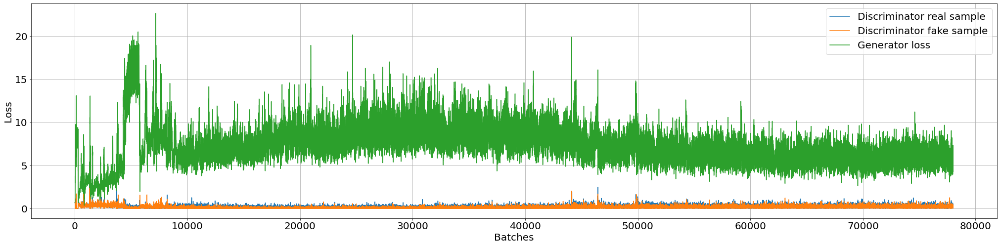

In [29]:
# Plot discriminator, generator and GAN loss w.r.t batches
import matplotlib
plt.figure("History plot", figsize=(35,8))
matplotlib.rc('xtick', labelsize = 20)
matplotlib.rc('ytick', labelsize = 20)
plt.xlabel("Batches", fontsize = 20)
plt.ylabel("Loss", fontsize = 20)
plt.plot(loss_ising[:,0], label = 'Discriminator real sample', )
plt.plot(loss_ising[:,1], label = 'Discriminator fake sample')
plt.plot(loss_ising[:,2], label = 'Generator loss')
plt.legend(fontsize = 20)
plt.grid(1)
plt.show()

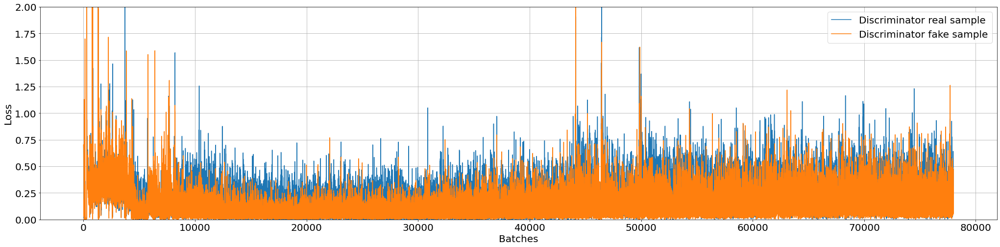

In [30]:
# Zoom on the two discriminator losses
import matplotlib
plt.figure("History plot", figsize=(35,8))
matplotlib.rc('xtick', labelsize = 20)
matplotlib.rc('ytick', labelsize = 20)
plt.xlabel("Batches", fontsize = 20)
plt.ylabel("Loss", fontsize = 20)
plt.plot(loss_ising[:,0], label = 'Discriminator real sample')
plt.plot(loss_ising[:,1], label = 'Discriminator fake sample')
plt.ylim([0, 2])
plt.legend(fontsize = 20)
plt.grid(1)
plt.show()

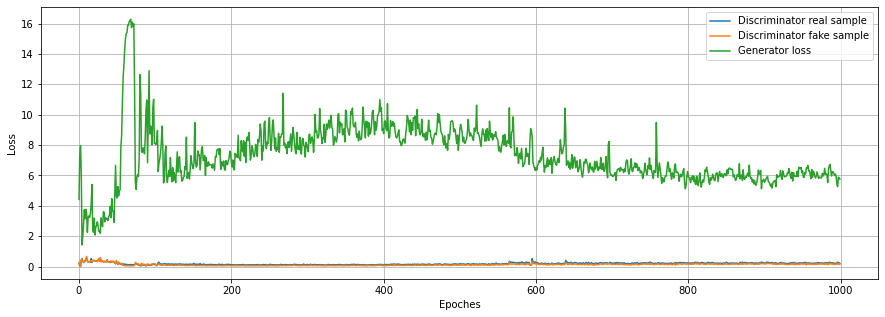

In [38]:
# Calculate the mean loss for each epoch
loss_ising_epoch = []
for i in range(1000):
    loss_ising_epoch.append(np.mean(loss_ising[78*i:78*(i+1),:], axis = 0))
    
# Plot discriminators and generator loss w.r.t epoches   
plt.figure("History plot", figsize=(15,5))
matplotlib.rc('xtick', labelsize = 10)
matplotlib.rc('ytick', labelsize = 10)
plt.xlabel("Epoches", fontsize = 10)
plt.ylabel("Loss", fontsize = 10)
plt.plot(np.array(loss_ising_epoch)[:,0], label = 'Discriminator real sample')
plt.plot(np.array(loss_ising_epoch)[:,1], label = 'Discriminator fake sample')
plt.plot(np.array(loss_ising_epoch)[:,2], label = 'Generator loss')
plt.legend(fontsize = 10)
plt.grid(1)
plt.show()

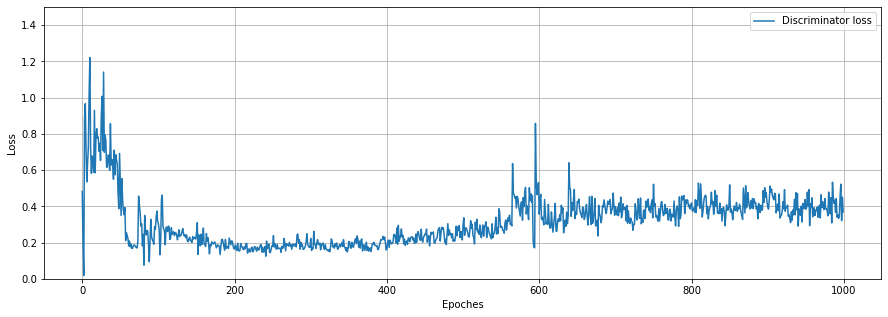

In [45]:
# Zoom on the sum of the two discriminator losses
plt.figure("History plot", figsize=(15,5))
matplotlib.rc('xtick', labelsize = 10)
matplotlib.rc('ytick', labelsize = 10)
plt.xlabel("Epoches", fontsize = 10)
plt.ylabel("Loss", fontsize = 10)
plt.plot(np.array(loss_ising_epoch)[:,0] + np.array(loss_ising_epoch)[:,1], label = 'Discriminator loss')
plt.ylim([0,1.5])
plt.legend(fontsize = 10)
plt.grid(1)
plt.show()

# Generate data samples

In [46]:
# Example of loading the generator model and generating images
from numpy import asarray
from numpy.random import randn
from numpy.random import randint
from keras.models import load_model
from matplotlib import pyplot
 
# Generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=100):
    
    # Generate points in the latent space
    x_input = randn(latent_dim * n_samples)    
    # Reshape into a batch of inputs for the network
    z_input = x_input.reshape(n_samples, latent_dim)    
    # Generate labels
    labels = randint(0, n_classes, n_samples)
    return [z_input, labels]
 
# Create and save a plot of generated images
def plot(examples, m, n):
    
    plt.figure(figsize=(50,50))    
    # Plot images
    for i in range(n * m):        
        # Define subplot
        plt.subplot(m, n, 1 + i)
        plt.axis('off')     
        plt.title('T ≈ {} '.format(gen_labels[i]/10*0.5))
        # Plot raw pixel data
        plt.imshow(examples[i, :, :, 0], cmap='Greys')
    plt.show()

In [53]:
# Load generator model
gen_model = load_model('cgan_generator.h5')

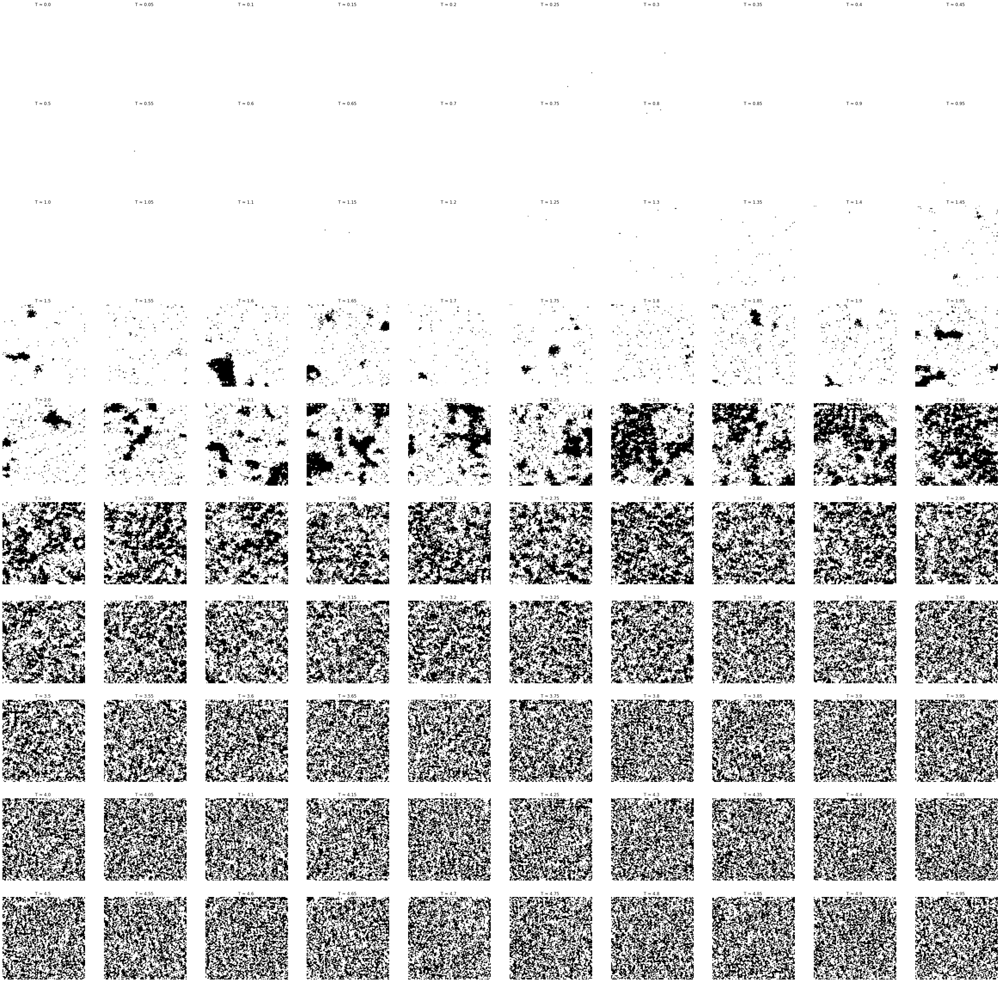

In [54]:
# Generate images
latent_points, gen_labels = generate_latent_points(500, 100)
# Specify label

gen_labels = asarray([x for x in range(100)])
# Generate images
X  = gen_model.predict([latent_points, gen_labels])
# Plot the result
plot(X, 10, 10)

# Statistics: Real vs Fake

In [55]:
# Generate 10000 images 
latent_points, gen_labels = generate_latent_points(500, 10000)
# Specify labels
gen_labels = asarray(np.arange(0,100,0.01))
# Generate images
X  = gen_model.predict([latent_points, gen_labels])
X = X.squeeze(-1)

# Magnetization

For the magnetization: $\langle M \rangle = \frac{1}{N} \sum_i^N \sigma_i$ 

In [56]:
# Dati generati
magn_gen = np.sum(X, axis = (1,2)) / (96*96)

In [57]:
# Dati reali
data_mean = (np.sum(data, axis = (1,2)) / (96*96)).reshape(10000,1)
labels = np.reshape(labels, (10000,1))
# Create a dataframe with magnetization value per temperature
import pandas as pd
complete = np.concatenate((data_mean, labels), axis = 1)
complete_df = pd.DataFrame(complete, columns =['data', 'labels'])
# Sort the magnetization value w.r.t temperature
magn_real_df = complete_df.sort_values('labels')

In [60]:
# Analytical solution by Onsager
temperature = np.arange(0,5,0.0001)[1:]
inv = 1/temperature
den = 1/((np.sinh(2*inv))**4)
onsager = (1 - den) ** (1/8)
onsager = np.nan_to_num(onsager)

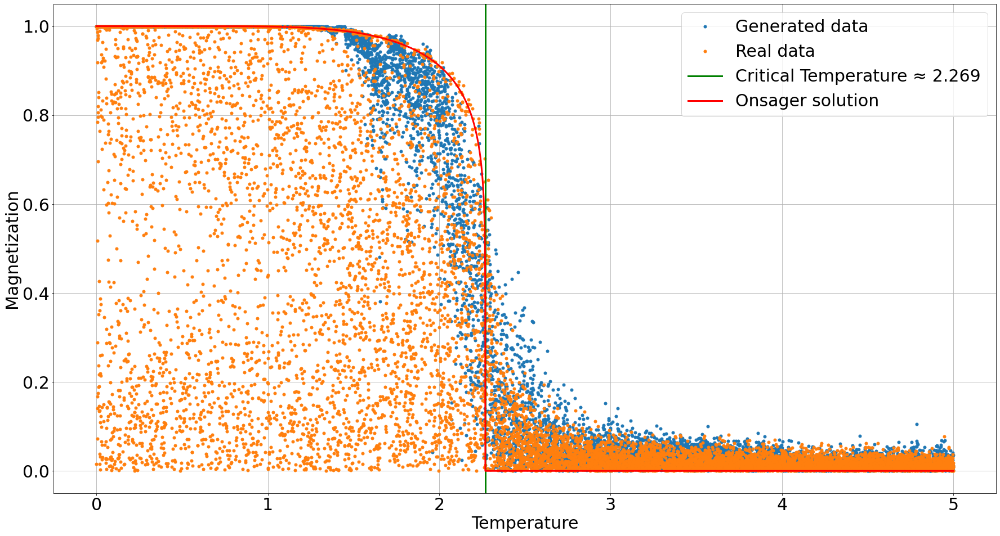

In [61]:
# Plot Magnetization
plt.figure(figsize=(30,16))
plt.plot(gen_labels/10*0.5, np.abs(magn_gen), 'o', label = 'Generated data', markersize = 5)
plt.plot(np.array(magn_real_df.iloc[:,1]), np.abs(np.array(magn_real_df.iloc[:,0])),
         'o', label = 'Real data', markersize = 5)
plt.axvline(x = 2.269, color = "green", label = "Critical Temperature ≈ 2.269", linewidth = 3)
plt.plot(temperature, onsager, label = "Onsager solution", linewidth=3, color = 'red')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel("Temperature", fontsize = 30)
plt.ylabel("Magnetization", fontsize = 30)
plt.legend(fontsize = 30)
plt.grid(1)
plt.show()

# Magnetic Susceptibility

For the susceptibility: $\chi = \frac{\partial M}{\partial T} = \frac{\langle M^2 \rangle - \langle M \rangle ^ 2}{T}$ 

In [62]:
# Generated data
# Calculate the squared magnetization mean
sq_magn_mean = np.sum(X**2, axis = (1,2)) / (96*96)

# Calculate the magnetization mean squared
mean_magn_sq = magn_gen**2

# Magnetic susceptibility
chi_gen = (sq_magn_mean - mean_magn_sq) /(gen_labels/10*0.5)

In [63]:
# Real data
# Calculate the squared magnetization mean
square = np.sum(data**2, axis = (1,2))
square_reshaped = np.reshape(square, (10000,1))
sq_mean = square_reshaped / (96*96)

# Calculate the magnetization mean squared
mean = np.mean(data, axis = (1,2))
mean_reshaped = np.reshape(mean, (10000,1))
mean_sq = mean_reshaped**2

# Magnetic susceptibility
chi = (sq_mean - mean_sq) / labels

# Define a dataframe in order to sort the susceptibility w.r.t temperature
import pandas as pd
magn_chi = np.concatenate((chi, labels), axis = 1)
magn_chi_df = pd.DataFrame(magn_chi, columns =['data', 'labels'])
chi_final_df = magn_chi_df.sort_values('labels')

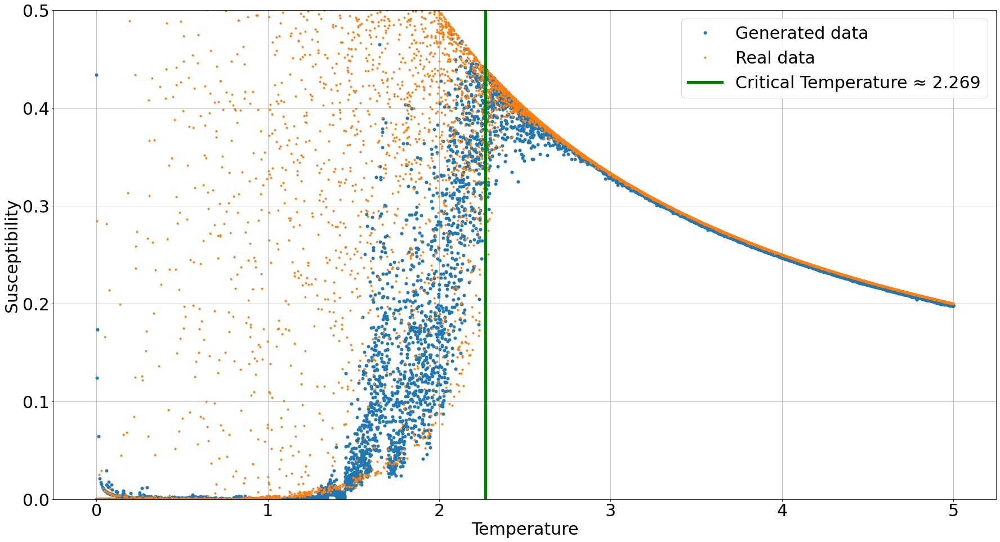

In [66]:
# Plot Magnetizzazione
plt.figure(figsize=(30,16))
plt.plot(gen_labels/10*0.5, chi_gen, 'o', label = 'Generated data', markersize = 5)
plt.plot((np.array(chi_final_df.iloc[:,1])), np.abs(np.array(chi_final_df.iloc[:,0])),
         'o', label = 'Real data', markersize = 3)
plt.axvline(x = 2.269, color = "green", label = "Critical Temperature ≈ 2.269", linewidth = 5)
plt.ylim([0, 0.5])
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel("Temperature", fontsize = 30)
plt.ylabel("Susceptibility", fontsize = 30)
plt.legend(fontsize = 30)
plt.grid(1)
plt.show()

# Energy

For the energy: $E = -\frac{1}{N} \sum_{\langle i,j \rangle }^N \sigma_i \sigma_j$

In [69]:
# Generated
# Initialize the energy array
energy_gen = np.zeros(10000)
c = 0
for h in range(10000):
    dE = np.zeros(4)
    for i in range(96):
        for j in range(96):
            
            # Take into account the periodic condition for all neighbours
            if i == 0:
                dE[0]+= X[h,i,j]*X[h,95,j]
            else:
                dE[0]+= X[h,i,j]*X[h,i-1,j]

            if j == 0:
                dE[1]+= X[h,i,j]*X[h,i,95]
            else:
                dE[1]+= X[h,i,j]*X[h,i,j-1]
                
            if i == 95:
                dE[2]+= X[h,i,j]*X[h,0,j]
            else:
                dE[2]+= X[h,i,j]*X[h,i+1,j]
                
            if j == 95:
                dE[3]+= X[h,i,j]*X[h,i,0]
            else:
                dE[3]+= X[h,i,j]*X[h,i,j+1]
                
    # Sum all the energy contribution
    energy_gen[c] = (-1)*np.sum(dE)
    c+= 1
# Calculate the mean energy (the 1/2 factor is justified by the fact 
# that using this algorithm we count two times all the contribution)
mean_en_gen = energy_gen / (2*96*96)

In [70]:
# Real data
# Initialize the energy array
energy = np.zeros(10000)
for h in range(10000):
    dE = np.zeros(4)
    for i in range(96):
        for j in range(96):
            
            # Take into account the periodic condition for all neighbours
            if i == 0:
                dE[0]+= data[h,i,j]*data[h,95,j]
            else:
                dE[0]+= data[h,i,j]*data[h,i-1,j]

            if j == 0:
                dE[1]+= data[h,i,j]*data[h,i,95]
            else:
                dE[1]+= data[h,i,j]*data[h,i,j-1]
                
            if i == 95:
                dE[2]+= data[h,i,j]*data[h,0,j]
            else:
                dE[2]+= data[h,i,j]*data[h,i+1,j]
                
            if j == 95:
                dE[3]+= data[h,i,j]*data[h,i,0]
            else:
                dE[3]+= data[h,i,j]*data[h,i,j+1]
                
    # Sum all the energy contribution
    energy[h] = (-1)*np.sum(dE)
    
# Calculate the mean energy (the 1/2 factor is justified by the fact 
# that using this algorithm we count two times all the contribution)
mean_en = energy / (2*96*96)

# Define a dataframe in order to sort the energy w.r.t temperature
import pandas as pd
energy = np.concatenate((mean_en.reshape(10000,1), labels), axis = 1)
energy_df = pd.DataFrame(energy, columns =['data', 'labels'])
energy_final_df = energy_df.sort_values('labels')

In [71]:
# Create temperature labels for the generated data
temp = np.arange(10000)/1000*0.5

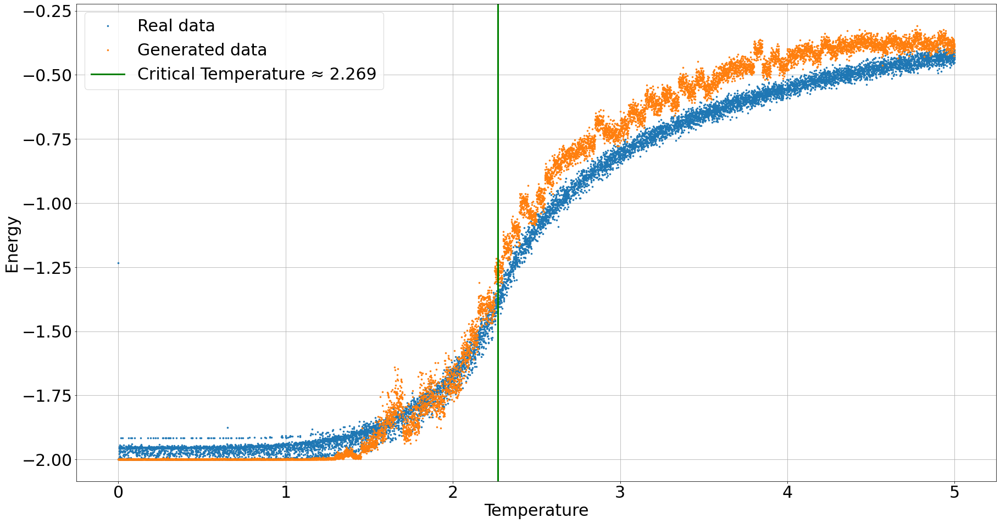

In [75]:
# Plot Energia
plt.figure(figsize=(30,16))
plt.plot(np.array(energy_final_df.iloc[:,1]), np.array(energy_final_df.iloc[:,0]),
         '.', label = 'Real data', markersize = 5)
plt.plot(temp, mean_en_gen,
         '.', label = 'Generated data', markersize = 5)
plt.axvline(x = 2.269, color = "green", label = "Critical Temperature ≈ 2.269", linewidth = 3)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel("Temperature", fontsize = 30)
plt.ylabel("Energy", fontsize = 30)
plt.legend(fontsize = 30)
plt.grid(1)
plt.show()

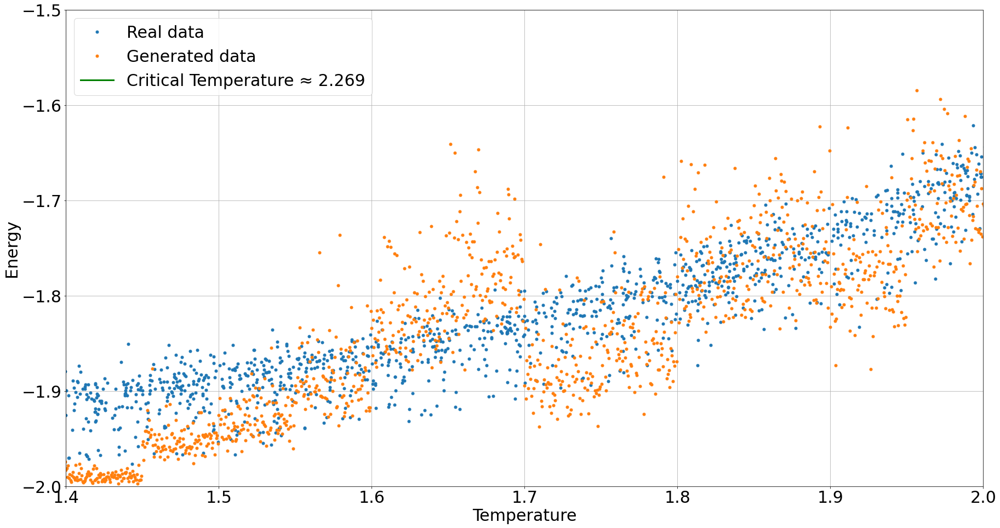

In [74]:
# Zoom of the window x=[1.4,2] and y=[-2,-1.5] in order to show the discretization effect
plt.figure(figsize=(30,16))
plt.plot(np.array(energy_final_df.iloc[:,1]), np.array(energy_final_df.iloc[:,0]),
         'o', label = 'Real data', markersize = 5)
plt.plot(temp, mean_en_gen,
         'o', label = 'Generated data', markersize = 5)
plt.axvline(x = 2.269, color = "green", label = "Critical Temperature ≈ 2.269", linewidth = 3)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlim([1.4,2])
plt.ylim([-2,-1.5])
plt.xlabel("Temperature", fontsize = 30)
plt.ylabel("Energy", fontsize = 30)
plt.legend(fontsize = 30)
plt.grid(1)
plt.show()

# Heat Capacity

For the heat capacity: $\frac{\partial \langle H \rangle}{\partial T} = \frac{\langle H^2 \rangle - \langle H \rangle ^2}{T^2}$

In [76]:
# Generated
# Initialize the heat capacity array
HC_gen = np.zeros(10000)
c = 0
for h in range(10000):
    dHC = np.zeros(4)
    for i in range(96):
        for j in range(96):
            
            # Take into account the periodic condition for all neighbours
            if i == 0:
                dHC[0]+= (X[h,i,j]*X[h,95,j])**2
            else:
                dHC[0]+= (X[h,i,j]*X[h,i-1,j])**2

            if j == 0:
                dHC[1]+= (X[h,i,j]*X[h,i,95])**2
            else:
                dHC[1]+= (X[h,i,j]*X[h,i,j-1])**2
                
            if i == 95:
                dHC[2]+= (X[h,i,j]*X[h,0,j])**2
            else:
                dHC[2]+= (X[h,i,j]*X[h,i+1,j])**2
                
            if j == 95:
                dHC[3]+= (X[h,i,j]*X[h,i,0])**2
            else:
                dHC[3]+= (X[h,i,j]*X[h,i,j+1])**2
                
    # Sum all the hc contribution
    HC_gen[h] = np.sum(dHC)
    c+= 1 

In [77]:
# Calculate the squared hc mean    
mean_sq_en_gen = HC_gen / (96*96)

# Calculate the energy mean squared
sq_mean_en_gen = mean_en_gen**2

# Define the heat capacity
HC_generated = (mean_sq_en_gen - sq_mean_en_gen) / (temp**2)

In [78]:
# Real
# Initialize the heat capacity array
HC_real = np.zeros(10000)
for h in range(10000):
    dHC = np.zeros(4)
    for i in range(96):
        for j in range(96):
            
            # Take into account the periodic condition for all neighbours
            if i == 0:
                dHC[0]+= (data[h,i,j]*data[h,95,j])**2
            else:
                dHC[0]+= (data[h,i,j]*data[h,i-1,j])**2

            if j == 0:
                dHC[1]+= (data[h,i,j]*data[h,i,95])**2
            else:
                dHC[1]+= (data[h,i,j]*data[h,i,j-1])**2
                
            if i == 95:
                dHC[2]+= (data[h,i,j]*data[h,0,j])**2
            else:
                dHC[2]+= (data[h,i,j]*data[h,i+1,j])**2
                
            if j == 95:
                dHC[3]+= (data[h,i,j]*data[h,i,0])**2
            else:
                dHC[3]+= (data[h,i,j]*data[h,i,j+1])**2
                
    # Sum all the hc contribution
    HC_real[h] = np.sum(dHC)

In [79]:
# Calculate the squared hc mean    
mean_sq_en = HC_real / (96*96)

# Calculate the energy mean squared
sq_mean_en = mean_en**2

# Define the heat capacity
HC = (mean_sq_en - sq_mean_en) / ((labels.ravel())**2)

# Define a dataframe in order to sort the energy w.r.t temperature
import pandas as pd
heat = np.concatenate((HC.reshape(10000,1), labels), axis = 1)
heat_df = pd.DataFrame(heat, columns =['data', 'labels'])
heat_final_df = heat_df.sort_values('labels')

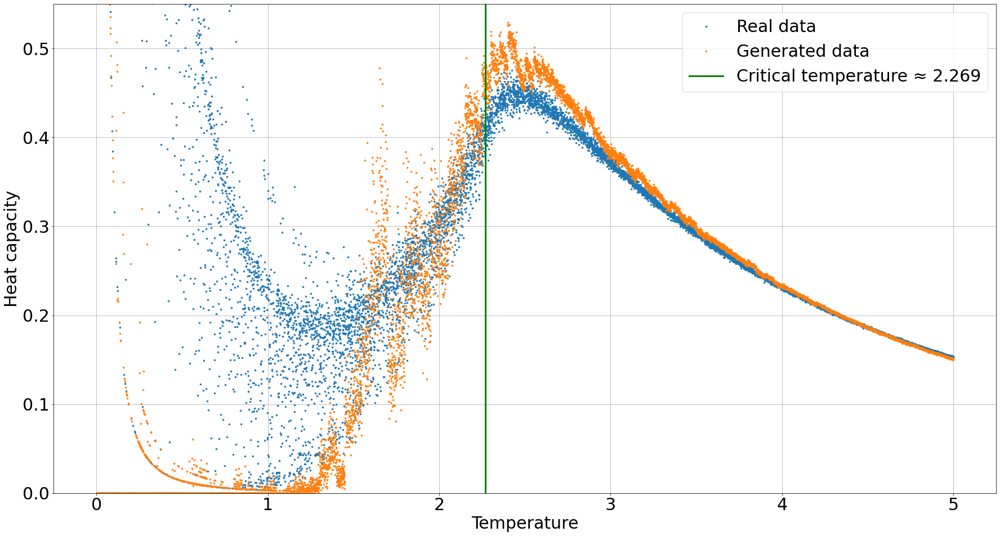

In [81]:
# Plot Heat Capacity
import matplotlib
plt.figure(figsize=(30,16))
matplotlib.rc('xtick', labelsize=30) 
matplotlib.rc('ytick', labelsize=30) 
plt.plot(np.array(heat_final_df.iloc[:,1]), np.array(heat_final_df.iloc[:,0]),
         '.', label = 'Real data', markersize = 5)
plt.plot(temp, HC_generated, '.', label = 'Generated data', markersize = 5)
plt.axvline(x = 2.269, color='green', label = 'Critical temperature ≈ 2.269', linewidth = 3)
plt.ylim([0,0.55])
plt.xlabel('Temperature', fontsize=30)
plt.ylabel('Heat capacity', fontsize=30)
plt.legend(fontsize=30)
plt.grid(1)
plt.show()